# Benchmark: Uploading dataset to s3 bucket VS Hub 
Author: Margaux Masson-Forsythe

## Imports

In [41]:
!pip install hub==2.0.7

In [42]:
import hub
print(hub.__version__)

2.0.7


In [43]:
from glob import glob
import boto3
from botocore.exceptions import NoCredentialsError
from timeit import default_timer as timer
from tqdm import tqdm
import numpy as np
from PIL import Image
import os

## Load Dataset from Kaggle: A Large-Scale Dataset for Fish Segmentation and Classification: https://www.kaggle.com/crowww/a-large-scale-fish-dataset

In [5]:
!export KAGGLE_USERNAME="xxxxx" && export KAGGLE_KEY="xxxxxxxxx" && kaggle datasets download -d crowww/a-large-scale-fish-dataset

100% 3.24G/3.24G [00:35<00:00, 129MB/s]
100% 3.24G/3.24G [00:35<00:00, 98.5MB/s]


In [6]:
!unzip -n a-large-scale-fish-dataset.zip

Streaming output truncated to the last 5000 lines.
  inflating: Fish_Dataset/Fish_Dataset/Shrimp/Shrimp/00435.png  
  inflating: Fish_Dataset/Fish_Dataset/Shrimp/Shrimp/00436.png  
  inflating: Fish_Dataset/Fish_Dataset/Shrimp/Shrimp/00437.png  
  inflating: Fish_Dataset/Fish_Dataset/Shrimp/Shrimp/00438.png  
  inflating: Fish_Dataset/Fish_Dataset/Shrimp/Shrimp/00439.png  
  inflating: Fish_Dataset/Fish_Dataset/Shrimp/Shrimp/00440.png  
  inflating: Fish_Dataset/Fish_Dataset/Shrimp/Shrimp/00441.png  
  inflating: Fish_Dataset/Fish_Dataset/Shrimp/Shrimp/00442.png  
  inflating: Fish_Dataset/Fish_Dataset/Shrimp/Shrimp/00443.png  
  inflating: Fish_Dataset/Fish_Dataset/Shrimp/Shrimp/00444.png  
  inflating: Fish_Dataset/Fish_Dataset/Shrimp/Shrimp/00445.png  
  inflating: Fish_Dataset/Fish_Dataset/Shrimp/Shrimp/00446.png  
  inflating: Fish_Dataset/Fish_Dataset/Shrimp/Shrimp/00447.png  
  inflating: Fish_Dataset/Fish_Dataset/Shrimp/Shrimp/00448.png  
  inflating: Fish_Dataset/Fish_Dataset/

In [7]:
!ls Fish_Dataset/Fish_Dataset/

'Black Sea Sprat'   README.txt	     Segmentation_example_script.m
'Gilt-Head Bream'  'Red Mullet'      Shrimp
'Hourse Mackerel'  'Red Sea Bream'  'Striped Red Mullet'
 license.txt	   'Sea Bass'	     Trout


In [15]:
dataset_path = './Fish_Dataset/Fish_Dataset/'

In [16]:
files_in_fish_set = glob("./Fish_Dataset/Fish_Dataset/**/**/*.png")
print(f"There are {len(files_in_fish_set)} images in the dataset")

There are 18000 images in the dataset


In [17]:
import fnmatch

files_in_fish_set_images = []
files_in_fish_set_GT = []
for dirpath, dirs, files in os.walk(dataset_path): 
  for filename in fnmatch.filter(files, '*.png'):
    fname = os.path.join(dirpath,filename)
    if 'GT' in fname:
      files_in_fish_set_GT.append(fname)
    else:
      files_in_fish_set_images.append(fname)

print(f'There are {len(files_in_fish_set_images)} pictures of fish and {len(files_in_fish_set_GT)} corresponding masks (GT)')

There are 9000 pictures of fish and 9000 corresponding masks (GT)


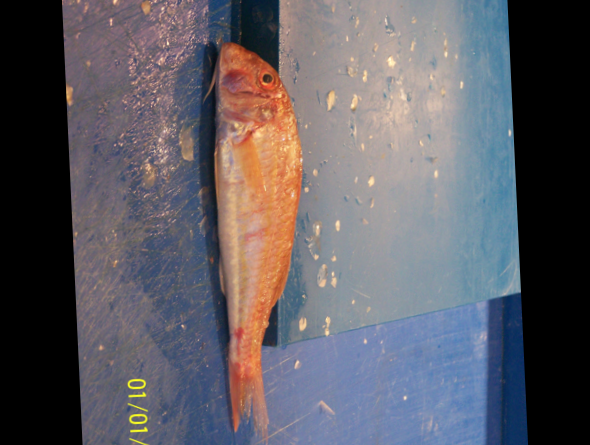

In [18]:
# Image of the fish
Image.open(files_in_fish_set_images[0]).show()

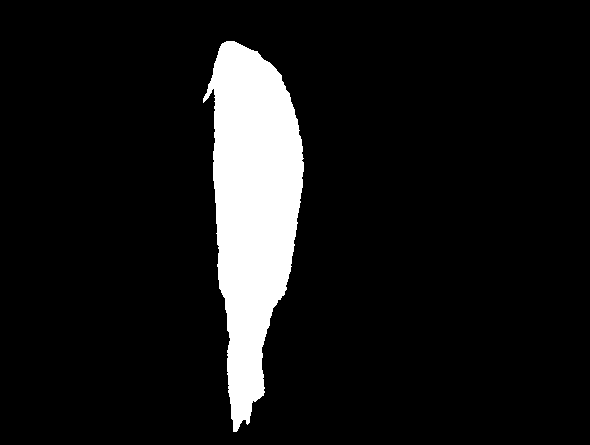

In [19]:
# Segmentation Mask
Image.open(files_in_fish_set_GT[0]).show()

## Send dataset to s3 bucket

1) Uploading to s3 using AWS CLI

In [ ]:
# Install AWS CLI 
!pip install --upgrade awscli

In [8]:
# Check awscli was correctly installed
!aws --version

aws-cli/1.20.26 Python/3.7.11 Linux/5.4.104+ botocore/1.21.26


In [6]:
!cp /content/credentials ~/.aws/credentials

In [ ]:
# Congigure AWS credentials 
# !aws configure 

In [7]:
# Setting up timer to perform benchmarking
start = timer()

In [8]:
# Send dataset to s3 using aws CLI
# We created a bucket "fish-classification-segmentation-dataset" in s3 ahead of time
!aws s3 cp --recursive --no-progress --only-show-errors "./Fish_Dataset" "s3://fish-classification-segmentation-dataset" 

In [9]:
# End timer
end = timer()
total_time_s3 = end-start

print(f"Uploading all the files in the Fish dataset to s3 took {total_time_s3} seconds")

Uploading all the files in the Fish dataset to s3 took 369.0134469759996 seconds


2) Uploading to s3 using boto3: all images / unzipped dataset

In [10]:
def upload_to_aws(s3_client, local_file, bucket, s3_file):
    # Try to upload file to s3 bucket and handle errors that can happens. 
    # Returns True if success, False otherwise
    try:
        s3_client.upload_file(local_file, bucket, s3_file)
        print("Upload Successful")
        return True
    except FileNotFoundError:
        print("The file was not found")
        return False
    except NoCredentialsError:
        print("Credentials not available")
        return False

In [11]:
ACCESS_KEY = 'xxxxxx'
SECRET_KEY = 'xxxxxx'
AWS_SESSION_TOKEN="xxxxxxx"


In [13]:
# Set up connection to s3 account with credentials provided by user
s3_client = boto3.client('s3', aws_access_key_id=ACCESS_KEY,
                          aws_secret_access_key=SECRET_KEY, 
                         aws_session_token=AWS_SESSION_TOKEN)

In [20]:
# We created a bucket in s3 called fish-classification-segmentation-dataset-boto3
bucket_name = "fish-classification-segmentation-dataset-boto3"

# Setting up timer to perform benchmarking
start = timer()

for img_path in tqdm(files_in_fish_set):
  # We only want the file's name after "./Fish_Dataset/Fish_Dataset/"
  file_name_in_s3 = img_path.split(dataset_path)[1]
  # Upload file to the bucket 
  uploaded = upload_to_aws(s3_client, img_path, bucket_name, file_name_in_s3)

# End timer
end = timer()
total_time_s3 = end-start

print(f"Uploading all the files in the Fish dataset to s3 took {total_time_s3} seconds")

  0%|          | 1/18000 [00:00<3:56:43,  1.27it/s]

Upload Successful


  0%|          | 2/18000 [00:01<2:28:47,  2.02it/s]

Upload Successful


  0%|          | 3/18000 [00:01<1:51:40,  2.69it/s]

Upload Successful


  0%|          | 4/18000 [00:01<1:39:25,  3.02it/s]

Upload Successful


  0%|          | 5/18000 [00:01<1:28:30,  3.39it/s]

Upload Successful


  0%|          | 6/18000 [00:02<1:19:56,  3.75it/s]

Upload Successful


  0%|          | 7/18000 [00:02<1:17:30,  3.87it/s]

Upload Successful


  0%|          | 8/18000 [00:02<1:13:23,  4.09it/s]

Upload Successful


  0%|          | 9/18000 [00:02<1:12:52,  4.11it/s]

Upload Successful


  0%|          | 10/18000 [00:02<1:10:34,  4.25it/s]

Upload Successful


  0%|          | 11/18000 [00:03<1:09:50,  4.29it/s]

Upload Successful


  0%|          | 12/18000 [00:03<1:12:25,  4.14it/s]

Upload Successful


  0%|          | 14/18000 [00:03<1:06:01,  4.54it/s]

Upload Successful
Upload Successful


  0%|          | 15/18000 [00:04<1:07:22,  4.45it/s]

Upload Successful


  0%|          | 16/18000 [00:04<1:14:28,  4.02it/s]

Upload Successful


  0%|          | 17/18000 [00:04<1:12:34,  4.13it/s]

Upload Successful


  0%|          | 18/18000 [00:04<1:10:12,  4.27it/s]

Upload Successful


  0%|          | 19/18000 [00:05<1:10:02,  4.28it/s]

Upload Successful


  0%|          | 20/18000 [00:05<1:10:04,  4.28it/s]

Upload Successful


  0%|          | 21/18000 [00:05<1:09:04,  4.34it/s]

Upload Successful


  0%|          | 22/18000 [00:05<1:07:34,  4.43it/s]

Upload Successful


  0%|          | 23/18000 [00:05<1:08:04,  4.40it/s]

Upload Successful


  0%|          | 24/18000 [00:06<1:08:05,  4.40it/s]

Upload Successful


  0%|          | 25/18000 [00:06<1:08:56,  4.35it/s]

Upload Successful


  0%|          | 27/18000 [00:07<1:18:51,  3.80it/s]

Upload Successful
Upload Successful


  0%|          | 28/18000 [00:07<1:34:37,  3.17it/s]

Upload Successful


  0%|          | 30/18000 [00:07<1:17:42,  3.85it/s]

Upload Successful
Upload Successful


  0%|          | 31/18000 [00:08<1:13:50,  4.06it/s]

Upload Successful


  0%|          | 32/18000 [00:08<1:12:09,  4.15it/s]

Upload Successful


  0%|          | 33/18000 [00:08<1:10:51,  4.23it/s]

Upload Successful


  0%|          | 35/18000 [00:08<1:05:50,  4.55it/s]

Upload Successful
Upload Successful


  0%|          | 36/18000 [00:09<1:05:14,  4.59it/s]

Upload Successful


  0%|          | 38/18000 [00:09<1:03:04,  4.75it/s]

Upload Successful
Upload Successful


  0%|          | 39/18000 [00:09<1:03:08,  4.74it/s]

Upload Successful


  0%|          | 40/18000 [00:10<1:04:54,  4.61it/s]

Upload Successful


  0%|          | 41/18000 [00:10<1:05:33,  4.57it/s]

Upload Successful


  0%|          | 43/18000 [00:10<1:03:27,  4.72it/s]

Upload Successful
Upload Successful


  0%|          | 44/18000 [00:10<1:07:18,  4.45it/s]

Upload Successful


  0%|          | 45/18000 [00:11<1:07:02,  4.46it/s]

Upload Successful


  0%|          | 46/18000 [00:11<1:07:51,  4.41it/s]

Upload Successful


  0%|          | 47/18000 [00:11<1:06:46,  4.48it/s]

Upload Successful


  0%|          | 48/18000 [00:11<1:11:12,  4.20it/s]

Upload Successful


  0%|          | 49/18000 [00:12<1:09:55,  4.28it/s]

Upload Successful


  0%|          | 50/18000 [00:12<1:09:17,  4.32it/s]

Upload Successful


  0%|          | 51/18000 [00:12<1:10:01,  4.27it/s]

Upload Successful


  0%|          | 52/18000 [00:12<1:09:57,  4.28it/s]

Upload Successful


  0%|          | 53/18000 [00:13<1:08:15,  4.38it/s]

Upload Successful


  0%|          | 54/18000 [00:13<1:06:45,  4.48it/s]

Upload Successful


  0%|          | 55/18000 [00:13<1:08:14,  4.38it/s]

Upload Successful


  0%|          | 56/18000 [00:13<1:07:16,  4.44it/s]

Upload Successful


  0%|          | 57/18000 [00:13<1:08:34,  4.36it/s]

Upload Successful


  0%|          | 58/18000 [00:14<1:08:44,  4.35it/s]

Upload Successful


  0%|          | 59/18000 [00:14<1:08:56,  4.34it/s]

Upload Successful


  0%|          | 60/18000 [00:14<1:09:14,  4.32it/s]

Upload Successful


  0%|          | 61/18000 [00:14<1:08:18,  4.38it/s]

Upload Successful


  0%|          | 62/18000 [00:15<1:07:48,  4.41it/s]

Upload Successful


  0%|          | 64/18000 [00:15<1:05:24,  4.57it/s]

Upload Successful
Upload Successful


  0%|          | 65/18000 [00:15<1:02:51,  4.76it/s]

Upload Successful


  0%|          | 66/18000 [00:15<1:05:51,  4.54it/s]

Upload Successful


  0%|          | 68/18000 [00:16<1:03:21,  4.72it/s]

Upload Successful
Upload Successful


  0%|          | 69/18000 [00:16<1:04:31,  4.63it/s]

Upload Successful


  0%|          | 70/18000 [00:16<1:08:41,  4.35it/s]

Upload Successful


  0%|          | 71/18000 [00:17<1:08:28,  4.36it/s]

Upload Successful


  0%|          | 72/18000 [00:17<1:11:13,  4.20it/s]

Upload Successful


  0%|          | 73/18000 [00:17<1:10:33,  4.23it/s]

Upload Successful


  0%|          | 74/18000 [00:17<1:08:57,  4.33it/s]

Upload Successful


  0%|          | 75/18000 [00:18<1:08:34,  4.36it/s]

Upload Successful


  0%|          | 76/18000 [00:18<1:12:04,  4.15it/s]

Upload Successful


  0%|          | 77/18000 [00:18<1:13:48,  4.05it/s]

Upload Successful


  0%|          | 78/18000 [00:18<1:13:51,  4.04it/s]

Upload Successful


  0%|          | 80/18000 [00:19<1:07:10,  4.45it/s]

Upload Successful
Upload Successful


  0%|          | 81/18000 [00:19<1:13:11,  4.08it/s]

Upload Successful


  0%|          | 82/18000 [00:19<1:14:49,  3.99it/s]

Upload Successful


  0%|          | 83/18000 [00:19<1:12:33,  4.12it/s]

Upload Successful


  0%|          | 84/18000 [00:20<1:11:01,  4.20it/s]

Upload Successful


  0%|          | 85/18000 [00:20<1:09:41,  4.28it/s]

Upload Successful


  0%|          | 86/18000 [00:20<1:07:53,  4.40it/s]

Upload Successful


  0%|          | 87/18000 [00:20<1:06:49,  4.47it/s]

Upload Successful


  0%|          | 88/18000 [00:21<1:06:40,  4.48it/s]

Upload Successful


  0%|          | 89/18000 [00:21<1:07:26,  4.43it/s]

Upload Successful


  0%|          | 90/18000 [00:21<1:08:17,  4.37it/s]

Upload Successful


  1%|          | 91/18000 [00:21<1:08:07,  4.38it/s]

Upload Successful


  1%|          | 92/18000 [00:22<1:09:24,  4.30it/s]

Upload Successful


  1%|          | 93/18000 [00:22<1:12:40,  4.11it/s]

Upload Successful


  1%|          | 94/18000 [00:22<1:10:06,  4.26it/s]

Upload Successful


  1%|          | 95/18000 [00:22<1:11:16,  4.19it/s]

Upload Successful


  1%|          | 96/18000 [00:22<1:10:26,  4.24it/s]

Upload Successful


  1%|          | 97/18000 [00:23<1:09:31,  4.29it/s]

Upload Successful


  1%|          | 98/18000 [00:23<1:06:57,  4.46it/s]

Upload Successful


  1%|          | 99/18000 [00:23<1:06:10,  4.51it/s]

Upload Successful


  1%|          | 100/18000 [00:23<1:05:54,  4.53it/s]

Upload Successful


  1%|          | 101/18000 [00:24<1:50:50,  2.69it/s]

Upload Successful


  1%|          | 103/18000 [00:25<1:29:53,  3.32it/s]

Upload Successful
Upload Successful


  1%|          | 104/18000 [00:25<1:18:32,  3.80it/s]

Upload Successful


  1%|          | 105/18000 [00:25<1:13:36,  4.05it/s]

Upload Successful


  1%|          | 107/18000 [00:25<1:07:00,  4.45it/s]

Upload Successful
Upload Successful


  1%|          | 109/18000 [00:26<1:03:36,  4.69it/s]

Upload Successful
Upload Successful


  1%|          | 110/18000 [00:26<1:02:23,  4.78it/s]

Upload Successful


  1%|          | 111/18000 [00:26<1:04:41,  4.61it/s]

Upload Successful


  1%|          | 112/18000 [00:26<1:05:23,  4.56it/s]

Upload Successful


  1%|          | 113/18000 [00:27<1:04:13,  4.64it/s]

Upload Successful


  1%|          | 114/18000 [00:27<1:04:34,  4.62it/s]

Upload Successful


  1%|          | 115/18000 [00:27<1:05:01,  4.58it/s]

Upload Successful


  1%|          | 117/18000 [00:27<1:02:51,  4.74it/s]

Upload Successful
Upload Successful


  1%|          | 118/18000 [00:28<1:01:12,  4.87it/s]

Upload Successful
Upload Successful


  1%|          | 120/18000 [00:28<59:35,  5.00it/s]  

Upload Successful


  1%|          | 121/18000 [00:28<1:00:12,  4.95it/s]

Upload Successful


  1%|          | 123/18000 [00:29<1:00:27,  4.93it/s]

Upload Successful
Upload Successful


  1%|          | 124/18000 [00:29<1:03:07,  4.72it/s]

Upload Successful


  1%|          | 125/18000 [00:29<1:03:27,  4.69it/s]

Upload Successful


  1%|          | 126/18000 [00:29<1:03:13,  4.71it/s]

Upload Successful


  1%|          | 127/18000 [00:30<1:02:54,  4.74it/s]

Upload Successful


  1%|          | 129/18000 [00:30<1:02:39,  4.75it/s]

Upload Successful
Upload Successful


  1%|          | 130/18000 [00:30<1:04:35,  4.61it/s]

Upload Successful


  1%|          | 131/18000 [00:30<1:04:35,  4.61it/s]

Upload Successful


  1%|          | 133/18000 [00:31<1:02:05,  4.80it/s]

Upload Successful
Upload Successful


  1%|          | 135/18000 [00:31<59:15,  5.03it/s]  

Upload Successful
Upload Successful


  1%|          | 136/18000 [00:31<58:18,  5.11it/s]

Upload Successful


  1%|          | 137/18000 [00:32<58:49,  5.06it/s]

Upload Successful


  1%|          | 138/18000 [00:32<1:00:39,  4.91it/s]

Upload Successful


  1%|          | 139/18000 [00:32<1:02:22,  4.77it/s]

Upload Successful


  1%|          | 140/18000 [00:32<1:04:22,  4.62it/s]

Upload Successful


  1%|          | 141/18000 [00:33<1:06:21,  4.49it/s]

Upload Successful


  1%|          | 142/18000 [00:33<1:05:12,  4.56it/s]

Upload Successful


  1%|          | 144/18000 [00:33<1:00:26,  4.92it/s]

Upload Successful
Upload Successful


  1%|          | 145/18000 [00:33<1:01:09,  4.87it/s]

Upload Successful


  1%|          | 146/18000 [00:34<1:01:04,  4.87it/s]

Upload Successful


  1%|          | 147/18000 [00:34<1:01:00,  4.88it/s]

Upload Successful


  1%|          | 148/18000 [00:34<1:10:12,  4.24it/s]

Upload Successful


  1%|          | 150/18000 [00:34<1:02:43,  4.74it/s]

Upload Successful
Upload Successful


  1%|          | 151/18000 [00:35<1:01:33,  4.83it/s]

Upload Successful


  1%|          | 152/18000 [00:35<1:01:32,  4.83it/s]

Upload Successful


  1%|          | 153/18000 [00:35<1:01:19,  4.85it/s]

Upload Successful


  1%|          | 154/18000 [00:35<1:01:06,  4.87it/s]

Upload Successful


  1%|          | 155/18000 [00:35<1:01:31,  4.83it/s]

Upload Successful


  1%|          | 156/18000 [00:36<1:01:36,  4.83it/s]

Upload Successful


  1%|          | 157/18000 [00:36<1:02:21,  4.77it/s]

Upload Successful


  1%|          | 159/18000 [00:36<1:02:57,  4.72it/s]

Upload Successful
Upload Successful


  1%|          | 160/18000 [00:37<1:02:52,  4.73it/s]

Upload Successful


  1%|          | 161/18000 [00:37<1:03:01,  4.72it/s]

Upload Successful


  1%|          | 162/18000 [00:37<1:08:25,  4.34it/s]

Upload Successful


  1%|          | 163/18000 [00:37<1:06:55,  4.44it/s]

Upload Successful


  1%|          | 164/18000 [00:37<1:12:04,  4.12it/s]

Upload Successful


  1%|          | 165/18000 [00:38<1:10:18,  4.23it/s]

Upload Successful


  1%|          | 167/18000 [00:38<1:05:20,  4.55it/s]

Upload Successful
Upload Successful


  1%|          | 168/18000 [00:38<1:05:08,  4.56it/s]

Upload Successful


  1%|          | 169/18000 [00:39<1:04:14,  4.63it/s]

Upload Successful


  1%|          | 171/18000 [00:39<1:02:28,  4.76it/s]

Upload Successful
Upload Successful


  1%|          | 172/18000 [00:39<1:02:32,  4.75it/s]

Upload Successful


  1%|          | 174/18000 [00:40<1:01:32,  4.83it/s]

Upload Successful
Upload Successful


  1%|          | 176/18000 [00:40<59:05,  5.03it/s]  

Upload Successful
Upload Successful


  1%|          | 177/18000 [00:40<59:57,  4.95it/s]

Upload Successful


  1%|          | 178/18000 [00:40<1:04:19,  4.62it/s]

Upload Successful


  1%|          | 179/18000 [00:41<1:10:52,  4.19it/s]

Upload Successful


  1%|          | 180/18000 [00:41<1:11:58,  4.13it/s]

Upload Successful


  1%|          | 181/18000 [00:41<1:08:45,  4.32it/s]

Upload Successful


  1%|          | 182/18000 [00:41<1:06:54,  4.44it/s]

Upload Successful


  1%|          | 183/18000 [00:42<1:06:22,  4.47it/s]

Upload Successful


  1%|          | 184/18000 [00:42<1:05:29,  4.53it/s]

Upload Successful


  1%|          | 185/18000 [00:42<1:04:46,  4.58it/s]

Upload Successful


  1%|          | 186/18000 [00:42<1:03:32,  4.67it/s]

Upload Successful


  1%|          | 187/18000 [00:42<1:03:02,  4.71it/s]

Upload Successful


  1%|          | 189/18000 [00:43<1:02:30,  4.75it/s]

Upload Successful
Upload Successful


  1%|          | 190/18000 [00:43<1:02:21,  4.76it/s]

Upload Successful


  1%|          | 191/18000 [00:43<1:02:28,  4.75it/s]

Upload Successful


  1%|          | 192/18000 [00:44<1:04:30,  4.60it/s]

Upload Successful


  1%|          | 194/18000 [00:44<1:00:09,  4.93it/s]

Upload Successful
Upload Successful


  1%|          | 196/18000 [00:44<57:05,  5.20it/s]  

Upload Successful
Upload Successful


  1%|          | 197/18000 [00:44<59:28,  4.99it/s]

Upload Successful


  1%|          | 198/18000 [00:45<1:00:30,  4.90it/s]

Upload Successful


  1%|          | 200/18000 [00:45<1:00:34,  4.90it/s]

Upload Successful
Upload Successful


  1%|          | 201/18000 [00:46<1:42:12,  2.90it/s]

Upload Successful


  1%|          | 202/18000 [00:46<1:35:25,  3.11it/s]

Upload Successful


  1%|          | 203/18000 [00:46<1:26:18,  3.44it/s]

Upload Successful


  1%|          | 204/18000 [00:46<1:18:51,  3.76it/s]

Upload Successful


  1%|          | 206/18000 [00:47<1:08:39,  4.32it/s]

Upload Successful
Upload Successful


  1%|          | 207/18000 [00:47<1:06:58,  4.43it/s]

Upload Successful


  1%|          | 208/18000 [00:47<1:08:57,  4.30it/s]

Upload Successful


  1%|          | 209/18000 [00:48<1:09:43,  4.25it/s]

Upload Successful


  1%|          | 210/18000 [00:48<1:07:48,  4.37it/s]

Upload Successful


  1%|          | 212/18000 [00:48<1:02:01,  4.78it/s]

Upload Successful
Upload Successful


  1%|          | 213/18000 [00:48<1:01:47,  4.80it/s]

Upload Successful


  1%|          | 214/18000 [00:49<1:01:24,  4.83it/s]

Upload Successful


  1%|          | 215/18000 [00:49<1:01:35,  4.81it/s]

Upload Successful


  1%|          | 216/18000 [00:49<1:06:09,  4.48it/s]

Upload Successful


  1%|          | 217/18000 [00:49<1:11:18,  4.16it/s]

Upload Successful


  1%|          | 218/18000 [00:50<1:08:00,  4.36it/s]

Upload Successful


  1%|          | 220/18000 [00:50<1:03:36,  4.66it/s]

Upload Successful
Upload Successful


  1%|          | 221/18000 [00:50<1:02:49,  4.72it/s]

Upload Successful


  1%|          | 222/18000 [00:50<1:04:47,  4.57it/s]

Upload Successful


  1%|          | 223/18000 [00:51<1:04:54,  4.56it/s]

Upload Successful


  1%|▏         | 225/18000 [00:51<1:01:13,  4.84it/s]

Upload Successful
Upload Successful


  1%|▏         | 227/18000 [00:51<1:00:12,  4.92it/s]

Upload Successful
Upload Successful


  1%|▏         | 229/18000 [00:52<1:00:06,  4.93it/s]

Upload Successful
Upload Successful


  1%|▏         | 230/18000 [00:52<1:09:39,  4.25it/s]

Upload Successful


  1%|▏         | 232/18000 [00:53<1:04:55,  4.56it/s]

Upload Successful
Upload Successful


  1%|▏         | 233/18000 [00:53<1:02:38,  4.73it/s]

Upload Successful


  1%|▏         | 234/18000 [00:53<1:02:35,  4.73it/s]

Upload Successful


  1%|▏         | 235/18000 [00:53<1:02:57,  4.70it/s]

Upload Successful


  1%|▏         | 236/18000 [00:53<1:06:09,  4.48it/s]

Upload Successful


  1%|▏         | 238/18000 [00:54<1:00:33,  4.89it/s]

Upload Successful
Upload Successful


  1%|▏         | 239/18000 [00:54<1:01:17,  4.83it/s]

Upload Successful


  1%|▏         | 240/18000 [00:54<1:01:25,  4.82it/s]

Upload Successful


  1%|▏         | 241/18000 [00:54<1:03:45,  4.64it/s]

Upload Successful


  1%|▏         | 243/18000 [00:55<1:01:32,  4.81it/s]

Upload Successful
Upload Successful


  1%|▏         | 244/18000 [00:55<58:30,  5.06it/s]  

Upload Successful


  1%|▏         | 245/18000 [00:55<59:42,  4.96it/s]

Upload Successful


  1%|▏         | 246/18000 [00:55<1:01:03,  4.85it/s]

Upload Successful


  1%|▏         | 248/18000 [00:56<59:04,  5.01it/s]  

Upload Successful
Upload Successful


  1%|▏         | 249/18000 [00:56<1:00:48,  4.87it/s]

Upload Successful


  1%|▏         | 250/18000 [00:56<1:01:33,  4.81it/s]

Upload Successful


  1%|▏         | 251/18000 [00:56<1:01:14,  4.83it/s]

Upload Successful


  1%|▏         | 252/18000 [00:57<1:02:54,  4.70it/s]

Upload Successful


  1%|▏         | 253/18000 [00:57<1:03:04,  4.69it/s]

Upload Successful


  1%|▏         | 254/18000 [00:57<1:02:56,  4.70it/s]

Upload Successful


  1%|▏         | 256/18000 [00:58<59:21,  4.98it/s]  

Upload Successful
Upload Successful


  1%|▏         | 257/18000 [00:58<1:00:07,  4.92it/s]

Upload Successful


  1%|▏         | 258/18000 [00:58<1:00:41,  4.87it/s]

Upload Successful


  1%|▏         | 259/18000 [00:58<1:00:44,  4.87it/s]

Upload Successful


  1%|▏         | 260/18000 [00:58<1:00:32,  4.88it/s]

Upload Successful


  1%|▏         | 261/18000 [00:59<1:01:03,  4.84it/s]

Upload Successful


  1%|▏         | 262/18000 [00:59<1:01:50,  4.78it/s]

Upload Successful


  1%|▏         | 263/18000 [00:59<1:02:25,  4.74it/s]

Upload Successful


  1%|▏         | 264/18000 [00:59<1:02:45,  4.71it/s]

Upload Successful


  1%|▏         | 266/18000 [01:00<1:03:04,  4.69it/s]

Upload Successful
Upload Successful


  1%|▏         | 268/18000 [01:00<1:01:52,  4.78it/s]

Upload Successful
Upload Successful


  1%|▏         | 269/18000 [01:00<59:28,  4.97it/s]  

Upload Successful


  2%|▏         | 270/18000 [01:00<1:00:33,  4.88it/s]

Upload Successful


  2%|▏         | 271/18000 [01:01<1:01:46,  4.78it/s]

Upload Successful


  2%|▏         | 273/18000 [01:01<59:29,  4.97it/s]  

Upload Successful
Upload Successful


  2%|▏         | 274/18000 [01:01<1:00:04,  4.92it/s]

Upload Successful


  2%|▏         | 275/18000 [01:02<1:04:26,  4.58it/s]

Upload Successful


  2%|▏         | 276/18000 [01:02<1:05:10,  4.53it/s]

Upload Successful


  2%|▏         | 278/18000 [01:02<1:01:34,  4.80it/s]

Upload Successful
Upload Successful


  2%|▏         | 280/18000 [01:03<58:21,  5.06it/s]  

Upload Successful
Upload Successful


  2%|▏         | 281/18000 [01:03<55:54,  5.28it/s]

Upload Successful


  2%|▏         | 282/18000 [01:03<57:29,  5.14it/s]

Upload Successful


  2%|▏         | 283/18000 [01:03<58:43,  5.03it/s]

Upload Successful


  2%|▏         | 284/18000 [01:03<1:00:20,  4.89it/s]

Upload Successful


  2%|▏         | 285/18000 [01:04<1:00:21,  4.89it/s]

Upload Successful


  2%|▏         | 286/18000 [01:04<1:02:11,  4.75it/s]

Upload Successful


  2%|▏         | 287/18000 [01:04<1:03:04,  4.68it/s]

Upload Successful


  2%|▏         | 288/18000 [01:04<1:03:05,  4.68it/s]

Upload Successful


  2%|▏         | 289/18000 [01:04<1:03:03,  4.68it/s]

Upload Successful


  2%|▏         | 290/18000 [01:05<1:04:38,  4.57it/s]

Upload Successful


  2%|▏         | 291/18000 [01:05<1:07:26,  4.38it/s]

Upload Successful


  2%|▏         | 293/18000 [01:05<1:01:24,  4.81it/s]

Upload Successful
Upload Successful


  2%|▏         | 295/18000 [01:06<1:01:54,  4.77it/s]

Upload Successful
Upload Successful


  2%|▏         | 296/18000 [01:06<1:02:21,  4.73it/s]

Upload Successful


  2%|▏         | 298/18000 [01:06<59:49,  4.93it/s]  

Upload Successful
Upload Successful


  2%|▏         | 299/18000 [01:07<59:21,  4.97it/s]

Upload Successful


  2%|▏         | 300/18000 [01:07<1:00:03,  4.91it/s]

Upload Successful


  2%|▏         | 301/18000 [01:07<1:48:42,  2.71it/s]

Upload Successful


  2%|▏         | 302/18000 [01:08<1:45:47,  2.79it/s]

Upload Successful


  2%|▏         | 303/18000 [01:08<1:35:35,  3.09it/s]

Upload Successful


  2%|▏         | 304/18000 [01:08<1:27:47,  3.36it/s]

Upload Successful


  2%|▏         | 305/18000 [01:09<1:20:18,  3.67it/s]

Upload Successful


  2%|▏         | 306/18000 [01:09<1:16:07,  3.87it/s]

Upload Successful


  2%|▏         | 307/18000 [01:09<1:20:46,  3.65it/s]

Upload Successful


  2%|▏         | 308/18000 [01:09<1:15:37,  3.90it/s]

Upload Successful


  2%|▏         | 309/18000 [01:10<1:15:01,  3.93it/s]

Upload Successful


  2%|▏         | 310/18000 [01:10<1:11:55,  4.10it/s]

Upload Successful


  2%|▏         | 311/18000 [01:10<1:11:13,  4.14it/s]

Upload Successful


  2%|▏         | 312/18000 [01:10<1:08:39,  4.29it/s]

Upload Successful


  2%|▏         | 313/18000 [01:10<1:14:28,  3.96it/s]

Upload Successful


  2%|▏         | 314/18000 [01:11<1:11:57,  4.10it/s]

Upload Successful


  2%|▏         | 315/18000 [01:11<1:09:40,  4.23it/s]

Upload Successful


  2%|▏         | 316/18000 [01:11<1:10:30,  4.18it/s]

Upload Successful


  2%|▏         | 317/18000 [01:11<1:07:57,  4.34it/s]

Upload Successful


  2%|▏         | 318/18000 [01:12<1:08:05,  4.33it/s]

Upload Successful


  2%|▏         | 319/18000 [01:12<1:06:58,  4.40it/s]

Upload Successful


  2%|▏         | 320/18000 [01:12<1:08:52,  4.28it/s]

Upload Successful


  2%|▏         | 321/18000 [01:12<1:09:32,  4.24it/s]

Upload Successful


  2%|▏         | 322/18000 [01:13<1:10:03,  4.21it/s]

Upload Successful


  2%|▏         | 323/18000 [01:13<1:09:10,  4.26it/s]

Upload Successful


  2%|▏         | 324/18000 [01:13<1:08:39,  4.29it/s]

Upload Successful


  2%|▏         | 325/18000 [01:13<1:08:06,  4.32it/s]

Upload Successful


  2%|▏         | 326/18000 [01:13<1:09:05,  4.26it/s]

Upload Successful


  2%|▏         | 327/18000 [01:14<1:08:57,  4.27it/s]

Upload Successful


  2%|▏         | 328/18000 [01:14<1:08:16,  4.31it/s]

Upload Successful


  2%|▏         | 329/18000 [01:14<1:07:03,  4.39it/s]

Upload Successful


  2%|▏         | 330/18000 [01:14<1:07:43,  4.35it/s]

Upload Successful


  2%|▏         | 331/18000 [01:15<1:05:50,  4.47it/s]

Upload Successful


  2%|▏         | 332/18000 [01:15<1:06:21,  4.44it/s]

Upload Successful


  2%|▏         | 333/18000 [01:15<1:07:45,  4.35it/s]

Upload Successful


  2%|▏         | 334/18000 [01:15<1:07:05,  4.39it/s]

Upload Successful


  2%|▏         | 335/18000 [01:16<1:06:27,  4.43it/s]

Upload Successful


  2%|▏         | 336/18000 [01:16<1:08:34,  4.29it/s]

Upload Successful


  2%|▏         | 337/18000 [01:16<1:07:11,  4.38it/s]

Upload Successful


  2%|▏         | 338/18000 [01:16<1:06:11,  4.45it/s]

Upload Successful


  2%|▏         | 339/18000 [01:16<1:05:20,  4.50it/s]

Upload Successful


  2%|▏         | 340/18000 [01:17<1:10:18,  4.19it/s]

Upload Successful


  2%|▏         | 342/18000 [01:17<1:05:43,  4.48it/s]

Upload Successful
Upload Successful


  2%|▏         | 343/18000 [01:17<1:11:31,  4.11it/s]

Upload Successful


  2%|▏         | 344/18000 [01:18<1:10:15,  4.19it/s]

Upload Successful


  2%|▏         | 345/18000 [01:18<1:11:26,  4.12it/s]

Upload Successful


  2%|▏         | 346/18000 [01:18<1:10:33,  4.17it/s]

Upload Successful


  2%|▏         | 347/18000 [01:18<1:08:39,  4.29it/s]

Upload Successful


  2%|▏         | 349/18000 [01:19<1:05:07,  4.52it/s]

Upload Successful
Upload Successful


  2%|▏         | 350/18000 [01:19<1:06:35,  4.42it/s]

Upload Successful


  2%|▏         | 351/18000 [01:19<1:09:25,  4.24it/s]

Upload Successful


  2%|▏         | 353/18000 [01:20<1:04:12,  4.58it/s]

Upload Successful
Upload Successful


  2%|▏         | 354/18000 [01:20<1:04:48,  4.54it/s]

Upload Successful


  2%|▏         | 355/18000 [01:20<1:04:06,  4.59it/s]

Upload Successful


  2%|▏         | 356/18000 [01:20<1:03:20,  4.64it/s]

Upload Successful


  2%|▏         | 357/18000 [01:21<1:04:03,  4.59it/s]

Upload Successful


  2%|▏         | 358/18000 [01:21<1:04:45,  4.54it/s]

Upload Successful


  2%|▏         | 359/18000 [01:21<1:05:02,  4.52it/s]

Upload Successful


  2%|▏         | 360/18000 [01:21<1:05:38,  4.48it/s]

Upload Successful


  2%|▏         | 361/18000 [01:21<1:06:13,  4.44it/s]

Upload Successful


  2%|▏         | 362/18000 [01:22<1:06:24,  4.43it/s]

Upload Successful


  2%|▏         | 364/18000 [01:22<1:02:02,  4.74it/s]

Upload Successful
Upload Successful


  2%|▏         | 366/18000 [01:22<58:28,  5.03it/s]  

Upload Successful
Upload Successful


  2%|▏         | 367/18000 [01:23<57:39,  5.10it/s]

Upload Successful


  2%|▏         | 368/18000 [01:23<1:00:22,  4.87it/s]

Upload Successful


  2%|▏         | 369/18000 [01:23<1:03:42,  4.61it/s]

Upload Successful


  2%|▏         | 370/18000 [01:23<1:05:29,  4.49it/s]

Upload Successful


  2%|▏         | 371/18000 [01:24<1:19:10,  3.71it/s]

Upload Successful


  2%|▏         | 372/18000 [01:24<1:20:05,  3.67it/s]

Upload Successful


  2%|▏         | 373/18000 [01:24<1:16:52,  3.82it/s]

Upload Successful


  2%|▏         | 374/18000 [01:24<1:14:06,  3.96it/s]

Upload Successful


  2%|▏         | 375/18000 [01:25<1:12:37,  4.05it/s]

Upload Successful


  2%|▏         | 376/18000 [01:25<1:11:20,  4.12it/s]

Upload Successful


  2%|▏         | 377/18000 [01:25<1:10:14,  4.18it/s]

Upload Successful


  2%|▏         | 378/18000 [01:25<1:07:37,  4.34it/s]

Upload Successful


  2%|▏         | 379/18000 [01:26<1:08:47,  4.27it/s]

Upload Successful


  2%|▏         | 380/18000 [01:26<1:09:16,  4.24it/s]

Upload Successful


  2%|▏         | 381/18000 [01:26<1:07:25,  4.36it/s]

Upload Successful


  2%|▏         | 382/18000 [01:26<1:09:05,  4.25it/s]

Upload Successful


  2%|▏         | 383/18000 [01:27<1:08:53,  4.26it/s]

Upload Successful


  2%|▏         | 384/18000 [01:27<1:07:51,  4.33it/s]

Upload Successful


  2%|▏         | 385/18000 [01:27<1:08:06,  4.31it/s]

Upload Successful


  2%|▏         | 386/18000 [01:27<1:08:57,  4.26it/s]

Upload Successful


  2%|▏         | 387/18000 [01:27<1:07:23,  4.36it/s]

Upload Successful


  2%|▏         | 388/18000 [01:28<1:07:34,  4.34it/s]

Upload Successful


  2%|▏         | 389/18000 [01:28<1:07:18,  4.36it/s]

Upload Successful


  2%|▏         | 390/18000 [01:28<1:07:46,  4.33it/s]

Upload Successful


  2%|▏         | 391/18000 [01:28<1:10:25,  4.17it/s]

Upload Successful


  2%|▏         | 393/18000 [01:29<1:09:58,  4.19it/s]

Upload Successful
Upload Successful


  2%|▏         | 394/18000 [01:29<1:10:57,  4.14it/s]

Upload Successful


  2%|▏         | 395/18000 [01:30<1:18:46,  3.72it/s]

Upload Successful


  2%|▏         | 396/18000 [01:30<1:15:39,  3.88it/s]

Upload Successful


  2%|▏         | 397/18000 [01:30<1:12:03,  4.07it/s]

Upload Successful


  2%|▏         | 398/18000 [01:30<1:18:28,  3.74it/s]

Upload Successful


  2%|▏         | 399/18000 [01:31<1:16:14,  3.85it/s]

Upload Successful


  2%|▏         | 400/18000 [01:31<1:14:49,  3.92it/s]

Upload Successful


  2%|▏         | 401/18000 [01:31<1:50:26,  2.66it/s]

Upload Successful


  2%|▏         | 402/18000 [01:32<1:43:21,  2.84it/s]

Upload Successful


  2%|▏         | 403/18000 [01:32<1:31:00,  3.22it/s]

Upload Successful


  2%|▏         | 404/18000 [01:32<1:22:09,  3.57it/s]

Upload Successful


  2%|▏         | 406/18000 [01:33<1:09:56,  4.19it/s]

Upload Successful
Upload Successful


  2%|▏         | 407/18000 [01:33<1:06:53,  4.38it/s]

Upload Successful


  2%|▏         | 408/18000 [01:33<1:05:34,  4.47it/s]

Upload Successful


  2%|▏         | 409/18000 [01:33<1:05:35,  4.47it/s]

Upload Successful


  2%|▏         | 410/18000 [01:33<1:05:03,  4.51it/s]

Upload Successful


  2%|▏         | 411/18000 [01:34<1:09:28,  4.22it/s]

Upload Successful


  2%|▏         | 412/18000 [01:34<1:06:53,  4.38it/s]

Upload Successful


  2%|▏         | 413/18000 [01:34<1:06:20,  4.42it/s]

Upload Successful


  2%|▏         | 414/18000 [01:34<1:06:02,  4.44it/s]

Upload Successful


  2%|▏         | 415/18000 [01:35<1:05:25,  4.48it/s]

Upload Successful


  2%|▏         | 416/18000 [01:35<1:04:09,  4.57it/s]

Upload Successful


  2%|▏         | 417/18000 [01:35<1:03:02,  4.65it/s]

Upload Successful


  2%|▏         | 419/18000 [01:35<1:02:27,  4.69it/s]

Upload Successful
Upload Successful


  2%|▏         | 421/18000 [01:36<59:02,  4.96it/s]  

Upload Successful
Upload Successful


  2%|▏         | 422/18000 [01:36<59:21,  4.93it/s]

Upload Successful


  2%|▏         | 423/18000 [01:36<1:00:11,  4.87it/s]

Upload Successful


  2%|▏         | 424/18000 [01:36<1:06:21,  4.41it/s]

Upload Successful


  2%|▏         | 426/18000 [01:37<1:02:58,  4.65it/s]

Upload Successful
Upload Successful


  2%|▏         | 427/18000 [01:37<1:03:46,  4.59it/s]

Upload Successful


  2%|▏         | 428/18000 [01:37<1:05:45,  4.45it/s]

Upload Successful


  2%|▏         | 430/18000 [01:38<1:00:56,  4.81it/s]

Upload Successful
Upload Successful


  2%|▏         | 431/18000 [01:38<1:00:57,  4.80it/s]

Upload Successful


  2%|▏         | 432/18000 [01:38<1:04:22,  4.55it/s]

Upload Successful


  2%|▏         | 433/18000 [01:38<1:03:28,  4.61it/s]

Upload Successful


  2%|▏         | 434/18000 [01:39<1:02:59,  4.65it/s]

Upload Successful


  2%|▏         | 435/18000 [01:39<1:02:34,  4.68it/s]

Upload Successful


  2%|▏         | 436/18000 [01:39<1:02:06,  4.71it/s]

Upload Successful


  2%|▏         | 437/18000 [01:39<1:03:45,  4.59it/s]

Upload Successful


  2%|▏         | 439/18000 [01:40<1:02:29,  4.68it/s]

Upload Successful
Upload Successful


  2%|▏         | 441/18000 [01:40<1:07:31,  4.33it/s]

Upload Successful
Upload Successful


  2%|▏         | 443/18000 [01:41<1:01:40,  4.74it/s]

Upload Successful
Upload Successful


  2%|▏         | 444/18000 [01:41<1:00:24,  4.84it/s]

Upload Successful


  2%|▏         | 445/18000 [01:41<1:01:38,  4.75it/s]

Upload Successful


  2%|▏         | 446/18000 [01:41<1:01:25,  4.76it/s]

Upload Successful


  2%|▏         | 448/18000 [01:42<59:15,  4.94it/s]  

Upload Successful
Upload Successful


  2%|▏         | 449/18000 [01:42<1:05:43,  4.45it/s]

Upload Successful


  2%|▎         | 450/18000 [01:42<1:16:28,  3.82it/s]

Upload Successful


  3%|▎         | 452/18000 [01:43<1:09:26,  4.21it/s]

Upload Successful
Upload Successful


  3%|▎         | 453/18000 [01:43<1:03:30,  4.60it/s]

Upload Successful


  3%|▎         | 454/18000 [01:43<1:02:51,  4.65it/s]

Upload Successful


  3%|▎         | 456/18000 [01:43<1:01:04,  4.79it/s]

Upload Successful
Upload Successful


  3%|▎         | 457/18000 [01:44<1:01:20,  4.77it/s]

Upload Successful


  3%|▎         | 459/18000 [01:44<59:18,  4.93it/s]  

Upload Successful
Upload Successful


  3%|▎         | 460/18000 [01:44<59:24,  4.92it/s]

Upload Successful


  3%|▎         | 461/18000 [01:44<1:00:12,  4.86it/s]

Upload Successful


  3%|▎         | 462/18000 [01:45<1:01:54,  4.72it/s]

Upload Successful


  3%|▎         | 463/18000 [01:45<1:01:50,  4.73it/s]

Upload Successful


  3%|▎         | 464/18000 [01:45<1:01:28,  4.75it/s]

Upload Successful


  3%|▎         | 465/18000 [01:45<1:01:42,  4.74it/s]

Upload Successful


  3%|▎         | 467/18000 [01:46<1:01:36,  4.74it/s]

Upload Successful
Upload Successful


  3%|▎         | 468/18000 [01:46<1:02:24,  4.68it/s]

Upload Successful


  3%|▎         | 470/18000 [01:46<1:00:55,  4.80it/s]

Upload Successful
Upload Successful


  3%|▎         | 472/18000 [01:47<58:35,  4.99it/s]  

Upload Successful
Upload Successful


  3%|▎         | 473/18000 [01:47<56:02,  5.21it/s]

Upload Successful


  3%|▎         | 475/18000 [01:47<1:00:39,  4.82it/s]

Upload Successful
Upload Successful


  3%|▎         | 477/18000 [01:48<1:01:30,  4.75it/s]

Upload Successful
Upload Successful


  3%|▎         | 479/18000 [01:48<59:07,  4.94it/s]  

Upload Successful
Upload Successful


  3%|▎         | 480/18000 [01:48<1:01:25,  4.75it/s]

Upload Successful


  3%|▎         | 481/18000 [01:49<1:01:21,  4.76it/s]

Upload Successful


  3%|▎         | 482/18000 [01:49<1:01:02,  4.78it/s]

Upload Successful


  3%|▎         | 484/18000 [01:49<57:29,  5.08it/s]  

Upload Successful
Upload Successful


  3%|▎         | 485/18000 [01:49<58:58,  4.95it/s]

Upload Successful


  3%|▎         | 486/18000 [01:50<59:39,  4.89it/s]

Upload Successful


  3%|▎         | 487/18000 [01:50<1:01:06,  4.78it/s]

Upload Successful


  3%|▎         | 489/18000 [01:50<1:05:23,  4.46it/s]

Upload Successful
Upload Successful


  3%|▎         | 490/18000 [01:51<1:01:09,  4.77it/s]

Upload Successful


  3%|▎         | 492/18000 [01:51<1:00:08,  4.85it/s]

Upload Successful
Upload Successful


  3%|▎         | 493/18000 [01:51<1:01:39,  4.73it/s]

Upload Successful


  3%|▎         | 494/18000 [01:51<1:03:23,  4.60it/s]

Upload Successful


  3%|▎         | 495/18000 [01:52<1:02:46,  4.65it/s]

Upload Successful


  3%|▎         | 496/18000 [01:52<1:02:28,  4.67it/s]

Upload Successful


  3%|▎         | 497/18000 [01:52<1:01:57,  4.71it/s]

Upload Successful


  3%|▎         | 498/18000 [01:52<1:01:45,  4.72it/s]

Upload Successful


  3%|▎         | 499/18000 [01:52<1:01:04,  4.78it/s]

Upload Successful


  3%|▎         | 500/18000 [01:53<1:01:44,  4.72it/s]

Upload Successful


  3%|▎         | 501/18000 [01:53<1:46:11,  2.75it/s]

Upload Successful


  3%|▎         | 502/18000 [01:54<1:44:59,  2.78it/s]

Upload Successful


  3%|▎         | 503/18000 [01:54<1:31:53,  3.17it/s]

Upload Successful


  3%|▎         | 504/18000 [01:54<1:23:12,  3.50it/s]

Upload Successful


  3%|▎         | 505/18000 [01:54<1:23:33,  3.49it/s]

Upload Successful


  3%|▎         | 506/18000 [01:55<1:16:44,  3.80it/s]

Upload Successful


  3%|▎         | 507/18000 [01:55<1:16:39,  3.80it/s]

Upload Successful


  3%|▎         | 508/18000 [01:55<1:12:46,  4.01it/s]

Upload Successful


  3%|▎         | 509/18000 [01:56<1:29:16,  3.27it/s]

Upload Successful


  3%|▎         | 510/18000 [01:56<1:21:24,  3.58it/s]

Upload Successful


  3%|▎         | 511/18000 [01:56<1:15:33,  3.86it/s]

Upload Successful


  3%|▎         | 512/18000 [01:56<1:13:38,  3.96it/s]

Upload Successful


  3%|▎         | 513/18000 [01:56<1:10:07,  4.16it/s]

Upload Successful


  3%|▎         | 515/18000 [01:57<1:02:39,  4.65it/s]

Upload Successful
Upload Successful


  3%|▎         | 516/18000 [01:57<1:05:04,  4.48it/s]

Upload Successful


  3%|▎         | 517/18000 [01:57<1:05:35,  4.44it/s]

Upload Successful


  3%|▎         | 518/18000 [01:58<1:07:35,  4.31it/s]

Upload Successful


  3%|▎         | 520/18000 [01:58<1:04:02,  4.55it/s]

Upload Successful
Upload Successful


  3%|▎         | 521/18000 [01:58<1:12:25,  4.02it/s]

Upload Successful


  3%|▎         | 522/18000 [01:59<1:09:08,  4.21it/s]

Upload Successful


  3%|▎         | 523/18000 [01:59<1:08:42,  4.24it/s]

Upload Successful


  3%|▎         | 524/18000 [01:59<1:06:21,  4.39it/s]

Upload Successful


  3%|▎         | 525/18000 [01:59<1:05:12,  4.47it/s]

Upload Successful


  3%|▎         | 526/18000 [02:00<1:24:43,  3.44it/s]

Upload Successful


  3%|▎         | 527/18000 [02:00<1:24:41,  3.44it/s]

Upload Successful


  3%|▎         | 528/18000 [02:00<1:19:35,  3.66it/s]

Upload Successful


  3%|▎         | 529/18000 [02:00<1:21:33,  3.57it/s]

Upload Successful


  3%|▎         | 530/18000 [02:01<1:18:01,  3.73it/s]

Upload Successful


  3%|▎         | 531/18000 [02:01<1:12:53,  3.99it/s]

Upload Successful


  3%|▎         | 532/18000 [02:01<1:09:59,  4.16it/s]

Upload Successful


  3%|▎         | 533/18000 [02:01<1:07:51,  4.29it/s]

Upload Successful


  3%|▎         | 534/18000 [02:02<1:06:06,  4.40it/s]

Upload Successful


  3%|▎         | 535/18000 [02:02<1:21:09,  3.59it/s]

Upload Successful


  3%|▎         | 536/18000 [02:02<1:18:52,  3.69it/s]

Upload Successful


  3%|▎         | 537/18000 [02:02<1:13:08,  3.98it/s]

Upload Successful


  3%|▎         | 538/18000 [02:03<1:09:47,  4.17it/s]

Upload Successful


  3%|▎         | 539/18000 [02:03<1:08:32,  4.25it/s]

Upload Successful


  3%|▎         | 540/18000 [02:03<1:07:35,  4.31it/s]

Upload Successful


  3%|▎         | 542/18000 [02:03<1:01:50,  4.70it/s]

Upload Successful
Upload Successful


  3%|▎         | 543/18000 [02:04<1:02:31,  4.65it/s]

Upload Successful


  3%|▎         | 544/18000 [02:04<1:03:47,  4.56it/s]

Upload Successful


  3%|▎         | 545/18000 [02:04<1:03:09,  4.61it/s]

Upload Successful


  3%|▎         | 546/18000 [02:04<1:02:30,  4.65it/s]

Upload Successful


  3%|▎         | 547/18000 [02:05<1:24:24,  3.45it/s]

Upload Successful


  3%|▎         | 549/18000 [02:05<1:15:36,  3.85it/s]

Upload Successful
Upload Successful


  3%|▎         | 550/18000 [02:06<1:14:30,  3.90it/s]

Upload Successful


  3%|▎         | 551/18000 [02:06<1:11:11,  4.09it/s]

Upload Successful


  3%|▎         | 553/18000 [02:06<1:03:29,  4.58it/s]

Upload Successful
Upload Successful


  3%|▎         | 554/18000 [02:06<1:02:16,  4.67it/s]

Upload Successful


  3%|▎         | 555/18000 [02:07<1:01:30,  4.73it/s]

Upload Successful


  3%|▎         | 556/18000 [02:07<1:01:43,  4.71it/s]

Upload Successful


  3%|▎         | 557/18000 [02:07<1:03:37,  4.57it/s]

Upload Successful


  3%|▎         | 559/18000 [02:07<1:01:23,  4.74it/s]

Upload Successful
Upload Successful


  3%|▎         | 560/18000 [02:08<1:03:39,  4.57it/s]

Upload Successful


  3%|▎         | 561/18000 [02:08<1:04:01,  4.54it/s]

Upload Successful


  3%|▎         | 562/18000 [02:08<1:03:50,  4.55it/s]

Upload Successful


  3%|▎         | 563/18000 [02:08<1:03:59,  4.54it/s]

Upload Successful


  3%|▎         | 565/18000 [02:09<1:01:16,  4.74it/s]

Upload Successful
Upload Successful


  3%|▎         | 566/18000 [02:09<1:00:57,  4.77it/s]

Upload Successful


  3%|▎         | 567/18000 [02:09<1:00:51,  4.77it/s]

Upload Successful


  3%|▎         | 568/18000 [02:09<1:02:30,  4.65it/s]

Upload Successful


  3%|▎         | 569/18000 [02:10<1:05:38,  4.43it/s]

Upload Successful


  3%|▎         | 570/18000 [02:10<1:04:03,  4.54it/s]

Upload Successful


  3%|▎         | 571/18000 [02:10<1:04:29,  4.50it/s]

Upload Successful


  3%|▎         | 573/18000 [02:10<1:02:16,  4.66it/s]

Upload Successful
Upload Successful


  3%|▎         | 574/18000 [02:11<1:03:46,  4.55it/s]

Upload Successful


  3%|▎         | 575/18000 [02:11<1:02:35,  4.64it/s]

Upload Successful


  3%|▎         | 576/18000 [02:11<1:01:50,  4.70it/s]

Upload Successful


  3%|▎         | 577/18000 [02:11<1:01:04,  4.76it/s]

Upload Successful


  3%|▎         | 578/18000 [02:12<1:03:21,  4.58it/s]

Upload Successful


  3%|▎         | 579/18000 [02:12<1:05:00,  4.47it/s]

Upload Successful


  3%|▎         | 580/18000 [02:12<1:12:40,  3.99it/s]

Upload Successful


  3%|▎         | 582/18000 [02:13<1:06:12,  4.38it/s]

Upload Successful
Upload Successful


  3%|▎         | 584/18000 [02:13<1:03:19,  4.58it/s]

Upload Successful
Upload Successful


  3%|▎         | 585/18000 [02:13<1:03:30,  4.57it/s]

Upload Successful


  3%|▎         | 586/18000 [02:13<1:02:05,  4.67it/s]

Upload Successful


  3%|▎         | 587/18000 [02:14<1:01:17,  4.73it/s]

Upload Successful


  3%|▎         | 588/18000 [02:14<1:00:49,  4.77it/s]

Upload Successful


  3%|▎         | 589/18000 [02:14<1:32:45,  3.13it/s]

Upload Successful


  3%|▎         | 591/18000 [02:15<1:13:58,  3.92it/s]

Upload Successful
Upload Successful


  3%|▎         | 592/18000 [02:15<1:09:10,  4.19it/s]

Upload Successful


  3%|▎         | 594/18000 [02:15<1:03:52,  4.54it/s]

Upload Successful
Upload Successful


  3%|▎         | 596/18000 [02:16<58:29,  4.96it/s]  

Upload Successful
Upload Successful


  3%|▎         | 597/18000 [02:16<59:04,  4.91it/s]

Upload Successful


  3%|▎         | 598/18000 [02:16<1:00:18,  4.81it/s]

Upload Successful


  3%|▎         | 599/18000 [02:16<1:01:24,  4.72it/s]

Upload Successful


  3%|▎         | 600/18000 [02:17<1:03:47,  4.55it/s]

Upload Successful


  3%|▎         | 601/18000 [02:17<1:52:06,  2.59it/s]

Upload Successful


  3%|▎         | 602/18000 [02:18<1:44:36,  2.77it/s]

Upload Successful


  3%|▎         | 603/18000 [02:18<1:33:36,  3.10it/s]

Upload Successful


  3%|▎         | 604/18000 [02:18<1:35:23,  3.04it/s]

Upload Successful


  3%|▎         | 605/18000 [02:19<2:05:26,  2.31it/s]

Upload Successful


  3%|▎         | 606/18000 [02:19<1:54:28,  2.53it/s]

Upload Successful


  3%|▎         | 607/18000 [02:20<1:41:10,  2.87it/s]

Upload Successful


  3%|▎         | 608/18000 [02:20<1:46:58,  2.71it/s]

Upload Successful


  3%|▎         | 609/18000 [02:20<1:36:36,  3.00it/s]

Upload Successful


  3%|▎         | 610/18000 [02:20<1:28:51,  3.26it/s]

Upload Successful


  3%|▎         | 612/18000 [02:21<1:14:15,  3.90it/s]

Upload Successful
Upload Successful


  3%|▎         | 613/18000 [02:21<1:11:22,  4.06it/s]

Upload Successful


  3%|▎         | 614/18000 [02:21<1:10:23,  4.12it/s]

Upload Successful


  3%|▎         | 615/18000 [02:22<1:14:00,  3.91it/s]

Upload Successful


  3%|▎         | 616/18000 [02:22<1:12:59,  3.97it/s]

Upload Successful


  3%|▎         | 617/18000 [02:22<1:12:34,  3.99it/s]

Upload Successful


  3%|▎         | 618/18000 [02:22<1:11:53,  4.03it/s]

Upload Successful


  3%|▎         | 619/18000 [02:23<1:10:11,  4.13it/s]

Upload Successful


  3%|▎         | 620/18000 [02:23<1:09:40,  4.16it/s]

Upload Successful


  3%|▎         | 621/18000 [02:23<1:08:52,  4.21it/s]

Upload Successful


  3%|▎         | 623/18000 [02:23<1:05:35,  4.42it/s]

Upload Successful
Upload Successful


  3%|▎         | 624/18000 [02:24<1:05:24,  4.43it/s]

Upload Successful


  3%|▎         | 625/18000 [02:24<1:07:48,  4.27it/s]

Upload Successful


  3%|▎         | 626/18000 [02:24<1:10:28,  4.11it/s]

Upload Successful


  3%|▎         | 627/18000 [02:24<1:10:29,  4.11it/s]

Upload Successful


  3%|▎         | 628/18000 [02:25<1:09:49,  4.15it/s]

Upload Successful


  3%|▎         | 629/18000 [02:25<1:08:31,  4.22it/s]

Upload Successful


  4%|▎         | 630/18000 [02:25<1:07:09,  4.31it/s]

Upload Successful


  4%|▎         | 631/18000 [02:25<1:06:08,  4.38it/s]

Upload Successful


  4%|▎         | 633/18000 [02:26<1:03:44,  4.54it/s]

Upload Successful
Upload Successful


  4%|▎         | 634/18000 [02:26<1:03:28,  4.56it/s]

Upload Successful


  4%|▎         | 635/18000 [02:26<1:02:40,  4.62it/s]

Upload Successful


  4%|▎         | 636/18000 [02:26<1:06:50,  4.33it/s]

Upload Successful


  4%|▎         | 637/18000 [02:27<1:07:47,  4.27it/s]

Upload Successful


  4%|▎         | 639/18000 [02:27<1:04:06,  4.51it/s]

Upload Successful
Upload Successful


  4%|▎         | 640/18000 [02:27<1:04:31,  4.48it/s]

Upload Successful


  4%|▎         | 641/18000 [02:28<1:04:41,  4.47it/s]

Upload Successful


  4%|▎         | 642/18000 [02:28<1:05:45,  4.40it/s]

Upload Successful


  4%|▎         | 643/18000 [02:28<1:06:11,  4.37it/s]

Upload Successful


  4%|▎         | 645/18000 [02:29<1:06:54,  4.32it/s]

Upload Successful
Upload Successful


  4%|▎         | 646/18000 [02:29<1:07:15,  4.30it/s]

Upload Successful


  4%|▎         | 647/18000 [02:29<1:08:14,  4.24it/s]

Upload Successful


  4%|▎         | 648/18000 [02:29<1:08:01,  4.25it/s]

Upload Successful


  4%|▎         | 649/18000 [02:30<1:08:37,  4.21it/s]

Upload Successful


  4%|▎         | 650/18000 [02:30<1:08:11,  4.24it/s]

Upload Successful


  4%|▎         | 651/18000 [02:30<1:11:13,  4.06it/s]

Upload Successful


  4%|▎         | 652/18000 [02:30<1:09:50,  4.14it/s]

Upload Successful


  4%|▎         | 653/18000 [02:30<1:10:10,  4.12it/s]

Upload Successful


  4%|▎         | 655/18000 [02:31<1:03:55,  4.52it/s]

Upload Successful
Upload Successful


  4%|▎         | 656/18000 [02:31<1:04:50,  4.46it/s]

Upload Successful


  4%|▎         | 657/18000 [02:31<1:07:13,  4.30it/s]

Upload Successful


  4%|▎         | 658/18000 [02:32<1:06:49,  4.32it/s]

Upload Successful


  4%|▎         | 660/18000 [02:32<1:08:50,  4.20it/s]

Upload Successful
Upload Successful


  4%|▎         | 661/18000 [02:32<1:08:07,  4.24it/s]

Upload Successful


  4%|▎         | 662/18000 [02:33<1:07:27,  4.28it/s]

Upload Successful


  4%|▎         | 663/18000 [02:33<1:08:25,  4.22it/s]

Upload Successful


  4%|▎         | 664/18000 [02:33<1:09:22,  4.17it/s]

Upload Successful


  4%|▎         | 665/18000 [02:33<1:24:19,  3.43it/s]

Upload Successful


  4%|▎         | 666/18000 [02:34<1:18:40,  3.67it/s]

Upload Successful


  4%|▎         | 667/18000 [02:34<1:14:13,  3.89it/s]

Upload Successful


  4%|▎         | 668/18000 [02:34<1:13:19,  3.94it/s]

Upload Successful


  4%|▎         | 669/18000 [02:34<1:18:49,  3.66it/s]

Upload Successful


  4%|▎         | 670/18000 [02:35<1:16:23,  3.78it/s]

Upload Successful


  4%|▎         | 671/18000 [02:35<1:12:56,  3.96it/s]

Upload Successful


  4%|▎         | 672/18000 [02:35<1:10:59,  4.07it/s]

Upload Successful


  4%|▎         | 673/18000 [02:35<1:11:19,  4.05it/s]

Upload Successful


  4%|▎         | 674/18000 [02:36<1:09:17,  4.17it/s]

Upload Successful


  4%|▍         | 675/18000 [02:36<1:11:33,  4.04it/s]

Upload Successful


  4%|▍         | 676/18000 [02:36<1:09:31,  4.15it/s]

Upload Successful


  4%|▍         | 677/18000 [02:36<1:09:01,  4.18it/s]

Upload Successful


  4%|▍         | 678/18000 [02:37<1:10:23,  4.10it/s]

Upload Successful


  4%|▍         | 679/18000 [02:37<1:11:02,  4.06it/s]

Upload Successful


  4%|▍         | 680/18000 [02:37<1:10:08,  4.12it/s]

Upload Successful


  4%|▍         | 681/18000 [02:37<1:09:57,  4.13it/s]

Upload Successful


  4%|▍         | 682/18000 [02:38<1:19:24,  3.63it/s]

Upload Successful


  4%|▍         | 683/18000 [02:38<1:18:50,  3.66it/s]

Upload Successful


  4%|▍         | 684/18000 [02:38<1:15:24,  3.83it/s]

Upload Successful


  4%|▍         | 685/18000 [02:38<1:13:14,  3.94it/s]

Upload Successful


  4%|▍         | 686/18000 [02:39<1:10:04,  4.12it/s]

Upload Successful


  4%|▍         | 687/18000 [02:39<1:09:58,  4.12it/s]

Upload Successful


  4%|▍         | 688/18000 [02:39<1:09:21,  4.16it/s]

Upload Successful


  4%|▍         | 690/18000 [02:40<1:04:09,  4.50it/s]

Upload Successful
Upload Successful


  4%|▍         | 691/18000 [02:40<1:06:11,  4.36it/s]

Upload Successful


  4%|▍         | 692/18000 [02:40<1:12:30,  3.98it/s]

Upload Successful


  4%|▍         | 693/18000 [02:40<1:19:22,  3.63it/s]

Upload Successful


  4%|▍         | 694/18000 [02:41<1:14:54,  3.85it/s]

Upload Successful


  4%|▍         | 695/18000 [02:41<1:30:25,  3.19it/s]

Upload Successful


  4%|▍         | 696/18000 [02:41<1:22:54,  3.48it/s]

Upload Successful


  4%|▍         | 697/18000 [02:42<1:18:23,  3.68it/s]

Upload Successful


  4%|▍         | 698/18000 [02:42<1:15:00,  3.84it/s]

Upload Successful


  4%|▍         | 699/18000 [02:42<1:12:37,  3.97it/s]

Upload Successful


  4%|▍         | 700/18000 [02:42<1:11:15,  4.05it/s]

Upload Successful


  4%|▍         | 701/18000 [02:43<1:52:45,  2.56it/s]

Upload Successful


  4%|▍         | 702/18000 [02:43<1:43:21,  2.79it/s]

Upload Successful


  4%|▍         | 704/18000 [02:44<1:21:09,  3.55it/s]

Upload Successful
Upload Successful


  4%|▍         | 705/18000 [02:44<1:12:55,  3.95it/s]

Upload Successful


  4%|▍         | 706/18000 [02:44<1:13:56,  3.90it/s]

Upload Successful


  4%|▍         | 707/18000 [02:44<1:11:47,  4.01it/s]

Upload Successful


  4%|▍         | 708/18000 [02:45<1:08:36,  4.20it/s]

Upload Successful


  4%|▍         | 709/18000 [02:45<1:07:27,  4.27it/s]

Upload Successful


  4%|▍         | 710/18000 [02:45<1:07:33,  4.27it/s]

Upload Successful


  4%|▍         | 711/18000 [02:45<1:05:47,  4.38it/s]

Upload Successful


  4%|▍         | 712/18000 [02:45<1:05:48,  4.38it/s]

Upload Successful


  4%|▍         | 713/18000 [02:46<1:17:38,  3.71it/s]

Upload Successful


  4%|▍         | 714/18000 [02:46<1:17:55,  3.70it/s]

Upload Successful


  4%|▍         | 715/18000 [02:46<1:13:42,  3.91it/s]

Upload Successful


  4%|▍         | 716/18000 [02:47<1:15:41,  3.81it/s]

Upload Successful


  4%|▍         | 717/18000 [02:47<1:10:51,  4.07it/s]

Upload Successful


  4%|▍         | 718/18000 [02:47<1:07:44,  4.25it/s]

Upload Successful


  4%|▍         | 720/18000 [02:47<1:03:47,  4.52it/s]

Upload Successful
Upload Successful


  4%|▍         | 721/18000 [02:48<1:04:04,  4.49it/s]

Upload Successful


  4%|▍         | 722/18000 [02:48<1:06:03,  4.36it/s]

Upload Successful


  4%|▍         | 723/18000 [02:48<1:04:33,  4.46it/s]

Upload Successful


  4%|▍         | 725/18000 [02:49<1:01:35,  4.67it/s]

Upload Successful
Upload Successful


  4%|▍         | 727/18000 [02:49<1:02:15,  4.62it/s]

Upload Successful
Upload Successful


  4%|▍         | 728/18000 [02:49<1:05:36,  4.39it/s]

Upload Successful


  4%|▍         | 729/18000 [02:50<1:04:38,  4.45it/s]

Upload Successful


  4%|▍         | 730/18000 [02:50<1:03:56,  4.50it/s]

Upload Successful


  4%|▍         | 731/18000 [02:50<1:03:03,  4.56it/s]

Upload Successful


  4%|▍         | 732/18000 [02:50<1:02:09,  4.63it/s]

Upload Successful


  4%|▍         | 734/18000 [02:51<1:01:17,  4.69it/s]

Upload Successful
Upload Successful


  4%|▍         | 736/18000 [02:51<1:00:12,  4.78it/s]

Upload Successful
Upload Successful


  4%|▍         | 737/18000 [02:51<1:02:13,  4.62it/s]

Upload Successful


  4%|▍         | 738/18000 [02:51<1:02:30,  4.60it/s]

Upload Successful


  4%|▍         | 739/18000 [02:52<1:02:08,  4.63it/s]

Upload Successful


  4%|▍         | 740/18000 [02:52<1:01:46,  4.66it/s]

Upload Successful


  4%|▍         | 741/18000 [02:52<1:01:52,  4.65it/s]

Upload Successful


  4%|▍         | 742/18000 [02:52<1:04:50,  4.44it/s]

Upload Successful


  4%|▍         | 743/18000 [02:53<1:02:57,  4.57it/s]

Upload Successful


  4%|▍         | 744/18000 [02:53<1:03:39,  4.52it/s]

Upload Successful


  4%|▍         | 745/18000 [02:53<1:02:27,  4.60it/s]

Upload Successful


  4%|▍         | 746/18000 [02:53<1:06:50,  4.30it/s]

Upload Successful


  4%|▍         | 747/18000 [02:53<1:04:32,  4.46it/s]

Upload Successful


  4%|▍         | 748/18000 [02:54<1:07:12,  4.28it/s]

Upload Successful


  4%|▍         | 749/18000 [02:54<1:05:07,  4.41it/s]

Upload Successful


  4%|▍         | 750/18000 [02:54<1:03:38,  4.52it/s]

Upload Successful


  4%|▍         | 751/18000 [02:54<1:03:45,  4.51it/s]

Upload Successful


  4%|▍         | 752/18000 [02:55<1:03:19,  4.54it/s]

Upload Successful


  4%|▍         | 753/18000 [02:55<1:02:32,  4.60it/s]

Upload Successful


  4%|▍         | 754/18000 [02:55<1:02:52,  4.57it/s]

Upload Successful


  4%|▍         | 755/18000 [02:55<1:02:19,  4.61it/s]

Upload Successful


  4%|▍         | 756/18000 [02:55<1:03:38,  4.52it/s]

Upload Successful


  4%|▍         | 757/18000 [02:56<1:04:09,  4.48it/s]

Upload Successful


  4%|▍         | 758/18000 [02:56<1:03:48,  4.50it/s]

Upload Successful


  4%|▍         | 759/18000 [02:56<1:03:53,  4.50it/s]

Upload Successful


  4%|▍         | 760/18000 [02:56<1:02:31,  4.59it/s]

Upload Successful


  4%|▍         | 762/18000 [02:57<59:28,  4.83it/s]  

Upload Successful
Upload Successful


  4%|▍         | 763/18000 [02:57<57:26,  5.00it/s]

Upload Successful


  4%|▍         | 764/18000 [02:57<58:27,  4.91it/s]

Upload Successful


  4%|▍         | 765/18000 [02:57<58:52,  4.88it/s]

Upload Successful


  4%|▍         | 766/18000 [02:58<59:59,  4.79it/s]

Upload Successful


  4%|▍         | 768/18000 [02:58<1:00:37,  4.74it/s]

Upload Successful
Upload Successful


  4%|▍         | 769/18000 [02:58<58:08,  4.94it/s]  

Upload Successful


  4%|▍         | 770/18000 [02:58<59:40,  4.81it/s]

Upload Successful


  4%|▍         | 772/18000 [02:59<58:30,  4.91it/s]  

Upload Successful
Upload Successful


  4%|▍         | 773/18000 [02:59<59:13,  4.85it/s]

Upload Successful


  4%|▍         | 774/18000 [02:59<59:54,  4.79it/s]

Upload Successful


  4%|▍         | 776/18000 [03:00<57:41,  4.98it/s]  

Upload Successful
Upload Successful


  4%|▍         | 777/18000 [03:00<59:28,  4.83it/s]

Upload Successful


  4%|▍         | 778/18000 [03:00<1:00:09,  4.77it/s]

Upload Successful


  4%|▍         | 779/18000 [03:00<1:00:40,  4.73it/s]

Upload Successful


  4%|▍         | 781/18000 [03:01<58:34,  4.90it/s]  

Upload Successful
Upload Successful


  4%|▍         | 782/18000 [03:01<1:01:16,  4.68it/s]

Upload Successful


  4%|▍         | 783/18000 [03:01<1:02:49,  4.57it/s]

Upload Successful


  4%|▍         | 784/18000 [03:01<1:02:14,  4.61it/s]

Upload Successful


  4%|▍         | 785/18000 [03:02<1:04:04,  4.48it/s]

Upload Successful


  4%|▍         | 786/18000 [03:02<1:03:52,  4.49it/s]

Upload Successful


  4%|▍         | 787/18000 [03:02<1:02:45,  4.57it/s]

Upload Successful


  4%|▍         | 788/18000 [03:02<1:08:01,  4.22it/s]

Upload Successful


  4%|▍         | 789/18000 [03:03<1:13:19,  3.91it/s]

Upload Successful


  4%|▍         | 790/18000 [03:03<1:09:55,  4.10it/s]

Upload Successful


  4%|▍         | 791/18000 [03:03<1:07:30,  4.25it/s]

Upload Successful


  4%|▍         | 792/18000 [03:03<1:05:53,  4.35it/s]

Upload Successful


  4%|▍         | 793/18000 [03:03<1:07:00,  4.28it/s]

Upload Successful


  4%|▍         | 795/18000 [03:04<1:01:58,  4.63it/s]

Upload Successful
Upload Successful


  4%|▍         | 796/18000 [03:04<1:03:04,  4.55it/s]

Upload Successful


  4%|▍         | 798/18000 [03:04<59:04,  4.85it/s]  

Upload Successful
Upload Successful


  4%|▍         | 799/18000 [03:05<1:02:20,  4.60it/s]

Upload Successful


  4%|▍         | 800/18000 [03:05<1:03:08,  4.54it/s]

Upload Successful


  4%|▍         | 801/18000 [03:06<1:43:08,  2.78it/s]

Upload Successful


  4%|▍         | 802/18000 [03:06<1:36:11,  2.98it/s]

Upload Successful


  4%|▍         | 803/18000 [03:06<1:31:26,  3.13it/s]

Upload Successful


  4%|▍         | 804/18000 [03:06<1:23:50,  3.42it/s]

Upload Successful


  4%|▍         | 806/18000 [03:07<1:10:35,  4.06it/s]

Upload Successful
Upload Successful


  4%|▍         | 807/18000 [03:07<1:08:43,  4.17it/s]

Upload Successful


  4%|▍         | 808/18000 [03:07<1:05:50,  4.35it/s]

Upload Successful


  4%|▍         | 809/18000 [03:08<1:13:46,  3.88it/s]

Upload Successful


  5%|▍         | 811/18000 [03:08<1:08:28,  4.18it/s]

Upload Successful
Upload Successful


  5%|▍         | 812/18000 [03:08<1:06:14,  4.32it/s]

Upload Successful


  5%|▍         | 813/18000 [03:08<1:04:46,  4.42it/s]

Upload Successful


  5%|▍         | 815/18000 [03:09<1:01:58,  4.62it/s]

Upload Successful
Upload Successful


  5%|▍         | 816/18000 [03:09<1:01:52,  4.63it/s]

Upload Successful


  5%|▍         | 817/18000 [03:09<1:01:36,  4.65it/s]

Upload Successful


  5%|▍         | 818/18000 [03:10<1:08:00,  4.21it/s]

Upload Successful


  5%|▍         | 819/18000 [03:10<1:05:56,  4.34it/s]

Upload Successful


  5%|▍         | 820/18000 [03:10<1:05:14,  4.39it/s]

Upload Successful


  5%|▍         | 821/18000 [03:10<1:03:32,  4.51it/s]

Upload Successful


  5%|▍         | 822/18000 [03:10<1:04:04,  4.47it/s]

Upload Successful


  5%|▍         | 823/18000 [03:11<1:03:00,  4.54it/s]

Upload Successful


  5%|▍         | 824/18000 [03:11<1:04:58,  4.41it/s]

Upload Successful


  5%|▍         | 825/18000 [03:11<1:05:49,  4.35it/s]

Upload Successful


  5%|▍         | 826/18000 [03:11<1:06:47,  4.29it/s]

Upload Successful


  5%|▍         | 827/18000 [03:12<1:04:30,  4.44it/s]

Upload Successful


  5%|▍         | 828/18000 [03:12<1:04:15,  4.45it/s]

Upload Successful


  5%|▍         | 829/18000 [03:12<1:05:02,  4.40it/s]

Upload Successful


  5%|▍         | 830/18000 [03:12<1:05:00,  4.40it/s]

Upload Successful


  5%|▍         | 832/18000 [03:13<59:48,  4.78it/s]  

Upload Successful
Upload Successful


  5%|▍         | 834/18000 [03:13<59:30,  4.81it/s]  

Upload Successful
Upload Successful


  5%|▍         | 835/18000 [03:13<1:02:48,  4.56it/s]

Upload Successful


  5%|▍         | 837/18000 [03:14<1:00:01,  4.77it/s]

Upload Successful
Upload Successful


  5%|▍         | 839/18000 [03:14<59:36,  4.80it/s]  

Upload Successful
Upload Successful


  5%|▍         | 840/18000 [03:14<1:00:22,  4.74it/s]

Upload Successful


  5%|▍         | 841/18000 [03:15<1:00:24,  4.73it/s]

Upload Successful


  5%|▍         | 842/18000 [03:15<1:00:10,  4.75it/s]

Upload Successful


  5%|▍         | 843/18000 [03:15<1:02:02,  4.61it/s]

Upload Successful


  5%|▍         | 845/18000 [03:15<59:16,  4.82it/s]  

Upload Successful
Upload Successful


  5%|▍         | 846/18000 [03:16<1:00:45,  4.71it/s]

Upload Successful


  5%|▍         | 847/18000 [03:16<1:03:21,  4.51it/s]

Upload Successful


  5%|▍         | 848/18000 [03:16<1:02:03,  4.61it/s]

Upload Successful


  5%|▍         | 850/18000 [03:17<1:00:02,  4.76it/s]

Upload Successful
Upload Successful


  5%|▍         | 851/18000 [03:17<1:05:10,  4.39it/s]

Upload Successful


  5%|▍         | 852/18000 [03:17<1:04:51,  4.41it/s]

Upload Successful


  5%|▍         | 853/18000 [03:17<1:02:43,  4.56it/s]

Upload Successful


  5%|▍         | 855/18000 [03:18<1:01:46,  4.63it/s]

Upload Successful
Upload Successful


  5%|▍         | 857/18000 [03:18<56:15,  5.08it/s]

Upload Successful
Upload Successful


  5%|▍         | 859/18000 [03:18<54:46,  5.22it/s]

Upload Successful
Upload Successful


  5%|▍         | 860/18000 [03:19<58:47,  4.86it/s]

Upload Successful


  5%|▍         | 861/18000 [03:19<1:02:14,  4.59it/s]

Upload Successful


  5%|▍         | 862/18000 [03:19<1:04:41,  4.42it/s]

Upload Successful


  5%|▍         | 863/18000 [03:19<1:08:05,  4.19it/s]

Upload Successful


  5%|▍         | 864/18000 [03:20<1:06:27,  4.30it/s]

Upload Successful


  5%|▍         | 866/18000 [03:20<1:05:55,  4.33it/s]

Upload Successful
Upload Successful


  5%|▍         | 868/18000 [03:20<59:33,  4.79it/s]  

Upload Successful
Upload Successful


  5%|▍         | 870/18000 [03:21<57:53,  4.93it/s]  

Upload Successful
Upload Successful


  5%|▍         | 871/18000 [03:21<58:39,  4.87it/s]

Upload Successful


  5%|▍         | 872/18000 [03:21<59:16,  4.82it/s]

Upload Successful


  5%|▍         | 873/18000 [03:22<1:00:08,  4.75it/s]

Upload Successful


  5%|▍         | 874/18000 [03:22<1:01:01,  4.68it/s]

Upload Successful


  5%|▍         | 875/18000 [03:22<1:03:14,  4.51it/s]

Upload Successful


  5%|▍         | 877/18000 [03:22<1:00:59,  4.68it/s]

Upload Successful
Upload Successful


  5%|▍         | 878/18000 [03:23<1:01:03,  4.67it/s]

Upload Successful


  5%|▍         | 879/18000 [03:23<1:02:47,  4.54it/s]

Upload Successful


  5%|▍         | 880/18000 [03:23<1:02:14,  4.58it/s]

Upload Successful


  5%|▍         | 882/18000 [03:23<1:00:07,  4.75it/s]

Upload Successful
Upload Successful


  5%|▍         | 883/18000 [03:24<56:31,  5.05it/s]  

Upload Successful


  5%|▍         | 884/18000 [03:24<1:00:08,  4.74it/s]

Upload Successful


  5%|▍         | 885/18000 [03:24<1:00:15,  4.73it/s]

Upload Successful


  5%|▍         | 887/18000 [03:24<57:05,  5.00it/s]  

Upload Successful
Upload Successful


  5%|▍         | 888/18000 [03:25<58:01,  4.92it/s]

Upload Successful


  5%|▍         | 889/18000 [03:25<59:34,  4.79it/s]

Upload Successful


  5%|▍         | 890/18000 [03:25<1:01:25,  4.64it/s]

Upload Successful


  5%|▍         | 892/18000 [03:26<58:46,  4.85it/s]  

Upload Successful
Upload Successful


  5%|▍         | 894/18000 [03:26<58:43,  4.85it/s]  

Upload Successful
Upload Successful


  5%|▍         | 895/18000 [03:26<58:56,  4.84it/s]

Upload Successful


  5%|▍         | 897/18000 [03:27<58:09,  4.90it/s]  

Upload Successful
Upload Successful


  5%|▍         | 898/18000 [03:27<1:00:27,  4.71it/s]

Upload Successful


  5%|▍         | 899/18000 [03:27<1:00:57,  4.68it/s]

Upload Successful


  5%|▌         | 900/18000 [03:27<1:04:05,  4.45it/s]

Upload Successful


  5%|▌         | 902/18000 [03:28<1:29:45,  3.17it/s]

Upload Successful
Upload Successful


  5%|▌         | 903/18000 [03:28<1:22:09,  3.47it/s]

Upload Successful


  5%|▌         | 905/18000 [03:29<1:09:33,  4.10it/s]

Upload Successful
Upload Successful


  5%|▌         | 906/18000 [03:29<1:05:19,  4.36it/s]

Upload Successful


  5%|▌         | 907/18000 [03:29<1:03:06,  4.51it/s]

Upload Successful


  5%|▌         | 908/18000 [03:29<1:03:20,  4.50it/s]

Upload Successful


  5%|▌         | 909/18000 [03:30<1:01:55,  4.60it/s]

Upload Successful


  5%|▌         | 910/18000 [03:30<1:01:39,  4.62it/s]

Upload Successful


  5%|▌         | 912/18000 [03:30<57:31,  4.95it/s]  

Upload Successful
Upload Successful


  5%|▌         | 913/18000 [03:30<58:28,  4.87it/s]

Upload Successful


  5%|▌         | 914/18000 [03:31<1:12:28,  3.93it/s]

Upload Successful


  5%|▌         | 916/18000 [03:31<1:05:15,  4.36it/s]

Upload Successful
Upload Successful


  5%|▌         | 918/18000 [03:32<59:14,  4.81it/s]  

Upload Successful
Upload Successful


  5%|▌         | 919/18000 [03:32<58:47,  4.84it/s]

Upload Successful


  5%|▌         | 921/18000 [03:32<59:39,  4.77it/s]  

Upload Successful
Upload Successful


  5%|▌         | 922/18000 [03:32<1:00:03,  4.74it/s]

Upload Successful


  5%|▌         | 923/18000 [03:33<1:06:34,  4.27it/s]

Upload Successful


  5%|▌         | 924/18000 [03:33<1:05:57,  4.32it/s]

Upload Successful


  5%|▌         | 925/18000 [03:33<1:04:30,  4.41it/s]

Upload Successful


  5%|▌         | 926/18000 [03:33<1:02:31,  4.55it/s]

Upload Successful


  5%|▌         | 927/18000 [03:34<1:01:31,  4.62it/s]

Upload Successful


  5%|▌         | 928/18000 [03:34<1:01:29,  4.63it/s]

Upload Successful


  5%|▌         | 929/18000 [03:34<1:01:01,  4.66it/s]

Upload Successful


  5%|▌         | 930/18000 [03:34<1:00:44,  4.68it/s]

Upload Successful


  5%|▌         | 931/18000 [03:34<1:03:17,  4.49it/s]

Upload Successful


  5%|▌         | 932/18000 [03:35<1:02:09,  4.58it/s]

Upload Successful


  5%|▌         | 933/18000 [03:35<1:01:28,  4.63it/s]

Upload Successful


  5%|▌         | 934/18000 [03:35<1:00:41,  4.69it/s]

Upload Successful


  5%|▌         | 936/18000 [03:36<59:06,  4.81it/s]  

Upload Successful
Upload Successful


  5%|▌         | 937/18000 [03:36<55:48,  5.10it/s]

Upload Successful


  5%|▌         | 938/18000 [03:36<58:06,  4.89it/s]

Upload Successful


  5%|▌         | 939/18000 [03:36<1:01:41,  4.61it/s]

Upload Successful


  5%|▌         | 940/18000 [03:36<1:00:36,  4.69it/s]

Upload Successful


  5%|▌         | 941/18000 [03:37<1:00:21,  4.71it/s]

Upload Successful


  5%|▌         | 943/18000 [03:37<58:39,  4.85it/s]  

Upload Successful
Upload Successful


  5%|▌         | 945/18000 [03:37<57:45,  4.92it/s]

Upload Successful
Upload Successful


  5%|▌         | 946/18000 [03:38<57:36,  4.93it/s]

Upload Successful


  5%|▌         | 947/18000 [03:38<59:02,  4.81it/s]

Upload Successful


  5%|▌         | 949/18000 [03:38<1:06:37,  4.27it/s]

Upload Successful
Upload Successful


  5%|▌         | 950/18000 [03:39<1:04:25,  4.41it/s]

Upload Successful


  5%|▌         | 951/18000 [03:39<1:03:32,  4.47it/s]

Upload Successful


  5%|▌         | 952/18000 [03:39<1:05:35,  4.33it/s]

Upload Successful


  5%|▌         | 954/18000 [03:39<1:00:23,  4.70it/s]

Upload Successful
Upload Successful


  5%|▌         | 956/18000 [03:40<54:45,  5.19it/s]

Upload Successful
Upload Successful


  5%|▌         | 957/18000 [03:40<54:24,  5.22it/s]

Upload Successful


  5%|▌         | 958/18000 [03:40<55:56,  5.08it/s]

Upload Successful


  5%|▌         | 959/18000 [03:40<58:40,  4.84it/s]

Upload Successful


  5%|▌         | 960/18000 [03:41<1:17:08,  3.68it/s]

Upload Successful


  5%|▌         | 961/18000 [03:41<1:18:32,  3.62it/s]

Upload Successful


  5%|▌         | 963/18000 [03:41<1:07:12,  4.22it/s]

Upload Successful
Upload Successful


  5%|▌         | 965/18000 [03:42<59:25,  4.78it/s]  

Upload Successful
Upload Successful


  5%|▌         | 966/18000 [03:42<59:55,  4.74it/s]

Upload Successful


  5%|▌         | 967/18000 [03:42<59:25,  4.78it/s]

Upload Successful


  5%|▌         | 968/18000 [03:42<1:00:06,  4.72it/s]

Upload Successful


  5%|▌         | 969/18000 [03:43<1:00:15,  4.71it/s]

Upload Successful


  5%|▌         | 970/18000 [03:43<1:00:57,  4.66it/s]

Upload Successful


  5%|▌         | 971/18000 [03:43<1:04:43,  4.38it/s]

Upload Successful


  5%|▌         | 972/18000 [03:43<1:03:16,  4.49it/s]

Upload Successful


  5%|▌         | 974/18000 [03:44<59:59,  4.73it/s]  

Upload Successful
Upload Successful


  5%|▌         | 975/18000 [03:44<1:01:12,  4.64it/s]

Upload Successful


  5%|▌         | 976/18000 [03:44<1:00:37,  4.68it/s]

Upload Successful


  5%|▌         | 977/18000 [03:45<1:18:44,  3.60it/s]

Upload Successful


  5%|▌         | 978/18000 [03:45<1:19:35,  3.56it/s]

Upload Successful


  5%|▌         | 979/18000 [03:45<1:13:17,  3.87it/s]

Upload Successful


  5%|▌         | 980/18000 [03:45<1:10:36,  4.02it/s]

Upload Successful


  5%|▌         | 981/18000 [03:46<1:07:08,  4.22it/s]

Upload Successful


  5%|▌         | 982/18000 [03:46<1:05:17,  4.34it/s]

Upload Successful


  5%|▌         | 983/18000 [03:46<1:03:05,  4.50it/s]

Upload Successful


  5%|▌         | 984/18000 [03:46<1:01:45,  4.59it/s]

Upload Successful


  5%|▌         | 986/18000 [03:47<1:00:08,  4.72it/s]

Upload Successful
Upload Successful


  5%|▌         | 987/18000 [03:47<1:00:20,  4.70it/s]

Upload Successful


  5%|▌         | 988/18000 [03:47<1:07:32,  4.20it/s]

Upload Successful


  6%|▌         | 990/18000 [03:48<1:02:41,  4.52it/s]

Upload Successful
Upload Successful


  6%|▌         | 991/18000 [03:48<1:01:37,  4.60it/s]

Upload Successful


  6%|▌         | 992/18000 [03:48<1:02:46,  4.52it/s]

Upload Successful


  6%|▌         | 993/18000 [03:48<1:01:54,  4.58it/s]

Upload Successful


  6%|▌         | 994/18000 [03:48<1:01:02,  4.64it/s]

Upload Successful


  6%|▌         | 996/18000 [03:49<1:07:33,  4.20it/s]

Upload Successful
Upload Successful


  6%|▌         | 997/18000 [03:49<1:07:52,  4.17it/s]

Upload Successful


  6%|▌         | 999/18000 [03:50<1:02:10,  4.56it/s]

Upload Successful
Upload Successful


  6%|▌         | 1000/18000 [03:50<1:01:23,  4.61it/s]

Upload Successful


  6%|▌         | 1002/18000 [03:50<1:11:02,  3.99it/s]

Upload Successful
Upload Successful


  6%|▌         | 1004/18000 [03:51<1:02:13,  4.55it/s]

Upload Successful
Upload Successful


  6%|▌         | 1006/18000 [03:51<56:55,  4.98it/s]

Upload Successful
Upload Successful


  6%|▌         | 1008/18000 [03:52<54:37,  5.18it/s]

Upload Successful
Upload Successful


  6%|▌         | 1010/18000 [03:52<54:57,  5.15it/s]

Upload Successful
Upload Successful


  6%|▌         | 1012/18000 [03:52<52:46,  5.36it/s]

Upload Successful
Upload Successful


  6%|▌         | 1013/18000 [03:52<52:10,  5.43it/s]

Upload Successful


  6%|▌         | 1015/18000 [03:53<54:12,  5.22it/s]

Upload Successful
Upload Successful


  6%|▌         | 1017/18000 [03:53<52:23,  5.40it/s]

Upload Successful
Upload Successful


  6%|▌         | 1019/18000 [03:54<51:05,  5.54it/s]

Upload Successful
Upload Successful


  6%|▌         | 1021/18000 [03:54<51:15,  5.52it/s]

Upload Successful
Upload Successful


  6%|▌         | 1023/18000 [03:54<51:22,  5.51it/s]

Upload Successful
Upload Successful


  6%|▌         | 1025/18000 [03:55<50:38,  5.59it/s]

Upload Successful
Upload Successful


  6%|▌         | 1027/18000 [03:55<50:10,  5.64it/s]

Upload Successful
Upload Successful


  6%|▌         | 1029/18000 [03:55<50:39,  5.58it/s]

Upload Successful
Upload Successful


  6%|▌         | 1031/18000 [03:56<50:24,  5.61it/s]

Upload Successful
Upload Successful


  6%|▌         | 1033/18000 [03:56<50:15,  5.63it/s]

Upload Successful
Upload Successful


  6%|▌         | 1035/18000 [03:56<50:18,  5.62it/s]

Upload Successful
Upload Successful


  6%|▌         | 1037/18000 [03:57<51:36,  5.48it/s]

Upload Successful
Upload Successful


  6%|▌         | 1039/18000 [03:57<50:28,  5.60it/s]

Upload Successful
Upload Successful


  6%|▌         | 1041/18000 [03:58<50:31,  5.60it/s]

Upload Successful
Upload Successful


  6%|▌         | 1043/18000 [03:58<49:50,  5.67it/s]

Upload Successful
Upload Successful


  6%|▌         | 1045/18000 [03:58<50:26,  5.60it/s]

Upload Successful
Upload Successful


  6%|▌         | 1047/18000 [03:59<51:00,  5.54it/s]

Upload Successful
Upload Successful


  6%|▌         | 1049/18000 [03:59<50:55,  5.55it/s]

Upload Successful
Upload Successful


  6%|▌         | 1051/18000 [03:59<50:54,  5.55it/s]

Upload Successful
Upload Successful


  6%|▌         | 1053/18000 [04:00<51:21,  5.50it/s]

Upload Successful
Upload Successful


  6%|▌         | 1055/18000 [04:00<50:19,  5.61it/s]

Upload Successful
Upload Successful


  6%|▌         | 1057/18000 [04:00<51:23,  5.49it/s]

Upload Successful
Upload Successful


  6%|▌         | 1059/18000 [04:01<50:46,  5.56it/s]

Upload Successful
Upload Successful


  6%|▌         | 1061/18000 [04:01<50:17,  5.61it/s]

Upload Successful
Upload Successful


  6%|▌         | 1063/18000 [04:02<51:42,  5.46it/s]

Upload Successful
Upload Successful


  6%|▌         | 1064/18000 [04:02<51:36,  5.47it/s]

Upload Successful


  6%|▌         | 1066/18000 [04:02<52:58,  5.33it/s]

Upload Successful
Upload Successful


  6%|▌         | 1068/18000 [04:02<53:08,  5.31it/s]

Upload Successful
Upload Successful


  6%|▌         | 1070/18000 [04:03<51:36,  5.47it/s]

Upload Successful
Upload Successful


  6%|▌         | 1072/18000 [04:03<51:33,  5.47it/s]

Upload Successful
Upload Successful


  6%|▌         | 1074/18000 [04:04<51:57,  5.43it/s]

Upload Successful
Upload Successful


  6%|▌         | 1076/18000 [04:04<52:31,  5.37it/s]

Upload Successful
Upload Successful


  6%|▌         | 1078/18000 [04:04<52:17,  5.39it/s]

Upload Successful
Upload Successful


  6%|▌         | 1080/18000 [04:05<52:20,  5.39it/s]

Upload Successful
Upload Successful


  6%|▌         | 1082/18000 [04:05<54:11,  5.20it/s]

Upload Successful
Upload Successful


  6%|▌         | 1084/18000 [04:05<54:13,  5.20it/s]

Upload Successful
Upload Successful


  6%|▌         | 1086/18000 [04:06<52:31,  5.37it/s]

Upload Successful
Upload Successful


  6%|▌         | 1088/18000 [04:06<52:07,  5.41it/s]

Upload Successful
Upload Successful


  6%|▌         | 1090/18000 [04:07<51:25,  5.48it/s]

Upload Successful
Upload Successful


  6%|▌         | 1092/18000 [04:07<50:56,  5.53it/s]

Upload Successful
Upload Successful


  6%|▌         | 1094/18000 [04:07<51:40,  5.45it/s]

Upload Successful
Upload Successful


  6%|▌         | 1096/18000 [04:08<50:29,  5.58it/s]

Upload Successful
Upload Successful


  6%|▌         | 1098/18000 [04:08<51:01,  5.52it/s]

Upload Successful
Upload Successful


  6%|▌         | 1100/18000 [04:08<52:25,  5.37it/s]

Upload Successful
Upload Successful


  6%|▌         | 1102/18000 [04:09<1:06:16,  4.25it/s]

Upload Successful
Upload Successful


  6%|▌         | 1104/18000 [04:09<57:48,  4.87it/s]  

Upload Successful
Upload Successful


  6%|▌         | 1106/18000 [04:10<53:48,  5.23it/s]

Upload Successful
Upload Successful


  6%|▌         | 1108/18000 [04:10<53:43,  5.24it/s]

Upload Successful
Upload Successful


  6%|▌         | 1110/18000 [04:10<52:34,  5.36it/s]

Upload Successful
Upload Successful


  6%|▌         | 1112/18000 [04:11<50:58,  5.52it/s]

Upload Successful
Upload Successful


  6%|▌         | 1114/18000 [04:11<50:09,  5.61it/s]

Upload Successful
Upload Successful


  6%|▌         | 1116/18000 [04:11<50:12,  5.61it/s]

Upload Successful
Upload Successful


  6%|▌         | 1117/18000 [04:12<51:15,  5.49it/s]

Upload Successful


  6%|▌         | 1119/18000 [04:12<53:21,  5.27it/s]

Upload Successful
Upload Successful


  6%|▌         | 1120/18000 [04:12<53:06,  5.30it/s]

Upload Successful


  6%|▌         | 1122/18000 [04:13<55:25,  5.08it/s]

Upload Successful
Upload Successful


  6%|▌         | 1124/18000 [04:13<51:58,  5.41it/s]

Upload Successful
Upload Successful


  6%|▋         | 1126/18000 [04:13<51:14,  5.49it/s]

Upload Successful
Upload Successful


  6%|▋         | 1128/18000 [04:14<50:11,  5.60it/s]

Upload Successful
Upload Successful


  6%|▋         | 1130/18000 [04:14<50:36,  5.56it/s]

Upload Successful
Upload Successful


  6%|▋         | 1132/18000 [04:15<53:11,  5.29it/s]

Upload Successful
Upload Successful


  6%|▋         | 1134/18000 [04:15<52:20,  5.37it/s]

Upload Successful
Upload Successful


  6%|▋         | 1136/18000 [04:15<50:25,  5.57it/s]

Upload Successful
Upload Successful


  6%|▋         | 1138/18000 [04:16<50:02,  5.62it/s]

Upload Successful
Upload Successful


  6%|▋         | 1140/18000 [04:16<50:20,  5.58it/s]

Upload Successful
Upload Successful


  6%|▋         | 1142/18000 [04:16<50:26,  5.57it/s]

Upload Successful
Upload Successful


  6%|▋         | 1144/18000 [04:17<50:15,  5.59it/s]

Upload Successful
Upload Successful


  6%|▋         | 1146/18000 [04:17<50:25,  5.57it/s]

Upload Successful
Upload Successful


  6%|▋         | 1148/18000 [04:17<50:10,  5.60it/s]

Upload Successful
Upload Successful


  6%|▋         | 1150/18000 [04:18<50:30,  5.56it/s]

Upload Successful
Upload Successful


  6%|▋         | 1152/18000 [04:18<49:51,  5.63it/s]

Upload Successful
Upload Successful


  6%|▋         | 1154/18000 [04:18<49:19,  5.69it/s]

Upload Successful
Upload Successful


  6%|▋         | 1156/18000 [04:19<49:22,  5.69it/s]

Upload Successful
Upload Successful


  6%|▋         | 1158/18000 [04:19<50:02,  5.61it/s]

Upload Successful
Upload Successful


  6%|▋         | 1160/18000 [04:20<51:04,  5.50it/s]

Upload Successful
Upload Successful


  6%|▋         | 1162/18000 [04:20<50:01,  5.61it/s]

Upload Successful
Upload Successful


  6%|▋         | 1164/18000 [04:20<50:24,  5.57it/s]

Upload Successful
Upload Successful


  6%|▋         | 1166/18000 [04:21<49:48,  5.63it/s]

Upload Successful
Upload Successful


  6%|▋         | 1168/18000 [04:21<50:01,  5.61it/s]

Upload Successful
Upload Successful


  6%|▋         | 1170/18000 [04:21<51:31,  5.44it/s]

Upload Successful
Upload Successful


  7%|▋         | 1172/18000 [04:22<50:01,  5.61it/s]

Upload Successful
Upload Successful


  7%|▋         | 1174/18000 [04:22<50:12,  5.58it/s]

Upload Successful
Upload Successful


  7%|▋         | 1176/18000 [04:22<49:58,  5.61it/s]

Upload Successful
Upload Successful


  7%|▋         | 1178/18000 [04:23<49:35,  5.65it/s]

Upload Successful
Upload Successful


  7%|▋         | 1180/18000 [04:23<51:18,  5.46it/s]

Upload Successful
Upload Successful


  7%|▋         | 1182/18000 [04:23<51:07,  5.48it/s]

Upload Successful
Upload Successful


  7%|▋         | 1184/18000 [04:24<49:58,  5.61it/s]

Upload Successful
Upload Successful


  7%|▋         | 1186/18000 [04:24<49:55,  5.61it/s]

Upload Successful
Upload Successful


  7%|▋         | 1188/18000 [04:25<49:27,  5.67it/s]

Upload Successful
Upload Successful


  7%|▋         | 1190/18000 [04:25<49:18,  5.68it/s]

Upload Successful
Upload Successful


  7%|▋         | 1192/18000 [04:25<49:27,  5.66it/s]

Upload Successful
Upload Successful


  7%|▋         | 1194/18000 [04:26<49:04,  5.71it/s]

Upload Successful
Upload Successful


  7%|▋         | 1196/18000 [04:26<49:23,  5.67it/s]

Upload Successful
Upload Successful


  7%|▋         | 1198/18000 [04:26<49:11,  5.69it/s]

Upload Successful
Upload Successful


  7%|▋         | 1200/18000 [04:27<49:57,  5.60it/s]

Upload Successful
Upload Successful


  7%|▋         | 1202/18000 [04:27<1:03:52,  4.38it/s]

Upload Successful
Upload Successful


  7%|▋         | 1203/18000 [04:27<59:02,  4.74it/s]  

Upload Successful


  7%|▋         | 1205/18000 [04:28<58:18,  4.80it/s]  

Upload Successful
Upload Successful


  7%|▋         | 1206/18000 [04:28<55:09,  5.07it/s]

Upload Successful


  7%|▋         | 1208/18000 [04:29<1:16:02,  3.68it/s]

Upload Successful
Upload Successful


  7%|▋         | 1209/18000 [04:29<1:07:20,  4.16it/s]

Upload Successful


  7%|▋         | 1211/18000 [04:29<1:00:25,  4.63it/s]

Upload Successful
Upload Successful


  7%|▋         | 1212/18000 [04:30<56:57,  4.91it/s]  

Upload Successful


  7%|▋         | 1214/18000 [04:30<1:11:23,  3.92it/s]

Upload Successful
Upload Successful


  7%|▋         | 1216/18000 [04:31<59:00,  4.74it/s]  

Upload Successful
Upload Successful


  7%|▋         | 1218/18000 [04:31<53:17,  5.25it/s]

Upload Successful
Upload Successful


  7%|▋         | 1220/18000 [04:31<50:46,  5.51it/s]

Upload Successful
Upload Successful


  7%|▋         | 1222/18000 [04:32<49:22,  5.66it/s]

Upload Successful
Upload Successful


  7%|▋         | 1224/18000 [04:32<49:48,  5.61it/s]

Upload Successful
Upload Successful


  7%|▋         | 1225/18000 [04:32<49:30,  5.65it/s]

Upload Successful


  7%|▋         | 1227/18000 [04:33<55:53,  5.00it/s]

Upload Successful
Upload Successful


  7%|▋         | 1229/18000 [04:33<53:02,  5.27it/s]

Upload Successful
Upload Successful


  7%|▋         | 1231/18000 [04:33<51:45,  5.40it/s]

Upload Successful
Upload Successful


  7%|▋         | 1233/18000 [04:34<49:55,  5.60it/s]

Upload Successful
Upload Successful


  7%|▋         | 1235/18000 [04:34<51:14,  5.45it/s]

Upload Successful
Upload Successful


  7%|▋         | 1237/18000 [04:34<48:44,  5.73it/s]

Upload Successful
Upload Successful


  7%|▋         | 1239/18000 [04:35<49:57,  5.59it/s]

Upload Successful
Upload Successful


  7%|▋         | 1241/18000 [04:35<54:09,  5.16it/s]

Upload Successful
Upload Successful


  7%|▋         | 1243/18000 [04:35<50:59,  5.48it/s]

Upload Successful
Upload Successful


  7%|▋         | 1245/18000 [04:36<51:17,  5.44it/s]

Upload Successful
Upload Successful


  7%|▋         | 1247/18000 [04:36<48:46,  5.72it/s]

Upload Successful
Upload Successful


  7%|▋         | 1249/18000 [04:37<49:01,  5.69it/s]

Upload Successful
Upload Successful


  7%|▋         | 1251/18000 [04:37<49:29,  5.64it/s]

Upload Successful
Upload Successful


  7%|▋         | 1252/18000 [04:37<48:54,  5.71it/s]

Upload Successful


  7%|▋         | 1253/18000 [04:37<57:10,  4.88it/s]

Upload Successful


  7%|▋         | 1255/18000 [04:38<56:38,  4.93it/s]  

Upload Successful
Upload Successful


  7%|▋         | 1257/18000 [04:38<51:32,  5.41it/s]

Upload Successful
Upload Successful


  7%|▋         | 1259/18000 [04:38<49:46,  5.61it/s]

Upload Successful
Upload Successful


  7%|▋         | 1261/18000 [04:39<49:19,  5.66it/s]

Upload Successful
Upload Successful


  7%|▋         | 1263/18000 [04:39<48:29,  5.75it/s]

Upload Successful
Upload Successful


  7%|▋         | 1265/18000 [04:39<48:20,  5.77it/s]

Upload Successful
Upload Successful


  7%|▋         | 1266/18000 [04:40<47:50,  5.83it/s]

Upload Successful


  7%|▋         | 1268/18000 [04:40<51:37,  5.40it/s]

Upload Successful
Upload Successful


  7%|▋         | 1270/18000 [04:40<49:08,  5.67it/s]

Upload Successful
Upload Successful


  7%|▋         | 1271/18000 [04:41<48:28,  5.75it/s]

Upload Successful


  7%|▋         | 1273/18000 [04:41<1:07:13,  4.15it/s]

Upload Successful
Upload Successful


  7%|▋         | 1275/18000 [04:42<57:42,  4.83it/s]  

Upload Successful
Upload Successful


  7%|▋         | 1277/18000 [04:42<53:38,  5.20it/s]

Upload Successful
Upload Successful


  7%|▋         | 1279/18000 [04:42<50:40,  5.50it/s]

Upload Successful
Upload Successful


  7%|▋         | 1281/18000 [04:43<49:52,  5.59it/s]

Upload Successful
Upload Successful


  7%|▋         | 1283/18000 [04:43<48:34,  5.74it/s]

Upload Successful
Upload Successful


  7%|▋         | 1285/18000 [04:43<47:27,  5.87it/s]

Upload Successful
Upload Successful


  7%|▋         | 1287/18000 [04:44<1:00:34,  4.60it/s]

Upload Successful
Upload Successful


  7%|▋         | 1289/18000 [04:44<54:19,  5.13it/s]

Upload Successful
Upload Successful


  7%|▋         | 1290/18000 [04:44<52:15,  5.33it/s]

Upload Successful


  7%|▋         | 1291/18000 [04:45<1:18:24,  3.55it/s]

Upload Successful


  7%|▋         | 1293/18000 [04:45<1:14:40,  3.73it/s]

Upload Successful
Upload Successful


  7%|▋         | 1295/18000 [04:46<1:03:50,  4.36it/s]

Upload Successful
Upload Successful


  7%|▋         | 1297/18000 [04:46<54:57,  5.07it/s]

Upload Successful
Upload Successful


  7%|▋         | 1299/18000 [04:46<50:24,  5.52it/s]

Upload Successful
Upload Successful


  7%|▋         | 1300/18000 [04:47<49:14,  5.65it/s]

Upload Successful


  7%|▋         | 1302/18000 [04:47<1:00:43,  4.58it/s]

Upload Successful
Upload Successful


  7%|▋         | 1304/18000 [04:47<52:26,  5.31it/s]

Upload Successful
Upload Successful


  7%|▋         | 1306/18000 [04:48<48:55,  5.69it/s]

Upload Successful
Upload Successful


  7%|▋         | 1308/18000 [04:48<46:45,  5.95it/s]

Upload Successful
Upload Successful


  7%|▋         | 1310/18000 [04:48<45:42,  6.09it/s]

Upload Successful
Upload Successful


  7%|▋         | 1312/18000 [04:49<45:20,  6.13it/s]

Upload Successful
Upload Successful


  7%|▋         | 1314/18000 [04:49<45:09,  6.16it/s]

Upload Successful
Upload Successful


  7%|▋         | 1316/18000 [04:49<44:43,  6.22it/s]

Upload Successful
Upload Successful


  7%|▋         | 1318/18000 [04:50<46:11,  6.02it/s]

Upload Successful
Upload Successful


  7%|▋         | 1320/18000 [04:50<45:50,  6.06it/s]

Upload Successful
Upload Successful


  7%|▋         | 1322/18000 [04:50<45:02,  6.17it/s]

Upload Successful
Upload Successful


  7%|▋         | 1324/18000 [04:51<49:30,  5.61it/s]

Upload Successful
Upload Successful


  7%|▋         | 1326/18000 [04:51<47:22,  5.87it/s]

Upload Successful
Upload Successful


  7%|▋         | 1328/18000 [04:51<46:22,  5.99it/s]

Upload Successful
Upload Successful


  7%|▋         | 1330/18000 [04:52<45:40,  6.08it/s]

Upload Successful
Upload Successful


  7%|▋         | 1332/18000 [04:52<45:12,  6.15it/s]

Upload Successful
Upload Successful


  7%|▋         | 1334/18000 [04:52<47:52,  5.80it/s]

Upload Successful
Upload Successful


  7%|▋         | 1335/18000 [04:53<47:33,  5.84it/s]

Upload Successful


  7%|▋         | 1337/18000 [04:53<50:39,  5.48it/s]

Upload Successful
Upload Successful


  7%|▋         | 1339/18000 [04:53<47:46,  5.81it/s]

Upload Successful
Upload Successful


  7%|▋         | 1341/18000 [04:54<48:17,  5.75it/s]

Upload Successful
Upload Successful


  7%|▋         | 1343/18000 [04:54<46:51,  5.92it/s]

Upload Successful
Upload Successful


  7%|▋         | 1345/18000 [04:54<48:40,  5.70it/s]

Upload Successful
Upload Successful


  7%|▋         | 1347/18000 [04:55<47:15,  5.87it/s]

Upload Successful
Upload Successful


  7%|▋         | 1349/18000 [04:55<46:03,  6.03it/s]

Upload Successful
Upload Successful


  8%|▊         | 1351/18000 [04:55<45:26,  6.11it/s]

Upload Successful
Upload Successful


  8%|▊         | 1353/18000 [04:56<46:11,  6.01it/s]

Upload Successful
Upload Successful


  8%|▊         | 1355/18000 [04:56<46:24,  5.98it/s]

Upload Successful
Upload Successful


  8%|▊         | 1357/18000 [04:56<45:57,  6.04it/s]

Upload Successful
Upload Successful


  8%|▊         | 1359/18000 [04:57<44:59,  6.17it/s]

Upload Successful
Upload Successful


  8%|▊         | 1361/18000 [04:57<45:26,  6.10it/s]

Upload Successful
Upload Successful


  8%|▊         | 1363/18000 [04:57<45:26,  6.10it/s]

Upload Successful
Upload Successful


  8%|▊         | 1365/18000 [04:58<45:28,  6.10it/s]

Upload Successful
Upload Successful


  8%|▊         | 1367/18000 [04:58<45:13,  6.13it/s]

Upload Successful
Upload Successful


  8%|▊         | 1369/18000 [04:58<45:49,  6.05it/s]

Upload Successful
Upload Successful


  8%|▊         | 1371/18000 [04:59<45:23,  6.11it/s]

Upload Successful
Upload Successful


  8%|▊         | 1373/18000 [04:59<44:25,  6.24it/s]

Upload Successful
Upload Successful


  8%|▊         | 1375/18000 [04:59<46:11,  6.00it/s]

Upload Successful
Upload Successful


  8%|▊         | 1377/18000 [05:00<46:15,  5.99it/s]

Upload Successful
Upload Successful


  8%|▊         | 1379/18000 [05:00<45:37,  6.07it/s]

Upload Successful
Upload Successful


  8%|▊         | 1381/18000 [05:00<47:30,  5.83it/s]

Upload Successful
Upload Successful


  8%|▊         | 1382/18000 [05:01<46:37,  5.94it/s]

Upload Successful


  8%|▊         | 1384/18000 [05:01<50:16,  5.51it/s]

Upload Successful
Upload Successful


  8%|▊         | 1386/18000 [05:01<47:39,  5.81it/s]

Upload Successful
Upload Successful


  8%|▊         | 1388/18000 [05:02<46:22,  5.97it/s]

Upload Successful
Upload Successful


  8%|▊         | 1390/18000 [05:02<49:13,  5.62it/s]

Upload Successful
Upload Successful


  8%|▊         | 1392/18000 [05:02<48:04,  5.76it/s]

Upload Successful
Upload Successful


  8%|▊         | 1394/18000 [05:03<47:10,  5.87it/s]

Upload Successful
Upload Successful


  8%|▊         | 1396/18000 [05:03<45:59,  6.02it/s]

Upload Successful
Upload Successful


  8%|▊         | 1398/18000 [05:03<46:32,  5.94it/s]

Upload Successful
Upload Successful


  8%|▊         | 1400/18000 [05:04<46:00,  6.01it/s]

Upload Successful
Upload Successful


  8%|▊         | 1402/18000 [05:04<59:45,  4.63it/s]  

Upload Successful
Upload Successful


  8%|▊         | 1404/18000 [05:05<52:32,  5.26it/s]

Upload Successful
Upload Successful


  8%|▊         | 1406/18000 [05:05<48:49,  5.66it/s]

Upload Successful
Upload Successful


  8%|▊         | 1408/18000 [05:05<48:07,  5.75it/s]

Upload Successful
Upload Successful


  8%|▊         | 1410/18000 [05:06<47:01,  5.88it/s]

Upload Successful
Upload Successful


  8%|▊         | 1412/18000 [05:06<46:58,  5.89it/s]

Upload Successful
Upload Successful


  8%|▊         | 1414/18000 [05:06<46:38,  5.93it/s]

Upload Successful
Upload Successful


  8%|▊         | 1416/18000 [05:07<46:14,  5.98it/s]

Upload Successful
Upload Successful


  8%|▊         | 1418/18000 [05:07<44:58,  6.14it/s]

Upload Successful
Upload Successful


  8%|▊         | 1420/18000 [05:07<44:01,  6.28it/s]

Upload Successful
Upload Successful


  8%|▊         | 1422/18000 [05:08<46:09,  5.99it/s]

Upload Successful
Upload Successful


  8%|▊         | 1424/18000 [05:08<45:10,  6.12it/s]

Upload Successful
Upload Successful


  8%|▊         | 1426/18000 [05:08<44:20,  6.23it/s]

Upload Successful
Upload Successful


  8%|▊         | 1428/18000 [05:08<45:07,  6.12it/s]

Upload Successful
Upload Successful


  8%|▊         | 1430/18000 [05:09<45:05,  6.12it/s]

Upload Successful
Upload Successful


  8%|▊         | 1432/18000 [05:09<44:54,  6.15it/s]

Upload Successful
Upload Successful


  8%|▊         | 1434/18000 [05:09<45:49,  6.03it/s]

Upload Successful
Upload Successful


  8%|▊         | 1436/18000 [05:10<45:01,  6.13it/s]

Upload Successful
Upload Successful


  8%|▊         | 1438/18000 [05:10<44:29,  6.20it/s]

Upload Successful
Upload Successful


  8%|▊         | 1440/18000 [05:10<44:50,  6.15it/s]

Upload Successful
Upload Successful


  8%|▊         | 1442/18000 [05:11<44:07,  6.25it/s]

Upload Successful
Upload Successful


  8%|▊         | 1444/18000 [05:11<45:14,  6.10it/s]

Upload Successful
Upload Successful


  8%|▊         | 1446/18000 [05:11<44:39,  6.18it/s]

Upload Successful
Upload Successful


  8%|▊         | 1448/18000 [05:12<44:23,  6.21it/s]

Upload Successful
Upload Successful


  8%|▊         | 1450/18000 [05:12<44:12,  6.24it/s]

Upload Successful
Upload Successful


  8%|▊         | 1452/18000 [05:12<44:54,  6.14it/s]

Upload Successful
Upload Successful


  8%|▊         | 1454/18000 [05:13<47:07,  5.85it/s]

Upload Successful
Upload Successful


  8%|▊         | 1456/18000 [05:13<45:52,  6.01it/s]

Upload Successful
Upload Successful


  8%|▊         | 1458/18000 [05:13<45:11,  6.10it/s]

Upload Successful
Upload Successful


  8%|▊         | 1460/18000 [05:14<45:05,  6.11it/s]

Upload Successful
Upload Successful


  8%|▊         | 1462/18000 [05:14<44:11,  6.24it/s]

Upload Successful
Upload Successful


  8%|▊         | 1464/18000 [05:14<44:31,  6.19it/s]

Upload Successful
Upload Successful


  8%|▊         | 1466/18000 [05:15<44:27,  6.20it/s]

Upload Successful
Upload Successful


  8%|▊         | 1468/18000 [05:15<44:09,  6.24it/s]

Upload Successful
Upload Successful


  8%|▊         | 1470/18000 [05:15<44:02,  6.26it/s]

Upload Successful
Upload Successful


  8%|▊         | 1471/18000 [05:15<44:12,  6.23it/s]

Upload Successful


  8%|▊         | 1473/18000 [05:16<48:05,  5.73it/s]

Upload Successful
Upload Successful


  8%|▊         | 1475/18000 [05:16<45:48,  6.01it/s]

Upload Successful
Upload Successful


  8%|▊         | 1477/18000 [05:17<47:51,  5.75it/s]

Upload Successful
Upload Successful


  8%|▊         | 1479/18000 [05:17<46:37,  5.90it/s]

Upload Successful
Upload Successful


  8%|▊         | 1481/18000 [05:17<47:47,  5.76it/s]

Upload Successful
Upload Successful


  8%|▊         | 1483/18000 [05:18<49:27,  5.57it/s]

Upload Successful
Upload Successful


  8%|▊         | 1485/18000 [05:18<47:23,  5.81it/s]

Upload Successful
Upload Successful


  8%|▊         | 1487/18000 [05:18<45:26,  6.06it/s]

Upload Successful
Upload Successful


  8%|▊         | 1489/18000 [05:19<45:19,  6.07it/s]

Upload Successful
Upload Successful


  8%|▊         | 1491/18000 [05:19<45:16,  6.08it/s]

Upload Successful
Upload Successful


  8%|▊         | 1492/18000 [05:19<45:03,  6.11it/s]

Upload Successful


  8%|▊         | 1494/18000 [05:19<49:08,  5.60it/s]

Upload Successful
Upload Successful


  8%|▊         | 1496/18000 [05:20<46:35,  5.90it/s]

Upload Successful
Upload Successful


  8%|▊         | 1498/18000 [05:20<46:03,  5.97it/s]

Upload Successful
Upload Successful


  8%|▊         | 1500/18000 [05:20<44:33,  6.17it/s]

Upload Successful
Upload Successful


  8%|▊         | 1502/18000 [05:21<58:54,  4.67it/s]  

Upload Successful
Upload Successful


  8%|▊         | 1504/18000 [05:21<53:06,  5.18it/s]

Upload Successful
Upload Successful


  8%|▊         | 1506/18000 [05:22<48:31,  5.66it/s]

Upload Successful
Upload Successful


  8%|▊         | 1508/18000 [05:22<46:23,  5.93it/s]

Upload Successful
Upload Successful


  8%|▊         | 1510/18000 [05:22<45:46,  6.00it/s]

Upload Successful
Upload Successful


  8%|▊         | 1512/18000 [05:23<46:02,  5.97it/s]

Upload Successful
Upload Successful


  8%|▊         | 1514/18000 [05:23<45:04,  6.10it/s]

Upload Successful
Upload Successful


  8%|▊         | 1516/18000 [05:23<45:04,  6.09it/s]

Upload Successful
Upload Successful


  8%|▊         | 1518/18000 [05:24<44:45,  6.14it/s]

Upload Successful
Upload Successful


  8%|▊         | 1520/18000 [05:24<44:23,  6.19it/s]

Upload Successful
Upload Successful


  8%|▊         | 1522/18000 [05:24<44:07,  6.23it/s]

Upload Successful
Upload Successful


  8%|▊         | 1524/18000 [05:25<44:15,  6.20it/s]

Upload Successful
Upload Successful


  8%|▊         | 1526/18000 [05:25<44:09,  6.22it/s]

Upload Successful
Upload Successful


  8%|▊         | 1528/18000 [05:25<47:49,  5.74it/s]

Upload Successful
Upload Successful


  8%|▊         | 1530/18000 [05:26<46:24,  5.91it/s]

Upload Successful
Upload Successful


  9%|▊         | 1532/18000 [05:26<45:33,  6.02it/s]

Upload Successful
Upload Successful


  9%|▊         | 1534/18000 [05:26<44:48,  6.13it/s]

Upload Successful
Upload Successful


  9%|▊         | 1536/18000 [05:27<44:36,  6.15it/s]

Upload Successful
Upload Successful


  9%|▊         | 1538/18000 [05:27<44:45,  6.13it/s]

Upload Successful
Upload Successful


  9%|▊         | 1540/18000 [05:27<45:17,  6.06it/s]

Upload Successful
Upload Successful


  9%|▊         | 1542/18000 [05:28<44:18,  6.19it/s]

Upload Successful
Upload Successful


  9%|▊         | 1544/18000 [05:28<43:52,  6.25it/s]

Upload Successful
Upload Successful


  9%|▊         | 1546/18000 [05:28<43:38,  6.28it/s]

Upload Successful
Upload Successful


  9%|▊         | 1548/18000 [05:29<44:01,  6.23it/s]

Upload Successful
Upload Successful


  9%|▊         | 1550/18000 [05:29<43:49,  6.26it/s]

Upload Successful
Upload Successful


  9%|▊         | 1552/18000 [05:29<43:27,  6.31it/s]

Upload Successful
Upload Successful


  9%|▊         | 1554/18000 [05:29<43:55,  6.24it/s]

Upload Successful
Upload Successful


  9%|▊         | 1556/18000 [05:30<43:40,  6.27it/s]

Upload Successful
Upload Successful


  9%|▊         | 1558/18000 [05:30<44:01,  6.22it/s]

Upload Successful
Upload Successful


  9%|▊         | 1560/18000 [05:30<43:47,  6.26it/s]

Upload Successful
Upload Successful


  9%|▊         | 1562/18000 [05:31<43:36,  6.28it/s]

Upload Successful
Upload Successful


  9%|▊         | 1564/18000 [05:31<43:22,  6.31it/s]

Upload Successful
Upload Successful


  9%|▊         | 1566/18000 [05:31<43:29,  6.30it/s]

Upload Successful
Upload Successful


  9%|▊         | 1568/18000 [05:32<44:05,  6.21it/s]

Upload Successful
Upload Successful


  9%|▊         | 1570/18000 [05:32<44:00,  6.22it/s]

Upload Successful
Upload Successful


  9%|▊         | 1572/18000 [05:32<45:29,  6.02it/s]

Upload Successful
Upload Successful


  9%|▊         | 1574/18000 [05:33<44:17,  6.18it/s]

Upload Successful
Upload Successful


  9%|▉         | 1576/18000 [05:33<44:20,  6.17it/s]

Upload Successful
Upload Successful


  9%|▉         | 1578/18000 [05:33<45:15,  6.05it/s]

Upload Successful
Upload Successful


  9%|▉         | 1580/18000 [05:34<44:25,  6.16it/s]

Upload Successful
Upload Successful


  9%|▉         | 1582/18000 [05:34<44:02,  6.21it/s]

Upload Successful
Upload Successful


  9%|▉         | 1584/18000 [05:34<45:15,  6.05it/s]

Upload Successful
Upload Successful


  9%|▉         | 1585/18000 [05:34<44:47,  6.11it/s]

Upload Successful


  9%|▉         | 1587/18000 [05:35<47:59,  5.70it/s]

Upload Successful
Upload Successful


  9%|▉         | 1589/18000 [05:35<45:53,  5.96it/s]

Upload Successful
Upload Successful


  9%|▉         | 1591/18000 [05:36<44:49,  6.10it/s]

Upload Successful
Upload Successful


  9%|▉         | 1593/18000 [05:36<44:02,  6.21it/s]

Upload Successful
Upload Successful


  9%|▉         | 1595/18000 [05:36<43:09,  6.33it/s]

Upload Successful
Upload Successful


  9%|▉         | 1597/18000 [05:36<44:35,  6.13it/s]

Upload Successful
Upload Successful


  9%|▉         | 1599/18000 [05:37<44:09,  6.19it/s]

Upload Successful
Upload Successful


  9%|▉         | 1600/18000 [05:37<44:10,  6.19it/s]

Upload Successful


  9%|▉         | 1602/18000 [05:38<1:12:13,  3.78it/s]

Upload Successful
Upload Successful


  9%|▉         | 1604/18000 [05:38<58:55,  4.64it/s]  

Upload Successful
Upload Successful


  9%|▉         | 1606/18000 [05:38<52:02,  5.25it/s]

Upload Successful
Upload Successful


  9%|▉         | 1608/18000 [05:39<50:07,  5.45it/s]

Upload Successful
Upload Successful


  9%|▉         | 1610/18000 [05:39<48:05,  5.68it/s]

Upload Successful
Upload Successful


  9%|▉         | 1612/18000 [05:39<47:01,  5.81it/s]

Upload Successful
Upload Successful


  9%|▉         | 1614/18000 [05:40<46:56,  5.82it/s]

Upload Successful
Upload Successful


  9%|▉         | 1616/18000 [05:40<46:06,  5.92it/s]

Upload Successful
Upload Successful


  9%|▉         | 1618/18000 [05:40<48:11,  5.66it/s]

Upload Successful
Upload Successful


  9%|▉         | 1620/18000 [05:41<47:57,  5.69it/s]

Upload Successful
Upload Successful


  9%|▉         | 1622/18000 [05:41<49:43,  5.49it/s]

Upload Successful
Upload Successful


  9%|▉         | 1624/18000 [05:42<49:12,  5.55it/s]

Upload Successful
Upload Successful


  9%|▉         | 1626/18000 [05:42<47:49,  5.71it/s]

Upload Successful
Upload Successful


  9%|▉         | 1628/18000 [05:42<47:24,  5.76it/s]

Upload Successful
Upload Successful


  9%|▉         | 1630/18000 [05:43<46:23,  5.88it/s]

Upload Successful
Upload Successful


  9%|▉         | 1632/18000 [05:43<46:27,  5.87it/s]

Upload Successful
Upload Successful


  9%|▉         | 1634/18000 [05:43<46:51,  5.82it/s]

Upload Successful
Upload Successful


  9%|▉         | 1636/18000 [05:44<46:38,  5.85it/s]

Upload Successful
Upload Successful


  9%|▉         | 1638/18000 [05:44<47:58,  5.69it/s]

Upload Successful
Upload Successful


  9%|▉         | 1640/18000 [05:44<46:43,  5.84it/s]

Upload Successful
Upload Successful


  9%|▉         | 1642/18000 [05:45<46:21,  5.88it/s]

Upload Successful
Upload Successful


  9%|▉         | 1644/18000 [05:45<46:43,  5.83it/s]

Upload Successful
Upload Successful


  9%|▉         | 1646/18000 [05:45<46:12,  5.90it/s]

Upload Successful
Upload Successful


  9%|▉         | 1648/18000 [05:46<45:54,  5.94it/s]

Upload Successful
Upload Successful


  9%|▉         | 1650/18000 [05:46<45:34,  5.98it/s]

Upload Successful
Upload Successful


  9%|▉         | 1652/18000 [05:46<45:54,  5.94it/s]

Upload Successful
Upload Successful


  9%|▉         | 1654/18000 [05:47<45:48,  5.95it/s]

Upload Successful
Upload Successful


  9%|▉         | 1656/18000 [05:47<45:21,  6.01it/s]

Upload Successful
Upload Successful


  9%|▉         | 1658/18000 [05:47<45:10,  6.03it/s]

Upload Successful
Upload Successful


  9%|▉         | 1660/18000 [05:48<45:16,  6.01it/s]

Upload Successful
Upload Successful


  9%|▉         | 1662/18000 [05:48<45:18,  6.01it/s]

Upload Successful
Upload Successful


  9%|▉         | 1664/18000 [05:48<45:40,  5.96it/s]

Upload Successful
Upload Successful


  9%|▉         | 1666/18000 [05:49<46:06,  5.90it/s]

Upload Successful
Upload Successful


  9%|▉         | 1668/18000 [05:49<46:58,  5.79it/s]

Upload Successful
Upload Successful


  9%|▉         | 1670/18000 [05:49<45:50,  5.94it/s]

Upload Successful
Upload Successful


  9%|▉         | 1672/18000 [05:50<45:57,  5.92it/s]

Upload Successful
Upload Successful


  9%|▉         | 1674/18000 [05:50<45:43,  5.95it/s]

Upload Successful
Upload Successful


  9%|▉         | 1676/18000 [05:50<46:03,  5.91it/s]

Upload Successful
Upload Successful


  9%|▉         | 1678/18000 [05:51<46:28,  5.85it/s]

Upload Successful
Upload Successful


  9%|▉         | 1680/18000 [05:51<46:11,  5.89it/s]

Upload Successful
Upload Successful


  9%|▉         | 1682/18000 [05:51<45:34,  5.97it/s]

Upload Successful
Upload Successful


  9%|▉         | 1684/18000 [05:52<45:19,  6.00it/s]

Upload Successful
Upload Successful


  9%|▉         | 1686/18000 [05:52<45:34,  5.97it/s]

Upload Successful
Upload Successful


  9%|▉         | 1688/18000 [05:52<45:04,  6.03it/s]

Upload Successful
Upload Successful


  9%|▉         | 1690/18000 [05:53<46:36,  5.83it/s]

Upload Successful
Upload Successful


  9%|▉         | 1692/18000 [05:53<46:25,  5.86it/s]

Upload Successful
Upload Successful


  9%|▉         | 1693/18000 [05:53<45:54,  5.92it/s]

Upload Successful


  9%|▉         | 1695/18000 [05:54<47:46,  5.69it/s]

Upload Successful
Upload Successful


  9%|▉         | 1697/18000 [05:54<46:14,  5.88it/s]

Upload Successful
Upload Successful


  9%|▉         | 1699/18000 [05:54<46:20,  5.86it/s]

Upload Successful
Upload Successful


  9%|▉         | 1700/18000 [05:54<47:10,  5.76it/s]

Upload Successful


  9%|▉         | 1702/18000 [05:55<59:32,  4.56it/s]  

Upload Successful
Upload Successful


  9%|▉         | 1704/18000 [05:55<51:14,  5.30it/s]

Upload Successful
Upload Successful


  9%|▉         | 1706/18000 [05:56<47:02,  5.77it/s]

Upload Successful
Upload Successful


  9%|▉         | 1708/18000 [05:56<45:14,  6.00it/s]

Upload Successful
Upload Successful


 10%|▉         | 1710/18000 [05:56<44:12,  6.14it/s]

Upload Successful
Upload Successful


 10%|▉         | 1712/18000 [05:57<44:15,  6.13it/s]

Upload Successful
Upload Successful


 10%|▉         | 1714/18000 [05:57<44:40,  6.08it/s]

Upload Successful
Upload Successful


 10%|▉         | 1716/18000 [05:57<44:25,  6.11it/s]

Upload Successful
Upload Successful


 10%|▉         | 1718/18000 [05:58<48:52,  5.55it/s]

Upload Successful
Upload Successful


 10%|▉         | 1720/18000 [05:58<47:37,  5.70it/s]

Upload Successful
Upload Successful


 10%|▉         | 1722/18000 [05:58<48:21,  5.61it/s]

Upload Successful
Upload Successful


 10%|▉         | 1724/18000 [05:59<46:36,  5.82it/s]

Upload Successful
Upload Successful


 10%|▉         | 1726/18000 [05:59<44:56,  6.04it/s]

Upload Successful
Upload Successful


 10%|▉         | 1728/18000 [05:59<43:48,  6.19it/s]

Upload Successful
Upload Successful


 10%|▉         | 1730/18000 [06:00<43:22,  6.25it/s]

Upload Successful
Upload Successful


 10%|▉         | 1732/18000 [06:00<43:34,  6.22it/s]

Upload Successful
Upload Successful


 10%|▉         | 1734/18000 [06:00<44:52,  6.04it/s]

Upload Successful
Upload Successful


 10%|▉         | 1736/18000 [06:01<44:42,  6.06it/s]

Upload Successful
Upload Successful


 10%|▉         | 1737/18000 [06:01<44:08,  6.14it/s]

Upload Successful


 10%|▉         | 1739/18000 [06:01<49:11,  5.51it/s]

Upload Successful
Upload Successful


 10%|▉         | 1741/18000 [06:02<46:18,  5.85it/s]

Upload Successful
Upload Successful


 10%|▉         | 1743/18000 [06:02<45:06,  6.01it/s]

Upload Successful
Upload Successful


 10%|▉         | 1745/18000 [06:02<44:22,  6.11it/s]

Upload Successful
Upload Successful


 10%|▉         | 1747/18000 [06:03<44:07,  6.14it/s]

Upload Successful
Upload Successful


 10%|▉         | 1749/18000 [06:03<44:05,  6.14it/s]

Upload Successful
Upload Successful


 10%|▉         | 1751/18000 [06:03<43:46,  6.19it/s]

Upload Successful
Upload Successful


 10%|▉         | 1753/18000 [06:04<43:56,  6.16it/s]

Upload Successful
Upload Successful


 10%|▉         | 1755/18000 [06:04<43:37,  6.21it/s]

Upload Successful
Upload Successful


 10%|▉         | 1757/18000 [06:04<43:32,  6.22it/s]

Upload Successful
Upload Successful


 10%|▉         | 1759/18000 [06:04<42:53,  6.31it/s]

Upload Successful
Upload Successful


 10%|▉         | 1761/18000 [06:05<42:45,  6.33it/s]

Upload Successful
Upload Successful


 10%|▉         | 1763/18000 [06:05<42:51,  6.31it/s]

Upload Successful
Upload Successful


 10%|▉         | 1765/18000 [06:05<43:29,  6.22it/s]

Upload Successful
Upload Successful


 10%|▉         | 1767/18000 [06:06<43:56,  6.16it/s]

Upload Successful
Upload Successful


 10%|▉         | 1768/18000 [06:06<43:41,  6.19it/s]

Upload Successful


 10%|▉         | 1770/18000 [06:07<1:12:16,  3.74it/s]

Upload Successful
Upload Successful


 10%|▉         | 1772/18000 [06:07<58:49,  4.60it/s]  

Upload Successful
Upload Successful


 10%|▉         | 1774/18000 [06:07<51:01,  5.30it/s]

Upload Successful
Upload Successful


 10%|▉         | 1776/18000 [06:08<47:44,  5.66it/s]

Upload Successful
Upload Successful


 10%|▉         | 1778/18000 [06:08<47:02,  5.75it/s]

Upload Successful
Upload Successful


 10%|▉         | 1779/18000 [06:08<46:08,  5.86it/s]

Upload Successful


 10%|▉         | 1781/18000 [06:09<48:48,  5.54it/s]

Upload Successful
Upload Successful


 10%|▉         | 1783/18000 [06:09<45:54,  5.89it/s]

Upload Successful
Upload Successful


 10%|▉         | 1785/18000 [06:09<45:03,  6.00it/s]

Upload Successful
Upload Successful


 10%|▉         | 1787/18000 [06:10<44:59,  6.01it/s]

Upload Successful
Upload Successful


 10%|▉         | 1789/18000 [06:10<44:09,  6.12it/s]

Upload Successful
Upload Successful


 10%|▉         | 1791/18000 [06:10<43:28,  6.21it/s]

Upload Successful
Upload Successful


 10%|▉         | 1793/18000 [06:11<44:45,  6.03it/s]

Upload Successful
Upload Successful


 10%|▉         | 1795/18000 [06:11<44:56,  6.01it/s]

Upload Successful
Upload Successful


 10%|▉         | 1797/18000 [06:11<43:48,  6.16it/s]

Upload Successful
Upload Successful


 10%|▉         | 1799/18000 [06:12<43:43,  6.17it/s]

Upload Successful
Upload Successful


 10%|█         | 1800/18000 [06:12<43:35,  6.19it/s]

Upload Successful


 10%|█         | 1802/18000 [06:12<57:37,  4.69it/s]  

Upload Successful
Upload Successful


 10%|█         | 1804/18000 [06:13<51:13,  5.27it/s]

Upload Successful
Upload Successful


 10%|█         | 1806/18000 [06:13<48:37,  5.55it/s]

Upload Successful
Upload Successful


 10%|█         | 1808/18000 [06:13<47:22,  5.70it/s]

Upload Successful
Upload Successful


 10%|█         | 1810/18000 [06:14<46:35,  5.79it/s]

Upload Successful
Upload Successful


 10%|█         | 1812/18000 [06:14<46:04,  5.85it/s]

Upload Successful
Upload Successful


 10%|█         | 1814/18000 [06:14<45:28,  5.93it/s]

Upload Successful
Upload Successful


 10%|█         | 1816/18000 [06:15<45:36,  5.92it/s]

Upload Successful
Upload Successful


 10%|█         | 1818/18000 [06:15<45:25,  5.94it/s]

Upload Successful
Upload Successful


 10%|█         | 1820/18000 [06:15<45:20,  5.95it/s]

Upload Successful
Upload Successful


 10%|█         | 1822/18000 [06:16<46:20,  5.82it/s]

Upload Successful
Upload Successful


 10%|█         | 1824/18000 [06:16<46:11,  5.84it/s]

Upload Successful
Upload Successful


 10%|█         | 1826/18000 [06:16<45:40,  5.90it/s]

Upload Successful
Upload Successful


 10%|█         | 1828/18000 [06:17<45:32,  5.92it/s]

Upload Successful
Upload Successful


 10%|█         | 1829/18000 [06:17<45:03,  5.98it/s]

Upload Successful


 10%|█         | 1832/18000 [06:17<48:07,  5.60it/s]

Upload Successful
Upload Successful
Upload Successful


 10%|█         | 1834/18000 [06:18<46:11,  5.83it/s]

Upload Successful
Upload Successful


 10%|█         | 1836/18000 [06:18<46:15,  5.82it/s]

Upload Successful
Upload Successful


 10%|█         | 1838/18000 [06:18<46:35,  5.78it/s]

Upload Successful
Upload Successful


 10%|█         | 1840/18000 [06:19<49:13,  5.47it/s]

Upload Successful
Upload Successful


 10%|█         | 1842/18000 [06:19<56:31,  4.76it/s]  

Upload Successful
Upload Successful


 10%|█         | 1843/18000 [06:20<55:44,  4.83it/s]

Upload Successful


 10%|█         | 1845/18000 [06:20<1:03:18,  4.25it/s]

Upload Successful
Upload Successful


 10%|█         | 1846/18000 [06:20<58:55,  4.57it/s]  

Upload Successful


 10%|█         | 1848/18000 [06:21<55:22,  4.86it/s]

Upload Successful
Upload Successful


 10%|█         | 1850/18000 [06:21<55:30,  4.85it/s]

Upload Successful
Upload Successful


 10%|█         | 1852/18000 [06:21<50:33,  5.32it/s]

Upload Successful
Upload Successful


 10%|█         | 1854/18000 [06:22<49:08,  5.48it/s]

Upload Successful
Upload Successful


 10%|█         | 1856/18000 [06:22<49:18,  5.46it/s]

Upload Successful
Upload Successful


 10%|█         | 1858/18000 [06:22<48:43,  5.52it/s]

Upload Successful
Upload Successful


 10%|█         | 1860/18000 [06:23<50:02,  5.38it/s]

Upload Successful
Upload Successful


 10%|█         | 1862/18000 [06:23<48:19,  5.57it/s]

Upload Successful
Upload Successful


 10%|█         | 1864/18000 [06:24<46:31,  5.78it/s]

Upload Successful
Upload Successful


 10%|█         | 1866/18000 [06:24<46:24,  5.79it/s]

Upload Successful
Upload Successful


 10%|█         | 1868/18000 [06:24<47:30,  5.66it/s]

Upload Successful
Upload Successful


 10%|█         | 1870/18000 [06:25<45:58,  5.85it/s]

Upload Successful
Upload Successful


 10%|█         | 1872/18000 [06:25<46:42,  5.76it/s]

Upload Successful
Upload Successful


 10%|█         | 1874/18000 [06:25<46:52,  5.73it/s]

Upload Successful
Upload Successful


 10%|█         | 1876/18000 [06:26<47:50,  5.62it/s]

Upload Successful
Upload Successful


 10%|█         | 1878/18000 [06:26<47:14,  5.69it/s]

Upload Successful
Upload Successful


 10%|█         | 1880/18000 [06:26<48:01,  5.59it/s]

Upload Successful
Upload Successful


 10%|█         | 1882/18000 [06:27<46:48,  5.74it/s]

Upload Successful
Upload Successful


 10%|█         | 1884/18000 [06:27<46:42,  5.75it/s]

Upload Successful
Upload Successful


 10%|█         | 1886/18000 [06:27<46:05,  5.83it/s]

Upload Successful
Upload Successful


 10%|█         | 1888/18000 [06:28<45:39,  5.88it/s]

Upload Successful
Upload Successful


 10%|█         | 1890/18000 [06:28<45:50,  5.86it/s]

Upload Successful
Upload Successful


 11%|█         | 1892/18000 [06:28<46:55,  5.72it/s]

Upload Successful
Upload Successful


 11%|█         | 1894/18000 [06:29<47:33,  5.64it/s]

Upload Successful
Upload Successful


 11%|█         | 1896/18000 [06:29<47:40,  5.63it/s]

Upload Successful
Upload Successful


 11%|█         | 1898/18000 [06:29<46:12,  5.81it/s]

Upload Successful
Upload Successful


 11%|█         | 1900/18000 [06:30<46:38,  5.75it/s]

Upload Successful
Upload Successful


 11%|█         | 1902/18000 [06:30<58:01,  4.62it/s]  

Upload Successful
Upload Successful


 11%|█         | 1904/18000 [06:31<50:15,  5.34it/s]

Upload Successful
Upload Successful


 11%|█         | 1906/18000 [06:31<47:08,  5.69it/s]

Upload Successful
Upload Successful


 11%|█         | 1908/18000 [06:31<47:29,  5.65it/s]

Upload Successful
Upload Successful


 11%|█         | 1910/18000 [06:32<45:24,  5.91it/s]

Upload Successful
Upload Successful


 11%|█         | 1912/18000 [06:32<44:17,  6.05it/s]

Upload Successful
Upload Successful


 11%|█         | 1914/18000 [06:32<43:35,  6.15it/s]

Upload Successful
Upload Successful


 11%|█         | 1916/18000 [06:33<47:52,  5.60it/s]

Upload Successful
Upload Successful


 11%|█         | 1918/18000 [06:33<47:20,  5.66it/s]

Upload Successful
Upload Successful


 11%|█         | 1920/18000 [06:33<45:38,  5.87it/s]

Upload Successful
Upload Successful


 11%|█         | 1922/18000 [06:34<44:03,  6.08it/s]

Upload Successful
Upload Successful


 11%|█         | 1924/18000 [06:34<44:05,  6.08it/s]

Upload Successful
Upload Successful


 11%|█         | 1926/18000 [06:34<43:32,  6.15it/s]

Upload Successful
Upload Successful


 11%|█         | 1928/18000 [06:35<42:56,  6.24it/s]

Upload Successful
Upload Successful


 11%|█         | 1930/18000 [06:35<44:01,  6.08it/s]

Upload Successful
Upload Successful


 11%|█         | 1932/18000 [06:35<43:06,  6.21it/s]

Upload Successful
Upload Successful


 11%|█         | 1934/18000 [06:36<43:37,  6.14it/s]

Upload Successful
Upload Successful


 11%|█         | 1936/18000 [06:36<43:21,  6.18it/s]

Upload Successful
Upload Successful


 11%|█         | 1938/18000 [06:36<44:24,  6.03it/s]

Upload Successful
Upload Successful


 11%|█         | 1940/18000 [06:37<44:33,  6.01it/s]

Upload Successful
Upload Successful


 11%|█         | 1942/18000 [06:37<45:34,  5.87it/s]

Upload Successful
Upload Successful


 11%|█         | 1944/18000 [06:37<43:58,  6.08it/s]

Upload Successful
Upload Successful


 11%|█         | 1946/18000 [06:38<43:22,  6.17it/s]

Upload Successful
Upload Successful


 11%|█         | 1948/18000 [06:38<42:59,  6.22it/s]

Upload Successful
Upload Successful


 11%|█         | 1950/18000 [06:38<43:22,  6.17it/s]

Upload Successful
Upload Successful


 11%|█         | 1952/18000 [06:39<43:11,  6.19it/s]

Upload Successful
Upload Successful


 11%|█         | 1954/18000 [06:39<42:58,  6.22it/s]

Upload Successful
Upload Successful


 11%|█         | 1956/18000 [06:39<43:46,  6.11it/s]

Upload Successful
Upload Successful


 11%|█         | 1958/18000 [06:40<43:05,  6.20it/s]

Upload Successful
Upload Successful


 11%|█         | 1960/18000 [06:40<42:56,  6.22it/s]

Upload Successful
Upload Successful


 11%|█         | 1962/18000 [06:40<43:10,  6.19it/s]

Upload Successful
Upload Successful


 11%|█         | 1964/18000 [06:41<43:06,  6.20it/s]

Upload Successful
Upload Successful


 11%|█         | 1965/18000 [06:41<43:45,  6.11it/s]

Upload Successful


 11%|█         | 1967/18000 [06:41<46:22,  5.76it/s]

Upload Successful
Upload Successful


 11%|█         | 1969/18000 [06:41<45:42,  5.85it/s]

Upload Successful
Upload Successful


 11%|█         | 1971/18000 [06:42<44:17,  6.03it/s]

Upload Successful
Upload Successful


 11%|█         | 1973/18000 [06:42<45:10,  5.91it/s]

Upload Successful
Upload Successful


 11%|█         | 1975/18000 [06:42<44:21,  6.02it/s]

Upload Successful
Upload Successful


 11%|█         | 1977/18000 [06:43<44:28,  6.01it/s]

Upload Successful
Upload Successful


 11%|█         | 1979/18000 [06:43<44:22,  6.02it/s]

Upload Successful
Upload Successful


 11%|█         | 1981/18000 [06:43<43:44,  6.10it/s]

Upload Successful
Upload Successful


 11%|█         | 1983/18000 [06:44<42:52,  6.23it/s]

Upload Successful
Upload Successful


 11%|█         | 1985/18000 [06:44<43:17,  6.17it/s]

Upload Successful
Upload Successful


 11%|█         | 1987/18000 [06:44<43:50,  6.09it/s]

Upload Successful
Upload Successful


 11%|█         | 1989/18000 [06:45<45:14,  5.90it/s]

Upload Successful
Upload Successful


 11%|█         | 1991/18000 [06:45<44:55,  5.94it/s]

Upload Successful
Upload Successful


 11%|█         | 1993/18000 [06:45<43:41,  6.11it/s]

Upload Successful
Upload Successful


 11%|█         | 1995/18000 [06:46<43:25,  6.14it/s]

Upload Successful
Upload Successful


 11%|█         | 1997/18000 [06:46<43:21,  6.15it/s]

Upload Successful
Upload Successful


 11%|█         | 1999/18000 [06:46<42:42,  6.24it/s]

Upload Successful
Upload Successful


 11%|█         | 2000/18000 [06:47<42:49,  6.23it/s]

Upload Successful


 11%|█         | 2001/18000 [06:47<1:29:25,  2.98it/s]

Upload Successful


 11%|█         | 2002/18000 [06:48<1:19:27,  3.36it/s]

Upload Successful


 11%|█         | 2003/18000 [06:48<1:13:03,  3.65it/s]

Upload Successful


 11%|█         | 2004/18000 [06:48<1:12:37,  3.67it/s]

Upload Successful


 11%|█         | 2005/18000 [06:48<1:07:20,  3.96it/s]

Upload Successful


 11%|█         | 2007/18000 [06:49<1:01:27,  4.34it/s]

Upload Successful
Upload Successful


 11%|█         | 2009/18000 [06:49<56:10,  4.74it/s]  

Upload Successful
Upload Successful


 11%|█         | 2010/18000 [06:49<55:43,  4.78it/s]

Upload Successful


 11%|█         | 2011/18000 [06:49<55:41,  4.78it/s]

Upload Successful


 11%|█         | 2012/18000 [06:50<1:07:02,  3.97it/s]

Upload Successful


 11%|█         | 2013/18000 [06:50<1:03:33,  4.19it/s]

Upload Successful


 11%|█         | 2015/18000 [06:50<1:01:01,  4.37it/s]

Upload Successful
Upload Successful


 11%|█         | 2016/18000 [06:51<58:18,  4.57it/s]  

Upload Successful


 11%|█         | 2017/18000 [06:51<58:09,  4.58it/s]

Upload Successful


 11%|█         | 2018/18000 [06:51<57:04,  4.67it/s]

Upload Successful


 11%|█         | 2019/18000 [06:51<56:22,  4.72it/s]

Upload Successful


 11%|█         | 2020/18000 [06:52<57:21,  4.64it/s]

Upload Successful


 11%|█         | 2021/18000 [06:52<57:45,  4.61it/s]

Upload Successful


 11%|█         | 2022/18000 [06:52<57:28,  4.63it/s]

Upload Successful


 11%|█         | 2023/18000 [06:52<58:30,  4.55it/s]

Upload Successful


 11%|█         | 2024/18000 [06:52<58:28,  4.55it/s]

Upload Successful


 11%|█▏        | 2025/18000 [06:53<1:00:32,  4.40it/s]

Upload Successful


 11%|█▏        | 2026/18000 [06:53<59:20,  4.49it/s]  

Upload Successful


 11%|█▏        | 2028/18000 [06:53<55:18,  4.81it/s]

Upload Successful
Upload Successful


 11%|█▏        | 2030/18000 [06:54<54:18,  4.90it/s]

Upload Successful
Upload Successful


 11%|█▏        | 2031/18000 [06:54<55:38,  4.78it/s]

Upload Successful


 11%|█▏        | 2032/18000 [06:54<55:20,  4.81it/s]

Upload Successful


 11%|█▏        | 2033/18000 [06:54<55:55,  4.76it/s]

Upload Successful


 11%|█▏        | 2034/18000 [06:55<1:02:21,  4.27it/s]

Upload Successful


 11%|█▏        | 2035/18000 [06:55<1:01:04,  4.36it/s]

Upload Successful


 11%|█▏        | 2036/18000 [06:55<1:00:23,  4.41it/s]

Upload Successful


 11%|█▏        | 2038/18000 [06:55<58:08,  4.58it/s]  

Upload Successful
Upload Successful


 11%|█▏        | 2039/18000 [06:56<58:11,  4.57it/s]

Upload Successful


 11%|█▏        | 2040/18000 [06:56<58:12,  4.57it/s]

Upload Successful


 11%|█▏        | 2041/18000 [06:56<58:38,  4.54it/s]

Upload Successful


 11%|█▏        | 2042/18000 [06:56<57:30,  4.62it/s]

Upload Successful


 11%|█▏        | 2044/18000 [06:57<54:08,  4.91it/s]

Upload Successful
Upload Successful


 11%|█▏        | 2046/18000 [06:57<51:26,  5.17it/s]

Upload Successful
Upload Successful


 11%|█▏        | 2048/18000 [06:58<54:58,  4.84it/s]

Upload Successful
Upload Successful


 11%|█▏        | 2049/18000 [06:58<55:32,  4.79it/s]

Upload Successful


 11%|█▏        | 2050/18000 [06:58<56:06,  4.74it/s]

Upload Successful


 11%|█▏        | 2051/18000 [06:58<57:48,  4.60it/s]

Upload Successful


 11%|█▏        | 2052/18000 [06:58<57:07,  4.65it/s]

Upload Successful


 11%|█▏        | 2053/18000 [06:59<56:16,  4.72it/s]

Upload Successful


 11%|█▏        | 2054/18000 [06:59<55:52,  4.76it/s]

Upload Successful


 11%|█▏        | 2055/18000 [06:59<58:49,  4.52it/s]

Upload Successful


 11%|█▏        | 2057/18000 [06:59<56:33,  4.70it/s]

Upload Successful
Upload Successful


 11%|█▏        | 2058/18000 [07:00<59:18,  4.48it/s]

Upload Successful


 11%|█▏        | 2060/18000 [07:00<54:55,  4.84it/s]

Upload Successful
Upload Successful


 11%|█▏        | 2061/18000 [07:00<55:41,  4.77it/s]

Upload Successful


 11%|█▏        | 2062/18000 [07:01<56:53,  4.67it/s]

Upload Successful


 11%|█▏        | 2064/18000 [07:01<55:17,  4.80it/s]

Upload Successful
Upload Successful


 11%|█▏        | 2065/18000 [07:01<54:32,  4.87it/s]

Upload Successful


 11%|█▏        | 2066/18000 [07:01<57:04,  4.65it/s]

Upload Successful


 11%|█▏        | 2067/18000 [07:02<59:09,  4.49it/s]

Upload Successful


 11%|█▏        | 2069/18000 [07:02<57:09,  4.64it/s]  

Upload Successful
Upload Successful


 12%|█▏        | 2070/18000 [07:02<57:32,  4.61it/s]

Upload Successful


 12%|█▏        | 2071/18000 [07:03<57:20,  4.63it/s]

Upload Successful


 12%|█▏        | 2072/18000 [07:03<57:09,  4.64it/s]

Upload Successful


 12%|█▏        | 2073/18000 [07:03<56:52,  4.67it/s]

Upload Successful


 12%|█▏        | 2074/18000 [07:03<57:37,  4.61it/s]

Upload Successful


 12%|█▏        | 2075/18000 [07:03<57:08,  4.64it/s]

Upload Successful


 12%|█▏        | 2076/18000 [07:04<56:29,  4.70it/s]

Upload Successful


 12%|█▏        | 2078/18000 [07:04<53:15,  4.98it/s]

Upload Successful
Upload Successful


 12%|█▏        | 2080/18000 [07:04<51:59,  5.10it/s]

Upload Successful
Upload Successful


 12%|█▏        | 2081/18000 [07:05<53:40,  4.94it/s]

Upload Successful


 12%|█▏        | 2082/18000 [07:05<56:40,  4.68it/s]

Upload Successful


 12%|█▏        | 2083/18000 [07:05<56:24,  4.70it/s]

Upload Successful


 12%|█▏        | 2084/18000 [07:05<56:18,  4.71it/s]

Upload Successful


 12%|█▏        | 2085/18000 [07:05<55:57,  4.74it/s]

Upload Successful


 12%|█▏        | 2086/18000 [07:06<56:05,  4.73it/s]

Upload Successful


 12%|█▏        | 2087/18000 [07:06<56:46,  4.67it/s]

Upload Successful


 12%|█▏        | 2089/18000 [07:06<55:29,  4.78it/s]

Upload Successful
Upload Successful


 12%|█▏        | 2091/18000 [07:07<54:18,  4.88it/s]

Upload Successful
Upload Successful


 12%|█▏        | 2092/18000 [07:07<56:25,  4.70it/s]

Upload Successful


 12%|█▏        | 2093/18000 [07:07<56:38,  4.68it/s]

Upload Successful


 12%|█▏        | 2095/18000 [07:08<55:14,  4.80it/s]

Upload Successful
Upload Successful


 12%|█▏        | 2097/18000 [07:08<54:44,  4.84it/s]

Upload Successful
Upload Successful


 12%|█▏        | 2098/18000 [07:08<54:27,  4.87it/s]

Upload Successful


 12%|█▏        | 2100/18000 [07:09<53:45,  4.93it/s]

Upload Successful
Upload Successful


 12%|█▏        | 2101/18000 [07:09<1:31:52,  2.88it/s]

Upload Successful


 12%|█▏        | 2102/18000 [07:09<1:24:25,  3.14it/s]

Upload Successful


 12%|█▏        | 2103/18000 [07:10<1:16:30,  3.46it/s]

Upload Successful


 12%|█▏        | 2105/18000 [07:10<1:05:00,  4.08it/s]

Upload Successful
Upload Successful


 12%|█▏        | 2106/18000 [07:10<1:01:13,  4.33it/s]

Upload Successful


 12%|█▏        | 2107/18000 [07:11<59:30,  4.45it/s]  

Upload Successful


 12%|█▏        | 2108/18000 [07:11<58:32,  4.52it/s]

Upload Successful


 12%|█▏        | 2110/18000 [07:11<56:09,  4.72it/s]

Upload Successful
Upload Successful


 12%|█▏        | 2111/18000 [07:11<54:54,  4.82it/s]

Upload Successful


 12%|█▏        | 2112/18000 [07:12<56:08,  4.72it/s]

Upload Successful


 12%|█▏        | 2113/18000 [07:12<55:24,  4.78it/s]

Upload Successful


 12%|█▏        | 2114/18000 [07:12<55:24,  4.78it/s]

Upload Successful


 12%|█▏        | 2115/18000 [07:12<55:08,  4.80it/s]

Upload Successful


 12%|█▏        | 2116/18000 [07:12<55:44,  4.75it/s]

Upload Successful


 12%|█▏        | 2117/18000 [07:13<55:23,  4.78it/s]

Upload Successful


 12%|█▏        | 2118/18000 [07:13<56:07,  4.72it/s]

Upload Successful


 12%|█▏        | 2119/18000 [07:13<55:52,  4.74it/s]

Upload Successful


 12%|█▏        | 2120/18000 [07:13<56:19,  4.70it/s]

Upload Successful


 12%|█▏        | 2121/18000 [07:13<56:46,  4.66it/s]

Upload Successful


 12%|█▏        | 2122/18000 [07:14<59:48,  4.42it/s]

Upload Successful


 12%|█▏        | 2124/18000 [07:14<55:26,  4.77it/s]

Upload Successful
Upload Successful


 12%|█▏        | 2125/18000 [07:14<53:38,  4.93it/s]

Upload Successful


 12%|█▏        | 2126/18000 [07:15<55:07,  4.80it/s]

Upload Successful


 12%|█▏        | 2127/18000 [07:15<54:59,  4.81it/s]

Upload Successful


 12%|█▏        | 2128/18000 [07:15<55:18,  4.78it/s]

Upload Successful


 12%|█▏        | 2129/18000 [07:15<56:03,  4.72it/s]

Upload Successful


 12%|█▏        | 2130/18000 [07:15<57:27,  4.60it/s]

Upload Successful


 12%|█▏        | 2131/18000 [07:16<59:03,  4.48it/s]

Upload Successful


 12%|█▏        | 2132/18000 [07:16<57:57,  4.56it/s]

Upload Successful


 12%|█▏        | 2133/18000 [07:16<59:44,  4.43it/s]

Upload Successful


 12%|█▏        | 2134/18000 [07:16<57:58,  4.56it/s]

Upload Successful


 12%|█▏        | 2135/18000 [07:17<58:14,  4.54it/s]

Upload Successful


 12%|█▏        | 2137/18000 [07:17<54:13,  4.88it/s]

Upload Successful
Upload Successful


 12%|█▏        | 2139/18000 [07:17<53:57,  4.90it/s]

Upload Successful
Upload Successful


 12%|█▏        | 2140/18000 [07:18<54:07,  4.88it/s]

Upload Successful


 12%|█▏        | 2141/18000 [07:18<54:53,  4.82it/s]

Upload Successful


 12%|█▏        | 2143/18000 [07:18<58:48,  4.49it/s]  

Upload Successful
Upload Successful


 12%|█▏        | 2144/18000 [07:18<59:19,  4.45it/s]

Upload Successful


 12%|█▏        | 2145/18000 [07:19<57:55,  4.56it/s]

Upload Successful


 12%|█▏        | 2146/18000 [07:19<58:46,  4.50it/s]

Upload Successful


 12%|█▏        | 2147/18000 [07:19<57:33,  4.59it/s]

Upload Successful


 12%|█▏        | 2148/18000 [07:19<59:37,  4.43it/s]

Upload Successful


 12%|█▏        | 2149/18000 [07:20<1:02:55,  4.20it/s]

Upload Successful


 12%|█▏        | 2150/18000 [07:20<1:00:17,  4.38it/s]

Upload Successful


 12%|█▏        | 2152/18000 [07:20<56:58,  4.64it/s]

Upload Successful
Upload Successful


 12%|█▏        | 2154/18000 [07:21<56:05,  4.71it/s]

Upload Successful
Upload Successful


 12%|█▏        | 2155/18000 [07:21<56:31,  4.67it/s]

Upload Successful


 12%|█▏        | 2156/18000 [07:21<55:45,  4.74it/s]

Upload Successful


 12%|█▏        | 2157/18000 [07:21<55:15,  4.78it/s]

Upload Successful


 12%|█▏        | 2159/18000 [07:22<57:27,  4.60it/s]  

Upload Successful
Upload Successful


 12%|█▏        | 2160/18000 [07:22<56:36,  4.66it/s]

Upload Successful


 12%|█▏        | 2161/18000 [07:22<56:28,  4.67it/s]

Upload Successful


 12%|█▏        | 2162/18000 [07:22<57:38,  4.58it/s]

Upload Successful


 12%|█▏        | 2163/18000 [07:23<56:55,  4.64it/s]

Upload Successful


 12%|█▏        | 2164/18000 [07:23<56:10,  4.70it/s]

Upload Successful


 12%|█▏        | 2165/18000 [07:23<55:41,  4.74it/s]

Upload Successful


 12%|█▏        | 2166/18000 [07:23<55:26,  4.76it/s]

Upload Successful


 12%|█▏        | 2167/18000 [07:23<55:07,  4.79it/s]

Upload Successful


 12%|█▏        | 2168/18000 [07:24<59:37,  4.43it/s]

Upload Successful


 12%|█▏        | 2169/18000 [07:24<58:05,  4.54it/s]

Upload Successful


 12%|█▏        | 2171/18000 [07:24<56:21,  4.68it/s]

Upload Successful
Upload Successful


 12%|█▏        | 2172/18000 [07:25<55:16,  4.77it/s]

Upload Successful


 12%|█▏        | 2173/18000 [07:25<55:22,  4.76it/s]

Upload Successful


 12%|█▏        | 2174/18000 [07:25<55:18,  4.77it/s]

Upload Successful


 12%|█▏        | 2175/18000 [07:25<1:02:33,  4.22it/s]

Upload Successful


 12%|█▏        | 2177/18000 [07:26<56:44,  4.65it/s]  

Upload Successful
Upload Successful


 12%|█▏        | 2178/18000 [07:26<57:04,  4.62it/s]

Upload Successful


 12%|█▏        | 2180/18000 [07:26<55:30,  4.75it/s]  

Upload Successful
Upload Successful


 12%|█▏        | 2181/18000 [07:27<57:33,  4.58it/s]

Upload Successful


 12%|█▏        | 2182/18000 [07:27<56:51,  4.64it/s]

Upload Successful


 12%|█▏        | 2183/18000 [07:27<56:41,  4.65it/s]

Upload Successful


 12%|█▏        | 2184/18000 [07:27<55:58,  4.71it/s]

Upload Successful


 12%|█▏        | 2186/18000 [07:28<59:09,  4.46it/s]  

Upload Successful
Upload Successful


 12%|█▏        | 2187/18000 [07:28<58:06,  4.54it/s]

Upload Successful


 12%|█▏        | 2188/18000 [07:28<56:52,  4.63it/s]

Upload Successful


 12%|█▏        | 2190/18000 [07:28<54:47,  4.81it/s]

Upload Successful
Upload Successful


 12%|█▏        | 2192/18000 [07:29<54:13,  4.86it/s]

Upload Successful
Upload Successful


 12%|█▏        | 2193/18000 [07:29<54:10,  4.86it/s]

Upload Successful


 12%|█▏        | 2194/18000 [07:29<56:57,  4.63it/s]

Upload Successful


 12%|█▏        | 2195/18000 [07:30<56:35,  4.65it/s]

Upload Successful


 12%|█▏        | 2196/18000 [07:30<56:32,  4.66it/s]

Upload Successful


 12%|█▏        | 2197/18000 [07:30<57:56,  4.55it/s]

Upload Successful


 12%|█▏        | 2198/18000 [07:30<57:53,  4.55it/s]

Upload Successful


 12%|█▏        | 2200/18000 [07:31<55:27,  4.75it/s]

Upload Successful
Upload Successful


 12%|█▏        | 2201/18000 [07:31<1:35:40,  2.75it/s]

Upload Successful


 12%|█▏        | 2202/18000 [07:32<1:31:11,  2.89it/s]

Upload Successful


 12%|█▏        | 2203/18000 [07:32<1:20:19,  3.28it/s]

Upload Successful


 12%|█▏        | 2205/18000 [07:32<1:06:43,  3.95it/s]

Upload Successful
Upload Successful


 12%|█▏        | 2206/18000 [07:32<1:02:51,  4.19it/s]

Upload Successful


 12%|█▏        | 2207/18000 [07:33<1:01:18,  4.29it/s]

Upload Successful


 12%|█▏        | 2209/18000 [07:33<57:07,  4.61it/s]

Upload Successful
Upload Successful


 12%|█▏        | 2210/18000 [07:33<56:04,  4.69it/s]

Upload Successful


 12%|█▏        | 2211/18000 [07:33<56:15,  4.68it/s]

Upload Successful


 12%|█▏        | 2212/18000 [07:34<56:08,  4.69it/s]

Upload Successful


 12%|█▏        | 2213/18000 [07:34<56:25,  4.66it/s]

Upload Successful


 12%|█▏        | 2214/18000 [07:34<57:29,  4.58it/s]

Upload Successful


 12%|█▏        | 2215/18000 [07:34<57:28,  4.58it/s]

Upload Successful


 12%|█▏        | 2216/18000 [07:35<56:44,  4.64it/s]

Upload Successful


 12%|█▏        | 2217/18000 [07:35<55:56,  4.70it/s]

Upload Successful


 12%|█▏        | 2218/18000 [07:35<56:02,  4.69it/s]

Upload Successful


 12%|█▏        | 2219/18000 [07:35<1:01:00,  4.31it/s]

Upload Successful


 12%|█▏        | 2220/18000 [07:35<1:00:39,  4.34it/s]

Upload Successful


 12%|█▏        | 2221/18000 [07:36<58:55,  4.46it/s]  

Upload Successful


 12%|█▏        | 2223/18000 [07:36<55:42,  4.72it/s]

Upload Successful
Upload Successful


 12%|█▏        | 2224/18000 [07:36<57:14,  4.59it/s]

Upload Successful


 12%|█▏        | 2225/18000 [07:37<56:03,  4.69it/s]

Upload Successful


 12%|█▏        | 2226/18000 [07:37<55:50,  4.71it/s]

Upload Successful


 12%|█▏        | 2228/18000 [07:37<59:52,  4.39it/s]  

Upload Successful
Upload Successful


 12%|█▏        | 2230/18000 [07:38<55:44,  4.72it/s]

Upload Successful
Upload Successful


 12%|█▏        | 2232/18000 [07:38<54:40,  4.81it/s]

Upload Successful
Upload Successful


 12%|█▏        | 2234/18000 [07:38<53:47,  4.88it/s]

Upload Successful
Upload Successful


 12%|█▏        | 2235/18000 [07:39<53:45,  4.89it/s]

Upload Successful


 12%|█▏        | 2237/18000 [07:39<53:36,  4.90it/s]

Upload Successful
Upload Successful


 12%|█▏        | 2238/18000 [07:39<55:27,  4.74it/s]

Upload Successful


 12%|█▏        | 2239/18000 [07:40<57:34,  4.56it/s]

Upload Successful


 12%|█▏        | 2240/18000 [07:40<1:02:41,  4.19it/s]

Upload Successful


 12%|█▏        | 2242/18000 [07:40<57:52,  4.54it/s]  

Upload Successful
Upload Successful


 12%|█▏        | 2243/18000 [07:40<56:35,  4.64it/s]

Upload Successful


 12%|█▏        | 2244/18000 [07:41<56:16,  4.67it/s]

Upload Successful


 12%|█▏        | 2245/18000 [07:41<55:38,  4.72it/s]

Upload Successful


 12%|█▏        | 2246/18000 [07:41<56:23,  4.66it/s]

Upload Successful


 12%|█▏        | 2247/18000 [07:41<55:29,  4.73it/s]

Upload Successful


 12%|█▏        | 2249/18000 [07:42<52:07,  5.04it/s]

Upload Successful
Upload Successful


 12%|█▎        | 2250/18000 [07:42<52:33,  4.99it/s]

Upload Successful


 13%|█▎        | 2251/18000 [07:42<53:45,  4.88it/s]

Upload Successful


 13%|█▎        | 2252/18000 [07:42<53:43,  4.88it/s]

Upload Successful


 13%|█▎        | 2254/18000 [07:43<50:53,  5.16it/s]

Upload Successful
Upload Successful


 13%|█▎        | 2255/18000 [07:43<54:54,  4.78it/s]

Upload Successful


 13%|█▎        | 2256/18000 [07:43<56:42,  4.63it/s]

Upload Successful


 13%|█▎        | 2257/18000 [07:43<1:00:23,  4.34it/s]

Upload Successful


 13%|█▎        | 2259/18000 [07:44<57:57,  4.53it/s]  

Upload Successful
Upload Successful


 13%|█▎        | 2260/18000 [07:44<58:08,  4.51it/s]

Upload Successful


 13%|█▎        | 2261/18000 [07:44<57:48,  4.54it/s]

Upload Successful


 13%|█▎        | 2262/18000 [07:45<1:00:04,  4.37it/s]

Upload Successful


 13%|█▎        | 2263/18000 [07:45<58:27,  4.49it/s]  

Upload Successful


 13%|█▎        | 2264/18000 [07:45<57:48,  4.54it/s]

Upload Successful


 13%|█▎        | 2265/18000 [07:45<56:46,  4.62it/s]

Upload Successful


 13%|█▎        | 2266/18000 [07:45<56:14,  4.66it/s]

Upload Successful


 13%|█▎        | 2267/18000 [07:46<57:46,  4.54it/s]

Upload Successful


 13%|█▎        | 2269/18000 [07:46<55:30,  4.72it/s]

Upload Successful
Upload Successful


 13%|█▎        | 2270/18000 [07:46<57:01,  4.60it/s]

Upload Successful


 13%|█▎        | 2271/18000 [07:46<56:20,  4.65it/s]

Upload Successful


 13%|█▎        | 2273/18000 [07:47<55:11,  4.75it/s]

Upload Successful
Upload Successful


 13%|█▎        | 2274/18000 [07:47<56:42,  4.62it/s]

Upload Successful


 13%|█▎        | 2275/18000 [07:47<1:08:35,  3.82it/s]

Upload Successful


 13%|█▎        | 2277/18000 [07:48<1:01:26,  4.27it/s]

Upload Successful
Upload Successful


 13%|█▎        | 2278/18000 [07:48<1:06:15,  3.95it/s]

Upload Successful


 13%|█▎        | 2279/18000 [07:48<1:05:29,  4.00it/s]

Upload Successful


 13%|█▎        | 2280/18000 [07:49<1:02:01,  4.22it/s]

Upload Successful


 13%|█▎        | 2282/18000 [07:49<58:23,  4.49it/s]  

Upload Successful
Upload Successful


 13%|█▎        | 2284/18000 [07:49<52:56,  4.95it/s]

Upload Successful
Upload Successful


 13%|█▎        | 2286/18000 [07:50<51:57,  5.04it/s]

Upload Successful
Upload Successful


 13%|█▎        | 2287/18000 [07:50<50:33,  5.18it/s]

Upload Successful


 13%|█▎        | 2289/18000 [07:50<52:21,  5.00it/s]

Upload Successful
Upload Successful


 13%|█▎        | 2290/18000 [07:51<52:21,  5.00it/s]

Upload Successful


 13%|█▎        | 2291/18000 [07:51<55:31,  4.71it/s]

Upload Successful


 13%|█▎        | 2292/18000 [07:51<55:23,  4.73it/s]

Upload Successful


 13%|█▎        | 2293/18000 [07:51<56:29,  4.63it/s]

Upload Successful


 13%|█▎        | 2295/18000 [07:52<55:28,  4.72it/s]

Upload Successful
Upload Successful


 13%|█▎        | 2296/18000 [07:52<55:13,  4.74it/s]

Upload Successful


 13%|█▎        | 2297/18000 [07:52<1:03:51,  4.10it/s]

Upload Successful


 13%|█▎        | 2298/18000 [07:52<1:02:14,  4.20it/s]

Upload Successful


 13%|█▎        | 2299/18000 [07:53<1:03:07,  4.15it/s]

Upload Successful


 13%|█▎        | 2300/18000 [07:53<1:01:30,  4.25it/s]

Upload Successful


 13%|█▎        | 2301/18000 [07:54<1:41:56,  2.57it/s]

Upload Successful


 13%|█▎        | 2302/18000 [07:54<1:28:43,  2.95it/s]

Upload Successful


 13%|█▎        | 2304/18000 [07:54<1:08:19,  3.83it/s]

Upload Successful
Upload Successful


 13%|█▎        | 2305/18000 [07:54<1:04:47,  4.04it/s]

Upload Successful


 13%|█▎        | 2306/18000 [07:55<1:01:54,  4.22it/s]

Upload Successful


 13%|█▎        | 2307/18000 [07:55<1:08:20,  3.83it/s]

Upload Successful


 13%|█▎        | 2308/18000 [07:55<1:03:53,  4.09it/s]

Upload Successful


 13%|█▎        | 2309/18000 [07:55<1:01:03,  4.28it/s]

Upload Successful


 13%|█▎        | 2310/18000 [07:56<1:03:25,  4.12it/s]

Upload Successful


 13%|█▎        | 2311/18000 [07:56<1:00:55,  4.29it/s]

Upload Successful


 13%|█▎        | 2312/18000 [07:56<58:38,  4.46it/s]  

Upload Successful


 13%|█▎        | 2313/18000 [07:56<59:06,  4.42it/s]

Upload Successful


 13%|█▎        | 2314/18000 [07:57<1:00:07,  4.35it/s]

Upload Successful


 13%|█▎        | 2315/18000 [07:57<1:04:25,  4.06it/s]

Upload Successful


 13%|█▎        | 2316/18000 [07:57<1:02:10,  4.20it/s]

Upload Successful


 13%|█▎        | 2317/18000 [07:57<1:00:33,  4.32it/s]

Upload Successful


 13%|█▎        | 2318/18000 [07:58<1:00:07,  4.35it/s]

Upload Successful


 13%|█▎        | 2319/18000 [07:58<58:39,  4.46it/s]  

Upload Successful


 13%|█▎        | 2320/18000 [07:58<58:34,  4.46it/s]

Upload Successful


 13%|█▎        | 2322/18000 [07:58<53:45,  4.86it/s]

Upload Successful
Upload Successful


 13%|█▎        | 2324/18000 [07:59<50:13,  5.20it/s]

Upload Successful
Upload Successful


 13%|█▎        | 2325/18000 [07:59<51:42,  5.05it/s]

Upload Successful


 13%|█▎        | 2326/18000 [07:59<52:48,  4.95it/s]

Upload Successful


 13%|█▎        | 2327/18000 [07:59<1:01:04,  4.28it/s]

Upload Successful


 13%|█▎        | 2328/18000 [08:00<1:00:09,  4.34it/s]

Upload Successful


 13%|█▎        | 2329/18000 [08:00<58:22,  4.47it/s]  

Upload Successful


 13%|█▎        | 2330/18000 [08:00<57:27,  4.55it/s]

Upload Successful


 13%|█▎        | 2331/18000 [08:00<56:50,  4.60it/s]

Upload Successful


 13%|█▎        | 2332/18000 [08:01<57:15,  4.56it/s]

Upload Successful


 13%|█▎        | 2334/18000 [08:01<53:02,  4.92it/s]

Upload Successful
Upload Successful


 13%|█▎        | 2335/18000 [08:01<53:58,  4.84it/s]

Upload Successful


 13%|█▎        | 2336/18000 [08:01<54:50,  4.76it/s]

Upload Successful


 13%|█▎        | 2337/18000 [08:02<57:01,  4.58it/s]

Upload Successful


 13%|█▎        | 2338/18000 [08:02<56:11,  4.65it/s]

Upload Successful


 13%|█▎        | 2340/18000 [08:02<55:42,  4.69it/s]

Upload Successful
Upload Successful


 13%|█▎        | 2341/18000 [08:03<1:03:22,  4.12it/s]

Upload Successful


 13%|█▎        | 2342/18000 [08:03<1:01:28,  4.25it/s]

Upload Successful


 13%|█▎        | 2343/18000 [08:03<1:01:03,  4.27it/s]

Upload Successful


 13%|█▎        | 2344/18000 [08:03<1:00:53,  4.29it/s]

Upload Successful


 13%|█▎        | 2345/18000 [08:03<1:01:16,  4.26it/s]

Upload Successful


 13%|█▎        | 2346/18000 [08:04<59:41,  4.37it/s]  

Upload Successful


 13%|█▎        | 2347/18000 [08:04<58:12,  4.48it/s]

Upload Successful


 13%|█▎        | 2348/18000 [08:04<1:24:21,  3.09it/s]

Upload Successful


 13%|█▎        | 2349/18000 [08:05<1:16:02,  3.43it/s]

Upload Successful


 13%|█▎        | 2350/18000 [08:05<1:10:29,  3.70it/s]

Upload Successful


 13%|█▎        | 2351/18000 [08:05<1:07:49,  3.85it/s]

Upload Successful


 13%|█▎        | 2353/18000 [08:06<1:05:17,  3.99it/s]

Upload Successful
Upload Successful


 13%|█▎        | 2355/18000 [08:06<1:00:53,  4.28it/s]

Upload Successful
Upload Successful


 13%|█▎        | 2356/18000 [08:06<57:54,  4.50it/s]  

Upload Successful


 13%|█▎        | 2357/18000 [08:06<56:26,  4.62it/s]

Upload Successful


 13%|█▎        | 2358/18000 [08:07<56:50,  4.59it/s]

Upload Successful


 13%|█▎        | 2359/18000 [08:07<56:47,  4.59it/s]

Upload Successful


 13%|█▎        | 2360/18000 [08:07<58:17,  4.47it/s]

Upload Successful


 13%|█▎        | 2361/18000 [08:07<57:23,  4.54it/s]

Upload Successful


 13%|█▎        | 2362/18000 [08:08<57:08,  4.56it/s]

Upload Successful


 13%|█▎        | 2363/18000 [08:08<56:52,  4.58it/s]

Upload Successful


 13%|█▎        | 2364/18000 [08:08<56:14,  4.63it/s]

Upload Successful


 13%|█▎        | 2365/18000 [08:08<56:16,  4.63it/s]

Upload Successful


 13%|█▎        | 2366/18000 [08:09<1:18:46,  3.31it/s]

Upload Successful


 13%|█▎        | 2367/18000 [08:09<1:16:03,  3.43it/s]

Upload Successful


 13%|█▎        | 2368/18000 [08:09<1:10:19,  3.70it/s]

Upload Successful


 13%|█▎        | 2369/18000 [08:09<1:07:58,  3.83it/s]

Upload Successful


 13%|█▎        | 2370/18000 [08:10<1:06:09,  3.94it/s]

Upload Successful


 13%|█▎        | 2371/18000 [08:10<1:06:34,  3.91it/s]

Upload Successful


 13%|█▎        | 2372/18000 [08:10<1:03:05,  4.13it/s]

Upload Successful


 13%|█▎        | 2373/18000 [08:10<1:02:57,  4.14it/s]

Upload Successful


 13%|█▎        | 2374/18000 [08:11<1:04:47,  4.02it/s]

Upload Successful


 13%|█▎        | 2375/18000 [08:11<1:02:18,  4.18it/s]

Upload Successful


 13%|█▎        | 2376/18000 [08:11<1:01:58,  4.20it/s]

Upload Successful


 13%|█▎        | 2378/18000 [08:11<55:24,  4.70it/s]  

Upload Successful
Upload Successful


 13%|█▎        | 2380/18000 [08:12<54:22,  4.79it/s]

Upload Successful
Upload Successful


 13%|█▎        | 2381/18000 [08:12<56:10,  4.63it/s]

Upload Successful


 13%|█▎        | 2382/18000 [08:12<55:30,  4.69it/s]

Upload Successful


 13%|█▎        | 2383/18000 [08:13<55:33,  4.68it/s]

Upload Successful


 13%|█▎        | 2385/18000 [08:13<57:16,  4.54it/s]  

Upload Successful
Upload Successful


 13%|█▎        | 2386/18000 [08:13<1:01:05,  4.26it/s]

Upload Successful


 13%|█▎        | 2387/18000 [08:14<1:06:24,  3.92it/s]

Upload Successful


 13%|█▎        | 2388/18000 [08:14<1:02:27,  4.17it/s]

Upload Successful


 13%|█▎        | 2389/18000 [08:14<1:02:47,  4.14it/s]

Upload Successful


 13%|█▎        | 2391/18000 [08:15<1:04:07,  4.06it/s]

Upload Successful
Upload Successful


 13%|█▎        | 2392/18000 [08:15<58:14,  4.47it/s]  

Upload Successful


 13%|█▎        | 2394/18000 [08:15<59:42,  4.36it/s]  

Upload Successful
Upload Successful


 13%|█▎        | 2395/18000 [08:15<58:36,  4.44it/s]

Upload Successful


 13%|█▎        | 2396/18000 [08:16<57:07,  4.55it/s]

Upload Successful


 13%|█▎        | 2397/18000 [08:16<1:00:50,  4.27it/s]

Upload Successful


 13%|█▎        | 2399/18000 [08:16<57:18,  4.54it/s]  

Upload Successful
Upload Successful


 13%|█▎        | 2400/18000 [08:17<56:59,  4.56it/s]

Upload Successful


 13%|█▎        | 2401/18000 [08:17<1:32:03,  2.82it/s]

Upload Successful


 13%|█▎        | 2402/18000 [08:17<1:25:54,  3.03it/s]

Upload Successful


 13%|█▎        | 2404/18000 [08:18<1:09:27,  3.74it/s]

Upload Successful
Upload Successful


 13%|█▎        | 2405/18000 [08:18<1:02:43,  4.14it/s]

Upload Successful


 13%|█▎        | 2407/18000 [08:18<55:55,  4.65it/s]  

Upload Successful
Upload Successful


 13%|█▎        | 2408/18000 [08:19<56:47,  4.58it/s]

Upload Successful


 13%|█▎        | 2409/18000 [08:19<55:36,  4.67it/s]

Upload Successful


 13%|█▎        | 2410/18000 [08:19<58:11,  4.46it/s]

Upload Successful


 13%|█▎        | 2411/18000 [08:19<1:00:56,  4.26it/s]

Upload Successful


 13%|█▎        | 2413/18000 [08:20<54:46,  4.74it/s]

Upload Successful
Upload Successful


 13%|█▎        | 2414/18000 [08:20<54:31,  4.76it/s]

Upload Successful


 13%|█▎        | 2415/18000 [08:20<54:11,  4.79it/s]

Upload Successful


 13%|█▎        | 2416/18000 [08:20<54:01,  4.81it/s]

Upload Successful


 13%|█▎        | 2417/18000 [08:21<53:55,  4.82it/s]

Upload Successful


 13%|█▎        | 2418/18000 [08:21<55:08,  4.71it/s]

Upload Successful


 13%|█▎        | 2419/18000 [08:21<56:17,  4.61it/s]

Upload Successful


 13%|█▎        | 2420/18000 [08:21<55:28,  4.68it/s]

Upload Successful


 13%|█▎        | 2421/18000 [08:22<57:19,  4.53it/s]

Upload Successful


 13%|█▎        | 2422/18000 [08:22<59:19,  4.38it/s]

Upload Successful


 13%|█▎        | 2424/18000 [08:22<54:40,  4.75it/s]

Upload Successful
Upload Successful


 13%|█▎        | 2425/18000 [08:22<52:37,  4.93it/s]

Upload Successful


 13%|█▎        | 2426/18000 [08:23<55:44,  4.66it/s]

Upload Successful


 13%|█▎        | 2427/18000 [08:23<55:53,  4.64it/s]

Upload Successful


 13%|█▎        | 2428/18000 [08:23<55:13,  4.70it/s]

Upload Successful


 13%|█▎        | 2429/18000 [08:23<55:47,  4.65it/s]

Upload Successful


 14%|█▎        | 2430/18000 [08:23<57:14,  4.53it/s]

Upload Successful


 14%|█▎        | 2431/18000 [08:24<59:47,  4.34it/s]

Upload Successful


 14%|█▎        | 2432/18000 [08:24<1:00:26,  4.29it/s]

Upload Successful


 14%|█▎        | 2433/18000 [08:24<58:34,  4.43it/s]  

Upload Successful


 14%|█▎        | 2434/18000 [08:24<58:22,  4.44it/s]

Upload Successful


 14%|█▎        | 2435/18000 [08:25<57:10,  4.54it/s]

Upload Successful


 14%|█▎        | 2436/18000 [08:25<57:12,  4.53it/s]

Upload Successful


 14%|█▎        | 2437/18000 [08:25<55:56,  4.64it/s]

Upload Successful


 14%|█▎        | 2438/18000 [08:25<56:41,  4.57it/s]

Upload Successful


 14%|█▎        | 2439/18000 [08:25<58:50,  4.41it/s]

Upload Successful


 14%|█▎        | 2440/18000 [08:26<58:22,  4.44it/s]

Upload Successful


 14%|█▎        | 2442/18000 [08:26<53:02,  4.89it/s]

Upload Successful
Upload Successful


 14%|█▎        | 2443/18000 [08:26<52:34,  4.93it/s]

Upload Successful


 14%|█▎        | 2444/18000 [08:27<59:57,  4.32it/s]

Upload Successful


 14%|█▎        | 2446/18000 [08:27<56:14,  4.61it/s]

Upload Successful
Upload Successful


 14%|█▎        | 2448/18000 [08:27<52:44,  4.91it/s]

Upload Successful
Upload Successful


 14%|█▎        | 2450/18000 [08:28<52:27,  4.94it/s]

Upload Successful
Upload Successful


 14%|█▎        | 2451/18000 [08:28<52:54,  4.90it/s]

Upload Successful


 14%|█▎        | 2452/18000 [08:28<56:34,  4.58it/s]

Upload Successful


 14%|█▎        | 2453/18000 [08:28<55:27,  4.67it/s]

Upload Successful


 14%|█▎        | 2454/18000 [08:29<54:52,  4.72it/s]

Upload Successful


 14%|█▎        | 2456/18000 [08:29<53:19,  4.86it/s]

Upload Successful
Upload Successful


 14%|█▎        | 2457/18000 [08:29<52:46,  4.91it/s]

Upload Successful


 14%|█▎        | 2459/18000 [08:30<51:17,  5.05it/s]

Upload Successful
Upload Successful


 14%|█▎        | 2460/18000 [08:30<52:18,  4.95it/s]

Upload Successful


 14%|█▎        | 2461/18000 [08:30<55:01,  4.71it/s]

Upload Successful


 14%|█▎        | 2462/18000 [08:30<56:13,  4.61it/s]

Upload Successful


 14%|█▎        | 2464/18000 [08:31<56:54,  4.55it/s]  

Upload Successful
Upload Successful


 14%|█▎        | 2466/18000 [08:31<54:38,  4.74it/s]

Upload Successful
Upload Successful


 14%|█▎        | 2467/18000 [08:31<55:20,  4.68it/s]

Upload Successful


 14%|█▎        | 2469/18000 [08:32<54:19,  4.76it/s]

Upload Successful
Upload Successful


 14%|█▎        | 2470/18000 [08:32<54:29,  4.75it/s]

Upload Successful


 14%|█▎        | 2471/18000 [08:32<54:11,  4.78it/s]

Upload Successful


 14%|█▎        | 2472/18000 [08:32<55:33,  4.66it/s]

Upload Successful


 14%|█▎        | 2474/18000 [08:33<55:47,  4.64it/s]

Upload Successful
Upload Successful


 14%|█▍        | 2475/18000 [08:33<54:48,  4.72it/s]

Upload Successful


 14%|█▍        | 2476/18000 [08:34<1:09:37,  3.72it/s]

Upload Successful


 14%|█▍        | 2477/18000 [08:34<1:05:18,  3.96it/s]

Upload Successful


 14%|█▍        | 2479/18000 [08:34<59:22,  4.36it/s]  

Upload Successful
Upload Successful


 14%|█▍        | 2480/18000 [08:34<58:16,  4.44it/s]

Upload Successful


 14%|█▍        | 2481/18000 [08:35<56:46,  4.56it/s]

Upload Successful


 14%|█▍        | 2482/18000 [08:35<55:32,  4.66it/s]

Upload Successful


 14%|█▍        | 2484/18000 [08:35<54:03,  4.78it/s]

Upload Successful
Upload Successful


 14%|█▍        | 2485/18000 [08:35<55:00,  4.70it/s]

Upload Successful


 14%|█▍        | 2486/18000 [08:36<55:58,  4.62it/s]

Upload Successful


 14%|█▍        | 2487/18000 [08:36<55:13,  4.68it/s]

Upload Successful


 14%|█▍        | 2488/18000 [08:36<54:32,  4.74it/s]

Upload Successful


 14%|█▍        | 2489/18000 [08:36<54:54,  4.71it/s]

Upload Successful


 14%|█▍        | 2490/18000 [08:36<54:39,  4.73it/s]

Upload Successful


 14%|█▍        | 2491/18000 [08:37<55:09,  4.69it/s]

Upload Successful


 14%|█▍        | 2492/18000 [08:37<55:44,  4.64it/s]

Upload Successful
Upload Successful


 14%|█▍        | 2494/18000 [08:37<55:49,  4.63it/s]

Upload Successful


 14%|█▍        | 2496/18000 [08:38<53:48,  4.80it/s]

Upload Successful
Upload Successful


 14%|█▍        | 2497/18000 [08:38<55:42,  4.64it/s]

Upload Successful


 14%|█▍        | 2499/18000 [08:38<53:51,  4.80it/s]

Upload Successful
Upload Successful


 14%|█▍        | 2500/18000 [08:39<1:00:28,  4.27it/s]

Upload Successful


 14%|█▍        | 2501/18000 [08:39<1:34:59,  2.72it/s]

Upload Successful


 14%|█▍        | 2502/18000 [08:40<1:27:07,  2.96it/s]

Upload Successful


 14%|█▍        | 2504/18000 [08:40<1:07:47,  3.81it/s]

Upload Successful
Upload Successful


 14%|█▍        | 2506/18000 [08:40<59:13,  4.36it/s]  

Upload Successful
Upload Successful


 14%|█▍        | 2508/18000 [08:41<55:19,  4.67it/s]

Upload Successful
Upload Successful


 14%|█▍        | 2510/18000 [08:41<52:15,  4.94it/s]

Upload Successful
Upload Successful


 14%|█▍        | 2512/18000 [08:42<47:47,  5.40it/s]

Upload Successful
Upload Successful


 14%|█▍        | 2513/18000 [08:42<49:29,  5.22it/s]

Upload Successful


 14%|█▍        | 2514/18000 [08:42<50:28,  5.11it/s]

Upload Successful


 14%|█▍        | 2515/18000 [08:42<51:27,  5.02it/s]

Upload Successful


 14%|█▍        | 2517/18000 [08:43<55:26,  4.65it/s]

Upload Successful
Upload Successful


 14%|█▍        | 2518/18000 [08:43<55:37,  4.64it/s]

Upload Successful


 14%|█▍        | 2520/18000 [08:43<55:08,  4.68it/s]

Upload Successful
Upload Successful


 14%|█▍        | 2521/18000 [08:44<56:01,  4.60it/s]

Upload Successful


 14%|█▍        | 2522/18000 [08:44<55:35,  4.64it/s]

Upload Successful


 14%|█▍        | 2523/18000 [08:44<55:01,  4.69it/s]

Upload Successful


 14%|█▍        | 2525/18000 [08:44<51:31,  5.01it/s]

Upload Successful
Upload Successful


 14%|█▍        | 2526/18000 [08:45<51:39,  4.99it/s]

Upload Successful


 14%|█▍        | 2527/18000 [08:45<54:54,  4.70it/s]

Upload Successful


 14%|█▍        | 2528/18000 [08:45<56:13,  4.59it/s]

Upload Successful


 14%|█▍        | 2529/18000 [08:45<56:17,  4.58it/s]

Upload Successful


 14%|█▍        | 2530/18000 [08:45<56:22,  4.57it/s]

Upload Successful


 14%|█▍        | 2531/18000 [08:46<56:25,  4.57it/s]

Upload Successful


 14%|█▍        | 2533/18000 [08:46<55:57,  4.61it/s]

Upload Successful
Upload Successful


 14%|█▍        | 2535/18000 [08:47<54:16,  4.75it/s]

Upload Successful
Upload Successful


 14%|█▍        | 2536/18000 [08:47<54:32,  4.73it/s]

Upload Successful


 14%|█▍        | 2537/18000 [08:47<55:49,  4.62it/s]

Upload Successful


 14%|█▍        | 2538/18000 [08:47<58:02,  4.44it/s]

Upload Successful


 14%|█▍        | 2539/18000 [08:47<58:08,  4.43it/s]

Upload Successful


 14%|█▍        | 2540/18000 [08:48<59:36,  4.32it/s]

Upload Successful


 14%|█▍        | 2541/18000 [08:48<58:09,  4.43it/s]

Upload Successful


 14%|█▍        | 2542/18000 [08:48<56:45,  4.54it/s]

Upload Successful


 14%|█▍        | 2543/18000 [08:48<55:26,  4.65it/s]

Upload Successful


 14%|█▍        | 2544/18000 [08:48<55:04,  4.68it/s]

Upload Successful


 14%|█▍        | 2545/18000 [08:49<1:09:13,  3.72it/s]

Upload Successful


 14%|█▍        | 2547/18000 [08:49<1:00:12,  4.28it/s]

Upload Successful
Upload Successful


 14%|█▍        | 2548/18000 [08:50<59:28,  4.33it/s]  

Upload Successful


 14%|█▍        | 2549/18000 [08:50<57:49,  4.45it/s]

Upload Successful


 14%|█▍        | 2550/18000 [08:50<57:03,  4.51it/s]

Upload Successful


 14%|█▍        | 2551/18000 [08:50<55:45,  4.62it/s]

Upload Successful


 14%|█▍        | 2553/18000 [08:51<54:05,  4.76it/s]

Upload Successful
Upload Successful


 14%|█▍        | 2554/18000 [08:51<53:24,  4.82it/s]

Upload Successful


 14%|█▍        | 2555/18000 [08:51<54:33,  4.72it/s]

Upload Successful


 14%|█▍        | 2556/18000 [08:51<1:01:16,  4.20it/s]

Upload Successful


 14%|█▍        | 2557/18000 [08:52<59:20,  4.34it/s]  

Upload Successful


 14%|█▍        | 2558/18000 [08:52<1:00:29,  4.25it/s]

Upload Successful


 14%|█▍        | 2559/18000 [08:52<59:41,  4.31it/s]  

Upload Successful


 14%|█▍        | 2560/18000 [08:52<1:02:15,  4.13it/s]

Upload Successful


 14%|█▍        | 2562/18000 [08:53<57:10,  4.50it/s]  

Upload Successful
Upload Successful


 14%|█▍        | 2563/18000 [08:53<56:26,  4.56it/s]

Upload Successful


 14%|█▍        | 2564/18000 [08:53<58:11,  4.42it/s]

Upload Successful


 14%|█▍        | 2566/18000 [08:54<1:09:28,  3.70it/s]

Upload Successful
Upload Successful


 14%|█▍        | 2567/18000 [08:54<1:04:47,  3.97it/s]

Upload Successful


 14%|█▍        | 2568/18000 [08:54<1:05:36,  3.92it/s]

Upload Successful


 14%|█▍        | 2569/18000 [08:55<1:17:57,  3.30it/s]

Upload Successful


 14%|█▍        | 2571/18000 [08:55<1:08:30,  3.75it/s]

Upload Successful
Upload Successful


 14%|█▍        | 2572/18000 [08:56<1:38:14,  2.62it/s]

Upload Successful


 14%|█▍        | 2573/18000 [08:56<1:25:01,  3.02it/s]

Upload Successful


 14%|█▍        | 2574/18000 [08:56<1:21:43,  3.15it/s]

Upload Successful


 14%|█▍        | 2575/18000 [08:56<1:15:27,  3.41it/s]

Upload Successful


 14%|█▍        | 2576/18000 [08:57<1:10:30,  3.65it/s]

Upload Successful


 14%|█▍        | 2577/18000 [08:57<1:09:33,  3.70it/s]

Upload Successful


 14%|█▍        | 2578/18000 [08:57<1:04:40,  3.97it/s]

Upload Successful


 14%|█▍        | 2579/18000 [08:57<1:01:21,  4.19it/s]

Upload Successful


 14%|█▍        | 2581/18000 [08:58<55:17,  4.65it/s]

Upload Successful
Upload Successful


 14%|█▍        | 2583/18000 [08:58<51:53,  4.95it/s]

Upload Successful
Upload Successful


 14%|█▍        | 2584/18000 [08:58<51:32,  4.98it/s]

Upload Successful


 14%|█▍        | 2586/18000 [08:59<52:01,  4.94it/s]

Upload Successful
Upload Successful


 14%|█▍        | 2587/18000 [08:59<51:09,  5.02it/s]

Upload Successful


 14%|█▍        | 2588/18000 [08:59<54:10,  4.74it/s]

Upload Successful


 14%|█▍        | 2589/18000 [08:59<54:45,  4.69it/s]

Upload Successful


 14%|█▍        | 2591/18000 [09:00<55:31,  4.63it/s]

Upload Successful
Upload Successful


 14%|█▍        | 2593/18000 [09:00<54:11,  4.74it/s]

Upload Successful
Upload Successful


 14%|█▍        | 2594/18000 [09:00<54:40,  4.70it/s]

Upload Successful


 14%|█▍        | 2596/18000 [09:01<55:49,  4.60it/s]

Upload Successful
Upload Successful


 14%|█▍        | 2597/18000 [09:01<56:17,  4.56it/s]

Upload Successful


 14%|█▍        | 2598/18000 [09:01<55:17,  4.64it/s]

Upload Successful


 14%|█▍        | 2599/18000 [09:02<59:54,  4.28it/s]

Upload Successful


 14%|█▍        | 2600/18000 [09:02<58:31,  4.39it/s]

Upload Successful


 14%|█▍        | 2601/18000 [09:03<1:32:58,  2.76it/s]

Upload Successful


 14%|█▍        | 2602/18000 [09:03<1:42:19,  2.51it/s]

Upload Successful


 14%|█▍        | 2603/18000 [09:03<1:27:47,  2.92it/s]

Upload Successful


 14%|█▍        | 2604/18000 [09:03<1:20:52,  3.17it/s]

Upload Successful


 14%|█▍        | 2605/18000 [09:04<1:14:12,  3.46it/s]

Upload Successful


 14%|█▍        | 2607/18000 [09:04<1:01:11,  4.19it/s]

Upload Successful
Upload Successful


 14%|█▍        | 2609/18000 [09:04<55:32,  4.62it/s]  

Upload Successful
Upload Successful


 14%|█▍        | 2610/18000 [09:05<57:28,  4.46it/s]

Upload Successful


 15%|█▍        | 2611/18000 [09:05<57:52,  4.43it/s]

Upload Successful


 15%|█▍        | 2612/18000 [09:05<56:50,  4.51it/s]

Upload Successful


 15%|█▍        | 2613/18000 [09:05<56:41,  4.52it/s]

Upload Successful


 15%|█▍        | 2614/18000 [09:06<1:03:59,  4.01it/s]

Upload Successful


 15%|█▍        | 2616/18000 [09:06<58:45,  4.36it/s]  

Upload Successful
Upload Successful


 15%|█▍        | 2617/18000 [09:06<58:13,  4.40it/s]

Upload Successful


 15%|█▍        | 2618/18000 [09:07<58:08,  4.41it/s]

Upload Successful


 15%|█▍        | 2619/18000 [09:07<1:01:50,  4.14it/s]

Upload Successful


 15%|█▍        | 2620/18000 [09:07<1:04:01,  4.00it/s]

Upload Successful


 15%|█▍        | 2621/18000 [09:07<1:03:57,  4.01it/s]

Upload Successful


 15%|█▍        | 2623/18000 [09:08<55:56,  4.58it/s]  

Upload Successful
Upload Successful


 15%|█▍        | 2624/18000 [09:08<56:27,  4.54it/s]

Upload Successful


 15%|█▍        | 2626/18000 [09:08<52:45,  4.86it/s]

Upload Successful
Upload Successful


 15%|█▍        | 2627/18000 [09:09<56:02,  4.57it/s]

Upload Successful


 15%|█▍        | 2629/18000 [09:09<53:54,  4.75it/s]

Upload Successful
Upload Successful


 15%|█▍        | 2630/18000 [09:09<53:46,  4.76it/s]

Upload Successful


 15%|█▍        | 2631/18000 [09:09<53:33,  4.78it/s]

Upload Successful


 15%|█▍        | 2632/18000 [09:10<53:44,  4.77it/s]

Upload Successful


 15%|█▍        | 2633/18000 [09:10<55:11,  4.64it/s]

Upload Successful


 15%|█▍        | 2634/18000 [09:10<1:00:58,  4.20it/s]

Upload Successful


 15%|█▍        | 2635/18000 [09:10<1:00:20,  4.24it/s]

Upload Successful


 15%|█▍        | 2636/18000 [09:11<58:52,  4.35it/s]  

Upload Successful


 15%|█▍        | 2637/18000 [09:11<56:51,  4.50it/s]

Upload Successful


 15%|█▍        | 2638/18000 [09:11<1:27:26,  2.93it/s]

Upload Successful


 15%|█▍        | 2639/18000 [09:12<1:22:59,  3.08it/s]

Upload Successful


 15%|█▍        | 2641/18000 [09:12<1:06:52,  3.83it/s]

Upload Successful
Upload Successful


 15%|█▍        | 2642/18000 [09:12<1:03:24,  4.04it/s]

Upload Successful


 15%|█▍        | 2643/18000 [09:13<1:01:00,  4.20it/s]

Upload Successful


 15%|█▍        | 2644/18000 [09:13<59:30,  4.30it/s]  

Upload Successful


 15%|█▍        | 2645/18000 [09:13<57:43,  4.43it/s]

Upload Successful


 15%|█▍        | 2646/18000 [09:13<56:55,  4.49it/s]

Upload Successful


 15%|█▍        | 2647/18000 [09:13<55:50,  4.58it/s]

Upload Successful


 15%|█▍        | 2648/18000 [09:14<58:51,  4.35it/s]

Upload Successful


 15%|█▍        | 2650/18000 [09:14<59:05,  4.33it/s]  

Upload Successful
Upload Successful


 15%|█▍        | 2651/18000 [09:14<54:14,  4.72it/s]

Upload Successful


 15%|█▍        | 2652/18000 [09:15<58:21,  4.38it/s]

Upload Successful


 15%|█▍        | 2653/18000 [09:15<56:24,  4.53it/s]

Upload Successful


 15%|█▍        | 2654/18000 [09:15<59:46,  4.28it/s]

Upload Successful


 15%|█▍        | 2655/18000 [09:15<1:05:46,  3.89it/s]

Upload Successful


 15%|█▍        | 2656/18000 [09:16<1:02:50,  4.07it/s]

Upload Successful


 15%|█▍        | 2657/18000 [09:16<1:00:54,  4.20it/s]

Upload Successful


 15%|█▍        | 2659/18000 [09:16<54:52,  4.66it/s]

Upload Successful
Upload Successful


 15%|█▍        | 2661/18000 [09:17<50:54,  5.02it/s]

Upload Successful
Upload Successful


 15%|█▍        | 2662/18000 [09:17<51:37,  4.95it/s]

Upload Successful


 15%|█▍        | 2663/18000 [09:17<51:54,  4.93it/s]

Upload Successful


 15%|█▍        | 2665/18000 [09:17<52:24,  4.88it/s]

Upload Successful
Upload Successful


 15%|█▍        | 2666/18000 [09:18<53:19,  4.79it/s]

Upload Successful


 15%|█▍        | 2668/18000 [09:18<51:39,  4.95it/s]

Upload Successful
Upload Successful


 15%|█▍        | 2669/18000 [09:18<52:17,  4.89it/s]

Upload Successful


 15%|█▍        | 2670/18000 [09:18<54:13,  4.71it/s]

Upload Successful


 15%|█▍        | 2672/18000 [09:19<51:00,  5.01it/s]

Upload Successful
Upload Successful


 15%|█▍        | 2673/18000 [09:19<50:38,  5.04it/s]

Upload Successful


 15%|█▍        | 2674/18000 [09:19<52:19,  4.88it/s]

Upload Successful


 15%|█▍        | 2675/18000 [09:19<53:50,  4.74it/s]

Upload Successful


 15%|█▍        | 2676/18000 [09:20<53:13,  4.80it/s]

Upload Successful


 15%|█▍        | 2678/18000 [09:20<53:31,  4.77it/s]

Upload Successful
Upload Successful


 15%|█▍        | 2679/18000 [09:20<53:10,  4.80it/s]

Upload Successful


 15%|█▍        | 2680/18000 [09:21<54:30,  4.68it/s]

Upload Successful


 15%|█▍        | 2681/18000 [09:21<54:09,  4.71it/s]

Upload Successful


 15%|█▍        | 2682/18000 [09:21<55:44,  4.58it/s]

Upload Successful


 15%|█▍        | 2683/18000 [09:21<56:05,  4.55it/s]

Upload Successful


 15%|█▍        | 2684/18000 [09:22<1:02:51,  4.06it/s]

Upload Successful


 15%|█▍        | 2685/18000 [09:22<1:00:22,  4.23it/s]

Upload Successful


 15%|█▍        | 2686/18000 [09:22<1:02:39,  4.07it/s]

Upload Successful


 15%|█▍        | 2687/18000 [09:22<1:01:02,  4.18it/s]

Upload Successful


 15%|█▍        | 2689/18000 [09:23<1:02:30,  4.08it/s]

Upload Successful
Upload Successful


 15%|█▍        | 2690/18000 [09:23<59:12,  4.31it/s]  

Upload Successful


 15%|█▍        | 2692/18000 [09:23<54:07,  4.71it/s]

Upload Successful
Upload Successful


 15%|█▍        | 2693/18000 [09:24<53:05,  4.80it/s]

Upload Successful


 15%|█▍        | 2694/18000 [09:24<53:59,  4.72it/s]

Upload Successful


 15%|█▍        | 2695/18000 [09:24<54:47,  4.66it/s]

Upload Successful


 15%|█▍        | 2696/18000 [09:24<56:41,  4.50it/s]

Upload Successful


 15%|█▍        | 2697/18000 [09:24<55:10,  4.62it/s]

Upload Successful


 15%|█▍        | 2699/18000 [09:25<58:40,  4.35it/s]  

Upload Successful
Upload Successful


 15%|█▌        | 2700/18000 [09:25<57:18,  4.45it/s]

Upload Successful


 15%|█▌        | 2701/18000 [09:26<1:37:34,  2.61it/s]

Upload Successful


 15%|█▌        | 2702/18000 [09:26<1:27:54,  2.90it/s]

Upload Successful


 15%|█▌        | 2703/18000 [09:26<1:18:45,  3.24it/s]

Upload Successful


 15%|█▌        | 2704/18000 [09:27<1:13:38,  3.46it/s]

Upload Successful


 15%|█▌        | 2705/18000 [09:27<1:15:29,  3.38it/s]

Upload Successful


 15%|█▌        | 2706/18000 [09:27<1:09:27,  3.67it/s]

Upload Successful


 15%|█▌        | 2707/18000 [09:27<1:06:08,  3.85it/s]

Upload Successful


 15%|█▌        | 2708/18000 [09:28<1:03:50,  3.99it/s]

Upload Successful


 15%|█▌        | 2709/18000 [09:28<1:03:34,  4.01it/s]

Upload Successful


 15%|█▌        | 2710/18000 [09:28<1:00:41,  4.20it/s]

Upload Successful


 15%|█▌        | 2711/18000 [09:28<58:46,  4.33it/s]  

Upload Successful


 15%|█▌        | 2712/18000 [09:29<1:01:26,  4.15it/s]

Upload Successful


 15%|█▌        | 2713/18000 [09:29<1:00:32,  4.21it/s]

Upload Successful


 15%|█▌        | 2714/18000 [09:29<59:39,  4.27it/s]  

Upload Successful


 15%|█▌        | 2716/18000 [09:29<55:48,  4.57it/s]

Upload Successful
Upload Successful


 15%|█▌        | 2717/18000 [09:30<53:44,  4.74it/s]

Upload Successful


 15%|█▌        | 2718/18000 [09:30<54:35,  4.67it/s]

Upload Successful


 15%|█▌        | 2719/18000 [09:30<56:46,  4.49it/s]

Upload Successful


 15%|█▌        | 2720/18000 [09:30<56:03,  4.54it/s]

Upload Successful


 15%|█▌        | 2721/18000 [09:31<58:00,  4.39it/s]

Upload Successful


 15%|█▌        | 2722/18000 [09:31<57:39,  4.42it/s]

Upload Successful


 15%|█▌        | 2723/18000 [09:31<57:05,  4.46it/s]

Upload Successful


 15%|█▌        | 2724/18000 [09:31<57:27,  4.43it/s]

Upload Successful


 15%|█▌        | 2725/18000 [09:31<1:00:29,  4.21it/s]

Upload Successful


 15%|█▌        | 2726/18000 [09:32<59:29,  4.28it/s]  

Upload Successful


 15%|█▌        | 2727/18000 [09:32<58:47,  4.33it/s]

Upload Successful


 15%|█▌        | 2728/18000 [09:32<59:22,  4.29it/s]

Upload Successful


 15%|█▌        | 2729/18000 [09:32<58:13,  4.37it/s]

Upload Successful


 15%|█▌        | 2730/18000 [09:33<58:18,  4.37it/s]

Upload Successful


 15%|█▌        | 2731/18000 [09:33<58:00,  4.39it/s]

Upload Successful


 15%|█▌        | 2732/18000 [09:33<56:51,  4.48it/s]

Upload Successful


 15%|█▌        | 2733/18000 [09:33<56:57,  4.47it/s]

Upload Successful


 15%|█▌        | 2734/18000 [09:33<57:22,  4.43it/s]

Upload Successful


 15%|█▌        | 2736/18000 [09:34<56:56,  4.47it/s]

Upload Successful
Upload Successful


 15%|█▌        | 2737/18000 [09:34<53:51,  4.72it/s]

Upload Successful


 15%|█▌        | 2738/18000 [09:34<55:38,  4.57it/s]

Upload Successful


 15%|█▌        | 2739/18000 [09:35<1:00:58,  4.17it/s]

Upload Successful


 15%|█▌        | 2740/18000 [09:35<1:00:15,  4.22it/s]

Upload Successful


 15%|█▌        | 2742/18000 [09:35<57:28,  4.42it/s]  

Upload Successful
Upload Successful


 15%|█▌        | 2743/18000 [09:36<54:07,  4.70it/s]

Upload Successful


 15%|█▌        | 2744/18000 [09:36<57:38,  4.41it/s]

Upload Successful


 15%|█▌        | 2746/18000 [09:36<54:22,  4.68it/s]

Upload Successful
Upload Successful


 15%|█▌        | 2747/18000 [09:36<1:00:47,  4.18it/s]

Upload Successful


 15%|█▌        | 2749/18000 [09:37<56:22,  4.51it/s]

Upload Successful
Upload Successful


 15%|█▌        | 2750/18000 [09:37<57:45,  4.40it/s]

Upload Successful


 15%|█▌        | 2751/18000 [09:37<57:00,  4.46it/s]

Upload Successful


 15%|█▌        | 2752/18000 [09:38<56:37,  4.49it/s]

Upload Successful


 15%|█▌        | 2753/18000 [09:38<57:19,  4.43it/s]

Upload Successful


 15%|█▌        | 2754/18000 [09:38<58:35,  4.34it/s]

Upload Successful


 15%|█▌        | 2755/18000 [09:38<1:02:24,  4.07it/s]

Upload Successful


 15%|█▌        | 2756/18000 [09:39<1:01:41,  4.12it/s]

Upload Successful


 15%|█▌        | 2757/18000 [09:39<1:00:44,  4.18it/s]

Upload Successful


 15%|█▌        | 2758/18000 [09:39<1:01:50,  4.11it/s]

Upload Successful


 15%|█▌        | 2759/18000 [09:39<1:03:01,  4.03it/s]

Upload Successful


 15%|█▌        | 2760/18000 [09:40<1:00:21,  4.21it/s]

Upload Successful


 15%|█▌        | 2761/18000 [09:40<59:37,  4.26it/s]  

Upload Successful


 15%|█▌        | 2763/18000 [09:40<55:36,  4.57it/s]

Upload Successful
Upload Successful


 15%|█▌        | 2764/18000 [09:40<56:17,  4.51it/s]

Upload Successful


 15%|█▌        | 2766/18000 [09:41<55:57,  4.54it/s]

Upload Successful
Upload Successful


 15%|█▌        | 2767/18000 [09:41<59:10,  4.29it/s]

Upload Successful


 15%|█▌        | 2769/18000 [09:41<54:57,  4.62it/s]

Upload Successful
Upload Successful


 15%|█▌        | 2771/18000 [09:42<56:02,  4.53it/s]

Upload Successful
Upload Successful


 15%|█▌        | 2772/18000 [09:42<53:38,  4.73it/s]

Upload Successful


 15%|█▌        | 2773/18000 [09:42<56:39,  4.48it/s]

Upload Successful


 15%|█▌        | 2774/18000 [09:43<57:11,  4.44it/s]

Upload Successful


 15%|█▌        | 2775/18000 [09:43<59:03,  4.30it/s]

Upload Successful


 15%|█▌        | 2777/18000 [09:43<56:34,  4.48it/s]

Upload Successful
Upload Successful


 15%|█▌        | 2779/18000 [09:44<53:26,  4.75it/s]

Upload Successful
Upload Successful


 15%|█▌        | 2780/18000 [09:44<53:42,  4.72it/s]

Upload Successful


 15%|█▌        | 2781/18000 [09:44<54:12,  4.68it/s]

Upload Successful


 15%|█▌        | 2782/18000 [09:44<55:08,  4.60it/s]

Upload Successful


 15%|█▌        | 2783/18000 [09:45<55:38,  4.56it/s]

Upload Successful


 15%|█▌        | 2784/18000 [09:45<57:06,  4.44it/s]

Upload Successful


 15%|█▌        | 2785/18000 [09:45<57:31,  4.41it/s]

Upload Successful


 15%|█▌        | 2786/18000 [09:45<1:03:14,  4.01it/s]

Upload Successful


 15%|█▌        | 2787/18000 [09:46<1:00:00,  4.23it/s]

Upload Successful


 15%|█▌        | 2788/18000 [09:46<59:07,  4.29it/s]  

Upload Successful


 15%|█▌        | 2789/18000 [09:46<1:05:30,  3.87it/s]

Upload Successful


 16%|█▌        | 2790/18000 [09:46<1:03:01,  4.02it/s]

Upload Successful


 16%|█▌        | 2791/18000 [09:47<1:02:15,  4.07it/s]

Upload Successful


 16%|█▌        | 2792/18000 [09:47<1:01:13,  4.14it/s]

Upload Successful


 16%|█▌        | 2794/18000 [09:47<57:00,  4.44it/s]  

Upload Successful
Upload Successful


 16%|█▌        | 2795/18000 [09:47<59:02,  4.29it/s]

Upload Successful


 16%|█▌        | 2796/18000 [09:48<58:20,  4.34it/s]

Upload Successful


 16%|█▌        | 2797/18000 [09:48<58:54,  4.30it/s]

Upload Successful


 16%|█▌        | 2798/18000 [09:48<57:46,  4.39it/s]

Upload Successful


 16%|█▌        | 2799/18000 [09:48<57:08,  4.43it/s]

Upload Successful


 16%|█▌        | 2800/18000 [09:49<58:49,  4.31it/s]

Upload Successful


 16%|█▌        | 2801/18000 [09:49<1:31:13,  2.78it/s]

Upload Successful


 16%|█▌        | 2802/18000 [09:50<1:23:29,  3.03it/s]

Upload Successful


 16%|█▌        | 2803/18000 [09:50<1:15:28,  3.36it/s]

Upload Successful


 16%|█▌        | 2804/18000 [09:50<1:08:27,  3.70it/s]

Upload Successful


 16%|█▌        | 2806/18000 [09:50<57:52,  4.37it/s]  

Upload Successful
Upload Successful


 16%|█▌        | 2807/18000 [09:51<59:59,  4.22it/s]

Upload Successful


 16%|█▌        | 2809/18000 [09:51<55:24,  4.57it/s]

Upload Successful
Upload Successful


 16%|█▌        | 2811/18000 [09:51<51:01,  4.96it/s]

Upload Successful
Upload Successful


 16%|█▌        | 2813/18000 [09:52<51:23,  4.93it/s]

Upload Successful
Upload Successful


 16%|█▌        | 2814/18000 [09:52<51:59,  4.87it/s]

Upload Successful


 16%|█▌        | 2815/18000 [09:52<52:38,  4.81it/s]

Upload Successful


 16%|█▌        | 2816/18000 [09:52<54:31,  4.64it/s]

Upload Successful


 16%|█▌        | 2818/18000 [09:53<51:53,  4.88it/s]

Upload Successful
Upload Successful


 16%|█▌        | 2820/18000 [09:53<50:55,  4.97it/s]

Upload Successful
Upload Successful


 16%|█▌        | 2821/18000 [09:54<55:56,  4.52it/s]

Upload Successful


 16%|█▌        | 2822/18000 [09:54<55:45,  4.54it/s]

Upload Successful


 16%|█▌        | 2823/18000 [09:54<1:00:10,  4.20it/s]

Upload Successful


 16%|█▌        | 2824/18000 [09:54<58:09,  4.35it/s]  

Upload Successful


 16%|█▌        | 2825/18000 [09:54<58:22,  4.33it/s]

Upload Successful


 16%|█▌        | 2826/18000 [09:55<57:29,  4.40it/s]

Upload Successful


 16%|█▌        | 2827/18000 [09:55<56:27,  4.48it/s]

Upload Successful


 16%|█▌        | 2828/18000 [09:55<56:00,  4.51it/s]

Upload Successful


 16%|█▌        | 2829/18000 [09:55<54:54,  4.60it/s]

Upload Successful


 16%|█▌        | 2830/18000 [09:56<56:14,  4.50it/s]

Upload Successful


 16%|█▌        | 2831/18000 [09:56<58:13,  4.34it/s]

Upload Successful


 16%|█▌        | 2833/18000 [09:56<58:22,  4.33it/s]  

Upload Successful
Upload Successful


 16%|█▌        | 2834/18000 [09:57<56:44,  4.45it/s]

Upload Successful


 16%|█▌        | 2836/18000 [09:57<53:06,  4.76it/s]

Upload Successful
Upload Successful


 16%|█▌        | 2837/18000 [09:57<54:45,  4.61it/s]

Upload Successful


 16%|█▌        | 2838/18000 [09:57<54:17,  4.65it/s]

Upload Successful


 16%|█▌        | 2840/18000 [09:58<51:29,  4.91it/s]

Upload Successful
Upload Successful


 16%|█▌        | 2842/18000 [09:58<52:29,  4.81it/s]

Upload Successful
Upload Successful


 16%|█▌        | 2843/18000 [09:58<51:54,  4.87it/s]

Upload Successful


 16%|█▌        | 2844/18000 [09:59<51:50,  4.87it/s]

Upload Successful


 16%|█▌        | 2846/18000 [09:59<50:50,  4.97it/s]

Upload Successful
Upload Successful


 16%|█▌        | 2847/18000 [09:59<52:42,  4.79it/s]

Upload Successful


 16%|█▌        | 2848/18000 [09:59<53:04,  4.76it/s]

Upload Successful


 16%|█▌        | 2849/18000 [10:00<52:53,  4.77it/s]

Upload Successful


 16%|█▌        | 2850/18000 [10:00<53:05,  4.76it/s]

Upload Successful


 16%|█▌        | 2851/18000 [10:00<53:46,  4.69it/s]

Upload Successful


 16%|█▌        | 2852/18000 [10:00<53:23,  4.73it/s]

Upload Successful


 16%|█▌        | 2853/18000 [10:00<53:32,  4.71it/s]

Upload Successful


 16%|█▌        | 2854/18000 [10:01<58:15,  4.33it/s]

Upload Successful


 16%|█▌        | 2856/18000 [10:01<54:23,  4.64it/s]

Upload Successful
Upload Successful


 16%|█▌        | 2857/18000 [10:02<1:17:08,  3.27it/s]

Upload Successful


 16%|█▌        | 2858/18000 [10:02<1:09:56,  3.61it/s]

Upload Successful


 16%|█▌        | 2859/18000 [10:02<1:06:30,  3.79it/s]

Upload Successful


 16%|█▌        | 2860/18000 [10:02<1:03:03,  4.00it/s]

Upload Successful


 16%|█▌        | 2861/18000 [10:03<1:03:20,  3.98it/s]

Upload Successful


 16%|█▌        | 2863/18000 [10:03<56:53,  4.43it/s]  

Upload Successful
Upload Successful


 16%|█▌        | 2865/18000 [10:03<55:28,  4.55it/s]

Upload Successful
Upload Successful


 16%|█▌        | 2867/18000 [10:04<53:53,  4.68it/s]

Upload Successful
Upload Successful


 16%|█▌        | 2868/18000 [10:04<56:58,  4.43it/s]

Upload Successful


 16%|█▌        | 2869/18000 [10:04<55:52,  4.51it/s]

Upload Successful


 16%|█▌        | 2870/18000 [10:05<57:50,  4.36it/s]

Upload Successful


 16%|█▌        | 2872/18000 [10:05<54:37,  4.62it/s]

Upload Successful
Upload Successful


 16%|█▌        | 2873/18000 [10:05<55:04,  4.58it/s]

Upload Successful


 16%|█▌        | 2875/18000 [10:06<54:38,  4.61it/s]

Upload Successful
Upload Successful


 16%|█▌        | 2876/18000 [10:06<53:44,  4.69it/s]

Upload Successful


 16%|█▌        | 2877/18000 [10:06<1:07:20,  3.74it/s]

Upload Successful


 16%|█▌        | 2878/18000 [10:06<1:02:36,  4.03it/s]

Upload Successful


 16%|█▌        | 2879/18000 [10:07<1:06:57,  3.76it/s]

Upload Successful


 16%|█▌        | 2880/18000 [10:07<1:02:44,  4.02it/s]

Upload Successful


 16%|█▌        | 2882/18000 [10:07<56:07,  4.49it/s]

Upload Successful
Upload Successful


 16%|█▌        | 2883/18000 [10:08<55:42,  4.52it/s]

Upload Successful


 16%|█▌        | 2885/18000 [10:08<52:23,  4.81it/s]

Upload Successful
Upload Successful


 16%|█▌        | 2886/18000 [10:08<52:30,  4.80it/s]

Upload Successful


 16%|█▌        | 2887/18000 [10:08<55:58,  4.50it/s]

Upload Successful


 16%|█▌        | 2889/18000 [10:09<51:37,  4.88it/s]

Upload Successful
Upload Successful


 16%|█▌        | 2891/18000 [10:09<53:01,  4.75it/s]

Upload Successful
Upload Successful


 16%|█▌        | 2892/18000 [10:10<53:52,  4.67it/s]

Upload Successful


 16%|█▌        | 2894/18000 [10:10<53:00,  4.75it/s]

Upload Successful
Upload Successful


 16%|█▌        | 2895/18000 [10:10<57:58,  4.34it/s]

Upload Successful


 16%|█▌        | 2896/18000 [10:11<1:03:13,  3.98it/s]

Upload Successful


 16%|█▌        | 2897/18000 [10:11<1:01:34,  4.09it/s]

Upload Successful


 16%|█▌        | 2898/18000 [10:11<59:43,  4.21it/s]  

Upload Successful


 16%|█▌        | 2899/18000 [10:11<58:59,  4.27it/s]

Upload Successful


 16%|█▌        | 2900/18000 [10:11<57:27,  4.38it/s]

Upload Successful


 16%|█▌        | 2901/18000 [10:12<1:36:18,  2.61it/s]

Upload Successful


 16%|█▌        | 2902/18000 [10:12<1:30:00,  2.80it/s]

Upload Successful


 16%|█▌        | 2903/18000 [10:13<1:20:01,  3.14it/s]

Upload Successful


 16%|█▌        | 2904/18000 [10:13<1:14:52,  3.36it/s]

Upload Successful


 16%|█▌        | 2905/18000 [10:13<1:09:20,  3.63it/s]

Upload Successful


 16%|█▌        | 2906/18000 [10:13<1:06:33,  3.78it/s]

Upload Successful


 16%|█▌        | 2908/18000 [10:14<57:58,  4.34it/s]  

Upload Successful
Upload Successful


 16%|█▌        | 2910/18000 [10:14<54:28,  4.62it/s]

Upload Successful
Upload Successful


 16%|█▌        | 2911/18000 [10:14<54:52,  4.58it/s]

Upload Successful


 16%|█▌        | 2912/18000 [10:15<56:08,  4.48it/s]

Upload Successful


 16%|█▌        | 2913/18000 [10:15<55:42,  4.51it/s]

Upload Successful


 16%|█▌        | 2914/18000 [10:15<56:15,  4.47it/s]

Upload Successful


 16%|█▌        | 2916/18000 [10:16<54:39,  4.60it/s]

Upload Successful
Upload Successful


 16%|█▌        | 2917/18000 [10:16<55:58,  4.49it/s]

Upload Successful


 16%|█▌        | 2918/18000 [10:16<56:59,  4.41it/s]

Upload Successful


 16%|█▌        | 2919/18000 [10:16<1:00:11,  4.18it/s]

Upload Successful


 16%|█▌        | 2920/18000 [10:16<58:59,  4.26it/s]  

Upload Successful


 16%|█▌        | 2921/18000 [10:17<57:04,  4.40it/s]

Upload Successful


 16%|█▌        | 2922/18000 [10:17<55:41,  4.51it/s]

Upload Successful


 16%|█▌        | 2923/18000 [10:17<55:32,  4.52it/s]

Upload Successful


 16%|█▌        | 2924/18000 [10:17<55:39,  4.51it/s]

Upload Successful


 16%|█▋        | 2925/18000 [10:18<56:03,  4.48it/s]

Upload Successful


 16%|█▋        | 2926/18000 [10:18<57:24,  4.38it/s]

Upload Successful


 16%|█▋        | 2927/18000 [10:18<57:11,  4.39it/s]

Upload Successful


 16%|█▋        | 2928/18000 [10:18<56:36,  4.44it/s]

Upload Successful


 16%|█▋        | 2929/18000 [10:18<56:18,  4.46it/s]

Upload Successful


 16%|█▋        | 2931/18000 [10:19<52:57,  4.74it/s]

Upload Successful
Upload Successful


 16%|█▋        | 2932/18000 [10:19<54:14,  4.63it/s]

Upload Successful


 16%|█▋        | 2933/18000 [10:19<55:18,  4.54it/s]

Upload Successful


 16%|█▋        | 2934/18000 [10:20<58:15,  4.31it/s]

Upload Successful


 16%|█▋        | 2935/18000 [10:20<57:49,  4.34it/s]

Upload Successful


 16%|█▋        | 2936/18000 [10:20<57:48,  4.34it/s]

Upload Successful


 16%|█▋        | 2937/18000 [10:20<56:47,  4.42it/s]

Upload Successful


 16%|█▋        | 2938/18000 [10:20<56:00,  4.48it/s]

Upload Successful


 16%|█▋        | 2939/18000 [10:21<57:02,  4.40it/s]

Upload Successful


 16%|█▋        | 2940/18000 [10:21<56:39,  4.43it/s]

Upload Successful


 16%|█▋        | 2941/18000 [10:21<56:03,  4.48it/s]

Upload Successful


 16%|█▋        | 2942/18000 [10:21<56:43,  4.42it/s]

Upload Successful


 16%|█▋        | 2943/18000 [10:22<56:29,  4.44it/s]

Upload Successful


 16%|█▋        | 2944/18000 [10:22<57:51,  4.34it/s]

Upload Successful


 16%|█▋        | 2945/18000 [10:22<59:31,  4.22it/s]

Upload Successful


 16%|█▋        | 2946/18000 [10:22<59:27,  4.22it/s]

Upload Successful


 16%|█▋        | 2947/18000 [10:23<1:01:11,  4.10it/s]

Upload Successful


 16%|█▋        | 2948/18000 [10:23<59:36,  4.21it/s]  

Upload Successful


 16%|█▋        | 2949/18000 [10:23<1:00:58,  4.11it/s]

Upload Successful


 16%|█▋        | 2950/18000 [10:23<1:00:24,  4.15it/s]

Upload Successful


 16%|█▋        | 2951/18000 [10:24<1:00:04,  4.17it/s]

Upload Successful


 16%|█▋        | 2952/18000 [10:24<58:21,  4.30it/s]  

Upload Successful


 16%|█▋        | 2953/18000 [10:24<57:34,  4.36it/s]

Upload Successful


 16%|█▋        | 2954/18000 [10:24<58:22,  4.30it/s]

Upload Successful


 16%|█▋        | 2955/18000 [10:24<57:25,  4.37it/s]

Upload Successful


 16%|█▋        | 2956/18000 [10:25<58:00,  4.32it/s]

Upload Successful


 16%|█▋        | 2957/18000 [10:25<59:22,  4.22it/s]

Upload Successful


 16%|█▋        | 2958/18000 [10:25<1:06:15,  3.78it/s]

Upload Successful


 16%|█▋        | 2959/18000 [10:26<1:03:35,  3.94it/s]

Upload Successful


 16%|█▋        | 2960/18000 [10:26<1:01:39,  4.07it/s]

Upload Successful


 16%|█▋        | 2961/18000 [10:26<1:00:52,  4.12it/s]

Upload Successful


 16%|█▋        | 2962/18000 [10:26<1:00:51,  4.12it/s]

Upload Successful


 16%|█▋        | 2963/18000 [10:26<59:56,  4.18it/s]  

Upload Successful


 16%|█▋        | 2964/18000 [10:27<1:01:59,  4.04it/s]

Upload Successful


 16%|█▋        | 2966/18000 [10:27<54:53,  4.56it/s]

Upload Successful
Upload Successful


 16%|█▋        | 2967/18000 [10:27<54:18,  4.61it/s]

Upload Successful


 16%|█▋        | 2968/18000 [10:28<54:37,  4.59it/s]

Upload Successful


 16%|█▋        | 2969/18000 [10:28<57:09,  4.38it/s]

Upload Successful


 16%|█▋        | 2970/18000 [10:28<56:45,  4.41it/s]

Upload Successful


 17%|█▋        | 2971/18000 [10:28<58:59,  4.25it/s]

Upload Successful


 17%|█▋        | 2972/18000 [10:29<1:00:07,  4.17it/s]

Upload Successful


 17%|█▋        | 2973/18000 [10:29<59:23,  4.22it/s]  

Upload Successful


 17%|█▋        | 2974/18000 [10:29<1:01:08,  4.10it/s]

Upload Successful


 17%|█▋        | 2975/18000 [10:29<1:03:03,  3.97it/s]

Upload Successful


 17%|█▋        | 2976/18000 [10:29<1:00:24,  4.14it/s]

Upload Successful


 17%|█▋        | 2977/18000 [10:30<59:29,  4.21it/s]  

Upload Successful


 17%|█▋        | 2978/18000 [10:30<59:35,  4.20it/s]

Upload Successful


 17%|█▋        | 2979/18000 [10:30<1:00:13,  4.16it/s]

Upload Successful


 17%|█▋        | 2980/18000 [10:30<57:57,  4.32it/s]  

Upload Successful


 17%|█▋        | 2981/18000 [10:31<1:04:16,  3.89it/s]

Upload Successful


 17%|█▋        | 2982/18000 [10:31<1:02:32,  4.00it/s]

Upload Successful


 17%|█▋        | 2983/18000 [10:31<1:00:12,  4.16it/s]

Upload Successful


 17%|█▋        | 2984/18000 [10:31<59:03,  4.24it/s]  

Upload Successful


 17%|█▋        | 2985/18000 [10:32<59:29,  4.21it/s]

Upload Successful


 17%|█▋        | 2986/18000 [10:32<58:33,  4.27it/s]

Upload Successful


 17%|█▋        | 2987/18000 [10:32<56:48,  4.40it/s]

Upload Successful


 17%|█▋        | 2988/18000 [10:32<1:00:24,  4.14it/s]

Upload Successful


 17%|█▋        | 2989/18000 [10:33<59:30,  4.20it/s]  

Upload Successful


 17%|█▋        | 2990/18000 [10:33<59:04,  4.23it/s]

Upload Successful


 17%|█▋        | 2991/18000 [10:33<57:39,  4.34it/s]

Upload Successful


 17%|█▋        | 2993/18000 [10:33<54:57,  4.55it/s]

Upload Successful
Upload Successful


 17%|█▋        | 2994/18000 [10:34<55:11,  4.53it/s]

Upload Successful


 17%|█▋        | 2995/18000 [10:34<1:04:23,  3.88it/s]

Upload Successful


 17%|█▋        | 2996/18000 [10:34<1:01:41,  4.05it/s]

Upload Successful


 17%|█▋        | 2997/18000 [10:34<1:00:24,  4.14it/s]

Upload Successful


 17%|█▋        | 2998/18000 [10:35<1:00:27,  4.14it/s]

Upload Successful


 17%|█▋        | 3000/18000 [10:35<57:14,  4.37it/s]  

Upload Successful
Upload Successful


 17%|█▋        | 3002/18000 [10:36<1:00:26,  4.14it/s]

Upload Successful
Upload Successful


 17%|█▋        | 3004/18000 [10:36<50:34,  4.94it/s]

Upload Successful
Upload Successful


 17%|█▋        | 3006/18000 [10:36<46:01,  5.43it/s]

Upload Successful
Upload Successful


 17%|█▋        | 3008/18000 [10:37<44:37,  5.60it/s]

Upload Successful
Upload Successful


 17%|█▋        | 3010/18000 [10:37<42:25,  5.89it/s]

Upload Successful
Upload Successful


 17%|█▋        | 3012/18000 [10:37<41:35,  6.00it/s]

Upload Successful
Upload Successful


 17%|█▋        | 3014/18000 [10:38<41:02,  6.09it/s]

Upload Successful
Upload Successful


 17%|█▋        | 3016/18000 [10:38<40:44,  6.13it/s]

Upload Successful
Upload Successful


 17%|█▋        | 3018/18000 [10:38<40:41,  6.14it/s]

Upload Successful
Upload Successful


 17%|█▋        | 3020/18000 [10:39<40:24,  6.18it/s]

Upload Successful
Upload Successful


 17%|█▋        | 3022/18000 [10:39<40:08,  6.22it/s]

Upload Successful
Upload Successful


 17%|█▋        | 3023/18000 [10:39<40:22,  6.18it/s]

Upload Successful


 17%|█▋        | 3025/18000 [10:40<52:40,  4.74it/s]

Upload Successful
Upload Successful


 17%|█▋        | 3027/18000 [10:40<46:16,  5.39it/s]

Upload Successful
Upload Successful


 17%|█▋        | 3029/18000 [10:40<43:31,  5.73it/s]

Upload Successful
Upload Successful


 17%|█▋        | 3031/18000 [10:41<42:20,  5.89it/s]

Upload Successful
Upload Successful


 17%|█▋        | 3033/18000 [10:41<41:55,  5.95it/s]

Upload Successful
Upload Successful


 17%|█▋        | 3035/18000 [10:41<41:14,  6.05it/s]

Upload Successful
Upload Successful


 17%|█▋        | 3037/18000 [10:42<41:12,  6.05it/s]

Upload Successful
Upload Successful


 17%|█▋        | 3038/18000 [10:42<40:56,  6.09it/s]

Upload Successful


 17%|█▋        | 3040/18000 [10:42<42:46,  5.83it/s]

Upload Successful
Upload Successful


 17%|█▋        | 3042/18000 [10:43<41:35,  5.99it/s]

Upload Successful
Upload Successful


 17%|█▋        | 3044/18000 [10:43<42:46,  5.83it/s]

Upload Successful
Upload Successful


 17%|█▋        | 3046/18000 [10:43<41:25,  6.02it/s]

Upload Successful
Upload Successful


 17%|█▋        | 3048/18000 [10:44<40:44,  6.12it/s]

Upload Successful
Upload Successful


 17%|█▋        | 3050/18000 [10:44<42:49,  5.82it/s]

Upload Successful
Upload Successful


 17%|█▋        | 3052/18000 [10:44<42:17,  5.89it/s]

Upload Successful
Upload Successful


 17%|█▋        | 3054/18000 [10:45<41:56,  5.94it/s]

Upload Successful
Upload Successful


 17%|█▋        | 3056/18000 [10:45<40:42,  6.12it/s]

Upload Successful
Upload Successful


 17%|█▋        | 3058/18000 [10:45<40:18,  6.18it/s]

Upload Successful
Upload Successful


 17%|█▋        | 3060/18000 [10:46<39:54,  6.24it/s]

Upload Successful
Upload Successful


 17%|█▋        | 3062/18000 [10:46<40:09,  6.20it/s]

Upload Successful
Upload Successful


 17%|█▋        | 3064/18000 [10:46<40:06,  6.21it/s]

Upload Successful
Upload Successful


 17%|█▋        | 3066/18000 [10:47<40:08,  6.20it/s]

Upload Successful
Upload Successful


 17%|█▋        | 3068/18000 [10:47<40:11,  6.19it/s]

Upload Successful
Upload Successful


 17%|█▋        | 3070/18000 [10:47<39:56,  6.23it/s]

Upload Successful
Upload Successful


 17%|█▋        | 3072/18000 [10:47<39:51,  6.24it/s]

Upload Successful
Upload Successful


 17%|█▋        | 3074/18000 [10:48<40:08,  6.20it/s]

Upload Successful
Upload Successful


 17%|█▋        | 3076/18000 [10:48<40:26,  6.15it/s]

Upload Successful
Upload Successful


 17%|█▋        | 3078/18000 [10:48<40:44,  6.10it/s]

Upload Successful
Upload Successful


 17%|█▋        | 3079/18000 [10:49<40:34,  6.13it/s]

Upload Successful


 17%|█▋        | 3081/18000 [10:49<43:08,  5.76it/s]

Upload Successful
Upload Successful


 17%|█▋        | 3083/18000 [10:49<41:13,  6.03it/s]

Upload Successful
Upload Successful


 17%|█▋        | 3085/18000 [10:50<42:27,  5.85it/s]

Upload Successful
Upload Successful


 17%|█▋        | 3087/18000 [10:50<41:10,  6.04it/s]

Upload Successful
Upload Successful


 17%|█▋        | 3089/18000 [10:50<40:23,  6.15it/s]

Upload Successful
Upload Successful


 17%|█▋        | 3091/18000 [10:51<40:51,  6.08it/s]

Upload Successful
Upload Successful


 17%|█▋        | 3093/18000 [10:51<41:58,  5.92it/s]

Upload Successful
Upload Successful


 17%|█▋        | 3095/18000 [10:51<40:55,  6.07it/s]

Upload Successful
Upload Successful


 17%|█▋        | 3097/18000 [10:52<41:00,  6.06it/s]

Upload Successful
Upload Successful


 17%|█▋        | 3099/18000 [10:52<40:09,  6.18it/s]

Upload Successful
Upload Successful


 17%|█▋        | 3100/18000 [10:52<41:10,  6.03it/s]

Upload Successful


 17%|█▋        | 3102/18000 [10:53<53:09,  4.67it/s]

Upload Successful
Upload Successful


 17%|█▋        | 3104/18000 [10:53<46:39,  5.32it/s]

Upload Successful
Upload Successful


 17%|█▋        | 3106/18000 [10:53<44:38,  5.56it/s]

Upload Successful
Upload Successful


 17%|█▋        | 3108/18000 [10:54<42:34,  5.83it/s]

Upload Successful
Upload Successful


 17%|█▋        | 3110/18000 [10:54<41:01,  6.05it/s]

Upload Successful
Upload Successful


 17%|█▋        | 3112/18000 [10:54<41:18,  6.01it/s]

Upload Successful
Upload Successful


 17%|█▋        | 3114/18000 [10:55<42:54,  5.78it/s]

Upload Successful
Upload Successful


 17%|█▋        | 3116/18000 [10:55<43:56,  5.65it/s]

Upload Successful
Upload Successful


 17%|█▋        | 3118/18000 [10:55<43:06,  5.75it/s]

Upload Successful
Upload Successful


 17%|█▋        | 3120/18000 [10:56<43:26,  5.71it/s]

Upload Successful
Upload Successful


 17%|█▋        | 3122/18000 [10:56<41:44,  5.94it/s]

Upload Successful
Upload Successful


 17%|█▋        | 3124/18000 [10:56<40:35,  6.11it/s]

Upload Successful
Upload Successful


 17%|█▋        | 3126/18000 [10:57<40:27,  6.13it/s]

Upload Successful
Upload Successful


 17%|█▋        | 3128/18000 [10:57<40:02,  6.19it/s]

Upload Successful
Upload Successful


 17%|█▋        | 3130/18000 [10:57<40:50,  6.07it/s]

Upload Successful
Upload Successful


 17%|█▋        | 3132/18000 [10:58<40:28,  6.12it/s]

Upload Successful
Upload Successful


 17%|█▋        | 3134/18000 [10:58<40:21,  6.14it/s]

Upload Successful
Upload Successful


 17%|█▋        | 3136/18000 [10:58<40:21,  6.14it/s]

Upload Successful
Upload Successful


 17%|█▋        | 3138/18000 [10:59<44:35,  5.55it/s]

Upload Successful
Upload Successful


 17%|█▋        | 3140/18000 [10:59<43:00,  5.76it/s]

Upload Successful
Upload Successful


 17%|█▋        | 3142/18000 [10:59<41:23,  5.98it/s]

Upload Successful
Upload Successful


 17%|█▋        | 3144/18000 [11:00<40:17,  6.15it/s]

Upload Successful
Upload Successful


 17%|█▋        | 3146/18000 [11:00<40:48,  6.07it/s]

Upload Successful
Upload Successful


 17%|█▋        | 3148/18000 [11:00<40:20,  6.13it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3150/18000 [11:01<40:46,  6.07it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3152/18000 [11:01<40:38,  6.09it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3154/18000 [11:01<40:21,  6.13it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3156/18000 [11:02<40:38,  6.09it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3158/18000 [11:02<41:19,  5.99it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3160/18000 [11:02<41:37,  5.94it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3162/18000 [11:03<41:42,  5.93it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3164/18000 [11:03<41:29,  5.96it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3166/18000 [11:03<40:35,  6.09it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3168/18000 [11:04<40:50,  6.05it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3170/18000 [11:04<41:49,  5.91it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3172/18000 [11:04<41:16,  5.99it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3174/18000 [11:05<41:10,  6.00it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3176/18000 [11:05<40:45,  6.06it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3178/18000 [11:05<40:10,  6.15it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3180/18000 [11:06<40:58,  6.03it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3182/18000 [11:06<41:49,  5.90it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3184/18000 [11:06<40:49,  6.05it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3186/18000 [11:07<40:07,  6.15it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3188/18000 [11:07<40:00,  6.17it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3190/18000 [11:07<39:40,  6.22it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3192/18000 [11:08<40:09,  6.15it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3194/18000 [11:08<40:54,  6.03it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3196/18000 [11:08<41:10,  5.99it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3198/18000 [11:09<41:12,  5.99it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3200/18000 [11:09<43:03,  5.73it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3202/18000 [11:10<54:56,  4.49it/s]  

Upload Successful
Upload Successful


 18%|█▊        | 3204/18000 [11:10<49:15,  5.01it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3206/18000 [11:10<46:47,  5.27it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3208/18000 [11:11<44:12,  5.58it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3210/18000 [11:11<42:32,  5.79it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3212/18000 [11:11<42:00,  5.87it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3214/18000 [11:12<41:14,  5.97it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3216/18000 [11:12<41:21,  5.96it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3218/18000 [11:12<41:14,  5.97it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3219/18000 [11:12<41:56,  5.87it/s]

Upload Successful


 18%|█▊        | 3221/18000 [11:13<44:11,  5.57it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3223/18000 [11:13<43:01,  5.72it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3225/18000 [11:14<42:51,  5.75it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3227/18000 [11:14<41:48,  5.89it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3229/18000 [11:14<41:16,  5.96it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3231/18000 [11:15<42:16,  5.82it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3233/18000 [11:15<42:45,  5.76it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3235/18000 [11:15<42:53,  5.74it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3237/18000 [11:16<41:57,  5.86it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3239/18000 [11:16<43:03,  5.71it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3241/18000 [11:16<41:52,  5.88it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3243/18000 [11:17<42:09,  5.83it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3245/18000 [11:17<41:48,  5.88it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3247/18000 [11:17<41:03,  5.99it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3249/18000 [11:18<40:51,  6.02it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3251/18000 [11:18<43:45,  5.62it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3252/18000 [11:18<42:54,  5.73it/s]

Upload Successful


 18%|█▊        | 3254/18000 [11:19<43:58,  5.59it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3256/18000 [11:19<47:04,  5.22it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3258/18000 [11:19<48:26,  5.07it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3260/18000 [11:20<45:11,  5.44it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3262/18000 [11:20<43:16,  5.68it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3264/18000 [11:20<44:37,  5.50it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3266/18000 [11:21<44:10,  5.56it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3268/18000 [11:21<42:14,  5.81it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3270/18000 [11:22<43:42,  5.62it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3272/18000 [11:22<42:07,  5.83it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3274/18000 [11:22<41:25,  5.93it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3276/18000 [11:23<41:11,  5.96it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3278/18000 [11:23<40:35,  6.05it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3280/18000 [11:23<40:51,  6.00it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3282/18000 [11:24<41:59,  5.84it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3284/18000 [11:24<41:44,  5.88it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3286/18000 [11:24<41:19,  5.93it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3288/18000 [11:25<41:45,  5.87it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3290/18000 [11:25<42:00,  5.84it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3292/18000 [11:25<41:47,  5.87it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3294/18000 [11:26<41:07,  5.96it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3296/18000 [11:26<41:27,  5.91it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3298/18000 [11:26<41:26,  5.91it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3300/18000 [11:27<41:23,  5.92it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3302/18000 [11:27<52:35,  4.66it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3304/18000 [11:27<46:15,  5.30it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3306/18000 [11:28<43:38,  5.61it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3308/18000 [11:28<41:32,  5.89it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3310/18000 [11:28<40:23,  6.06it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3312/18000 [11:29<40:13,  6.09it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3314/18000 [11:29<39:59,  6.12it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3316/18000 [11:29<39:33,  6.19it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3318/18000 [11:30<41:30,  5.89it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3320/18000 [11:30<40:51,  5.99it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3322/18000 [11:30<41:27,  5.90it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3324/18000 [11:31<40:23,  6.05it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3326/18000 [11:31<40:01,  6.11it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3328/18000 [11:31<41:15,  5.93it/s]

Upload Successful
Upload Successful


 18%|█▊        | 3330/18000 [11:32<40:15,  6.07it/s]

Upload Successful
Upload Successful


 19%|█▊        | 3332/18000 [11:32<39:13,  6.23it/s]

Upload Successful
Upload Successful


 19%|█▊        | 3334/18000 [11:32<39:41,  6.16it/s]

Upload Successful
Upload Successful


 19%|█▊        | 3336/18000 [11:33<39:50,  6.13it/s]

Upload Successful
Upload Successful


 19%|█▊        | 3338/18000 [11:33<39:55,  6.12it/s]

Upload Successful
Upload Successful


 19%|█▊        | 3340/18000 [11:33<40:04,  6.10it/s]

Upload Successful
Upload Successful


 19%|█▊        | 3342/18000 [11:34<39:57,  6.11it/s]

Upload Successful
Upload Successful


 19%|█▊        | 3344/18000 [11:34<39:39,  6.16it/s]

Upload Successful
Upload Successful


 19%|█▊        | 3346/18000 [11:34<40:04,  6.09it/s]

Upload Successful
Upload Successful


 19%|█▊        | 3348/18000 [11:35<41:42,  5.85it/s]

Upload Successful
Upload Successful


 19%|█▊        | 3350/18000 [11:35<41:01,  5.95it/s]

Upload Successful
Upload Successful


 19%|█▊        | 3352/18000 [11:35<40:51,  5.97it/s]

Upload Successful
Upload Successful


 19%|█▊        | 3354/18000 [11:36<40:29,  6.03it/s]

Upload Successful
Upload Successful


 19%|█▊        | 3356/18000 [11:36<41:30,  5.88it/s]

Upload Successful
Upload Successful


 19%|█▊        | 3358/18000 [11:36<41:05,  5.94it/s]

Upload Successful
Upload Successful


 19%|█▊        | 3360/18000 [11:37<40:15,  6.06it/s]

Upload Successful
Upload Successful


 19%|█▊        | 3362/18000 [11:37<40:55,  5.96it/s]

Upload Successful
Upload Successful


 19%|█▊        | 3364/18000 [11:37<40:30,  6.02it/s]

Upload Successful
Upload Successful


 19%|█▊        | 3366/18000 [11:38<40:04,  6.09it/s]

Upload Successful
Upload Successful


 19%|█▊        | 3368/18000 [11:38<39:45,  6.13it/s]

Upload Successful
Upload Successful


 19%|█▊        | 3370/18000 [11:38<39:25,  6.18it/s]

Upload Successful
Upload Successful


 19%|█▊        | 3372/18000 [11:39<40:39,  6.00it/s]

Upload Successful
Upload Successful


 19%|█▊        | 3374/18000 [11:39<41:00,  5.94it/s]

Upload Successful
Upload Successful


 19%|█▉        | 3376/18000 [11:39<40:46,  5.98it/s]

Upload Successful
Upload Successful


 19%|█▉        | 3378/18000 [11:40<40:18,  6.04it/s]

Upload Successful
Upload Successful


 19%|█▉        | 3380/18000 [11:40<40:38,  6.00it/s]

Upload Successful
Upload Successful


 19%|█▉        | 3382/18000 [11:40<39:59,  6.09it/s]

Upload Successful
Upload Successful


 19%|█▉        | 3384/18000 [11:41<40:19,  6.04it/s]

Upload Successful
Upload Successful


 19%|█▉        | 3386/18000 [11:41<39:27,  6.17it/s]

Upload Successful
Upload Successful


 19%|█▉        | 3388/18000 [11:41<39:25,  6.18it/s]

Upload Successful
Upload Successful


 19%|█▉        | 3390/18000 [11:42<39:53,  6.10it/s]

Upload Successful
Upload Successful


 19%|█▉        | 3392/18000 [11:42<39:15,  6.20it/s]

Upload Successful
Upload Successful


 19%|█▉        | 3393/18000 [11:42<39:44,  6.13it/s]

Upload Successful


 19%|█▉        | 3395/18000 [11:43<43:43,  5.57it/s]

Upload Successful
Upload Successful


 19%|█▉        | 3397/18000 [11:43<41:51,  5.82it/s]

Upload Successful
Upload Successful


 19%|█▉        | 3399/18000 [11:43<42:25,  5.74it/s]

Upload Successful
Upload Successful


 19%|█▉        | 3400/18000 [11:43<41:53,  5.81it/s]

Upload Successful


 19%|█▉        | 3402/18000 [11:44<52:22,  4.65it/s]

Upload Successful
Upload Successful


 19%|█▉        | 3404/18000 [11:44<45:45,  5.32it/s]

Upload Successful
Upload Successful


 19%|█▉        | 3406/18000 [11:45<43:44,  5.56it/s]

Upload Successful
Upload Successful


 19%|█▉        | 3408/18000 [11:45<42:26,  5.73it/s]

Upload Successful
Upload Successful


 19%|█▉        | 3410/18000 [11:45<42:08,  5.77it/s]

Upload Successful
Upload Successful


 19%|█▉        | 3412/18000 [11:46<40:09,  6.05it/s]

Upload Successful
Upload Successful


 19%|█▉        | 3414/18000 [11:46<39:33,  6.15it/s]

Upload Successful
Upload Successful


 19%|█▉        | 3416/18000 [11:46<39:39,  6.13it/s]

Upload Successful
Upload Successful


 19%|█▉        | 3418/18000 [11:47<39:25,  6.16it/s]

Upload Successful
Upload Successful


 19%|█▉        | 3420/18000 [11:47<39:48,  6.10it/s]

Upload Successful
Upload Successful


 19%|█▉        | 3422/18000 [11:47<39:24,  6.16it/s]

Upload Successful
Upload Successful


 19%|█▉        | 3424/18000 [11:48<45:27,  5.34it/s]

Upload Successful
Upload Successful


 19%|█▉        | 3426/18000 [11:48<42:44,  5.68it/s]

Upload Successful
Upload Successful


 19%|█▉        | 3428/18000 [11:48<44:05,  5.51it/s]

Upload Successful
Upload Successful


 19%|█▉        | 3430/18000 [11:49<42:00,  5.78it/s]

Upload Successful
Upload Successful


 19%|█▉        | 3432/18000 [11:49<40:14,  6.03it/s]

Upload Successful
Upload Successful


 19%|█▉        | 3434/18000 [11:49<39:42,  6.11it/s]

Upload Successful
Upload Successful


 19%|█▉        | 3436/18000 [11:50<39:15,  6.18it/s]

Upload Successful
Upload Successful


 19%|█▉        | 3438/18000 [11:50<39:26,  6.15it/s]

Upload Successful
Upload Successful


 19%|█▉        | 3440/18000 [11:50<40:03,  6.06it/s]

Upload Successful
Upload Successful


 19%|█▉        | 3442/18000 [11:51<39:49,  6.09it/s]

Upload Successful
Upload Successful


 19%|█▉        | 3444/18000 [11:51<39:17,  6.18it/s]

Upload Successful
Upload Successful


 19%|█▉        | 3446/18000 [11:51<41:13,  5.88it/s]

Upload Successful
Upload Successful


 19%|█▉        | 3448/18000 [11:52<40:03,  6.05it/s]

Upload Successful
Upload Successful


 19%|█▉        | 3450/18000 [11:52<39:31,  6.13it/s]

Upload Successful
Upload Successful


 19%|█▉        | 3452/18000 [11:52<39:44,  6.10it/s]

Upload Successful
Upload Successful


 19%|█▉        | 3454/18000 [11:53<39:34,  6.13it/s]

Upload Successful
Upload Successful


 19%|█▉        | 3456/18000 [11:53<41:10,  5.89it/s]

Upload Successful
Upload Successful


 19%|█▉        | 3458/18000 [11:53<40:29,  5.99it/s]

Upload Successful
Upload Successful


 19%|█▉        | 3460/18000 [11:54<39:37,  6.12it/s]

Upload Successful
Upload Successful


 19%|█▉        | 3462/18000 [11:54<38:57,  6.22it/s]

Upload Successful
Upload Successful


 19%|█▉        | 3464/18000 [11:54<39:02,  6.20it/s]

Upload Successful
Upload Successful


 19%|█▉        | 3466/18000 [11:55<39:46,  6.09it/s]

Upload Successful
Upload Successful


 19%|█▉        | 3468/18000 [11:55<40:03,  6.05it/s]

Upload Successful
Upload Successful


 19%|█▉        | 3470/18000 [11:55<40:46,  5.94it/s]

Upload Successful
Upload Successful


 19%|█▉        | 3472/18000 [11:56<39:56,  6.06it/s]

Upload Successful
Upload Successful


 19%|█▉        | 3474/18000 [11:56<39:17,  6.16it/s]

Upload Successful
Upload Successful


 19%|█▉        | 3476/18000 [11:56<39:43,  6.09it/s]

Upload Successful
Upload Successful


 19%|█▉        | 3478/18000 [11:57<39:31,  6.12it/s]

Upload Successful
Upload Successful


 19%|█▉        | 3480/18000 [11:57<39:29,  6.13it/s]

Upload Successful
Upload Successful


 19%|█▉        | 3482/18000 [11:57<39:04,  6.19it/s]

Upload Successful
Upload Successful


 19%|█▉        | 3484/18000 [11:58<39:48,  6.08it/s]

Upload Successful
Upload Successful


 19%|█▉        | 3486/18000 [11:58<39:11,  6.17it/s]

Upload Successful
Upload Successful


 19%|█▉        | 3488/18000 [11:58<39:31,  6.12it/s]

Upload Successful
Upload Successful


 19%|█▉        | 3490/18000 [11:59<39:36,  6.10it/s]

Upload Successful
Upload Successful


 19%|█▉        | 3492/18000 [11:59<39:37,  6.10it/s]

Upload Successful
Upload Successful


 19%|█▉        | 3494/18000 [11:59<39:34,  6.11it/s]

Upload Successful
Upload Successful


 19%|█▉        | 3496/18000 [12:00<39:19,  6.15it/s]

Upload Successful
Upload Successful


 19%|█▉        | 3498/18000 [12:00<39:34,  6.11it/s]

Upload Successful
Upload Successful


 19%|█▉        | 3500/18000 [12:00<39:09,  6.17it/s]

Upload Successful
Upload Successful


 19%|█▉        | 3502/18000 [12:01<50:53,  4.75it/s]

Upload Successful
Upload Successful


 19%|█▉        | 3504/18000 [12:01<46:31,  5.19it/s]

Upload Successful
Upload Successful


 19%|█▉        | 3506/18000 [12:01<43:15,  5.59it/s]

Upload Successful
Upload Successful


 19%|█▉        | 3508/18000 [12:02<41:21,  5.84it/s]

Upload Successful
Upload Successful


 20%|█▉        | 3510/18000 [12:02<41:01,  5.89it/s]

Upload Successful
Upload Successful


 20%|█▉        | 3512/18000 [12:02<42:08,  5.73it/s]

Upload Successful
Upload Successful


 20%|█▉        | 3513/18000 [12:03<42:27,  5.69it/s]

Upload Successful


 20%|█▉        | 3515/18000 [12:03<43:46,  5.51it/s]

Upload Successful
Upload Successful


 20%|█▉        | 3517/18000 [12:03<42:40,  5.66it/s]

Upload Successful
Upload Successful


 20%|█▉        | 3519/18000 [12:04<41:23,  5.83it/s]

Upload Successful
Upload Successful


 20%|█▉        | 3521/18000 [12:04<40:56,  5.89it/s]

Upload Successful
Upload Successful


 20%|█▉        | 3523/18000 [12:04<40:27,  5.96it/s]

Upload Successful
Upload Successful


 20%|█▉        | 3525/18000 [12:05<39:43,  6.07it/s]

Upload Successful
Upload Successful


 20%|█▉        | 3527/18000 [12:05<39:27,  6.11it/s]

Upload Successful
Upload Successful


 20%|█▉        | 3529/18000 [12:05<40:19,  5.98it/s]

Upload Successful
Upload Successful


 20%|█▉        | 3530/18000 [12:06<40:38,  5.93it/s]

Upload Successful


 20%|█▉        | 3531/18000 [12:06<45:40,  5.28it/s]

Upload Successful


 20%|█▉        | 3533/18000 [12:06<45:11,  5.33it/s]

Upload Successful
Upload Successful


 20%|█▉        | 3535/18000 [12:06<42:35,  5.66it/s]

Upload Successful
Upload Successful


 20%|█▉        | 3537/18000 [12:07<42:21,  5.69it/s]

Upload Successful
Upload Successful


 20%|█▉        | 3539/18000 [12:07<41:28,  5.81it/s]

Upload Successful
Upload Successful


 20%|█▉        | 3541/18000 [12:07<40:49,  5.90it/s]

Upload Successful
Upload Successful


 20%|█▉        | 3542/18000 [12:08<40:54,  5.89it/s]

Upload Successful


 20%|█▉        | 3544/18000 [12:08<44:32,  5.41it/s]

Upload Successful
Upload Successful


 20%|█▉        | 3546/18000 [12:08<42:18,  5.69it/s]

Upload Successful
Upload Successful


 20%|█▉        | 3548/18000 [12:09<41:24,  5.82it/s]

Upload Successful
Upload Successful


 20%|█▉        | 3550/18000 [12:09<40:20,  5.97it/s]

Upload Successful
Upload Successful


 20%|█▉        | 3552/18000 [12:09<40:24,  5.96it/s]

Upload Successful
Upload Successful


 20%|█▉        | 3554/18000 [12:10<41:38,  5.78it/s]

Upload Successful
Upload Successful


 20%|█▉        | 3556/18000 [12:10<40:16,  5.98it/s]

Upload Successful
Upload Successful


 20%|█▉        | 3558/18000 [12:10<40:08,  6.00it/s]

Upload Successful
Upload Successful


 20%|█▉        | 3560/18000 [12:11<39:50,  6.04it/s]

Upload Successful
Upload Successful


 20%|█▉        | 3562/18000 [12:11<39:54,  6.03it/s]

Upload Successful
Upload Successful


 20%|█▉        | 3564/18000 [12:11<40:11,  5.99it/s]

Upload Successful
Upload Successful


 20%|█▉        | 3566/18000 [12:12<40:32,  5.93it/s]

Upload Successful
Upload Successful


 20%|█▉        | 3568/18000 [12:12<41:40,  5.77it/s]

Upload Successful
Upload Successful


 20%|█▉        | 3570/18000 [12:12<40:37,  5.92it/s]

Upload Successful
Upload Successful


 20%|█▉        | 3572/18000 [12:13<39:56,  6.02it/s]

Upload Successful
Upload Successful


 20%|█▉        | 3574/18000 [12:13<39:22,  6.11it/s]

Upload Successful
Upload Successful


 20%|█▉        | 3576/18000 [12:13<40:20,  5.96it/s]

Upload Successful
Upload Successful


 20%|█▉        | 3578/18000 [12:14<39:54,  6.02it/s]

Upload Successful
Upload Successful


 20%|█▉        | 3580/18000 [12:14<39:35,  6.07it/s]

Upload Successful
Upload Successful


 20%|█▉        | 3582/18000 [12:14<39:56,  6.02it/s]

Upload Successful
Upload Successful


 20%|█▉        | 3584/18000 [12:15<39:41,  6.05it/s]

Upload Successful
Upload Successful


 20%|█▉        | 3586/18000 [12:15<39:45,  6.04it/s]

Upload Successful
Upload Successful


 20%|█▉        | 3588/18000 [12:15<40:03,  6.00it/s]

Upload Successful
Upload Successful


 20%|█▉        | 3590/18000 [12:16<39:44,  6.04it/s]

Upload Successful
Upload Successful


 20%|█▉        | 3592/18000 [12:16<39:52,  6.02it/s]

Upload Successful
Upload Successful


 20%|█▉        | 3594/18000 [12:16<39:40,  6.05it/s]

Upload Successful
Upload Successful


 20%|█▉        | 3596/18000 [12:17<42:47,  5.61it/s]

Upload Successful
Upload Successful


 20%|█▉        | 3598/18000 [12:17<42:33,  5.64it/s]

Upload Successful
Upload Successful


 20%|██        | 3600/18000 [12:17<41:04,  5.84it/s]

Upload Successful
Upload Successful


 20%|██        | 3602/18000 [12:18<51:30,  4.66it/s]

Upload Successful
Upload Successful


 20%|██        | 3604/18000 [12:18<44:55,  5.34it/s]

Upload Successful
Upload Successful


 20%|██        | 3606/18000 [12:19<42:20,  5.67it/s]

Upload Successful
Upload Successful


 20%|██        | 3608/18000 [12:19<41:08,  5.83it/s]

Upload Successful
Upload Successful


 20%|██        | 3610/18000 [12:19<40:16,  5.95it/s]

Upload Successful
Upload Successful


 20%|██        | 3612/18000 [12:20<39:47,  6.03it/s]

Upload Successful
Upload Successful


 20%|██        | 3614/18000 [12:20<39:23,  6.09it/s]

Upload Successful
Upload Successful


 20%|██        | 3616/18000 [12:20<39:28,  6.07it/s]

Upload Successful
Upload Successful


 20%|██        | 3618/18000 [12:21<39:09,  6.12it/s]

Upload Successful
Upload Successful


 20%|██        | 3620/18000 [12:21<40:27,  5.92it/s]

Upload Successful
Upload Successful


 20%|██        | 3622/18000 [12:21<39:34,  6.05it/s]

Upload Successful
Upload Successful


 20%|██        | 3624/18000 [12:22<39:26,  6.08it/s]

Upload Successful
Upload Successful


 20%|██        | 3625/18000 [12:22<39:07,  6.12it/s]

Upload Successful


 20%|██        | 3627/18000 [12:22<42:25,  5.65it/s]

Upload Successful
Upload Successful


 20%|██        | 3629/18000 [12:23<40:52,  5.86it/s]

Upload Successful
Upload Successful


 20%|██        | 3631/18000 [12:23<40:16,  5.95it/s]

Upload Successful
Upload Successful


 20%|██        | 3633/18000 [12:23<40:48,  5.87it/s]

Upload Successful
Upload Successful


 20%|██        | 3635/18000 [12:24<40:27,  5.92it/s]

Upload Successful
Upload Successful


 20%|██        | 3637/18000 [12:24<39:42,  6.03it/s]

Upload Successful
Upload Successful


 20%|██        | 3639/18000 [12:24<38:55,  6.15it/s]

Upload Successful
Upload Successful


 20%|██        | 3641/18000 [12:25<38:56,  6.15it/s]

Upload Successful
Upload Successful


 20%|██        | 3643/18000 [12:25<38:41,  6.18it/s]

Upload Successful
Upload Successful


 20%|██        | 3645/18000 [12:25<39:28,  6.06it/s]

Upload Successful
Upload Successful


 20%|██        | 3647/18000 [12:26<39:03,  6.13it/s]

Upload Successful
Upload Successful


 20%|██        | 3649/18000 [12:26<39:20,  6.08it/s]

Upload Successful
Upload Successful


 20%|██        | 3651/18000 [12:26<39:17,  6.09it/s]

Upload Successful
Upload Successful


 20%|██        | 3653/18000 [12:27<40:04,  5.97it/s]

Upload Successful
Upload Successful


 20%|██        | 3655/18000 [12:27<39:35,  6.04it/s]

Upload Successful
Upload Successful


 20%|██        | 3657/18000 [12:27<39:00,  6.13it/s]

Upload Successful
Upload Successful


 20%|██        | 3659/18000 [12:28<38:54,  6.14it/s]

Upload Successful
Upload Successful


 20%|██        | 3661/18000 [12:28<39:06,  6.11it/s]

Upload Successful
Upload Successful


 20%|██        | 3663/18000 [12:28<38:59,  6.13it/s]

Upload Successful
Upload Successful


 20%|██        | 3665/18000 [12:29<41:33,  5.75it/s]

Upload Successful
Upload Successful


 20%|██        | 3666/18000 [12:29<42:39,  5.60it/s]

Upload Successful


 20%|██        | 3668/18000 [12:29<43:20,  5.51it/s]

Upload Successful
Upload Successful


 20%|██        | 3670/18000 [12:29<43:11,  5.53it/s]

Upload Successful
Upload Successful


 20%|██        | 3672/18000 [12:30<40:54,  5.84it/s]

Upload Successful
Upload Successful


 20%|██        | 3674/18000 [12:30<39:25,  6.06it/s]

Upload Successful
Upload Successful


 20%|██        | 3676/18000 [12:31<45:41,  5.22it/s]

Upload Successful
Upload Successful


 20%|██        | 3678/18000 [12:31<41:51,  5.70it/s]

Upload Successful
Upload Successful


 20%|██        | 3680/18000 [12:31<40:21,  5.91it/s]

Upload Successful
Upload Successful


 20%|██        | 3682/18000 [12:32<39:39,  6.02it/s]

Upload Successful
Upload Successful


 20%|██        | 3684/18000 [12:32<39:01,  6.11it/s]

Upload Successful
Upload Successful


 20%|██        | 3686/18000 [12:32<39:32,  6.03it/s]

Upload Successful
Upload Successful


 20%|██        | 3688/18000 [12:33<39:22,  6.06it/s]

Upload Successful
Upload Successful


 20%|██        | 3690/18000 [12:33<39:04,  6.10it/s]

Upload Successful
Upload Successful


 21%|██        | 3692/18000 [12:33<38:41,  6.16it/s]

Upload Successful
Upload Successful


 21%|██        | 3694/18000 [12:33<38:43,  6.16it/s]

Upload Successful
Upload Successful


 21%|██        | 3696/18000 [12:34<39:37,  6.02it/s]

Upload Successful
Upload Successful


 21%|██        | 3698/18000 [12:34<39:16,  6.07it/s]

Upload Successful
Upload Successful


 21%|██        | 3699/18000 [12:34<38:56,  6.12it/s]

Upload Successful


 21%|██        | 3700/18000 [12:35<42:05,  5.66it/s]

Upload Successful


 21%|██        | 3702/18000 [12:35<54:19,  4.39it/s]  

Upload Successful
Upload Successful


 21%|██        | 3704/18000 [12:35<47:36,  5.01it/s]

Upload Successful
Upload Successful


 21%|██        | 3706/18000 [12:36<44:47,  5.32it/s]

Upload Successful
Upload Successful


 21%|██        | 3708/18000 [12:36<42:55,  5.55it/s]

Upload Successful
Upload Successful


 21%|██        | 3710/18000 [12:37<42:06,  5.66it/s]

Upload Successful
Upload Successful


 21%|██        | 3712/18000 [12:37<47:22,  5.03it/s]

Upload Successful
Upload Successful


 21%|██        | 3714/18000 [12:37<44:54,  5.30it/s]

Upload Successful
Upload Successful


 21%|██        | 3716/18000 [12:38<44:33,  5.34it/s]

Upload Successful
Upload Successful


 21%|██        | 3718/18000 [12:38<43:33,  5.46it/s]

Upload Successful
Upload Successful


 21%|██        | 3720/18000 [12:38<42:54,  5.55it/s]

Upload Successful
Upload Successful


 21%|██        | 3722/18000 [12:39<43:26,  5.48it/s]

Upload Successful
Upload Successful


 21%|██        | 3724/18000 [12:39<42:23,  5.61it/s]

Upload Successful
Upload Successful


 21%|██        | 3726/18000 [12:39<42:17,  5.62it/s]

Upload Successful
Upload Successful


 21%|██        | 3728/18000 [12:40<42:23,  5.61it/s]

Upload Successful
Upload Successful


 21%|██        | 3730/18000 [12:40<41:57,  5.67it/s]

Upload Successful
Upload Successful


 21%|██        | 3732/18000 [12:41<41:53,  5.68it/s]

Upload Successful
Upload Successful


 21%|██        | 3734/18000 [12:41<42:47,  5.56it/s]

Upload Successful
Upload Successful


 21%|██        | 3735/18000 [12:41<42:37,  5.58it/s]

Upload Successful


 21%|██        | 3737/18000 [12:41<45:13,  5.26it/s]

Upload Successful
Upload Successful


 21%|██        | 3739/18000 [12:42<43:53,  5.42it/s]

Upload Successful
Upload Successful


 21%|██        | 3741/18000 [12:42<42:54,  5.54it/s]

Upload Successful
Upload Successful


 21%|██        | 3743/18000 [12:43<43:06,  5.51it/s]

Upload Successful
Upload Successful


 21%|██        | 3745/18000 [12:43<42:17,  5.62it/s]

Upload Successful
Upload Successful


 21%|██        | 3747/18000 [12:43<42:48,  5.55it/s]

Upload Successful
Upload Successful


 21%|██        | 3749/18000 [12:44<43:00,  5.52it/s]

Upload Successful
Upload Successful


 21%|██        | 3751/18000 [12:44<42:28,  5.59it/s]

Upload Successful
Upload Successful


 21%|██        | 3753/18000 [12:44<41:52,  5.67it/s]

Upload Successful
Upload Successful


 21%|██        | 3755/18000 [12:45<41:58,  5.66it/s]

Upload Successful
Upload Successful


 21%|██        | 3757/18000 [12:45<43:09,  5.50it/s]

Upload Successful
Upload Successful


 21%|██        | 3759/18000 [12:45<42:45,  5.55it/s]

Upload Successful
Upload Successful


 21%|██        | 3761/18000 [12:46<42:02,  5.64it/s]

Upload Successful
Upload Successful


 21%|██        | 3763/18000 [12:46<42:03,  5.64it/s]

Upload Successful
Upload Successful


 21%|██        | 3765/18000 [12:46<41:25,  5.73it/s]

Upload Successful
Upload Successful


 21%|██        | 3767/18000 [12:47<42:02,  5.64it/s]

Upload Successful
Upload Successful


 21%|██        | 3769/18000 [12:47<41:31,  5.71it/s]

Upload Successful
Upload Successful


 21%|██        | 3771/18000 [12:48<41:34,  5.70it/s]

Upload Successful
Upload Successful


 21%|██        | 3773/18000 [12:48<41:56,  5.65it/s]

Upload Successful
Upload Successful


 21%|██        | 3775/18000 [12:48<44:02,  5.38it/s]

Upload Successful
Upload Successful


 21%|██        | 3777/18000 [12:49<42:26,  5.59it/s]

Upload Successful
Upload Successful


 21%|██        | 3779/18000 [12:49<42:44,  5.55it/s]

Upload Successful
Upload Successful


 21%|██        | 3781/18000 [12:49<42:07,  5.63it/s]

Upload Successful
Upload Successful


 21%|██        | 3783/18000 [12:50<41:46,  5.67it/s]

Upload Successful
Upload Successful


 21%|██        | 3785/18000 [12:50<42:12,  5.61it/s]

Upload Successful
Upload Successful


 21%|██        | 3787/18000 [12:50<42:02,  5.63it/s]

Upload Successful
Upload Successful


 21%|██        | 3789/18000 [12:51<41:31,  5.70it/s]

Upload Successful
Upload Successful


 21%|██        | 3791/18000 [12:51<41:19,  5.73it/s]

Upload Successful
Upload Successful


 21%|██        | 3793/18000 [12:51<41:14,  5.74it/s]

Upload Successful
Upload Successful


 21%|██        | 3795/18000 [12:52<41:21,  5.72it/s]

Upload Successful
Upload Successful


 21%|██        | 3797/18000 [12:52<41:21,  5.72it/s]

Upload Successful
Upload Successful


 21%|██        | 3799/18000 [12:53<41:37,  5.69it/s]

Upload Successful
Upload Successful


 21%|██        | 3800/18000 [12:53<41:35,  5.69it/s]

Upload Successful


 21%|██        | 3802/18000 [12:53<56:05,  4.22it/s]  

Upload Successful
Upload Successful


 21%|██        | 3804/18000 [12:54<49:58,  4.73it/s]

Upload Successful
Upload Successful


 21%|██        | 3806/18000 [12:54<46:19,  5.11it/s]

Upload Successful
Upload Successful


 21%|██        | 3808/18000 [12:54<44:48,  5.28it/s]

Upload Successful
Upload Successful


 21%|██        | 3810/18000 [12:55<44:14,  5.35it/s]

Upload Successful
Upload Successful


 21%|██        | 3812/18000 [12:55<43:07,  5.48it/s]

Upload Successful
Upload Successful


 21%|██        | 3814/18000 [12:56<43:01,  5.50it/s]

Upload Successful
Upload Successful


 21%|██        | 3816/18000 [12:56<43:00,  5.50it/s]

Upload Successful
Upload Successful


 21%|██        | 3818/18000 [12:56<43:47,  5.40it/s]

Upload Successful
Upload Successful


 21%|██        | 3820/18000 [12:57<44:11,  5.35it/s]

Upload Successful
Upload Successful


 21%|██        | 3822/18000 [12:57<45:26,  5.20it/s]

Upload Successful
Upload Successful


 21%|██        | 3824/18000 [12:57<44:09,  5.35it/s]

Upload Successful
Upload Successful


 21%|██▏       | 3826/18000 [12:58<43:34,  5.42it/s]

Upload Successful
Upload Successful


 21%|██▏       | 3828/18000 [12:58<42:59,  5.49it/s]

Upload Successful
Upload Successful


 21%|██▏       | 3830/18000 [12:58<42:59,  5.49it/s]

Upload Successful
Upload Successful


 21%|██▏       | 3832/18000 [12:59<43:34,  5.42it/s]

Upload Successful
Upload Successful


 21%|██▏       | 3834/18000 [12:59<43:45,  5.40it/s]

Upload Successful
Upload Successful


 21%|██▏       | 3836/18000 [13:00<43:18,  5.45it/s]

Upload Successful
Upload Successful


 21%|██▏       | 3838/18000 [13:00<42:56,  5.50it/s]

Upload Successful
Upload Successful


 21%|██▏       | 3840/18000 [13:00<44:16,  5.33it/s]

Upload Successful
Upload Successful


 21%|██▏       | 3842/18000 [13:01<45:32,  5.18it/s]

Upload Successful
Upload Successful


 21%|██▏       | 3843/18000 [13:01<44:38,  5.29it/s]

Upload Successful


 21%|██▏       | 3846/18000 [13:02<45:30,  5.18it/s]

Upload Successful
Upload Successful
Upload Successful


 21%|██▏       | 3848/18000 [13:02<44:10,  5.34it/s]

Upload Successful
Upload Successful


 21%|██▏       | 3850/18000 [13:02<42:57,  5.49it/s]

Upload Successful
Upload Successful


 21%|██▏       | 3852/18000 [13:03<43:04,  5.47it/s]

Upload Successful
Upload Successful


 21%|██▏       | 3854/18000 [13:03<43:00,  5.48it/s]

Upload Successful
Upload Successful


 21%|██▏       | 3856/18000 [13:03<42:55,  5.49it/s]

Upload Successful
Upload Successful


 21%|██▏       | 3858/18000 [13:04<43:49,  5.38it/s]

Upload Successful
Upload Successful


 21%|██▏       | 3860/18000 [13:04<43:07,  5.46it/s]

Upload Successful
Upload Successful


 21%|██▏       | 3862/18000 [13:04<45:02,  5.23it/s]

Upload Successful
Upload Successful


 21%|██▏       | 3864/18000 [13:05<44:42,  5.27it/s]

Upload Successful
Upload Successful


 21%|██▏       | 3866/18000 [13:05<43:57,  5.36it/s]

Upload Successful
Upload Successful


 21%|██▏       | 3868/18000 [13:06<43:24,  5.43it/s]

Upload Successful
Upload Successful


 22%|██▏       | 3870/18000 [13:06<42:47,  5.50it/s]

Upload Successful
Upload Successful


 22%|██▏       | 3871/18000 [13:06<42:37,  5.53it/s]

Upload Successful


 22%|██▏       | 3873/18000 [13:07<44:56,  5.24it/s]

Upload Successful
Upload Successful


 22%|██▏       | 3875/18000 [13:07<43:38,  5.39it/s]

Upload Successful
Upload Successful


 22%|██▏       | 3877/18000 [13:07<43:36,  5.40it/s]

Upload Successful
Upload Successful


 22%|██▏       | 3879/18000 [13:08<43:14,  5.44it/s]

Upload Successful
Upload Successful


 22%|██▏       | 3881/18000 [13:08<42:40,  5.51it/s]

Upload Successful
Upload Successful


 22%|██▏       | 3883/18000 [13:08<42:49,  5.49it/s]

Upload Successful
Upload Successful


 22%|██▏       | 3885/18000 [13:09<42:59,  5.47it/s]

Upload Successful
Upload Successful


 22%|██▏       | 3887/18000 [13:09<42:28,  5.54it/s]

Upload Successful
Upload Successful


 22%|██▏       | 3889/18000 [13:09<42:54,  5.48it/s]

Upload Successful
Upload Successful


 22%|██▏       | 3891/18000 [13:10<44:08,  5.33it/s]

Upload Successful
Upload Successful


 22%|██▏       | 3893/18000 [13:10<43:06,  5.45it/s]

Upload Successful
Upload Successful


 22%|██▏       | 3895/18000 [13:11<42:40,  5.51it/s]

Upload Successful
Upload Successful


 22%|██▏       | 3897/18000 [13:11<43:35,  5.39it/s]

Upload Successful
Upload Successful


 22%|██▏       | 3899/18000 [13:11<43:12,  5.44it/s]

Upload Successful
Upload Successful


 22%|██▏       | 3900/18000 [13:11<42:54,  5.48it/s]

Upload Successful


 22%|██▏       | 3902/18000 [13:12<53:06,  4.42it/s]

Upload Successful
Upload Successful


 22%|██▏       | 3904/18000 [13:12<47:09,  4.98it/s]

Upload Successful
Upload Successful


 22%|██▏       | 3906/18000 [13:13<44:11,  5.31it/s]

Upload Successful
Upload Successful


 22%|██▏       | 3908/18000 [13:13<42:10,  5.57it/s]

Upload Successful
Upload Successful


 22%|██▏       | 3910/18000 [13:13<41:25,  5.67it/s]

Upload Successful
Upload Successful


 22%|██▏       | 3912/18000 [13:14<40:52,  5.75it/s]

Upload Successful
Upload Successful


 22%|██▏       | 3914/18000 [13:14<40:10,  5.84it/s]

Upload Successful
Upload Successful


 22%|██▏       | 3916/18000 [13:14<40:11,  5.84it/s]

Upload Successful
Upload Successful


 22%|██▏       | 3918/18000 [13:15<40:30,  5.79it/s]

Upload Successful
Upload Successful


 22%|██▏       | 3920/18000 [13:15<40:29,  5.80it/s]

Upload Successful
Upload Successful


 22%|██▏       | 3922/18000 [13:16<42:00,  5.59it/s]

Upload Successful
Upload Successful


 22%|██▏       | 3924/18000 [13:16<40:44,  5.76it/s]

Upload Successful
Upload Successful


 22%|██▏       | 3926/18000 [13:16<40:06,  5.85it/s]

Upload Successful
Upload Successful


 22%|██▏       | 3927/18000 [13:16<39:45,  5.90it/s]

Upload Successful


 22%|██▏       | 3929/18000 [13:17<42:39,  5.50it/s]

Upload Successful
Upload Successful


 22%|██▏       | 3931/18000 [13:17<41:29,  5.65it/s]

Upload Successful
Upload Successful


 22%|██▏       | 3933/18000 [13:18<45:37,  5.14it/s]

Upload Successful
Upload Successful


 22%|██▏       | 3935/18000 [13:18<43:15,  5.42it/s]

Upload Successful
Upload Successful


 22%|██▏       | 3937/18000 [13:18<41:58,  5.58it/s]

Upload Successful
Upload Successful


 22%|██▏       | 3939/18000 [13:19<40:59,  5.72it/s]

Upload Successful
Upload Successful


 22%|██▏       | 3941/18000 [13:19<41:26,  5.65it/s]

Upload Successful
Upload Successful


 22%|██▏       | 3943/18000 [13:19<40:37,  5.77it/s]

Upload Successful
Upload Successful


 22%|██▏       | 3945/18000 [13:20<40:25,  5.79it/s]

Upload Successful
Upload Successful


 22%|██▏       | 3947/18000 [13:20<42:03,  5.57it/s]

Upload Successful
Upload Successful


 22%|██▏       | 3949/18000 [13:20<41:43,  5.61it/s]

Upload Successful
Upload Successful


 22%|██▏       | 3951/18000 [13:21<40:45,  5.74it/s]

Upload Successful
Upload Successful


 22%|██▏       | 3953/18000 [13:21<40:57,  5.72it/s]

Upload Successful
Upload Successful


 22%|██▏       | 3955/18000 [13:21<40:06,  5.84it/s]

Upload Successful
Upload Successful


 22%|██▏       | 3957/18000 [13:22<39:51,  5.87it/s]

Upload Successful
Upload Successful


 22%|██▏       | 3959/18000 [13:22<40:13,  5.82it/s]

Upload Successful
Upload Successful


 22%|██▏       | 3961/18000 [13:22<39:42,  5.89it/s]

Upload Successful
Upload Successful


 22%|██▏       | 3963/18000 [13:23<39:54,  5.86it/s]

Upload Successful
Upload Successful


 22%|██▏       | 3965/18000 [13:23<40:53,  5.72it/s]

Upload Successful
Upload Successful


 22%|██▏       | 3967/18000 [13:23<40:11,  5.82it/s]

Upload Successful
Upload Successful


 22%|██▏       | 3969/18000 [13:24<42:32,  5.50it/s]

Upload Successful
Upload Successful


 22%|██▏       | 3971/18000 [13:24<41:28,  5.64it/s]

Upload Successful
Upload Successful


 22%|██▏       | 3973/18000 [13:25<40:57,  5.71it/s]

Upload Successful
Upload Successful


 22%|██▏       | 3975/18000 [13:25<41:29,  5.63it/s]

Upload Successful
Upload Successful


 22%|██▏       | 3977/18000 [13:25<40:39,  5.75it/s]

Upload Successful
Upload Successful


 22%|██▏       | 3979/18000 [13:26<40:45,  5.73it/s]

Upload Successful
Upload Successful


 22%|██▏       | 3981/18000 [13:26<40:40,  5.75it/s]

Upload Successful
Upload Successful


 22%|██▏       | 3983/18000 [13:26<40:29,  5.77it/s]

Upload Successful
Upload Successful


 22%|██▏       | 3985/18000 [13:27<40:44,  5.73it/s]

Upload Successful
Upload Successful


 22%|██▏       | 3987/18000 [13:27<40:38,  5.75it/s]

Upload Successful
Upload Successful


 22%|██▏       | 3989/18000 [13:27<40:11,  5.81it/s]

Upload Successful
Upload Successful


 22%|██▏       | 3991/18000 [13:28<40:21,  5.79it/s]

Upload Successful
Upload Successful


 22%|██▏       | 3992/18000 [13:28<41:13,  5.66it/s]

Upload Successful


 22%|██▏       | 3994/18000 [13:29<58:36,  3.98it/s]  

Upload Successful
Upload Successful


 22%|██▏       | 3995/18000 [13:29<57:22,  4.07it/s]

Upload Successful


 22%|██▏       | 3997/18000 [13:29<51:00,  4.58it/s]

Upload Successful
Upload Successful


 22%|██▏       | 3998/18000 [13:29<50:30,  4.62it/s]

Upload Successful


 22%|██▏       | 3999/18000 [13:30<51:36,  4.52it/s]

Upload Successful


 22%|██▏       | 4000/18000 [13:30<52:25,  4.45it/s]

Upload Successful


 22%|██▏       | 4001/18000 [13:31<1:34:41,  2.46it/s]

Upload Successful


 22%|██▏       | 4003/18000 [13:31<1:14:05,  3.15it/s]

Upload Successful
Upload Successful


 22%|██▏       | 4004/18000 [13:31<1:06:28,  3.51it/s]

Upload Successful


 22%|██▏       | 4005/18000 [13:32<1:01:42,  3.78it/s]

Upload Successful


 22%|██▏       | 4007/18000 [13:32<54:13,  4.30it/s]

Upload Successful
Upload Successful


 22%|██▏       | 4008/18000 [13:32<53:10,  4.39it/s]

Upload Successful


 22%|██▏       | 4009/18000 [13:32<52:03,  4.48it/s]

Upload Successful


 22%|██▏       | 4010/18000 [13:33<52:42,  4.42it/s]

Upload Successful


 22%|██▏       | 4011/18000 [13:33<52:27,  4.44it/s]

Upload Successful


 22%|██▏       | 4012/18000 [13:33<51:12,  4.55it/s]

Upload Successful


 22%|██▏       | 4013/18000 [13:33<51:27,  4.53it/s]

Upload Successful


 22%|██▏       | 4015/18000 [13:34<51:56,  4.49it/s]

Upload Successful
Upload Successful


 22%|██▏       | 4016/18000 [13:34<51:18,  4.54it/s]

Upload Successful


 22%|██▏       | 4017/18000 [13:34<51:20,  4.54it/s]

Upload Successful


 22%|██▏       | 4018/18000 [13:34<50:11,  4.64it/s]

Upload Successful


 22%|██▏       | 4019/18000 [13:35<51:36,  4.52it/s]

Upload Successful


 22%|██▏       | 4020/18000 [13:35<51:08,  4.56it/s]

Upload Successful


 22%|██▏       | 4021/18000 [13:35<50:59,  4.57it/s]

Upload Successful


 22%|██▏       | 4022/18000 [13:35<51:04,  4.56it/s]

Upload Successful


 22%|██▏       | 4023/18000 [13:36<50:50,  4.58it/s]

Upload Successful


 22%|██▏       | 4024/18000 [13:36<50:48,  4.59it/s]

Upload Successful


 22%|██▏       | 4026/18000 [13:36<49:40,  4.69it/s]

Upload Successful
Upload Successful


 22%|██▏       | 4027/18000 [13:36<47:41,  4.88it/s]

Upload Successful


 22%|██▏       | 4028/18000 [13:37<47:57,  4.86it/s]

Upload Successful


 22%|██▏       | 4029/18000 [13:37<48:32,  4.80it/s]

Upload Successful


 22%|██▏       | 4030/18000 [13:37<52:02,  4.47it/s]

Upload Successful


 22%|██▏       | 4031/18000 [13:37<50:58,  4.57it/s]

Upload Successful


 22%|██▏       | 4032/18000 [13:37<51:28,  4.52it/s]

Upload Successful


 22%|██▏       | 4033/18000 [13:38<53:11,  4.38it/s]

Upload Successful


 22%|██▏       | 4035/18000 [13:38<48:50,  4.77it/s]

Upload Successful
Upload Successful


 22%|██▏       | 4037/18000 [13:38<45:54,  5.07it/s]

Upload Successful
Upload Successful


 22%|██▏       | 4038/18000 [13:39<48:00,  4.85it/s]

Upload Successful


 22%|██▏       | 4039/18000 [13:39<50:22,  4.62it/s]

Upload Successful


 22%|██▏       | 4040/18000 [13:39<49:45,  4.68it/s]

Upload Successful


 22%|██▏       | 4041/18000 [13:39<51:26,  4.52it/s]

Upload Successful


 22%|██▏       | 4042/18000 [13:40<56:55,  4.09it/s]

Upload Successful


 22%|██▏       | 4043/18000 [13:40<54:04,  4.30it/s]

Upload Successful


 22%|██▏       | 4045/18000 [13:40<48:57,  4.75it/s]

Upload Successful
Upload Successful


 22%|██▏       | 4046/18000 [13:41<50:22,  4.62it/s]

Upload Successful


 22%|██▏       | 4047/18000 [13:41<49:58,  4.65it/s]

Upload Successful


 22%|██▏       | 4048/18000 [13:41<50:01,  4.65it/s]

Upload Successful


 22%|██▏       | 4049/18000 [13:41<53:58,  4.31it/s]

Upload Successful


 22%|██▎       | 4050/18000 [13:41<52:41,  4.41it/s]

Upload Successful


 23%|██▎       | 4052/18000 [13:42<48:28,  4.80it/s]

Upload Successful
Upload Successful


 23%|██▎       | 4053/18000 [13:42<48:18,  4.81it/s]

Upload Successful


 23%|██▎       | 4054/18000 [13:42<48:29,  4.79it/s]

Upload Successful


 23%|██▎       | 4055/18000 [13:42<48:36,  4.78it/s]

Upload Successful


 23%|██▎       | 4057/18000 [13:43<46:44,  4.97it/s]

Upload Successful
Upload Successful


 23%|██▎       | 4058/18000 [13:43<48:11,  4.82it/s]

Upload Successful


 23%|██▎       | 4059/18000 [13:43<48:12,  4.82it/s]

Upload Successful


 23%|██▎       | 4061/18000 [13:44<50:39,  4.59it/s]

Upload Successful
Upload Successful


 23%|██▎       | 4062/18000 [13:44<52:00,  4.47it/s]

Upload Successful


 23%|██▎       | 4063/18000 [13:44<50:34,  4.59it/s]

Upload Successful


 23%|██▎       | 4064/18000 [13:44<54:03,  4.30it/s]

Upload Successful


 23%|██▎       | 4065/18000 [13:45<54:30,  4.26it/s]

Upload Successful


 23%|██▎       | 4066/18000 [13:45<52:26,  4.43it/s]

Upload Successful


 23%|██▎       | 4067/18000 [13:45<52:36,  4.41it/s]

Upload Successful


 23%|██▎       | 4069/18000 [13:46<49:54,  4.65it/s]

Upload Successful
Upload Successful


 23%|██▎       | 4070/18000 [13:46<50:49,  4.57it/s]

Upload Successful


 23%|██▎       | 4071/18000 [13:46<51:42,  4.49it/s]

Upload Successful


 23%|██▎       | 4073/18000 [13:46<48:46,  4.76it/s]

Upload Successful
Upload Successful


 23%|██▎       | 4074/18000 [13:47<51:44,  4.49it/s]

Upload Successful


 23%|██▎       | 4075/18000 [13:47<50:40,  4.58it/s]

Upload Successful


 23%|██▎       | 4076/18000 [13:47<50:24,  4.60it/s]

Upload Successful


 23%|██▎       | 4077/18000 [13:47<52:00,  4.46it/s]

Upload Successful


 23%|██▎       | 4078/18000 [13:48<51:35,  4.50it/s]

Upload Successful


 23%|██▎       | 4079/18000 [13:48<51:12,  4.53it/s]

Upload Successful


 23%|██▎       | 4080/18000 [13:48<50:14,  4.62it/s]

Upload Successful


 23%|██▎       | 4081/18000 [13:48<49:53,  4.65it/s]

Upload Successful


 23%|██▎       | 4082/18000 [13:48<49:41,  4.67it/s]

Upload Successful


 23%|██▎       | 4084/18000 [13:49<48:00,  4.83it/s]

Upload Successful
Upload Successful


 23%|██▎       | 4085/18000 [13:49<49:06,  4.72it/s]

Upload Successful


 23%|██▎       | 4086/18000 [13:49<49:47,  4.66it/s]

Upload Successful


 23%|██▎       | 4087/18000 [13:49<50:56,  4.55it/s]

Upload Successful


 23%|██▎       | 4088/18000 [13:50<1:00:52,  3.81it/s]

Upload Successful


 23%|██▎       | 4089/18000 [13:50<1:04:39,  3.59it/s]

Upload Successful


 23%|██▎       | 4090/18000 [13:50<1:02:34,  3.71it/s]

Upload Successful


 23%|██▎       | 4091/18000 [13:51<58:40,  3.95it/s]  

Upload Successful


 23%|██▎       | 4093/18000 [13:51<51:24,  4.51it/s]

Upload Successful
Upload Successful


 23%|██▎       | 4094/18000 [13:51<50:40,  4.57it/s]

Upload Successful


 23%|██▎       | 4095/18000 [13:51<50:17,  4.61it/s]

Upload Successful


 23%|██▎       | 4096/18000 [13:52<51:22,  4.51it/s]

Upload Successful


 23%|██▎       | 4097/18000 [13:52<51:25,  4.51it/s]

Upload Successful


 23%|██▎       | 4098/18000 [13:52<51:17,  4.52it/s]

Upload Successful


 23%|██▎       | 4099/18000 [13:52<51:17,  4.52it/s]

Upload Successful


 23%|██▎       | 4100/18000 [13:53<51:15,  4.52it/s]

Upload Successful


 23%|██▎       | 4101/18000 [13:53<1:34:05,  2.46it/s]

Upload Successful


 23%|██▎       | 4102/18000 [13:54<1:27:10,  2.66it/s]

Upload Successful


 23%|██▎       | 4104/18000 [13:54<1:09:04,  3.35it/s]

Upload Successful
Upload Successful


 23%|██▎       | 4105/18000 [13:54<1:05:26,  3.54it/s]

Upload Successful


 23%|██▎       | 4106/18000 [13:55<1:02:08,  3.73it/s]

Upload Successful


 23%|██▎       | 4107/18000 [13:55<1:08:15,  3.39it/s]

Upload Successful


 23%|██▎       | 4108/18000 [13:55<1:04:35,  3.58it/s]

Upload Successful


 23%|██▎       | 4109/18000 [13:55<1:04:15,  3.60it/s]

Upload Successful


 23%|██▎       | 4110/18000 [13:56<1:00:18,  3.84it/s]

Upload Successful


 23%|██▎       | 4111/18000 [13:56<59:16,  3.91it/s]  

Upload Successful


 23%|██▎       | 4112/18000 [13:56<57:09,  4.05it/s]

Upload Successful


 23%|██▎       | 4114/18000 [13:57<52:48,  4.38it/s]

Upload Successful
Upload Successful


 23%|██▎       | 4115/18000 [13:57<1:02:07,  3.72it/s]

Upload Successful


 23%|██▎       | 4116/18000 [13:57<59:02,  3.92it/s]  

Upload Successful


 23%|██▎       | 4117/18000 [13:57<58:09,  3.98it/s]

Upload Successful


 23%|██▎       | 4118/18000 [13:58<56:31,  4.09it/s]

Upload Successful


 23%|██▎       | 4119/18000 [13:58<55:51,  4.14it/s]

Upload Successful


 23%|██▎       | 4120/18000 [13:58<55:06,  4.20it/s]

Upload Successful


 23%|██▎       | 4121/18000 [13:58<54:41,  4.23it/s]

Upload Successful


 23%|██▎       | 4122/18000 [13:59<54:01,  4.28it/s]

Upload Successful


 23%|██▎       | 4123/18000 [13:59<53:28,  4.32it/s]

Upload Successful


 23%|██▎       | 4124/18000 [13:59<54:03,  4.28it/s]

Upload Successful


 23%|██▎       | 4125/18000 [13:59<55:05,  4.20it/s]

Upload Successful


 23%|██▎       | 4126/18000 [14:00<55:12,  4.19it/s]

Upload Successful


 23%|██▎       | 4127/18000 [14:00<55:19,  4.18it/s]

Upload Successful


 23%|██▎       | 4128/18000 [14:00<53:13,  4.34it/s]

Upload Successful


 23%|██▎       | 4129/18000 [14:00<56:14,  4.11it/s]

Upload Successful


 23%|██▎       | 4130/18000 [14:00<55:23,  4.17it/s]

Upload Successful


 23%|██▎       | 4131/18000 [14:01<55:05,  4.20it/s]

Upload Successful


 23%|██▎       | 4132/18000 [14:01<54:19,  4.26it/s]

Upload Successful


 23%|██▎       | 4133/18000 [14:01<53:38,  4.31it/s]

Upload Successful


 23%|██▎       | 4134/18000 [14:01<53:33,  4.31it/s]

Upload Successful


 23%|██▎       | 4135/18000 [14:02<56:32,  4.09it/s]

Upload Successful


 23%|██▎       | 4136/18000 [14:02<55:32,  4.16it/s]

Upload Successful


 23%|██▎       | 4137/18000 [14:02<58:51,  3.93it/s]

Upload Successful


 23%|██▎       | 4138/18000 [14:02<57:04,  4.05it/s]

Upload Successful


 23%|██▎       | 4140/18000 [14:03<53:12,  4.34it/s]

Upload Successful
Upload Successful


 23%|██▎       | 4141/18000 [14:03<53:56,  4.28it/s]

Upload Successful


 23%|██▎       | 4142/18000 [14:03<55:44,  4.14it/s]

Upload Successful


 23%|██▎       | 4143/18000 [14:04<55:34,  4.16it/s]

Upload Successful


 23%|██▎       | 4144/18000 [14:04<57:52,  3.99it/s]

Upload Successful


 23%|██▎       | 4145/18000 [14:04<58:02,  3.98it/s]

Upload Successful


 23%|██▎       | 4146/18000 [14:04<56:50,  4.06it/s]

Upload Successful


 23%|██▎       | 4147/18000 [14:05<59:51,  3.86it/s]

Upload Successful


 23%|██▎       | 4148/18000 [14:05<1:00:01,  3.85it/s]

Upload Successful


 23%|██▎       | 4149/18000 [14:05<58:11,  3.97it/s]  

Upload Successful


 23%|██▎       | 4150/18000 [14:05<57:03,  4.05it/s]

Upload Successful


 23%|██▎       | 4151/18000 [14:06<58:05,  3.97it/s]

Upload Successful


 23%|██▎       | 4152/18000 [14:06<57:39,  4.00it/s]

Upload Successful


 23%|██▎       | 4154/18000 [14:06<52:18,  4.41it/s]

Upload Successful
Upload Successful


 23%|██▎       | 4155/18000 [14:07<52:54,  4.36it/s]

Upload Successful


 23%|██▎       | 4156/18000 [14:07<52:21,  4.41it/s]

Upload Successful


 23%|██▎       | 4157/18000 [14:07<52:19,  4.41it/s]

Upload Successful


 23%|██▎       | 4158/18000 [14:07<52:39,  4.38it/s]

Upload Successful


 23%|██▎       | 4159/18000 [14:07<53:37,  4.30it/s]

Upload Successful


 23%|██▎       | 4160/18000 [14:08<53:50,  4.28it/s]

Upload Successful


 23%|██▎       | 4161/18000 [14:08<57:04,  4.04it/s]

Upload Successful


 23%|██▎       | 4162/18000 [14:08<55:06,  4.19it/s]

Upload Successful


 23%|██▎       | 4163/18000 [14:08<55:17,  4.17it/s]

Upload Successful


 23%|██▎       | 4164/18000 [14:09<55:35,  4.15it/s]

Upload Successful


 23%|██▎       | 4165/18000 [14:09<56:16,  4.10it/s]

Upload Successful


 23%|██▎       | 4166/18000 [14:09<55:45,  4.13it/s]

Upload Successful


 23%|██▎       | 4167/18000 [14:09<54:40,  4.22it/s]

Upload Successful


 23%|██▎       | 4168/18000 [14:10<54:26,  4.23it/s]

Upload Successful


 23%|██▎       | 4169/18000 [14:10<1:01:28,  3.75it/s]

Upload Successful


 23%|██▎       | 4170/18000 [14:10<1:03:01,  3.66it/s]

Upload Successful


 23%|██▎       | 4171/18000 [14:10<59:34,  3.87it/s]  

Upload Successful


 23%|██▎       | 4172/18000 [14:11<58:00,  3.97it/s]

Upload Successful


 23%|██▎       | 4173/18000 [14:11<59:03,  3.90it/s]

Upload Successful


 23%|██▎       | 4174/18000 [14:11<57:05,  4.04it/s]

Upload Successful


 23%|██▎       | 4175/18000 [14:11<56:35,  4.07it/s]

Upload Successful


 23%|██▎       | 4176/18000 [14:12<55:37,  4.14it/s]

Upload Successful


 23%|██▎       | 4177/18000 [14:12<57:35,  4.00it/s]

Upload Successful


 23%|██▎       | 4178/18000 [14:12<57:24,  4.01it/s]

Upload Successful


 23%|██▎       | 4179/18000 [14:12<56:30,  4.08it/s]

Upload Successful


 23%|██▎       | 4180/18000 [14:13<57:06,  4.03it/s]

Upload Successful


 23%|██▎       | 4181/18000 [14:13<55:29,  4.15it/s]

Upload Successful


 23%|██▎       | 4182/18000 [14:13<56:26,  4.08it/s]

Upload Successful


 23%|██▎       | 4183/18000 [14:13<56:23,  4.08it/s]

Upload Successful


 23%|██▎       | 4184/18000 [14:14<58:03,  3.97it/s]

Upload Successful


 23%|██▎       | 4185/18000 [14:14<55:45,  4.13it/s]

Upload Successful


 23%|██▎       | 4186/18000 [14:14<54:22,  4.23it/s]

Upload Successful


 23%|██▎       | 4187/18000 [14:14<53:12,  4.33it/s]

Upload Successful


 23%|██▎       | 4188/18000 [14:15<52:51,  4.35it/s]

Upload Successful


 23%|██▎       | 4189/18000 [14:15<53:07,  4.33it/s]

Upload Successful


 23%|██▎       | 4190/18000 [14:15<53:08,  4.33it/s]

Upload Successful


 23%|██▎       | 4191/18000 [14:15<52:56,  4.35it/s]

Upload Successful


 23%|██▎       | 4192/18000 [14:16<53:08,  4.33it/s]

Upload Successful


 23%|██▎       | 4194/18000 [14:16<51:22,  4.48it/s]

Upload Successful
Upload Successful


 23%|██▎       | 4195/18000 [14:16<52:05,  4.42it/s]

Upload Successful


 23%|██▎       | 4196/18000 [14:16<52:16,  4.40it/s]

Upload Successful


 23%|██▎       | 4197/18000 [14:17<51:42,  4.45it/s]

Upload Successful


 23%|██▎       | 4198/18000 [14:17<52:04,  4.42it/s]

Upload Successful


 23%|██▎       | 4199/18000 [14:17<50:49,  4.53it/s]

Upload Successful


 23%|██▎       | 4200/18000 [14:17<51:51,  4.44it/s]

Upload Successful


 23%|██▎       | 4201/18000 [14:18<1:27:29,  2.63it/s]

Upload Successful


 23%|██▎       | 4202/18000 [14:18<1:24:10,  2.73it/s]

Upload Successful


 23%|██▎       | 4203/18000 [14:19<1:14:08,  3.10it/s]

Upload Successful


 23%|██▎       | 4204/18000 [14:19<1:07:28,  3.41it/s]

Upload Successful


 23%|██▎       | 4205/18000 [14:19<1:02:22,  3.69it/s]

Upload Successful


 23%|██▎       | 4206/18000 [14:19<1:02:06,  3.70it/s]

Upload Successful


 23%|██▎       | 4207/18000 [14:20<1:00:40,  3.79it/s]

Upload Successful


 23%|██▎       | 4208/18000 [14:20<58:49,  3.91it/s]  

Upload Successful


 23%|██▎       | 4209/18000 [14:20<1:03:00,  3.65it/s]

Upload Successful


 23%|██▎       | 4210/18000 [14:21<1:12:47,  3.16it/s]

Upload Successful


 23%|██▎       | 4212/18000 [14:21<1:02:41,  3.67it/s]

Upload Successful
Upload Successful


 23%|██▎       | 4213/18000 [14:21<58:32,  3.93it/s]  

Upload Successful


 23%|██▎       | 4215/18000 [14:22<54:32,  4.21it/s]

Upload Successful
Upload Successful


 23%|██▎       | 4216/18000 [14:22<54:59,  4.18it/s]

Upload Successful


 23%|██▎       | 4217/18000 [14:22<54:06,  4.25it/s]

Upload Successful


 23%|██▎       | 4218/18000 [14:22<54:02,  4.25it/s]

Upload Successful


 23%|██▎       | 4219/18000 [14:23<52:18,  4.39it/s]

Upload Successful


 23%|██▎       | 4221/18000 [14:23<49:50,  4.61it/s]

Upload Successful
Upload Successful


 23%|██▎       | 4222/18000 [14:23<51:31,  4.46it/s]

Upload Successful


 23%|██▎       | 4224/18000 [14:24<51:19,  4.47it/s]

Upload Successful
Upload Successful


 23%|██▎       | 4225/18000 [14:24<48:37,  4.72it/s]

Upload Successful


 23%|██▎       | 4226/18000 [14:24<50:29,  4.55it/s]

Upload Successful


 23%|██▎       | 4227/18000 [14:24<53:49,  4.27it/s]

Upload Successful


 23%|██▎       | 4229/18000 [14:25<55:41,  4.12it/s]

Upload Successful
Upload Successful


 24%|██▎       | 4230/18000 [14:25<55:54,  4.11it/s]

Upload Successful


 24%|██▎       | 4231/18000 [14:25<55:43,  4.12it/s]

Upload Successful


 24%|██▎       | 4233/18000 [14:26<51:00,  4.50it/s]

Upload Successful
Upload Successful


 24%|██▎       | 4234/18000 [14:26<49:45,  4.61it/s]

Upload Successful


 24%|██▎       | 4236/18000 [14:26<47:22,  4.84it/s]

Upload Successful
Upload Successful


 24%|██▎       | 4237/18000 [14:27<48:23,  4.74it/s]

Upload Successful


 24%|██▎       | 4238/18000 [14:27<48:50,  4.70it/s]

Upload Successful


 24%|██▎       | 4239/18000 [14:27<49:51,  4.60it/s]

Upload Successful


 24%|██▎       | 4240/18000 [14:27<50:10,  4.57it/s]

Upload Successful


 24%|██▎       | 4241/18000 [14:28<52:00,  4.41it/s]

Upload Successful


 24%|██▎       | 4242/18000 [14:28<52:11,  4.39it/s]

Upload Successful


 24%|██▎       | 4243/18000 [14:28<53:54,  4.25it/s]

Upload Successful


 24%|██▎       | 4244/18000 [14:28<53:24,  4.29it/s]

Upload Successful


 24%|██▎       | 4245/18000 [14:29<54:07,  4.24it/s]

Upload Successful


 24%|██▎       | 4246/18000 [14:29<54:50,  4.18it/s]

Upload Successful


 24%|██▎       | 4247/18000 [14:29<53:30,  4.28it/s]

Upload Successful


 24%|██▎       | 4248/18000 [14:29<52:16,  4.38it/s]

Upload Successful


 24%|██▎       | 4249/18000 [14:29<51:56,  4.41it/s]

Upload Successful


 24%|██▎       | 4250/18000 [14:30<57:41,  3.97it/s]

Upload Successful


 24%|██▎       | 4251/18000 [14:30<56:07,  4.08it/s]

Upload Successful


 24%|██▎       | 4252/18000 [14:30<54:16,  4.22it/s]

Upload Successful


 24%|██▎       | 4254/18000 [14:31<50:23,  4.55it/s]

Upload Successful
Upload Successful


 24%|██▎       | 4255/18000 [14:31<51:43,  4.43it/s]

Upload Successful


 24%|██▎       | 4256/18000 [14:31<52:32,  4.36it/s]

Upload Successful


 24%|██▎       | 4257/18000 [14:31<52:20,  4.38it/s]

Upload Successful


 24%|██▎       | 4258/18000 [14:32<52:30,  4.36it/s]

Upload Successful


 24%|██▎       | 4259/18000 [14:32<51:18,  4.46it/s]

Upload Successful


 24%|██▎       | 4260/18000 [14:32<54:02,  4.24it/s]

Upload Successful


 24%|██▎       | 4261/18000 [14:32<53:00,  4.32it/s]

Upload Successful


 24%|██▎       | 4262/18000 [14:32<54:58,  4.16it/s]

Upload Successful


 24%|██▎       | 4264/18000 [14:33<50:27,  4.54it/s]

Upload Successful
Upload Successful


 24%|██▎       | 4265/18000 [14:33<52:15,  4.38it/s]

Upload Successful


 24%|██▎       | 4266/18000 [14:33<51:48,  4.42it/s]

Upload Successful


 24%|██▎       | 4267/18000 [14:34<51:26,  4.45it/s]

Upload Successful


 24%|██▎       | 4269/18000 [14:34<49:20,  4.64it/s]

Upload Successful
Upload Successful


 24%|██▎       | 4270/18000 [14:34<51:13,  4.47it/s]

Upload Successful


 24%|██▎       | 4271/18000 [14:35<58:30,  3.91it/s]

Upload Successful


 24%|██▎       | 4272/18000 [14:35<59:56,  3.82it/s]

Upload Successful


 24%|██▎       | 4273/18000 [14:35<56:53,  4.02it/s]

Upload Successful


 24%|██▎       | 4274/18000 [14:35<54:38,  4.19it/s]

Upload Successful


 24%|██▍       | 4275/18000 [14:36<54:19,  4.21it/s]

Upload Successful


 24%|██▍       | 4276/18000 [14:36<54:07,  4.23it/s]

Upload Successful


 24%|██▍       | 4277/18000 [14:36<54:18,  4.21it/s]

Upload Successful


 24%|██▍       | 4278/18000 [14:36<54:42,  4.18it/s]

Upload Successful


 24%|██▍       | 4279/18000 [14:36<55:36,  4.11it/s]

Upload Successful


 24%|██▍       | 4280/18000 [14:37<54:42,  4.18it/s]

Upload Successful


 24%|██▍       | 4281/18000 [14:37<53:36,  4.27it/s]

Upload Successful


 24%|██▍       | 4282/18000 [14:37<51:41,  4.42it/s]

Upload Successful


 24%|██▍       | 4283/18000 [14:37<50:55,  4.49it/s]

Upload Successful


 24%|██▍       | 4284/18000 [14:38<51:11,  4.47it/s]

Upload Successful


 24%|██▍       | 4285/18000 [14:38<51:03,  4.48it/s]

Upload Successful


 24%|██▍       | 4286/18000 [14:38<51:30,  4.44it/s]

Upload Successful


 24%|██▍       | 4288/18000 [14:38<49:11,  4.65it/s]

Upload Successful
Upload Successful


 24%|██▍       | 4289/18000 [14:39<50:00,  4.57it/s]

Upload Successful


 24%|██▍       | 4290/18000 [14:39<50:04,  4.56it/s]

Upload Successful


 24%|██▍       | 4291/18000 [14:39<50:49,  4.50it/s]

Upload Successful


 24%|██▍       | 4292/18000 [14:39<51:26,  4.44it/s]

Upload Successful


 24%|██▍       | 4293/18000 [14:40<52:16,  4.37it/s]

Upload Successful


 24%|██▍       | 4294/18000 [14:40<52:14,  4.37it/s]

Upload Successful


 24%|██▍       | 4295/18000 [14:40<52:44,  4.33it/s]

Upload Successful


 24%|██▍       | 4296/18000 [14:40<51:38,  4.42it/s]

Upload Successful


 24%|██▍       | 4298/18000 [14:41<50:16,  4.54it/s]

Upload Successful
Upload Successful


 24%|██▍       | 4299/18000 [14:41<51:31,  4.43it/s]

Upload Successful


 24%|██▍       | 4300/18000 [14:41<53:20,  4.28it/s]

Upload Successful


 24%|██▍       | 4301/18000 [14:42<1:31:51,  2.49it/s]

Upload Successful


 24%|██▍       | 4302/18000 [14:42<1:27:54,  2.60it/s]

Upload Successful


 24%|██▍       | 4303/18000 [14:43<1:20:08,  2.85it/s]

Upload Successful


 24%|██▍       | 4304/18000 [14:43<1:11:34,  3.19it/s]

Upload Successful


 24%|██▍       | 4305/18000 [14:43<1:11:42,  3.18it/s]

Upload Successful


 24%|██▍       | 4307/18000 [14:44<58:22,  3.91it/s]  

Upload Successful
Upload Successful


 24%|██▍       | 4308/18000 [14:44<56:08,  4.07it/s]

Upload Successful


 24%|██▍       | 4309/18000 [14:44<53:27,  4.27it/s]

Upload Successful


 24%|██▍       | 4310/18000 [14:44<53:13,  4.29it/s]

Upload Successful


 24%|██▍       | 4311/18000 [14:45<56:10,  4.06it/s]

Upload Successful


 24%|██▍       | 4312/18000 [14:45<54:39,  4.17it/s]

Upload Successful


 24%|██▍       | 4313/18000 [14:45<53:41,  4.25it/s]

Upload Successful


 24%|██▍       | 4315/18000 [14:45<49:23,  4.62it/s]

Upload Successful
Upload Successful


 24%|██▍       | 4316/18000 [14:46<47:12,  4.83it/s]

Upload Successful


 24%|██▍       | 4317/18000 [14:46<48:32,  4.70it/s]

Upload Successful


 24%|██▍       | 4318/18000 [14:46<50:07,  4.55it/s]

Upload Successful


 24%|██▍       | 4319/18000 [14:46<49:45,  4.58it/s]

Upload Successful


 24%|██▍       | 4320/18000 [14:46<49:21,  4.62it/s]

Upload Successful


 24%|██▍       | 4321/18000 [14:47<48:39,  4.69it/s]

Upload Successful


 24%|██▍       | 4322/18000 [14:47<49:59,  4.56it/s]

Upload Successful


 24%|██▍       | 4323/18000 [14:47<50:29,  4.51it/s]

Upload Successful


 24%|██▍       | 4325/18000 [14:48<53:25,  4.27it/s]

Upload Successful
Upload Successful


 24%|██▍       | 4326/18000 [14:48<54:10,  4.21it/s]

Upload Successful


 24%|██▍       | 4327/18000 [14:48<54:19,  4.20it/s]

Upload Successful


 24%|██▍       | 4328/18000 [14:48<54:30,  4.18it/s]

Upload Successful


 24%|██▍       | 4329/18000 [14:49<52:59,  4.30it/s]

Upload Successful


 24%|██▍       | 4330/18000 [14:49<51:41,  4.41it/s]

Upload Successful


 24%|██▍       | 4331/18000 [14:49<50:16,  4.53it/s]

Upload Successful


 24%|██▍       | 4332/18000 [14:49<50:30,  4.51it/s]

Upload Successful


 24%|██▍       | 4334/18000 [14:50<49:09,  4.63it/s]

Upload Successful
Upload Successful


 24%|██▍       | 4335/18000 [14:50<52:04,  4.37it/s]

Upload Successful


 24%|██▍       | 4336/18000 [14:50<51:50,  4.39it/s]

Upload Successful


 24%|██▍       | 4337/18000 [14:50<51:31,  4.42it/s]

Upload Successful


 24%|██▍       | 4338/18000 [14:51<1:07:05,  3.39it/s]

Upload Successful


 24%|██▍       | 4339/18000 [14:51<1:02:23,  3.65it/s]

Upload Successful


 24%|██▍       | 4340/18000 [14:51<1:04:33,  3.53it/s]

Upload Successful


 24%|██▍       | 4341/18000 [14:52<59:55,  3.80it/s]  

Upload Successful


 24%|██▍       | 4342/18000 [14:52<59:24,  3.83it/s]

Upload Successful


 24%|██▍       | 4343/18000 [14:52<57:05,  3.99it/s]

Upload Successful


 24%|██▍       | 4344/18000 [14:52<56:19,  4.04it/s]

Upload Successful


 24%|██▍       | 4345/18000 [14:53<55:46,  4.08it/s]

Upload Successful


 24%|██▍       | 4346/18000 [14:53<53:20,  4.27it/s]

Upload Successful


 24%|██▍       | 4347/18000 [14:53<59:41,  3.81it/s]

Upload Successful


 24%|██▍       | 4348/18000 [14:53<58:27,  3.89it/s]

Upload Successful


 24%|██▍       | 4349/18000 [14:54<57:39,  3.95it/s]

Upload Successful


 24%|██▍       | 4350/18000 [14:54<54:57,  4.14it/s]

Upload Successful


 24%|██▍       | 4351/18000 [14:54<54:18,  4.19it/s]

Upload Successful


 24%|██▍       | 4352/18000 [14:54<52:54,  4.30it/s]

Upload Successful


 24%|██▍       | 4353/18000 [14:54<52:08,  4.36it/s]

Upload Successful


 24%|██▍       | 4354/18000 [14:55<51:28,  4.42it/s]

Upload Successful


 24%|██▍       | 4355/18000 [14:55<51:11,  4.44it/s]

Upload Successful


 24%|██▍       | 4356/18000 [14:55<51:10,  4.44it/s]

Upload Successful


 24%|██▍       | 4357/18000 [14:55<51:39,  4.40it/s]

Upload Successful


 24%|██▍       | 4358/18000 [14:56<51:10,  4.44it/s]

Upload Successful


 24%|██▍       | 4359/18000 [14:56<53:10,  4.28it/s]

Upload Successful


 24%|██▍       | 4360/18000 [14:56<52:39,  4.32it/s]

Upload Successful


 24%|██▍       | 4361/18000 [14:56<52:44,  4.31it/s]

Upload Successful


 24%|██▍       | 4362/18000 [14:56<52:13,  4.35it/s]

Upload Successful


 24%|██▍       | 4363/18000 [14:57<52:51,  4.30it/s]

Upload Successful


 24%|██▍       | 4365/18000 [14:57<48:58,  4.64it/s]

Upload Successful
Upload Successful


 24%|██▍       | 4366/18000 [14:57<49:22,  4.60it/s]

Upload Successful


 24%|██▍       | 4367/18000 [14:58<49:28,  4.59it/s]

Upload Successful


 24%|██▍       | 4368/18000 [14:58<50:56,  4.46it/s]

Upload Successful


 24%|██▍       | 4370/18000 [14:59<1:06:15,  3.43it/s]

Upload Successful
Upload Successful


 24%|██▍       | 4371/18000 [14:59<1:01:53,  3.67it/s]

Upload Successful


 24%|██▍       | 4372/18000 [14:59<1:02:06,  3.66it/s]

Upload Successful


 24%|██▍       | 4373/18000 [14:59<59:49,  3.80it/s]  

Upload Successful


 24%|██▍       | 4374/18000 [15:00<56:54,  3.99it/s]

Upload Successful


 24%|██▍       | 4375/18000 [15:00<54:41,  4.15it/s]

Upload Successful


 24%|██▍       | 4376/18000 [15:00<54:02,  4.20it/s]

Upload Successful


 24%|██▍       | 4377/18000 [15:00<54:21,  4.18it/s]

Upload Successful


 24%|██▍       | 4378/18000 [15:00<52:48,  4.30it/s]

Upload Successful


 24%|██▍       | 4379/18000 [15:01<52:11,  4.35it/s]

Upload Successful


 24%|██▍       | 4380/18000 [15:01<51:14,  4.43it/s]

Upload Successful


 24%|██▍       | 4381/18000 [15:01<51:53,  4.37it/s]

Upload Successful


 24%|██▍       | 4382/18000 [15:01<57:08,  3.97it/s]

Upload Successful


 24%|██▍       | 4383/18000 [15:02<55:33,  4.09it/s]

Upload Successful


 24%|██▍       | 4384/18000 [15:02<53:50,  4.21it/s]

Upload Successful


 24%|██▍       | 4385/18000 [15:02<51:51,  4.38it/s]

Upload Successful


 24%|██▍       | 4386/18000 [15:02<58:15,  3.89it/s]

Upload Successful


 24%|██▍       | 4387/18000 [15:03<56:25,  4.02it/s]

Upload Successful


 24%|██▍       | 4388/18000 [15:03<54:22,  4.17it/s]

Upload Successful


 24%|██▍       | 4389/18000 [15:03<54:14,  4.18it/s]

Upload Successful


 24%|██▍       | 4390/18000 [15:03<53:44,  4.22it/s]

Upload Successful


 24%|██▍       | 4392/18000 [15:04<51:17,  4.42it/s]

Upload Successful
Upload Successful


 24%|██▍       | 4393/18000 [15:04<50:04,  4.53it/s]

Upload Successful


 24%|██▍       | 4394/18000 [15:04<55:36,  4.08it/s]

Upload Successful


 24%|██▍       | 4395/18000 [15:05<53:42,  4.22it/s]

Upload Successful


 24%|██▍       | 4396/18000 [15:05<54:20,  4.17it/s]

Upload Successful


 24%|██▍       | 4397/18000 [15:05<53:42,  4.22it/s]

Upload Successful


 24%|██▍       | 4398/18000 [15:05<52:19,  4.33it/s]

Upload Successful


 24%|██▍       | 4399/18000 [15:05<51:47,  4.38it/s]

Upload Successful


 24%|██▍       | 4400/18000 [15:06<51:19,  4.42it/s]

Upload Successful


 24%|██▍       | 4401/18000 [15:06<1:23:36,  2.71it/s]

Upload Successful


 24%|██▍       | 4402/18000 [15:07<1:17:11,  2.94it/s]

Upload Successful


 24%|██▍       | 4404/18000 [15:07<1:01:39,  3.68it/s]

Upload Successful
Upload Successful


 24%|██▍       | 4405/18000 [15:07<54:58,  4.12it/s]  

Upload Successful


 24%|██▍       | 4406/18000 [15:07<52:53,  4.28it/s]

Upload Successful


 24%|██▍       | 4407/18000 [15:08<52:32,  4.31it/s]

Upload Successful


 24%|██▍       | 4408/18000 [15:08<51:39,  4.39it/s]

Upload Successful


 24%|██▍       | 4410/18000 [15:08<48:27,  4.67it/s]

Upload Successful
Upload Successful


 25%|██▍       | 4411/18000 [15:08<47:46,  4.74it/s]

Upload Successful


 25%|██▍       | 4412/18000 [15:09<49:06,  4.61it/s]

Upload Successful


 25%|██▍       | 4413/18000 [15:09<49:30,  4.57it/s]

Upload Successful


 25%|██▍       | 4414/18000 [15:09<50:21,  4.50it/s]

Upload Successful


 25%|██▍       | 4415/18000 [15:09<49:19,  4.59it/s]

Upload Successful


 25%|██▍       | 4416/18000 [15:10<49:16,  4.59it/s]

Upload Successful


 25%|██▍       | 4417/18000 [15:10<50:10,  4.51it/s]

Upload Successful


 25%|██▍       | 4418/18000 [15:10<49:33,  4.57it/s]

Upload Successful


 25%|██▍       | 4419/18000 [15:10<50:09,  4.51it/s]

Upload Successful


 25%|██▍       | 4421/18000 [15:11<46:57,  4.82it/s]

Upload Successful
Upload Successful


 25%|██▍       | 4422/18000 [15:11<46:18,  4.89it/s]

Upload Successful


 25%|██▍       | 4423/18000 [15:11<48:09,  4.70it/s]

Upload Successful


 25%|██▍       | 4424/18000 [15:11<48:01,  4.71it/s]

Upload Successful


 25%|██▍       | 4425/18000 [15:12<50:07,  4.51it/s]

Upload Successful


 25%|██▍       | 4426/18000 [15:12<49:10,  4.60it/s]

Upload Successful


 25%|██▍       | 4427/18000 [15:12<49:45,  4.55it/s]

Upload Successful


 25%|██▍       | 4428/18000 [15:12<49:08,  4.60it/s]

Upload Successful


 25%|██▍       | 4429/18000 [15:12<49:13,  4.59it/s]

Upload Successful


 25%|██▍       | 4430/18000 [15:13<48:58,  4.62it/s]

Upload Successful


 25%|██▍       | 4432/18000 [15:13<48:11,  4.69it/s]

Upload Successful
Upload Successful


 25%|██▍       | 4433/18000 [15:13<49:11,  4.60it/s]

Upload Successful


 25%|██▍       | 4435/18000 [15:14<50:43,  4.46it/s]

Upload Successful
Upload Successful


 25%|██▍       | 4436/18000 [15:14<50:35,  4.47it/s]

Upload Successful


 25%|██▍       | 4438/18000 [15:14<46:24,  4.87it/s]

Upload Successful
Upload Successful


 25%|██▍       | 4439/18000 [15:15<47:28,  4.76it/s]

Upload Successful


 25%|██▍       | 4440/18000 [15:15<48:09,  4.69it/s]

Upload Successful


 25%|██▍       | 4441/18000 [15:15<51:58,  4.35it/s]

Upload Successful


 25%|██▍       | 4442/18000 [15:15<52:25,  4.31it/s]

Upload Successful


 25%|██▍       | 4443/18000 [15:16<57:57,  3.90it/s]

Upload Successful


 25%|██▍       | 4444/18000 [15:16<55:28,  4.07it/s]

Upload Successful


 25%|██▍       | 4446/18000 [15:16<51:22,  4.40it/s]

Upload Successful
Upload Successful


 25%|██▍       | 4447/18000 [15:16<50:45,  4.45it/s]

Upload Successful


 25%|██▍       | 4448/18000 [15:17<49:34,  4.56it/s]

Upload Successful


 25%|██▍       | 4449/18000 [15:17<49:09,  4.59it/s]

Upload Successful


 25%|██▍       | 4450/18000 [15:17<49:10,  4.59it/s]

Upload Successful


 25%|██▍       | 4451/18000 [15:17<50:06,  4.51it/s]

Upload Successful


 25%|██▍       | 4452/18000 [15:18<50:40,  4.46it/s]

Upload Successful


 25%|██▍       | 4454/18000 [15:18<48:05,  4.69it/s]

Upload Successful
Upload Successful


 25%|██▍       | 4455/18000 [15:18<47:16,  4.78it/s]

Upload Successful


 25%|██▍       | 4457/18000 [15:19<44:16,  5.10it/s]

Upload Successful
Upload Successful


 25%|██▍       | 4458/18000 [15:19<45:18,  4.98it/s]

Upload Successful


 25%|██▍       | 4459/18000 [15:19<47:39,  4.73it/s]

Upload Successful


 25%|██▍       | 4460/18000 [15:19<50:47,  4.44it/s]

Upload Successful


 25%|██▍       | 4461/18000 [15:19<50:00,  4.51it/s]

Upload Successful


 25%|██▍       | 4463/18000 [15:20<46:20,  4.87it/s]

Upload Successful
Upload Successful


 25%|██▍       | 4465/18000 [15:20<45:44,  4.93it/s]

Upload Successful
Upload Successful


 25%|██▍       | 4466/18000 [15:20<46:31,  4.85it/s]

Upload Successful


 25%|██▍       | 4467/18000 [15:21<47:38,  4.73it/s]

Upload Successful


 25%|██▍       | 4468/18000 [15:21<50:13,  4.49it/s]

Upload Successful


 25%|██▍       | 4469/18000 [15:21<49:53,  4.52it/s]

Upload Successful


 25%|██▍       | 4470/18000 [15:21<49:54,  4.52it/s]

Upload Successful


 25%|██▍       | 4471/18000 [15:22<49:27,  4.56it/s]

Upload Successful


 25%|██▍       | 4472/18000 [15:22<48:37,  4.64it/s]

Upload Successful


 25%|██▍       | 4473/18000 [15:22<49:08,  4.59it/s]

Upload Successful


 25%|██▍       | 4475/18000 [15:22<47:24,  4.75it/s]

Upload Successful
Upload Successful


 25%|██▍       | 4476/18000 [15:23<47:14,  4.77it/s]

Upload Successful


 25%|██▍       | 4478/18000 [15:23<46:22,  4.86it/s]

Upload Successful
Upload Successful


 25%|██▍       | 4479/18000 [15:23<46:17,  4.87it/s]

Upload Successful


 25%|██▍       | 4481/18000 [15:24<44:30,  5.06it/s]

Upload Successful
Upload Successful


 25%|██▍       | 4483/18000 [15:24<42:52,  5.26it/s]

Upload Successful
Upload Successful


 25%|██▍       | 4485/18000 [15:24<45:57,  4.90it/s]

Upload Successful
Upload Successful


 25%|██▍       | 4486/18000 [15:25<46:31,  4.84it/s]

Upload Successful


 25%|██▍       | 4487/18000 [15:25<47:57,  4.70it/s]

Upload Successful


 25%|██▍       | 4489/18000 [15:25<45:08,  4.99it/s]

Upload Successful
Upload Successful


 25%|██▍       | 4490/18000 [15:25<45:36,  4.94it/s]

Upload Successful
Upload Successful


 25%|██▍       | 4493/18000 [15:26<45:51,  4.91it/s]

Upload Successful
Upload Successful


 25%|██▍       | 4494/18000 [15:26<51:19,  4.39it/s]

Upload Successful


 25%|██▍       | 4495/18000 [15:27<50:24,  4.46it/s]

Upload Successful


 25%|██▍       | 4496/18000 [15:27<49:12,  4.57it/s]

Upload Successful


 25%|██▍       | 4498/18000 [15:27<48:24,  4.65it/s]

Upload Successful
Upload Successful


 25%|██▌       | 4500/18000 [15:28<46:48,  4.81it/s]

Upload Successful
Upload Successful


 25%|██▌       | 4501/18000 [15:28<1:18:49,  2.85it/s]

Upload Successful


 25%|██▌       | 4503/18000 [15:29<1:02:44,  3.59it/s]

Upload Successful
Upload Successful


 25%|██▌       | 4504/18000 [15:29<59:55,  3.75it/s]  

Upload Successful


 25%|██▌       | 4506/18000 [15:29<52:54,  4.25it/s]

Upload Successful
Upload Successful


 25%|██▌       | 4507/18000 [15:30<50:30,  4.45it/s]

Upload Successful


 25%|██▌       | 4508/18000 [15:30<50:49,  4.42it/s]

Upload Successful


 25%|██▌       | 4509/18000 [15:30<49:34,  4.54it/s]

Upload Successful


 25%|██▌       | 4510/18000 [15:30<48:34,  4.63it/s]

Upload Successful


 25%|██▌       | 4512/18000 [15:31<46:26,  4.84it/s]

Upload Successful
Upload Successful


 25%|██▌       | 4513/18000 [15:31<48:27,  4.64it/s]

Upload Successful


 25%|██▌       | 4514/18000 [15:31<48:03,  4.68it/s]

Upload Successful


 25%|██▌       | 4515/18000 [15:31<48:08,  4.67it/s]

Upload Successful


 25%|██▌       | 4516/18000 [15:32<50:01,  4.49it/s]

Upload Successful


 25%|██▌       | 4518/18000 [15:32<47:29,  4.73it/s]

Upload Successful
Upload Successful


 25%|██▌       | 4519/18000 [15:32<47:34,  4.72it/s]

Upload Successful


 25%|██▌       | 4520/18000 [15:32<48:27,  4.64it/s]

Upload Successful


 25%|██▌       | 4522/18000 [15:33<50:20,  4.46it/s]

Upload Successful
Upload Successful


 25%|██▌       | 4523/18000 [15:33<46:36,  4.82it/s]

Upload Successful


 25%|██▌       | 4524/18000 [15:33<46:50,  4.80it/s]

Upload Successful


 25%|██▌       | 4525/18000 [15:34<48:56,  4.59it/s]

Upload Successful


 25%|██▌       | 4526/18000 [15:34<50:00,  4.49it/s]

Upload Successful


 25%|██▌       | 4528/18000 [15:34<46:07,  4.87it/s]

Upload Successful
Upload Successful


 25%|██▌       | 4529/18000 [15:34<45:55,  4.89it/s]

Upload Successful


 25%|██▌       | 4531/18000 [15:35<46:50,  4.79it/s]

Upload Successful
Upload Successful


 25%|██▌       | 4532/18000 [15:35<44:35,  5.03it/s]

Upload Successful


 25%|██▌       | 4534/18000 [15:35<44:50,  5.00it/s]

Upload Successful
Upload Successful


 25%|██▌       | 4536/18000 [15:36<44:00,  5.10it/s]

Upload Successful
Upload Successful


 25%|██▌       | 4538/18000 [15:36<45:36,  4.92it/s]

Upload Successful
Upload Successful


 25%|██▌       | 4539/18000 [15:36<48:16,  4.65it/s]

Upload Successful


 25%|██▌       | 4540/18000 [15:37<47:45,  4.70it/s]

Upload Successful


 25%|██▌       | 4541/18000 [15:37<48:13,  4.65it/s]

Upload Successful


 25%|██▌       | 4542/18000 [15:37<54:42,  4.10it/s]

Upload Successful


 25%|██▌       | 4543/18000 [15:37<52:25,  4.28it/s]

Upload Successful


 25%|██▌       | 4544/18000 [15:38<53:36,  4.18it/s]

Upload Successful


 25%|██▌       | 4546/18000 [15:38<49:13,  4.56it/s]

Upload Successful
Upload Successful


 25%|██▌       | 4547/18000 [15:38<48:50,  4.59it/s]

Upload Successful


 25%|██▌       | 4548/18000 [15:38<49:49,  4.50it/s]

Upload Successful


 25%|██▌       | 4549/18000 [15:39<49:48,  4.50it/s]

Upload Successful


 25%|██▌       | 4550/18000 [15:39<48:30,  4.62it/s]

Upload Successful


 25%|██▌       | 4552/18000 [15:39<46:24,  4.83it/s]

Upload Successful
Upload Successful


 25%|██▌       | 4553/18000 [15:39<45:54,  4.88it/s]

Upload Successful


 25%|██▌       | 4554/18000 [15:40<46:13,  4.85it/s]

Upload Successful


 25%|██▌       | 4555/18000 [15:40<58:33,  3.83it/s]

Upload Successful


 25%|██▌       | 4556/18000 [15:40<55:17,  4.05it/s]

Upload Successful


 25%|██▌       | 4558/18000 [15:41<49:06,  4.56it/s]

Upload Successful
Upload Successful


 25%|██▌       | 4560/18000 [15:41<46:59,  4.77it/s]

Upload Successful
Upload Successful


 25%|██▌       | 4561/18000 [15:41<44:45,  5.00it/s]

Upload Successful


 25%|██▌       | 4563/18000 [15:42<46:37,  4.80it/s]

Upload Successful
Upload Successful


 25%|██▌       | 4564/18000 [15:42<53:13,  4.21it/s]

Upload Successful


 25%|██▌       | 4565/18000 [15:42<56:14,  3.98it/s]

Upload Successful


 25%|██▌       | 4566/18000 [15:43<56:51,  3.94it/s]

Upload Successful


 25%|██▌       | 4567/18000 [15:43<54:49,  4.08it/s]

Upload Successful


 25%|██▌       | 4569/18000 [15:43<51:51,  4.32it/s]

Upload Successful
Upload Successful


 25%|██▌       | 4570/18000 [15:43<50:04,  4.47it/s]

Upload Successful


 25%|██▌       | 4571/18000 [15:44<49:07,  4.56it/s]

Upload Successful


 25%|██▌       | 4572/18000 [15:44<49:34,  4.51it/s]

Upload Successful


 25%|██▌       | 4573/18000 [15:44<55:06,  4.06it/s]

Upload Successful


 25%|██▌       | 4575/18000 [15:45<50:41,  4.41it/s]

Upload Successful
Upload Successful


 25%|██▌       | 4577/18000 [15:45<48:08,  4.65it/s]

Upload Successful
Upload Successful


 25%|██▌       | 4578/18000 [15:45<48:30,  4.61it/s]

Upload Successful


 25%|██▌       | 4579/18000 [15:46<58:46,  3.81it/s]

Upload Successful


 25%|██▌       | 4580/18000 [15:46<55:22,  4.04it/s]

Upload Successful


 25%|██▌       | 4581/18000 [15:46<52:52,  4.23it/s]

Upload Successful


 25%|██▌       | 4583/18000 [15:46<47:19,  4.73it/s]

Upload Successful
Upload Successful


 25%|██▌       | 4584/18000 [15:47<47:23,  4.72it/s]

Upload Successful


 25%|██▌       | 4586/18000 [15:47<47:38,  4.69it/s]

Upload Successful
Upload Successful


 25%|██▌       | 4588/18000 [15:47<43:23,  5.15it/s]

Upload Successful
Upload Successful


 25%|██▌       | 4589/18000 [15:48<44:24,  5.03it/s]

Upload Successful


 26%|██▌       | 4590/18000 [15:48<56:09,  3.98it/s]

Upload Successful


 26%|██▌       | 4591/18000 [15:48<55:56,  3.99it/s]

Upload Successful


 26%|██▌       | 4593/18000 [15:49<53:54,  4.15it/s]

Upload Successful
Upload Successful


 26%|██▌       | 4594/18000 [15:49<52:47,  4.23it/s]

Upload Successful


 26%|██▌       | 4595/18000 [15:49<51:02,  4.38it/s]

Upload Successful


 26%|██▌       | 4596/18000 [15:49<50:02,  4.46it/s]

Upload Successful


 26%|██▌       | 4598/18000 [15:50<48:48,  4.58it/s]

Upload Successful
Upload Successful


 26%|██▌       | 4600/18000 [15:50<47:26,  4.71it/s]

Upload Successful
Upload Successful


 26%|██▌       | 4601/18000 [15:51<1:23:52,  2.66it/s]

Upload Successful


 26%|██▌       | 4602/18000 [15:51<1:18:04,  2.86it/s]

Upload Successful


 26%|██▌       | 4603/18000 [15:52<1:11:11,  3.14it/s]

Upload Successful


 26%|██▌       | 4604/18000 [15:52<1:05:33,  3.41it/s]

Upload Successful


 26%|██▌       | 4605/18000 [15:52<1:01:07,  3.65it/s]

Upload Successful


 26%|██▌       | 4606/18000 [15:52<56:45,  3.93it/s]  

Upload Successful


 26%|██▌       | 4607/18000 [15:52<53:51,  4.15it/s]

Upload Successful


 26%|██▌       | 4608/18000 [15:53<52:59,  4.21it/s]

Upload Successful


 26%|██▌       | 4609/18000 [15:53<51:36,  4.33it/s]

Upload Successful


 26%|██▌       | 4610/18000 [15:53<52:07,  4.28it/s]

Upload Successful


 26%|██▌       | 4611/18000 [15:53<53:06,  4.20it/s]

Upload Successful


 26%|██▌       | 4612/18000 [15:54<51:17,  4.35it/s]

Upload Successful


 26%|██▌       | 4614/18000 [15:54<49:00,  4.55it/s]

Upload Successful
Upload Successful


 26%|██▌       | 4615/18000 [15:54<51:09,  4.36it/s]

Upload Successful


 26%|██▌       | 4616/18000 [15:54<53:26,  4.17it/s]

Upload Successful


 26%|██▌       | 4617/18000 [15:55<52:38,  4.24it/s]

Upload Successful


 26%|██▌       | 4618/18000 [15:55<51:01,  4.37it/s]

Upload Successful


 26%|██▌       | 4619/18000 [15:55<51:08,  4.36it/s]

Upload Successful


 26%|██▌       | 4620/18000 [15:55<50:48,  4.39it/s]

Upload Successful


 26%|██▌       | 4621/18000 [15:56<50:01,  4.46it/s]

Upload Successful


 26%|██▌       | 4622/18000 [15:56<50:14,  4.44it/s]

Upload Successful


 26%|██▌       | 4623/18000 [15:56<52:09,  4.27it/s]

Upload Successful


 26%|██▌       | 4624/18000 [15:56<50:20,  4.43it/s]

Upload Successful


 26%|██▌       | 4625/18000 [15:56<50:12,  4.44it/s]

Upload Successful


 26%|██▌       | 4626/18000 [15:57<50:47,  4.39it/s]

Upload Successful


 26%|██▌       | 4627/18000 [15:57<51:50,  4.30it/s]

Upload Successful


 26%|██▌       | 4628/18000 [15:57<50:54,  4.38it/s]

Upload Successful


 26%|██▌       | 4630/18000 [15:58<51:45,  4.31it/s]

Upload Successful
Upload Successful


 26%|██▌       | 4631/18000 [15:58<52:52,  4.21it/s]

Upload Successful


 26%|██▌       | 4632/18000 [15:58<53:09,  4.19it/s]

Upload Successful


 26%|██▌       | 4633/18000 [15:58<52:07,  4.27it/s]

Upload Successful


 26%|██▌       | 4634/18000 [15:59<51:29,  4.33it/s]

Upload Successful


 26%|██▌       | 4635/18000 [15:59<51:09,  4.35it/s]

Upload Successful


 26%|██▌       | 4636/18000 [15:59<50:24,  4.42it/s]

Upload Successful


 26%|██▌       | 4637/18000 [15:59<50:10,  4.44it/s]

Upload Successful


 26%|██▌       | 4638/18000 [16:00<51:37,  4.31it/s]

Upload Successful


 26%|██▌       | 4639/18000 [16:00<51:11,  4.35it/s]

Upload Successful


 26%|██▌       | 4640/18000 [16:00<51:55,  4.29it/s]

Upload Successful


 26%|██▌       | 4641/18000 [16:00<50:55,  4.37it/s]

Upload Successful


 26%|██▌       | 4642/18000 [16:00<50:21,  4.42it/s]

Upload Successful


 26%|██▌       | 4643/18000 [16:01<50:54,  4.37it/s]

Upload Successful


 26%|██▌       | 4644/18000 [16:01<50:23,  4.42it/s]

Upload Successful


 26%|██▌       | 4645/18000 [16:01<49:17,  4.52it/s]

Upload Successful


 26%|██▌       | 4646/18000 [16:01<50:04,  4.45it/s]

Upload Successful


 26%|██▌       | 4647/18000 [16:02<50:24,  4.41it/s]

Upload Successful


 26%|██▌       | 4648/18000 [16:02<54:33,  4.08it/s]

Upload Successful


 26%|██▌       | 4649/18000 [16:02<52:14,  4.26it/s]

Upload Successful


 26%|██▌       | 4650/18000 [16:02<55:56,  3.98it/s]

Upload Successful


 26%|██▌       | 4651/18000 [16:03<54:34,  4.08it/s]

Upload Successful


 26%|██▌       | 4652/18000 [16:03<53:19,  4.17it/s]

Upload Successful


 26%|██▌       | 4653/18000 [16:03<53:57,  4.12it/s]

Upload Successful


 26%|██▌       | 4654/18000 [16:03<53:33,  4.15it/s]

Upload Successful


 26%|██▌       | 4655/18000 [16:04<52:02,  4.27it/s]

Upload Successful


 26%|██▌       | 4656/18000 [16:04<53:15,  4.18it/s]

Upload Successful


 26%|██▌       | 4657/18000 [16:04<53:02,  4.19it/s]

Upload Successful


 26%|██▌       | 4659/18000 [16:04<49:06,  4.53it/s]

Upload Successful
Upload Successful


 26%|██▌       | 4660/18000 [16:05<49:46,  4.47it/s]

Upload Successful


 26%|██▌       | 4661/18000 [16:05<50:37,  4.39it/s]

Upload Successful


 26%|██▌       | 4662/18000 [16:05<50:15,  4.42it/s]

Upload Successful


 26%|██▌       | 4663/18000 [16:05<49:56,  4.45it/s]

Upload Successful


 26%|██▌       | 4664/18000 [16:06<50:20,  4.41it/s]

Upload Successful


 26%|██▌       | 4665/18000 [16:06<50:19,  4.42it/s]

Upload Successful


 26%|██▌       | 4666/18000 [16:06<50:36,  4.39it/s]

Upload Successful


 26%|██▌       | 4668/18000 [16:06<48:52,  4.55it/s]

Upload Successful
Upload Successful


 26%|██▌       | 4670/18000 [16:07<50:00,  4.44it/s]

Upload Successful
Upload Successful


 26%|██▌       | 4671/18000 [16:07<51:47,  4.29it/s]

Upload Successful


 26%|██▌       | 4672/18000 [16:07<53:50,  4.13it/s]

Upload Successful


 26%|██▌       | 4673/18000 [16:08<52:10,  4.26it/s]

Upload Successful


 26%|██▌       | 4674/18000 [16:08<52:11,  4.26it/s]

Upload Successful


 26%|██▌       | 4675/18000 [16:08<50:41,  4.38it/s]

Upload Successful


 26%|██▌       | 4677/18000 [16:09<48:26,  4.58it/s]

Upload Successful
Upload Successful


 26%|██▌       | 4678/18000 [16:09<48:41,  4.56it/s]

Upload Successful


 26%|██▌       | 4679/18000 [16:09<49:25,  4.49it/s]

Upload Successful


 26%|██▌       | 4680/18000 [16:09<49:13,  4.51it/s]

Upload Successful


 26%|██▌       | 4681/18000 [16:09<49:10,  4.51it/s]

Upload Successful


 26%|██▌       | 4682/18000 [16:10<49:58,  4.44it/s]

Upload Successful


 26%|██▌       | 4683/18000 [16:10<48:38,  4.56it/s]

Upload Successful


 26%|██▌       | 4684/18000 [16:10<49:33,  4.48it/s]

Upload Successful


 26%|██▌       | 4685/18000 [16:10<50:08,  4.43it/s]

Upload Successful


 26%|██▌       | 4686/18000 [16:11<50:33,  4.39it/s]

Upload Successful


 26%|██▌       | 4687/18000 [16:11<49:25,  4.49it/s]

Upload Successful


 26%|██▌       | 4688/18000 [16:11<51:29,  4.31it/s]

Upload Successful


 26%|██▌       | 4689/18000 [16:11<52:23,  4.23it/s]

Upload Successful


 26%|██▌       | 4690/18000 [16:12<51:38,  4.30it/s]

Upload Successful


 26%|██▌       | 4691/18000 [16:12<52:20,  4.24it/s]

Upload Successful


 26%|██▌       | 4692/18000 [16:12<53:12,  4.17it/s]

Upload Successful


 26%|██▌       | 4693/18000 [16:12<56:35,  3.92it/s]

Upload Successful


 26%|██▌       | 4694/18000 [16:13<54:26,  4.07it/s]

Upload Successful


 26%|██▌       | 4695/18000 [16:13<52:57,  4.19it/s]

Upload Successful


 26%|██▌       | 4696/18000 [16:13<51:17,  4.32it/s]

Upload Successful


 26%|██▌       | 4697/18000 [16:13<50:15,  4.41it/s]

Upload Successful


 26%|██▌       | 4698/18000 [16:13<56:14,  3.94it/s]

Upload Successful


 26%|██▌       | 4699/18000 [16:14<53:58,  4.11it/s]

Upload Successful


 26%|██▌       | 4700/18000 [16:14<52:34,  4.22it/s]

Upload Successful


 26%|██▌       | 4701/18000 [16:15<1:23:53,  2.64it/s]

Upload Successful


 26%|██▌       | 4702/18000 [16:15<1:16:37,  2.89it/s]

Upload Successful


 26%|██▌       | 4704/18000 [16:15<1:00:03,  3.69it/s]

Upload Successful
Upload Successful


 26%|██▌       | 4705/18000 [16:16<55:28,  3.99it/s]  

Upload Successful


 26%|██▌       | 4707/18000 [16:16<48:56,  4.53it/s]

Upload Successful
Upload Successful


 26%|██▌       | 4709/18000 [16:16<46:54,  4.72it/s]

Upload Successful
Upload Successful


 26%|██▌       | 4710/18000 [16:17<53:09,  4.17it/s]

Upload Successful


 26%|██▌       | 4711/18000 [16:17<52:22,  4.23it/s]

Upload Successful


 26%|██▌       | 4712/18000 [16:17<51:23,  4.31it/s]

Upload Successful


 26%|██▌       | 4713/18000 [16:17<51:32,  4.30it/s]

Upload Successful


 26%|██▌       | 4714/18000 [16:18<51:01,  4.34it/s]

Upload Successful


 26%|██▌       | 4716/18000 [16:18<47:33,  4.66it/s]

Upload Successful
Upload Successful


 26%|██▌       | 4717/18000 [16:18<46:16,  4.78it/s]

Upload Successful


 26%|██▌       | 4718/18000 [16:18<46:40,  4.74it/s]

Upload Successful


 26%|██▌       | 4720/18000 [16:19<48:15,  4.59it/s]

Upload Successful
Upload Successful


 26%|██▌       | 4721/18000 [16:19<46:47,  4.73it/s]

Upload Successful


 26%|██▌       | 4722/18000 [16:19<48:27,  4.57it/s]

Upload Successful


 26%|██▌       | 4723/18000 [16:20<54:12,  4.08it/s]

Upload Successful


 26%|██▌       | 4724/18000 [16:20<52:10,  4.24it/s]

Upload Successful


 26%|██▋       | 4725/18000 [16:20<1:02:17,  3.55it/s]

Upload Successful


 26%|██▋       | 4726/18000 [16:20<58:29,  3.78it/s]  

Upload Successful


 26%|██▋       | 4727/18000 [16:21<1:00:06,  3.68it/s]

Upload Successful


 26%|██▋       | 4729/18000 [16:21<52:27,  4.22it/s]

Upload Successful
Upload Successful


 26%|██▋       | 4730/18000 [16:21<50:33,  4.37it/s]

Upload Successful


 26%|██▋       | 4731/18000 [16:22<51:34,  4.29it/s]

Upload Successful


 26%|██▋       | 4732/18000 [16:22<49:42,  4.45it/s]

Upload Successful


 26%|██▋       | 4734/18000 [16:22<45:46,  4.83it/s]

Upload Successful
Upload Successful


 26%|██▋       | 4735/18000 [16:22<45:54,  4.82it/s]

Upload Successful


 26%|██▋       | 4736/18000 [16:23<46:13,  4.78it/s]

Upload Successful


 26%|██▋       | 4737/18000 [16:23<46:23,  4.77it/s]

Upload Successful


 26%|██▋       | 4738/18000 [16:23<52:38,  4.20it/s]

Upload Successful


 26%|██▋       | 4739/18000 [16:23<56:27,  3.91it/s]

Upload Successful


 26%|██▋       | 4740/18000 [16:24<54:38,  4.05it/s]

Upload Successful


 26%|██▋       | 4741/18000 [16:24<55:22,  3.99it/s]

Upload Successful


 26%|██▋       | 4742/18000 [16:24<54:36,  4.05it/s]

Upload Successful


 26%|██▋       | 4743/18000 [16:24<53:43,  4.11it/s]

Upload Successful


 26%|██▋       | 4744/18000 [16:25<51:20,  4.30it/s]

Upload Successful


 26%|██▋       | 4745/18000 [16:25<50:05,  4.41it/s]

Upload Successful


 26%|██▋       | 4747/18000 [16:25<48:26,  4.56it/s]

Upload Successful
Upload Successful


 26%|██▋       | 4748/18000 [16:25<47:12,  4.68it/s]

Upload Successful


 26%|██▋       | 4749/18000 [16:26<47:43,  4.63it/s]

Upload Successful


 26%|██▋       | 4750/18000 [16:26<48:23,  4.56it/s]

Upload Successful


 26%|██▋       | 4751/18000 [16:26<48:34,  4.55it/s]

Upload Successful


 26%|██▋       | 4752/18000 [16:26<48:57,  4.51it/s]

Upload Successful


 26%|██▋       | 4754/18000 [16:27<46:56,  4.70it/s]

Upload Successful
Upload Successful


 26%|██▋       | 4755/18000 [16:27<46:08,  4.78it/s]

Upload Successful


 26%|██▋       | 4756/18000 [16:27<47:30,  4.65it/s]

Upload Successful


 26%|██▋       | 4757/18000 [16:27<47:53,  4.61it/s]

Upload Successful


 26%|██▋       | 4759/18000 [16:28<46:55,  4.70it/s]

Upload Successful
Upload Successful


 26%|██▋       | 4760/18000 [16:28<45:11,  4.88it/s]

Upload Successful


 26%|██▋       | 4761/18000 [16:28<46:09,  4.78it/s]

Upload Successful


 26%|██▋       | 4763/18000 [16:29<46:16,  4.77it/s]

Upload Successful
Upload Successful


 26%|██▋       | 4764/18000 [16:29<46:58,  4.70it/s]

Upload Successful


 26%|██▋       | 4765/18000 [16:29<55:22,  3.98it/s]

Upload Successful


 26%|██▋       | 4766/18000 [16:29<52:49,  4.18it/s]

Upload Successful


 26%|██▋       | 4767/18000 [16:30<53:36,  4.11it/s]

Upload Successful


 26%|██▋       | 4768/18000 [16:30<53:59,  4.08it/s]

Upload Successful


 26%|██▋       | 4769/18000 [16:30<51:56,  4.25it/s]

Upload Successful


 26%|██▋       | 4770/18000 [16:30<50:26,  4.37it/s]

Upload Successful


 27%|██▋       | 4771/18000 [16:31<1:00:47,  3.63it/s]

Upload Successful


 27%|██▋       | 4772/18000 [16:31<58:12,  3.79it/s]  

Upload Successful


 27%|██▋       | 4773/18000 [16:31<55:17,  3.99it/s]

Upload Successful


 27%|██▋       | 4774/18000 [16:31<54:38,  4.03it/s]

Upload Successful


 27%|██▋       | 4775/18000 [16:32<54:19,  4.06it/s]

Upload Successful


 27%|██▋       | 4777/18000 [16:32<48:22,  4.56it/s]

Upload Successful
Upload Successful


 27%|██▋       | 4778/18000 [16:32<47:15,  4.66it/s]

Upload Successful


 27%|██▋       | 4779/18000 [16:32<48:24,  4.55it/s]

Upload Successful


 27%|██▋       | 4781/18000 [16:33<47:48,  4.61it/s]

Upload Successful
Upload Successful


 27%|██▋       | 4783/18000 [16:33<45:17,  4.86it/s]

Upload Successful
Upload Successful


 27%|██▋       | 4784/18000 [16:33<45:11,  4.87it/s]

Upload Successful


 27%|██▋       | 4786/18000 [16:34<44:04,  5.00it/s]

Upload Successful
Upload Successful


 27%|██▋       | 4788/18000 [16:34<44:08,  4.99it/s]

Upload Successful
Upload Successful


 27%|██▋       | 4790/18000 [16:35<43:56,  5.01it/s]

Upload Successful
Upload Successful


 27%|██▋       | 4792/18000 [16:35<43:40,  5.04it/s]

Upload Successful
Upload Successful


 27%|██▋       | 4793/18000 [16:35<43:54,  5.01it/s]

Upload Successful


 27%|██▋       | 4794/18000 [16:36<45:40,  4.82it/s]

Upload Successful


 27%|██▋       | 4795/18000 [16:36<45:46,  4.81it/s]

Upload Successful


 27%|██▋       | 4797/18000 [16:36<43:33,  5.05it/s]

Upload Successful
Upload Successful


 27%|██▋       | 4798/18000 [16:36<43:44,  5.03it/s]

Upload Successful


 27%|██▋       | 4799/18000 [16:37<44:13,  4.97it/s]

Upload Successful


 27%|██▋       | 4800/18000 [16:37<44:31,  4.94it/s]

Upload Successful


 27%|██▋       | 4801/18000 [16:37<1:17:29,  2.84it/s]

Upload Successful


 27%|██▋       | 4802/18000 [16:38<1:13:40,  2.99it/s]

Upload Successful


 27%|██▋       | 4803/18000 [16:38<1:09:15,  3.18it/s]

Upload Successful


 27%|██▋       | 4804/18000 [16:38<1:02:39,  3.51it/s]

Upload Successful


 27%|██▋       | 4805/18000 [16:38<58:01,  3.79it/s]  

Upload Successful


 27%|██▋       | 4806/18000 [16:39<55:13,  3.98it/s]

Upload Successful


 27%|██▋       | 4807/18000 [16:39<53:23,  4.12it/s]

Upload Successful


 27%|██▋       | 4808/18000 [16:39<52:01,  4.23it/s]

Upload Successful


 27%|██▋       | 4809/18000 [16:39<51:01,  4.31it/s]

Upload Successful


 27%|██▋       | 4810/18000 [16:40<49:19,  4.46it/s]

Upload Successful


 27%|██▋       | 4811/18000 [16:40<49:03,  4.48it/s]

Upload Successful


 27%|██▋       | 4812/18000 [16:40<48:17,  4.55it/s]

Upload Successful


 27%|██▋       | 4813/18000 [16:40<48:06,  4.57it/s]

Upload Successful


 27%|██▋       | 4814/18000 [16:40<48:25,  4.54it/s]

Upload Successful


 27%|██▋       | 4815/18000 [16:41<47:20,  4.64it/s]

Upload Successful


 27%|██▋       | 4816/18000 [16:41<47:07,  4.66it/s]

Upload Successful


 27%|██▋       | 4818/18000 [16:41<49:18,  4.46it/s]

Upload Successful
Upload Successful


 27%|██▋       | 4819/18000 [16:42<49:21,  4.45it/s]

Upload Successful


 27%|██▋       | 4820/18000 [16:42<48:26,  4.53it/s]

Upload Successful


 27%|██▋       | 4822/18000 [16:42<47:21,  4.64it/s]

Upload Successful
Upload Successful


 27%|██▋       | 4823/18000 [16:42<48:26,  4.53it/s]

Upload Successful


 27%|██▋       | 4824/18000 [16:43<48:38,  4.51it/s]

Upload Successful


 27%|██▋       | 4825/18000 [16:43<48:29,  4.53it/s]

Upload Successful


 27%|██▋       | 4826/18000 [16:43<47:18,  4.64it/s]

Upload Successful


 27%|██▋       | 4827/18000 [16:43<46:53,  4.68it/s]

Upload Successful


 27%|██▋       | 4828/18000 [16:43<47:56,  4.58it/s]

Upload Successful
Upload Successful


 27%|██▋       | 4831/18000 [16:44<45:12,  4.85it/s]

Upload Successful
Upload Successful


 27%|██▋       | 4832/18000 [16:44<47:00,  4.67it/s]

Upload Successful


 27%|██▋       | 4833/18000 [16:45<47:37,  4.61it/s]

Upload Successful


 27%|██▋       | 4835/18000 [16:45<44:58,  4.88it/s]

Upload Successful
Upload Successful


 27%|██▋       | 4836/18000 [16:45<44:27,  4.94it/s]

Upload Successful


 27%|██▋       | 4837/18000 [16:45<45:30,  4.82it/s]

Upload Successful


 27%|██▋       | 4838/18000 [16:46<46:03,  4.76it/s]

Upload Successful


 27%|██▋       | 4840/18000 [16:46<45:30,  4.82it/s]

Upload Successful
Upload Successful


 27%|██▋       | 4841/18000 [16:46<46:08,  4.75it/s]

Upload Successful


 27%|██▋       | 4842/18000 [16:46<46:20,  4.73it/s]

Upload Successful


 27%|██▋       | 4843/18000 [16:47<46:57,  4.67it/s]

Upload Successful


 27%|██▋       | 4844/18000 [16:47<48:09,  4.55it/s]

Upload Successful


 27%|██▋       | 4845/18000 [16:47<57:21,  3.82it/s]

Upload Successful


 27%|██▋       | 4846/18000 [16:47<53:54,  4.07it/s]

Upload Successful


 27%|██▋       | 4848/18000 [16:48<50:19,  4.36it/s]

Upload Successful
Upload Successful


 27%|██▋       | 4849/18000 [16:48<48:50,  4.49it/s]

Upload Successful


 27%|██▋       | 4850/18000 [16:48<47:58,  4.57it/s]

Upload Successful


 27%|██▋       | 4851/18000 [16:48<47:22,  4.63it/s]

Upload Successful


 27%|██▋       | 4852/18000 [16:49<47:42,  4.59it/s]

Upload Successful


 27%|██▋       | 4853/18000 [16:49<49:24,  4.43it/s]

Upload Successful


 27%|██▋       | 4854/18000 [16:49<48:10,  4.55it/s]

Upload Successful


 27%|██▋       | 4855/18000 [16:49<47:19,  4.63it/s]

Upload Successful


 27%|██▋       | 4856/18000 [16:50<48:18,  4.53it/s]

Upload Successful


 27%|██▋       | 4857/18000 [16:50<47:51,  4.58it/s]

Upload Successful


 27%|██▋       | 4858/18000 [16:50<47:11,  4.64it/s]

Upload Successful


 27%|██▋       | 4859/18000 [16:50<49:29,  4.42it/s]

Upload Successful


 27%|██▋       | 4861/18000 [16:51<45:25,  4.82it/s]

Upload Successful
Upload Successful


 27%|██▋       | 4862/18000 [16:51<45:35,  4.80it/s]

Upload Successful


 27%|██▋       | 4863/18000 [16:51<45:21,  4.83it/s]

Upload Successful


 27%|██▋       | 4864/18000 [16:51<46:10,  4.74it/s]

Upload Successful


 27%|██▋       | 4865/18000 [16:52<46:39,  4.69it/s]

Upload Successful


 27%|██▋       | 4866/18000 [16:52<50:41,  4.32it/s]

Upload Successful


 27%|██▋       | 4867/18000 [16:52<49:47,  4.40it/s]

Upload Successful


 27%|██▋       | 4869/18000 [16:52<48:54,  4.47it/s]

Upload Successful
Upload Successful


 27%|██▋       | 4870/18000 [16:53<49:34,  4.41it/s]

Upload Successful


 27%|██▋       | 4872/18000 [16:53<46:57,  4.66it/s]

Upload Successful
Upload Successful


 27%|██▋       | 4873/18000 [16:53<47:10,  4.64it/s]

Upload Successful


 27%|██▋       | 4874/18000 [16:54<47:21,  4.62it/s]

Upload Successful


 27%|██▋       | 4875/18000 [16:54<47:28,  4.61it/s]

Upload Successful


 27%|██▋       | 4876/18000 [16:54<52:36,  4.16it/s]

Upload Successful


 27%|██▋       | 4877/18000 [16:54<51:17,  4.26it/s]

Upload Successful


 27%|██▋       | 4878/18000 [16:54<49:46,  4.39it/s]

Upload Successful


 27%|██▋       | 4879/18000 [16:55<48:21,  4.52it/s]

Upload Successful


 27%|██▋       | 4880/18000 [16:55<48:32,  4.50it/s]

Upload Successful


 27%|██▋       | 4881/18000 [16:55<48:02,  4.55it/s]

Upload Successful


 27%|██▋       | 4882/18000 [16:55<47:39,  4.59it/s]

Upload Successful


 27%|██▋       | 4883/18000 [16:56<54:04,  4.04it/s]

Upload Successful


 27%|██▋       | 4884/18000 [16:56<51:56,  4.21it/s]

Upload Successful


 27%|██▋       | 4885/18000 [16:56<49:43,  4.40it/s]

Upload Successful


 27%|██▋       | 4886/18000 [16:56<50:13,  4.35it/s]

Upload Successful


 27%|██▋       | 4888/18000 [16:57<48:11,  4.54it/s]

Upload Successful
Upload Successful


 27%|██▋       | 4889/18000 [16:57<48:11,  4.53it/s]

Upload Successful


 27%|██▋       | 4890/18000 [16:57<47:16,  4.62it/s]

Upload Successful


 27%|██▋       | 4892/18000 [16:58<46:13,  4.73it/s]

Upload Successful
Upload Successful


 27%|██▋       | 4893/18000 [16:58<44:15,  4.94it/s]

Upload Successful


 27%|██▋       | 4894/18000 [16:58<47:15,  4.62it/s]

Upload Successful


 27%|██▋       | 4895/18000 [16:58<49:14,  4.44it/s]

Upload Successful


 27%|██▋       | 4897/18000 [16:59<46:03,  4.74it/s]

Upload Successful
Upload Successful


 27%|██▋       | 4898/18000 [16:59<46:12,  4.73it/s]

Upload Successful


 27%|██▋       | 4899/18000 [16:59<46:41,  4.68it/s]

Upload Successful


 27%|██▋       | 4901/18000 [17:00<1:26:33,  2.52it/s]

Upload Successful
Upload Successful


 27%|██▋       | 4902/18000 [17:01<1:35:25,  2.29it/s]

Upload Successful


 27%|██▋       | 4903/18000 [17:01<1:27:06,  2.51it/s]

Upload Successful


 27%|██▋       | 4904/18000 [17:01<1:17:07,  2.83it/s]

Upload Successful


 27%|██▋       | 4905/18000 [17:02<1:14:16,  2.94it/s]

Upload Successful


 27%|██▋       | 4906/18000 [17:02<1:07:25,  3.24it/s]

Upload Successful


 27%|██▋       | 4907/18000 [17:02<1:03:01,  3.46it/s]

Upload Successful


 27%|██▋       | 4908/18000 [17:02<1:00:00,  3.64it/s]

Upload Successful


 27%|██▋       | 4909/18000 [17:03<1:09:38,  3.13it/s]

Upload Successful


 27%|██▋       | 4910/18000 [17:03<1:05:01,  3.36it/s]

Upload Successful


 27%|██▋       | 4911/18000 [17:03<1:10:54,  3.08it/s]

Upload Successful


 27%|██▋       | 4912/18000 [17:04<1:09:38,  3.13it/s]

Upload Successful


 27%|██▋       | 4913/18000 [17:04<1:08:28,  3.19it/s]

Upload Successful


 27%|██▋       | 4914/18000 [17:04<1:11:08,  3.07it/s]

Upload Successful


 27%|██▋       | 4915/18000 [17:05<1:11:34,  3.05it/s]

Upload Successful


 27%|██▋       | 4916/18000 [17:05<1:13:42,  2.96it/s]

Upload Successful


 27%|██▋       | 4917/18000 [17:05<1:10:51,  3.08it/s]

Upload Successful


 27%|██▋       | 4918/18000 [17:06<1:09:19,  3.15it/s]

Upload Successful


 27%|██▋       | 4919/18000 [17:06<1:09:43,  3.13it/s]

Upload Successful


 27%|██▋       | 4920/18000 [17:06<1:10:41,  3.08it/s]

Upload Successful


 27%|██▋       | 4921/18000 [17:06<1:06:46,  3.26it/s]

Upload Successful


 27%|██▋       | 4922/18000 [17:07<1:09:30,  3.14it/s]

Upload Successful


 27%|██▋       | 4923/18000 [17:07<1:13:07,  2.98it/s]

Upload Successful


 27%|██▋       | 4924/18000 [17:08<1:44:03,  2.09it/s]

Upload Successful


 27%|██▋       | 4925/18000 [17:08<1:44:33,  2.08it/s]

Upload Successful


 27%|██▋       | 4926/18000 [17:09<1:38:01,  2.22it/s]

Upload Successful


 27%|██▋       | 4927/18000 [17:09<1:45:43,  2.06it/s]

Upload Successful


 27%|██▋       | 4928/18000 [17:10<2:03:46,  1.76it/s]

Upload Successful


 27%|██▋       | 4929/18000 [17:11<2:00:49,  1.80it/s]

Upload Successful


 27%|██▋       | 4930/18000 [17:11<2:01:31,  1.79it/s]

Upload Successful


 27%|██▋       | 4931/18000 [17:12<2:15:27,  1.61it/s]

Upload Successful


 27%|██▋       | 4932/18000 [17:13<2:15:20,  1.61it/s]

Upload Successful


 27%|██▋       | 4933/18000 [17:13<2:10:44,  1.67it/s]

Upload Successful


 27%|██▋       | 4934/18000 [17:14<2:10:21,  1.67it/s]

Upload Successful


 27%|██▋       | 4935/18000 [17:14<2:08:26,  1.70it/s]

Upload Successful


 27%|██▋       | 4936/18000 [17:15<2:02:05,  1.78it/s]

Upload Successful


 27%|██▋       | 4937/18000 [17:15<1:59:37,  1.82it/s]

Upload Successful


 27%|██▋       | 4938/18000 [17:16<1:58:01,  1.84it/s]

Upload Successful


 27%|██▋       | 4939/18000 [17:16<1:57:07,  1.86it/s]

Upload Successful


 27%|██▋       | 4940/18000 [17:17<1:59:36,  1.82it/s]

Upload Successful


 27%|██▋       | 4941/18000 [17:18<1:58:14,  1.84it/s]

Upload Successful


 27%|██▋       | 4942/18000 [17:18<1:53:53,  1.91it/s]

Upload Successful


 27%|██▋       | 4943/18000 [17:19<1:54:56,  1.89it/s]

Upload Successful


 27%|██▋       | 4944/18000 [17:19<1:57:18,  1.85it/s]

Upload Successful


 27%|██▋       | 4945/18000 [17:20<1:57:30,  1.85it/s]

Upload Successful


 27%|██▋       | 4946/18000 [17:20<1:58:13,  1.84it/s]

Upload Successful


 27%|██▋       | 4947/18000 [17:21<2:01:09,  1.80it/s]

Upload Successful


 27%|██▋       | 4948/18000 [17:21<1:55:33,  1.88it/s]

Upload Successful


 27%|██▋       | 4949/18000 [17:22<1:52:45,  1.93it/s]

Upload Successful


 28%|██▊       | 4950/18000 [17:22<1:48:02,  2.01it/s]

Upload Successful


 28%|██▊       | 4951/18000 [17:23<1:46:05,  2.05it/s]

Upload Successful


 28%|██▊       | 4952/18000 [17:23<1:45:00,  2.07it/s]

Upload Successful


 28%|██▊       | 4953/18000 [17:24<1:40:54,  2.16it/s]

Upload Successful


 28%|██▊       | 4954/18000 [17:24<1:39:49,  2.18it/s]

Upload Successful


 28%|██▊       | 4955/18000 [17:25<1:42:43,  2.12it/s]

Upload Successful


 28%|██▊       | 4956/18000 [17:25<1:41:09,  2.15it/s]

Upload Successful


 28%|██▊       | 4957/18000 [17:25<1:40:25,  2.16it/s]

Upload Successful


 28%|██▊       | 4958/18000 [17:26<1:40:39,  2.16it/s]

Upload Successful


 28%|██▊       | 4959/18000 [17:26<1:42:35,  2.12it/s]

Upload Successful


 28%|██▊       | 4960/18000 [17:27<1:44:04,  2.09it/s]

Upload Successful


 28%|██▊       | 4961/18000 [17:27<1:39:04,  2.19it/s]

Upload Successful


 28%|██▊       | 4962/18000 [17:28<1:39:09,  2.19it/s]

Upload Successful


 28%|██▊       | 4963/18000 [17:28<1:35:36,  2.27it/s]

Upload Successful


 28%|██▊       | 4964/18000 [17:29<1:32:09,  2.36it/s]

Upload Successful


 28%|██▊       | 4965/18000 [17:29<1:29:15,  2.43it/s]

Upload Successful


 28%|██▊       | 4966/18000 [17:29<1:27:56,  2.47it/s]

Upload Successful


 28%|██▊       | 4967/18000 [17:30<1:29:12,  2.44it/s]

Upload Successful


 28%|██▊       | 4968/18000 [17:30<1:26:12,  2.52it/s]

Upload Successful


 28%|██▊       | 4969/18000 [17:31<1:26:36,  2.51it/s]

Upload Successful


 28%|██▊       | 4970/18000 [17:31<1:25:16,  2.55it/s]

Upload Successful


 28%|██▊       | 4971/18000 [17:31<1:23:40,  2.60it/s]

Upload Successful


 28%|██▊       | 4972/18000 [17:32<1:23:48,  2.59it/s]

Upload Successful


 28%|██▊       | 4973/18000 [17:32<1:21:16,  2.67it/s]

Upload Successful


 28%|██▊       | 4974/18000 [17:32<1:22:08,  2.64it/s]

Upload Successful


 28%|██▊       | 4975/18000 [17:33<1:24:14,  2.58it/s]

Upload Successful


 28%|██▊       | 4976/18000 [17:33<1:23:16,  2.61it/s]

Upload Successful


 28%|██▊       | 4977/18000 [17:34<1:27:51,  2.47it/s]

Upload Successful


 28%|██▊       | 4978/18000 [17:34<1:26:48,  2.50it/s]

Upload Successful


 28%|██▊       | 4979/18000 [17:34<1:25:12,  2.55it/s]

Upload Successful


 28%|██▊       | 4980/18000 [17:35<1:24:27,  2.57it/s]

Upload Successful


 28%|██▊       | 4981/18000 [17:35<1:23:22,  2.60it/s]

Upload Successful


 28%|██▊       | 4982/18000 [17:35<1:18:20,  2.77it/s]

Upload Successful


 28%|██▊       | 4983/18000 [17:36<1:22:57,  2.62it/s]

Upload Successful


 28%|██▊       | 4984/18000 [17:36<1:22:58,  2.61it/s]

Upload Successful


 28%|██▊       | 4985/18000 [17:37<1:20:41,  2.69it/s]

Upload Successful


 28%|██▊       | 4986/18000 [17:37<1:17:02,  2.82it/s]

Upload Successful


 28%|██▊       | 4987/18000 [17:37<1:16:49,  2.82it/s]

Upload Successful


 28%|██▊       | 4988/18000 [17:38<1:18:55,  2.75it/s]

Upload Successful


 28%|██▊       | 4989/18000 [17:38<1:15:43,  2.86it/s]

Upload Successful


 28%|██▊       | 4990/18000 [17:38<1:18:06,  2.78it/s]

Upload Successful


 28%|██▊       | 4991/18000 [17:39<1:17:00,  2.82it/s]

Upload Successful


 28%|██▊       | 4992/18000 [17:39<1:18:09,  2.77it/s]

Upload Successful


 28%|██▊       | 4993/18000 [17:39<1:18:55,  2.75it/s]

Upload Successful


 28%|██▊       | 4994/18000 [17:40<1:20:54,  2.68it/s]

Upload Successful


 28%|██▊       | 4995/18000 [17:40<1:14:28,  2.91it/s]

Upload Successful


 28%|██▊       | 4996/18000 [17:40<1:17:20,  2.80it/s]

Upload Successful


 28%|██▊       | 4997/18000 [17:41<1:15:46,  2.86it/s]

Upload Successful


 28%|██▊       | 4998/18000 [17:41<1:11:22,  3.04it/s]

Upload Successful


 28%|██▊       | 4999/18000 [17:41<1:11:41,  3.02it/s]

Upload Successful


 28%|██▊       | 5000/18000 [17:42<1:10:52,  3.06it/s]

Upload Successful


 28%|██▊       | 5002/18000 [17:42<1:04:18,  3.37it/s]

Upload Successful
Upload Successful


 28%|██▊       | 5004/18000 [17:43<50:48,  4.26it/s]

Upload Successful
Upload Successful


 28%|██▊       | 5006/18000 [17:43<43:25,  4.99it/s]

Upload Successful
Upload Successful


 28%|██▊       | 5008/18000 [17:43<40:56,  5.29it/s]

Upload Successful
Upload Successful


 28%|██▊       | 5010/18000 [17:44<38:43,  5.59it/s]

Upload Successful
Upload Successful


 28%|██▊       | 5012/18000 [17:44<39:00,  5.55it/s]

Upload Successful
Upload Successful


 28%|██▊       | 5014/18000 [17:44<37:30,  5.77it/s]

Upload Successful
Upload Successful


 28%|██▊       | 5016/18000 [17:45<36:59,  5.85it/s]

Upload Successful
Upload Successful


 28%|██▊       | 5018/18000 [17:45<36:44,  5.89it/s]

Upload Successful
Upload Successful


 28%|██▊       | 5020/18000 [17:45<37:00,  5.85it/s]

Upload Successful
Upload Successful


 28%|██▊       | 5022/18000 [17:46<36:54,  5.86it/s]

Upload Successful
Upload Successful


 28%|██▊       | 5024/18000 [17:46<36:40,  5.90it/s]

Upload Successful
Upload Successful


 28%|██▊       | 5026/18000 [17:46<37:51,  5.71it/s]

Upload Successful
Upload Successful


 28%|██▊       | 5028/18000 [17:47<37:26,  5.77it/s]

Upload Successful
Upload Successful


 28%|██▊       | 5030/18000 [17:47<36:53,  5.86it/s]

Upload Successful
Upload Successful


 28%|██▊       | 5032/18000 [17:47<36:32,  5.91it/s]

Upload Successful
Upload Successful


 28%|██▊       | 5034/18000 [17:48<37:03,  5.83it/s]

Upload Successful
Upload Successful


 28%|██▊       | 5036/18000 [17:48<36:45,  5.88it/s]

Upload Successful
Upload Successful


 28%|██▊       | 5038/18000 [17:49<38:48,  5.57it/s]

Upload Successful
Upload Successful


 28%|██▊       | 5040/18000 [17:49<37:19,  5.79it/s]

Upload Successful
Upload Successful


 28%|██▊       | 5042/18000 [17:49<36:46,  5.87it/s]

Upload Successful
Upload Successful


 28%|██▊       | 5044/18000 [17:50<38:14,  5.65it/s]

Upload Successful
Upload Successful


 28%|██▊       | 5046/18000 [17:50<37:10,  5.81it/s]

Upload Successful
Upload Successful


 28%|██▊       | 5048/18000 [17:50<36:53,  5.85it/s]

Upload Successful
Upload Successful


 28%|██▊       | 5050/18000 [17:51<36:36,  5.90it/s]

Upload Successful
Upload Successful


 28%|██▊       | 5052/18000 [17:51<36:07,  5.97it/s]

Upload Successful
Upload Successful


 28%|██▊       | 5054/18000 [17:51<36:23,  5.93it/s]

Upload Successful
Upload Successful


 28%|██▊       | 5056/18000 [17:52<37:10,  5.80it/s]

Upload Successful
Upload Successful


 28%|██▊       | 5058/18000 [17:52<37:24,  5.76it/s]

Upload Successful
Upload Successful


 28%|██▊       | 5059/18000 [17:52<37:32,  5.75it/s]

Upload Successful


 28%|██▊       | 5060/18000 [17:52<43:29,  4.96it/s]

Upload Successful


 28%|██▊       | 5062/18000 [17:53<48:09,  4.48it/s]

Upload Successful
Upload Successful


 28%|██▊       | 5064/18000 [17:53<42:17,  5.10it/s]

Upload Successful
Upload Successful


 28%|██▊       | 5066/18000 [17:54<39:09,  5.50it/s]

Upload Successful
Upload Successful


 28%|██▊       | 5068/18000 [17:54<37:55,  5.68it/s]

Upload Successful
Upload Successful


 28%|██▊       | 5070/18000 [17:55<52:18,  4.12it/s]

Upload Successful
Upload Successful


 28%|██▊       | 5072/18000 [17:55<44:36,  4.83it/s]

Upload Successful
Upload Successful


 28%|██▊       | 5074/18000 [17:55<40:33,  5.31it/s]

Upload Successful
Upload Successful


 28%|██▊       | 5076/18000 [17:56<38:56,  5.53it/s]

Upload Successful
Upload Successful


 28%|██▊       | 5078/18000 [17:56<37:32,  5.74it/s]

Upload Successful
Upload Successful


 28%|██▊       | 5080/18000 [17:56<36:40,  5.87it/s]

Upload Successful
Upload Successful


 28%|██▊       | 5082/18000 [17:57<36:51,  5.84it/s]

Upload Successful
Upload Successful


 28%|██▊       | 5084/18000 [17:57<36:29,  5.90it/s]

Upload Successful
Upload Successful


 28%|██▊       | 5086/18000 [17:57<36:21,  5.92it/s]

Upload Successful
Upload Successful


 28%|██▊       | 5088/18000 [17:58<36:43,  5.86it/s]

Upload Successful
Upload Successful


 28%|██▊       | 5090/18000 [17:58<36:46,  5.85it/s]

Upload Successful
Upload Successful


 28%|██▊       | 5092/18000 [17:58<36:45,  5.85it/s]

Upload Successful
Upload Successful


 28%|██▊       | 5094/18000 [17:59<36:30,  5.89it/s]

Upload Successful
Upload Successful


 28%|██▊       | 5096/18000 [17:59<36:59,  5.81it/s]

Upload Successful
Upload Successful


 28%|██▊       | 5098/18000 [17:59<37:04,  5.80it/s]

Upload Successful
Upload Successful


 28%|██▊       | 5100/18000 [18:00<36:46,  5.85it/s]

Upload Successful
Upload Successful


 28%|██▊       | 5102/18000 [18:00<45:55,  4.68it/s]

Upload Successful
Upload Successful


 28%|██▊       | 5104/18000 [18:01<40:16,  5.34it/s]

Upload Successful
Upload Successful


 28%|██▊       | 5106/18000 [18:01<37:53,  5.67it/s]

Upload Successful
Upload Successful


 28%|██▊       | 5108/18000 [18:01<36:26,  5.90it/s]

Upload Successful
Upload Successful


 28%|██▊       | 5110/18000 [18:02<35:32,  6.04it/s]

Upload Successful
Upload Successful


 28%|██▊       | 5112/18000 [18:02<36:24,  5.90it/s]

Upload Successful
Upload Successful


 28%|██▊       | 5114/18000 [18:02<35:23,  6.07it/s]

Upload Successful
Upload Successful


 28%|██▊       | 5116/18000 [18:03<35:26,  6.06it/s]

Upload Successful
Upload Successful


 28%|██▊       | 5118/18000 [18:03<35:50,  5.99it/s]

Upload Successful
Upload Successful


 28%|██▊       | 5120/18000 [18:03<35:02,  6.13it/s]

Upload Successful
Upload Successful


 28%|██▊       | 5122/18000 [18:04<37:30,  5.72it/s]

Upload Successful
Upload Successful


 28%|██▊       | 5124/18000 [18:04<37:43,  5.69it/s]

Upload Successful
Upload Successful


 28%|██▊       | 5126/18000 [18:04<36:24,  5.89it/s]

Upload Successful
Upload Successful


 28%|██▊       | 5128/18000 [18:05<35:26,  6.05it/s]

Upload Successful
Upload Successful


 28%|██▊       | 5130/18000 [18:05<35:22,  6.06it/s]

Upload Successful
Upload Successful


 29%|██▊       | 5132/18000 [18:05<35:01,  6.12it/s]

Upload Successful
Upload Successful


 29%|██▊       | 5134/18000 [18:06<35:45,  6.00it/s]

Upload Successful
Upload Successful


 29%|██▊       | 5136/18000 [18:06<35:32,  6.03it/s]

Upload Successful
Upload Successful


 29%|██▊       | 5138/18000 [18:06<35:46,  5.99it/s]

Upload Successful
Upload Successful


 29%|██▊       | 5140/18000 [18:07<35:40,  6.01it/s]

Upload Successful
Upload Successful


 29%|██▊       | 5142/18000 [18:07<35:20,  6.06it/s]

Upload Successful
Upload Successful


 29%|██▊       | 5144/18000 [18:07<35:19,  6.07it/s]

Upload Successful
Upload Successful


 29%|██▊       | 5146/18000 [18:08<35:05,  6.10it/s]

Upload Successful
Upload Successful


 29%|██▊       | 5148/18000 [18:08<37:23,  5.73it/s]

Upload Successful
Upload Successful


 29%|██▊       | 5150/18000 [18:08<35:48,  5.98it/s]

Upload Successful
Upload Successful


 29%|██▊       | 5152/18000 [18:09<37:09,  5.76it/s]

Upload Successful
Upload Successful


 29%|██▊       | 5154/18000 [18:09<36:09,  5.92it/s]

Upload Successful
Upload Successful


 29%|██▊       | 5156/18000 [18:09<38:28,  5.56it/s]

Upload Successful
Upload Successful


 29%|██▊       | 5158/18000 [18:10<36:50,  5.81it/s]

Upload Successful
Upload Successful


 29%|██▊       | 5160/18000 [18:10<39:38,  5.40it/s]

Upload Successful
Upload Successful


 29%|██▊       | 5162/18000 [18:10<37:05,  5.77it/s]

Upload Successful
Upload Successful


 29%|██▊       | 5164/18000 [18:11<35:53,  5.96it/s]

Upload Successful
Upload Successful


 29%|██▊       | 5166/18000 [18:11<35:22,  6.05it/s]

Upload Successful
Upload Successful


 29%|██▊       | 5168/18000 [18:11<35:06,  6.09it/s]

Upload Successful
Upload Successful


 29%|██▊       | 5170/18000 [18:12<35:07,  6.09it/s]

Upload Successful
Upload Successful


 29%|██▊       | 5172/18000 [18:12<36:07,  5.92it/s]

Upload Successful
Upload Successful


 29%|██▊       | 5174/18000 [18:12<35:46,  5.98it/s]

Upload Successful
Upload Successful


 29%|██▉       | 5176/18000 [18:13<35:09,  6.08it/s]

Upload Successful
Upload Successful


 29%|██▉       | 5178/18000 [18:13<35:18,  6.05it/s]

Upload Successful
Upload Successful


 29%|██▉       | 5180/18000 [18:13<35:54,  5.95it/s]

Upload Successful
Upload Successful


 29%|██▉       | 5182/18000 [18:14<35:49,  5.96it/s]

Upload Successful
Upload Successful


 29%|██▉       | 5184/18000 [18:14<36:23,  5.87it/s]

Upload Successful
Upload Successful


 29%|██▉       | 5186/18000 [18:14<36:02,  5.92it/s]

Upload Successful
Upload Successful


 29%|██▉       | 5188/18000 [18:15<36:19,  5.88it/s]

Upload Successful
Upload Successful


 29%|██▉       | 5190/18000 [18:15<35:52,  5.95it/s]

Upload Successful
Upload Successful


 29%|██▉       | 5192/18000 [18:15<35:13,  6.06it/s]

Upload Successful
Upload Successful


 29%|██▉       | 5194/18000 [18:16<35:04,  6.09it/s]

Upload Successful
Upload Successful


 29%|██▉       | 5195/18000 [18:16<35:23,  6.03it/s]

Upload Successful


 29%|██▉       | 5197/18000 [18:16<39:06,  5.46it/s]

Upload Successful
Upload Successful


 29%|██▉       | 5199/18000 [18:17<37:38,  5.67it/s]

Upload Successful
Upload Successful


 29%|██▉       | 5200/18000 [18:17<36:46,  5.80it/s]

Upload Successful


 29%|██▉       | 5202/18000 [18:17<47:45,  4.47it/s]

Upload Successful
Upload Successful


 29%|██▉       | 5204/18000 [18:18<40:56,  5.21it/s]

Upload Successful
Upload Successful


 29%|██▉       | 5206/18000 [18:18<37:57,  5.62it/s]

Upload Successful
Upload Successful


 29%|██▉       | 5208/18000 [18:18<37:31,  5.68it/s]

Upload Successful
Upload Successful


 29%|██▉       | 5210/18000 [18:19<35:46,  5.96it/s]

Upload Successful
Upload Successful


 29%|██▉       | 5212/18000 [18:19<38:32,  5.53it/s]

Upload Successful
Upload Successful


 29%|██▉       | 5214/18000 [18:20<39:01,  5.46it/s]

Upload Successful
Upload Successful


 29%|██▉       | 5216/18000 [18:20<36:41,  5.81it/s]

Upload Successful
Upload Successful


 29%|██▉       | 5218/18000 [18:20<35:20,  6.03it/s]

Upload Successful
Upload Successful


 29%|██▉       | 5220/18000 [18:21<35:36,  5.98it/s]

Upload Successful
Upload Successful


 29%|██▉       | 5222/18000 [18:21<35:26,  6.01it/s]

Upload Successful
Upload Successful


 29%|██▉       | 5224/18000 [18:21<34:57,  6.09it/s]

Upload Successful
Upload Successful


 29%|██▉       | 5226/18000 [18:21<35:15,  6.04it/s]

Upload Successful
Upload Successful


 29%|██▉       | 5228/18000 [18:22<39:06,  5.44it/s]

Upload Successful
Upload Successful


 29%|██▉       | 5230/18000 [18:22<37:06,  5.74it/s]

Upload Successful
Upload Successful


 29%|██▉       | 5232/18000 [18:23<35:32,  5.99it/s]

Upload Successful
Upload Successful


 29%|██▉       | 5234/18000 [18:23<35:09,  6.05it/s]

Upload Successful
Upload Successful


 29%|██▉       | 5236/18000 [18:23<36:12,  5.87it/s]

Upload Successful
Upload Successful


 29%|██▉       | 5238/18000 [18:24<35:13,  6.04it/s]

Upload Successful
Upload Successful


 29%|██▉       | 5240/18000 [18:24<35:52,  5.93it/s]

Upload Successful
Upload Successful


 29%|██▉       | 5242/18000 [18:24<35:51,  5.93it/s]

Upload Successful
Upload Successful


 29%|██▉       | 5244/18000 [18:25<37:06,  5.73it/s]

Upload Successful
Upload Successful


 29%|██▉       | 5246/18000 [18:25<36:26,  5.83it/s]

Upload Successful
Upload Successful


 29%|██▉       | 5247/18000 [18:26<1:01:47,  3.44it/s]

Upload Successful


 29%|██▉       | 5249/18000 [18:26<51:13,  4.15it/s]

Upload Successful
Upload Successful


 29%|██▉       | 5251/18000 [18:26<45:12,  4.70it/s]

Upload Successful
Upload Successful


 29%|██▉       | 5253/18000 [18:27<40:49,  5.20it/s]

Upload Successful
Upload Successful


 29%|██▉       | 5255/18000 [18:27<37:50,  5.61it/s]

Upload Successful
Upload Successful


 29%|██▉       | 5256/18000 [18:27<37:01,  5.74it/s]

Upload Successful


 29%|██▉       | 5258/18000 [18:28<38:24,  5.53it/s]

Upload Successful
Upload Successful


 29%|██▉       | 5260/18000 [18:28<39:47,  5.34it/s]

Upload Successful
Upload Successful


 29%|██▉       | 5262/18000 [18:28<38:34,  5.50it/s]

Upload Successful
Upload Successful


 29%|██▉       | 5264/18000 [18:29<36:52,  5.76it/s]

Upload Successful
Upload Successful


 29%|██▉       | 5266/18000 [18:29<39:50,  5.33it/s]

Upload Successful
Upload Successful


 29%|██▉       | 5268/18000 [18:29<38:07,  5.57it/s]

Upload Successful
Upload Successful


 29%|██▉       | 5270/18000 [18:30<36:31,  5.81it/s]

Upload Successful
Upload Successful


 29%|██▉       | 5272/18000 [18:30<35:46,  5.93it/s]

Upload Successful
Upload Successful


 29%|██▉       | 5274/18000 [18:30<35:10,  6.03it/s]

Upload Successful
Upload Successful


 29%|██▉       | 5276/18000 [18:31<34:56,  6.07it/s]

Upload Successful
Upload Successful


 29%|██▉       | 5278/18000 [18:31<35:57,  5.90it/s]

Upload Successful
Upload Successful


 29%|██▉       | 5280/18000 [18:31<35:28,  5.98it/s]

Upload Successful
Upload Successful


 29%|██▉       | 5282/18000 [18:32<35:01,  6.05it/s]

Upload Successful
Upload Successful


 29%|██▉       | 5284/18000 [18:32<35:14,  6.01it/s]

Upload Successful
Upload Successful


 29%|██▉       | 5286/18000 [18:32<36:40,  5.78it/s]

Upload Successful
Upload Successful


 29%|██▉       | 5288/18000 [18:33<35:21,  5.99it/s]

Upload Successful
Upload Successful


 29%|██▉       | 5290/18000 [18:33<35:30,  5.97it/s]

Upload Successful
Upload Successful


 29%|██▉       | 5292/18000 [18:33<35:19,  5.99it/s]

Upload Successful
Upload Successful


 29%|██▉       | 5294/18000 [18:34<35:50,  5.91it/s]

Upload Successful
Upload Successful


 29%|██▉       | 5296/18000 [18:34<35:08,  6.02it/s]

Upload Successful
Upload Successful


 29%|██▉       | 5298/18000 [18:34<34:46,  6.09it/s]

Upload Successful
Upload Successful


 29%|██▉       | 5300/18000 [18:35<34:38,  6.11it/s]

Upload Successful
Upload Successful


 29%|██▉       | 5302/18000 [18:35<47:03,  4.50it/s]

Upload Successful
Upload Successful


 29%|██▉       | 5304/18000 [18:36<41:23,  5.11it/s]

Upload Successful
Upload Successful


 29%|██▉       | 5306/18000 [18:36<38:35,  5.48it/s]

Upload Successful
Upload Successful


 29%|██▉       | 5308/18000 [18:36<37:19,  5.67it/s]

Upload Successful
Upload Successful


 30%|██▉       | 5310/18000 [18:37<36:19,  5.82it/s]

Upload Successful
Upload Successful


 30%|██▉       | 5312/18000 [18:37<35:41,  5.92it/s]

Upload Successful
Upload Successful


 30%|██▉       | 5314/18000 [18:37<37:50,  5.59it/s]

Upload Successful
Upload Successful


 30%|██▉       | 5316/18000 [18:38<37:13,  5.68it/s]

Upload Successful
Upload Successful


 30%|██▉       | 5318/18000 [18:38<37:17,  5.67it/s]

Upload Successful
Upload Successful


 30%|██▉       | 5320/18000 [18:38<36:12,  5.84it/s]

Upload Successful
Upload Successful


 30%|██▉       | 5322/18000 [18:39<35:47,  5.90it/s]

Upload Successful
Upload Successful


 30%|██▉       | 5324/18000 [18:39<35:44,  5.91it/s]

Upload Successful
Upload Successful


 30%|██▉       | 5326/18000 [18:39<35:46,  5.90it/s]

Upload Successful
Upload Successful


 30%|██▉       | 5328/18000 [18:40<35:53,  5.88it/s]

Upload Successful
Upload Successful


 30%|██▉       | 5330/18000 [18:40<35:54,  5.88it/s]

Upload Successful
Upload Successful


 30%|██▉       | 5332/18000 [18:40<35:32,  5.94it/s]

Upload Successful
Upload Successful


 30%|██▉       | 5334/18000 [18:41<35:38,  5.92it/s]

Upload Successful
Upload Successful


 30%|██▉       | 5336/18000 [18:41<36:39,  5.76it/s]

Upload Successful
Upload Successful


 30%|██▉       | 5338/18000 [18:41<35:49,  5.89it/s]

Upload Successful
Upload Successful


 30%|██▉       | 5340/18000 [18:42<35:24,  5.96it/s]

Upload Successful
Upload Successful


 30%|██▉       | 5342/18000 [18:42<36:15,  5.82it/s]

Upload Successful
Upload Successful


 30%|██▉       | 5344/18000 [18:42<36:12,  5.83it/s]

Upload Successful
Upload Successful


 30%|██▉       | 5346/18000 [18:43<36:37,  5.76it/s]

Upload Successful
Upload Successful


 30%|██▉       | 5348/18000 [18:43<35:57,  5.86it/s]

Upload Successful
Upload Successful


 30%|██▉       | 5349/18000 [18:43<35:45,  5.90it/s]

Upload Successful


 30%|██▉       | 5351/18000 [18:44<38:11,  5.52it/s]

Upload Successful
Upload Successful


 30%|██▉       | 5353/18000 [18:44<39:59,  5.27it/s]

Upload Successful
Upload Successful


 30%|██▉       | 5355/18000 [18:44<38:48,  5.43it/s]

Upload Successful
Upload Successful


 30%|██▉       | 5357/18000 [18:45<37:28,  5.62it/s]

Upload Successful
Upload Successful


 30%|██▉       | 5359/18000 [18:45<36:50,  5.72it/s]

Upload Successful
Upload Successful


 30%|██▉       | 5361/18000 [18:46<47:13,  4.46it/s]

Upload Successful
Upload Successful


 30%|██▉       | 5363/18000 [18:46<41:41,  5.05it/s]

Upload Successful
Upload Successful


 30%|██▉       | 5365/18000 [18:46<38:39,  5.45it/s]

Upload Successful
Upload Successful


 30%|██▉       | 5367/18000 [18:47<38:05,  5.53it/s]

Upload Successful
Upload Successful


 30%|██▉       | 5369/18000 [18:47<37:21,  5.64it/s]

Upload Successful
Upload Successful


 30%|██▉       | 5371/18000 [18:47<35:59,  5.85it/s]

Upload Successful
Upload Successful


 30%|██▉       | 5373/18000 [18:48<39:41,  5.30it/s]

Upload Successful
Upload Successful


 30%|██▉       | 5375/18000 [18:48<37:13,  5.65it/s]

Upload Successful
Upload Successful


 30%|██▉       | 5377/18000 [18:49<36:09,  5.82it/s]

Upload Successful
Upload Successful


 30%|██▉       | 5379/18000 [18:49<36:00,  5.84it/s]

Upload Successful
Upload Successful


 30%|██▉       | 5381/18000 [18:49<35:40,  5.90it/s]

Upload Successful
Upload Successful


 30%|██▉       | 5383/18000 [18:50<35:52,  5.86it/s]

Upload Successful
Upload Successful


 30%|██▉       | 5385/18000 [18:50<35:29,  5.92it/s]

Upload Successful
Upload Successful


 30%|██▉       | 5387/18000 [18:50<35:42,  5.89it/s]

Upload Successful
Upload Successful


 30%|██▉       | 5389/18000 [18:51<35:22,  5.94it/s]

Upload Successful
Upload Successful


 30%|██▉       | 5391/18000 [18:51<36:16,  5.79it/s]

Upload Successful
Upload Successful


 30%|██▉       | 5393/18000 [18:51<35:49,  5.87it/s]

Upload Successful
Upload Successful


 30%|██▉       | 5395/18000 [18:52<35:25,  5.93it/s]

Upload Successful
Upload Successful


 30%|██▉       | 5396/18000 [18:52<37:15,  5.64it/s]

Upload Successful


 30%|██▉       | 5398/18000 [18:52<38:40,  5.43it/s]

Upload Successful
Upload Successful


 30%|███       | 5400/18000 [18:52<36:59,  5.68it/s]

Upload Successful
Upload Successful


 30%|███       | 5402/18000 [18:53<48:56,  4.29it/s]

Upload Successful
Upload Successful


 30%|███       | 5404/18000 [18:53<43:32,  4.82it/s]

Upload Successful
Upload Successful


 30%|███       | 5406/18000 [18:54<40:02,  5.24it/s]

Upload Successful
Upload Successful


 30%|███       | 5408/18000 [18:54<38:54,  5.39it/s]

Upload Successful
Upload Successful


 30%|███       | 5410/18000 [18:55<37:58,  5.53it/s]

Upload Successful
Upload Successful


 30%|███       | 5412/18000 [18:55<37:26,  5.60it/s]

Upload Successful
Upload Successful


 30%|███       | 5414/18000 [18:55<37:28,  5.60it/s]

Upload Successful
Upload Successful


 30%|███       | 5416/18000 [18:56<37:02,  5.66it/s]

Upload Successful
Upload Successful


 30%|███       | 5418/18000 [18:56<37:44,  5.56it/s]

Upload Successful
Upload Successful


 30%|███       | 5420/18000 [18:56<41:13,  5.09it/s]

Upload Successful
Upload Successful


 30%|███       | 5422/18000 [18:57<39:17,  5.34it/s]

Upload Successful
Upload Successful


 30%|███       | 5424/18000 [18:57<38:32,  5.44it/s]

Upload Successful
Upload Successful


 30%|███       | 5426/18000 [18:57<37:52,  5.53it/s]

Upload Successful
Upload Successful


 30%|███       | 5428/18000 [18:58<37:39,  5.56it/s]

Upload Successful
Upload Successful


 30%|███       | 5430/18000 [18:58<37:34,  5.57it/s]

Upload Successful
Upload Successful


 30%|███       | 5432/18000 [18:59<37:51,  5.53it/s]

Upload Successful
Upload Successful


 30%|███       | 5434/18000 [18:59<37:43,  5.55it/s]

Upload Successful
Upload Successful


 30%|███       | 5436/18000 [18:59<37:34,  5.57it/s]

Upload Successful
Upload Successful


 30%|███       | 5438/18000 [19:00<37:25,  5.60it/s]

Upload Successful
Upload Successful


 30%|███       | 5440/18000 [19:00<37:19,  5.61it/s]

Upload Successful
Upload Successful


 30%|███       | 5442/18000 [19:00<37:11,  5.63it/s]

Upload Successful
Upload Successful


 30%|███       | 5444/18000 [19:01<37:13,  5.62it/s]

Upload Successful
Upload Successful


 30%|███       | 5446/18000 [19:01<38:30,  5.43it/s]

Upload Successful
Upload Successful


 30%|███       | 5448/18000 [19:01<37:53,  5.52it/s]

Upload Successful
Upload Successful


 30%|███       | 5450/18000 [19:02<37:37,  5.56it/s]

Upload Successful
Upload Successful


 30%|███       | 5452/18000 [19:02<38:00,  5.50it/s]

Upload Successful
Upload Successful


 30%|███       | 5454/18000 [19:03<37:28,  5.58it/s]

Upload Successful
Upload Successful


 30%|███       | 5456/18000 [19:03<37:40,  5.55it/s]

Upload Successful
Upload Successful


 30%|███       | 5458/18000 [19:03<37:33,  5.57it/s]

Upload Successful
Upload Successful


 30%|███       | 5460/18000 [19:04<37:30,  5.57it/s]

Upload Successful
Upload Successful


 30%|███       | 5461/18000 [19:04<52:31,  3.98it/s]

Upload Successful


 30%|███       | 5463/18000 [19:04<45:43,  4.57it/s]

Upload Successful
Upload Successful


 30%|███       | 5464/18000 [19:05<43:04,  4.85it/s]

Upload Successful


 30%|███       | 5466/18000 [19:05<43:16,  4.83it/s]

Upload Successful
Upload Successful


 30%|███       | 5468/18000 [19:05<40:32,  5.15it/s]

Upload Successful
Upload Successful


 30%|███       | 5470/18000 [19:06<39:26,  5.29it/s]

Upload Successful
Upload Successful


 30%|███       | 5472/18000 [19:06<38:15,  5.46it/s]

Upload Successful
Upload Successful


 30%|███       | 5474/18000 [19:06<37:53,  5.51it/s]

Upload Successful
Upload Successful


 30%|███       | 5476/18000 [19:07<37:31,  5.56it/s]

Upload Successful
Upload Successful


 30%|███       | 5478/18000 [19:07<37:42,  5.54it/s]

Upload Successful
Upload Successful


 30%|███       | 5480/18000 [19:08<38:08,  5.47it/s]

Upload Successful
Upload Successful


 30%|███       | 5482/18000 [19:08<38:45,  5.38it/s]

Upload Successful
Upload Successful


 30%|███       | 5484/18000 [19:08<39:13,  5.32it/s]

Upload Successful
Upload Successful


 30%|███       | 5486/18000 [19:09<38:21,  5.44it/s]

Upload Successful
Upload Successful


 30%|███       | 5488/18000 [19:09<47:52,  4.36it/s]

Upload Successful
Upload Successful


 30%|███       | 5490/18000 [19:10<42:35,  4.90it/s]

Upload Successful
Upload Successful


 31%|███       | 5492/18000 [19:10<39:44,  5.25it/s]

Upload Successful
Upload Successful


 31%|███       | 5494/18000 [19:10<38:45,  5.38it/s]

Upload Successful
Upload Successful


 31%|███       | 5496/18000 [19:11<38:08,  5.46it/s]

Upload Successful
Upload Successful


 31%|███       | 5498/18000 [19:11<37:27,  5.56it/s]

Upload Successful
Upload Successful


 31%|███       | 5499/18000 [19:11<37:47,  5.51it/s]

Upload Successful


 31%|███       | 5500/18000 [19:11<39:30,  5.27it/s]

Upload Successful


 31%|███       | 5502/18000 [19:12<50:33,  4.12it/s]

Upload Successful
Upload Successful


 31%|███       | 5504/18000 [19:12<44:12,  4.71it/s]

Upload Successful
Upload Successful


 31%|███       | 5506/18000 [19:13<40:43,  5.11it/s]

Upload Successful
Upload Successful


 31%|███       | 5508/18000 [19:13<40:21,  5.16it/s]

Upload Successful
Upload Successful


 31%|███       | 5510/18000 [19:14<39:50,  5.23it/s]

Upload Successful
Upload Successful


 31%|███       | 5512/18000 [19:14<39:26,  5.28it/s]

Upload Successful
Upload Successful


 31%|███       | 5513/18000 [19:14<38:46,  5.37it/s]

Upload Successful


 31%|███       | 5514/18000 [19:15<52:20,  3.98it/s]

Upload Successful


 31%|███       | 5516/18000 [19:15<47:10,  4.41it/s]

Upload Successful
Upload Successful


 31%|███       | 5518/18000 [19:15<42:44,  4.87it/s]

Upload Successful
Upload Successful


 31%|███       | 5519/18000 [19:15<41:04,  5.06it/s]

Upload Successful


 31%|███       | 5521/18000 [19:16<42:47,  4.86it/s]

Upload Successful
Upload Successful


 31%|███       | 5523/18000 [19:16<40:04,  5.19it/s]

Upload Successful
Upload Successful


 31%|███       | 5525/18000 [19:17<44:48,  4.64it/s]

Upload Successful
Upload Successful


 31%|███       | 5527/18000 [19:17<41:49,  4.97it/s]

Upload Successful
Upload Successful


 31%|███       | 5528/18000 [19:17<40:40,  5.11it/s]

Upload Successful


 31%|███       | 5530/18000 [19:18<40:12,  5.17it/s]

Upload Successful
Upload Successful


 31%|███       | 5532/18000 [19:18<39:09,  5.31it/s]

Upload Successful
Upload Successful


 31%|███       | 5534/18000 [19:18<38:39,  5.37it/s]

Upload Successful
Upload Successful


 31%|███       | 5536/18000 [19:19<37:57,  5.47it/s]

Upload Successful
Upload Successful


 31%|███       | 5538/18000 [19:19<37:52,  5.48it/s]

Upload Successful
Upload Successful


 31%|███       | 5540/18000 [19:20<38:24,  5.41it/s]

Upload Successful
Upload Successful


 31%|███       | 5542/18000 [19:20<38:06,  5.45it/s]

Upload Successful
Upload Successful


 31%|███       | 5544/18000 [19:20<38:04,  5.45it/s]

Upload Successful
Upload Successful


 31%|███       | 5545/18000 [19:20<38:54,  5.34it/s]

Upload Successful


 31%|███       | 5547/18000 [19:21<39:52,  5.20it/s]

Upload Successful
Upload Successful


 31%|███       | 5549/18000 [19:21<38:21,  5.41it/s]

Upload Successful
Upload Successful


 31%|███       | 5551/18000 [19:22<38:34,  5.38it/s]

Upload Successful
Upload Successful


 31%|███       | 5553/18000 [19:22<38:35,  5.38it/s]

Upload Successful
Upload Successful


 31%|███       | 5555/18000 [19:22<38:30,  5.39it/s]

Upload Successful
Upload Successful


 31%|███       | 5557/18000 [19:23<38:30,  5.39it/s]

Upload Successful
Upload Successful


 31%|███       | 5559/18000 [19:23<38:12,  5.43it/s]

Upload Successful
Upload Successful


 31%|███       | 5561/18000 [19:23<37:59,  5.46it/s]

Upload Successful
Upload Successful


 31%|███       | 5563/18000 [19:24<38:16,  5.42it/s]

Upload Successful
Upload Successful


 31%|███       | 5565/18000 [19:24<37:59,  5.46it/s]

Upload Successful
Upload Successful


 31%|███       | 5566/18000 [19:24<37:35,  5.51it/s]

Upload Successful


 31%|███       | 5568/18000 [19:25<39:09,  5.29it/s]

Upload Successful
Upload Successful


 31%|███       | 5570/18000 [19:25<38:40,  5.36it/s]

Upload Successful
Upload Successful


 31%|███       | 5572/18000 [19:25<38:14,  5.42it/s]

Upload Successful
Upload Successful


 31%|███       | 5574/18000 [19:26<37:37,  5.51it/s]

Upload Successful
Upload Successful


 31%|███       | 5576/18000 [19:26<37:57,  5.46it/s]

Upload Successful
Upload Successful


 31%|███       | 5578/18000 [19:27<38:04,  5.44it/s]

Upload Successful
Upload Successful


 31%|███       | 5580/18000 [19:27<38:10,  5.42it/s]

Upload Successful
Upload Successful


 31%|███       | 5582/18000 [19:27<37:56,  5.46it/s]

Upload Successful
Upload Successful


 31%|███       | 5584/18000 [19:28<37:19,  5.54it/s]

Upload Successful
Upload Successful


 31%|███       | 5586/18000 [19:28<37:30,  5.52it/s]

Upload Successful
Upload Successful


 31%|███       | 5588/18000 [19:28<37:44,  5.48it/s]

Upload Successful
Upload Successful


 31%|███       | 5590/18000 [19:29<38:19,  5.40it/s]

Upload Successful
Upload Successful


 31%|███       | 5592/18000 [19:29<38:28,  5.37it/s]

Upload Successful
Upload Successful


 31%|███       | 5594/18000 [19:30<37:41,  5.48it/s]

Upload Successful
Upload Successful


 31%|███       | 5596/18000 [19:30<38:13,  5.41it/s]

Upload Successful
Upload Successful


 31%|███       | 5598/18000 [19:30<38:02,  5.43it/s]

Upload Successful
Upload Successful


 31%|███       | 5600/18000 [19:31<37:30,  5.51it/s]

Upload Successful
Upload Successful


 31%|███       | 5601/18000 [19:31<57:04,  3.62it/s]

Upload Successful


 31%|███       | 5603/18000 [19:32<1:06:18,  3.12it/s]

Upload Successful
Upload Successful


 31%|███       | 5605/18000 [19:32<50:03,  4.13it/s]

Upload Successful
Upload Successful


 31%|███       | 5607/18000 [19:33<42:19,  4.88it/s]

Upload Successful
Upload Successful


 31%|███       | 5609/18000 [19:33<38:31,  5.36it/s]

Upload Successful
Upload Successful


 31%|███       | 5611/18000 [19:33<36:43,  5.62it/s]

Upload Successful
Upload Successful


 31%|███       | 5613/18000 [19:34<36:09,  5.71it/s]

Upload Successful
Upload Successful


 31%|███       | 5615/18000 [19:34<36:25,  5.67it/s]

Upload Successful
Upload Successful


 31%|███       | 5617/18000 [19:34<34:56,  5.91it/s]

Upload Successful
Upload Successful


 31%|███       | 5619/18000 [19:35<34:31,  5.98it/s]

Upload Successful
Upload Successful


 31%|███       | 5621/18000 [19:35<34:14,  6.02it/s]

Upload Successful
Upload Successful


 31%|███       | 5623/18000 [19:36<49:21,  4.18it/s]

Upload Successful
Upload Successful


 31%|███▏      | 5625/18000 [19:36<41:29,  4.97it/s]

Upload Successful
Upload Successful


 31%|███▏      | 5626/18000 [19:36<39:04,  5.28it/s]

Upload Successful


 31%|███▏      | 5628/18000 [19:37<40:43,  5.06it/s]

Upload Successful
Upload Successful


 31%|███▏      | 5630/18000 [19:37<37:22,  5.51it/s]

Upload Successful
Upload Successful


 31%|███▏      | 5632/18000 [19:37<36:26,  5.66it/s]

Upload Successful
Upload Successful


 31%|███▏      | 5634/18000 [19:38<36:15,  5.68it/s]

Upload Successful
Upload Successful


 31%|███▏      | 5636/18000 [19:38<34:53,  5.90it/s]

Upload Successful
Upload Successful


 31%|███▏      | 5638/18000 [19:38<34:40,  5.94it/s]

Upload Successful
Upload Successful


 31%|███▏      | 5640/18000 [19:39<35:14,  5.85it/s]

Upload Successful
Upload Successful


 31%|███▏      | 5642/18000 [19:39<34:55,  5.90it/s]

Upload Successful
Upload Successful


 31%|███▏      | 5644/18000 [19:39<34:47,  5.92it/s]

Upload Successful
Upload Successful


 31%|███▏      | 5646/18000 [19:40<35:25,  5.81it/s]

Upload Successful
Upload Successful


 31%|███▏      | 5648/18000 [19:40<34:12,  6.02it/s]

Upload Successful
Upload Successful


 31%|███▏      | 5650/18000 [19:40<34:33,  5.96it/s]

Upload Successful
Upload Successful


 31%|███▏      | 5652/18000 [19:41<34:08,  6.03it/s]

Upload Successful
Upload Successful


 31%|███▏      | 5654/18000 [19:41<33:57,  6.06it/s]

Upload Successful
Upload Successful


 31%|███▏      | 5656/18000 [19:41<34:57,  5.88it/s]

Upload Successful
Upload Successful


 31%|███▏      | 5658/18000 [19:42<34:17,  6.00it/s]

Upload Successful
Upload Successful


 31%|███▏      | 5660/18000 [19:42<33:30,  6.14it/s]

Upload Successful
Upload Successful


 31%|███▏      | 5662/18000 [19:42<35:09,  5.85it/s]

Upload Successful
Upload Successful


 31%|███▏      | 5664/18000 [19:43<34:47,  5.91it/s]

Upload Successful
Upload Successful


 31%|███▏      | 5666/18000 [19:43<34:35,  5.94it/s]

Upload Successful
Upload Successful


 31%|███▏      | 5668/18000 [19:43<34:09,  6.02it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5670/18000 [19:44<34:32,  5.95it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5672/18000 [19:44<33:42,  6.09it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5674/18000 [19:44<33:37,  6.11it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5676/18000 [19:45<33:01,  6.22it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5678/18000 [19:45<33:00,  6.22it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5680/18000 [19:45<32:51,  6.25it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5682/18000 [19:46<32:55,  6.23it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5684/18000 [19:46<33:02,  6.21it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5686/18000 [19:46<34:09,  6.01it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5688/18000 [19:47<33:29,  6.13it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5689/18000 [19:47<33:57,  6.04it/s]

Upload Successful


 32%|███▏      | 5691/18000 [19:47<37:42,  5.44it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5693/18000 [19:47<35:04,  5.85it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5695/18000 [19:48<34:01,  6.03it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5697/18000 [19:48<36:11,  5.67it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5699/18000 [19:48<34:21,  5.97it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5700/18000 [19:49<33:56,  6.04it/s]

Upload Successful


 32%|███▏      | 5702/18000 [19:49<43:24,  4.72it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5704/18000 [19:50<38:49,  5.28it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5706/18000 [19:50<38:36,  5.31it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5708/18000 [19:50<35:55,  5.70it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5710/18000 [19:51<34:51,  5.88it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5712/18000 [19:51<33:40,  6.08it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5714/18000 [19:51<33:34,  6.10it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5716/18000 [19:52<33:35,  6.10it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5718/18000 [19:52<33:34,  6.10it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5720/18000 [19:52<33:33,  6.10it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5722/18000 [19:52<33:27,  6.11it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5724/18000 [19:53<33:01,  6.20it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5726/18000 [19:53<33:28,  6.11it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5728/18000 [19:53<33:28,  6.11it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5730/18000 [19:54<33:57,  6.02it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5732/18000 [19:54<35:03,  5.83it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5734/18000 [19:55<36:21,  5.62it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5736/18000 [19:55<34:42,  5.89it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5738/18000 [19:55<33:40,  6.07it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5740/18000 [19:56<33:24,  6.12it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5742/18000 [19:56<33:47,  6.05it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5744/18000 [19:56<33:42,  6.06it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5746/18000 [19:56<33:52,  6.03it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5748/18000 [19:57<33:45,  6.05it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5750/18000 [19:57<34:53,  5.85it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5752/18000 [19:58<34:07,  5.98it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5754/18000 [19:58<34:51,  5.86it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5756/18000 [19:58<33:55,  6.02it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5758/18000 [19:59<33:45,  6.04it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5760/18000 [19:59<33:38,  6.06it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5761/18000 [19:59<33:24,  6.10it/s]

Upload Successful


 32%|███▏      | 5763/18000 [19:59<39:43,  5.13it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5765/18000 [20:00<36:21,  5.61it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5767/18000 [20:00<34:38,  5.89it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5769/18000 [20:00<33:37,  6.06it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5771/18000 [20:01<33:30,  6.08it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5773/18000 [20:01<33:22,  6.11it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5775/18000 [20:01<33:09,  6.14it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5777/18000 [20:02<33:00,  6.17it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5779/18000 [20:02<39:23,  5.17it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5780/18000 [20:02<37:47,  5.39it/s]

Upload Successful


 32%|███▏      | 5782/18000 [20:03<37:57,  5.37it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5784/18000 [20:03<35:03,  5.81it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5786/18000 [20:03<34:21,  5.92it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5788/18000 [20:04<33:32,  6.07it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5790/18000 [20:04<32:57,  6.17it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5792/18000 [20:04<32:56,  6.18it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5794/18000 [20:05<32:51,  6.19it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5796/18000 [20:05<34:21,  5.92it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5798/18000 [20:05<36:01,  5.64it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5800/18000 [20:06<34:46,  5.85it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5802/18000 [20:06<46:00,  4.42it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5804/18000 [20:07<40:05,  5.07it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5806/18000 [20:07<37:02,  5.49it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5808/18000 [20:07<36:40,  5.54it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5810/18000 [20:08<35:28,  5.73it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5812/18000 [20:08<34:49,  5.83it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5814/18000 [20:08<34:25,  5.90it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5816/18000 [20:09<35:52,  5.66it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5818/18000 [20:09<35:00,  5.80it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5820/18000 [20:09<34:35,  5.87it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5822/18000 [20:10<34:11,  5.94it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5824/18000 [20:10<34:17,  5.92it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5826/18000 [20:10<34:29,  5.88it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5828/18000 [20:11<33:51,  5.99it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5830/18000 [20:11<33:55,  5.98it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5832/18000 [20:11<33:42,  6.02it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5834/18000 [20:12<33:46,  6.00it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5836/18000 [20:12<33:38,  6.03it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5838/18000 [20:12<33:40,  6.02it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5840/18000 [20:13<34:00,  5.96it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5841/18000 [20:13<33:43,  6.01it/s]

Upload Successful


 32%|███▏      | 5843/18000 [20:13<36:53,  5.49it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5845/18000 [20:14<34:50,  5.82it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5847/18000 [20:14<34:31,  5.87it/s]

Upload Successful
Upload Successful


 32%|███▏      | 5849/18000 [20:14<39:24,  5.14it/s]

Upload Successful
Upload Successful


 33%|███▎      | 5851/18000 [20:15<37:04,  5.46it/s]

Upload Successful
Upload Successful


 33%|███▎      | 5853/18000 [20:15<36:03,  5.61it/s]

Upload Successful
Upload Successful


 33%|███▎      | 5855/18000 [20:16<35:05,  5.77it/s]

Upload Successful
Upload Successful


 33%|███▎      | 5857/18000 [20:16<34:19,  5.90it/s]

Upload Successful
Upload Successful


 33%|███▎      | 5859/18000 [20:16<33:52,  5.97it/s]

Upload Successful
Upload Successful


 33%|███▎      | 5861/18000 [20:16<33:29,  6.04it/s]

Upload Successful
Upload Successful


 33%|███▎      | 5863/18000 [20:17<34:31,  5.86it/s]

Upload Successful
Upload Successful


 33%|███▎      | 5865/18000 [20:17<34:24,  5.88it/s]

Upload Successful
Upload Successful


 33%|███▎      | 5867/18000 [20:18<34:03,  5.94it/s]

Upload Successful
Upload Successful


 33%|███▎      | 5869/18000 [20:18<34:31,  5.86it/s]

Upload Successful
Upload Successful


 33%|███▎      | 5871/18000 [20:18<34:05,  5.93it/s]

Upload Successful
Upload Successful


 33%|███▎      | 5873/18000 [20:19<34:40,  5.83it/s]

Upload Successful
Upload Successful


 33%|███▎      | 5874/18000 [20:19<35:06,  5.76it/s]

Upload Successful


 33%|███▎      | 5876/18000 [20:19<37:49,  5.34it/s]

Upload Successful
Upload Successful


 33%|███▎      | 5878/18000 [20:19<35:34,  5.68it/s]

Upload Successful
Upload Successful


 33%|███▎      | 5880/18000 [20:20<34:32,  5.85it/s]

Upload Successful
Upload Successful


 33%|███▎      | 5882/18000 [20:20<34:52,  5.79it/s]

Upload Successful
Upload Successful


 33%|███▎      | 5884/18000 [20:20<34:19,  5.88it/s]

Upload Successful
Upload Successful


 33%|███▎      | 5886/18000 [20:21<33:55,  5.95it/s]

Upload Successful
Upload Successful


 33%|███▎      | 5888/18000 [20:21<33:42,  5.99it/s]

Upload Successful
Upload Successful


 33%|███▎      | 5890/18000 [20:21<33:28,  6.03it/s]

Upload Successful
Upload Successful


 33%|███▎      | 5892/18000 [20:22<33:09,  6.09it/s]

Upload Successful
Upload Successful


 33%|███▎      | 5894/18000 [20:22<33:53,  5.95it/s]

Upload Successful
Upload Successful


 33%|███▎      | 5896/18000 [20:22<34:05,  5.92it/s]

Upload Successful
Upload Successful


 33%|███▎      | 5898/18000 [20:23<34:20,  5.87it/s]

Upload Successful
Upload Successful


 33%|███▎      | 5900/18000 [20:23<34:11,  5.90it/s]

Upload Successful
Upload Successful


 33%|███▎      | 5901/18000 [20:24<47:40,  4.23it/s]

Upload Successful


 33%|███▎      | 5903/18000 [20:24<57:37,  3.50it/s]  

Upload Successful
Upload Successful


 33%|███▎      | 5905/18000 [20:25<44:52,  4.49it/s]

Upload Successful
Upload Successful


 33%|███▎      | 5907/18000 [20:25<38:59,  5.17it/s]

Upload Successful
Upload Successful


 33%|███▎      | 5909/18000 [20:25<36:35,  5.51it/s]

Upload Successful
Upload Successful


 33%|███▎      | 5911/18000 [20:26<35:08,  5.73it/s]

Upload Successful
Upload Successful


 33%|███▎      | 5913/18000 [20:26<34:07,  5.90it/s]

Upload Successful
Upload Successful


 33%|███▎      | 5915/18000 [20:26<35:28,  5.68it/s]

Upload Successful
Upload Successful


 33%|███▎      | 5917/18000 [20:27<34:11,  5.89it/s]

Upload Successful
Upload Successful


 33%|███▎      | 5919/18000 [20:27<33:52,  5.94it/s]

Upload Successful
Upload Successful


 33%|███▎      | 5921/18000 [20:27<34:10,  5.89it/s]

Upload Successful
Upload Successful


 33%|███▎      | 5923/18000 [20:28<33:46,  5.96it/s]

Upload Successful
Upload Successful


 33%|███▎      | 5925/18000 [20:28<33:28,  6.01it/s]

Upload Successful
Upload Successful


 33%|███▎      | 5927/18000 [20:28<33:08,  6.07it/s]

Upload Successful
Upload Successful


 33%|███▎      | 5929/18000 [20:29<33:05,  6.08it/s]

Upload Successful
Upload Successful


 33%|███▎      | 5931/18000 [20:29<32:49,  6.13it/s]

Upload Successful
Upload Successful


 33%|███▎      | 5933/18000 [20:29<32:23,  6.21it/s]

Upload Successful
Upload Successful


 33%|███▎      | 5935/18000 [20:30<32:50,  6.12it/s]

Upload Successful
Upload Successful


 33%|███▎      | 5937/18000 [20:30<33:11,  6.06it/s]

Upload Successful
Upload Successful


 33%|███▎      | 5939/18000 [20:30<32:50,  6.12it/s]

Upload Successful
Upload Successful


 33%|███▎      | 5941/18000 [20:31<32:43,  6.14it/s]

Upload Successful
Upload Successful


 33%|███▎      | 5943/18000 [20:31<33:53,  5.93it/s]

Upload Successful
Upload Successful


 33%|███▎      | 5945/18000 [20:31<33:40,  5.97it/s]

Upload Successful
Upload Successful


 33%|███▎      | 5947/18000 [20:32<33:16,  6.04it/s]

Upload Successful
Upload Successful


 33%|███▎      | 5949/18000 [20:32<32:43,  6.14it/s]

Upload Successful
Upload Successful


 33%|███▎      | 5951/18000 [20:32<32:31,  6.17it/s]

Upload Successful
Upload Successful


 33%|███▎      | 5953/18000 [20:33<33:18,  6.03it/s]

Upload Successful
Upload Successful


 33%|███▎      | 5955/18000 [20:33<33:05,  6.07it/s]

Upload Successful
Upload Successful


 33%|███▎      | 5957/18000 [20:33<33:06,  6.06it/s]

Upload Successful
Upload Successful


 33%|███▎      | 5959/18000 [20:34<33:00,  6.08it/s]

Upload Successful
Upload Successful


 33%|███▎      | 5961/18000 [20:34<33:08,  6.05it/s]

Upload Successful
Upload Successful


 33%|███▎      | 5963/18000 [20:34<33:33,  5.98it/s]

Upload Successful
Upload Successful


 33%|███▎      | 5965/18000 [20:35<32:39,  6.14it/s]

Upload Successful
Upload Successful


 33%|███▎      | 5967/18000 [20:35<33:06,  6.06it/s]

Upload Successful
Upload Successful


 33%|███▎      | 5969/18000 [20:35<34:34,  5.80it/s]

Upload Successful
Upload Successful


 33%|███▎      | 5971/18000 [20:36<34:02,  5.89it/s]

Upload Successful
Upload Successful


 33%|███▎      | 5973/18000 [20:36<33:19,  6.02it/s]

Upload Successful
Upload Successful


 33%|███▎      | 5975/18000 [20:36<33:01,  6.07it/s]

Upload Successful
Upload Successful


 33%|███▎      | 5977/18000 [20:37<33:01,  6.07it/s]

Upload Successful
Upload Successful


 33%|███▎      | 5979/18000 [20:37<32:51,  6.10it/s]

Upload Successful
Upload Successful


 33%|███▎      | 5981/18000 [20:37<32:27,  6.17it/s]

Upload Successful
Upload Successful


 33%|███▎      | 5983/18000 [20:38<33:01,  6.06it/s]

Upload Successful
Upload Successful


 33%|███▎      | 5985/18000 [20:38<32:45,  6.11it/s]

Upload Successful
Upload Successful


 33%|███▎      | 5987/18000 [20:38<32:35,  6.14it/s]

Upload Successful
Upload Successful


 33%|███▎      | 5988/18000 [20:38<32:37,  6.14it/s]

Upload Successful


 33%|███▎      | 5990/18000 [20:39<35:57,  5.57it/s]

Upload Successful
Upload Successful


 33%|███▎      | 5992/18000 [20:39<34:36,  5.78it/s]

Upload Successful
Upload Successful


 33%|███▎      | 5994/18000 [20:39<34:10,  5.85it/s]

Upload Successful
Upload Successful


 33%|███▎      | 5996/18000 [20:40<33:47,  5.92it/s]

Upload Successful
Upload Successful


 33%|███▎      | 5998/18000 [20:40<34:37,  5.78it/s]

Upload Successful
Upload Successful


 33%|███▎      | 6000/18000 [20:40<33:46,  5.92it/s]

Upload Successful
Upload Successful


 33%|███▎      | 6002/18000 [20:41<45:23,  4.41it/s]

Upload Successful
Upload Successful


 33%|███▎      | 6004/18000 [20:41<41:09,  4.86it/s]

Upload Successful
Upload Successful


 33%|███▎      | 6006/18000 [20:42<38:59,  5.13it/s]

Upload Successful
Upload Successful


 33%|███▎      | 6008/18000 [20:42<37:30,  5.33it/s]

Upload Successful
Upload Successful


 33%|███▎      | 6010/18000 [20:43<38:08,  5.24it/s]

Upload Successful
Upload Successful


 33%|███▎      | 6011/18000 [20:43<37:45,  5.29it/s]

Upload Successful


 33%|███▎      | 6013/18000 [20:43<40:14,  4.96it/s]

Upload Successful
Upload Successful


 33%|███▎      | 6015/18000 [20:44<38:19,  5.21it/s]

Upload Successful
Upload Successful


 33%|███▎      | 6017/18000 [20:44<37:52,  5.27it/s]

Upload Successful
Upload Successful


 33%|███▎      | 6018/18000 [20:44<37:38,  5.31it/s]

Upload Successful


 33%|███▎      | 6020/18000 [20:45<38:40,  5.16it/s]

Upload Successful
Upload Successful


 33%|███▎      | 6022/18000 [20:45<37:23,  5.34it/s]

Upload Successful
Upload Successful


 33%|███▎      | 6024/18000 [20:45<37:22,  5.34it/s]

Upload Successful
Upload Successful


 33%|███▎      | 6026/18000 [20:46<36:45,  5.43it/s]

Upload Successful
Upload Successful


 33%|███▎      | 6028/18000 [20:46<36:35,  5.45it/s]

Upload Successful
Upload Successful


 34%|███▎      | 6030/18000 [20:46<36:30,  5.47it/s]

Upload Successful
Upload Successful


 34%|███▎      | 6032/18000 [20:47<36:12,  5.51it/s]

Upload Successful
Upload Successful


 34%|███▎      | 6034/18000 [20:47<36:38,  5.44it/s]

Upload Successful
Upload Successful


 34%|███▎      | 6036/18000 [20:47<36:19,  5.49it/s]

Upload Successful
Upload Successful


 34%|███▎      | 6038/18000 [20:48<36:43,  5.43it/s]

Upload Successful
Upload Successful


 34%|███▎      | 6040/18000 [20:48<36:30,  5.46it/s]

Upload Successful
Upload Successful


 34%|███▎      | 6042/18000 [20:49<37:34,  5.30it/s]

Upload Successful
Upload Successful


 34%|███▎      | 6044/18000 [20:49<37:02,  5.38it/s]

Upload Successful
Upload Successful


 34%|███▎      | 6046/18000 [20:49<36:55,  5.40it/s]

Upload Successful
Upload Successful


 34%|███▎      | 6048/18000 [20:50<37:35,  5.30it/s]

Upload Successful
Upload Successful


 34%|███▎      | 6050/18000 [20:50<36:26,  5.47it/s]

Upload Successful
Upload Successful


 34%|███▎      | 6052/18000 [20:50<36:11,  5.50it/s]

Upload Successful
Upload Successful


 34%|███▎      | 6053/18000 [20:51<36:09,  5.51it/s]

Upload Successful


 34%|███▎      | 6055/18000 [20:51<38:02,  5.23it/s]

Upload Successful
Upload Successful


 34%|███▎      | 6057/18000 [20:51<37:04,  5.37it/s]

Upload Successful
Upload Successful


 34%|███▎      | 6059/18000 [20:52<36:50,  5.40it/s]

Upload Successful
Upload Successful


 34%|███▎      | 6061/18000 [20:52<36:20,  5.48it/s]

Upload Successful
Upload Successful


 34%|███▎      | 6062/18000 [20:52<36:40,  5.42it/s]

Upload Successful


 34%|███▎      | 6064/18000 [20:53<37:58,  5.24it/s]

Upload Successful
Upload Successful


 34%|███▎      | 6066/18000 [20:53<37:28,  5.31it/s]

Upload Successful
Upload Successful


 34%|███▎      | 6068/18000 [20:53<36:47,  5.41it/s]

Upload Successful
Upload Successful


 34%|███▎      | 6070/18000 [20:54<37:01,  5.37it/s]

Upload Successful
Upload Successful


 34%|███▎      | 6072/18000 [20:54<36:18,  5.48it/s]

Upload Successful
Upload Successful


 34%|███▎      | 6074/18000 [20:54<36:21,  5.47it/s]

Upload Successful
Upload Successful


 34%|███▍      | 6076/18000 [20:55<37:00,  5.37it/s]

Upload Successful
Upload Successful


 34%|███▍      | 6078/18000 [20:55<36:52,  5.39it/s]

Upload Successful
Upload Successful


 34%|███▍      | 6080/18000 [20:56<36:55,  5.38it/s]

Upload Successful
Upload Successful


 34%|███▍      | 6082/18000 [20:56<37:22,  5.31it/s]

Upload Successful
Upload Successful


 34%|███▍      | 6084/18000 [20:56<37:09,  5.35it/s]

Upload Successful
Upload Successful


 34%|███▍      | 6086/18000 [20:57<37:56,  5.23it/s]

Upload Successful
Upload Successful


 34%|███▍      | 6088/18000 [20:57<37:16,  5.33it/s]

Upload Successful
Upload Successful


 34%|███▍      | 6090/18000 [20:57<36:14,  5.48it/s]

Upload Successful
Upload Successful


 34%|███▍      | 6091/18000 [20:58<36:06,  5.50it/s]

Upload Successful


 34%|███▍      | 6093/18000 [20:58<38:57,  5.09it/s]

Upload Successful
Upload Successful


 34%|███▍      | 6095/18000 [20:58<37:23,  5.31it/s]

Upload Successful
Upload Successful


 34%|███▍      | 6097/18000 [20:59<36:33,  5.43it/s]

Upload Successful
Upload Successful


 34%|███▍      | 6098/18000 [20:59<36:37,  5.42it/s]

Upload Successful


 34%|███▍      | 6100/18000 [20:59<37:39,  5.27it/s]

Upload Successful
Upload Successful


 34%|███▍      | 6101/18000 [21:00<50:39,  3.91it/s]

Upload Successful


 34%|███▍      | 6103/18000 [21:00<44:39,  4.44it/s]

Upload Successful
Upload Successful


 34%|███▍      | 6105/18000 [21:01<39:32,  5.01it/s]

Upload Successful
Upload Successful


 34%|███▍      | 6107/18000 [21:01<37:56,  5.22it/s]

Upload Successful
Upload Successful


 34%|███▍      | 6109/18000 [21:01<36:15,  5.47it/s]

Upload Successful
Upload Successful


 34%|███▍      | 6111/18000 [21:02<33:59,  5.83it/s]

Upload Successful
Upload Successful


 34%|███▍      | 6113/18000 [21:02<34:01,  5.82it/s]

Upload Successful
Upload Successful


 34%|███▍      | 6115/18000 [21:02<33:29,  5.91it/s]

Upload Successful
Upload Successful


 34%|███▍      | 6117/18000 [21:03<32:40,  6.06it/s]

Upload Successful
Upload Successful


 34%|███▍      | 6119/18000 [21:03<32:40,  6.06it/s]

Upload Successful
Upload Successful


 34%|███▍      | 6121/18000 [21:03<33:10,  5.97it/s]

Upload Successful
Upload Successful


 34%|███▍      | 6123/18000 [21:04<32:42,  6.05it/s]

Upload Successful
Upload Successful


 34%|███▍      | 6125/18000 [21:04<33:00,  6.00it/s]

Upload Successful
Upload Successful


 34%|███▍      | 6127/18000 [21:04<32:38,  6.06it/s]

Upload Successful
Upload Successful


 34%|███▍      | 6129/18000 [21:05<34:05,  5.80it/s]

Upload Successful
Upload Successful


 34%|███▍      | 6131/18000 [21:05<32:52,  6.02it/s]

Upload Successful
Upload Successful


 34%|███▍      | 6133/18000 [21:05<32:47,  6.03it/s]

Upload Successful
Upload Successful


 34%|███▍      | 6135/18000 [21:06<32:44,  6.04it/s]

Upload Successful
Upload Successful


 34%|███▍      | 6137/18000 [21:06<32:36,  6.06it/s]

Upload Successful
Upload Successful


 34%|███▍      | 6139/18000 [21:06<32:19,  6.11it/s]

Upload Successful
Upload Successful


 34%|███▍      | 6141/18000 [21:07<32:24,  6.10it/s]

Upload Successful
Upload Successful


 34%|███▍      | 6143/18000 [21:07<32:39,  6.05it/s]

Upload Successful
Upload Successful


 34%|███▍      | 6145/18000 [21:07<32:11,  6.14it/s]

Upload Successful
Upload Successful


 34%|███▍      | 6147/18000 [21:08<32:14,  6.13it/s]

Upload Successful
Upload Successful


 34%|███▍      | 6149/18000 [21:08<32:40,  6.05it/s]

Upload Successful
Upload Successful


 34%|███▍      | 6151/18000 [21:08<32:21,  6.10it/s]

Upload Successful
Upload Successful


 34%|███▍      | 6153/18000 [21:09<32:02,  6.16it/s]

Upload Successful
Upload Successful


 34%|███▍      | 6155/18000 [21:09<32:11,  6.13it/s]

Upload Successful
Upload Successful


 34%|███▍      | 6157/18000 [21:09<31:53,  6.19it/s]

Upload Successful
Upload Successful


 34%|███▍      | 6159/18000 [21:10<32:21,  6.10it/s]

Upload Successful
Upload Successful


 34%|███▍      | 6161/18000 [21:10<32:07,  6.14it/s]

Upload Successful
Upload Successful


 34%|███▍      | 6163/18000 [21:10<32:33,  6.06it/s]

Upload Successful
Upload Successful


 34%|███▍      | 6165/18000 [21:10<31:42,  6.22it/s]

Upload Successful
Upload Successful


 34%|███▍      | 6167/18000 [21:11<31:29,  6.26it/s]

Upload Successful
Upload Successful


 34%|███▍      | 6169/18000 [21:11<31:32,  6.25it/s]

Upload Successful
Upload Successful


 34%|███▍      | 6171/18000 [21:11<31:54,  6.18it/s]

Upload Successful
Upload Successful


 34%|███▍      | 6173/18000 [21:12<32:57,  5.98it/s]

Upload Successful
Upload Successful


 34%|███▍      | 6175/18000 [21:12<32:10,  6.12it/s]

Upload Successful
Upload Successful


 34%|███▍      | 6177/18000 [21:12<32:06,  6.14it/s]

Upload Successful
Upload Successful


 34%|███▍      | 6179/18000 [21:13<31:50,  6.19it/s]

Upload Successful
Upload Successful


 34%|███▍      | 6181/18000 [21:13<31:36,  6.23it/s]

Upload Successful
Upload Successful


 34%|███▍      | 6183/18000 [21:13<31:53,  6.17it/s]

Upload Successful
Upload Successful


 34%|███▍      | 6185/18000 [21:14<33:32,  5.87it/s]

Upload Successful
Upload Successful


 34%|███▍      | 6187/18000 [21:14<32:35,  6.04it/s]

Upload Successful
Upload Successful


 34%|███▍      | 6189/18000 [21:14<31:48,  6.19it/s]

Upload Successful
Upload Successful


 34%|███▍      | 6191/18000 [21:15<31:43,  6.20it/s]

Upload Successful
Upload Successful


 34%|███▍      | 6193/18000 [21:15<31:34,  6.23it/s]

Upload Successful
Upload Successful


 34%|███▍      | 6195/18000 [21:15<32:05,  6.13it/s]

Upload Successful
Upload Successful


 34%|███▍      | 6197/18000 [21:16<31:30,  6.24it/s]

Upload Successful
Upload Successful


 34%|███▍      | 6199/18000 [21:16<31:31,  6.24it/s]

Upload Successful
Upload Successful


 34%|███▍      | 6200/18000 [21:16<32:32,  6.04it/s]

Upload Successful


 34%|███▍      | 6202/18000 [21:17<43:01,  4.57it/s]

Upload Successful
Upload Successful


 34%|███▍      | 6204/18000 [21:17<37:59,  5.17it/s]

Upload Successful
Upload Successful


 34%|███▍      | 6206/18000 [21:17<37:02,  5.31it/s]

Upload Successful
Upload Successful


 34%|███▍      | 6208/18000 [21:18<35:33,  5.53it/s]

Upload Successful
Upload Successful


 34%|███▍      | 6210/18000 [21:18<34:47,  5.65it/s]

Upload Successful
Upload Successful


 35%|███▍      | 6212/18000 [21:19<35:39,  5.51it/s]

Upload Successful
Upload Successful


 35%|███▍      | 6214/18000 [21:19<41:28,  4.74it/s]

Upload Successful
Upload Successful


 35%|███▍      | 6215/18000 [21:19<39:02,  5.03it/s]

Upload Successful


 35%|███▍      | 6217/18000 [21:20<41:49,  4.70it/s]

Upload Successful
Upload Successful


 35%|███▍      | 6219/18000 [21:20<38:01,  5.16it/s]

Upload Successful
Upload Successful


 35%|███▍      | 6221/18000 [21:20<36:46,  5.34it/s]

Upload Successful
Upload Successful


 35%|███▍      | 6223/18000 [21:21<35:38,  5.51it/s]

Upload Successful
Upload Successful


 35%|███▍      | 6224/18000 [21:21<35:03,  5.60it/s]

Upload Successful


 35%|███▍      | 6226/18000 [21:21<38:38,  5.08it/s]

Upload Successful
Upload Successful


 35%|███▍      | 6228/18000 [21:22<35:58,  5.45it/s]

Upload Successful
Upload Successful


 35%|███▍      | 6230/18000 [21:22<34:55,  5.62it/s]

Upload Successful
Upload Successful


 35%|███▍      | 6232/18000 [21:22<35:32,  5.52it/s]

Upload Successful
Upload Successful


 35%|███▍      | 6234/18000 [21:23<36:33,  5.36it/s]

Upload Successful
Upload Successful


 35%|███▍      | 6236/18000 [21:23<38:23,  5.11it/s]

Upload Successful
Upload Successful


 35%|███▍      | 6238/18000 [21:24<36:01,  5.44it/s]

Upload Successful
Upload Successful


 35%|███▍      | 6240/18000 [21:24<39:30,  4.96it/s]

Upload Successful
Upload Successful


 35%|███▍      | 6242/18000 [21:24<36:44,  5.33it/s]

Upload Successful
Upload Successful


 35%|███▍      | 6244/18000 [21:25<35:12,  5.57it/s]

Upload Successful
Upload Successful


 35%|███▍      | 6246/18000 [21:25<34:25,  5.69it/s]

Upload Successful
Upload Successful


 35%|███▍      | 6248/18000 [21:25<33:56,  5.77it/s]

Upload Successful
Upload Successful


 35%|███▍      | 6250/18000 [21:26<33:55,  5.77it/s]

Upload Successful
Upload Successful


 35%|███▍      | 6252/18000 [21:26<34:12,  5.72it/s]

Upload Successful
Upload Successful


 35%|███▍      | 6254/18000 [21:26<34:31,  5.67it/s]

Upload Successful
Upload Successful


 35%|███▍      | 6256/18000 [21:27<33:48,  5.79it/s]

Upload Successful
Upload Successful


 35%|███▍      | 6258/18000 [21:27<34:08,  5.73it/s]

Upload Successful
Upload Successful


 35%|███▍      | 6260/18000 [21:28<33:41,  5.81it/s]

Upload Successful
Upload Successful


 35%|███▍      | 6262/18000 [21:28<34:16,  5.71it/s]

Upload Successful
Upload Successful


 35%|███▍      | 6264/18000 [21:28<33:57,  5.76it/s]

Upload Successful
Upload Successful


 35%|███▍      | 6266/18000 [21:29<33:51,  5.78it/s]

Upload Successful
Upload Successful


 35%|███▍      | 6268/18000 [21:29<33:58,  5.76it/s]

Upload Successful
Upload Successful


 35%|███▍      | 6270/18000 [21:29<33:53,  5.77it/s]

Upload Successful
Upload Successful


 35%|███▍      | 6272/18000 [21:30<35:17,  5.54it/s]

Upload Successful
Upload Successful


 35%|███▍      | 6274/18000 [21:30<34:24,  5.68it/s]

Upload Successful
Upload Successful


 35%|███▍      | 6276/18000 [21:30<34:02,  5.74it/s]

Upload Successful
Upload Successful


 35%|███▍      | 6278/18000 [21:31<33:59,  5.75it/s]

Upload Successful
Upload Successful


 35%|███▍      | 6280/18000 [21:31<34:17,  5.70it/s]

Upload Successful
Upload Successful


 35%|███▍      | 6282/18000 [21:31<33:40,  5.80it/s]

Upload Successful
Upload Successful


 35%|███▍      | 6284/18000 [21:32<33:45,  5.78it/s]

Upload Successful
Upload Successful


 35%|███▍      | 6286/18000 [21:32<33:48,  5.78it/s]

Upload Successful
Upload Successful


 35%|███▍      | 6288/18000 [21:32<33:29,  5.83it/s]

Upload Successful
Upload Successful


 35%|███▍      | 6290/18000 [21:33<33:38,  5.80it/s]

Upload Successful
Upload Successful


 35%|███▍      | 6292/18000 [21:33<33:13,  5.87it/s]

Upload Successful
Upload Successful


 35%|███▍      | 6294/18000 [21:33<34:50,  5.60it/s]

Upload Successful
Upload Successful


 35%|███▍      | 6296/18000 [21:34<34:07,  5.71it/s]

Upload Successful
Upload Successful


 35%|███▍      | 6297/18000 [21:34<33:32,  5.82it/s]

Upload Successful


 35%|███▍      | 6299/18000 [21:34<35:13,  5.54it/s]

Upload Successful
Upload Successful


 35%|███▌      | 6300/18000 [21:35<35:51,  5.44it/s]

Upload Successful


 35%|███▌      | 6302/18000 [21:35<42:13,  4.62it/s]

Upload Successful
Upload Successful


 35%|███▌      | 6304/18000 [21:35<37:04,  5.26it/s]

Upload Successful
Upload Successful


 35%|███▌      | 6306/18000 [21:36<34:13,  5.69it/s]

Upload Successful
Upload Successful


 35%|███▌      | 6308/18000 [21:36<32:42,  5.96it/s]

Upload Successful
Upload Successful


 35%|███▌      | 6310/18000 [21:36<32:07,  6.07it/s]

Upload Successful
Upload Successful


 35%|███▌      | 6312/18000 [21:37<33:09,  5.88it/s]

Upload Successful
Upload Successful


 35%|███▌      | 6314/18000 [21:37<32:17,  6.03it/s]

Upload Successful
Upload Successful


 35%|███▌      | 6316/18000 [21:37<31:30,  6.18it/s]

Upload Successful
Upload Successful


 35%|███▌      | 6318/18000 [21:38<31:26,  6.19it/s]

Upload Successful
Upload Successful


 35%|███▌      | 6320/18000 [21:38<31:31,  6.18it/s]

Upload Successful
Upload Successful


 35%|███▌      | 6322/18000 [21:38<31:38,  6.15it/s]

Upload Successful
Upload Successful


 35%|███▌      | 6324/18000 [21:39<31:44,  6.13it/s]

Upload Successful
Upload Successful


 35%|███▌      | 6326/18000 [21:39<31:16,  6.22it/s]

Upload Successful
Upload Successful


 35%|███▌      | 6328/18000 [21:39<31:23,  6.20it/s]

Upload Successful
Upload Successful


 35%|███▌      | 6330/18000 [21:40<32:17,  6.02it/s]

Upload Successful
Upload Successful


 35%|███▌      | 6332/18000 [21:40<31:28,  6.18it/s]

Upload Successful
Upload Successful


 35%|███▌      | 6334/18000 [21:40<31:24,  6.19it/s]

Upload Successful
Upload Successful


 35%|███▌      | 6336/18000 [21:41<31:23,  6.19it/s]

Upload Successful
Upload Successful


 35%|███▌      | 6338/18000 [21:41<31:16,  6.21it/s]

Upload Successful
Upload Successful


 35%|███▌      | 6340/18000 [21:41<30:57,  6.28it/s]

Upload Successful
Upload Successful


 35%|███▌      | 6342/18000 [21:42<30:43,  6.32it/s]

Upload Successful
Upload Successful


 35%|███▌      | 6344/18000 [21:42<31:05,  6.25it/s]

Upload Successful
Upload Successful


 35%|███▌      | 6346/18000 [21:42<31:01,  6.26it/s]

Upload Successful
Upload Successful


 35%|███▌      | 6348/18000 [21:43<31:20,  6.19it/s]

Upload Successful
Upload Successful


 35%|███▌      | 6350/18000 [21:43<31:19,  6.20it/s]

Upload Successful
Upload Successful


 35%|███▌      | 6352/18000 [21:43<31:07,  6.24it/s]

Upload Successful
Upload Successful


 35%|███▌      | 6354/18000 [21:44<31:19,  6.19it/s]

Upload Successful
Upload Successful


 35%|███▌      | 6356/18000 [21:44<31:16,  6.21it/s]

Upload Successful
Upload Successful


 35%|███▌      | 6358/18000 [21:44<31:26,  6.17it/s]

Upload Successful
Upload Successful


 35%|███▌      | 6360/18000 [21:44<31:02,  6.25it/s]

Upload Successful
Upload Successful


 35%|███▌      | 6362/18000 [21:45<31:21,  6.18it/s]

Upload Successful
Upload Successful


 35%|███▌      | 6364/18000 [21:45<31:19,  6.19it/s]

Upload Successful
Upload Successful


 35%|███▌      | 6366/18000 [21:45<31:17,  6.20it/s]

Upload Successful
Upload Successful


 35%|███▌      | 6368/18000 [21:46<31:04,  6.24it/s]

Upload Successful
Upload Successful


 35%|███▌      | 6370/18000 [21:46<31:06,  6.23it/s]

Upload Successful
Upload Successful


 35%|███▌      | 6372/18000 [21:46<31:41,  6.12it/s]

Upload Successful
Upload Successful


 35%|███▌      | 6374/18000 [21:47<31:46,  6.10it/s]

Upload Successful
Upload Successful


 35%|███▌      | 6376/18000 [21:47<31:21,  6.18it/s]

Upload Successful
Upload Successful


 35%|███▌      | 6378/18000 [21:47<31:51,  6.08it/s]

Upload Successful
Upload Successful


 35%|███▌      | 6380/18000 [21:48<31:42,  6.11it/s]

Upload Successful
Upload Successful


 35%|███▌      | 6382/18000 [21:48<31:36,  6.13it/s]

Upload Successful
Upload Successful


 35%|███▌      | 6384/18000 [21:48<31:38,  6.12it/s]

Upload Successful
Upload Successful


 35%|███▌      | 6386/18000 [21:49<31:48,  6.08it/s]

Upload Successful
Upload Successful


 35%|███▌      | 6388/18000 [21:49<31:35,  6.13it/s]

Upload Successful
Upload Successful


 36%|███▌      | 6390/18000 [21:49<30:58,  6.25it/s]

Upload Successful
Upload Successful


 36%|███▌      | 6392/18000 [21:50<31:55,  6.06it/s]

Upload Successful
Upload Successful


 36%|███▌      | 6394/18000 [21:50<31:21,  6.17it/s]

Upload Successful
Upload Successful


 36%|███▌      | 6396/18000 [21:50<32:22,  5.97it/s]

Upload Successful
Upload Successful


 36%|███▌      | 6398/18000 [21:51<32:21,  5.98it/s]

Upload Successful
Upload Successful


 36%|███▌      | 6399/18000 [21:51<31:49,  6.07it/s]

Upload Successful


 36%|███▌      | 6400/18000 [21:51<36:34,  5.29it/s]

Upload Successful


 36%|███▌      | 6402/18000 [21:52<45:11,  4.28it/s]

Upload Successful
Upload Successful


 36%|███▌      | 6404/18000 [21:52<39:30,  4.89it/s]

Upload Successful
Upload Successful


 36%|███▌      | 6406/18000 [21:52<36:40,  5.27it/s]

Upload Successful
Upload Successful


 36%|███▌      | 6408/18000 [21:53<36:35,  5.28it/s]

Upload Successful
Upload Successful


 36%|███▌      | 6410/18000 [21:53<36:09,  5.34it/s]

Upload Successful
Upload Successful


 36%|███▌      | 6412/18000 [21:54<36:27,  5.30it/s]

Upload Successful
Upload Successful


 36%|███▌      | 6414/18000 [21:54<35:28,  5.44it/s]

Upload Successful
Upload Successful


 36%|███▌      | 6416/18000 [21:54<34:35,  5.58it/s]

Upload Successful
Upload Successful


 36%|███▌      | 6418/18000 [21:55<35:27,  5.44it/s]

Upload Successful
Upload Successful


 36%|███▌      | 6420/18000 [21:55<34:29,  5.60it/s]

Upload Successful
Upload Successful


 36%|███▌      | 6422/18000 [21:55<33:56,  5.69it/s]

Upload Successful
Upload Successful


 36%|███▌      | 6424/18000 [21:56<34:17,  5.63it/s]

Upload Successful
Upload Successful


 36%|███▌      | 6426/18000 [21:56<35:01,  5.51it/s]

Upload Successful
Upload Successful


 36%|███▌      | 6428/18000 [21:56<34:47,  5.54it/s]

Upload Successful
Upload Successful


 36%|███▌      | 6430/18000 [21:57<35:29,  5.43it/s]

Upload Successful
Upload Successful


 36%|███▌      | 6431/18000 [21:57<34:54,  5.52it/s]

Upload Successful


 36%|███▌      | 6433/18000 [21:57<36:35,  5.27it/s]

Upload Successful
Upload Successful


 36%|███▌      | 6435/18000 [21:58<35:18,  5.46it/s]

Upload Successful
Upload Successful


 36%|███▌      | 6437/18000 [21:58<34:30,  5.58it/s]

Upload Successful
Upload Successful


 36%|███▌      | 6439/18000 [21:58<34:27,  5.59it/s]

Upload Successful
Upload Successful


 36%|███▌      | 6441/18000 [21:59<34:07,  5.65it/s]

Upload Successful
Upload Successful


 36%|███▌      | 6443/18000 [21:59<34:06,  5.65it/s]

Upload Successful
Upload Successful


 36%|███▌      | 6445/18000 [21:59<34:14,  5.62it/s]

Upload Successful
Upload Successful


 36%|███▌      | 6447/18000 [22:00<34:29,  5.58it/s]

Upload Successful
Upload Successful


 36%|███▌      | 6449/18000 [22:00<35:15,  5.46it/s]

Upload Successful
Upload Successful


 36%|███▌      | 6451/18000 [22:01<34:42,  5.55it/s]

Upload Successful
Upload Successful


 36%|███▌      | 6453/18000 [22:01<34:00,  5.66it/s]

Upload Successful
Upload Successful


 36%|███▌      | 6455/18000 [22:01<34:07,  5.64it/s]

Upload Successful
Upload Successful


 36%|███▌      | 6457/18000 [22:02<33:52,  5.68it/s]

Upload Successful
Upload Successful


 36%|███▌      | 6459/18000 [22:02<36:05,  5.33it/s]

Upload Successful
Upload Successful


 36%|███▌      | 6461/18000 [22:02<34:31,  5.57it/s]

Upload Successful
Upload Successful


 36%|███▌      | 6463/18000 [22:03<34:09,  5.63it/s]

Upload Successful
Upload Successful


 36%|███▌      | 6465/18000 [22:03<34:16,  5.61it/s]

Upload Successful
Upload Successful


 36%|███▌      | 6467/18000 [22:03<33:58,  5.66it/s]

Upload Successful
Upload Successful


 36%|███▌      | 6469/18000 [22:04<33:28,  5.74it/s]

Upload Successful
Upload Successful


 36%|███▌      | 6471/18000 [22:04<35:06,  5.47it/s]

Upload Successful
Upload Successful


 36%|███▌      | 6473/18000 [22:05<35:15,  5.45it/s]

Upload Successful
Upload Successful


 36%|███▌      | 6475/18000 [22:05<34:20,  5.59it/s]

Upload Successful
Upload Successful


 36%|███▌      | 6477/18000 [22:05<35:36,  5.39it/s]

Upload Successful
Upload Successful


 36%|███▌      | 6479/18000 [22:06<38:16,  5.02it/s]

Upload Successful
Upload Successful


 36%|███▌      | 6481/18000 [22:06<36:48,  5.22it/s]

Upload Successful
Upload Successful


 36%|███▌      | 6483/18000 [22:06<35:09,  5.46it/s]

Upload Successful
Upload Successful


 36%|███▌      | 6485/18000 [22:07<34:52,  5.50it/s]

Upload Successful
Upload Successful


 36%|███▌      | 6487/18000 [22:07<35:13,  5.45it/s]

Upload Successful
Upload Successful


 36%|███▌      | 6489/18000 [22:08<34:59,  5.48it/s]

Upload Successful
Upload Successful


 36%|███▌      | 6491/18000 [22:08<34:06,  5.62it/s]

Upload Successful
Upload Successful


 36%|███▌      | 6493/18000 [22:08<33:57,  5.65it/s]

Upload Successful
Upload Successful


 36%|███▌      | 6495/18000 [22:09<33:59,  5.64it/s]

Upload Successful
Upload Successful


 36%|███▌      | 6497/18000 [22:09<33:50,  5.66it/s]

Upload Successful
Upload Successful


 36%|███▌      | 6499/18000 [22:09<33:29,  5.72it/s]

Upload Successful
Upload Successful


 36%|███▌      | 6500/18000 [22:09<34:05,  5.62it/s]

Upload Successful


 36%|███▌      | 6502/18000 [22:10<41:12,  4.65it/s]

Upload Successful
Upload Successful


 36%|███▌      | 6504/18000 [22:10<36:12,  5.29it/s]

Upload Successful
Upload Successful


 36%|███▌      | 6506/18000 [22:11<33:33,  5.71it/s]

Upload Successful
Upload Successful


 36%|███▌      | 6508/18000 [22:11<32:13,  5.94it/s]

Upload Successful
Upload Successful


 36%|███▌      | 6510/18000 [22:11<32:00,  5.98it/s]

Upload Successful
Upload Successful


 36%|███▌      | 6512/18000 [22:12<32:43,  5.85it/s]

Upload Successful
Upload Successful


 36%|███▌      | 6514/18000 [22:12<32:19,  5.92it/s]

Upload Successful
Upload Successful


 36%|███▌      | 6516/18000 [22:12<35:07,  5.45it/s]

Upload Successful
Upload Successful


 36%|███▌      | 6518/18000 [22:13<37:52,  5.05it/s]

Upload Successful
Upload Successful


 36%|███▌      | 6520/18000 [22:13<34:58,  5.47it/s]

Upload Successful
Upload Successful


 36%|███▌      | 6522/18000 [22:14<33:03,  5.79it/s]

Upload Successful
Upload Successful


 36%|███▌      | 6524/18000 [22:14<31:38,  6.04it/s]

Upload Successful
Upload Successful


 36%|███▋      | 6526/18000 [22:14<31:23,  6.09it/s]

Upload Successful
Upload Successful


 36%|███▋      | 6528/18000 [22:14<30:53,  6.19it/s]

Upload Successful
Upload Successful


 36%|███▋      | 6530/18000 [22:15<32:43,  5.84it/s]

Upload Successful
Upload Successful


 36%|███▋      | 6532/18000 [22:15<31:59,  5.97it/s]

Upload Successful
Upload Successful


 36%|███▋      | 6533/18000 [22:15<31:38,  6.04it/s]

Upload Successful


 36%|███▋      | 6535/18000 [22:16<35:52,  5.33it/s]

Upload Successful
Upload Successful


 36%|███▋      | 6537/18000 [22:16<33:39,  5.68it/s]

Upload Successful
Upload Successful


 36%|███▋      | 6538/18000 [22:16<32:56,  5.80it/s]

Upload Successful


 36%|███▋      | 6540/18000 [22:17<35:50,  5.33it/s]

Upload Successful
Upload Successful


 36%|███▋      | 6542/18000 [22:17<32:50,  5.81it/s]

Upload Successful
Upload Successful


 36%|███▋      | 6544/18000 [22:17<31:50,  6.00it/s]

Upload Successful
Upload Successful


 36%|███▋      | 6546/18000 [22:18<31:21,  6.09it/s]

Upload Successful
Upload Successful


 36%|███▋      | 6548/18000 [22:18<31:57,  5.97it/s]

Upload Successful
Upload Successful


 36%|███▋      | 6550/18000 [22:18<33:06,  5.76it/s]

Upload Successful
Upload Successful


 36%|███▋      | 6552/18000 [22:19<32:30,  5.87it/s]

Upload Successful
Upload Successful


 36%|███▋      | 6554/18000 [22:19<32:07,  5.94it/s]

Upload Successful
Upload Successful


 36%|███▋      | 6556/18000 [22:19<32:01,  5.95it/s]

Upload Successful
Upload Successful


 36%|███▋      | 6558/18000 [22:20<32:28,  5.87it/s]

Upload Successful
Upload Successful


 36%|███▋      | 6560/18000 [22:20<32:13,  5.92it/s]

Upload Successful
Upload Successful


 36%|███▋      | 6562/18000 [22:20<31:30,  6.05it/s]

Upload Successful
Upload Successful


 36%|███▋      | 6564/18000 [22:21<31:32,  6.04it/s]

Upload Successful
Upload Successful


 36%|███▋      | 6566/18000 [22:21<31:06,  6.13it/s]

Upload Successful
Upload Successful


 36%|███▋      | 6568/18000 [22:21<31:11,  6.11it/s]

Upload Successful
Upload Successful


 36%|███▋      | 6570/18000 [22:22<31:03,  6.13it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6572/18000 [22:22<30:26,  6.26it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6574/18000 [22:22<30:31,  6.24it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6576/18000 [22:23<30:33,  6.23it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6578/18000 [22:23<30:37,  6.22it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6580/18000 [22:23<30:41,  6.20it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6582/18000 [22:24<30:50,  6.17it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6584/18000 [22:24<30:22,  6.26it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6586/18000 [22:24<30:29,  6.24it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6588/18000 [22:25<31:35,  6.02it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6590/18000 [22:25<30:44,  6.18it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6592/18000 [22:25<32:40,  5.82it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6594/18000 [22:26<33:09,  5.73it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6595/18000 [22:26<32:42,  5.81it/s]

Upload Successful


 37%|███▋      | 6597/18000 [22:26<34:01,  5.58it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6599/18000 [22:26<33:19,  5.70it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6600/18000 [22:27<32:24,  5.86it/s]

Upload Successful


 37%|███▋      | 6602/18000 [22:27<43:39,  4.35it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6604/18000 [22:28<39:36,  4.80it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6606/18000 [22:28<38:48,  4.89it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6608/18000 [22:28<37:39,  5.04it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6610/18000 [22:29<36:08,  5.25it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6612/18000 [22:29<35:16,  5.38it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6614/18000 [22:30<35:29,  5.35it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6616/18000 [22:30<35:10,  5.39it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6617/18000 [22:30<35:19,  5.37it/s]

Upload Successful


 37%|███▋      | 6619/18000 [22:31<38:22,  4.94it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6621/18000 [22:31<36:34,  5.19it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6623/18000 [22:31<35:43,  5.31it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6625/18000 [22:32<35:11,  5.39it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6627/18000 [22:32<35:14,  5.38it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6629/18000 [22:32<34:57,  5.42it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6631/18000 [22:33<36:49,  5.15it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6633/18000 [22:33<35:38,  5.32it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6634/18000 [22:33<35:20,  5.36it/s]

Upload Successful


 37%|███▋      | 6636/18000 [22:34<35:45,  5.30it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6638/18000 [22:34<35:13,  5.37it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6640/18000 [22:34<34:53,  5.43it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6642/18000 [22:35<34:42,  5.45it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6644/18000 [22:35<35:11,  5.38it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6646/18000 [22:36<34:57,  5.41it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6648/18000 [22:36<34:29,  5.49it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6650/18000 [22:36<34:34,  5.47it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6652/18000 [22:37<35:25,  5.34it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6653/18000 [22:37<35:02,  5.40it/s]

Upload Successful


 37%|███▋      | 6655/18000 [22:37<37:19,  5.07it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6657/18000 [22:38<36:00,  5.25it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6659/18000 [22:38<35:20,  5.35it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6661/18000 [22:38<36:48,  5.13it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6663/18000 [22:39<36:20,  5.20it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6664/18000 [22:39<35:45,  5.28it/s]

Upload Successful


 37%|███▋      | 6666/18000 [22:39<36:07,  5.23it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6668/18000 [22:40<35:46,  5.28it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6670/18000 [22:40<35:28,  5.32it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6672/18000 [22:41<35:12,  5.36it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6674/18000 [22:41<35:12,  5.36it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6676/18000 [22:41<35:27,  5.32it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6678/18000 [22:42<35:27,  5.32it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6680/18000 [22:42<35:17,  5.35it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6682/18000 [22:42<35:56,  5.25it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6684/18000 [22:43<36:28,  5.17it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6686/18000 [22:43<35:25,  5.32it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6688/18000 [22:44<34:55,  5.40it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6690/18000 [22:44<34:46,  5.42it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6692/18000 [22:44<34:28,  5.47it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6694/18000 [22:45<34:28,  5.46it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6696/18000 [22:45<35:27,  5.31it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6698/18000 [22:45<36:40,  5.14it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6700/18000 [22:46<35:36,  5.29it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6702/18000 [22:46<42:34,  4.42it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6704/18000 [22:47<37:26,  5.03it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6706/18000 [22:47<34:50,  5.40it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6708/18000 [22:47<33:21,  5.64it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6710/18000 [22:48<32:23,  5.81it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6712/18000 [22:48<31:53,  5.90it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6714/18000 [22:48<32:07,  5.85it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6715/18000 [22:49<32:09,  5.85it/s]

Upload Successful


 37%|███▋      | 6717/18000 [22:49<35:01,  5.37it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6719/18000 [22:49<34:41,  5.42it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6721/18000 [22:50<33:54,  5.54it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6723/18000 [22:50<33:06,  5.68it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6725/18000 [22:50<33:52,  5.55it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6727/18000 [22:51<34:04,  5.51it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6729/18000 [22:51<36:02,  5.21it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6731/18000 [22:52<34:04,  5.51it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6733/18000 [22:52<33:22,  5.63it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6735/18000 [22:52<32:17,  5.81it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6736/18000 [22:52<32:42,  5.74it/s]

Upload Successful


 37%|███▋      | 6738/18000 [22:53<40:55,  4.59it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6740/18000 [22:53<36:55,  5.08it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6741/18000 [22:53<35:04,  5.35it/s]

Upload Successful


 37%|███▋      | 6743/18000 [22:54<34:46,  5.40it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6745/18000 [22:54<32:57,  5.69it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6747/18000 [22:55<32:30,  5.77it/s]

Upload Successful
Upload Successful


 37%|███▋      | 6749/18000 [22:55<32:49,  5.71it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6751/18000 [22:55<32:14,  5.81it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6753/18000 [22:56<31:58,  5.86it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6755/18000 [22:56<31:37,  5.93it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6757/18000 [22:56<31:44,  5.90it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6759/18000 [22:57<32:54,  5.69it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6761/18000 [22:57<32:00,  5.85it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6763/18000 [22:57<32:36,  5.74it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6765/18000 [22:58<31:54,  5.87it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6767/18000 [22:58<32:47,  5.71it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6769/18000 [22:58<32:40,  5.73it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6771/18000 [22:59<32:24,  5.77it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6773/18000 [22:59<32:26,  5.77it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6775/18000 [22:59<32:27,  5.76it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6777/18000 [23:00<32:05,  5.83it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6779/18000 [23:00<32:11,  5.81it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6781/18000 [23:00<32:13,  5.80it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6783/18000 [23:01<32:23,  5.77it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6785/18000 [23:01<31:39,  5.90it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6787/18000 [23:01<31:28,  5.94it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6789/18000 [23:02<31:20,  5.96it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6791/18000 [23:02<31:35,  5.91it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6792/18000 [23:02<37:13,  5.02it/s]

Upload Successful


 38%|███▊      | 6794/18000 [23:03<37:15,  5.01it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6796/18000 [23:03<34:41,  5.38it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6798/18000 [23:03<33:24,  5.59it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6800/18000 [23:04<32:24,  5.76it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6802/18000 [23:04<41:10,  4.53it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6804/18000 [23:05<36:41,  5.08it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6806/18000 [23:05<34:16,  5.44it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6808/18000 [23:05<32:41,  5.71it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6810/18000 [23:06<31:38,  5.90it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6812/18000 [23:06<31:38,  5.89it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6814/18000 [23:06<30:51,  6.04it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6816/18000 [23:07<31:15,  5.96it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6818/18000 [23:07<30:57,  6.02it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6820/18000 [23:07<30:52,  6.04it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6822/18000 [23:08<30:53,  6.03it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6824/18000 [23:08<31:39,  5.88it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6826/18000 [23:08<31:14,  5.96it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6828/18000 [23:09<30:54,  6.02it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6830/18000 [23:09<30:41,  6.06it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6832/18000 [23:09<30:28,  6.11it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6834/18000 [23:10<30:28,  6.11it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6836/18000 [23:10<31:16,  5.95it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6838/18000 [23:10<31:04,  5.99it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6840/18000 [23:11<30:42,  6.06it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6842/18000 [23:11<30:15,  6.15it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6844/18000 [23:11<30:47,  6.04it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6846/18000 [23:12<31:24,  5.92it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6848/18000 [23:12<31:55,  5.82it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6850/18000 [23:12<32:42,  5.68it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6852/18000 [23:13<32:17,  5.75it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6854/18000 [23:13<31:09,  5.96it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6856/18000 [23:13<33:01,  5.62it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6858/18000 [23:14<32:02,  5.80it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6860/18000 [23:14<35:10,  5.28it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6862/18000 [23:15<33:14,  5.58it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6864/18000 [23:15<31:44,  5.85it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6866/18000 [23:15<31:11,  5.95it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6868/18000 [23:16<30:42,  6.04it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6870/18000 [23:16<30:54,  6.00it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6872/18000 [23:16<30:57,  5.99it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6874/18000 [23:17<30:49,  6.02it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6876/18000 [23:17<30:57,  5.99it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6878/18000 [23:17<30:47,  6.02it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6880/18000 [23:18<31:50,  5.82it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6882/18000 [23:18<32:22,  5.72it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6884/18000 [23:18<32:42,  5.67it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6886/18000 [23:19<31:43,  5.84it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6888/18000 [23:19<32:46,  5.65it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6890/18000 [23:19<31:52,  5.81it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6892/18000 [23:20<32:11,  5.75it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6893/18000 [23:20<31:46,  5.83it/s]

Upload Successful


 38%|███▊      | 6895/18000 [23:20<33:12,  5.57it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6897/18000 [23:21<31:57,  5.79it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6899/18000 [23:21<32:09,  5.75it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6900/18000 [23:21<31:47,  5.82it/s]

Upload Successful


 38%|███▊      | 6902/18000 [23:22<39:58,  4.63it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6904/18000 [23:22<35:27,  5.22it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6906/18000 [23:22<33:25,  5.53it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6908/18000 [23:23<32:51,  5.62it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6910/18000 [23:23<32:06,  5.76it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6912/18000 [23:23<31:14,  5.92it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6914/18000 [23:24<31:08,  5.93it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6915/18000 [23:24<30:57,  5.97it/s]

Upload Successful


 38%|███▊      | 6917/18000 [23:24<34:16,  5.39it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6918/18000 [23:24<33:31,  5.51it/s]

Upload Successful


 38%|███▊      | 6920/18000 [23:25<35:05,  5.26it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6922/18000 [23:25<33:45,  5.47it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6924/18000 [23:26<32:35,  5.66it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6926/18000 [23:26<31:58,  5.77it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6928/18000 [23:26<31:17,  5.90it/s]

Upload Successful
Upload Successful


 38%|███▊      | 6930/18000 [23:27<31:33,  5.85it/s]

Upload Successful
Upload Successful


 39%|███▊      | 6932/18000 [23:27<30:54,  5.97it/s]

Upload Successful
Upload Successful


 39%|███▊      | 6934/18000 [23:27<30:41,  6.01it/s]

Upload Successful
Upload Successful


 39%|███▊      | 6936/18000 [23:28<31:18,  5.89it/s]

Upload Successful
Upload Successful


 39%|███▊      | 6938/18000 [23:28<31:14,  5.90it/s]

Upload Successful
Upload Successful


 39%|███▊      | 6940/18000 [23:28<31:01,  5.94it/s]

Upload Successful
Upload Successful


 39%|███▊      | 6942/18000 [23:29<31:04,  5.93it/s]

Upload Successful
Upload Successful


 39%|███▊      | 6944/18000 [23:29<31:43,  5.81it/s]

Upload Successful
Upload Successful


 39%|███▊      | 6946/18000 [23:29<31:20,  5.88it/s]

Upload Successful
Upload Successful


 39%|███▊      | 6948/18000 [23:30<31:06,  5.92it/s]

Upload Successful
Upload Successful


 39%|███▊      | 6950/18000 [23:30<31:15,  5.89it/s]

Upload Successful
Upload Successful


 39%|███▊      | 6952/18000 [23:30<33:34,  5.48it/s]

Upload Successful
Upload Successful


 39%|███▊      | 6954/18000 [23:31<32:26,  5.67it/s]

Upload Successful
Upload Successful


 39%|███▊      | 6956/18000 [23:31<31:28,  5.85it/s]

Upload Successful
Upload Successful


 39%|███▊      | 6958/18000 [23:31<31:05,  5.92it/s]

Upload Successful
Upload Successful


 39%|███▊      | 6960/18000 [23:32<30:43,  5.99it/s]

Upload Successful
Upload Successful


 39%|███▊      | 6962/18000 [23:32<30:42,  5.99it/s]

Upload Successful
Upload Successful


 39%|███▊      | 6964/18000 [23:32<33:51,  5.43it/s]

Upload Successful
Upload Successful


 39%|███▊      | 6966/18000 [23:33<31:40,  5.80it/s]

Upload Successful
Upload Successful


 39%|███▊      | 6968/18000 [23:33<31:17,  5.88it/s]

Upload Successful
Upload Successful


 39%|███▊      | 6970/18000 [23:33<31:05,  5.91it/s]

Upload Successful
Upload Successful


 39%|███▊      | 6972/18000 [23:34<31:27,  5.84it/s]

Upload Successful
Upload Successful


 39%|███▊      | 6974/18000 [23:34<31:27,  5.84it/s]

Upload Successful
Upload Successful


 39%|███▉      | 6976/18000 [23:34<30:38,  6.00it/s]

Upload Successful
Upload Successful


 39%|███▉      | 6977/18000 [23:35<31:02,  5.92it/s]

Upload Successful


 39%|███▉      | 6979/18000 [23:35<33:55,  5.41it/s]

Upload Successful
Upload Successful


 39%|███▉      | 6981/18000 [23:35<32:20,  5.68it/s]

Upload Successful
Upload Successful


 39%|███▉      | 6983/18000 [23:36<31:47,  5.77it/s]

Upload Successful
Upload Successful


 39%|███▉      | 6985/18000 [23:36<32:12,  5.70it/s]

Upload Successful
Upload Successful


 39%|███▉      | 6987/18000 [23:36<31:13,  5.88it/s]

Upload Successful
Upload Successful


 39%|███▉      | 6989/18000 [23:37<30:38,  5.99it/s]

Upload Successful
Upload Successful


 39%|███▉      | 6991/18000 [23:37<31:52,  5.76it/s]

Upload Successful
Upload Successful


 39%|███▉      | 6993/18000 [23:37<30:52,  5.94it/s]

Upload Successful
Upload Successful


 39%|███▉      | 6995/18000 [23:38<30:30,  6.01it/s]

Upload Successful
Upload Successful


 39%|███▉      | 6997/18000 [23:38<30:24,  6.03it/s]

Upload Successful
Upload Successful


 39%|███▉      | 6999/18000 [23:38<30:33,  6.00it/s]

Upload Successful
Upload Successful


 39%|███▉      | 7000/18000 [23:39<31:01,  5.91it/s]

Upload Successful


 39%|███▉      | 7001/18000 [23:39<1:07:07,  2.73it/s]

Upload Successful


 39%|███▉      | 7002/18000 [23:40<1:01:27,  2.98it/s]

Upload Successful


 39%|███▉      | 7004/18000 [23:40<48:08,  3.81it/s]

Upload Successful
Upload Successful


 39%|███▉      | 7005/18000 [23:40<45:07,  4.06it/s]

Upload Successful


 39%|███▉      | 7006/18000 [23:40<44:42,  4.10it/s]

Upload Successful


 39%|███▉      | 7007/18000 [23:41<43:03,  4.26it/s]

Upload Successful


 39%|███▉      | 7008/18000 [23:41<43:54,  4.17it/s]

Upload Successful


 39%|███▉      | 7009/18000 [23:41<42:28,  4.31it/s]

Upload Successful


 39%|███▉      | 7010/18000 [23:41<42:18,  4.33it/s]

Upload Successful


 39%|███▉      | 7011/18000 [23:42<42:19,  4.33it/s]

Upload Successful


 39%|███▉      | 7013/18000 [23:42<39:12,  4.67it/s]

Upload Successful
Upload Successful


 39%|███▉      | 7014/18000 [23:42<38:45,  4.72it/s]

Upload Successful


 39%|███▉      | 7015/18000 [23:42<38:30,  4.75it/s]

Upload Successful


 39%|███▉      | 7016/18000 [23:43<38:49,  4.71it/s]

Upload Successful


 39%|███▉      | 7017/18000 [23:43<38:41,  4.73it/s]

Upload Successful


 39%|███▉      | 7018/18000 [23:43<39:52,  4.59it/s]

Upload Successful


 39%|███▉      | 7019/18000 [23:43<40:27,  4.52it/s]

Upload Successful


 39%|███▉      | 7021/18000 [23:44<39:08,  4.67it/s]

Upload Successful
Upload Successful


 39%|███▉      | 7022/18000 [23:44<39:20,  4.65it/s]

Upload Successful


 39%|███▉      | 7023/18000 [23:44<50:41,  3.61it/s]

Upload Successful


 39%|███▉      | 7024/18000 [23:45<48:16,  3.79it/s]

Upload Successful


 39%|███▉      | 7025/18000 [23:45<48:37,  3.76it/s]

Upload Successful


 39%|███▉      | 7026/18000 [23:45<46:41,  3.92it/s]

Upload Successful


 39%|███▉      | 7027/18000 [23:45<44:42,  4.09it/s]

Upload Successful


 39%|███▉      | 7029/18000 [23:46<40:57,  4.46it/s]

Upload Successful
Upload Successful


 39%|███▉      | 7031/18000 [23:46<41:57,  4.36it/s]

Upload Successful
Upload Successful


 39%|███▉      | 7032/18000 [23:46<42:24,  4.31it/s]

Upload Successful


 39%|███▉      | 7033/18000 [23:47<42:24,  4.31it/s]

Upload Successful


 39%|███▉      | 7034/18000 [23:47<43:46,  4.17it/s]

Upload Successful


 39%|███▉      | 7035/18000 [23:47<42:31,  4.30it/s]

Upload Successful


 39%|███▉      | 7036/18000 [23:47<42:17,  4.32it/s]

Upload Successful


 39%|███▉      | 7037/18000 [23:48<55:47,  3.27it/s]

Upload Successful


 39%|███▉      | 7038/18000 [23:48<51:15,  3.56it/s]

Upload Successful


 39%|███▉      | 7039/18000 [23:48<49:09,  3.72it/s]

Upload Successful


 39%|███▉      | 7040/18000 [23:49<46:08,  3.96it/s]

Upload Successful


 39%|███▉      | 7042/18000 [23:49<40:52,  4.47it/s]

Upload Successful
Upload Successful


 39%|███▉      | 7043/18000 [23:49<43:24,  4.21it/s]

Upload Successful


 39%|███▉      | 7044/18000 [23:49<42:53,  4.26it/s]

Upload Successful


 39%|███▉      | 7045/18000 [23:50<43:26,  4.20it/s]

Upload Successful


 39%|███▉      | 7046/18000 [23:50<42:24,  4.30it/s]

Upload Successful


 39%|███▉      | 7047/18000 [23:50<41:59,  4.35it/s]

Upload Successful


 39%|███▉      | 7049/18000 [23:51<38:40,  4.72it/s]

Upload Successful
Upload Successful


 39%|███▉      | 7050/18000 [23:51<40:10,  4.54it/s]

Upload Successful


 39%|███▉      | 7051/18000 [23:51<40:21,  4.52it/s]

Upload Successful


 39%|███▉      | 7052/18000 [23:51<43:36,  4.18it/s]

Upload Successful


 39%|███▉      | 7053/18000 [23:52<42:45,  4.27it/s]

Upload Successful


 39%|███▉      | 7055/18000 [23:52<39:32,  4.61it/s]

Upload Successful
Upload Successful


 39%|███▉      | 7056/18000 [23:52<39:33,  4.61it/s]

Upload Successful


 39%|███▉      | 7058/18000 [23:53<38:37,  4.72it/s]

Upload Successful
Upload Successful


 39%|███▉      | 7059/18000 [23:53<39:06,  4.66it/s]

Upload Successful


 39%|███▉      | 7060/18000 [23:53<39:23,  4.63it/s]

Upload Successful


 39%|███▉      | 7061/18000 [23:53<39:50,  4.58it/s]

Upload Successful


 39%|███▉      | 7062/18000 [23:53<40:33,  4.49it/s]

Upload Successful


 39%|███▉      | 7063/18000 [23:54<39:37,  4.60it/s]

Upload Successful


 39%|███▉      | 7064/18000 [23:54<41:12,  4.42it/s]

Upload Successful


 39%|███▉      | 7065/18000 [23:54<44:21,  4.11it/s]

Upload Successful


 39%|███▉      | 7066/18000 [23:54<42:47,  4.26it/s]

Upload Successful


 39%|███▉      | 7067/18000 [23:55<42:59,  4.24it/s]

Upload Successful


 39%|███▉      | 7068/18000 [23:55<41:25,  4.40it/s]

Upload Successful


 39%|███▉      | 7069/18000 [23:55<40:57,  4.45it/s]

Upload Successful


 39%|███▉      | 7070/18000 [23:55<40:53,  4.46it/s]

Upload Successful


 39%|███▉      | 7071/18000 [23:56<41:42,  4.37it/s]

Upload Successful


 39%|███▉      | 7072/18000 [23:56<40:33,  4.49it/s]

Upload Successful


 39%|███▉      | 7073/18000 [23:56<40:13,  4.53it/s]

Upload Successful


 39%|███▉      | 7074/18000 [23:56<40:34,  4.49it/s]

Upload Successful


 39%|███▉      | 7075/18000 [23:56<40:32,  4.49it/s]

Upload Successful


 39%|███▉      | 7076/18000 [23:57<40:23,  4.51it/s]

Upload Successful


 39%|███▉      | 7077/18000 [23:57<42:22,  4.30it/s]

Upload Successful


 39%|███▉      | 7078/18000 [23:57<41:44,  4.36it/s]

Upload Successful


 39%|███▉      | 7079/18000 [23:57<40:43,  4.47it/s]

Upload Successful


 39%|███▉      | 7080/18000 [23:58<40:29,  4.49it/s]

Upload Successful


 39%|███▉      | 7081/18000 [23:58<39:43,  4.58it/s]

Upload Successful


 39%|███▉      | 7083/18000 [23:58<37:46,  4.82it/s]

Upload Successful
Upload Successful


 39%|███▉      | 7084/18000 [23:58<37:32,  4.85it/s]

Upload Successful


 39%|███▉      | 7086/18000 [23:59<40:07,  4.53it/s]

Upload Successful
Upload Successful


 39%|███▉      | 7087/18000 [23:59<40:10,  4.53it/s]

Upload Successful


 39%|███▉      | 7088/18000 [23:59<46:39,  3.90it/s]

Upload Successful


 39%|███▉      | 7089/18000 [24:00<45:57,  3.96it/s]

Upload Successful


 39%|███▉      | 7090/18000 [24:00<43:45,  4.15it/s]

Upload Successful


 39%|███▉      | 7091/18000 [24:00<43:36,  4.17it/s]

Upload Successful


 39%|███▉      | 7092/18000 [24:00<42:56,  4.23it/s]

Upload Successful


 39%|███▉      | 7093/18000 [24:01<42:35,  4.27it/s]

Upload Successful


 39%|███▉      | 7094/18000 [24:01<42:10,  4.31it/s]

Upload Successful


 39%|███▉      | 7095/18000 [24:01<41:27,  4.38it/s]

Upload Successful


 39%|███▉      | 7097/18000 [24:01<39:54,  4.55it/s]

Upload Successful
Upload Successful


 39%|███▉      | 7098/18000 [24:02<40:29,  4.49it/s]

Upload Successful


 39%|███▉      | 7099/18000 [24:02<40:15,  4.51it/s]

Upload Successful


 39%|███▉      | 7100/18000 [24:02<42:04,  4.32it/s]

Upload Successful


 39%|███▉      | 7101/18000 [24:03<1:12:02,  2.52it/s]

Upload Successful


 39%|███▉      | 7102/18000 [24:03<1:10:03,  2.59it/s]

Upload Successful


 39%|███▉      | 7103/18000 [24:03<1:00:44,  2.99it/s]

Upload Successful


 39%|███▉      | 7104/18000 [24:04<55:35,  3.27it/s]  

Upload Successful


 39%|███▉      | 7105/18000 [24:04<51:36,  3.52it/s]

Upload Successful


 39%|███▉      | 7106/18000 [24:04<50:13,  3.61it/s]

Upload Successful


 39%|███▉      | 7107/18000 [24:04<47:49,  3.80it/s]

Upload Successful


 39%|███▉      | 7108/18000 [24:05<46:36,  3.89it/s]

Upload Successful


 39%|███▉      | 7109/18000 [24:05<45:44,  3.97it/s]

Upload Successful


 40%|███▉      | 7110/18000 [24:05<44:57,  4.04it/s]

Upload Successful


 40%|███▉      | 7111/18000 [24:05<46:38,  3.89it/s]

Upload Successful


 40%|███▉      | 7112/18000 [24:06<47:09,  3.85it/s]

Upload Successful


 40%|███▉      | 7113/18000 [24:06<45:17,  4.01it/s]

Upload Successful


 40%|███▉      | 7114/18000 [24:06<44:01,  4.12it/s]

Upload Successful


 40%|███▉      | 7115/18000 [24:06<44:11,  4.11it/s]

Upload Successful


 40%|███▉      | 7116/18000 [24:07<43:52,  4.13it/s]

Upload Successful


 40%|███▉      | 7117/18000 [24:07<42:57,  4.22it/s]

Upload Successful


 40%|███▉      | 7118/18000 [24:07<42:41,  4.25it/s]

Upload Successful


 40%|███▉      | 7119/18000 [24:07<43:24,  4.18it/s]

Upload Successful


 40%|███▉      | 7120/18000 [24:08<43:00,  4.22it/s]

Upload Successful


 40%|███▉      | 7121/18000 [24:08<43:50,  4.14it/s]

Upload Successful


 40%|███▉      | 7122/18000 [24:08<51:50,  3.50it/s]

Upload Successful


 40%|███▉      | 7123/18000 [24:08<48:08,  3.77it/s]

Upload Successful


 40%|███▉      | 7125/18000 [24:09<42:56,  4.22it/s]

Upload Successful
Upload Successful


 40%|███▉      | 7126/18000 [24:09<47:27,  3.82it/s]

Upload Successful


 40%|███▉      | 7127/18000 [24:09<45:01,  4.03it/s]

Upload Successful


 40%|███▉      | 7128/18000 [24:10<43:16,  4.19it/s]

Upload Successful


 40%|███▉      | 7129/18000 [24:10<45:08,  4.01it/s]

Upload Successful


 40%|███▉      | 7130/18000 [24:10<43:41,  4.15it/s]

Upload Successful


 40%|███▉      | 7131/18000 [24:10<45:30,  3.98it/s]

Upload Successful


 40%|███▉      | 7133/18000 [24:11<40:46,  4.44it/s]

Upload Successful
Upload Successful


 40%|███▉      | 7134/18000 [24:11<40:37,  4.46it/s]

Upload Successful


 40%|███▉      | 7135/18000 [24:11<40:37,  4.46it/s]

Upload Successful


 40%|███▉      | 7136/18000 [24:12<42:39,  4.24it/s]

Upload Successful


 40%|███▉      | 7137/18000 [24:12<43:03,  4.20it/s]

Upload Successful


 40%|███▉      | 7139/18000 [24:12<40:48,  4.44it/s]

Upload Successful
Upload Successful


 40%|███▉      | 7141/18000 [24:13<39:45,  4.55it/s]

Upload Successful
Upload Successful


 40%|███▉      | 7142/18000 [24:13<40:16,  4.49it/s]

Upload Successful


 40%|███▉      | 7143/18000 [24:13<40:13,  4.50it/s]

Upload Successful


 40%|███▉      | 7144/18000 [24:13<41:26,  4.37it/s]

Upload Successful


 40%|███▉      | 7145/18000 [24:14<42:05,  4.30it/s]

Upload Successful


 40%|███▉      | 7146/18000 [24:14<43:00,  4.21it/s]

Upload Successful


 40%|███▉      | 7147/18000 [24:14<42:00,  4.31it/s]

Upload Successful


 40%|███▉      | 7148/18000 [24:14<41:45,  4.33it/s]

Upload Successful


 40%|███▉      | 7149/18000 [24:15<42:18,  4.27it/s]

Upload Successful


 40%|███▉      | 7150/18000 [24:15<41:58,  4.31it/s]

Upload Successful


 40%|███▉      | 7151/18000 [24:15<41:33,  4.35it/s]

Upload Successful


 40%|███▉      | 7152/18000 [24:15<41:33,  4.35it/s]

Upload Successful


 40%|███▉      | 7153/18000 [24:15<41:35,  4.35it/s]

Upload Successful


 40%|███▉      | 7154/18000 [24:16<46:14,  3.91it/s]

Upload Successful


 40%|███▉      | 7155/18000 [24:16<44:40,  4.05it/s]

Upload Successful


 40%|███▉      | 7156/18000 [24:16<43:59,  4.11it/s]

Upload Successful


 40%|███▉      | 7157/18000 [24:16<41:56,  4.31it/s]

Upload Successful


 40%|███▉      | 7158/18000 [24:17<44:43,  4.04it/s]

Upload Successful


 40%|███▉      | 7159/18000 [24:17<44:34,  4.05it/s]

Upload Successful


 40%|███▉      | 7160/18000 [24:17<44:18,  4.08it/s]

Upload Successful


 40%|███▉      | 7161/18000 [24:17<45:23,  3.98it/s]

Upload Successful


 40%|███▉      | 7162/18000 [24:18<43:29,  4.15it/s]

Upload Successful


 40%|███▉      | 7163/18000 [24:18<47:25,  3.81it/s]

Upload Successful


 40%|███▉      | 7164/18000 [24:18<45:34,  3.96it/s]

Upload Successful


 40%|███▉      | 7165/18000 [24:19<48:24,  3.73it/s]

Upload Successful


 40%|███▉      | 7166/18000 [24:19<46:30,  3.88it/s]

Upload Successful


 40%|███▉      | 7167/18000 [24:19<44:28,  4.06it/s]

Upload Successful


 40%|███▉      | 7168/18000 [24:19<45:48,  3.94it/s]

Upload Successful


 40%|███▉      | 7169/18000 [24:19<43:53,  4.11it/s]

Upload Successful


 40%|███▉      | 7170/18000 [24:20<44:15,  4.08it/s]

Upload Successful


 40%|███▉      | 7171/18000 [24:20<43:04,  4.19it/s]

Upload Successful


 40%|███▉      | 7172/18000 [24:20<42:15,  4.27it/s]

Upload Successful


 40%|███▉      | 7173/18000 [24:20<43:04,  4.19it/s]

Upload Successful


 40%|███▉      | 7175/18000 [24:21<40:55,  4.41it/s]

Upload Successful
Upload Successful


 40%|███▉      | 7176/18000 [24:21<41:05,  4.39it/s]

Upload Successful


 40%|███▉      | 7177/18000 [24:21<42:34,  4.24it/s]

Upload Successful


 40%|███▉      | 7178/18000 [24:22<41:28,  4.35it/s]

Upload Successful


 40%|███▉      | 7179/18000 [24:22<42:39,  4.23it/s]

Upload Successful


 40%|███▉      | 7180/18000 [24:22<45:04,  4.00it/s]

Upload Successful


 40%|███▉      | 7181/18000 [24:22<43:13,  4.17it/s]

Upload Successful


 40%|███▉      | 7182/18000 [24:22<41:26,  4.35it/s]

Upload Successful


 40%|███▉      | 7183/18000 [24:23<41:58,  4.30it/s]

Upload Successful


 40%|███▉      | 7184/18000 [24:23<42:51,  4.21it/s]

Upload Successful


 40%|███▉      | 7185/18000 [24:23<42:27,  4.25it/s]

Upload Successful


 40%|███▉      | 7186/18000 [24:23<42:06,  4.28it/s]

Upload Successful


 40%|███▉      | 7188/18000 [24:24<39:07,  4.61it/s]

Upload Successful
Upload Successful


 40%|███▉      | 7189/18000 [24:24<40:14,  4.48it/s]

Upload Successful


 40%|███▉      | 7190/18000 [24:24<40:13,  4.48it/s]

Upload Successful


 40%|███▉      | 7191/18000 [24:25<41:06,  4.38it/s]

Upload Successful


 40%|███▉      | 7192/18000 [24:25<40:58,  4.40it/s]

Upload Successful


 40%|███▉      | 7193/18000 [24:25<41:13,  4.37it/s]

Upload Successful


 40%|███▉      | 7195/18000 [24:25<39:24,  4.57it/s]

Upload Successful
Upload Successful


 40%|███▉      | 7196/18000 [24:26<40:13,  4.48it/s]

Upload Successful


 40%|███▉      | 7198/18000 [24:26<38:20,  4.70it/s]

Upload Successful
Upload Successful


 40%|███▉      | 7199/18000 [24:26<37:11,  4.84it/s]

Upload Successful


 40%|████      | 7200/18000 [24:26<38:54,  4.63it/s]

Upload Successful


 40%|████      | 7201/18000 [24:27<1:08:25,  2.63it/s]

Upload Successful


 40%|████      | 7202/18000 [24:28<1:03:56,  2.81it/s]

Upload Successful


 40%|████      | 7203/18000 [24:28<57:47,  3.11it/s]  

Upload Successful


 40%|████      | 7204/18000 [24:28<54:10,  3.32it/s]

Upload Successful


 40%|████      | 7205/18000 [24:28<50:16,  3.58it/s]

Upload Successful


 40%|████      | 7206/18000 [24:29<47:35,  3.78it/s]

Upload Successful


 40%|████      | 7207/18000 [24:29<46:53,  3.84it/s]

Upload Successful


 40%|████      | 7208/18000 [24:29<45:45,  3.93it/s]

Upload Successful


 40%|████      | 7209/18000 [24:29<45:29,  3.95it/s]

Upload Successful


 40%|████      | 7210/18000 [24:29<44:43,  4.02it/s]

Upload Successful


 40%|████      | 7211/18000 [24:30<46:22,  3.88it/s]

Upload Successful


 40%|████      | 7212/18000 [24:30<44:26,  4.05it/s]

Upload Successful


 40%|████      | 7213/18000 [24:30<44:34,  4.03it/s]

Upload Successful


 40%|████      | 7214/18000 [24:30<44:19,  4.06it/s]

Upload Successful


 40%|████      | 7215/18000 [24:31<42:51,  4.19it/s]

Upload Successful


 40%|████      | 7216/18000 [24:31<44:52,  4.01it/s]

Upload Successful


 40%|████      | 7217/18000 [24:31<43:18,  4.15it/s]

Upload Successful


 40%|████      | 7218/18000 [24:31<42:06,  4.27it/s]

Upload Successful


 40%|████      | 7219/18000 [24:32<42:26,  4.23it/s]

Upload Successful


 40%|████      | 7220/18000 [24:32<41:46,  4.30it/s]

Upload Successful


 40%|████      | 7222/18000 [24:32<41:59,  4.28it/s]

Upload Successful
Upload Successful


 40%|████      | 7223/18000 [24:33<46:10,  3.89it/s]

Upload Successful


 40%|████      | 7224/18000 [24:33<44:18,  4.05it/s]

Upload Successful


 40%|████      | 7225/18000 [24:33<42:36,  4.22it/s]

Upload Successful


 40%|████      | 7226/18000 [24:33<41:09,  4.36it/s]

Upload Successful


 40%|████      | 7227/18000 [24:34<40:43,  4.41it/s]

Upload Successful


 40%|████      | 7228/18000 [24:34<41:32,  4.32it/s]

Upload Successful


 40%|████      | 7229/18000 [24:34<42:03,  4.27it/s]

Upload Successful


 40%|████      | 7230/18000 [24:34<43:13,  4.15it/s]

Upload Successful


 40%|████      | 7231/18000 [24:35<42:54,  4.18it/s]

Upload Successful


 40%|████      | 7232/18000 [24:35<42:35,  4.21it/s]

Upload Successful


 40%|████      | 7233/18000 [24:35<42:13,  4.25it/s]

Upload Successful


 40%|████      | 7234/18000 [24:35<42:30,  4.22it/s]

Upload Successful


 40%|████      | 7235/18000 [24:35<42:14,  4.25it/s]

Upload Successful


 40%|████      | 7236/18000 [24:36<47:45,  3.76it/s]

Upload Successful


 40%|████      | 7237/18000 [24:36<45:39,  3.93it/s]

Upload Successful


 40%|████      | 7238/18000 [24:36<46:55,  3.82it/s]

Upload Successful


 40%|████      | 7239/18000 [24:37<46:10,  3.88it/s]

Upload Successful


 40%|████      | 7240/18000 [24:37<45:06,  3.98it/s]

Upload Successful


 40%|████      | 7241/18000 [24:37<46:46,  3.83it/s]

Upload Successful


 40%|████      | 7242/18000 [24:37<44:32,  4.02it/s]

Upload Successful


 40%|████      | 7243/18000 [24:38<45:55,  3.90it/s]

Upload Successful


 40%|████      | 7244/18000 [24:38<45:22,  3.95it/s]

Upload Successful


 40%|████      | 7245/18000 [24:38<44:10,  4.06it/s]

Upload Successful


 40%|████      | 7246/18000 [24:38<44:32,  4.02it/s]

Upload Successful


 40%|████      | 7247/18000 [24:39<45:35,  3.93it/s]

Upload Successful


 40%|████      | 7248/18000 [24:39<44:25,  4.03it/s]

Upload Successful


 40%|████      | 7249/18000 [24:39<44:02,  4.07it/s]

Upload Successful


 40%|████      | 7250/18000 [24:39<43:36,  4.11it/s]

Upload Successful


 40%|████      | 7251/18000 [24:40<53:05,  3.37it/s]

Upload Successful


 40%|████      | 7252/18000 [24:40<50:11,  3.57it/s]

Upload Successful


 40%|████      | 7253/18000 [24:40<47:31,  3.77it/s]

Upload Successful


 40%|████      | 7254/18000 [24:41<56:58,  3.14it/s]

Upload Successful


 40%|████      | 7255/18000 [24:41<55:56,  3.20it/s]

Upload Successful


 40%|████      | 7256/18000 [24:41<51:34,  3.47it/s]

Upload Successful


 40%|████      | 7257/18000 [24:41<49:02,  3.65it/s]

Upload Successful


 40%|████      | 7258/18000 [24:42<46:42,  3.83it/s]

Upload Successful


 40%|████      | 7259/18000 [24:42<45:43,  3.91it/s]

Upload Successful


 40%|████      | 7260/18000 [24:42<44:32,  4.02it/s]

Upload Successful


 40%|████      | 7261/18000 [24:42<43:54,  4.08it/s]

Upload Successful


 40%|████      | 7262/18000 [24:43<45:26,  3.94it/s]

Upload Successful


 40%|████      | 7264/18000 [24:43<41:19,  4.33it/s]

Upload Successful
Upload Successful


 40%|████      | 7265/18000 [24:43<39:11,  4.56it/s]

Upload Successful


 40%|████      | 7266/18000 [24:43<40:13,  4.45it/s]

Upload Successful


 40%|████      | 7267/18000 [24:44<41:47,  4.28it/s]

Upload Successful


 40%|████      | 7268/18000 [24:44<40:49,  4.38it/s]

Upload Successful


 40%|████      | 7270/18000 [24:44<39:16,  4.55it/s]

Upload Successful
Upload Successful


 40%|████      | 7271/18000 [24:45<43:09,  4.14it/s]

Upload Successful


 40%|████      | 7272/18000 [24:45<49:38,  3.60it/s]

Upload Successful


 40%|████      | 7273/18000 [24:45<46:58,  3.81it/s]

Upload Successful


 40%|████      | 7274/18000 [24:45<45:38,  3.92it/s]

Upload Successful


 40%|████      | 7275/18000 [24:46<44:28,  4.02it/s]

Upload Successful


 40%|████      | 7276/18000 [24:46<43:07,  4.14it/s]

Upload Successful


 40%|████      | 7277/18000 [24:46<45:28,  3.93it/s]

Upload Successful


 40%|████      | 7278/18000 [24:46<44:13,  4.04it/s]

Upload Successful


 40%|████      | 7279/18000 [24:47<43:02,  4.15it/s]

Upload Successful


 40%|████      | 7280/18000 [24:47<42:53,  4.17it/s]

Upload Successful


 40%|████      | 7281/18000 [24:47<43:10,  4.14it/s]

Upload Successful


 40%|████      | 7282/18000 [24:47<43:10,  4.14it/s]

Upload Successful


 40%|████      | 7283/18000 [24:48<43:01,  4.15it/s]

Upload Successful


 40%|████      | 7284/18000 [24:48<47:06,  3.79it/s]

Upload Successful


 40%|████      | 7285/18000 [24:49<1:04:24,  2.77it/s]

Upload Successful


 40%|████      | 7286/18000 [24:49<58:59,  3.03it/s]  

Upload Successful


 40%|████      | 7288/18000 [24:49<47:32,  3.75it/s]

Upload Successful
Upload Successful


 40%|████      | 7289/18000 [24:49<46:10,  3.87it/s]

Upload Successful


 40%|████      | 7290/18000 [24:50<45:36,  3.91it/s]

Upload Successful


 41%|████      | 7291/18000 [24:50<44:04,  4.05it/s]

Upload Successful


 41%|████      | 7292/18000 [24:50<44:52,  3.98it/s]

Upload Successful


 41%|████      | 7293/18000 [24:51<49:56,  3.57it/s]

Upload Successful


 41%|████      | 7294/18000 [24:51<48:14,  3.70it/s]

Upload Successful


 41%|████      | 7295/18000 [24:51<46:22,  3.85it/s]

Upload Successful


 41%|████      | 7296/18000 [24:51<44:48,  3.98it/s]

Upload Successful


 41%|████      | 7297/18000 [24:52<44:23,  4.02it/s]

Upload Successful


 41%|████      | 7298/18000 [24:52<43:44,  4.08it/s]

Upload Successful


 41%|████      | 7299/18000 [24:52<47:09,  3.78it/s]

Upload Successful


 41%|████      | 7300/18000 [24:52<44:42,  3.99it/s]

Upload Successful


 41%|████      | 7301/18000 [24:53<1:10:54,  2.52it/s]

Upload Successful


 41%|████      | 7302/18000 [24:53<1:05:05,  2.74it/s]

Upload Successful


 41%|████      | 7303/18000 [24:54<56:33,  3.15it/s]  

Upload Successful


 41%|████      | 7304/18000 [24:54<52:04,  3.42it/s]

Upload Successful


 41%|████      | 7305/18000 [24:54<48:31,  3.67it/s]

Upload Successful


 41%|████      | 7306/18000 [24:54<47:17,  3.77it/s]

Upload Successful


 41%|████      | 7307/18000 [24:54<45:38,  3.90it/s]

Upload Successful


 41%|████      | 7308/18000 [24:55<44:08,  4.04it/s]

Upload Successful


 41%|████      | 7309/18000 [24:55<46:35,  3.82it/s]

Upload Successful


 41%|████      | 7310/18000 [24:55<44:31,  4.00it/s]

Upload Successful


 41%|████      | 7311/18000 [24:55<43:53,  4.06it/s]

Upload Successful


 41%|████      | 7313/18000 [24:56<39:45,  4.48it/s]

Upload Successful
Upload Successful


 41%|████      | 7314/18000 [24:56<38:48,  4.59it/s]

Upload Successful


 41%|████      | 7315/18000 [24:56<39:56,  4.46it/s]

Upload Successful


 41%|████      | 7316/18000 [24:57<39:49,  4.47it/s]

Upload Successful


 41%|████      | 7317/18000 [24:57<40:29,  4.40it/s]

Upload Successful


 41%|████      | 7318/18000 [24:57<41:34,  4.28it/s]

Upload Successful


 41%|████      | 7319/18000 [24:57<42:37,  4.18it/s]

Upload Successful


 41%|████      | 7320/18000 [24:57<42:00,  4.24it/s]

Upload Successful


 41%|████      | 7321/18000 [24:58<41:23,  4.30it/s]

Upload Successful


 41%|████      | 7323/18000 [24:58<38:07,  4.67it/s]

Upload Successful
Upload Successful


 41%|████      | 7324/18000 [24:58<37:52,  4.70it/s]

Upload Successful


 41%|████      | 7325/18000 [24:59<38:05,  4.67it/s]

Upload Successful


 41%|████      | 7326/18000 [24:59<38:52,  4.58it/s]

Upload Successful


 41%|████      | 7327/18000 [24:59<38:41,  4.60it/s]

Upload Successful


 41%|████      | 7328/18000 [24:59<39:12,  4.54it/s]

Upload Successful


 41%|████      | 7329/18000 [24:59<40:13,  4.42it/s]

Upload Successful


 41%|████      | 7330/18000 [25:00<40:41,  4.37it/s]

Upload Successful


 41%|████      | 7331/18000 [25:00<41:09,  4.32it/s]

Upload Successful


 41%|████      | 7332/18000 [25:00<40:01,  4.44it/s]

Upload Successful


 41%|████      | 7333/18000 [25:00<41:04,  4.33it/s]

Upload Successful


 41%|████      | 7334/18000 [25:01<45:11,  3.93it/s]

Upload Successful


 41%|████      | 7335/18000 [25:01<43:04,  4.13it/s]

Upload Successful


 41%|████      | 7336/18000 [25:01<43:15,  4.11it/s]

Upload Successful


 41%|████      | 7337/18000 [25:01<42:20,  4.20it/s]

Upload Successful


 41%|████      | 7338/18000 [25:02<41:26,  4.29it/s]

Upload Successful


 41%|████      | 7339/18000 [25:02<41:00,  4.33it/s]

Upload Successful


 41%|████      | 7340/18000 [25:02<41:15,  4.31it/s]

Upload Successful


 41%|████      | 7341/18000 [25:02<40:32,  4.38it/s]

Upload Successful


 41%|████      | 7342/18000 [25:03<41:48,  4.25it/s]

Upload Successful


 41%|████      | 7343/18000 [25:03<41:42,  4.26it/s]

Upload Successful


 41%|████      | 7344/18000 [25:03<41:20,  4.30it/s]

Upload Successful


 41%|████      | 7345/18000 [25:03<41:22,  4.29it/s]

Upload Successful


 41%|████      | 7346/18000 [25:03<41:56,  4.23it/s]

Upload Successful


 41%|████      | 7347/18000 [25:04<40:27,  4.39it/s]

Upload Successful


 41%|████      | 7348/18000 [25:04<40:46,  4.35it/s]

Upload Successful


 41%|████      | 7349/18000 [25:04<40:37,  4.37it/s]

Upload Successful


 41%|████      | 7350/18000 [25:04<39:42,  4.47it/s]

Upload Successful


 41%|████      | 7351/18000 [25:05<39:26,  4.50it/s]

Upload Successful


 41%|████      | 7352/18000 [25:05<40:34,  4.37it/s]

Upload Successful


 41%|████      | 7353/18000 [25:05<39:32,  4.49it/s]

Upload Successful


 41%|████      | 7354/18000 [25:05<38:44,  4.58it/s]

Upload Successful


 41%|████      | 7356/18000 [25:06<37:38,  4.71it/s]

Upload Successful
Upload Successful


 41%|████      | 7357/18000 [25:06<38:12,  4.64it/s]

Upload Successful


 41%|████      | 7358/18000 [25:06<39:51,  4.45it/s]

Upload Successful


 41%|████      | 7359/18000 [25:06<38:56,  4.55it/s]

Upload Successful


 41%|████      | 7361/18000 [25:07<38:24,  4.62it/s]

Upload Successful
Upload Successful


 41%|████      | 7363/18000 [25:07<35:59,  4.92it/s]

Upload Successful
Upload Successful


 41%|████      | 7364/18000 [25:07<36:15,  4.89it/s]

Upload Successful


 41%|████      | 7365/18000 [25:08<37:08,  4.77it/s]

Upload Successful


 41%|████      | 7366/18000 [25:08<37:35,  4.71it/s]

Upload Successful


 41%|████      | 7367/18000 [25:08<37:53,  4.68it/s]

Upload Successful


 41%|████      | 7369/18000 [25:08<36:57,  4.79it/s]

Upload Successful
Upload Successful


 41%|████      | 7370/18000 [25:09<39:11,  4.52it/s]

Upload Successful


 41%|████      | 7371/18000 [25:09<39:47,  4.45it/s]

Upload Successful


 41%|████      | 7372/18000 [25:09<39:39,  4.47it/s]

Upload Successful


 41%|████      | 7373/18000 [25:09<40:38,  4.36it/s]

Upload Successful


 41%|████      | 7374/18000 [25:10<40:12,  4.40it/s]

Upload Successful


 41%|████      | 7375/18000 [25:10<39:29,  4.48it/s]

Upload Successful


 41%|████      | 7376/18000 [25:10<38:57,  4.54it/s]

Upload Successful


 41%|████      | 7377/18000 [25:10<40:12,  4.40it/s]

Upload Successful


 41%|████      | 7378/18000 [25:10<40:11,  4.40it/s]

Upload Successful


 41%|████      | 7379/18000 [25:11<40:05,  4.42it/s]

Upload Successful


 41%|████      | 7380/18000 [25:11<40:15,  4.40it/s]

Upload Successful


 41%|████      | 7381/18000 [25:11<42:24,  4.17it/s]

Upload Successful


 41%|████      | 7382/18000 [25:11<40:51,  4.33it/s]

Upload Successful


 41%|████      | 7383/18000 [25:12<41:45,  4.24it/s]

Upload Successful


 41%|████      | 7384/18000 [25:12<42:45,  4.14it/s]

Upload Successful


 41%|████      | 7385/18000 [25:12<40:55,  4.32it/s]

Upload Successful


 41%|████      | 7386/18000 [25:12<39:47,  4.45it/s]

Upload Successful


 41%|████      | 7387/18000 [25:13<40:14,  4.40it/s]

Upload Successful


 41%|████      | 7388/18000 [25:13<40:35,  4.36it/s]

Upload Successful


 41%|████      | 7389/18000 [25:13<42:21,  4.17it/s]

Upload Successful


 41%|████      | 7390/18000 [25:13<47:59,  3.68it/s]

Upload Successful


 41%|████      | 7391/18000 [25:14<45:36,  3.88it/s]

Upload Successful


 41%|████      | 7392/18000 [25:14<43:42,  4.04it/s]

Upload Successful


 41%|████      | 7393/18000 [25:14<42:01,  4.21it/s]

Upload Successful


 41%|████      | 7394/18000 [25:14<41:47,  4.23it/s]

Upload Successful


 41%|████      | 7395/18000 [25:15<41:34,  4.25it/s]

Upload Successful


 41%|████      | 7396/18000 [25:15<40:28,  4.37it/s]

Upload Successful


 41%|████      | 7397/18000 [25:15<41:13,  4.29it/s]

Upload Successful


 41%|████      | 7398/18000 [25:15<41:17,  4.28it/s]

Upload Successful


 41%|████      | 7399/18000 [25:15<40:22,  4.38it/s]

Upload Successful


 41%|████      | 7400/18000 [25:16<39:43,  4.45it/s]

Upload Successful


 41%|████      | 7401/18000 [25:16<1:07:52,  2.60it/s]

Upload Successful


 41%|████      | 7402/18000 [25:17<1:03:52,  2.77it/s]

Upload Successful


 41%|████      | 7404/18000 [25:17<49:49,  3.54it/s]

Upload Successful
Upload Successful


 41%|████      | 7405/18000 [25:17<47:35,  3.71it/s]

Upload Successful


 41%|████      | 7406/18000 [25:18<46:25,  3.80it/s]

Upload Successful


 41%|████      | 7407/18000 [25:18<44:27,  3.97it/s]

Upload Successful


 41%|████      | 7409/18000 [25:18<40:15,  4.38it/s]

Upload Successful
Upload Successful


 41%|████      | 7410/18000 [25:19<40:51,  4.32it/s]

Upload Successful


 41%|████      | 7411/18000 [25:19<41:08,  4.29it/s]

Upload Successful


 41%|████      | 7412/18000 [25:19<41:06,  4.29it/s]

Upload Successful


 41%|████      | 7413/18000 [25:19<40:29,  4.36it/s]

Upload Successful


 41%|████      | 7414/18000 [25:19<40:54,  4.31it/s]

Upload Successful


 41%|████      | 7415/18000 [25:20<41:52,  4.21it/s]

Upload Successful


 41%|████      | 7416/18000 [25:20<41:54,  4.21it/s]

Upload Successful


 41%|████      | 7417/18000 [25:20<41:19,  4.27it/s]

Upload Successful


 41%|████      | 7418/18000 [25:20<41:24,  4.26it/s]

Upload Successful


 41%|████      | 7419/18000 [25:21<41:32,  4.24it/s]

Upload Successful


 41%|████      | 7420/18000 [25:21<41:54,  4.21it/s]

Upload Successful


 41%|████      | 7421/18000 [25:21<40:40,  4.34it/s]

Upload Successful


 41%|████      | 7422/18000 [25:21<41:10,  4.28it/s]

Upload Successful


 41%|████      | 7423/18000 [25:22<39:56,  4.41it/s]

Upload Successful


 41%|████      | 7424/18000 [25:22<40:03,  4.40it/s]

Upload Successful


 41%|████▏     | 7425/18000 [25:22<40:05,  4.40it/s]

Upload Successful


 41%|████▏     | 7426/18000 [25:22<41:54,  4.21it/s]

Upload Successful


 41%|████▏     | 7427/18000 [25:22<41:11,  4.28it/s]

Upload Successful


 41%|████▏     | 7428/18000 [25:23<40:37,  4.34it/s]

Upload Successful


 41%|████▏     | 7429/18000 [25:23<40:31,  4.35it/s]

Upload Successful


 41%|████▏     | 7430/18000 [25:23<40:18,  4.37it/s]

Upload Successful


 41%|████▏     | 7431/18000 [25:23<40:40,  4.33it/s]

Upload Successful


 41%|████▏     | 7432/18000 [25:24<40:25,  4.36it/s]

Upload Successful


 41%|████▏     | 7433/18000 [25:24<41:38,  4.23it/s]

Upload Successful


 41%|████▏     | 7435/18000 [25:24<38:58,  4.52it/s]

Upload Successful
Upload Successful


 41%|████▏     | 7436/18000 [25:25<39:17,  4.48it/s]

Upload Successful


 41%|████▏     | 7437/18000 [25:25<39:02,  4.51it/s]

Upload Successful


 41%|████▏     | 7438/18000 [25:25<39:54,  4.41it/s]

Upload Successful


 41%|████▏     | 7439/18000 [25:25<43:21,  4.06it/s]

Upload Successful


 41%|████▏     | 7440/18000 [25:25<42:27,  4.14it/s]

Upload Successful


 41%|████▏     | 7441/18000 [25:26<43:53,  4.01it/s]

Upload Successful


 41%|████▏     | 7442/18000 [25:26<42:06,  4.18it/s]

Upload Successful


 41%|████▏     | 7443/18000 [25:26<44:23,  3.96it/s]

Upload Successful


 41%|████▏     | 7444/18000 [25:26<43:50,  4.01it/s]

Upload Successful


 41%|████▏     | 7445/18000 [25:27<42:05,  4.18it/s]

Upload Successful


 41%|████▏     | 7446/18000 [25:27<42:50,  4.11it/s]

Upload Successful


 41%|████▏     | 7447/18000 [25:27<41:25,  4.25it/s]

Upload Successful


 41%|████▏     | 7448/18000 [25:27<42:24,  4.15it/s]

Upload Successful


 41%|████▏     | 7449/18000 [25:28<41:25,  4.24it/s]

Upload Successful


 41%|████▏     | 7450/18000 [25:28<41:58,  4.19it/s]

Upload Successful


 41%|████▏     | 7451/18000 [25:28<41:10,  4.27it/s]

Upload Successful


 41%|████▏     | 7452/18000 [25:28<42:20,  4.15it/s]

Upload Successful


 41%|████▏     | 7453/18000 [25:29<41:14,  4.26it/s]

Upload Successful


 41%|████▏     | 7454/18000 [25:29<40:41,  4.32it/s]

Upload Successful


 41%|████▏     | 7455/18000 [25:29<39:52,  4.41it/s]

Upload Successful


 41%|████▏     | 7457/18000 [25:29<38:31,  4.56it/s]

Upload Successful
Upload Successful


 41%|████▏     | 7458/18000 [25:30<38:31,  4.56it/s]

Upload Successful


 41%|████▏     | 7460/18000 [25:30<37:07,  4.73it/s]

Upload Successful
Upload Successful


 41%|████▏     | 7462/18000 [25:31<37:09,  4.73it/s]

Upload Successful
Upload Successful


 41%|████▏     | 7463/18000 [25:31<37:09,  4.73it/s]

Upload Successful


 41%|████▏     | 7464/18000 [25:31<38:07,  4.61it/s]

Upload Successful


 41%|████▏     | 7465/18000 [25:31<39:02,  4.50it/s]

Upload Successful


 41%|████▏     | 7466/18000 [25:32<44:22,  3.96it/s]

Upload Successful


 41%|████▏     | 7467/18000 [25:32<49:18,  3.56it/s]

Upload Successful


 41%|████▏     | 7469/18000 [25:32<43:16,  4.06it/s]

Upload Successful
Upload Successful


 42%|████▏     | 7470/18000 [25:33<42:48,  4.10it/s]

Upload Successful


 42%|████▏     | 7471/18000 [25:33<42:54,  4.09it/s]

Upload Successful


 42%|████▏     | 7473/18000 [25:33<39:27,  4.45it/s]

Upload Successful
Upload Successful


 42%|████▏     | 7474/18000 [25:33<38:58,  4.50it/s]

Upload Successful


 42%|████▏     | 7475/18000 [25:34<39:07,  4.48it/s]

Upload Successful


 42%|████▏     | 7476/18000 [25:34<39:23,  4.45it/s]

Upload Successful


 42%|████▏     | 7477/18000 [25:34<41:41,  4.21it/s]

Upload Successful


 42%|████▏     | 7478/18000 [25:34<41:29,  4.23it/s]

Upload Successful


 42%|████▏     | 7479/18000 [25:35<41:46,  4.20it/s]

Upload Successful


 42%|████▏     | 7480/18000 [25:35<40:33,  4.32it/s]

Upload Successful


 42%|████▏     | 7481/18000 [25:35<39:53,  4.39it/s]

Upload Successful


 42%|████▏     | 7483/18000 [25:35<37:38,  4.66it/s]

Upload Successful
Upload Successful


 42%|████▏     | 7484/18000 [25:36<38:17,  4.58it/s]

Upload Successful


 42%|████▏     | 7485/18000 [25:36<39:32,  4.43it/s]

Upload Successful


 42%|████▏     | 7486/18000 [25:36<39:19,  4.46it/s]

Upload Successful


 42%|████▏     | 7487/18000 [25:36<41:37,  4.21it/s]

Upload Successful


 42%|████▏     | 7488/18000 [25:37<41:08,  4.26it/s]

Upload Successful


 42%|████▏     | 7489/18000 [25:37<49:20,  3.55it/s]

Upload Successful


 42%|████▏     | 7490/18000 [25:37<46:05,  3.80it/s]

Upload Successful


 42%|████▏     | 7491/18000 [25:37<43:28,  4.03it/s]

Upload Successful


 42%|████▏     | 7492/18000 [25:38<43:11,  4.06it/s]

Upload Successful


 42%|████▏     | 7493/18000 [25:38<42:15,  4.14it/s]

Upload Successful


 42%|████▏     | 7494/18000 [25:38<41:49,  4.19it/s]

Upload Successful


 42%|████▏     | 7495/18000 [25:38<42:31,  4.12it/s]

Upload Successful


 42%|████▏     | 7496/18000 [25:39<42:09,  4.15it/s]

Upload Successful


 42%|████▏     | 7498/18000 [25:39<39:25,  4.44it/s]

Upload Successful
Upload Successful


 42%|████▏     | 7499/18000 [25:39<41:30,  4.22it/s]

Upload Successful


 42%|████▏     | 7500/18000 [25:40<40:34,  4.31it/s]

Upload Successful


 42%|████▏     | 7501/18000 [25:40<1:03:55,  2.74it/s]

Upload Successful


 42%|████▏     | 7502/18000 [25:41<58:22,  3.00it/s]  

Upload Successful


 42%|████▏     | 7504/18000 [25:41<47:40,  3.67it/s]

Upload Successful
Upload Successful


 42%|████▏     | 7505/18000 [25:41<45:12,  3.87it/s]

Upload Successful


 42%|████▏     | 7506/18000 [25:41<42:37,  4.10it/s]

Upload Successful


 42%|████▏     | 7507/18000 [25:42<42:32,  4.11it/s]

Upload Successful


 42%|████▏     | 7508/18000 [25:42<41:57,  4.17it/s]

Upload Successful


 42%|████▏     | 7509/18000 [25:42<40:23,  4.33it/s]

Upload Successful


 42%|████▏     | 7510/18000 [25:42<39:37,  4.41it/s]

Upload Successful


 42%|████▏     | 7511/18000 [25:43<43:00,  4.06it/s]

Upload Successful


 42%|████▏     | 7512/18000 [25:43<41:38,  4.20it/s]

Upload Successful


 42%|████▏     | 7513/18000 [25:43<41:37,  4.20it/s]

Upload Successful


 42%|████▏     | 7514/18000 [25:43<40:29,  4.32it/s]

Upload Successful


 42%|████▏     | 7515/18000 [25:43<39:05,  4.47it/s]

Upload Successful


 42%|████▏     | 7516/18000 [25:44<38:44,  4.51it/s]

Upload Successful


 42%|████▏     | 7517/18000 [25:44<38:12,  4.57it/s]

Upload Successful


 42%|████▏     | 7518/18000 [25:44<37:34,  4.65it/s]

Upload Successful


 42%|████▏     | 7519/18000 [25:44<37:05,  4.71it/s]

Upload Successful


 42%|████▏     | 7520/18000 [25:45<36:50,  4.74it/s]

Upload Successful


 42%|████▏     | 7521/18000 [25:45<38:51,  4.49it/s]

Upload Successful


 42%|████▏     | 7522/18000 [25:45<38:41,  4.51it/s]

Upload Successful


 42%|████▏     | 7523/18000 [25:45<48:49,  3.58it/s]

Upload Successful


 42%|████▏     | 7524/18000 [25:46<44:57,  3.88it/s]

Upload Successful


 42%|████▏     | 7525/18000 [25:46<1:08:47,  2.54it/s]

Upload Successful


 42%|████▏     | 7526/18000 [25:47<59:50,  2.92it/s]  

Upload Successful


 42%|████▏     | 7527/18000 [25:47<52:28,  3.33it/s]

Upload Successful


 42%|████▏     | 7528/18000 [25:47<48:39,  3.59it/s]

Upload Successful


 42%|████▏     | 7529/18000 [25:47<44:51,  3.89it/s]

Upload Successful


 42%|████▏     | 7531/18000 [25:48<40:08,  4.35it/s]

Upload Successful
Upload Successful


 42%|████▏     | 7533/18000 [25:48<36:38,  4.76it/s]

Upload Successful
Upload Successful


 42%|████▏     | 7534/18000 [25:48<34:20,  5.08it/s]

Upload Successful


 42%|████▏     | 7535/18000 [25:48<39:22,  4.43it/s]

Upload Successful


 42%|████▏     | 7536/18000 [25:49<40:48,  4.27it/s]

Upload Successful


 42%|████▏     | 7537/18000 [25:49<39:53,  4.37it/s]

Upload Successful


 42%|████▏     | 7538/18000 [25:49<39:14,  4.44it/s]

Upload Successful


 42%|████▏     | 7540/18000 [25:50<36:16,  4.81it/s]

Upload Successful
Upload Successful


 42%|████▏     | 7542/18000 [25:50<34:07,  5.11it/s]

Upload Successful
Upload Successful


 42%|████▏     | 7543/18000 [25:50<35:24,  4.92it/s]

Upload Successful


 42%|████▏     | 7545/18000 [25:51<35:31,  4.90it/s]

Upload Successful
Upload Successful


 42%|████▏     | 7546/18000 [25:51<36:46,  4.74it/s]

Upload Successful


 42%|████▏     | 7547/18000 [25:51<40:13,  4.33it/s]

Upload Successful


 42%|████▏     | 7548/18000 [25:51<38:46,  4.49it/s]

Upload Successful


 42%|████▏     | 7549/18000 [25:51<38:24,  4.54it/s]

Upload Successful


 42%|████▏     | 7550/18000 [25:52<38:01,  4.58it/s]

Upload Successful


 42%|████▏     | 7551/18000 [25:52<37:25,  4.65it/s]

Upload Successful


 42%|████▏     | 7552/18000 [25:52<37:08,  4.69it/s]

Upload Successful


 42%|████▏     | 7553/18000 [25:52<36:45,  4.74it/s]

Upload Successful


 42%|████▏     | 7555/18000 [25:53<40:35,  4.29it/s]

Upload Successful
Upload Successful


 42%|████▏     | 7556/18000 [25:53<39:05,  4.45it/s]

Upload Successful


 42%|████▏     | 7558/18000 [25:53<37:49,  4.60it/s]

Upload Successful
Upload Successful


 42%|████▏     | 7559/18000 [25:54<38:04,  4.57it/s]

Upload Successful


 42%|████▏     | 7560/18000 [25:54<38:11,  4.56it/s]

Upload Successful


 42%|████▏     | 7561/18000 [25:54<41:55,  4.15it/s]

Upload Successful


 42%|████▏     | 7562/18000 [25:54<40:19,  4.31it/s]

Upload Successful


 42%|████▏     | 7563/18000 [25:55<41:40,  4.17it/s]

Upload Successful


 42%|████▏     | 7565/18000 [25:55<37:53,  4.59it/s]

Upload Successful
Upload Successful


 42%|████▏     | 7566/18000 [25:55<37:55,  4.59it/s]

Upload Successful


 42%|████▏     | 7567/18000 [25:55<37:50,  4.59it/s]

Upload Successful


 42%|████▏     | 7568/18000 [25:56<37:54,  4.59it/s]

Upload Successful


 42%|████▏     | 7570/18000 [25:56<34:49,  4.99it/s]

Upload Successful
Upload Successful


 42%|████▏     | 7571/18000 [25:56<35:14,  4.93it/s]

Upload Successful


 42%|████▏     | 7572/18000 [25:57<35:34,  4.89it/s]

Upload Successful


 42%|████▏     | 7574/18000 [25:57<34:11,  5.08it/s]

Upload Successful
Upload Successful


 42%|████▏     | 7575/18000 [25:57<34:08,  5.09it/s]

Upload Successful


 42%|████▏     | 7576/18000 [25:57<36:20,  4.78it/s]

Upload Successful


 42%|████▏     | 7577/18000 [25:58<36:33,  4.75it/s]

Upload Successful


 42%|████▏     | 7578/18000 [25:58<37:02,  4.69it/s]

Upload Successful


 42%|████▏     | 7579/18000 [25:58<36:53,  4.71it/s]

Upload Successful


 42%|████▏     | 7580/18000 [25:58<36:29,  4.76it/s]

Upload Successful


 42%|████▏     | 7582/18000 [25:59<36:04,  4.81it/s]

Upload Successful
Upload Successful


 42%|████▏     | 7583/18000 [25:59<36:35,  4.74it/s]

Upload Successful


 42%|████▏     | 7584/18000 [25:59<36:49,  4.71it/s]

Upload Successful


 42%|████▏     | 7585/18000 [25:59<37:40,  4.61it/s]

Upload Successful


 42%|████▏     | 7586/18000 [25:59<37:21,  4.65it/s]

Upload Successful


 42%|████▏     | 7587/18000 [26:00<37:41,  4.60it/s]

Upload Successful


 42%|████▏     | 7588/18000 [26:00<39:05,  4.44it/s]

Upload Successful


 42%|████▏     | 7589/18000 [26:00<40:08,  4.32it/s]

Upload Successful


 42%|████▏     | 7590/18000 [26:00<39:52,  4.35it/s]

Upload Successful


 42%|████▏     | 7591/18000 [26:01<39:25,  4.40it/s]

Upload Successful


 42%|████▏     | 7592/18000 [26:01<38:50,  4.47it/s]

Upload Successful


 42%|████▏     | 7593/18000 [26:01<42:00,  4.13it/s]

Upload Successful


 42%|████▏     | 7594/18000 [26:01<42:45,  4.06it/s]

Upload Successful


 42%|████▏     | 7595/18000 [26:02<40:35,  4.27it/s]

Upload Successful


 42%|████▏     | 7596/18000 [26:02<39:23,  4.40it/s]

Upload Successful


 42%|████▏     | 7597/18000 [26:02<38:46,  4.47it/s]

Upload Successful


 42%|████▏     | 7598/18000 [26:02<38:05,  4.55it/s]

Upload Successful


 42%|████▏     | 7599/18000 [26:02<37:32,  4.62it/s]

Upload Successful


 42%|████▏     | 7600/18000 [26:03<38:48,  4.47it/s]

Upload Successful


 42%|████▏     | 7601/18000 [26:03<1:04:07,  2.70it/s]

Upload Successful


 42%|████▏     | 7602/18000 [26:04<1:00:22,  2.87it/s]

Upload Successful


 42%|████▏     | 7603/18000 [26:04<53:26,  3.24it/s]  

Upload Successful


 42%|████▏     | 7604/18000 [26:04<48:49,  3.55it/s]

Upload Successful


 42%|████▏     | 7605/18000 [26:04<45:19,  3.82it/s]

Upload Successful


 42%|████▏     | 7606/18000 [26:05<47:39,  3.64it/s]

Upload Successful


 42%|████▏     | 7607/18000 [26:05<44:57,  3.85it/s]

Upload Successful


 42%|████▏     | 7608/18000 [26:05<43:43,  3.96it/s]

Upload Successful


 42%|████▏     | 7609/18000 [26:05<43:05,  4.02it/s]

Upload Successful


 42%|████▏     | 7610/18000 [26:06<52:38,  3.29it/s]

Upload Successful


 42%|████▏     | 7611/18000 [26:06<58:07,  2.98it/s]

Upload Successful


 42%|████▏     | 7612/18000 [26:06<52:36,  3.29it/s]

Upload Successful


 42%|████▏     | 7613/18000 [26:07<49:30,  3.50it/s]

Upload Successful


 42%|████▏     | 7614/18000 [26:07<57:42,  3.00it/s]

Upload Successful


 42%|████▏     | 7615/18000 [26:07<52:44,  3.28it/s]

Upload Successful


 42%|████▏     | 7616/18000 [26:08<1:12:01,  2.40it/s]

Upload Successful


 42%|████▏     | 7617/18000 [26:08<1:04:59,  2.66it/s]

Upload Successful


 42%|████▏     | 7618/18000 [26:09<58:26,  2.96it/s]  

Upload Successful


 42%|████▏     | 7619/18000 [26:09<53:22,  3.24it/s]

Upload Successful


 42%|████▏     | 7620/18000 [26:09<49:48,  3.47it/s]

Upload Successful


 42%|████▏     | 7621/18000 [26:09<47:12,  3.66it/s]

Upload Successful


 42%|████▏     | 7622/18000 [26:10<52:48,  3.28it/s]

Upload Successful


 42%|████▏     | 7623/18000 [26:10<1:10:32,  2.45it/s]

Upload Successful


 42%|████▏     | 7624/18000 [26:10<1:00:13,  2.87it/s]

Upload Successful


 42%|████▏     | 7625/18000 [26:11<53:35,  3.23it/s]  

Upload Successful


 42%|████▏     | 7626/18000 [26:11<49:21,  3.50it/s]

Upload Successful


 42%|████▏     | 7627/18000 [26:11<56:48,  3.04it/s]

Upload Successful


 42%|████▏     | 7628/18000 [26:12<55:41,  3.10it/s]

Upload Successful


 42%|████▏     | 7629/18000 [26:12<51:01,  3.39it/s]

Upload Successful


 42%|████▏     | 7630/18000 [26:12<47:50,  3.61it/s]

Upload Successful


 42%|████▏     | 7631/18000 [26:12<45:10,  3.83it/s]

Upload Successful


 42%|████▏     | 7632/18000 [26:13<43:13,  4.00it/s]

Upload Successful


 42%|████▏     | 7633/18000 [26:13<41:41,  4.14it/s]

Upload Successful


 42%|████▏     | 7634/18000 [26:13<41:40,  4.15it/s]

Upload Successful


 42%|████▏     | 7635/18000 [26:13<41:06,  4.20it/s]

Upload Successful


 42%|████▏     | 7636/18000 [26:14<40:45,  4.24it/s]

Upload Successful


 42%|████▏     | 7637/18000 [26:14<41:11,  4.19it/s]

Upload Successful


 42%|████▏     | 7638/18000 [26:14<40:33,  4.26it/s]

Upload Successful


 42%|████▏     | 7639/18000 [26:14<41:00,  4.21it/s]

Upload Successful


 42%|████▏     | 7640/18000 [26:15<47:12,  3.66it/s]

Upload Successful


 42%|████▏     | 7641/18000 [26:15<44:41,  3.86it/s]

Upload Successful


 42%|████▏     | 7642/18000 [26:15<43:09,  4.00it/s]

Upload Successful


 42%|████▏     | 7643/18000 [26:15<41:16,  4.18it/s]

Upload Successful


 42%|████▏     | 7644/18000 [26:15<39:58,  4.32it/s]

Upload Successful


 42%|████▏     | 7645/18000 [26:16<39:09,  4.41it/s]

Upload Successful


 42%|████▏     | 7646/18000 [26:16<39:23,  4.38it/s]

Upload Successful


 42%|████▏     | 7647/18000 [26:16<39:23,  4.38it/s]

Upload Successful


 42%|████▏     | 7648/18000 [26:16<39:06,  4.41it/s]

Upload Successful


 42%|████▎     | 7650/18000 [26:17<40:00,  4.31it/s]

Upload Successful
Upload Successful


 43%|████▎     | 7651/18000 [26:17<41:10,  4.19it/s]

Upload Successful


 43%|████▎     | 7653/18000 [26:18<39:37,  4.35it/s]

Upload Successful
Upload Successful


 43%|████▎     | 7654/18000 [26:18<38:37,  4.46it/s]

Upload Successful


 43%|████▎     | 7655/18000 [26:18<38:56,  4.43it/s]

Upload Successful


 43%|████▎     | 7656/18000 [26:18<43:53,  3.93it/s]

Upload Successful


 43%|████▎     | 7658/18000 [26:19<41:22,  4.17it/s]

Upload Successful
Upload Successful


 43%|████▎     | 7659/18000 [26:19<40:32,  4.25it/s]

Upload Successful


 43%|████▎     | 7660/18000 [26:19<41:13,  4.18it/s]

Upload Successful


 43%|████▎     | 7662/18000 [26:20<38:46,  4.44it/s]

Upload Successful
Upload Successful


 43%|████▎     | 7663/18000 [26:20<41:49,  4.12it/s]

Upload Successful


 43%|████▎     | 7665/18000 [26:20<38:16,  4.50it/s]

Upload Successful
Upload Successful


 43%|████▎     | 7666/18000 [26:21<38:07,  4.52it/s]

Upload Successful


 43%|████▎     | 7668/18000 [26:21<35:44,  4.82it/s]

Upload Successful
Upload Successful


 43%|████▎     | 7669/18000 [26:21<36:19,  4.74it/s]

Upload Successful


 43%|████▎     | 7671/18000 [26:22<37:19,  4.61it/s]

Upload Successful
Upload Successful


 43%|████▎     | 7673/18000 [26:22<36:19,  4.74it/s]

Upload Successful
Upload Successful


 43%|████▎     | 7674/18000 [26:22<36:37,  4.70it/s]

Upload Successful


 43%|████▎     | 7675/18000 [26:23<37:53,  4.54it/s]

Upload Successful


 43%|████▎     | 7676/18000 [26:23<42:40,  4.03it/s]

Upload Successful


 43%|████▎     | 7678/18000 [26:23<38:23,  4.48it/s]

Upload Successful
Upload Successful


 43%|████▎     | 7679/18000 [26:24<38:20,  4.49it/s]

Upload Successful


 43%|████▎     | 7681/18000 [26:24<36:37,  4.70it/s]

Upload Successful
Upload Successful


 43%|████▎     | 7682/18000 [26:24<37:42,  4.56it/s]

Upload Successful


 43%|████▎     | 7684/18000 [26:25<36:27,  4.72it/s]

Upload Successful
Upload Successful


 43%|████▎     | 7685/18000 [26:25<37:36,  4.57it/s]

Upload Successful


 43%|████▎     | 7686/18000 [26:25<37:46,  4.55it/s]

Upload Successful


 43%|████▎     | 7687/18000 [26:26<53:41,  3.20it/s]

Upload Successful


 43%|████▎     | 7688/18000 [26:26<50:00,  3.44it/s]

Upload Successful


 43%|████▎     | 7689/18000 [26:26<50:04,  3.43it/s]

Upload Successful


 43%|████▎     | 7691/18000 [26:27<42:44,  4.02it/s]

Upload Successful
Upload Successful


 43%|████▎     | 7692/18000 [26:27<40:07,  4.28it/s]

Upload Successful


 43%|████▎     | 7693/18000 [26:27<38:59,  4.41it/s]

Upload Successful


 43%|████▎     | 7694/18000 [26:27<39:34,  4.34it/s]

Upload Successful


 43%|████▎     | 7695/18000 [26:27<40:32,  4.24it/s]

Upload Successful


 43%|████▎     | 7697/18000 [26:28<44:51,  3.83it/s]

Upload Successful
Upload Successful


 43%|████▎     | 7698/18000 [26:28<43:18,  3.97it/s]

Upload Successful


 43%|████▎     | 7699/18000 [26:28<41:37,  4.12it/s]

Upload Successful


 43%|████▎     | 7700/18000 [26:29<41:09,  4.17it/s]

Upload Successful


 43%|████▎     | 7701/18000 [26:29<1:08:09,  2.52it/s]

Upload Successful


 43%|████▎     | 7702/18000 [26:30<1:02:48,  2.73it/s]

Upload Successful


 43%|████▎     | 7703/18000 [26:30<59:04,  2.91it/s]  

Upload Successful


 43%|████▎     | 7704/18000 [26:30<53:41,  3.20it/s]

Upload Successful


 43%|████▎     | 7705/18000 [26:31<1:10:09,  2.45it/s]

Upload Successful


 43%|████▎     | 7706/18000 [26:31<1:00:46,  2.82it/s]

Upload Successful


 43%|████▎     | 7707/18000 [26:31<54:38,  3.14it/s]  

Upload Successful


 43%|████▎     | 7709/18000 [26:32<44:22,  3.87it/s]

Upload Successful
Upload Successful


 43%|████▎     | 7710/18000 [26:32<43:16,  3.96it/s]

Upload Successful


 43%|████▎     | 7711/18000 [26:32<52:58,  3.24it/s]

Upload Successful


 43%|████▎     | 7712/18000 [26:33<54:15,  3.16it/s]

Upload Successful


 43%|████▎     | 7713/18000 [26:33<49:28,  3.47it/s]

Upload Successful


 43%|████▎     | 7714/18000 [26:33<45:52,  3.74it/s]

Upload Successful


 43%|████▎     | 7715/18000 [26:33<43:01,  3.98it/s]

Upload Successful


 43%|████▎     | 7716/18000 [26:34<41:54,  4.09it/s]

Upload Successful


 43%|████▎     | 7717/18000 [26:34<40:30,  4.23it/s]

Upload Successful


 43%|████▎     | 7718/18000 [26:34<40:18,  4.25it/s]

Upload Successful


 43%|████▎     | 7719/18000 [26:34<40:46,  4.20it/s]

Upload Successful


 43%|████▎     | 7720/18000 [26:35<1:02:06,  2.76it/s]

Upload Successful


 43%|████▎     | 7721/18000 [26:35<55:34,  3.08it/s]  

Upload Successful


 43%|████▎     | 7722/18000 [26:36<51:41,  3.31it/s]

Upload Successful


 43%|████▎     | 7723/18000 [26:36<47:54,  3.57it/s]

Upload Successful


 43%|████▎     | 7724/18000 [26:36<45:19,  3.78it/s]

Upload Successful


 43%|████▎     | 7725/18000 [26:36<42:58,  3.98it/s]

Upload Successful


 43%|████▎     | 7726/18000 [26:36<43:09,  3.97it/s]

Upload Successful


 43%|████▎     | 7727/18000 [26:37<58:58,  2.90it/s]

Upload Successful


 43%|████▎     | 7728/18000 [26:37<55:49,  3.07it/s]

Upload Successful


 43%|████▎     | 7729/18000 [26:38<54:17,  3.15it/s]

Upload Successful


 43%|████▎     | 7730/18000 [26:38<49:36,  3.45it/s]

Upload Successful


 43%|████▎     | 7731/18000 [26:38<47:08,  3.63it/s]

Upload Successful


 43%|████▎     | 7732/18000 [26:38<44:18,  3.86it/s]

Upload Successful


 43%|████▎     | 7733/18000 [26:39<43:35,  3.93it/s]

Upload Successful


 43%|████▎     | 7734/18000 [26:39<43:17,  3.95it/s]

Upload Successful


 43%|████▎     | 7735/18000 [26:39<44:18,  3.86it/s]

Upload Successful


 43%|████▎     | 7736/18000 [26:39<44:29,  3.85it/s]

Upload Successful


 43%|████▎     | 7737/18000 [26:40<42:12,  4.05it/s]

Upload Successful


 43%|████▎     | 7738/18000 [26:40<41:07,  4.16it/s]

Upload Successful


 43%|████▎     | 7739/18000 [26:40<39:50,  4.29it/s]

Upload Successful


 43%|████▎     | 7740/18000 [26:40<39:30,  4.33it/s]

Upload Successful


 43%|████▎     | 7741/18000 [26:40<39:31,  4.33it/s]

Upload Successful


 43%|████▎     | 7742/18000 [26:41<43:44,  3.91it/s]

Upload Successful


 43%|████▎     | 7743/18000 [26:41<42:54,  3.98it/s]

Upload Successful


 43%|████▎     | 7744/18000 [26:41<42:16,  4.04it/s]

Upload Successful


 43%|████▎     | 7746/18000 [26:42<38:13,  4.47it/s]

Upload Successful
Upload Successful


 43%|████▎     | 7747/18000 [26:42<38:19,  4.46it/s]

Upload Successful


 43%|████▎     | 7748/18000 [26:42<38:07,  4.48it/s]

Upload Successful


 43%|████▎     | 7749/18000 [26:42<37:50,  4.51it/s]

Upload Successful


 43%|████▎     | 7750/18000 [26:43<38:56,  4.39it/s]

Upload Successful


 43%|████▎     | 7751/18000 [26:43<46:03,  3.71it/s]

Upload Successful


 43%|████▎     | 7752/18000 [26:43<44:18,  3.85it/s]

Upload Successful


 43%|████▎     | 7753/18000 [26:43<42:04,  4.06it/s]

Upload Successful


 43%|████▎     | 7754/18000 [26:44<41:10,  4.15it/s]

Upload Successful


 43%|████▎     | 7755/18000 [26:44<40:46,  4.19it/s]

Upload Successful


 43%|████▎     | 7756/18000 [26:44<42:17,  4.04it/s]

Upload Successful


 43%|████▎     | 7757/18000 [26:44<41:09,  4.15it/s]

Upload Successful


 43%|████▎     | 7758/18000 [26:45<40:30,  4.21it/s]

Upload Successful


 43%|████▎     | 7760/18000 [26:45<37:55,  4.50it/s]

Upload Successful
Upload Successful


 43%|████▎     | 7761/18000 [26:45<39:19,  4.34it/s]

Upload Successful


 43%|████▎     | 7762/18000 [26:45<38:48,  4.40it/s]

Upload Successful


 43%|████▎     | 7763/18000 [26:46<38:42,  4.41it/s]

Upload Successful


 43%|████▎     | 7764/18000 [26:46<41:56,  4.07it/s]

Upload Successful


 43%|████▎     | 7766/18000 [26:46<39:15,  4.34it/s]

Upload Successful
Upload Successful


 43%|████▎     | 7767/18000 [26:47<38:59,  4.37it/s]

Upload Successful


 43%|████▎     | 7769/18000 [26:47<36:23,  4.69it/s]

Upload Successful
Upload Successful


 43%|████▎     | 7770/18000 [26:47<38:15,  4.46it/s]

Upload Successful


 43%|████▎     | 7771/18000 [26:48<38:36,  4.42it/s]

Upload Successful


 43%|████▎     | 7772/18000 [26:48<38:40,  4.41it/s]

Upload Successful


 43%|████▎     | 7773/18000 [26:48<42:57,  3.97it/s]

Upload Successful


 43%|████▎     | 7774/18000 [26:48<40:28,  4.21it/s]

Upload Successful


 43%|████▎     | 7775/18000 [26:48<40:43,  4.18it/s]

Upload Successful


 43%|████▎     | 7776/18000 [26:49<40:58,  4.16it/s]

Upload Successful


 43%|████▎     | 7777/18000 [26:49<43:03,  3.96it/s]

Upload Successful


 43%|████▎     | 7778/18000 [26:49<42:07,  4.04it/s]

Upload Successful


 43%|████▎     | 7779/18000 [26:50<43:01,  3.96it/s]

Upload Successful


 43%|████▎     | 7780/18000 [26:50<40:38,  4.19it/s]

Upload Successful


 43%|████▎     | 7781/18000 [26:50<39:25,  4.32it/s]

Upload Successful


 43%|████▎     | 7782/18000 [26:50<38:49,  4.39it/s]

Upload Successful


 43%|████▎     | 7783/18000 [26:50<38:19,  4.44it/s]

Upload Successful


 43%|████▎     | 7784/18000 [26:51<39:03,  4.36it/s]

Upload Successful


 43%|████▎     | 7785/18000 [26:51<38:12,  4.46it/s]

Upload Successful


 43%|████▎     | 7786/18000 [26:51<38:32,  4.42it/s]

Upload Successful


 43%|████▎     | 7787/18000 [26:51<39:33,  4.30it/s]

Upload Successful


 43%|████▎     | 7788/18000 [26:52<38:19,  4.44it/s]

Upload Successful


 43%|████▎     | 7790/18000 [26:52<37:07,  4.58it/s]

Upload Successful
Upload Successful


 43%|████▎     | 7791/18000 [26:52<39:48,  4.27it/s]

Upload Successful


 43%|████▎     | 7792/18000 [26:52<39:41,  4.29it/s]

Upload Successful


 43%|████▎     | 7793/18000 [26:53<39:19,  4.33it/s]

Upload Successful


 43%|████▎     | 7794/18000 [26:53<50:24,  3.37it/s]

Upload Successful


 43%|████▎     | 7795/18000 [26:54<1:09:33,  2.45it/s]

Upload Successful


 43%|████▎     | 7796/18000 [26:54<1:00:54,  2.79it/s]

Upload Successful


 43%|████▎     | 7797/18000 [26:54<56:50,  2.99it/s]  

Upload Successful


 43%|████▎     | 7798/18000 [26:55<55:41,  3.05it/s]

Upload Successful


 43%|████▎     | 7799/18000 [26:55<51:31,  3.30it/s]

Upload Successful


 43%|████▎     | 7800/18000 [26:55<48:49,  3.48it/s]

Upload Successful


 43%|████▎     | 7801/18000 [26:56<1:13:42,  2.31it/s]

Upload Successful


 43%|████▎     | 7802/18000 [26:56<1:06:32,  2.55it/s]

Upload Successful


 43%|████▎     | 7803/18000 [26:56<59:07,  2.87it/s]  

Upload Successful


 43%|████▎     | 7804/18000 [26:57<54:43,  3.11it/s]

Upload Successful


 43%|████▎     | 7805/18000 [26:57<55:12,  3.08it/s]

Upload Successful


 43%|████▎     | 7807/18000 [26:57<44:48,  3.79it/s]

Upload Successful
Upload Successful


 43%|████▎     | 7809/18000 [26:58<40:09,  4.23it/s]

Upload Successful
Upload Successful


 43%|████▎     | 7810/18000 [26:58<42:06,  4.03it/s]

Upload Successful


 43%|████▎     | 7811/18000 [26:58<40:44,  4.17it/s]

Upload Successful


 43%|████▎     | 7812/18000 [26:59<40:57,  4.15it/s]

Upload Successful


 43%|████▎     | 7813/18000 [26:59<40:28,  4.19it/s]

Upload Successful


 43%|████▎     | 7814/18000 [26:59<43:33,  3.90it/s]

Upload Successful


 43%|████▎     | 7815/18000 [26:59<43:23,  3.91it/s]

Upload Successful


 43%|████▎     | 7816/18000 [27:00<42:58,  3.95it/s]

Upload Successful


 43%|████▎     | 7817/18000 [27:00<46:35,  3.64it/s]

Upload Successful


 43%|████▎     | 7818/18000 [27:00<44:26,  3.82it/s]

Upload Successful


 43%|████▎     | 7819/18000 [27:00<42:34,  3.99it/s]

Upload Successful


 43%|████▎     | 7821/18000 [27:01<39:55,  4.25it/s]

Upload Successful
Upload Successful


 43%|████▎     | 7822/18000 [27:01<39:27,  4.30it/s]

Upload Successful


 43%|████▎     | 7823/18000 [27:01<41:43,  4.07it/s]

Upload Successful


 43%|████▎     | 7824/18000 [27:02<40:23,  4.20it/s]

Upload Successful


 43%|████▎     | 7825/18000 [27:02<39:45,  4.27it/s]

Upload Successful


 43%|████▎     | 7826/18000 [27:02<40:05,  4.23it/s]

Upload Successful


 43%|████▎     | 7827/18000 [27:02<40:23,  4.20it/s]

Upload Successful


 43%|████▎     | 7828/18000 [27:03<39:28,  4.29it/s]

Upload Successful


 43%|████▎     | 7829/18000 [27:03<39:37,  4.28it/s]

Upload Successful


 44%|████▎     | 7831/18000 [27:03<38:30,  4.40it/s]

Upload Successful
Upload Successful


 44%|████▎     | 7832/18000 [27:03<39:25,  4.30it/s]

Upload Successful


 44%|████▎     | 7833/18000 [27:04<40:36,  4.17it/s]

Upload Successful


 44%|████▎     | 7834/18000 [27:04<41:52,  4.05it/s]

Upload Successful


 44%|████▎     | 7835/18000 [27:04<41:18,  4.10it/s]

Upload Successful


 44%|████▎     | 7836/18000 [27:04<40:07,  4.22it/s]

Upload Successful


 44%|████▎     | 7837/18000 [27:05<39:52,  4.25it/s]

Upload Successful


 44%|████▎     | 7838/18000 [27:05<41:19,  4.10it/s]

Upload Successful


 44%|████▎     | 7839/18000 [27:05<44:59,  3.76it/s]

Upload Successful


 44%|████▎     | 7841/18000 [27:06<40:59,  4.13it/s]

Upload Successful
Upload Successful


 44%|████▎     | 7842/18000 [27:06<47:03,  3.60it/s]

Upload Successful


 44%|████▎     | 7843/18000 [27:06<44:58,  3.76it/s]

Upload Successful


 44%|████▎     | 7844/18000 [27:07<42:26,  3.99it/s]

Upload Successful


 44%|████▎     | 7845/18000 [27:07<47:26,  3.57it/s]

Upload Successful


 44%|████▎     | 7846/18000 [27:07<44:42,  3.79it/s]

Upload Successful


 44%|████▎     | 7847/18000 [27:07<42:55,  3.94it/s]

Upload Successful


 44%|████▎     | 7848/18000 [27:08<40:40,  4.16it/s]

Upload Successful


 44%|████▎     | 7849/18000 [27:08<41:00,  4.13it/s]

Upload Successful


 44%|████▎     | 7850/18000 [27:08<42:09,  4.01it/s]

Upload Successful


 44%|████▎     | 7851/18000 [27:08<41:22,  4.09it/s]

Upload Successful


 44%|████▎     | 7852/18000 [27:09<42:08,  4.01it/s]

Upload Successful


 44%|████▎     | 7853/18000 [27:09<40:26,  4.18it/s]

Upload Successful


 44%|████▎     | 7854/18000 [27:09<45:19,  3.73it/s]

Upload Successful


 44%|████▎     | 7855/18000 [27:09<43:10,  3.92it/s]

Upload Successful


 44%|████▎     | 7856/18000 [27:10<44:32,  3.80it/s]

Upload Successful


 44%|████▎     | 7857/18000 [27:10<42:33,  3.97it/s]

Upload Successful


 44%|████▎     | 7858/18000 [27:10<42:04,  4.02it/s]

Upload Successful


 44%|████▎     | 7859/18000 [27:10<41:38,  4.06it/s]

Upload Successful


 44%|████▎     | 7860/18000 [27:11<41:21,  4.09it/s]

Upload Successful


 44%|████▎     | 7861/18000 [27:11<41:51,  4.04it/s]

Upload Successful


 44%|████▎     | 7863/18000 [27:11<38:38,  4.37it/s]

Upload Successful
Upload Successful


 44%|████▎     | 7864/18000 [27:11<37:51,  4.46it/s]

Upload Successful


 44%|████▎     | 7865/18000 [27:12<40:20,  4.19it/s]

Upload Successful


 44%|████▎     | 7866/18000 [27:12<39:27,  4.28it/s]

Upload Successful


 44%|████▎     | 7868/18000 [27:12<36:53,  4.58it/s]

Upload Successful
Upload Successful


 44%|████▎     | 7869/18000 [27:13<37:28,  4.51it/s]

Upload Successful


 44%|████▎     | 7870/18000 [27:13<38:36,  4.37it/s]

Upload Successful


 44%|████▎     | 7871/18000 [27:13<37:28,  4.51it/s]

Upload Successful


 44%|████▎     | 7872/18000 [27:13<37:46,  4.47it/s]

Upload Successful


 44%|████▎     | 7873/18000 [27:14<42:44,  3.95it/s]

Upload Successful


 44%|████▎     | 7874/18000 [27:14<41:00,  4.12it/s]

Upload Successful


 44%|████▍     | 7875/18000 [27:14<39:23,  4.28it/s]

Upload Successful


 44%|████▍     | 7876/18000 [27:14<40:01,  4.22it/s]

Upload Successful


 44%|████▍     | 7877/18000 [27:14<39:49,  4.24it/s]

Upload Successful


 44%|████▍     | 7878/18000 [27:15<40:33,  4.16it/s]

Upload Successful


 44%|████▍     | 7879/18000 [27:15<49:33,  3.40it/s]

Upload Successful


 44%|████▍     | 7880/18000 [27:15<45:54,  3.67it/s]

Upload Successful


 44%|████▍     | 7881/18000 [27:16<44:40,  3.78it/s]

Upload Successful


 44%|████▍     | 7882/18000 [27:16<42:17,  3.99it/s]

Upload Successful


 44%|████▍     | 7883/18000 [27:16<41:54,  4.02it/s]

Upload Successful


 44%|████▍     | 7884/18000 [27:16<41:57,  4.02it/s]

Upload Successful


 44%|████▍     | 7885/18000 [27:17<40:42,  4.14it/s]

Upload Successful


 44%|████▍     | 7886/18000 [27:17<40:53,  4.12it/s]

Upload Successful


 44%|████▍     | 7887/18000 [27:17<40:04,  4.21it/s]

Upload Successful


 44%|████▍     | 7888/18000 [27:17<38:27,  4.38it/s]

Upload Successful


 44%|████▍     | 7889/18000 [27:17<38:46,  4.35it/s]

Upload Successful


 44%|████▍     | 7890/18000 [27:18<39:34,  4.26it/s]

Upload Successful


 44%|████▍     | 7891/18000 [27:18<39:18,  4.29it/s]

Upload Successful


 44%|████▍     | 7892/18000 [27:18<40:13,  4.19it/s]

Upload Successful


 44%|████▍     | 7893/18000 [27:19<50:45,  3.32it/s]

Upload Successful


 44%|████▍     | 7894/18000 [27:19<50:20,  3.35it/s]

Upload Successful


 44%|████▍     | 7895/18000 [27:19<50:29,  3.34it/s]

Upload Successful


 44%|████▍     | 7897/18000 [27:20<44:03,  3.82it/s]

Upload Successful
Upload Successful


 44%|████▍     | 7898/18000 [27:20<42:10,  3.99it/s]

Upload Successful


 44%|████▍     | 7899/18000 [27:20<40:19,  4.18it/s]

Upload Successful


 44%|████▍     | 7900/18000 [27:20<40:02,  4.20it/s]

Upload Successful


 44%|████▍     | 7901/18000 [27:21<1:05:09,  2.58it/s]

Upload Successful


 44%|████▍     | 7902/18000 [27:21<1:00:09,  2.80it/s]

Upload Successful


 44%|████▍     | 7903/18000 [27:22<53:52,  3.12it/s]  

Upload Successful


 44%|████▍     | 7904/18000 [27:22<48:29,  3.47it/s]

Upload Successful


 44%|████▍     | 7905/18000 [27:22<45:56,  3.66it/s]

Upload Successful


 44%|████▍     | 7906/18000 [27:22<48:28,  3.47it/s]

Upload Successful


 44%|████▍     | 7907/18000 [27:23<48:13,  3.49it/s]

Upload Successful


 44%|████▍     | 7908/18000 [27:23<44:52,  3.75it/s]

Upload Successful


 44%|████▍     | 7909/18000 [27:23<43:36,  3.86it/s]

Upload Successful


 44%|████▍     | 7910/18000 [27:23<42:47,  3.93it/s]

Upload Successful


 44%|████▍     | 7911/18000 [27:24<41:10,  4.08it/s]

Upload Successful


 44%|████▍     | 7912/18000 [27:24<42:59,  3.91it/s]

Upload Successful


 44%|████▍     | 7913/18000 [27:24<41:12,  4.08it/s]

Upload Successful


 44%|████▍     | 7914/18000 [27:25<51:25,  3.27it/s]

Upload Successful


 44%|████▍     | 7915/18000 [27:25<47:43,  3.52it/s]

Upload Successful


 44%|████▍     | 7916/18000 [27:25<44:58,  3.74it/s]

Upload Successful


 44%|████▍     | 7917/18000 [27:25<43:05,  3.90it/s]

Upload Successful


 44%|████▍     | 7918/18000 [27:26<42:10,  3.98it/s]

Upload Successful


 44%|████▍     | 7919/18000 [27:26<43:17,  3.88it/s]

Upload Successful


 44%|████▍     | 7920/18000 [27:26<41:39,  4.03it/s]

Upload Successful


 44%|████▍     | 7921/18000 [27:26<50:45,  3.31it/s]

Upload Successful


 44%|████▍     | 7922/18000 [27:27<46:29,  3.61it/s]

Upload Successful


 44%|████▍     | 7923/18000 [27:27<45:34,  3.69it/s]

Upload Successful


 44%|████▍     | 7925/18000 [27:27<41:06,  4.08it/s]

Upload Successful
Upload Successful


 44%|████▍     | 7927/18000 [27:28<39:08,  4.29it/s]

Upload Successful
Upload Successful


 44%|████▍     | 7928/18000 [27:28<40:59,  4.10it/s]

Upload Successful


 44%|████▍     | 7929/18000 [27:28<40:07,  4.18it/s]

Upload Successful


 44%|████▍     | 7930/18000 [27:29<42:10,  3.98it/s]

Upload Successful


 44%|████▍     | 7931/18000 [27:29<42:25,  3.96it/s]

Upload Successful


 44%|████▍     | 7932/18000 [27:29<42:00,  3.99it/s]

Upload Successful


 44%|████▍     | 7933/18000 [27:29<42:16,  3.97it/s]

Upload Successful


 44%|████▍     | 7934/18000 [27:30<41:20,  4.06it/s]

Upload Successful


 44%|████▍     | 7935/18000 [27:30<42:32,  3.94it/s]

Upload Successful


 44%|████▍     | 7937/18000 [27:30<39:18,  4.27it/s]

Upload Successful
Upload Successful


 44%|████▍     | 7938/18000 [27:31<39:23,  4.26it/s]

Upload Successful


 44%|████▍     | 7939/18000 [27:31<38:27,  4.36it/s]

Upload Successful


 44%|████▍     | 7940/18000 [27:31<38:50,  4.32it/s]

Upload Successful


 44%|████▍     | 7941/18000 [27:31<38:48,  4.32it/s]

Upload Successful


 44%|████▍     | 7942/18000 [27:31<38:11,  4.39it/s]

Upload Successful


 44%|████▍     | 7943/18000 [27:32<39:14,  4.27it/s]

Upload Successful


 44%|████▍     | 7944/18000 [27:32<39:30,  4.24it/s]

Upload Successful


 44%|████▍     | 7945/18000 [27:32<40:51,  4.10it/s]

Upload Successful


 44%|████▍     | 7946/18000 [27:33<45:10,  3.71it/s]

Upload Successful


 44%|████▍     | 7947/18000 [27:33<42:39,  3.93it/s]

Upload Successful


 44%|████▍     | 7948/18000 [27:33<41:16,  4.06it/s]

Upload Successful


 44%|████▍     | 7949/18000 [27:33<48:02,  3.49it/s]

Upload Successful


 44%|████▍     | 7950/18000 [27:34<44:49,  3.74it/s]

Upload Successful


 44%|████▍     | 7951/18000 [27:34<44:00,  3.81it/s]

Upload Successful


 44%|████▍     | 7952/18000 [27:34<42:25,  3.95it/s]

Upload Successful


 44%|████▍     | 7953/18000 [27:34<41:04,  4.08it/s]

Upload Successful


 44%|████▍     | 7954/18000 [27:35<43:33,  3.84it/s]

Upload Successful


 44%|████▍     | 7955/18000 [27:35<41:59,  3.99it/s]

Upload Successful


 44%|████▍     | 7956/18000 [27:35<43:06,  3.88it/s]

Upload Successful


 44%|████▍     | 7957/18000 [27:35<44:42,  3.74it/s]

Upload Successful


 44%|████▍     | 7958/18000 [27:36<44:21,  3.77it/s]

Upload Successful


 44%|████▍     | 7959/18000 [27:36<42:17,  3.96it/s]

Upload Successful


 44%|████▍     | 7960/18000 [27:36<41:54,  3.99it/s]

Upload Successful


 44%|████▍     | 7961/18000 [27:36<41:25,  4.04it/s]

Upload Successful


 44%|████▍     | 7962/18000 [27:37<40:36,  4.12it/s]

Upload Successful


 44%|████▍     | 7963/18000 [27:37<42:09,  3.97it/s]

Upload Successful


 44%|████▍     | 7964/18000 [27:37<41:22,  4.04it/s]

Upload Successful


 44%|████▍     | 7965/18000 [27:37<40:24,  4.14it/s]

Upload Successful


 44%|████▍     | 7966/18000 [27:38<40:23,  4.14it/s]

Upload Successful


 44%|████▍     | 7967/18000 [27:38<38:44,  4.32it/s]

Upload Successful


 44%|████▍     | 7968/18000 [27:38<38:11,  4.38it/s]

Upload Successful


 44%|████▍     | 7970/18000 [27:38<36:44,  4.55it/s]

Upload Successful
Upload Successful


 44%|████▍     | 7971/18000 [27:39<37:07,  4.50it/s]

Upload Successful


 44%|████▍     | 7972/18000 [27:39<47:39,  3.51it/s]

Upload Successful


 44%|████▍     | 7973/18000 [27:39<44:46,  3.73it/s]

Upload Successful


 44%|████▍     | 7974/18000 [27:40<43:35,  3.83it/s]

Upload Successful


 44%|████▍     | 7975/18000 [27:40<43:41,  3.82it/s]

Upload Successful


 44%|████▍     | 7976/18000 [27:40<43:25,  3.85it/s]

Upload Successful


 44%|████▍     | 7977/18000 [27:40<42:03,  3.97it/s]

Upload Successful


 44%|████▍     | 7978/18000 [27:41<40:57,  4.08it/s]

Upload Successful


 44%|████▍     | 7979/18000 [27:41<41:32,  4.02it/s]

Upload Successful


 44%|████▍     | 7980/18000 [27:41<41:35,  4.02it/s]

Upload Successful


 44%|████▍     | 7981/18000 [27:41<41:09,  4.06it/s]

Upload Successful


 44%|████▍     | 7982/18000 [27:42<43:51,  3.81it/s]

Upload Successful


 44%|████▍     | 7983/18000 [27:42<42:28,  3.93it/s]

Upload Successful


 44%|████▍     | 7984/18000 [27:42<41:46,  4.00it/s]

Upload Successful


 44%|████▍     | 7985/18000 [27:42<42:47,  3.90it/s]

Upload Successful


 44%|████▍     | 7986/18000 [27:43<42:08,  3.96it/s]

Upload Successful


 44%|████▍     | 7987/18000 [27:43<41:19,  4.04it/s]

Upload Successful


 44%|████▍     | 7988/18000 [27:43<41:38,  4.01it/s]

Upload Successful


 44%|████▍     | 7989/18000 [27:43<39:42,  4.20it/s]

Upload Successful


 44%|████▍     | 7990/18000 [27:43<39:48,  4.19it/s]

Upload Successful


 44%|████▍     | 7991/18000 [27:44<40:26,  4.13it/s]

Upload Successful


 44%|████▍     | 7992/18000 [27:44<39:11,  4.26it/s]

Upload Successful


 44%|████▍     | 7993/18000 [27:44<40:08,  4.16it/s]

Upload Successful


 44%|████▍     | 7994/18000 [27:44<40:03,  4.16it/s]

Upload Successful


 44%|████▍     | 7995/18000 [27:45<40:57,  4.07it/s]

Upload Successful


 44%|████▍     | 7996/18000 [27:45<39:57,  4.17it/s]

Upload Successful


 44%|████▍     | 7997/18000 [27:45<39:15,  4.25it/s]

Upload Successful


 44%|████▍     | 7998/18000 [27:45<38:41,  4.31it/s]

Upload Successful


 44%|████▍     | 7999/18000 [27:46<39:48,  4.19it/s]

Upload Successful


 44%|████▍     | 8000/18000 [27:46<38:59,  4.27it/s]

Upload Successful


 44%|████▍     | 8001/18000 [27:47<1:02:36,  2.66it/s]

Upload Successful


 44%|████▍     | 8002/18000 [27:47<58:00,  2.87it/s]  

Upload Successful


 44%|████▍     | 8003/18000 [27:47<50:44,  3.28it/s]

Upload Successful


 44%|████▍     | 8004/18000 [27:47<45:56,  3.63it/s]

Upload Successful


 44%|████▍     | 8006/18000 [27:48<39:42,  4.20it/s]

Upload Successful
Upload Successful


 44%|████▍     | 8007/18000 [27:48<38:11,  4.36it/s]

Upload Successful


 44%|████▍     | 8008/18000 [27:48<37:00,  4.50it/s]

Upload Successful


 44%|████▍     | 8009/18000 [27:48<37:30,  4.44it/s]

Upload Successful


 45%|████▍     | 8011/18000 [27:49<38:00,  4.38it/s]

Upload Successful
Upload Successful


 45%|████▍     | 8012/18000 [27:49<37:21,  4.46it/s]

Upload Successful


 45%|████▍     | 8013/18000 [27:49<36:27,  4.57it/s]

Upload Successful


 45%|████▍     | 8014/18000 [27:49<36:14,  4.59it/s]

Upload Successful


 45%|████▍     | 8016/18000 [27:50<37:44,  4.41it/s]

Upload Successful
Upload Successful


 45%|████▍     | 8017/18000 [27:50<40:47,  4.08it/s]

Upload Successful


 45%|████▍     | 8018/18000 [27:50<38:50,  4.28it/s]

Upload Successful


 45%|████▍     | 8019/18000 [27:51<37:50,  4.40it/s]

Upload Successful


 45%|████▍     | 8021/18000 [27:51<34:03,  4.88it/s]

Upload Successful
Upload Successful


 45%|████▍     | 8022/18000 [27:51<34:38,  4.80it/s]

Upload Successful


 45%|████▍     | 8024/18000 [27:52<32:54,  5.05it/s]

Upload Successful
Upload Successful


 45%|████▍     | 8025/18000 [27:52<35:03,  4.74it/s]

Upload Successful


 45%|████▍     | 8026/18000 [27:52<35:15,  4.72it/s]

Upload Successful


 45%|████▍     | 8027/18000 [27:52<34:59,  4.75it/s]

Upload Successful


 45%|████▍     | 8028/18000 [27:53<35:39,  4.66it/s]

Upload Successful


 45%|████▍     | 8029/18000 [27:53<36:20,  4.57it/s]

Upload Successful


 45%|████▍     | 8030/18000 [27:53<35:40,  4.66it/s]

Upload Successful


 45%|████▍     | 8032/18000 [27:53<34:38,  4.80it/s]

Upload Successful
Upload Successful


 45%|████▍     | 8033/18000 [27:54<34:53,  4.76it/s]

Upload Successful


 45%|████▍     | 8035/18000 [27:54<36:09,  4.59it/s]

Upload Successful
Upload Successful


 45%|████▍     | 8037/18000 [27:54<34:43,  4.78it/s]

Upload Successful
Upload Successful


 45%|████▍     | 8039/18000 [27:55<34:33,  4.80it/s]

Upload Successful
Upload Successful


 45%|████▍     | 8040/18000 [27:55<37:50,  4.39it/s]

Upload Successful


 45%|████▍     | 8041/18000 [27:55<36:44,  4.52it/s]

Upload Successful


 45%|████▍     | 8042/18000 [27:56<36:00,  4.61it/s]

Upload Successful


 45%|████▍     | 8043/18000 [27:56<35:26,  4.68it/s]

Upload Successful


 45%|████▍     | 8044/18000 [27:56<35:48,  4.63it/s]

Upload Successful


 45%|████▍     | 8045/18000 [27:56<36:20,  4.57it/s]

Upload Successful


 45%|████▍     | 8046/18000 [27:56<36:32,  4.54it/s]

Upload Successful


 45%|████▍     | 8047/18000 [27:57<36:11,  4.58it/s]

Upload Successful


 45%|████▍     | 8048/18000 [27:57<36:04,  4.60it/s]

Upload Successful


 45%|████▍     | 8049/18000 [27:57<36:05,  4.60it/s]

Upload Successful


 45%|████▍     | 8050/18000 [27:57<39:27,  4.20it/s]

Upload Successful


 45%|████▍     | 8051/18000 [27:58<38:12,  4.34it/s]

Upload Successful


 45%|████▍     | 8052/18000 [27:58<36:53,  4.49it/s]

Upload Successful


 45%|████▍     | 8053/18000 [27:58<36:03,  4.60it/s]

Upload Successful


 45%|████▍     | 8054/18000 [27:58<35:33,  4.66it/s]

Upload Successful


 45%|████▍     | 8056/18000 [27:59<34:08,  4.85it/s]

Upload Successful
Upload Successful


 45%|████▍     | 8057/18000 [27:59<32:33,  5.09it/s]

Upload Successful


 45%|████▍     | 8058/18000 [27:59<38:46,  4.27it/s]

Upload Successful


 45%|████▍     | 8060/18000 [27:59<36:17,  4.56it/s]

Upload Successful
Upload Successful


 45%|████▍     | 8061/18000 [28:00<36:19,  4.56it/s]

Upload Successful


 45%|████▍     | 8062/18000 [28:00<37:51,  4.38it/s]

Upload Successful
Upload Successful


 45%|████▍     | 8065/18000 [28:01<33:33,  4.93it/s]

Upload Successful
Upload Successful


 45%|████▍     | 8066/18000 [28:01<33:20,  4.96it/s]

Upload Successful


 45%|████▍     | 8068/18000 [28:01<33:53,  4.88it/s]

Upload Successful
Upload Successful


 45%|████▍     | 8069/18000 [28:01<36:04,  4.59it/s]

Upload Successful


 45%|████▍     | 8070/18000 [28:02<36:17,  4.56it/s]

Upload Successful


 45%|████▍     | 8071/18000 [28:02<36:01,  4.59it/s]

Upload Successful


 45%|████▍     | 8072/18000 [28:02<35:30,  4.66it/s]

Upload Successful


 45%|████▍     | 8073/18000 [28:02<34:56,  4.73it/s]

Upload Successful


 45%|████▍     | 8074/18000 [28:02<34:54,  4.74it/s]

Upload Successful


 45%|████▍     | 8075/18000 [28:03<36:12,  4.57it/s]

Upload Successful


 45%|████▍     | 8076/18000 [28:03<35:33,  4.65it/s]

Upload Successful


 45%|████▍     | 8077/18000 [28:03<36:06,  4.58it/s]

Upload Successful


 45%|████▍     | 8078/18000 [28:03<38:30,  4.30it/s]

Upload Successful


 45%|████▍     | 8079/18000 [28:04<38:45,  4.27it/s]

Upload Successful


 45%|████▍     | 8080/18000 [28:04<37:52,  4.36it/s]

Upload Successful


 45%|████▍     | 8081/18000 [28:04<38:36,  4.28it/s]

Upload Successful


 45%|████▍     | 8082/18000 [28:04<38:19,  4.31it/s]

Upload Successful


 45%|████▍     | 8083/18000 [28:05<37:17,  4.43it/s]

Upload Successful


 45%|████▍     | 8084/18000 [28:05<46:33,  3.55it/s]

Upload Successful


 45%|████▍     | 8085/18000 [28:05<44:50,  3.68it/s]

Upload Successful


 45%|████▍     | 8086/18000 [28:06<55:36,  2.97it/s]

Upload Successful


 45%|████▍     | 8087/18000 [28:06<52:57,  3.12it/s]

Upload Successful


 45%|████▍     | 8088/18000 [28:06<51:26,  3.21it/s]

Upload Successful


 45%|████▍     | 8090/18000 [28:07<41:48,  3.95it/s]

Upload Successful
Upload Successful


 45%|████▍     | 8091/18000 [28:07<42:21,  3.90it/s]

Upload Successful


 45%|████▍     | 8092/18000 [28:07<53:12,  3.10it/s]

Upload Successful


 45%|████▍     | 8093/18000 [28:08<50:42,  3.26it/s]

Upload Successful


 45%|████▍     | 8094/18000 [28:08<46:21,  3.56it/s]

Upload Successful


 45%|████▍     | 8095/18000 [28:08<45:58,  3.59it/s]

Upload Successful


 45%|████▍     | 8096/18000 [28:08<45:17,  3.64it/s]

Upload Successful


 45%|████▍     | 8098/18000 [28:09<39:33,  4.17it/s]

Upload Successful
Upload Successful


 45%|████▍     | 8099/18000 [28:09<38:00,  4.34it/s]

Upload Successful


 45%|████▌     | 8100/18000 [28:09<38:16,  4.31it/s]

Upload Successful


 45%|████▌     | 8101/18000 [28:10<1:02:18,  2.65it/s]

Upload Successful


 45%|████▌     | 8102/18000 [28:10<56:43,  2.91it/s]  

Upload Successful


 45%|████▌     | 8103/18000 [28:11<52:09,  3.16it/s]

Upload Successful


 45%|████▌     | 8104/18000 [28:11<48:04,  3.43it/s]

Upload Successful


 45%|████▌     | 8105/18000 [28:11<45:00,  3.66it/s]

Upload Successful


 45%|████▌     | 8106/18000 [28:11<42:01,  3.92it/s]

Upload Successful


 45%|████▌     | 8107/18000 [28:11<40:10,  4.10it/s]

Upload Successful


 45%|████▌     | 8108/18000 [28:12<39:49,  4.14it/s]

Upload Successful


 45%|████▌     | 8109/18000 [28:12<38:41,  4.26it/s]

Upload Successful


 45%|████▌     | 8110/18000 [28:12<37:12,  4.43it/s]

Upload Successful


 45%|████▌     | 8111/18000 [28:12<39:47,  4.14it/s]

Upload Successful


 45%|████▌     | 8112/18000 [28:13<39:34,  4.16it/s]

Upload Successful


 45%|████▌     | 8113/18000 [28:13<38:17,  4.30it/s]

Upload Successful


 45%|████▌     | 8115/18000 [28:13<35:52,  4.59it/s]

Upload Successful
Upload Successful


 45%|████▌     | 8117/18000 [28:14<35:10,  4.68it/s]

Upload Successful
Upload Successful


 45%|████▌     | 8119/18000 [28:14<36:26,  4.52it/s]

Upload Successful
Upload Successful


 45%|████▌     | 8120/18000 [28:14<36:55,  4.46it/s]

Upload Successful


 45%|████▌     | 8121/18000 [28:15<36:36,  4.50it/s]

Upload Successful


 45%|████▌     | 8122/18000 [28:15<36:49,  4.47it/s]

Upload Successful


 45%|████▌     | 8123/18000 [28:15<37:41,  4.37it/s]

Upload Successful


 45%|████▌     | 8124/18000 [28:15<37:15,  4.42it/s]

Upload Successful


 45%|████▌     | 8125/18000 [28:16<40:09,  4.10it/s]

Upload Successful


 45%|████▌     | 8126/18000 [28:16<51:28,  3.20it/s]

Upload Successful


 45%|████▌     | 8127/18000 [28:17<1:06:40,  2.47it/s]

Upload Successful


 45%|████▌     | 8128/18000 [28:17<57:43,  2.85it/s]  

Upload Successful


 45%|████▌     | 8129/18000 [28:17<51:23,  3.20it/s]

Upload Successful


 45%|████▌     | 8130/18000 [28:17<47:01,  3.50it/s]

Upload Successful


 45%|████▌     | 8131/18000 [28:18<43:49,  3.75it/s]

Upload Successful


 45%|████▌     | 8132/18000 [28:18<46:44,  3.52it/s]

Upload Successful


 45%|████▌     | 8134/18000 [28:19<54:20,  3.03it/s]  

Upload Successful
Upload Successful


 45%|████▌     | 8135/18000 [28:19<52:49,  3.11it/s]

Upload Successful


 45%|████▌     | 8136/18000 [28:19<47:43,  3.45it/s]

Upload Successful


 45%|████▌     | 8137/18000 [28:19<44:54,  3.66it/s]

Upload Successful


 45%|████▌     | 8138/18000 [28:20<42:56,  3.83it/s]

Upload Successful


 45%|████▌     | 8139/18000 [28:20<40:26,  4.06it/s]

Upload Successful


 45%|████▌     | 8140/18000 [28:20<42:24,  3.88it/s]

Upload Successful


 45%|████▌     | 8141/18000 [28:20<43:17,  3.80it/s]

Upload Successful


 45%|████▌     | 8142/18000 [28:21<43:53,  3.74it/s]

Upload Successful


 45%|████▌     | 8143/18000 [28:21<43:27,  3.78it/s]

Upload Successful


 45%|████▌     | 8144/18000 [28:21<46:08,  3.56it/s]

Upload Successful


 45%|████▌     | 8145/18000 [28:22<54:34,  3.01it/s]

Upload Successful


 45%|████▌     | 8146/18000 [28:22<50:28,  3.25it/s]

Upload Successful


 45%|████▌     | 8147/18000 [28:22<45:37,  3.60it/s]

Upload Successful


 45%|████▌     | 8148/18000 [28:22<43:20,  3.79it/s]

Upload Successful


 45%|████▌     | 8149/18000 [28:23<41:48,  3.93it/s]

Upload Successful


 45%|████▌     | 8150/18000 [28:23<39:52,  4.12it/s]

Upload Successful


 45%|████▌     | 8151/18000 [28:23<41:46,  3.93it/s]

Upload Successful


 45%|████▌     | 8152/18000 [28:23<39:43,  4.13it/s]

Upload Successful


 45%|████▌     | 8153/18000 [28:24<38:03,  4.31it/s]

Upload Successful


 45%|████▌     | 8154/18000 [28:24<37:49,  4.34it/s]

Upload Successful


 45%|████▌     | 8155/18000 [28:24<37:59,  4.32it/s]

Upload Successful


 45%|████▌     | 8156/18000 [28:24<40:05,  4.09it/s]

Upload Successful


 45%|████▌     | 8157/18000 [28:25<43:38,  3.76it/s]

Upload Successful


 45%|████▌     | 8158/18000 [28:25<40:48,  4.02it/s]

Upload Successful


 45%|████▌     | 8159/18000 [28:25<42:46,  3.83it/s]

Upload Successful


 45%|████▌     | 8160/18000 [28:25<41:14,  3.98it/s]

Upload Successful


 45%|████▌     | 8161/18000 [28:26<39:48,  4.12it/s]

Upload Successful


 45%|████▌     | 8163/18000 [28:26<36:46,  4.46it/s]

Upload Successful
Upload Successful


 45%|████▌     | 8164/18000 [28:26<37:25,  4.38it/s]

Upload Successful


 45%|████▌     | 8165/18000 [28:26<37:12,  4.41it/s]

Upload Successful


 45%|████▌     | 8166/18000 [28:27<38:07,  4.30it/s]

Upload Successful


 45%|████▌     | 8167/18000 [28:27<37:03,  4.42it/s]

Upload Successful


 45%|████▌     | 8169/18000 [28:27<35:37,  4.60it/s]

Upload Successful
Upload Successful


 45%|████▌     | 8170/18000 [28:28<36:14,  4.52it/s]

Upload Successful


 45%|████▌     | 8171/18000 [28:28<38:16,  4.28it/s]

Upload Successful


 45%|████▌     | 8172/18000 [28:28<37:29,  4.37it/s]

Upload Successful


 45%|████▌     | 8173/18000 [28:28<37:03,  4.42it/s]

Upload Successful


 45%|████▌     | 8174/18000 [28:29<38:36,  4.24it/s]

Upload Successful


 45%|████▌     | 8175/18000 [28:29<37:51,  4.33it/s]

Upload Successful


 45%|████▌     | 8176/18000 [28:29<37:12,  4.40it/s]

Upload Successful


 45%|████▌     | 8177/18000 [28:29<38:09,  4.29it/s]

Upload Successful


 45%|████▌     | 8178/18000 [28:29<37:41,  4.34it/s]

Upload Successful


 45%|████▌     | 8179/18000 [28:30<36:51,  4.44it/s]

Upload Successful


 45%|████▌     | 8181/18000 [28:30<34:20,  4.77it/s]

Upload Successful
Upload Successful


 45%|████▌     | 8182/18000 [28:30<34:38,  4.72it/s]

Upload Successful


 45%|████▌     | 8183/18000 [28:30<35:07,  4.66it/s]

Upload Successful


 45%|████▌     | 8184/18000 [28:31<35:11,  4.65it/s]

Upload Successful


 45%|████▌     | 8185/18000 [28:31<36:10,  4.52it/s]

Upload Successful


 45%|████▌     | 8186/18000 [28:31<35:58,  4.55it/s]

Upload Successful


 45%|████▌     | 8187/18000 [28:31<35:33,  4.60it/s]

Upload Successful


 45%|████▌     | 8188/18000 [28:32<37:20,  4.38it/s]

Upload Successful


 45%|████▌     | 8189/18000 [28:32<37:31,  4.36it/s]

Upload Successful


 46%|████▌     | 8190/18000 [28:32<36:20,  4.50it/s]

Upload Successful


 46%|████▌     | 8191/18000 [28:32<37:10,  4.40it/s]

Upload Successful


 46%|████▌     | 8192/18000 [28:33<37:31,  4.36it/s]

Upload Successful


 46%|████▌     | 8193/18000 [28:33<37:38,  4.34it/s]

Upload Successful


 46%|████▌     | 8194/18000 [28:33<37:00,  4.42it/s]

Upload Successful


 46%|████▌     | 8195/18000 [28:33<35:54,  4.55it/s]

Upload Successful


 46%|████▌     | 8196/18000 [28:33<35:12,  4.64it/s]

Upload Successful


 46%|████▌     | 8197/18000 [28:34<37:09,  4.40it/s]

Upload Successful


 46%|████▌     | 8198/18000 [28:34<40:24,  4.04it/s]

Upload Successful


 46%|████▌     | 8199/18000 [28:34<40:09,  4.07it/s]

Upload Successful


 46%|████▌     | 8200/18000 [28:34<40:51,  4.00it/s]

Upload Successful


 46%|████▌     | 8201/18000 [28:35<1:00:08,  2.72it/s]

Upload Successful


 46%|████▌     | 8202/18000 [28:35<58:30,  2.79it/s]  

Upload Successful


 46%|████▌     | 8203/18000 [28:36<51:35,  3.16it/s]

Upload Successful


 46%|████▌     | 8204/18000 [28:36<47:30,  3.44it/s]

Upload Successful


 46%|████▌     | 8205/18000 [28:36<44:19,  3.68it/s]

Upload Successful


 46%|████▌     | 8207/18000 [28:37<38:53,  4.20it/s]

Upload Successful
Upload Successful


 46%|████▌     | 8208/18000 [28:37<37:19,  4.37it/s]

Upload Successful


 46%|████▌     | 8210/18000 [28:37<35:01,  4.66it/s]

Upload Successful
Upload Successful


 46%|████▌     | 8211/18000 [28:37<35:24,  4.61it/s]

Upload Successful


 46%|████▌     | 8212/18000 [28:38<35:23,  4.61it/s]

Upload Successful


 46%|████▌     | 8214/18000 [28:38<35:05,  4.65it/s]

Upload Successful
Upload Successful


 46%|████▌     | 8215/18000 [28:38<32:45,  4.98it/s]

Upload Successful


 46%|████▌     | 8216/18000 [28:38<33:59,  4.80it/s]

Upload Successful


 46%|████▌     | 8217/18000 [28:39<35:12,  4.63it/s]

Upload Successful


 46%|████▌     | 8218/18000 [28:39<35:41,  4.57it/s]

Upload Successful


 46%|████▌     | 8219/18000 [28:39<36:04,  4.52it/s]

Upload Successful


 46%|████▌     | 8220/18000 [28:39<35:19,  4.61it/s]

Upload Successful


 46%|████▌     | 8221/18000 [28:40<35:53,  4.54it/s]

Upload Successful


 46%|████▌     | 8222/18000 [28:40<39:11,  4.16it/s]

Upload Successful


 46%|████▌     | 8224/18000 [28:40<36:22,  4.48it/s]

Upload Successful
Upload Successful


 46%|████▌     | 8225/18000 [28:40<35:58,  4.53it/s]

Upload Successful


 46%|████▌     | 8226/18000 [28:41<35:14,  4.62it/s]

Upload Successful


 46%|████▌     | 8227/18000 [28:41<34:58,  4.66it/s]

Upload Successful


 46%|████▌     | 8228/18000 [28:41<34:48,  4.68it/s]

Upload Successful


 46%|████▌     | 8229/18000 [28:41<34:26,  4.73it/s]

Upload Successful


 46%|████▌     | 8230/18000 [28:41<35:27,  4.59it/s]

Upload Successful


 46%|████▌     | 8232/18000 [28:42<33:04,  4.92it/s]

Upload Successful
Upload Successful


 46%|████▌     | 8233/18000 [28:42<32:46,  4.97it/s]

Upload Successful


 46%|████▌     | 8234/18000 [28:42<33:27,  4.86it/s]

Upload Successful


 46%|████▌     | 8235/18000 [28:43<34:07,  4.77it/s]

Upload Successful


 46%|████▌     | 8236/18000 [28:43<35:03,  4.64it/s]

Upload Successful


 46%|████▌     | 8237/18000 [28:43<35:03,  4.64it/s]

Upload Successful


 46%|████▌     | 8238/18000 [28:43<35:21,  4.60it/s]

Upload Successful


 46%|████▌     | 8239/18000 [28:43<34:59,  4.65it/s]

Upload Successful


 46%|████▌     | 8241/18000 [28:44<32:32,  5.00it/s]

Upload Successful
Upload Successful


 46%|████▌     | 8242/18000 [28:44<33:50,  4.81it/s]

Upload Successful


 46%|████▌     | 8243/18000 [28:44<34:08,  4.76it/s]

Upload Successful


 46%|████▌     | 8244/18000 [28:45<40:05,  4.06it/s]

Upload Successful


 46%|████▌     | 8245/18000 [28:45<37:59,  4.28it/s]

Upload Successful


 46%|████▌     | 8247/18000 [28:45<37:37,  4.32it/s]

Upload Successful
Upload Successful


 46%|████▌     | 8248/18000 [28:45<37:26,  4.34it/s]

Upload Successful


 46%|████▌     | 8250/18000 [28:46<35:46,  4.54it/s]

Upload Successful
Upload Successful


 46%|████▌     | 8251/18000 [28:46<34:50,  4.66it/s]

Upload Successful


 46%|████▌     | 8252/18000 [28:47<48:44,  3.33it/s]

Upload Successful


 46%|████▌     | 8254/18000 [28:47<40:39,  3.99it/s]

Upload Successful
Upload Successful


 46%|████▌     | 8256/18000 [28:47<37:48,  4.29it/s]

Upload Successful
Upload Successful


 46%|████▌     | 8257/18000 [28:48<39:38,  4.10it/s]

Upload Successful


 46%|████▌     | 8258/18000 [28:48<38:08,  4.26it/s]

Upload Successful


 46%|████▌     | 8259/18000 [28:48<37:14,  4.36it/s]

Upload Successful


 46%|████▌     | 8260/18000 [28:48<36:37,  4.43it/s]

Upload Successful


 46%|████▌     | 8261/18000 [28:49<36:05,  4.50it/s]

Upload Successful


 46%|████▌     | 8262/18000 [28:49<35:15,  4.60it/s]

Upload Successful


 46%|████▌     | 8263/18000 [28:49<34:48,  4.66it/s]

Upload Successful


 46%|████▌     | 8264/18000 [28:49<35:03,  4.63it/s]

Upload Successful


 46%|████▌     | 8265/18000 [28:49<35:12,  4.61it/s]

Upload Successful


 46%|████▌     | 8266/18000 [28:50<34:42,  4.67it/s]

Upload Successful


 46%|████▌     | 8267/18000 [28:50<35:46,  4.53it/s]

Upload Successful


 46%|████▌     | 8268/18000 [28:50<35:04,  4.63it/s]

Upload Successful


 46%|████▌     | 8269/18000 [28:50<34:32,  4.69it/s]

Upload Successful


 46%|████▌     | 8270/18000 [28:50<34:16,  4.73it/s]

Upload Successful


 46%|████▌     | 8271/18000 [28:51<34:10,  4.74it/s]

Upload Successful


 46%|████▌     | 8272/18000 [28:51<34:49,  4.65it/s]

Upload Successful


 46%|████▌     | 8273/18000 [28:51<37:00,  4.38it/s]

Upload Successful


 46%|████▌     | 8274/18000 [28:51<37:45,  4.29it/s]

Upload Successful


 46%|████▌     | 8276/18000 [28:52<35:59,  4.50it/s]

Upload Successful
Upload Successful


 46%|████▌     | 8278/18000 [28:52<36:25,  4.45it/s]

Upload Successful
Upload Successful


 46%|████▌     | 8279/18000 [28:53<35:38,  4.55it/s]

Upload Successful


 46%|████▌     | 8281/18000 [28:53<34:12,  4.74it/s]

Upload Successful
Upload Successful


 46%|████▌     | 8283/18000 [28:53<33:22,  4.85it/s]

Upload Successful
Upload Successful


 46%|████▌     | 8285/18000 [28:54<33:02,  4.90it/s]

Upload Successful
Upload Successful


 46%|████▌     | 8286/18000 [28:54<33:37,  4.81it/s]

Upload Successful


 46%|████▌     | 8287/18000 [28:54<34:17,  4.72it/s]

Upload Successful


 46%|████▌     | 8288/18000 [28:54<34:13,  4.73it/s]

Upload Successful


 46%|████▌     | 8289/18000 [28:55<34:34,  4.68it/s]

Upload Successful


 46%|████▌     | 8290/18000 [28:55<35:21,  4.58it/s]

Upload Successful


 46%|████▌     | 8291/18000 [28:55<34:58,  4.63it/s]

Upload Successful


 46%|████▌     | 8293/18000 [28:55<34:11,  4.73it/s]

Upload Successful
Upload Successful


 46%|████▌     | 8295/18000 [28:56<33:56,  4.77it/s]

Upload Successful
Upload Successful


 46%|████▌     | 8297/18000 [28:56<33:05,  4.89it/s]

Upload Successful
Upload Successful


 46%|████▌     | 8298/18000 [28:56<33:54,  4.77it/s]

Upload Successful


 46%|████▌     | 8299/18000 [28:57<33:44,  4.79it/s]

Upload Successful


 46%|████▌     | 8300/18000 [28:57<33:32,  4.82it/s]

Upload Successful


 46%|████▌     | 8301/18000 [28:58<1:01:30,  2.63it/s]

Upload Successful


 46%|████▌     | 8302/18000 [28:58<58:24,  2.77it/s]  

Upload Successful


 46%|████▌     | 8303/18000 [28:58<52:25,  3.08it/s]

Upload Successful


 46%|████▌     | 8304/18000 [28:59<51:31,  3.14it/s]

Upload Successful


 46%|████▌     | 8305/18000 [28:59<48:47,  3.31it/s]

Upload Successful


 46%|████▌     | 8306/18000 [28:59<48:15,  3.35it/s]

Upload Successful


 46%|████▌     | 8307/18000 [29:00<59:37,  2.71it/s]

Upload Successful


 46%|████▌     | 8308/18000 [29:00<54:17,  2.98it/s]

Upload Successful


 46%|████▌     | 8309/18000 [29:00<49:24,  3.27it/s]

Upload Successful


 46%|████▌     | 8310/18000 [29:00<45:30,  3.55it/s]

Upload Successful


 46%|████▌     | 8311/18000 [29:01<44:37,  3.62it/s]

Upload Successful


 46%|████▌     | 8312/18000 [29:01<42:40,  3.78it/s]

Upload Successful


 46%|████▌     | 8313/18000 [29:01<41:38,  3.88it/s]

Upload Successful


 46%|████▌     | 8314/18000 [29:01<39:04,  4.13it/s]

Upload Successful


 46%|████▌     | 8315/18000 [29:02<39:06,  4.13it/s]

Upload Successful


 46%|████▌     | 8316/18000 [29:02<38:21,  4.21it/s]

Upload Successful


 46%|████▌     | 8317/18000 [29:02<40:23,  4.00it/s]

Upload Successful


 46%|████▌     | 8318/18000 [29:02<39:24,  4.09it/s]

Upload Successful


 46%|████▌     | 8319/18000 [29:02<37:33,  4.30it/s]

Upload Successful


 46%|████▌     | 8320/18000 [29:03<37:54,  4.26it/s]

Upload Successful


 46%|████▌     | 8321/18000 [29:03<41:40,  3.87it/s]

Upload Successful


 46%|████▌     | 8322/18000 [29:03<39:45,  4.06it/s]

Upload Successful


 46%|████▌     | 8323/18000 [29:04<40:04,  4.03it/s]

Upload Successful


 46%|████▌     | 8324/18000 [29:04<38:50,  4.15it/s]

Upload Successful


 46%|████▋     | 8325/18000 [29:04<40:05,  4.02it/s]

Upload Successful


 46%|████▋     | 8326/18000 [29:04<38:37,  4.17it/s]

Upload Successful


 46%|████▋     | 8327/18000 [29:04<38:13,  4.22it/s]

Upload Successful


 46%|████▋     | 8328/18000 [29:05<46:23,  3.47it/s]

Upload Successful


 46%|████▋     | 8330/18000 [29:05<39:46,  4.05it/s]

Upload Successful
Upload Successful


 46%|████▋     | 8331/18000 [29:06<39:36,  4.07it/s]

Upload Successful


 46%|████▋     | 8332/18000 [29:06<40:30,  3.98it/s]

Upload Successful


 46%|████▋     | 8333/18000 [29:06<39:12,  4.11it/s]

Upload Successful


 46%|████▋     | 8335/18000 [29:06<36:19,  4.43it/s]

Upload Successful
Upload Successful


 46%|████▋     | 8336/18000 [29:07<37:30,  4.29it/s]

Upload Successful


 46%|████▋     | 8337/18000 [29:07<39:50,  4.04it/s]

Upload Successful


 46%|████▋     | 8339/18000 [29:07<36:37,  4.40it/s]

Upload Successful
Upload Successful


 46%|████▋     | 8340/18000 [29:08<37:26,  4.30it/s]

Upload Successful


 46%|████▋     | 8341/18000 [29:08<37:48,  4.26it/s]

Upload Successful


 46%|████▋     | 8342/18000 [29:08<38:09,  4.22it/s]

Upload Successful


 46%|████▋     | 8343/18000 [29:08<36:39,  4.39it/s]

Upload Successful


 46%|████▋     | 8344/18000 [29:09<37:19,  4.31it/s]

Upload Successful


 46%|████▋     | 8345/18000 [29:09<41:08,  3.91it/s]

Upload Successful


 46%|████▋     | 8346/18000 [29:09<44:11,  3.64it/s]

Upload Successful


 46%|████▋     | 8347/18000 [29:10<45:43,  3.52it/s]

Upload Successful


 46%|████▋     | 8348/18000 [29:10<43:10,  3.73it/s]

Upload Successful


 46%|████▋     | 8349/18000 [29:10<41:15,  3.90it/s]

Upload Successful


 46%|████▋     | 8350/18000 [29:11<58:37,  2.74it/s]

Upload Successful


 46%|████▋     | 8351/18000 [29:11<53:50,  2.99it/s]

Upload Successful


 46%|████▋     | 8352/18000 [29:11<50:37,  3.18it/s]

Upload Successful


 46%|████▋     | 8353/18000 [29:11<46:46,  3.44it/s]

Upload Successful


 46%|████▋     | 8354/18000 [29:12<1:00:40,  2.65it/s]

Upload Successful


 46%|████▋     | 8355/18000 [29:12<1:04:08,  2.51it/s]

Upload Successful


 46%|████▋     | 8356/18000 [29:13<57:18,  2.80it/s]  

Upload Successful


 46%|████▋     | 8357/18000 [29:13<51:42,  3.11it/s]

Upload Successful


 46%|████▋     | 8358/18000 [29:13<48:22,  3.32it/s]

Upload Successful


 46%|████▋     | 8359/18000 [29:13<46:32,  3.45it/s]

Upload Successful


 46%|████▋     | 8360/18000 [29:14<44:05,  3.64it/s]

Upload Successful


 46%|████▋     | 8361/18000 [29:14<42:19,  3.80it/s]

Upload Successful


 46%|████▋     | 8362/18000 [29:14<42:23,  3.79it/s]

Upload Successful


 46%|████▋     | 8363/18000 [29:14<41:32,  3.87it/s]

Upload Successful


 46%|████▋     | 8364/18000 [29:15<40:19,  3.98it/s]

Upload Successful


 46%|████▋     | 8365/18000 [29:15<40:59,  3.92it/s]

Upload Successful


 46%|████▋     | 8366/18000 [29:15<41:47,  3.84it/s]

Upload Successful


 46%|████▋     | 8367/18000 [29:15<40:22,  3.98it/s]

Upload Successful


 46%|████▋     | 8368/18000 [29:16<48:51,  3.29it/s]

Upload Successful


 46%|████▋     | 8369/18000 [29:17<1:16:03,  2.11it/s]

Upload Successful


 46%|████▋     | 8370/18000 [29:17<1:07:41,  2.37it/s]

Upload Successful


 47%|████▋     | 8371/18000 [29:17<59:10,  2.71it/s]  

Upload Successful


 47%|████▋     | 8372/18000 [29:17<53:16,  3.01it/s]

Upload Successful


 47%|████▋     | 8373/18000 [29:18<56:13,  2.85it/s]

Upload Successful


 47%|████▋     | 8375/18000 [29:18<45:15,  3.54it/s]

Upload Successful
Upload Successful


 47%|████▋     | 8376/18000 [29:19<42:57,  3.73it/s]

Upload Successful


 47%|████▋     | 8377/18000 [29:19<42:38,  3.76it/s]

Upload Successful


 47%|████▋     | 8378/18000 [29:19<43:16,  3.71it/s]

Upload Successful


 47%|████▋     | 8379/18000 [29:19<49:18,  3.25it/s]

Upload Successful


 47%|████▋     | 8380/18000 [29:20<56:04,  2.86it/s]

Upload Successful


 47%|████▋     | 8381/18000 [29:20<59:04,  2.71it/s]

Upload Successful


 47%|████▋     | 8382/18000 [29:21<55:39,  2.88it/s]

Upload Successful


 47%|████▋     | 8383/18000 [29:21<52:55,  3.03it/s]

Upload Successful


 47%|████▋     | 8384/18000 [29:21<57:36,  2.78it/s]

Upload Successful


 47%|████▋     | 8385/18000 [29:22<57:29,  2.79it/s]

Upload Successful


 47%|████▋     | 8386/18000 [29:22<50:48,  3.15it/s]

Upload Successful


 47%|████▋     | 8387/18000 [29:22<50:47,  3.15it/s]

Upload Successful


 47%|████▋     | 8388/18000 [29:22<46:49,  3.42it/s]

Upload Successful


 47%|████▋     | 8389/18000 [29:23<58:14,  2.75it/s]

Upload Successful


 47%|████▋     | 8390/18000 [29:24<1:09:18,  2.31it/s]

Upload Successful


 47%|████▋     | 8391/18000 [29:24<1:03:10,  2.54it/s]

Upload Successful


 47%|████▋     | 8392/18000 [29:24<56:12,  2.85it/s]  

Upload Successful


 47%|████▋     | 8393/18000 [29:24<50:43,  3.16it/s]

Upload Successful


 47%|████▋     | 8394/18000 [29:25<46:32,  3.44it/s]

Upload Successful


 47%|████▋     | 8395/18000 [29:25<54:46,  2.92it/s]

Upload Successful


 47%|████▋     | 8396/18000 [29:26<1:30:11,  1.77it/s]

Upload Successful


 47%|████▋     | 8397/18000 [29:26<1:14:45,  2.14it/s]

Upload Successful


 47%|████▋     | 8398/18000 [29:27<1:02:44,  2.55it/s]

Upload Successful


 47%|████▋     | 8399/18000 [29:27<55:10,  2.90it/s]  

Upload Successful


 47%|████▋     | 8400/18000 [29:27<52:33,  3.04it/s]

Upload Successful


 47%|████▋     | 8401/18000 [29:28<1:09:31,  2.30it/s]

Upload Successful


 47%|████▋     | 8402/18000 [29:28<1:02:07,  2.58it/s]

Upload Successful


 47%|████▋     | 8403/18000 [29:28<55:30,  2.88it/s]  

Upload Successful


 47%|████▋     | 8405/18000 [29:29<42:20,  3.78it/s]

Upload Successful
Upload Successful


 47%|████▋     | 8407/18000 [29:29<38:10,  4.19it/s]

Upload Successful
Upload Successful


 47%|████▋     | 8408/18000 [29:29<36:48,  4.34it/s]

Upload Successful


 47%|████▋     | 8409/18000 [29:30<35:41,  4.48it/s]

Upload Successful


 47%|████▋     | 8410/18000 [29:30<34:52,  4.58it/s]

Upload Successful


 47%|████▋     | 8411/18000 [29:30<35:00,  4.56it/s]

Upload Successful


 47%|████▋     | 8412/18000 [29:30<35:24,  4.51it/s]

Upload Successful


 47%|████▋     | 8413/18000 [29:30<34:59,  4.57it/s]

Upload Successful


 47%|████▋     | 8414/18000 [29:31<35:02,  4.56it/s]

Upload Successful


 47%|████▋     | 8415/18000 [29:31<35:41,  4.48it/s]

Upload Successful


 47%|████▋     | 8416/18000 [29:31<35:58,  4.44it/s]

Upload Successful


 47%|████▋     | 8417/18000 [29:31<39:18,  4.06it/s]

Upload Successful


 47%|████▋     | 8418/18000 [29:32<38:34,  4.14it/s]

Upload Successful


 47%|████▋     | 8419/18000 [29:32<37:04,  4.31it/s]

Upload Successful


 47%|████▋     | 8420/18000 [29:32<36:16,  4.40it/s]

Upload Successful


 47%|████▋     | 8421/18000 [29:32<36:44,  4.34it/s]

Upload Successful


 47%|████▋     | 8422/18000 [29:33<35:53,  4.45it/s]

Upload Successful


 47%|████▋     | 8423/18000 [29:33<37:10,  4.29it/s]

Upload Successful


 47%|████▋     | 8424/18000 [29:33<36:52,  4.33it/s]

Upload Successful


 47%|████▋     | 8425/18000 [29:33<36:06,  4.42it/s]

Upload Successful


 47%|████▋     | 8426/18000 [29:34<37:49,  4.22it/s]

Upload Successful


 47%|████▋     | 8427/18000 [29:34<37:28,  4.26it/s]

Upload Successful


 47%|████▋     | 8429/18000 [29:34<36:28,  4.37it/s]

Upload Successful
Upload Successful


 47%|████▋     | 8431/18000 [29:35<36:11,  4.41it/s]

Upload Successful
Upload Successful


 47%|████▋     | 8432/18000 [29:35<35:17,  4.52it/s]

Upload Successful


 47%|████▋     | 8433/18000 [29:35<35:02,  4.55it/s]

Upload Successful


 47%|████▋     | 8435/18000 [29:35<33:41,  4.73it/s]

Upload Successful
Upload Successful


 47%|████▋     | 8437/18000 [29:36<33:39,  4.73it/s]

Upload Successful
Upload Successful


 47%|████▋     | 8439/18000 [29:36<33:26,  4.76it/s]

Upload Successful
Upload Successful


 47%|████▋     | 8441/18000 [29:37<34:25,  4.63it/s]

Upload Successful
Upload Successful


 47%|████▋     | 8442/18000 [29:37<41:10,  3.87it/s]

Upload Successful


 47%|████▋     | 8443/18000 [29:37<39:35,  4.02it/s]

Upload Successful


 47%|████▋     | 8444/18000 [29:38<39:21,  4.05it/s]

Upload Successful


 47%|████▋     | 8445/18000 [29:38<40:45,  3.91it/s]

Upload Successful


 47%|████▋     | 8446/18000 [29:38<38:32,  4.13it/s]

Upload Successful


 47%|████▋     | 8447/18000 [29:38<37:32,  4.24it/s]

Upload Successful


 47%|████▋     | 8448/18000 [29:39<36:18,  4.39it/s]

Upload Successful


 47%|████▋     | 8449/18000 [29:39<35:31,  4.48it/s]

Upload Successful


 47%|████▋     | 8450/18000 [29:39<35:06,  4.53it/s]

Upload Successful


 47%|████▋     | 8451/18000 [29:39<35:04,  4.54it/s]

Upload Successful


 47%|████▋     | 8452/18000 [29:39<35:46,  4.45it/s]

Upload Successful


 47%|████▋     | 8453/18000 [29:40<35:06,  4.53it/s]

Upload Successful


 47%|████▋     | 8454/18000 [29:40<34:59,  4.55it/s]

Upload Successful


 47%|████▋     | 8455/18000 [29:40<35:51,  4.44it/s]

Upload Successful


 47%|████▋     | 8456/18000 [29:40<36:01,  4.41it/s]

Upload Successful


 47%|████▋     | 8457/18000 [29:41<35:24,  4.49it/s]

Upload Successful


 47%|████▋     | 8458/18000 [29:41<35:14,  4.51it/s]

Upload Successful


 47%|████▋     | 8459/18000 [29:41<34:46,  4.57it/s]

Upload Successful


 47%|████▋     | 8460/18000 [29:41<35:48,  4.44it/s]

Upload Successful


 47%|████▋     | 8461/18000 [29:42<38:53,  4.09it/s]

Upload Successful


 47%|████▋     | 8462/18000 [29:42<38:42,  4.11it/s]

Upload Successful


 47%|████▋     | 8464/18000 [29:42<35:33,  4.47it/s]

Upload Successful
Upload Successful


 47%|████▋     | 8465/18000 [29:42<34:47,  4.57it/s]

Upload Successful


 47%|████▋     | 8466/18000 [29:43<35:28,  4.48it/s]

Upload Successful


 47%|████▋     | 8467/18000 [29:43<34:34,  4.59it/s]

Upload Successful


 47%|████▋     | 8468/18000 [29:43<34:29,  4.61it/s]

Upload Successful


 47%|████▋     | 8469/18000 [29:43<34:02,  4.67it/s]

Upload Successful


 47%|████▋     | 8470/18000 [29:43<34:50,  4.56it/s]

Upload Successful


 47%|████▋     | 8471/18000 [29:44<34:37,  4.59it/s]

Upload Successful


 47%|████▋     | 8472/18000 [29:44<35:02,  4.53it/s]

Upload Successful


 47%|████▋     | 8473/18000 [29:44<35:53,  4.42it/s]

Upload Successful


 47%|████▋     | 8475/18000 [29:45<32:41,  4.86it/s]

Upload Successful
Upload Successful


 47%|████▋     | 8476/18000 [29:45<36:02,  4.40it/s]

Upload Successful


 47%|████▋     | 8478/18000 [29:45<34:37,  4.58it/s]

Upload Successful
Upload Successful


 47%|████▋     | 8479/18000 [29:45<35:12,  4.51it/s]

Upload Successful


 47%|████▋     | 8480/18000 [29:46<34:16,  4.63it/s]

Upload Successful


 47%|████▋     | 8482/18000 [29:46<32:03,  4.95it/s]

Upload Successful
Upload Successful


 47%|████▋     | 8483/18000 [29:46<34:46,  4.56it/s]

Upload Successful


 47%|████▋     | 8484/18000 [29:47<35:09,  4.51it/s]

Upload Successful


 47%|████▋     | 8485/18000 [29:47<34:31,  4.59it/s]

Upload Successful


 47%|████▋     | 8486/18000 [29:47<34:00,  4.66it/s]

Upload Successful


 47%|████▋     | 8487/18000 [29:47<39:25,  4.02it/s]

Upload Successful


 47%|████▋     | 8489/18000 [29:48<34:49,  4.55it/s]

Upload Successful
Upload Successful


 47%|████▋     | 8490/18000 [29:48<35:44,  4.43it/s]

Upload Successful


 47%|████▋     | 8492/18000 [29:48<33:15,  4.76it/s]

Upload Successful
Upload Successful


 47%|████▋     | 8493/18000 [29:48<33:01,  4.80it/s]

Upload Successful


 47%|████▋     | 8495/18000 [29:49<32:54,  4.81it/s]

Upload Successful
Upload Successful


 47%|████▋     | 8497/18000 [29:49<32:11,  4.92it/s]

Upload Successful
Upload Successful


 47%|████▋     | 8498/18000 [29:50<33:07,  4.78it/s]

Upload Successful


 47%|████▋     | 8499/18000 [29:50<34:13,  4.63it/s]

Upload Successful


 47%|████▋     | 8500/18000 [29:50<34:10,  4.63it/s]

Upload Successful


 47%|████▋     | 8501/18000 [29:51<59:56,  2.64it/s]

Upload Successful


 47%|████▋     | 8502/18000 [29:51<55:42,  2.84it/s]

Upload Successful


 47%|████▋     | 8503/18000 [29:51<51:24,  3.08it/s]

Upload Successful


 47%|████▋     | 8504/18000 [29:52<47:41,  3.32it/s]

Upload Successful


 47%|████▋     | 8505/18000 [29:52<54:15,  2.92it/s]

Upload Successful


 47%|████▋     | 8506/18000 [29:53<1:06:33,  2.38it/s]

Upload Successful


 47%|████▋     | 8507/18000 [29:53<1:26:57,  1.82it/s]

Upload Successful


 47%|████▋     | 8508/18000 [29:54<1:20:00,  1.98it/s]

Upload Successful


 47%|████▋     | 8509/18000 [29:54<1:09:12,  2.29it/s]

Upload Successful


 47%|████▋     | 8510/18000 [29:55<1:09:19,  2.28it/s]

Upload Successful


 47%|████▋     | 8511/18000 [29:55<1:12:24,  2.18it/s]

Upload Successful


 47%|████▋     | 8512/18000 [29:55<1:04:47,  2.44it/s]

Upload Successful


 47%|████▋     | 8513/18000 [29:56<1:01:03,  2.59it/s]

Upload Successful


 47%|████▋     | 8514/18000 [29:56<53:13,  2.97it/s]  

Upload Successful


 47%|████▋     | 8515/18000 [29:56<48:04,  3.29it/s]

Upload Successful


 47%|████▋     | 8517/18000 [29:57<55:55,  2.83it/s]  

Upload Successful
Upload Successful


 47%|████▋     | 8518/18000 [29:57<50:12,  3.15it/s]

Upload Successful


 47%|████▋     | 8519/18000 [29:58<49:21,  3.20it/s]

Upload Successful


 47%|████▋     | 8520/18000 [29:58<48:26,  3.26it/s]

Upload Successful


 47%|████▋     | 8521/18000 [29:58<46:02,  3.43it/s]

Upload Successful


 47%|████▋     | 8522/18000 [29:58<43:32,  3.63it/s]

Upload Successful


 47%|████▋     | 8523/18000 [29:59<45:18,  3.49it/s]

Upload Successful


 47%|████▋     | 8524/18000 [29:59<52:09,  3.03it/s]

Upload Successful


 47%|████▋     | 8525/18000 [29:59<51:18,  3.08it/s]

Upload Successful


 47%|████▋     | 8526/18000 [30:00<50:17,  3.14it/s]

Upload Successful


 47%|████▋     | 8527/18000 [30:00<51:30,  3.06it/s]

Upload Successful


 47%|████▋     | 8528/18000 [30:00<45:45,  3.45it/s]

Upload Successful


 47%|████▋     | 8529/18000 [30:01<44:14,  3.57it/s]

Upload Successful


 47%|████▋     | 8530/18000 [30:01<51:19,  3.08it/s]

Upload Successful


 47%|████▋     | 8531/18000 [30:01<52:56,  2.98it/s]

Upload Successful


 47%|████▋     | 8532/18000 [30:02<51:03,  3.09it/s]

Upload Successful


 47%|████▋     | 8533/18000 [30:02<46:51,  3.37it/s]

Upload Successful


 47%|████▋     | 8534/18000 [30:02<45:57,  3.43it/s]

Upload Successful


 47%|████▋     | 8535/18000 [30:02<43:51,  3.60it/s]

Upload Successful


 47%|████▋     | 8536/18000 [30:03<46:31,  3.39it/s]

Upload Successful


 47%|████▋     | 8537/18000 [30:03<45:04,  3.50it/s]

Upload Successful


 47%|████▋     | 8538/18000 [30:03<42:05,  3.75it/s]

Upload Successful


 47%|████▋     | 8539/18000 [30:03<42:45,  3.69it/s]

Upload Successful


 47%|████▋     | 8540/18000 [30:04<41:13,  3.82it/s]

Upload Successful


 47%|████▋     | 8541/18000 [30:04<39:44,  3.97it/s]

Upload Successful


 47%|████▋     | 8542/18000 [30:04<39:21,  4.00it/s]

Upload Successful


 47%|████▋     | 8543/18000 [30:04<39:56,  3.95it/s]

Upload Successful


 47%|████▋     | 8544/18000 [30:05<39:03,  4.03it/s]

Upload Successful


 47%|████▋     | 8545/18000 [30:05<38:13,  4.12it/s]

Upload Successful


 47%|████▋     | 8546/18000 [30:05<47:01,  3.35it/s]

Upload Successful


 47%|████▋     | 8547/18000 [30:06<1:06:03,  2.38it/s]

Upload Successful


 47%|████▋     | 8548/18000 [30:06<1:06:12,  2.38it/s]

Upload Successful


 48%|████▊     | 8550/18000 [30:07<52:37,  2.99it/s]  

Upload Successful
Upload Successful


 48%|████▊     | 8551/18000 [30:08<1:05:54,  2.39it/s]

Upload Successful


 48%|████▊     | 8552/18000 [30:08<56:44,  2.78it/s]  

Upload Successful


 48%|████▊     | 8553/18000 [30:08<51:52,  3.03it/s]

Upload Successful


 48%|████▊     | 8554/18000 [30:09<1:00:09,  2.62it/s]

Upload Successful


 48%|████▊     | 8555/18000 [30:09<55:31,  2.83it/s]  

Upload Successful


 48%|████▊     | 8556/18000 [30:09<49:33,  3.18it/s]

Upload Successful


 48%|████▊     | 8557/18000 [30:09<49:11,  3.20it/s]

Upload Successful


 48%|████▊     | 8558/18000 [30:10<46:35,  3.38it/s]

Upload Successful


 48%|████▊     | 8559/18000 [30:10<43:52,  3.59it/s]

Upload Successful


 48%|████▊     | 8560/18000 [30:10<51:29,  3.06it/s]

Upload Successful


 48%|████▊     | 8561/18000 [30:11<50:14,  3.13it/s]

Upload Successful


 48%|████▊     | 8562/18000 [30:11<46:54,  3.35it/s]

Upload Successful


 48%|████▊     | 8563/18000 [30:11<44:28,  3.54it/s]

Upload Successful


 48%|████▊     | 8564/18000 [30:11<42:09,  3.73it/s]

Upload Successful


 48%|████▊     | 8565/18000 [30:12<40:15,  3.91it/s]

Upload Successful


 48%|████▊     | 8566/18000 [30:12<42:44,  3.68it/s]

Upload Successful


 48%|████▊     | 8567/18000 [30:12<42:21,  3.71it/s]

Upload Successful


 48%|████▊     | 8568/18000 [30:12<41:40,  3.77it/s]

Upload Successful


 48%|████▊     | 8570/18000 [30:13<37:57,  4.14it/s]

Upload Successful
Upload Successful


 48%|████▊     | 8571/18000 [30:13<37:52,  4.15it/s]

Upload Successful


 48%|████▊     | 8572/18000 [30:13<36:52,  4.26it/s]

Upload Successful


 48%|████▊     | 8573/18000 [30:14<37:25,  4.20it/s]

Upload Successful


 48%|████▊     | 8574/18000 [30:14<36:33,  4.30it/s]

Upload Successful


 48%|████▊     | 8575/18000 [30:14<37:46,  4.16it/s]

Upload Successful


 48%|████▊     | 8576/18000 [30:14<38:04,  4.13it/s]

Upload Successful


 48%|████▊     | 8577/18000 [30:15<37:45,  4.16it/s]

Upload Successful


 48%|████▊     | 8578/18000 [30:15<38:03,  4.13it/s]

Upload Successful


 48%|████▊     | 8579/18000 [30:15<38:21,  4.09it/s]

Upload Successful


 48%|████▊     | 8580/18000 [30:15<46:47,  3.36it/s]

Upload Successful


 48%|████▊     | 8581/18000 [30:16<47:07,  3.33it/s]

Upload Successful


 48%|████▊     | 8582/18000 [30:16<47:57,  3.27it/s]

Upload Successful


 48%|████▊     | 8583/18000 [30:16<44:48,  3.50it/s]

Upload Successful


 48%|████▊     | 8584/18000 [30:17<42:49,  3.66it/s]

Upload Successful


 48%|████▊     | 8585/18000 [30:17<41:09,  3.81it/s]

Upload Successful


 48%|████▊     | 8586/18000 [30:17<39:43,  3.95it/s]

Upload Successful


 48%|████▊     | 8587/18000 [30:17<41:34,  3.77it/s]

Upload Successful


 48%|████▊     | 8588/18000 [30:18<41:39,  3.77it/s]

Upload Successful


 48%|████▊     | 8589/18000 [30:18<39:17,  3.99it/s]

Upload Successful


 48%|████▊     | 8590/18000 [30:18<38:27,  4.08it/s]

Upload Successful


 48%|████▊     | 8591/18000 [30:18<37:27,  4.19it/s]

Upload Successful


 48%|████▊     | 8592/18000 [30:19<38:20,  4.09it/s]

Upload Successful


 48%|████▊     | 8593/18000 [30:19<37:38,  4.17it/s]

Upload Successful


 48%|████▊     | 8594/18000 [30:19<37:05,  4.23it/s]

Upload Successful


 48%|████▊     | 8595/18000 [30:19<39:20,  3.98it/s]

Upload Successful


 48%|████▊     | 8596/18000 [30:20<38:52,  4.03it/s]

Upload Successful


 48%|████▊     | 8597/18000 [30:20<38:54,  4.03it/s]

Upload Successful


 48%|████▊     | 8599/18000 [30:20<37:26,  4.19it/s]

Upload Successful
Upload Successful


 48%|████▊     | 8600/18000 [30:21<37:43,  4.15it/s]

Upload Successful


 48%|████▊     | 8601/18000 [30:21<1:00:13,  2.60it/s]

Upload Successful


 48%|████▊     | 8602/18000 [30:22<55:58,  2.80it/s]  

Upload Successful


 48%|████▊     | 8603/18000 [30:22<49:46,  3.15it/s]

Upload Successful


 48%|████▊     | 8604/18000 [30:22<45:29,  3.44it/s]

Upload Successful


 48%|████▊     | 8605/18000 [30:22<42:11,  3.71it/s]

Upload Successful


 48%|████▊     | 8606/18000 [30:22<40:53,  3.83it/s]

Upload Successful


 48%|████▊     | 8607/18000 [30:23<40:11,  3.90it/s]

Upload Successful


 48%|████▊     | 8608/18000 [30:23<39:41,  3.94it/s]

Upload Successful


 48%|████▊     | 8609/18000 [30:23<38:07,  4.10it/s]

Upload Successful


 48%|████▊     | 8610/18000 [30:23<37:12,  4.21it/s]

Upload Successful


 48%|████▊     | 8611/18000 [30:24<36:59,  4.23it/s]

Upload Successful


 48%|████▊     | 8612/18000 [30:24<37:41,  4.15it/s]

Upload Successful


 48%|████▊     | 8613/18000 [30:24<37:04,  4.22it/s]

Upload Successful


 48%|████▊     | 8614/18000 [30:24<38:01,  4.11it/s]

Upload Successful


 48%|████▊     | 8615/18000 [30:25<36:55,  4.24it/s]

Upload Successful


 48%|████▊     | 8616/18000 [30:25<36:05,  4.33it/s]

Upload Successful


 48%|████▊     | 8617/18000 [30:25<36:47,  4.25it/s]

Upload Successful


 48%|████▊     | 8618/18000 [30:25<36:21,  4.30it/s]

Upload Successful


 48%|████▊     | 8619/18000 [30:26<39:53,  3.92it/s]

Upload Successful


 48%|████▊     | 8620/18000 [30:26<37:59,  4.11it/s]

Upload Successful


 48%|████▊     | 8621/18000 [30:26<36:50,  4.24it/s]

Upload Successful


 48%|████▊     | 8622/18000 [30:26<35:41,  4.38it/s]

Upload Successful


 48%|████▊     | 8623/18000 [30:26<37:06,  4.21it/s]

Upload Successful


 48%|████▊     | 8624/18000 [30:27<37:10,  4.20it/s]

Upload Successful


 48%|████▊     | 8625/18000 [30:27<38:08,  4.10it/s]

Upload Successful


 48%|████▊     | 8627/18000 [30:27<35:18,  4.43it/s]

Upload Successful
Upload Successful


 48%|████▊     | 8628/18000 [30:28<35:15,  4.43it/s]

Upload Successful


 48%|████▊     | 8629/18000 [30:28<35:08,  4.44it/s]

Upload Successful


 48%|████▊     | 8630/18000 [30:28<36:26,  4.29it/s]

Upload Successful


 48%|████▊     | 8631/18000 [30:28<38:22,  4.07it/s]

Upload Successful


 48%|████▊     | 8633/18000 [30:29<35:09,  4.44it/s]

Upload Successful
Upload Successful


 48%|████▊     | 8634/18000 [30:29<34:35,  4.51it/s]

Upload Successful


 48%|████▊     | 8635/18000 [30:29<36:13,  4.31it/s]

Upload Successful


 48%|████▊     | 8636/18000 [30:29<36:53,  4.23it/s]

Upload Successful


 48%|████▊     | 8637/18000 [30:30<38:26,  4.06it/s]

Upload Successful


 48%|████▊     | 8638/18000 [30:30<37:05,  4.21it/s]

Upload Successful


 48%|████▊     | 8639/18000 [30:30<36:16,  4.30it/s]

Upload Successful


 48%|████▊     | 8640/18000 [30:30<36:26,  4.28it/s]

Upload Successful


 48%|████▊     | 8642/18000 [30:31<34:03,  4.58it/s]

Upload Successful
Upload Successful


 48%|████▊     | 8643/18000 [30:31<35:43,  4.37it/s]

Upload Successful


 48%|████▊     | 8644/18000 [30:31<35:48,  4.35it/s]

Upload Successful


 48%|████▊     | 8645/18000 [30:32<35:13,  4.43it/s]

Upload Successful


 48%|████▊     | 8646/18000 [30:32<34:48,  4.48it/s]

Upload Successful


 48%|████▊     | 8648/18000 [30:32<34:27,  4.52it/s]

Upload Successful
Upload Successful


 48%|████▊     | 8649/18000 [30:32<33:34,  4.64it/s]

Upload Successful


 48%|████▊     | 8650/18000 [30:33<34:05,  4.57it/s]

Upload Successful


 48%|████▊     | 8651/18000 [30:33<34:02,  4.58it/s]

Upload Successful


 48%|████▊     | 8652/18000 [30:33<34:24,  4.53it/s]

Upload Successful


 48%|████▊     | 8653/18000 [30:33<34:17,  4.54it/s]

Upload Successful


 48%|████▊     | 8654/18000 [30:34<35:03,  4.44it/s]

Upload Successful


 48%|████▊     | 8655/18000 [30:34<36:27,  4.27it/s]

Upload Successful


 48%|████▊     | 8656/18000 [30:34<35:44,  4.36it/s]

Upload Successful


 48%|████▊     | 8657/18000 [30:34<35:50,  4.34it/s]

Upload Successful


 48%|████▊     | 8658/18000 [30:34<35:57,  4.33it/s]

Upload Successful


 48%|████▊     | 8659/18000 [30:35<35:25,  4.39it/s]

Upload Successful


 48%|████▊     | 8660/18000 [30:35<35:16,  4.41it/s]

Upload Successful


 48%|████▊     | 8661/18000 [30:35<35:13,  4.42it/s]

Upload Successful


 48%|████▊     | 8662/18000 [30:35<36:03,  4.32it/s]

Upload Successful


 48%|████▊     | 8663/18000 [30:36<35:33,  4.38it/s]

Upload Successful


 48%|████▊     | 8664/18000 [30:36<35:14,  4.41it/s]

Upload Successful


 48%|████▊     | 8665/18000 [30:36<35:28,  4.39it/s]

Upload Successful


 48%|████▊     | 8666/18000 [30:36<36:49,  4.22it/s]

Upload Successful


 48%|████▊     | 8667/18000 [30:37<37:02,  4.20it/s]

Upload Successful


 48%|████▊     | 8668/18000 [30:37<36:41,  4.24it/s]

Upload Successful


 48%|████▊     | 8669/18000 [30:37<36:57,  4.21it/s]

Upload Successful


 48%|████▊     | 8670/18000 [30:37<36:37,  4.25it/s]

Upload Successful


 48%|████▊     | 8671/18000 [30:37<35:11,  4.42it/s]

Upload Successful


 48%|████▊     | 8672/18000 [30:38<36:38,  4.24it/s]

Upload Successful


 48%|████▊     | 8673/18000 [30:38<37:49,  4.11it/s]

Upload Successful


 48%|████▊     | 8675/18000 [30:38<34:57,  4.45it/s]

Upload Successful
Upload Successful


 48%|████▊     | 8676/18000 [30:39<36:42,  4.23it/s]

Upload Successful


 48%|████▊     | 8678/18000 [30:39<34:05,  4.56it/s]

Upload Successful
Upload Successful


 48%|████▊     | 8680/18000 [30:40<35:40,  4.35it/s]

Upload Successful
Upload Successful


 48%|████▊     | 8681/18000 [30:40<37:12,  4.17it/s]

Upload Successful


 48%|████▊     | 8682/18000 [30:40<37:54,  4.10it/s]

Upload Successful


 48%|████▊     | 8683/18000 [30:40<36:20,  4.27it/s]

Upload Successful


 48%|████▊     | 8684/18000 [30:41<37:16,  4.16it/s]

Upload Successful


 48%|████▊     | 8685/18000 [30:41<36:32,  4.25it/s]

Upload Successful


 48%|████▊     | 8686/18000 [30:41<37:13,  4.17it/s]

Upload Successful


 48%|████▊     | 8687/18000 [30:41<36:29,  4.25it/s]

Upload Successful


 48%|████▊     | 8688/18000 [30:42<38:21,  4.05it/s]

Upload Successful


 48%|████▊     | 8689/18000 [30:42<37:05,  4.18it/s]

Upload Successful


 48%|████▊     | 8690/18000 [30:42<35:53,  4.32it/s]

Upload Successful


 48%|████▊     | 8691/18000 [30:42<36:06,  4.30it/s]

Upload Successful


 48%|████▊     | 8692/18000 [30:42<36:04,  4.30it/s]

Upload Successful


 48%|████▊     | 8693/18000 [30:43<36:03,  4.30it/s]

Upload Successful


 48%|████▊     | 8694/18000 [30:43<36:10,  4.29it/s]

Upload Successful


 48%|████▊     | 8695/18000 [30:43<35:24,  4.38it/s]

Upload Successful


 48%|████▊     | 8696/18000 [30:43<37:01,  4.19it/s]

Upload Successful


 48%|████▊     | 8697/18000 [30:44<36:16,  4.27it/s]

Upload Successful


 48%|████▊     | 8698/18000 [30:44<36:57,  4.19it/s]

Upload Successful


 48%|████▊     | 8699/18000 [30:44<37:30,  4.13it/s]

Upload Successful


 48%|████▊     | 8700/18000 [30:44<39:14,  3.95it/s]

Upload Successful


 48%|████▊     | 8701/18000 [30:45<1:02:34,  2.48it/s]

Upload Successful


 48%|████▊     | 8702/18000 [30:46<1:00:03,  2.58it/s]

Upload Successful


 48%|████▊     | 8704/18000 [30:46<47:29,  3.26it/s]

Upload Successful
Upload Successful


 48%|████▊     | 8705/18000 [30:46<43:19,  3.58it/s]

Upload Successful


 48%|████▊     | 8706/18000 [30:46<40:34,  3.82it/s]

Upload Successful


 48%|████▊     | 8707/18000 [30:47<38:43,  4.00it/s]

Upload Successful


 48%|████▊     | 8708/18000 [30:47<37:30,  4.13it/s]

Upload Successful


 48%|████▊     | 8709/18000 [30:47<37:01,  4.18it/s]

Upload Successful


 48%|████▊     | 8710/18000 [30:47<37:16,  4.15it/s]

Upload Successful


 48%|████▊     | 8711/18000 [30:48<36:37,  4.23it/s]

Upload Successful


 48%|████▊     | 8712/18000 [30:48<36:33,  4.23it/s]

Upload Successful


 48%|████▊     | 8713/18000 [30:48<35:32,  4.36it/s]

Upload Successful


 48%|████▊     | 8714/18000 [30:48<34:20,  4.51it/s]

Upload Successful


 48%|████▊     | 8716/18000 [30:49<33:16,  4.65it/s]

Upload Successful
Upload Successful


 48%|████▊     | 8718/18000 [30:49<31:30,  4.91it/s]

Upload Successful
Upload Successful


 48%|████▊     | 8719/18000 [30:49<32:12,  4.80it/s]

Upload Successful


 48%|████▊     | 8720/18000 [30:49<33:30,  4.62it/s]

Upload Successful


 48%|████▊     | 8721/18000 [30:50<35:06,  4.40it/s]

Upload Successful


 48%|████▊     | 8722/18000 [30:50<36:11,  4.27it/s]

Upload Successful


 48%|████▊     | 8723/18000 [30:50<36:03,  4.29it/s]

Upload Successful


 48%|████▊     | 8724/18000 [30:50<34:52,  4.43it/s]

Upload Successful


 48%|████▊     | 8725/18000 [30:51<39:59,  3.87it/s]

Upload Successful


 48%|████▊     | 8726/18000 [30:51<39:16,  3.93it/s]

Upload Successful


 48%|████▊     | 8728/18000 [30:51<35:28,  4.36it/s]

Upload Successful
Upload Successful


 48%|████▊     | 8729/18000 [30:52<35:33,  4.34it/s]

Upload Successful


 48%|████▊     | 8730/18000 [30:52<35:38,  4.33it/s]

Upload Successful


 49%|████▊     | 8731/18000 [30:52<35:09,  4.39it/s]

Upload Successful


 49%|████▊     | 8732/18000 [30:52<34:28,  4.48it/s]

Upload Successful


 49%|████▊     | 8733/18000 [30:53<35:29,  4.35it/s]

Upload Successful


 49%|████▊     | 8734/18000 [30:53<36:59,  4.18it/s]

Upload Successful


 49%|████▊     | 8735/18000 [30:53<37:26,  4.12it/s]

Upload Successful


 49%|████▊     | 8736/18000 [30:53<38:28,  4.01it/s]

Upload Successful


 49%|████▊     | 8737/18000 [30:54<40:39,  3.80it/s]

Upload Successful


 49%|████▊     | 8738/18000 [30:54<38:25,  4.02it/s]

Upload Successful


 49%|████▊     | 8739/18000 [30:54<37:08,  4.16it/s]

Upload Successful


 49%|████▊     | 8740/18000 [30:54<36:44,  4.20it/s]

Upload Successful


 49%|████▊     | 8741/18000 [30:55<37:14,  4.14it/s]

Upload Successful


 49%|████▊     | 8742/18000 [30:55<37:33,  4.11it/s]

Upload Successful


 49%|████▊     | 8743/18000 [30:55<36:31,  4.22it/s]

Upload Successful


 49%|████▊     | 8744/18000 [30:55<35:30,  4.34it/s]

Upload Successful


 49%|████▊     | 8745/18000 [30:55<34:51,  4.42it/s]

Upload Successful


 49%|████▊     | 8746/18000 [30:56<34:27,  4.48it/s]

Upload Successful


 49%|████▊     | 8747/18000 [30:56<34:57,  4.41it/s]

Upload Successful


 49%|████▊     | 8748/18000 [30:56<36:38,  4.21it/s]

Upload Successful


 49%|████▊     | 8749/18000 [30:56<36:50,  4.19it/s]

Upload Successful


 49%|████▊     | 8750/18000 [30:57<36:05,  4.27it/s]

Upload Successful


 49%|████▊     | 8751/18000 [30:57<35:42,  4.32it/s]

Upload Successful


 49%|████▊     | 8752/18000 [30:57<35:30,  4.34it/s]

Upload Successful


 49%|████▊     | 8753/18000 [30:57<34:49,  4.43it/s]

Upload Successful


 49%|████▊     | 8754/18000 [30:58<35:36,  4.33it/s]

Upload Successful


 49%|████▊     | 8755/18000 [30:58<34:57,  4.41it/s]

Upload Successful


 49%|████▊     | 8756/18000 [30:58<35:28,  4.34it/s]

Upload Successful


 49%|████▊     | 8757/18000 [30:58<35:50,  4.30it/s]

Upload Successful


 49%|████▊     | 8758/18000 [30:58<35:38,  4.32it/s]

Upload Successful


 49%|████▊     | 8759/18000 [30:59<37:32,  4.10it/s]

Upload Successful


 49%|████▊     | 8760/18000 [30:59<37:21,  4.12it/s]

Upload Successful


 49%|████▊     | 8761/18000 [30:59<37:30,  4.11it/s]

Upload Successful


 49%|████▊     | 8762/18000 [30:59<37:10,  4.14it/s]

Upload Successful


 49%|████▊     | 8763/18000 [31:00<36:34,  4.21it/s]

Upload Successful


 49%|████▊     | 8764/18000 [31:00<36:51,  4.18it/s]

Upload Successful


 49%|████▊     | 8765/18000 [31:00<37:46,  4.07it/s]

Upload Successful


 49%|████▊     | 8766/18000 [31:00<38:03,  4.04it/s]

Upload Successful


 49%|████▊     | 8767/18000 [31:01<36:15,  4.24it/s]

Upload Successful


 49%|████▊     | 8768/18000 [31:01<37:39,  4.09it/s]

Upload Successful


 49%|████▊     | 8770/18000 [31:01<34:14,  4.49it/s]

Upload Successful
Upload Successful


 49%|████▊     | 8771/18000 [31:02<34:22,  4.47it/s]

Upload Successful


 49%|████▊     | 8772/18000 [31:02<33:58,  4.53it/s]

Upload Successful


 49%|████▊     | 8773/18000 [31:02<34:30,  4.46it/s]

Upload Successful


 49%|████▊     | 8774/18000 [31:02<34:46,  4.42it/s]

Upload Successful


 49%|████▉     | 8775/18000 [31:02<34:49,  4.41it/s]

Upload Successful


 49%|████▉     | 8776/18000 [31:03<34:07,  4.50it/s]

Upload Successful


 49%|████▉     | 8777/18000 [31:03<34:13,  4.49it/s]

Upload Successful


 49%|████▉     | 8778/18000 [31:03<34:14,  4.49it/s]

Upload Successful


 49%|████▉     | 8779/18000 [31:03<33:55,  4.53it/s]

Upload Successful


 49%|████▉     | 8780/18000 [31:04<34:24,  4.47it/s]

Upload Successful


 49%|████▉     | 8782/18000 [31:04<33:48,  4.54it/s]

Upload Successful
Upload Successful


 49%|████▉     | 8783/18000 [31:04<34:05,  4.51it/s]

Upload Successful


 49%|████▉     | 8784/18000 [31:04<34:42,  4.42it/s]

Upload Successful


 49%|████▉     | 8785/18000 [31:05<35:11,  4.36it/s]

Upload Successful


 49%|████▉     | 8786/18000 [31:05<34:18,  4.48it/s]

Upload Successful


 49%|████▉     | 8787/18000 [31:05<36:17,  4.23it/s]

Upload Successful


 49%|████▉     | 8788/18000 [31:05<35:19,  4.35it/s]

Upload Successful


 49%|████▉     | 8789/18000 [31:06<36:37,  4.19it/s]

Upload Successful


 49%|████▉     | 8790/18000 [31:06<37:31,  4.09it/s]

Upload Successful


 49%|████▉     | 8791/18000 [31:06<36:56,  4.16it/s]

Upload Successful


 49%|████▉     | 8792/18000 [31:06<36:38,  4.19it/s]

Upload Successful


 49%|████▉     | 8793/18000 [31:07<37:02,  4.14it/s]

Upload Successful


 49%|████▉     | 8794/18000 [31:07<37:27,  4.10it/s]

Upload Successful


 49%|████▉     | 8796/18000 [31:07<36:07,  4.25it/s]

Upload Successful
Upload Successful


 49%|████▉     | 8797/18000 [31:08<36:00,  4.26it/s]

Upload Successful


 49%|████▉     | 8798/18000 [31:08<36:24,  4.21it/s]

Upload Successful


 49%|████▉     | 8799/18000 [31:08<51:15,  2.99it/s]

Upload Successful


 49%|████▉     | 8800/18000 [31:09<46:15,  3.31it/s]

Upload Successful


 49%|████▉     | 8801/18000 [31:09<1:10:23,  2.18it/s]

Upload Successful


 49%|████▉     | 8802/18000 [31:10<1:01:00,  2.51it/s]

Upload Successful


 49%|████▉     | 8803/18000 [31:10<56:18,  2.72it/s]  

Upload Successful


 49%|████▉     | 8804/18000 [31:10<49:17,  3.11it/s]

Upload Successful


 49%|████▉     | 8805/18000 [31:10<44:57,  3.41it/s]

Upload Successful


 49%|████▉     | 8806/18000 [31:11<46:47,  3.27it/s]

Upload Successful


 49%|████▉     | 8807/18000 [31:11<43:24,  3.53it/s]

Upload Successful


 49%|████▉     | 8808/18000 [31:11<41:14,  3.72it/s]

Upload Successful


 49%|████▉     | 8809/18000 [31:11<40:18,  3.80it/s]

Upload Successful


 49%|████▉     | 8810/18000 [31:12<40:29,  3.78it/s]

Upload Successful


 49%|████▉     | 8811/18000 [31:12<38:13,  4.01it/s]

Upload Successful


 49%|████▉     | 8812/18000 [31:12<38:12,  4.01it/s]

Upload Successful


 49%|████▉     | 8813/18000 [31:12<36:59,  4.14it/s]

Upload Successful


 49%|████▉     | 8814/18000 [31:13<38:56,  3.93it/s]

Upload Successful


 49%|████▉     | 8815/18000 [31:13<37:31,  4.08it/s]

Upload Successful


 49%|████▉     | 8816/18000 [31:13<36:31,  4.19it/s]

Upload Successful


 49%|████▉     | 8817/18000 [31:13<35:53,  4.26it/s]

Upload Successful


 49%|████▉     | 8819/18000 [31:14<33:37,  4.55it/s]

Upload Successful
Upload Successful


 49%|████▉     | 8820/18000 [31:14<35:04,  4.36it/s]

Upload Successful


 49%|████▉     | 8821/18000 [31:14<36:59,  4.14it/s]

Upload Successful


 49%|████▉     | 8822/18000 [31:15<35:52,  4.26it/s]

Upload Successful


 49%|████▉     | 8824/18000 [31:15<33:21,  4.58it/s]

Upload Successful
Upload Successful


 49%|████▉     | 8825/18000 [31:15<33:53,  4.51it/s]

Upload Successful


 49%|████▉     | 8826/18000 [31:15<33:38,  4.54it/s]

Upload Successful


 49%|████▉     | 8827/18000 [31:16<33:47,  4.53it/s]

Upload Successful


 49%|████▉     | 8829/18000 [31:16<32:55,  4.64it/s]

Upload Successful
Upload Successful


 49%|████▉     | 8830/18000 [31:16<32:11,  4.75it/s]

Upload Successful


 49%|████▉     | 8831/18000 [31:16<32:53,  4.65it/s]

Upload Successful


 49%|████▉     | 8832/18000 [31:17<32:58,  4.63it/s]

Upload Successful


 49%|████▉     | 8833/18000 [31:17<33:27,  4.57it/s]

Upload Successful


 49%|████▉     | 8834/18000 [31:17<33:49,  4.52it/s]

Upload Successful


 49%|████▉     | 8835/18000 [31:17<33:05,  4.62it/s]

Upload Successful


 49%|████▉     | 8836/18000 [31:18<33:48,  4.52it/s]

Upload Successful


 49%|████▉     | 8837/18000 [31:18<34:52,  4.38it/s]

Upload Successful


 49%|████▉     | 8839/18000 [31:18<34:11,  4.47it/s]

Upload Successful
Upload Successful


 49%|████▉     | 8840/18000 [31:19<37:54,  4.03it/s]

Upload Successful


 49%|████▉     | 8841/18000 [31:19<46:56,  3.25it/s]

Upload Successful


 49%|████▉     | 8842/18000 [31:19<52:39,  2.90it/s]

Upload Successful


 49%|████▉     | 8843/18000 [31:20<50:13,  3.04it/s]

Upload Successful


 49%|████▉     | 8844/18000 [31:20<45:32,  3.35it/s]

Upload Successful


 49%|████▉     | 8845/18000 [31:20<42:22,  3.60it/s]

Upload Successful


 49%|████▉     | 8846/18000 [31:20<40:55,  3.73it/s]

Upload Successful


 49%|████▉     | 8848/18000 [31:21<36:14,  4.21it/s]

Upload Successful
Upload Successful


 49%|████▉     | 8849/18000 [31:21<37:31,  4.06it/s]

Upload Successful


 49%|████▉     | 8851/18000 [31:22<35:00,  4.36it/s]

Upload Successful
Upload Successful


 49%|████▉     | 8852/18000 [31:22<34:40,  4.40it/s]

Upload Successful


 49%|████▉     | 8853/18000 [31:22<35:30,  4.29it/s]

Upload Successful


 49%|████▉     | 8854/18000 [31:23<1:08:17,  2.23it/s]

Upload Successful


 49%|████▉     | 8855/18000 [31:23<58:07,  2.62it/s]  

Upload Successful


 49%|████▉     | 8856/18000 [31:23<51:21,  2.97it/s]

Upload Successful


 49%|████▉     | 8857/18000 [31:24<46:56,  3.25it/s]

Upload Successful


 49%|████▉     | 8858/18000 [31:24<43:46,  3.48it/s]

Upload Successful


 49%|████▉     | 8859/18000 [31:24<41:03,  3.71it/s]

Upload Successful


 49%|████▉     | 8860/18000 [31:24<39:22,  3.87it/s]

Upload Successful


 49%|████▉     | 8861/18000 [31:25<38:25,  3.96it/s]

Upload Successful


 49%|████▉     | 8862/18000 [31:25<36:53,  4.13it/s]

Upload Successful


 49%|████▉     | 8863/18000 [31:25<35:29,  4.29it/s]

Upload Successful


 49%|████▉     | 8864/18000 [31:25<35:32,  4.28it/s]

Upload Successful


 49%|████▉     | 8865/18000 [31:26<35:46,  4.26it/s]

Upload Successful


 49%|████▉     | 8867/18000 [31:26<33:51,  4.50it/s]

Upload Successful
Upload Successful


 49%|████▉     | 8868/18000 [31:26<36:58,  4.12it/s]

Upload Successful


 49%|████▉     | 8869/18000 [31:26<36:17,  4.19it/s]

Upload Successful


 49%|████▉     | 8870/18000 [31:27<40:21,  3.77it/s]

Upload Successful


 49%|████▉     | 8871/18000 [31:27<39:43,  3.83it/s]

Upload Successful


 49%|████▉     | 8872/18000 [31:27<38:43,  3.93it/s]

Upload Successful


 49%|████▉     | 8873/18000 [31:28<41:01,  3.71it/s]

Upload Successful


 49%|████▉     | 8874/18000 [31:28<40:53,  3.72it/s]

Upload Successful


 49%|████▉     | 8875/18000 [31:28<38:39,  3.93it/s]

Upload Successful


 49%|████▉     | 8876/18000 [31:28<38:51,  3.91it/s]

Upload Successful


 49%|████▉     | 8877/18000 [31:29<38:04,  3.99it/s]

Upload Successful


 49%|████▉     | 8878/18000 [31:29<37:28,  4.06it/s]

Upload Successful


 49%|████▉     | 8879/18000 [31:29<36:17,  4.19it/s]

Upload Successful


 49%|████▉     | 8880/18000 [31:29<36:13,  4.20it/s]

Upload Successful


 49%|████▉     | 8881/18000 [31:30<37:21,  4.07it/s]

Upload Successful


 49%|████▉     | 8882/18000 [31:30<37:10,  4.09it/s]

Upload Successful


 49%|████▉     | 8883/18000 [31:30<36:18,  4.19it/s]

Upload Successful


 49%|████▉     | 8884/18000 [31:30<43:35,  3.48it/s]

Upload Successful


 49%|████▉     | 8885/18000 [31:31<41:39,  3.65it/s]

Upload Successful


 49%|████▉     | 8886/18000 [31:31<39:50,  3.81it/s]

Upload Successful


 49%|████▉     | 8888/18000 [31:31<35:13,  4.31it/s]

Upload Successful
Upload Successful


 49%|████▉     | 8889/18000 [31:32<35:15,  4.31it/s]

Upload Successful


 49%|████▉     | 8890/18000 [31:32<35:17,  4.30it/s]

Upload Successful


 49%|████▉     | 8891/18000 [31:32<34:45,  4.37it/s]

Upload Successful


 49%|████▉     | 8892/18000 [31:32<34:38,  4.38it/s]

Upload Successful


 49%|████▉     | 8893/18000 [31:33<38:10,  3.98it/s]

Upload Successful


 49%|████▉     | 8894/18000 [31:33<40:14,  3.77it/s]

Upload Successful


 49%|████▉     | 8895/18000 [31:33<38:40,  3.92it/s]

Upload Successful


 49%|████▉     | 8897/18000 [31:33<35:50,  4.23it/s]

Upload Successful
Upload Successful


 49%|████▉     | 8898/18000 [31:34<36:27,  4.16it/s]

Upload Successful


 49%|████▉     | 8899/18000 [31:34<36:42,  4.13it/s]

Upload Successful


 49%|████▉     | 8900/18000 [31:34<36:29,  4.16it/s]

Upload Successful


 49%|████▉     | 8901/18000 [31:35<55:13,  2.75it/s]

Upload Successful


 49%|████▉     | 8903/18000 [31:35<43:17,  3.50it/s]

Upload Successful
Upload Successful


 49%|████▉     | 8905/18000 [31:36<36:48,  4.12it/s]

Upload Successful
Upload Successful


 49%|████▉     | 8907/18000 [31:36<34:16,  4.42it/s]

Upload Successful
Upload Successful


 49%|████▉     | 8908/18000 [31:37<41:10,  3.68it/s]

Upload Successful


 50%|████▉     | 8910/18000 [31:37<36:29,  4.15it/s]

Upload Successful
Upload Successful


 50%|████▉     | 8911/18000 [31:37<35:19,  4.29it/s]

Upload Successful


 50%|████▉     | 8913/18000 [31:38<33:18,  4.55it/s]

Upload Successful
Upload Successful


 50%|████▉     | 8915/18000 [31:38<32:43,  4.63it/s]

Upload Successful
Upload Successful


 50%|████▉     | 8916/18000 [31:38<32:58,  4.59it/s]

Upload Successful


 50%|████▉     | 8917/18000 [31:38<33:58,  4.46it/s]

Upload Successful


 50%|████▉     | 8919/18000 [31:39<33:45,  4.48it/s]

Upload Successful
Upload Successful


 50%|████▉     | 8921/18000 [31:39<34:19,  4.41it/s]

Upload Successful
Upload Successful


 50%|████▉     | 8923/18000 [31:40<32:50,  4.61it/s]

Upload Successful
Upload Successful


 50%|████▉     | 8924/18000 [31:40<32:26,  4.66it/s]

Upload Successful


 50%|████▉     | 8925/18000 [31:40<33:18,  4.54it/s]

Upload Successful


 50%|████▉     | 8926/18000 [31:40<32:41,  4.63it/s]

Upload Successful


 50%|████▉     | 8927/18000 [31:41<32:46,  4.61it/s]

Upload Successful


 50%|████▉     | 8928/18000 [31:41<32:36,  4.64it/s]

Upload Successful


 50%|████▉     | 8930/18000 [31:41<31:23,  4.82it/s]

Upload Successful
Upload Successful


 50%|████▉     | 8932/18000 [31:42<31:08,  4.85it/s]

Upload Successful
Upload Successful


 50%|████▉     | 8934/18000 [31:42<31:03,  4.87it/s]

Upload Successful
Upload Successful


 50%|████▉     | 8936/18000 [31:43<31:24,  4.81it/s]

Upload Successful
Upload Successful


 50%|████▉     | 8937/18000 [31:43<31:38,  4.77it/s]

Upload Successful


 50%|████▉     | 8938/18000 [31:43<31:27,  4.80it/s]

Upload Successful


 50%|████▉     | 8939/18000 [31:43<33:24,  4.52it/s]

Upload Successful


 50%|████▉     | 8940/18000 [31:43<33:04,  4.56it/s]

Upload Successful


 50%|████▉     | 8942/18000 [31:44<30:28,  4.95it/s]

Upload Successful
Upload Successful


 50%|████▉     | 8944/18000 [31:44<30:07,  5.01it/s]

Upload Successful
Upload Successful


 50%|████▉     | 8945/18000 [31:44<31:08,  4.85it/s]

Upload Successful


 50%|████▉     | 8946/18000 [31:45<34:06,  4.42it/s]

Upload Successful


 50%|████▉     | 8948/18000 [31:45<31:50,  4.74it/s]

Upload Successful
Upload Successful


 50%|████▉     | 8950/18000 [31:46<31:19,  4.81it/s]

Upload Successful
Upload Successful


 50%|████▉     | 8951/18000 [31:46<34:10,  4.41it/s]

Upload Successful
Upload Successful


 50%|████▉     | 8953/18000 [31:46<33:00,  4.57it/s]

Upload Successful


 50%|████▉     | 8954/18000 [31:46<32:32,  4.63it/s]

Upload Successful


 50%|████▉     | 8955/18000 [31:47<32:58,  4.57it/s]

Upload Successful


 50%|████▉     | 8956/18000 [31:47<32:23,  4.65it/s]

Upload Successful


 50%|████▉     | 8957/18000 [31:47<32:15,  4.67it/s]

Upload Successful


 50%|████▉     | 8958/18000 [31:47<31:54,  4.72it/s]

Upload Successful


 50%|████▉     | 8960/18000 [31:48<30:32,  4.93it/s]

Upload Successful
Upload Successful


 50%|████▉     | 8962/18000 [31:48<30:26,  4.95it/s]

Upload Successful
Upload Successful


 50%|████▉     | 8963/18000 [31:48<30:03,  5.01it/s]

Upload Successful


 50%|████▉     | 8964/18000 [31:48<30:25,  4.95it/s]

Upload Successful


 50%|████▉     | 8965/18000 [31:49<31:04,  4.85it/s]

Upload Successful


 50%|████▉     | 8966/18000 [31:49<40:16,  3.74it/s]

Upload Successful


 50%|████▉     | 8967/18000 [31:49<39:27,  3.82it/s]

Upload Successful


 50%|████▉     | 8968/18000 [31:50<37:19,  4.03it/s]

Upload Successful


 50%|████▉     | 8969/18000 [31:50<36:34,  4.12it/s]

Upload Successful


 50%|████▉     | 8970/18000 [31:50<35:59,  4.18it/s]

Upload Successful


 50%|████▉     | 8971/18000 [31:50<34:30,  4.36it/s]

Upload Successful


 50%|████▉     | 8972/18000 [31:50<33:59,  4.43it/s]

Upload Successful


 50%|████▉     | 8973/18000 [31:51<33:00,  4.56it/s]

Upload Successful


 50%|████▉     | 8974/18000 [31:51<32:26,  4.64it/s]

Upload Successful


 50%|████▉     | 8975/18000 [31:51<32:04,  4.69it/s]

Upload Successful


 50%|████▉     | 8976/18000 [31:51<32:12,  4.67it/s]

Upload Successful


 50%|████▉     | 8977/18000 [31:52<36:23,  4.13it/s]

Upload Successful


 50%|████▉     | 8979/18000 [31:52<32:16,  4.66it/s]

Upload Successful
Upload Successful


 50%|████▉     | 8980/18000 [31:52<35:21,  4.25it/s]

Upload Successful


 50%|████▉     | 8982/18000 [31:53<32:30,  4.62it/s]

Upload Successful
Upload Successful


 50%|████▉     | 8983/18000 [31:53<32:25,  4.63it/s]

Upload Successful


 50%|████▉     | 8985/18000 [31:53<31:43,  4.74it/s]

Upload Successful
Upload Successful


 50%|████▉     | 8987/18000 [31:54<31:32,  4.76it/s]

Upload Successful
Upload Successful


 50%|████▉     | 8988/18000 [31:54<31:26,  4.78it/s]

Upload Successful


 50%|████▉     | 8990/18000 [31:54<30:26,  4.93it/s]

Upload Successful
Upload Successful


 50%|████▉     | 8991/18000 [31:55<31:56,  4.70it/s]

Upload Successful


 50%|████▉     | 8993/18000 [31:55<31:37,  4.75it/s]

Upload Successful
Upload Successful


 50%|████▉     | 8994/18000 [31:55<31:11,  4.81it/s]

Upload Successful


 50%|████▉     | 8995/18000 [31:55<31:18,  4.79it/s]

Upload Successful


 50%|████▉     | 8996/18000 [31:56<31:18,  4.79it/s]

Upload Successful


 50%|████▉     | 8997/18000 [31:56<35:19,  4.25it/s]

Upload Successful


 50%|████▉     | 8998/18000 [31:56<34:47,  4.31it/s]

Upload Successful


 50%|████▉     | 8999/18000 [31:56<35:18,  4.25it/s]

Upload Successful


 50%|█████     | 9000/18000 [31:57<35:24,  4.24it/s]

Upload Successful


 50%|█████     | 9002/18000 [31:57<41:58,  3.57it/s]

Upload Successful
Upload Successful


 50%|█████     | 9004/18000 [31:58<36:05,  4.15it/s]

Upload Successful
Upload Successful


 50%|█████     | 9005/18000 [31:58<34:17,  4.37it/s]

Upload Successful


 50%|█████     | 9007/18000 [31:58<31:45,  4.72it/s]

Upload Successful
Upload Successful


 50%|█████     | 9009/18000 [31:59<30:01,  4.99it/s]

Upload Successful
Upload Successful


 50%|█████     | 9011/18000 [31:59<29:02,  5.16it/s]

Upload Successful
Upload Successful


 50%|█████     | 9013/18000 [31:59<28:24,  5.27it/s]

Upload Successful
Upload Successful


 50%|█████     | 9015/18000 [32:00<27:46,  5.39it/s]

Upload Successful
Upload Successful


 50%|█████     | 9017/18000 [32:00<27:33,  5.43it/s]

Upload Successful
Upload Successful


 50%|█████     | 9019/18000 [32:01<28:16,  5.29it/s]

Upload Successful
Upload Successful


 50%|█████     | 9021/18000 [32:01<28:08,  5.32it/s]

Upload Successful
Upload Successful


 50%|█████     | 9023/18000 [32:01<28:19,  5.28it/s]

Upload Successful
Upload Successful


 50%|█████     | 9025/18000 [32:02<28:19,  5.28it/s]

Upload Successful
Upload Successful


 50%|█████     | 9027/18000 [32:02<28:18,  5.28it/s]

Upload Successful
Upload Successful


 50%|█████     | 9029/18000 [32:02<28:17,  5.29it/s]

Upload Successful
Upload Successful


 50%|█████     | 9031/18000 [32:03<28:00,  5.34it/s]

Upload Successful
Upload Successful


 50%|█████     | 9033/18000 [32:03<28:01,  5.33it/s]

Upload Successful
Upload Successful


 50%|█████     | 9034/18000 [32:03<27:54,  5.35it/s]

Upload Successful


 50%|█████     | 9035/18000 [32:04<29:46,  5.02it/s]

Upload Successful


 50%|█████     | 9037/18000 [32:04<29:32,  5.06it/s]

Upload Successful
Upload Successful


 50%|█████     | 9039/18000 [32:04<28:35,  5.22it/s]

Upload Successful
Upload Successful


 50%|█████     | 9041/18000 [32:05<28:13,  5.29it/s]

Upload Successful
Upload Successful


 50%|█████     | 9043/18000 [32:05<28:05,  5.31it/s]

Upload Successful
Upload Successful


 50%|█████     | 9045/18000 [32:06<28:06,  5.31it/s]

Upload Successful
Upload Successful


 50%|█████     | 9047/18000 [32:06<28:24,  5.25it/s]

Upload Successful
Upload Successful


 50%|█████     | 9049/18000 [32:06<27:56,  5.34it/s]

Upload Successful
Upload Successful


 50%|█████     | 9051/18000 [32:07<28:33,  5.22it/s]

Upload Successful
Upload Successful


 50%|█████     | 9053/18000 [32:07<28:11,  5.29it/s]

Upload Successful
Upload Successful


 50%|█████     | 9055/18000 [32:07<27:45,  5.37it/s]

Upload Successful
Upload Successful


 50%|█████     | 9056/18000 [32:08<27:48,  5.36it/s]

Upload Successful


 50%|█████     | 9058/18000 [32:08<28:43,  5.19it/s]

Upload Successful
Upload Successful


 50%|█████     | 9060/18000 [32:08<28:07,  5.30it/s]

Upload Successful
Upload Successful


 50%|█████     | 9062/18000 [32:09<27:43,  5.37it/s]

Upload Successful
Upload Successful


 50%|█████     | 9064/18000 [32:09<28:03,  5.31it/s]

Upload Successful
Upload Successful


 50%|█████     | 9066/18000 [32:10<28:35,  5.21it/s]

Upload Successful
Upload Successful


 50%|█████     | 9068/18000 [32:10<27:59,  5.32it/s]

Upload Successful
Upload Successful


 50%|█████     | 9070/18000 [32:10<27:33,  5.40it/s]

Upload Successful
Upload Successful


 50%|█████     | 9072/18000 [32:11<27:24,  5.43it/s]

Upload Successful
Upload Successful


 50%|█████     | 9074/18000 [32:11<28:17,  5.26it/s]

Upload Successful
Upload Successful


 50%|█████     | 9076/18000 [32:11<27:55,  5.33it/s]

Upload Successful
Upload Successful


 50%|█████     | 9078/18000 [32:12<28:00,  5.31it/s]

Upload Successful
Upload Successful


 50%|█████     | 9080/18000 [32:12<28:09,  5.28it/s]

Upload Successful
Upload Successful


 50%|█████     | 9082/18000 [32:13<28:33,  5.21it/s]

Upload Successful
Upload Successful


 50%|█████     | 9084/18000 [32:13<28:31,  5.21it/s]

Upload Successful
Upload Successful


 50%|█████     | 9086/18000 [32:13<28:01,  5.30it/s]

Upload Successful
Upload Successful


 50%|█████     | 9088/18000 [32:14<27:33,  5.39it/s]

Upload Successful
Upload Successful


 50%|█████     | 9090/18000 [32:14<28:01,  5.30it/s]

Upload Successful
Upload Successful


 51%|█████     | 9092/18000 [32:14<27:51,  5.33it/s]

Upload Successful
Upload Successful


 51%|█████     | 9094/18000 [32:15<27:43,  5.35it/s]

Upload Successful
Upload Successful


 51%|█████     | 9096/18000 [32:15<28:18,  5.24it/s]

Upload Successful
Upload Successful


 51%|█████     | 9098/18000 [32:16<28:02,  5.29it/s]

Upload Successful
Upload Successful


 51%|█████     | 9100/18000 [32:16<28:27,  5.21it/s]

Upload Successful
Upload Successful


 51%|█████     | 9102/18000 [32:16<33:25,  4.44it/s]

Upload Successful
Upload Successful


 51%|█████     | 9104/18000 [32:17<28:49,  5.14it/s]

Upload Successful
Upload Successful


 51%|█████     | 9106/18000 [32:17<26:34,  5.58it/s]

Upload Successful
Upload Successful


 51%|█████     | 9108/18000 [32:17<25:12,  5.88it/s]

Upload Successful
Upload Successful


 51%|█████     | 9110/18000 [32:18<25:45,  5.75it/s]

Upload Successful
Upload Successful


 51%|█████     | 9111/18000 [32:18<25:16,  5.86it/s]

Upload Successful


 51%|█████     | 9112/18000 [32:18<28:39,  5.17it/s]

Upload Successful


 51%|█████     | 9114/18000 [32:19<31:21,  4.72it/s]

Upload Successful
Upload Successful


 51%|█████     | 9116/18000 [32:19<27:36,  5.36it/s]

Upload Successful
Upload Successful


 51%|█████     | 9118/18000 [32:19<25:56,  5.71it/s]

Upload Successful
Upload Successful


 51%|█████     | 9120/18000 [32:20<24:52,  5.95it/s]

Upload Successful
Upload Successful


 51%|█████     | 9122/18000 [32:20<24:18,  6.09it/s]

Upload Successful
Upload Successful


 51%|█████     | 9124/18000 [32:20<24:15,  6.10it/s]

Upload Successful
Upload Successful


 51%|█████     | 9126/18000 [32:21<24:26,  6.05it/s]

Upload Successful
Upload Successful


 51%|█████     | 9128/18000 [32:21<24:16,  6.09it/s]

Upload Successful
Upload Successful


 51%|█████     | 9130/18000 [32:21<23:52,  6.19it/s]

Upload Successful
Upload Successful


 51%|█████     | 9132/18000 [32:22<23:41,  6.24it/s]

Upload Successful
Upload Successful


 51%|█████     | 9134/18000 [32:22<23:48,  6.21it/s]

Upload Successful
Upload Successful


 51%|█████     | 9136/18000 [32:22<23:35,  6.26it/s]

Upload Successful
Upload Successful


 51%|█████     | 9138/18000 [32:23<23:48,  6.20it/s]

Upload Successful
Upload Successful


 51%|█████     | 9140/18000 [32:23<23:48,  6.20it/s]

Upload Successful
Upload Successful


 51%|█████     | 9142/18000 [32:23<23:43,  6.22it/s]

Upload Successful
Upload Successful


 51%|█████     | 9144/18000 [32:24<23:35,  6.26it/s]

Upload Successful
Upload Successful


 51%|█████     | 9146/18000 [32:24<23:44,  6.21it/s]

Upload Successful
Upload Successful


 51%|█████     | 9148/18000 [32:24<23:48,  6.20it/s]

Upload Successful
Upload Successful


 51%|█████     | 9150/18000 [32:25<24:06,  6.12it/s]

Upload Successful
Upload Successful


 51%|█████     | 9152/18000 [32:25<24:01,  6.14it/s]

Upload Successful
Upload Successful


 51%|█████     | 9154/18000 [32:25<24:16,  6.07it/s]

Upload Successful
Upload Successful


 51%|█████     | 9156/18000 [32:26<23:57,  6.15it/s]

Upload Successful
Upload Successful


 51%|█████     | 9157/18000 [32:26<24:17,  6.07it/s]

Upload Successful


 51%|█████     | 9159/18000 [32:26<25:44,  5.72it/s]

Upload Successful
Upload Successful


 51%|█████     | 9161/18000 [32:26<26:02,  5.66it/s]

Upload Successful
Upload Successful


 51%|█████     | 9163/18000 [32:27<25:08,  5.86it/s]

Upload Successful
Upload Successful


 51%|█████     | 9165/18000 [32:27<24:44,  5.95it/s]

Upload Successful
Upload Successful


 51%|█████     | 9167/18000 [32:27<24:04,  6.12it/s]

Upload Successful
Upload Successful


 51%|█████     | 9169/18000 [32:28<23:39,  6.22it/s]

Upload Successful
Upload Successful


 51%|█████     | 9171/18000 [32:28<23:47,  6.19it/s]

Upload Successful
Upload Successful


 51%|█████     | 9173/18000 [32:28<23:33,  6.25it/s]

Upload Successful
Upload Successful


 51%|█████     | 9175/18000 [32:29<24:27,  6.01it/s]

Upload Successful
Upload Successful


 51%|█████     | 9177/18000 [32:29<24:15,  6.06it/s]

Upload Successful
Upload Successful


 51%|█████     | 9179/18000 [32:29<23:54,  6.15it/s]

Upload Successful
Upload Successful


 51%|█████     | 9181/18000 [32:30<24:06,  6.10it/s]

Upload Successful
Upload Successful


 51%|█████     | 9183/18000 [32:30<24:02,  6.11it/s]

Upload Successful
Upload Successful


 51%|█████     | 9185/18000 [32:30<23:46,  6.18it/s]

Upload Successful
Upload Successful


 51%|█████     | 9187/18000 [32:31<24:21,  6.03it/s]

Upload Successful
Upload Successful


 51%|█████     | 9189/18000 [32:31<24:13,  6.06it/s]

Upload Successful
Upload Successful


 51%|█████     | 9191/18000 [32:31<23:44,  6.18it/s]

Upload Successful
Upload Successful


 51%|█████     | 9193/18000 [32:32<23:43,  6.18it/s]

Upload Successful
Upload Successful


 51%|█████     | 9195/18000 [32:32<25:02,  5.86it/s]

Upload Successful
Upload Successful


 51%|█████     | 9197/18000 [32:32<24:21,  6.02it/s]

Upload Successful
Upload Successful


 51%|█████     | 9199/18000 [32:33<23:59,  6.11it/s]

Upload Successful
Upload Successful


 51%|█████     | 9200/18000 [32:33<23:45,  6.17it/s]

Upload Successful


 51%|█████     | 9202/18000 [32:33<31:44,  4.62it/s]

Upload Successful
Upload Successful


 51%|█████     | 9204/18000 [32:34<28:29,  5.15it/s]

Upload Successful
Upload Successful


 51%|█████     | 9206/18000 [32:34<27:04,  5.41it/s]

Upload Successful
Upload Successful


 51%|█████     | 9208/18000 [32:34<26:39,  5.50it/s]

Upload Successful
Upload Successful


 51%|█████     | 9210/18000 [32:35<25:45,  5.69it/s]

Upload Successful
Upload Successful


 51%|█████     | 9212/18000 [32:35<25:25,  5.76it/s]

Upload Successful
Upload Successful


 51%|█████     | 9214/18000 [32:35<25:01,  5.85it/s]

Upload Successful
Upload Successful


 51%|█████     | 9216/18000 [32:36<25:05,  5.84it/s]

Upload Successful
Upload Successful


 51%|█████     | 9218/18000 [32:36<26:05,  5.61it/s]

Upload Successful
Upload Successful


 51%|█████     | 9220/18000 [32:37<26:08,  5.60it/s]

Upload Successful
Upload Successful


 51%|█████     | 9222/18000 [32:37<25:35,  5.72it/s]

Upload Successful
Upload Successful


 51%|█████     | 9224/18000 [32:37<29:09,  5.02it/s]

Upload Successful
Upload Successful


 51%|█████▏    | 9226/18000 [32:38<27:36,  5.30it/s]

Upload Successful
Upload Successful


 51%|█████▏    | 9228/18000 [32:38<27:12,  5.37it/s]

Upload Successful
Upload Successful


 51%|█████▏    | 9230/18000 [32:38<26:23,  5.54it/s]

Upload Successful
Upload Successful


 51%|█████▏    | 9232/18000 [32:39<26:05,  5.60it/s]

Upload Successful
Upload Successful


 51%|█████▏    | 9234/18000 [32:39<25:54,  5.64it/s]

Upload Successful
Upload Successful


 51%|█████▏    | 9236/18000 [32:39<25:34,  5.71it/s]

Upload Successful
Upload Successful


 51%|█████▏    | 9238/18000 [32:40<25:39,  5.69it/s]

Upload Successful
Upload Successful


 51%|█████▏    | 9240/18000 [32:40<26:22,  5.54it/s]

Upload Successful
Upload Successful


 51%|█████▏    | 9242/18000 [32:41<26:05,  5.59it/s]

Upload Successful
Upload Successful


 51%|█████▏    | 9244/18000 [32:41<26:14,  5.56it/s]

Upload Successful
Upload Successful


 51%|█████▏    | 9246/18000 [32:41<25:40,  5.68it/s]

Upload Successful
Upload Successful


 51%|█████▏    | 9248/18000 [32:42<32:33,  4.48it/s]

Upload Successful
Upload Successful


 51%|█████▏    | 9250/18000 [32:42<29:12,  4.99it/s]

Upload Successful
Upload Successful


 51%|█████▏    | 9251/18000 [32:42<29:08,  5.00it/s]

Upload Successful


 51%|█████▏    | 9253/18000 [32:43<30:14,  4.82it/s]

Upload Successful
Upload Successful


 51%|█████▏    | 9255/18000 [32:43<27:59,  5.21it/s]

Upload Successful
Upload Successful


 51%|█████▏    | 9257/18000 [32:44<27:12,  5.36it/s]

Upload Successful
Upload Successful


 51%|█████▏    | 9259/18000 [32:44<26:13,  5.56it/s]

Upload Successful
Upload Successful


 51%|█████▏    | 9261/18000 [32:44<25:54,  5.62it/s]

Upload Successful
Upload Successful


 51%|█████▏    | 9262/18000 [32:44<27:44,  5.25it/s]

Upload Successful


 51%|█████▏    | 9264/18000 [32:45<39:50,  3.65it/s]

Upload Successful
Upload Successful


 51%|█████▏    | 9266/18000 [32:46<33:03,  4.40it/s]

Upload Successful
Upload Successful


 51%|█████▏    | 9268/18000 [32:46<29:57,  4.86it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9270/18000 [32:46<27:39,  5.26it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9271/18000 [32:47<26:59,  5.39it/s]

Upload Successful


 52%|█████▏    | 9273/18000 [32:47<30:11,  4.82it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9274/18000 [32:47<29:35,  4.92it/s]

Upload Successful


 52%|█████▏    | 9276/18000 [32:48<29:24,  4.94it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9278/18000 [32:48<28:32,  5.09it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9280/18000 [32:48<28:04,  5.18it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9282/18000 [32:49<26:52,  5.41it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9284/18000 [32:49<25:54,  5.61it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9286/18000 [32:49<25:37,  5.67it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9288/18000 [32:50<25:36,  5.67it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9290/18000 [32:50<25:18,  5.74it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9292/18000 [32:50<25:22,  5.72it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9294/18000 [32:51<25:49,  5.62it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9296/18000 [32:51<28:45,  5.05it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9298/18000 [32:52<27:25,  5.29it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9300/18000 [32:52<26:14,  5.53it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9302/18000 [32:53<36:23,  3.98it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9304/18000 [32:53<30:50,  4.70it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9306/18000 [32:53<28:24,  5.10it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9308/18000 [32:54<27:56,  5.18it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9310/18000 [32:54<27:05,  5.35it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9312/18000 [32:54<26:48,  5.40it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9314/18000 [32:55<26:11,  5.53it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9316/18000 [32:55<26:00,  5.56it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9318/18000 [32:56<25:34,  5.66it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9320/18000 [32:56<25:30,  5.67it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9322/18000 [32:56<25:24,  5.69it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9324/18000 [32:57<25:24,  5.69it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9326/18000 [32:57<25:31,  5.66it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9328/18000 [32:57<25:48,  5.60it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9329/18000 [32:58<29:12,  4.95it/s]

Upload Successful


 52%|█████▏    | 9331/18000 [32:58<28:08,  5.13it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9333/18000 [32:58<26:44,  5.40it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9335/18000 [32:59<26:10,  5.52it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9337/18000 [32:59<25:56,  5.57it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9339/18000 [32:59<25:25,  5.68it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9341/18000 [33:00<29:21,  4.91it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9343/18000 [33:00<27:17,  5.29it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9345/18000 [33:01<28:41,  5.03it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9347/18000 [33:01<26:39,  5.41it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9349/18000 [33:01<25:58,  5.55it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9351/18000 [33:02<25:53,  5.57it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9352/18000 [33:02<25:42,  5.61it/s]

Upload Successful


 52%|█████▏    | 9354/18000 [33:02<26:41,  5.40it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9356/18000 [33:03<25:57,  5.55it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9358/18000 [33:03<25:58,  5.54it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9360/18000 [33:03<28:35,  5.04it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9362/18000 [33:04<27:04,  5.32it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9364/18000 [33:04<26:17,  5.47it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9366/18000 [33:04<26:18,  5.47it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9368/18000 [33:05<25:56,  5.55it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9370/18000 [33:05<25:27,  5.65it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9372/18000 [33:06<25:17,  5.68it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9374/18000 [33:06<26:27,  5.44it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9376/18000 [33:06<25:53,  5.55it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9378/18000 [33:07<25:38,  5.60it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9379/18000 [33:07<25:33,  5.62it/s]

Upload Successful


 52%|█████▏    | 9381/18000 [33:07<27:34,  5.21it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9382/18000 [33:07<26:43,  5.37it/s]

Upload Successful


 52%|█████▏    | 9384/18000 [33:08<28:07,  5.11it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9386/18000 [33:08<26:45,  5.36it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9388/18000 [33:09<26:01,  5.51it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9390/18000 [33:09<25:36,  5.60it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9392/18000 [33:09<25:20,  5.66it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9393/18000 [33:09<25:36,  5.60it/s]

Upload Successful


 52%|█████▏    | 9395/18000 [33:10<26:19,  5.45it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9397/18000 [33:10<25:51,  5.55it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9399/18000 [33:11<25:35,  5.60it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9400/18000 [33:11<25:26,  5.63it/s]

Upload Successful


 52%|█████▏    | 9402/18000 [33:11<30:51,  4.64it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9404/18000 [33:12<27:11,  5.27it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9406/18000 [33:12<25:08,  5.70it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9408/18000 [33:12<24:25,  5.86it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9410/18000 [33:13<23:42,  6.04it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9412/18000 [33:13<24:38,  5.81it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9414/18000 [33:13<23:28,  6.09it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9416/18000 [33:14<23:26,  6.10it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9418/18000 [33:14<23:43,  6.03it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9420/18000 [33:14<23:25,  6.10it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9422/18000 [33:15<22:56,  6.23it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9424/18000 [33:15<22:52,  6.25it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9426/18000 [33:15<23:22,  6.12it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9428/18000 [33:15<23:23,  6.11it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9430/18000 [33:16<23:09,  6.17it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9432/18000 [33:16<23:13,  6.15it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9434/18000 [33:16<23:06,  6.18it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9435/18000 [33:17<23:11,  6.16it/s]

Upload Successful


 52%|█████▏    | 9437/18000 [33:17<24:47,  5.76it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9439/18000 [33:17<24:01,  5.94it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9441/18000 [33:18<23:27,  6.08it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9443/18000 [33:18<23:18,  6.12it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9445/18000 [33:18<23:17,  6.12it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9447/18000 [33:19<22:58,  6.20it/s]

Upload Successful
Upload Successful


 52%|█████▏    | 9449/18000 [33:19<22:53,  6.22it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9451/18000 [33:19<23:12,  6.14it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9453/18000 [33:20<23:01,  6.19it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9455/18000 [33:20<22:51,  6.23it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9457/18000 [33:20<23:04,  6.17it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9459/18000 [33:21<23:23,  6.09it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9461/18000 [33:21<23:00,  6.18it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9463/18000 [33:21<23:13,  6.13it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9465/18000 [33:22<22:44,  6.26it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9467/18000 [33:22<22:33,  6.30it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9469/18000 [33:22<22:38,  6.28it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9471/18000 [33:22<22:48,  6.23it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9473/18000 [33:23<22:56,  6.19it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9475/18000 [33:23<22:42,  6.26it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9477/18000 [33:23<23:45,  5.98it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9479/18000 [33:24<23:19,  6.09it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9481/18000 [33:24<22:48,  6.22it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9483/18000 [33:24<22:54,  6.20it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9485/18000 [33:25<22:47,  6.23it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9487/18000 [33:25<22:48,  6.22it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9489/18000 [33:25<22:37,  6.27it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9491/18000 [33:26<22:43,  6.24it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9493/18000 [33:26<23:04,  6.14it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9495/18000 [33:26<22:55,  6.18it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9497/18000 [33:27<22:41,  6.24it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9498/18000 [33:27<22:42,  6.24it/s]

Upload Successful


 53%|█████▎    | 9500/18000 [33:27<24:09,  5.86it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9502/18000 [33:28<32:04,  4.41it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9504/18000 [33:28<28:15,  5.01it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9506/18000 [33:29<27:12,  5.20it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9508/18000 [33:29<26:04,  5.43it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9510/18000 [33:29<25:21,  5.58it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9512/18000 [33:30<25:07,  5.63it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9514/18000 [33:30<25:41,  5.50it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9516/18000 [33:30<25:25,  5.56it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9518/18000 [33:31<25:30,  5.54it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9520/18000 [33:31<25:27,  5.55it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9522/18000 [33:31<25:21,  5.57it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9524/18000 [33:32<24:57,  5.66it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9526/18000 [33:32<25:07,  5.62it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9528/18000 [33:32<25:03,  5.64it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9530/18000 [33:33<25:05,  5.62it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9532/18000 [33:33<24:59,  5.65it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9534/18000 [33:34<25:05,  5.62it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9536/18000 [33:34<25:08,  5.61it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9538/18000 [33:34<26:00,  5.42it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9540/18000 [33:35<25:36,  5.50it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9542/18000 [33:35<25:21,  5.56it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9544/18000 [33:35<25:12,  5.59it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9546/18000 [33:36<25:14,  5.58it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9548/18000 [33:36<27:05,  5.20it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9550/18000 [33:36<25:59,  5.42it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9552/18000 [33:37<26:55,  5.23it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9554/18000 [33:37<26:02,  5.40it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9556/18000 [33:38<25:42,  5.48it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9558/18000 [33:38<25:03,  5.62it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9560/18000 [33:38<26:11,  5.37it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9562/18000 [33:39<25:38,  5.48it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9564/18000 [33:39<25:26,  5.53it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9566/18000 [33:39<25:42,  5.47it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9568/18000 [33:40<25:28,  5.52it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9570/18000 [33:40<25:22,  5.54it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9572/18000 [33:40<25:15,  5.56it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9574/18000 [33:41<25:05,  5.60it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9576/18000 [33:41<25:21,  5.53it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9578/18000 [33:42<25:10,  5.58it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9580/18000 [33:42<25:03,  5.60it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9582/18000 [33:42<25:18,  5.54it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9584/18000 [33:43<25:05,  5.59it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9586/18000 [33:43<25:03,  5.60it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9588/18000 [33:43<25:01,  5.60it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9590/18000 [33:44<24:53,  5.63it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9592/18000 [33:44<24:47,  5.65it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9594/18000 [33:44<25:21,  5.53it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9596/18000 [33:45<25:05,  5.58it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9598/18000 [33:45<25:07,  5.57it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9600/18000 [33:46<24:46,  5.65it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9602/18000 [33:46<30:57,  4.52it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9604/18000 [33:46<27:06,  5.16it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9606/18000 [33:47<25:25,  5.50it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9608/18000 [33:47<24:09,  5.79it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9610/18000 [33:47<23:35,  5.93it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9612/18000 [33:48<24:30,  5.70it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9614/18000 [33:48<24:03,  5.81it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9616/18000 [33:48<23:29,  5.95it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9618/18000 [33:49<24:44,  5.65it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9620/18000 [33:49<23:51,  5.85it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9622/18000 [33:49<24:51,  5.62it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9624/18000 [33:50<24:05,  5.79it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9626/18000 [33:50<24:08,  5.78it/s]

Upload Successful
Upload Successful


 53%|█████▎    | 9628/18000 [33:51<23:47,  5.86it/s]

Upload Successful
Upload Successful


 54%|█████▎    | 9630/18000 [33:51<23:41,  5.89it/s]

Upload Successful
Upload Successful


 54%|█████▎    | 9632/18000 [33:51<23:32,  5.92it/s]

Upload Successful
Upload Successful


 54%|█████▎    | 9633/18000 [33:51<23:17,  5.99it/s]

Upload Successful


 54%|█████▎    | 9635/18000 [33:52<24:41,  5.65it/s]

Upload Successful
Upload Successful


 54%|█████▎    | 9636/18000 [33:52<24:24,  5.71it/s]

Upload Successful


 54%|█████▎    | 9638/18000 [33:52<27:26,  5.08it/s]

Upload Successful
Upload Successful


 54%|█████▎    | 9640/18000 [33:53<26:39,  5.23it/s]

Upload Successful
Upload Successful


 54%|█████▎    | 9642/18000 [33:53<24:45,  5.63it/s]

Upload Successful
Upload Successful


 54%|█████▎    | 9644/18000 [33:53<23:56,  5.82it/s]

Upload Successful
Upload Successful


 54%|█████▎    | 9646/18000 [33:54<23:36,  5.90it/s]

Upload Successful
Upload Successful


 54%|█████▎    | 9648/18000 [33:54<23:41,  5.88it/s]

Upload Successful
Upload Successful


 54%|█████▎    | 9650/18000 [33:54<23:22,  5.95it/s]

Upload Successful
Upload Successful


 54%|█████▎    | 9652/18000 [33:55<23:11,  6.00it/s]

Upload Successful
Upload Successful


 54%|█████▎    | 9654/18000 [33:55<23:16,  5.98it/s]

Upload Successful
Upload Successful


 54%|█████▎    | 9656/18000 [33:55<23:11,  6.00it/s]

Upload Successful
Upload Successful


 54%|█████▎    | 9658/18000 [33:56<23:04,  6.03it/s]

Upload Successful
Upload Successful


 54%|█████▎    | 9660/18000 [33:56<22:52,  6.07it/s]

Upload Successful
Upload Successful


 54%|█████▎    | 9662/18000 [33:56<22:57,  6.05it/s]

Upload Successful
Upload Successful


 54%|█████▎    | 9664/18000 [33:57<24:05,  5.77it/s]

Upload Successful
Upload Successful


 54%|█████▎    | 9666/18000 [33:57<23:58,  5.79it/s]

Upload Successful
Upload Successful


 54%|█████▎    | 9668/18000 [33:57<24:04,  5.77it/s]

Upload Successful
Upload Successful


 54%|█████▎    | 9670/18000 [33:58<23:48,  5.83it/s]

Upload Successful
Upload Successful


 54%|█████▎    | 9672/18000 [33:58<23:47,  5.83it/s]

Upload Successful
Upload Successful


 54%|█████▎    | 9674/18000 [33:58<23:39,  5.87it/s]

Upload Successful
Upload Successful


 54%|█████▍    | 9676/18000 [33:59<23:21,  5.94it/s]

Upload Successful
Upload Successful


 54%|█████▍    | 9678/18000 [33:59<23:10,  5.98it/s]

Upload Successful
Upload Successful


 54%|█████▍    | 9680/18000 [33:59<22:56,  6.05it/s]

Upload Successful
Upload Successful


 54%|█████▍    | 9682/18000 [34:00<23:12,  5.97it/s]

Upload Successful
Upload Successful


 54%|█████▍    | 9684/18000 [34:00<23:07,  5.99it/s]

Upload Successful
Upload Successful


 54%|█████▍    | 9686/18000 [34:00<23:10,  5.98it/s]

Upload Successful
Upload Successful


 54%|█████▍    | 9688/18000 [34:01<23:40,  5.85it/s]

Upload Successful
Upload Successful


 54%|█████▍    | 9690/18000 [34:01<23:14,  5.96it/s]

Upload Successful
Upload Successful


 54%|█████▍    | 9692/18000 [34:01<23:11,  5.97it/s]

Upload Successful
Upload Successful


 54%|█████▍    | 9694/18000 [34:02<23:03,  6.00it/s]

Upload Successful
Upload Successful


 54%|█████▍    | 9695/18000 [34:02<22:57,  6.03it/s]

Upload Successful


 54%|█████▍    | 9697/18000 [34:02<25:20,  5.46it/s]

Upload Successful
Upload Successful


 54%|█████▍    | 9699/18000 [34:03<24:08,  5.73it/s]

Upload Successful
Upload Successful


 54%|█████▍    | 9700/18000 [34:03<23:40,  5.84it/s]

Upload Successful


 54%|█████▍    | 9702/18000 [34:03<29:57,  4.62it/s]

Upload Successful
Upload Successful


 54%|█████▍    | 9704/18000 [34:04<26:54,  5.14it/s]

Upload Successful
Upload Successful


 54%|█████▍    | 9706/18000 [34:04<24:59,  5.53it/s]

Upload Successful
Upload Successful


 54%|█████▍    | 9708/18000 [34:04<23:57,  5.77it/s]

Upload Successful
Upload Successful


 54%|█████▍    | 9710/18000 [34:05<23:32,  5.87it/s]

Upload Successful
Upload Successful


 54%|█████▍    | 9712/18000 [34:05<23:21,  5.91it/s]

Upload Successful
Upload Successful


 54%|█████▍    | 9714/18000 [34:05<23:15,  5.94it/s]

Upload Successful
Upload Successful


 54%|█████▍    | 9716/18000 [34:06<22:53,  6.03it/s]

Upload Successful
Upload Successful


 54%|█████▍    | 9718/18000 [34:06<23:18,  5.92it/s]

Upload Successful
Upload Successful


 54%|█████▍    | 9720/18000 [34:06<23:19,  5.92it/s]

Upload Successful
Upload Successful


 54%|█████▍    | 9722/18000 [34:07<23:20,  5.91it/s]

Upload Successful
Upload Successful


 54%|█████▍    | 9724/18000 [34:07<23:20,  5.91it/s]

Upload Successful
Upload Successful


 54%|█████▍    | 9726/18000 [34:07<22:58,  6.00it/s]

Upload Successful
Upload Successful


 54%|█████▍    | 9728/18000 [34:08<22:53,  6.02it/s]

Upload Successful
Upload Successful


 54%|█████▍    | 9730/18000 [34:08<22:50,  6.04it/s]

Upload Successful
Upload Successful


 54%|█████▍    | 9732/18000 [34:08<22:48,  6.04it/s]

Upload Successful
Upload Successful


 54%|█████▍    | 9734/18000 [34:09<22:52,  6.02it/s]

Upload Successful
Upload Successful


 54%|█████▍    | 9736/18000 [34:09<22:59,  5.99it/s]

Upload Successful
Upload Successful


 54%|█████▍    | 9738/18000 [34:09<23:19,  5.90it/s]

Upload Successful
Upload Successful


 54%|█████▍    | 9740/18000 [34:10<22:59,  5.99it/s]

Upload Successful
Upload Successful


 54%|█████▍    | 9742/18000 [34:10<23:03,  5.97it/s]

Upload Successful
Upload Successful


 54%|█████▍    | 9744/18000 [34:10<23:05,  5.96it/s]

Upload Successful
Upload Successful


 54%|█████▍    | 9746/18000 [34:11<22:53,  6.01it/s]

Upload Successful
Upload Successful


 54%|█████▍    | 9748/18000 [34:11<23:12,  5.93it/s]

Upload Successful
Upload Successful


 54%|█████▍    | 9750/18000 [34:11<23:03,  5.96it/s]

Upload Successful
Upload Successful


 54%|█████▍    | 9752/18000 [34:12<22:58,  5.98it/s]

Upload Successful
Upload Successful


 54%|█████▍    | 9754/18000 [34:12<23:30,  5.85it/s]

Upload Successful
Upload Successful


 54%|█████▍    | 9756/18000 [34:13<23:18,  5.89it/s]

Upload Successful
Upload Successful


 54%|█████▍    | 9758/18000 [34:13<22:54,  5.99it/s]

Upload Successful
Upload Successful


 54%|█████▍    | 9760/18000 [34:13<22:46,  6.03it/s]

Upload Successful
Upload Successful


 54%|█████▍    | 9762/18000 [34:14<22:50,  6.01it/s]

Upload Successful
Upload Successful


 54%|█████▍    | 9764/18000 [34:14<22:55,  5.99it/s]

Upload Successful
Upload Successful


 54%|█████▍    | 9766/18000 [34:14<22:48,  6.02it/s]

Upload Successful
Upload Successful


 54%|█████▍    | 9768/18000 [34:15<22:38,  6.06it/s]

Upload Successful
Upload Successful


 54%|█████▍    | 9770/18000 [34:15<22:51,  6.00it/s]

Upload Successful
Upload Successful


 54%|█████▍    | 9772/18000 [34:15<22:47,  6.02it/s]

Upload Successful
Upload Successful


 54%|█████▍    | 9774/18000 [34:16<23:08,  5.92it/s]

Upload Successful
Upload Successful


 54%|█████▍    | 9776/18000 [34:16<22:54,  5.98it/s]

Upload Successful
Upload Successful


 54%|█████▍    | 9778/18000 [34:16<23:26,  5.85it/s]

Upload Successful
Upload Successful


 54%|█████▍    | 9780/18000 [34:17<23:14,  5.90it/s]

Upload Successful
Upload Successful


 54%|█████▍    | 9782/18000 [34:17<22:55,  5.98it/s]

Upload Successful
Upload Successful


 54%|█████▍    | 9784/18000 [34:17<23:00,  5.95it/s]

Upload Successful
Upload Successful


 54%|█████▍    | 9786/18000 [34:18<22:32,  6.07it/s]

Upload Successful
Upload Successful


 54%|█████▍    | 9788/18000 [34:18<22:37,  6.05it/s]

Upload Successful
Upload Successful


 54%|█████▍    | 9790/18000 [34:18<22:35,  6.06it/s]

Upload Successful
Upload Successful


 54%|█████▍    | 9792/18000 [34:19<22:42,  6.02it/s]

Upload Successful
Upload Successful


 54%|█████▍    | 9794/18000 [34:19<22:37,  6.04it/s]

Upload Successful
Upload Successful


 54%|█████▍    | 9796/18000 [34:19<22:36,  6.05it/s]

Upload Successful
Upload Successful


 54%|█████▍    | 9798/18000 [34:20<23:16,  5.87it/s]

Upload Successful
Upload Successful


 54%|█████▍    | 9800/18000 [34:20<24:50,  5.50it/s]

Upload Successful
Upload Successful


 54%|█████▍    | 9802/18000 [34:20<30:21,  4.50it/s]

Upload Successful
Upload Successful


 54%|█████▍    | 9804/18000 [34:21<26:21,  5.18it/s]

Upload Successful
Upload Successful


 54%|█████▍    | 9806/18000 [34:21<24:53,  5.48it/s]

Upload Successful
Upload Successful


 54%|█████▍    | 9808/18000 [34:22<24:16,  5.63it/s]

Upload Successful
Upload Successful


 55%|█████▍    | 9810/18000 [34:22<23:29,  5.81it/s]

Upload Successful
Upload Successful


 55%|█████▍    | 9812/18000 [34:22<23:01,  5.93it/s]

Upload Successful
Upload Successful


 55%|█████▍    | 9814/18000 [34:23<23:08,  5.90it/s]

Upload Successful
Upload Successful


 55%|█████▍    | 9816/18000 [34:23<23:33,  5.79it/s]

Upload Successful
Upload Successful


 55%|█████▍    | 9818/18000 [34:23<22:54,  5.95it/s]

Upload Successful
Upload Successful


 55%|█████▍    | 9820/18000 [34:24<22:54,  5.95it/s]

Upload Successful
Upload Successful


 55%|█████▍    | 9822/18000 [34:24<23:22,  5.83it/s]

Upload Successful
Upload Successful


 55%|█████▍    | 9824/18000 [34:24<23:09,  5.88it/s]

Upload Successful
Upload Successful


 55%|█████▍    | 9826/18000 [34:25<23:19,  5.84it/s]

Upload Successful
Upload Successful


 55%|█████▍    | 9828/18000 [34:25<23:14,  5.86it/s]

Upload Successful
Upload Successful


 55%|█████▍    | 9830/18000 [34:25<22:53,  5.95it/s]

Upload Successful
Upload Successful


 55%|█████▍    | 9832/18000 [34:26<22:47,  5.97it/s]

Upload Successful
Upload Successful


 55%|█████▍    | 9834/18000 [34:26<22:49,  5.96it/s]

Upload Successful
Upload Successful


 55%|█████▍    | 9836/18000 [34:26<22:50,  5.96it/s]

Upload Successful
Upload Successful


 55%|█████▍    | 9838/18000 [34:27<22:44,  5.98it/s]

Upload Successful
Upload Successful


 55%|█████▍    | 9840/18000 [34:27<22:35,  6.02it/s]

Upload Successful
Upload Successful


 55%|█████▍    | 9842/18000 [34:27<22:34,  6.02it/s]

Upload Successful
Upload Successful


 55%|█████▍    | 9844/18000 [34:28<22:42,  5.99it/s]

Upload Successful
Upload Successful


 55%|█████▍    | 9846/18000 [34:28<22:56,  5.92it/s]

Upload Successful
Upload Successful


 55%|█████▍    | 9848/18000 [34:28<23:24,  5.81it/s]

Upload Successful
Upload Successful


 55%|█████▍    | 9850/18000 [34:29<23:08,  5.87it/s]

Upload Successful
Upload Successful


 55%|█████▍    | 9852/18000 [34:29<23:04,  5.88it/s]

Upload Successful
Upload Successful


 55%|█████▍    | 9854/18000 [34:29<23:01,  5.90it/s]

Upload Successful
Upload Successful


 55%|█████▍    | 9856/18000 [34:30<22:49,  5.95it/s]

Upload Successful
Upload Successful


 55%|█████▍    | 9858/18000 [34:30<22:56,  5.92it/s]

Upload Successful
Upload Successful


 55%|█████▍    | 9860/18000 [34:30<23:00,  5.89it/s]

Upload Successful
Upload Successful


 55%|█████▍    | 9862/18000 [34:31<22:40,  5.98it/s]

Upload Successful
Upload Successful


 55%|█████▍    | 9864/18000 [34:31<22:36,  6.00it/s]

Upload Successful
Upload Successful


 55%|█████▍    | 9866/18000 [34:31<23:15,  5.83it/s]

Upload Successful
Upload Successful


 55%|█████▍    | 9868/18000 [34:32<23:28,  5.77it/s]

Upload Successful
Upload Successful


 55%|█████▍    | 9870/18000 [34:32<23:13,  5.83it/s]

Upload Successful
Upload Successful


 55%|█████▍    | 9872/18000 [34:32<22:57,  5.90it/s]

Upload Successful
Upload Successful


 55%|█████▍    | 9873/18000 [34:33<23:20,  5.80it/s]

Upload Successful


 55%|█████▍    | 9875/18000 [34:33<32:25,  4.18it/s]

Upload Successful
Upload Successful


 55%|█████▍    | 9877/18000 [34:34<27:48,  4.87it/s]

Upload Successful
Upload Successful


 55%|█████▍    | 9879/18000 [34:34<26:23,  5.13it/s]

Upload Successful
Upload Successful


 55%|█████▍    | 9881/18000 [34:34<26:00,  5.20it/s]

Upload Successful
Upload Successful


 55%|█████▍    | 9883/18000 [34:35<25:25,  5.32it/s]

Upload Successful
Upload Successful


 55%|█████▍    | 9884/18000 [34:35<24:41,  5.48it/s]

Upload Successful


 55%|█████▍    | 9886/18000 [34:35<26:15,  5.15it/s]

Upload Successful
Upload Successful


 55%|█████▍    | 9888/18000 [34:36<24:18,  5.56it/s]

Upload Successful
Upload Successful


 55%|█████▍    | 9889/18000 [34:36<24:39,  5.48it/s]

Upload Successful


 55%|█████▍    | 9891/18000 [34:36<24:49,  5.44it/s]

Upload Successful
Upload Successful


 55%|█████▍    | 9893/18000 [34:36<23:32,  5.74it/s]

Upload Successful
Upload Successful


 55%|█████▍    | 9895/18000 [34:37<23:11,  5.83it/s]

Upload Successful
Upload Successful


 55%|█████▍    | 9896/18000 [34:37<23:12,  5.82it/s]

Upload Successful


 55%|█████▍    | 9898/18000 [34:37<26:01,  5.19it/s]

Upload Successful
Upload Successful


 55%|█████▌    | 9900/18000 [34:38<25:14,  5.35it/s]

Upload Successful
Upload Successful


 55%|█████▌    | 9902/18000 [34:38<30:41,  4.40it/s]

Upload Successful
Upload Successful


 55%|█████▌    | 9904/18000 [34:39<26:48,  5.03it/s]

Upload Successful
Upload Successful


 55%|█████▌    | 9906/18000 [34:39<25:07,  5.37it/s]

Upload Successful
Upload Successful


 55%|█████▌    | 9908/18000 [34:39<26:47,  5.03it/s]

Upload Successful
Upload Successful


 55%|█████▌    | 9910/18000 [34:40<25:22,  5.31it/s]

Upload Successful
Upload Successful


 55%|█████▌    | 9912/18000 [34:40<24:11,  5.57it/s]

Upload Successful
Upload Successful


 55%|█████▌    | 9914/18000 [34:41<24:16,  5.55it/s]

Upload Successful
Upload Successful


 55%|█████▌    | 9916/18000 [34:41<23:58,  5.62it/s]

Upload Successful
Upload Successful


 55%|█████▌    | 9918/18000 [34:41<23:41,  5.69it/s]

Upload Successful
Upload Successful


 55%|█████▌    | 9920/18000 [34:42<23:14,  5.79it/s]

Upload Successful
Upload Successful


 55%|█████▌    | 9922/18000 [34:42<23:15,  5.79it/s]

Upload Successful
Upload Successful


 55%|█████▌    | 9924/18000 [34:42<22:55,  5.87it/s]

Upload Successful
Upload Successful


 55%|█████▌    | 9926/18000 [34:43<22:33,  5.96it/s]

Upload Successful
Upload Successful


 55%|█████▌    | 9928/18000 [34:43<23:33,  5.71it/s]

Upload Successful
Upload Successful


 55%|█████▌    | 9930/18000 [34:43<23:14,  5.79it/s]

Upload Successful
Upload Successful


 55%|█████▌    | 9931/18000 [34:44<31:52,  4.22it/s]

Upload Successful


 55%|█████▌    | 9933/18000 [34:44<28:51,  4.66it/s]

Upload Successful
Upload Successful


 55%|█████▌    | 9935/18000 [34:44<25:47,  5.21it/s]

Upload Successful
Upload Successful


 55%|█████▌    | 9937/18000 [34:45<24:35,  5.47it/s]

Upload Successful
Upload Successful


 55%|█████▌    | 9939/18000 [34:45<23:34,  5.70it/s]

Upload Successful
Upload Successful


 55%|█████▌    | 9941/18000 [34:45<23:06,  5.81it/s]

Upload Successful
Upload Successful


 55%|█████▌    | 9943/18000 [34:46<23:16,  5.77it/s]

Upload Successful
Upload Successful


 55%|█████▌    | 9945/18000 [34:46<23:21,  5.75it/s]

Upload Successful
Upload Successful


 55%|█████▌    | 9947/18000 [34:47<23:52,  5.62it/s]

Upload Successful
Upload Successful


 55%|█████▌    | 9948/18000 [34:47<23:38,  5.68it/s]

Upload Successful


 55%|█████▌    | 9950/18000 [34:47<25:32,  5.25it/s]

Upload Successful
Upload Successful


 55%|█████▌    | 9952/18000 [34:47<24:19,  5.52it/s]

Upload Successful
Upload Successful


 55%|█████▌    | 9954/18000 [34:48<23:54,  5.61it/s]

Upload Successful
Upload Successful


 55%|█████▌    | 9956/18000 [34:48<31:10,  4.30it/s]

Upload Successful
Upload Successful


 55%|█████▌    | 9958/18000 [34:49<26:45,  5.01it/s]

Upload Successful
Upload Successful


 55%|█████▌    | 9960/18000 [34:49<25:26,  5.27it/s]

Upload Successful
Upload Successful


 55%|█████▌    | 9962/18000 [34:49<24:21,  5.50it/s]

Upload Successful
Upload Successful


 55%|█████▌    | 9964/18000 [34:50<24:06,  5.55it/s]

Upload Successful
Upload Successful


 55%|█████▌    | 9966/18000 [34:50<23:26,  5.71it/s]

Upload Successful
Upload Successful


 55%|█████▌    | 9968/18000 [34:50<23:13,  5.76it/s]

Upload Successful
Upload Successful


 55%|█████▌    | 9970/18000 [34:51<24:04,  5.56it/s]

Upload Successful
Upload Successful


 55%|█████▌    | 9972/18000 [34:51<23:19,  5.74it/s]

Upload Successful
Upload Successful


 55%|█████▌    | 9973/18000 [34:51<23:43,  5.64it/s]

Upload Successful


 55%|█████▌    | 9975/18000 [34:52<33:04,  4.04it/s]

Upload Successful
Upload Successful


 55%|█████▌    | 9976/18000 [34:52<30:07,  4.44it/s]

Upload Successful


 55%|█████▌    | 9978/18000 [34:53<28:18,  4.72it/s]

Upload Successful
Upload Successful


 55%|█████▌    | 9980/18000 [34:53<25:11,  5.31it/s]

Upload Successful
Upload Successful


 55%|█████▌    | 9982/18000 [34:53<24:47,  5.39it/s]

Upload Successful
Upload Successful


 55%|█████▌    | 9983/18000 [34:54<24:15,  5.51it/s]

Upload Successful


 55%|█████▌    | 9985/18000 [34:54<24:43,  5.40it/s]

Upload Successful
Upload Successful


 55%|█████▌    | 9987/18000 [34:54<23:38,  5.65it/s]

Upload Successful
Upload Successful


 55%|█████▌    | 9989/18000 [34:55<23:13,  5.75it/s]

Upload Successful
Upload Successful


 56%|█████▌    | 9991/18000 [34:55<23:07,  5.77it/s]

Upload Successful
Upload Successful


 56%|█████▌    | 9993/18000 [34:55<22:51,  5.84it/s]

Upload Successful
Upload Successful


 56%|█████▌    | 9995/18000 [34:56<22:40,  5.88it/s]

Upload Successful
Upload Successful


 56%|█████▌    | 9997/18000 [34:56<22:59,  5.80it/s]

Upload Successful
Upload Successful


 56%|█████▌    | 9998/18000 [34:56<22:58,  5.80it/s]

Upload Successful


 56%|█████▌    | 10000/18000 [34:57<25:58,  5.13it/s]

Upload Successful
Upload Successful


 56%|█████▌    | 10002/18000 [34:57<30:18,  4.40it/s]

Upload Successful
Upload Successful


 56%|█████▌    | 10004/18000 [34:57<26:07,  5.10it/s]

Upload Successful
Upload Successful


 56%|█████▌    | 10006/18000 [34:58<24:36,  5.42it/s]

Upload Successful
Upload Successful


 56%|█████▌    | 10008/18000 [34:58<23:40,  5.63it/s]

Upload Successful
Upload Successful


 56%|█████▌    | 10010/18000 [34:59<22:56,  5.81it/s]

Upload Successful
Upload Successful


 56%|█████▌    | 10012/18000 [34:59<22:10,  6.00it/s]

Upload Successful
Upload Successful


 56%|█████▌    | 10014/18000 [34:59<21:49,  6.10it/s]

Upload Successful
Upload Successful


 56%|█████▌    | 10016/18000 [34:59<21:31,  6.18it/s]

Upload Successful
Upload Successful


 56%|█████▌    | 10018/18000 [35:00<21:44,  6.12it/s]

Upload Successful
Upload Successful


 56%|█████▌    | 10020/18000 [35:00<21:30,  6.18it/s]

Upload Successful
Upload Successful


 56%|█████▌    | 10022/18000 [35:00<22:11,  5.99it/s]

Upload Successful
Upload Successful


 56%|█████▌    | 10024/18000 [35:01<21:50,  6.09it/s]

Upload Successful
Upload Successful


 56%|█████▌    | 10026/18000 [35:01<21:44,  6.11it/s]

Upload Successful
Upload Successful


 56%|█████▌    | 10028/18000 [35:01<22:47,  5.83it/s]

Upload Successful
Upload Successful


 56%|█████▌    | 10030/18000 [35:02<22:22,  5.94it/s]

Upload Successful
Upload Successful


 56%|█████▌    | 10032/18000 [35:02<22:19,  5.95it/s]

Upload Successful
Upload Successful


 56%|█████▌    | 10034/18000 [35:02<22:07,  6.00it/s]

Upload Successful
Upload Successful


 56%|█████▌    | 10036/18000 [35:03<22:40,  5.86it/s]

Upload Successful
Upload Successful


 56%|█████▌    | 10038/18000 [35:03<22:31,  5.89it/s]

Upload Successful
Upload Successful


 56%|█████▌    | 10040/18000 [35:03<22:04,  6.01it/s]

Upload Successful
Upload Successful


 56%|█████▌    | 10042/18000 [35:04<21:41,  6.11it/s]

Upload Successful
Upload Successful


 56%|█████▌    | 10044/18000 [35:04<21:25,  6.19it/s]

Upload Successful
Upload Successful


 56%|█████▌    | 10046/18000 [35:04<21:38,  6.13it/s]

Upload Successful
Upload Successful


 56%|█████▌    | 10048/18000 [35:05<22:04,  6.01it/s]

Upload Successful
Upload Successful


 56%|█████▌    | 10050/18000 [35:05<22:01,  6.01it/s]

Upload Successful
Upload Successful


 56%|█████▌    | 10052/18000 [35:06<24:41,  5.37it/s]

Upload Successful
Upload Successful


 56%|█████▌    | 10054/18000 [35:06<22:57,  5.77it/s]

Upload Successful
Upload Successful


 56%|█████▌    | 10056/18000 [35:06<22:06,  5.99it/s]

Upload Successful
Upload Successful


 56%|█████▌    | 10058/18000 [35:07<21:38,  6.12it/s]

Upload Successful
Upload Successful


 56%|█████▌    | 10060/18000 [35:07<24:21,  5.43it/s]

Upload Successful
Upload Successful


 56%|█████▌    | 10062/18000 [35:07<22:58,  5.76it/s]

Upload Successful
Upload Successful


 56%|█████▌    | 10064/18000 [35:08<22:17,  5.94it/s]

Upload Successful
Upload Successful


 56%|█████▌    | 10066/18000 [35:08<21:57,  6.02it/s]

Upload Successful
Upload Successful


 56%|█████▌    | 10068/18000 [35:08<21:36,  6.12it/s]

Upload Successful
Upload Successful


 56%|█████▌    | 10070/18000 [35:09<21:37,  6.11it/s]

Upload Successful
Upload Successful


 56%|█████▌    | 10072/18000 [35:09<21:43,  6.08it/s]

Upload Successful
Upload Successful


 56%|█████▌    | 10074/18000 [35:09<21:57,  6.02it/s]

Upload Successful
Upload Successful


 56%|█████▌    | 10076/18000 [35:10<22:23,  5.90it/s]

Upload Successful
Upload Successful


 56%|█████▌    | 10078/18000 [35:10<22:02,  5.99it/s]

Upload Successful
Upload Successful


 56%|█████▌    | 10080/18000 [35:10<21:42,  6.08it/s]

Upload Successful
Upload Successful


 56%|█████▌    | 10082/18000 [35:11<21:22,  6.17it/s]

Upload Successful
Upload Successful


 56%|█████▌    | 10084/18000 [35:11<21:40,  6.09it/s]

Upload Successful
Upload Successful


 56%|█████▌    | 10086/18000 [35:11<21:33,  6.12it/s]

Upload Successful
Upload Successful


 56%|█████▌    | 10088/18000 [35:12<21:26,  6.15it/s]

Upload Successful
Upload Successful


 56%|█████▌    | 10090/18000 [35:12<21:20,  6.18it/s]

Upload Successful
Upload Successful


 56%|█████▌    | 10092/18000 [35:12<21:37,  6.09it/s]

Upload Successful
Upload Successful


 56%|█████▌    | 10094/18000 [35:13<22:03,  5.98it/s]

Upload Successful
Upload Successful


 56%|█████▌    | 10096/18000 [35:13<22:11,  5.94it/s]

Upload Successful
Upload Successful


 56%|█████▌    | 10098/18000 [35:13<21:51,  6.03it/s]

Upload Successful
Upload Successful


 56%|█████▌    | 10100/18000 [35:14<22:22,  5.89it/s]

Upload Successful
Upload Successful


 56%|█████▌    | 10102/18000 [35:14<29:07,  4.52it/s]

Upload Successful
Upload Successful


 56%|█████▌    | 10104/18000 [35:14<25:44,  5.11it/s]

Upload Successful
Upload Successful


 56%|█████▌    | 10106/18000 [35:15<23:41,  5.55it/s]

Upload Successful
Upload Successful


 56%|█████▌    | 10108/18000 [35:15<22:52,  5.75it/s]

Upload Successful
Upload Successful


 56%|█████▌    | 10110/18000 [35:15<22:48,  5.76it/s]

Upload Successful
Upload Successful


 56%|█████▌    | 10112/18000 [35:16<22:30,  5.84it/s]

Upload Successful
Upload Successful


 56%|█████▌    | 10114/18000 [35:16<22:13,  5.91it/s]

Upload Successful
Upload Successful


 56%|█████▌    | 10116/18000 [35:16<22:08,  5.94it/s]

Upload Successful
Upload Successful


 56%|█████▌    | 10118/18000 [35:17<22:07,  5.94it/s]

Upload Successful
Upload Successful


 56%|█████▌    | 10120/18000 [35:17<22:13,  5.91it/s]

Upload Successful
Upload Successful


 56%|█████▌    | 10122/18000 [35:18<22:38,  5.80it/s]

Upload Successful
Upload Successful


 56%|█████▌    | 10124/18000 [35:18<22:16,  5.89it/s]

Upload Successful
Upload Successful


 56%|█████▋    | 10126/18000 [35:18<22:10,  5.92it/s]

Upload Successful
Upload Successful


 56%|█████▋    | 10128/18000 [35:19<22:00,  5.96it/s]

Upload Successful
Upload Successful


 56%|█████▋    | 10130/18000 [35:19<23:33,  5.57it/s]

Upload Successful
Upload Successful


 56%|█████▋    | 10132/18000 [35:19<23:43,  5.53it/s]

Upload Successful
Upload Successful


 56%|█████▋    | 10134/18000 [35:20<29:15,  4.48it/s]

Upload Successful
Upload Successful


 56%|█████▋    | 10136/18000 [35:20<25:48,  5.08it/s]

Upload Successful
Upload Successful


 56%|█████▋    | 10137/18000 [35:20<25:56,  5.05it/s]

Upload Successful


 56%|█████▋    | 10139/18000 [35:21<25:45,  5.08it/s]

Upload Successful
Upload Successful


 56%|█████▋    | 10141/18000 [35:21<23:48,  5.50it/s]

Upload Successful
Upload Successful


 56%|█████▋    | 10143/18000 [35:21<23:01,  5.69it/s]

Upload Successful
Upload Successful


 56%|█████▋    | 10145/18000 [35:22<22:33,  5.80it/s]

Upload Successful
Upload Successful


 56%|█████▋    | 10147/18000 [35:22<22:25,  5.84it/s]

Upload Successful
Upload Successful


 56%|█████▋    | 10149/18000 [35:22<22:20,  5.86it/s]

Upload Successful
Upload Successful


 56%|█████▋    | 10151/18000 [35:23<22:13,  5.89it/s]

Upload Successful
Upload Successful


 56%|█████▋    | 10153/18000 [35:23<29:08,  4.49it/s]

Upload Successful
Upload Successful


 56%|█████▋    | 10155/18000 [35:24<25:34,  5.11it/s]

Upload Successful
Upload Successful


 56%|█████▋    | 10157/18000 [35:24<23:56,  5.46it/s]

Upload Successful
Upload Successful


 56%|█████▋    | 10159/18000 [35:24<23:34,  5.54it/s]

Upload Successful
Upload Successful


 56%|█████▋    | 10160/18000 [35:25<25:46,  5.07it/s]

Upload Successful


 56%|█████▋    | 10161/18000 [35:25<33:06,  3.95it/s]

Upload Successful


 56%|█████▋    | 10163/18000 [35:25<28:56,  4.51it/s]

Upload Successful
Upload Successful


 56%|█████▋    | 10165/18000 [35:26<25:37,  5.10it/s]

Upload Successful
Upload Successful


 56%|█████▋    | 10167/18000 [35:26<24:04,  5.42it/s]

Upload Successful
Upload Successful


 56%|█████▋    | 10169/18000 [35:26<22:49,  5.72it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10171/18000 [35:27<22:24,  5.82it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10173/18000 [35:27<22:59,  5.67it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10175/18000 [35:28<22:38,  5.76it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10177/18000 [35:28<22:29,  5.80it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10179/18000 [35:28<22:06,  5.90it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10181/18000 [35:29<22:06,  5.90it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10183/18000 [35:29<22:01,  5.91it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10185/18000 [35:29<22:08,  5.88it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10186/18000 [35:29<21:57,  5.93it/s]

Upload Successful


 57%|█████▋    | 10188/18000 [35:30<23:24,  5.56it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10190/18000 [35:30<23:17,  5.59it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10192/18000 [35:30<22:34,  5.77it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10194/18000 [35:31<22:07,  5.88it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10196/18000 [35:31<21:49,  5.96it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10198/18000 [35:31<21:49,  5.96it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10200/18000 [35:32<22:57,  5.66it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10202/18000 [35:32<29:33,  4.40it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10204/18000 [35:33<25:55,  5.01it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10205/18000 [35:33<25:07,  5.17it/s]

Upload Successful


 57%|█████▋    | 10207/18000 [35:33<24:33,  5.29it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10209/18000 [35:34<23:20,  5.56it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10211/18000 [35:34<22:16,  5.83it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10213/18000 [35:34<21:58,  5.91it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10215/18000 [35:35<23:17,  5.57it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10217/18000 [35:35<23:29,  5.52it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10219/18000 [35:35<22:34,  5.75it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10221/18000 [35:36<22:56,  5.65it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10223/18000 [35:36<22:53,  5.66it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10225/18000 [35:37<23:23,  5.54it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10227/18000 [35:37<22:53,  5.66it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10229/18000 [35:37<22:27,  5.77it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10231/18000 [35:38<21:57,  5.90it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10233/18000 [35:38<21:55,  5.90it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10235/18000 [35:38<22:07,  5.85it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10237/18000 [35:39<22:37,  5.72it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10239/18000 [35:39<22:20,  5.79it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10241/18000 [35:39<22:19,  5.79it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10243/18000 [35:40<21:58,  5.88it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10245/18000 [35:40<22:14,  5.81it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10247/18000 [35:40<22:16,  5.80it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10249/18000 [35:41<21:47,  5.93it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10251/18000 [35:41<21:56,  5.89it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10253/18000 [35:41<21:52,  5.90it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10255/18000 [35:42<21:47,  5.92it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10257/18000 [35:42<21:47,  5.92it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10259/18000 [35:42<21:32,  5.99it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10260/18000 [35:42<22:03,  5.85it/s]

Upload Successful


 57%|█████▋    | 10262/18000 [35:43<23:23,  5.51it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10264/18000 [35:43<22:24,  5.75it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10266/18000 [35:44<22:02,  5.85it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10268/18000 [35:44<22:48,  5.65it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10270/18000 [35:44<22:24,  5.75it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10272/18000 [35:45<22:00,  5.85it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10274/18000 [35:45<24:26,  5.27it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10276/18000 [35:45<23:01,  5.59it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10278/18000 [35:46<22:19,  5.77it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10280/18000 [35:46<21:50,  5.89it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10282/18000 [35:46<21:49,  5.89it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10284/18000 [35:47<21:57,  5.86it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10286/18000 [35:47<21:54,  5.87it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10287/18000 [35:47<21:51,  5.88it/s]

Upload Successful


 57%|█████▋    | 10289/18000 [35:48<23:47,  5.40it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10291/18000 [35:48<23:11,  5.54it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10293/18000 [35:48<22:31,  5.70it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10295/18000 [35:49<21:50,  5.88it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10296/18000 [35:49<21:52,  5.87it/s]

Upload Successful


 57%|█████▋    | 10298/18000 [35:49<23:13,  5.53it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10300/18000 [35:50<23:16,  5.51it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10302/18000 [35:50<28:25,  4.51it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10304/18000 [35:50<24:29,  5.24it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10306/18000 [35:51<22:31,  5.69it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10308/18000 [35:51<21:33,  5.95it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10310/18000 [35:51<22:15,  5.76it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10312/18000 [35:52<21:17,  6.02it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10314/18000 [35:52<20:56,  6.12it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10316/18000 [35:52<21:02,  6.09it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10318/18000 [35:53<21:03,  6.08it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10320/18000 [35:53<20:52,  6.13it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10322/18000 [35:54<24:09,  5.30it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10324/18000 [35:54<22:27,  5.69it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10326/18000 [35:54<21:44,  5.88it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10328/18000 [35:55<22:01,  5.81it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10330/18000 [35:55<23:48,  5.37it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10332/18000 [35:55<22:13,  5.75it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10334/18000 [35:56<21:40,  5.89it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10336/18000 [35:56<21:30,  5.94it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10338/18000 [35:56<21:25,  5.96it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10340/18000 [35:57<21:04,  6.06it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10342/18000 [35:57<21:17,  6.00it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10344/18000 [35:57<20:58,  6.08it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10346/18000 [35:58<20:48,  6.13it/s]

Upload Successful
Upload Successful


 57%|█████▋    | 10348/18000 [35:58<21:11,  6.02it/s]

Upload Successful
Upload Successful


 57%|█████▊    | 10350/18000 [35:58<20:52,  6.11it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10352/18000 [35:59<21:05,  6.04it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10354/18000 [35:59<20:32,  6.20it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10356/18000 [35:59<20:35,  6.19it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10358/18000 [36:00<20:52,  6.10it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10360/18000 [36:00<21:06,  6.03it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10362/18000 [36:00<21:24,  5.94it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10364/18000 [36:01<20:47,  6.12it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10366/18000 [36:01<20:41,  6.15it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10368/18000 [36:01<20:35,  6.18it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10370/18000 [36:02<20:37,  6.17it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10372/18000 [36:02<20:41,  6.14it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10374/18000 [36:02<20:31,  6.19it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10376/18000 [36:02<20:40,  6.14it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10378/18000 [36:03<20:43,  6.13it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10380/18000 [36:03<20:28,  6.20it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10382/18000 [36:03<21:36,  5.88it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10384/18000 [36:04<22:31,  5.63it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10386/18000 [36:04<21:26,  5.92it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10388/18000 [36:05<20:49,  6.09it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10390/18000 [36:05<21:21,  5.94it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10392/18000 [36:05<21:18,  5.95it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10394/18000 [36:06<21:05,  6.01it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10396/18000 [36:06<23:04,  5.49it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10398/18000 [36:06<21:57,  5.77it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10399/18000 [36:06<21:17,  5.95it/s]

Upload Successful


 58%|█████▊    | 10400/18000 [36:07<23:27,  5.40it/s]

Upload Successful


 58%|█████▊    | 10402/18000 [36:07<28:55,  4.38it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10404/18000 [36:08<25:13,  5.02it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10406/18000 [36:08<23:38,  5.35it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10408/18000 [36:08<22:24,  5.65it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10410/18000 [36:09<22:40,  5.58it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10412/18000 [36:09<21:47,  5.81it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10414/18000 [36:09<21:47,  5.80it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10416/18000 [36:10<21:29,  5.88it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10418/18000 [36:10<21:30,  5.87it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10420/18000 [36:10<21:22,  5.91it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10422/18000 [36:11<21:19,  5.92it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10424/18000 [36:11<21:24,  5.90it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10426/18000 [36:11<22:05,  5.71it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10428/18000 [36:12<21:44,  5.81it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10430/18000 [36:12<21:38,  5.83it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10432/18000 [36:12<21:43,  5.80it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10434/18000 [36:13<21:18,  5.92it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10436/18000 [36:13<21:35,  5.84it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10438/18000 [36:13<21:14,  5.93it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10440/18000 [36:14<21:11,  5.94it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10442/18000 [36:14<21:39,  5.81it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10444/18000 [36:14<22:08,  5.69it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10446/18000 [36:15<21:58,  5.73it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10448/18000 [36:15<21:13,  5.93it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10450/18000 [36:15<20:54,  6.02it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10452/18000 [36:16<20:51,  6.03it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10454/18000 [36:16<20:47,  6.05it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10456/18000 [36:16<20:56,  6.00it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10458/18000 [36:17<21:12,  5.93it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10460/18000 [36:17<21:00,  5.98it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10462/18000 [36:17<21:14,  5.91it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10464/18000 [36:18<21:17,  5.90it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10466/18000 [36:18<22:16,  5.64it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10468/18000 [36:18<21:47,  5.76it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10469/18000 [36:19<23:05,  5.44it/s]

Upload Successful


 58%|█████▊    | 10470/18000 [36:19<25:13,  4.98it/s]

Upload Successful


 58%|█████▊    | 10472/18000 [36:19<24:26,  5.13it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10474/18000 [36:20<23:38,  5.30it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10476/18000 [36:20<23:00,  5.45it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10477/18000 [36:20<24:07,  5.20it/s]

Upload Successful


 58%|█████▊    | 10478/18000 [36:20<24:59,  5.02it/s]

Upload Successful


 58%|█████▊    | 10480/18000 [36:21<24:02,  5.21it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10482/18000 [36:21<22:31,  5.56it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10484/18000 [36:22<22:08,  5.66it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10486/18000 [36:22<23:26,  5.34it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10488/18000 [36:22<25:32,  4.90it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10490/18000 [36:23<23:18,  5.37it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10492/18000 [36:23<22:00,  5.69it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10494/18000 [36:23<21:15,  5.88it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10496/18000 [36:24<21:23,  5.85it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10498/18000 [36:24<21:04,  5.93it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10500/18000 [36:24<21:30,  5.81it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10502/18000 [36:25<27:43,  4.51it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10504/18000 [36:25<24:14,  5.15it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10505/18000 [36:26<24:28,  5.10it/s]

Upload Successful


 58%|█████▊    | 10507/18000 [36:26<28:38,  4.36it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10509/18000 [36:26<24:45,  5.04it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10511/18000 [36:27<23:11,  5.38it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10513/18000 [36:27<23:15,  5.37it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10514/18000 [36:27<22:33,  5.53it/s]

Upload Successful


 58%|█████▊    | 10516/18000 [36:28<23:59,  5.20it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10518/18000 [36:28<22:34,  5.52it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10520/18000 [36:28<22:17,  5.59it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10521/18000 [36:29<22:11,  5.62it/s]

Upload Successful


 58%|█████▊    | 10523/18000 [36:29<22:27,  5.55it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10525/18000 [36:29<21:29,  5.80it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10527/18000 [36:30<21:45,  5.72it/s]

Upload Successful
Upload Successful


 58%|█████▊    | 10529/18000 [36:30<21:24,  5.81it/s]

Upload Successful
Upload Successful


 59%|█████▊    | 10531/18000 [36:30<21:26,  5.81it/s]

Upload Successful
Upload Successful


 59%|█████▊    | 10533/18000 [36:31<20:59,  5.93it/s]

Upload Successful
Upload Successful


 59%|█████▊    | 10535/18000 [36:31<20:27,  6.08it/s]

Upload Successful
Upload Successful


 59%|█████▊    | 10537/18000 [36:31<20:23,  6.10it/s]

Upload Successful
Upload Successful


 59%|█████▊    | 10539/18000 [36:32<20:13,  6.15it/s]

Upload Successful
Upload Successful


 59%|█████▊    | 10541/18000 [36:32<20:42,  6.01it/s]

Upload Successful
Upload Successful


 59%|█████▊    | 10543/18000 [36:32<20:30,  6.06it/s]

Upload Successful
Upload Successful


 59%|█████▊    | 10545/18000 [36:33<20:30,  6.06it/s]

Upload Successful
Upload Successful


 59%|█████▊    | 10546/18000 [36:33<20:32,  6.05it/s]

Upload Successful


 59%|█████▊    | 10548/18000 [36:33<22:01,  5.64it/s]

Upload Successful
Upload Successful


 59%|█████▊    | 10550/18000 [36:34<21:44,  5.71it/s]

Upload Successful
Upload Successful


 59%|█████▊    | 10552/18000 [36:34<20:48,  5.96it/s]

Upload Successful
Upload Successful


 59%|█████▊    | 10554/18000 [36:34<20:18,  6.11it/s]

Upload Successful
Upload Successful


 59%|█████▊    | 10556/18000 [36:35<20:22,  6.09it/s]

Upload Successful
Upload Successful


 59%|█████▊    | 10557/18000 [36:35<20:35,  6.02it/s]

Upload Successful


 59%|█████▊    | 10558/18000 [36:35<28:31,  4.35it/s]

Upload Successful


 59%|█████▊    | 10560/18000 [36:35<25:32,  4.85it/s]

Upload Successful
Upload Successful


 59%|█████▊    | 10562/18000 [36:36<23:37,  5.25it/s]

Upload Successful
Upload Successful


 59%|█████▊    | 10564/18000 [36:36<21:50,  5.67it/s]

Upload Successful
Upload Successful


 59%|█████▊    | 10565/18000 [36:36<21:27,  5.77it/s]

Upload Successful


 59%|█████▊    | 10567/18000 [36:37<23:26,  5.28it/s]

Upload Successful
Upload Successful


 59%|█████▊    | 10569/18000 [36:37<21:45,  5.69it/s]

Upload Successful
Upload Successful


 59%|█████▊    | 10571/18000 [36:37<21:00,  5.90it/s]

Upload Successful
Upload Successful


 59%|█████▊    | 10573/18000 [36:38<20:26,  6.06it/s]

Upload Successful
Upload Successful


 59%|█████▉    | 10575/18000 [36:38<20:40,  5.98it/s]

Upload Successful
Upload Successful


 59%|█████▉    | 10577/18000 [36:38<20:17,  6.10it/s]

Upload Successful
Upload Successful


 59%|█████▉    | 10579/18000 [36:39<21:22,  5.79it/s]

Upload Successful
Upload Successful


 59%|█████▉    | 10581/18000 [36:39<21:44,  5.69it/s]

Upload Successful
Upload Successful


 59%|█████▉    | 10583/18000 [36:39<21:58,  5.62it/s]

Upload Successful
Upload Successful


 59%|█████▉    | 10585/18000 [36:40<20:59,  5.89it/s]

Upload Successful
Upload Successful


 59%|█████▉    | 10587/18000 [36:40<21:07,  5.85it/s]

Upload Successful
Upload Successful


 59%|█████▉    | 10589/18000 [36:40<20:41,  5.97it/s]

Upload Successful
Upload Successful


 59%|█████▉    | 10591/18000 [36:41<20:30,  6.02it/s]

Upload Successful
Upload Successful


 59%|█████▉    | 10593/18000 [36:41<20:55,  5.90it/s]

Upload Successful
Upload Successful


 59%|█████▉    | 10595/18000 [36:41<20:25,  6.04it/s]

Upload Successful
Upload Successful


 59%|█████▉    | 10597/18000 [36:42<21:04,  5.85it/s]

Upload Successful
Upload Successful


 59%|█████▉    | 10599/18000 [36:42<20:36,  5.98it/s]

Upload Successful
Upload Successful


 59%|█████▉    | 10600/18000 [36:42<20:30,  6.01it/s]

Upload Successful


 59%|█████▉    | 10602/18000 [36:43<26:23,  4.67it/s]

Upload Successful
Upload Successful


 59%|█████▉    | 10604/18000 [36:43<24:23,  5.06it/s]

Upload Successful
Upload Successful


 59%|█████▉    | 10606/18000 [36:44<22:22,  5.51it/s]

Upload Successful
Upload Successful


 59%|█████▉    | 10608/18000 [36:44<21:19,  5.78it/s]

Upload Successful
Upload Successful


 59%|█████▉    | 10610/18000 [36:44<20:49,  5.92it/s]

Upload Successful
Upload Successful


 59%|█████▉    | 10612/18000 [36:45<21:02,  5.85it/s]

Upload Successful
Upload Successful


 59%|█████▉    | 10614/18000 [36:45<20:37,  5.97it/s]

Upload Successful
Upload Successful


 59%|█████▉    | 10616/18000 [36:45<20:31,  6.00it/s]

Upload Successful
Upload Successful


 59%|█████▉    | 10618/18000 [36:46<20:27,  6.01it/s]

Upload Successful
Upload Successful


 59%|█████▉    | 10620/18000 [36:46<20:23,  6.03it/s]

Upload Successful
Upload Successful


 59%|█████▉    | 10622/18000 [36:46<20:15,  6.07it/s]

Upload Successful
Upload Successful


 59%|█████▉    | 10624/18000 [36:47<20:12,  6.08it/s]

Upload Successful
Upload Successful


 59%|█████▉    | 10626/18000 [36:47<20:48,  5.91it/s]

Upload Successful
Upload Successful


 59%|█████▉    | 10628/18000 [36:47<21:32,  5.70it/s]

Upload Successful
Upload Successful


 59%|█████▉    | 10630/18000 [36:48<20:44,  5.92it/s]

Upload Successful
Upload Successful


 59%|█████▉    | 10632/18000 [36:48<20:47,  5.91it/s]

Upload Successful
Upload Successful


 59%|█████▉    | 10634/18000 [36:48<20:32,  5.98it/s]

Upload Successful
Upload Successful


 59%|█████▉    | 10636/18000 [36:49<21:55,  5.60it/s]

Upload Successful
Upload Successful


 59%|█████▉    | 10638/18000 [36:49<21:08,  5.80it/s]

Upload Successful
Upload Successful


 59%|█████▉    | 10640/18000 [36:49<20:52,  5.87it/s]

Upload Successful
Upload Successful


 59%|█████▉    | 10642/18000 [36:50<20:47,  5.90it/s]

Upload Successful
Upload Successful


 59%|█████▉    | 10644/18000 [36:50<20:32,  5.97it/s]

Upload Successful
Upload Successful


 59%|█████▉    | 10646/18000 [36:50<20:51,  5.87it/s]

Upload Successful
Upload Successful


 59%|█████▉    | 10648/18000 [36:51<21:15,  5.77it/s]

Upload Successful
Upload Successful


 59%|█████▉    | 10650/18000 [36:51<21:46,  5.63it/s]

Upload Successful
Upload Successful


 59%|█████▉    | 10652/18000 [36:51<21:07,  5.80it/s]

Upload Successful
Upload Successful


 59%|█████▉    | 10654/18000 [36:52<21:28,  5.70it/s]

Upload Successful
Upload Successful


 59%|█████▉    | 10656/18000 [36:52<21:05,  5.80it/s]

Upload Successful
Upload Successful


 59%|█████▉    | 10658/18000 [36:52<20:44,  5.90it/s]

Upload Successful
Upload Successful


 59%|█████▉    | 10660/18000 [36:53<20:29,  5.97it/s]

Upload Successful
Upload Successful


 59%|█████▉    | 10662/18000 [36:53<20:33,  5.95it/s]

Upload Successful
Upload Successful


 59%|█████▉    | 10664/18000 [36:53<20:25,  5.98it/s]

Upload Successful
Upload Successful


 59%|█████▉    | 10666/18000 [36:54<20:47,  5.88it/s]

Upload Successful
Upload Successful


 59%|█████▉    | 10668/18000 [36:54<20:30,  5.96it/s]

Upload Successful
Upload Successful


 59%|█████▉    | 10670/18000 [36:54<20:11,  6.05it/s]

Upload Successful
Upload Successful


 59%|█████▉    | 10672/18000 [36:55<20:17,  6.02it/s]

Upload Successful
Upload Successful


 59%|█████▉    | 10674/18000 [36:55<20:37,  5.92it/s]

Upload Successful
Upload Successful


 59%|█████▉    | 10676/18000 [36:55<20:19,  6.00it/s]

Upload Successful
Upload Successful


 59%|█████▉    | 10678/18000 [36:56<20:10,  6.05it/s]

Upload Successful
Upload Successful


 59%|█████▉    | 10680/18000 [36:56<20:13,  6.03it/s]

Upload Successful
Upload Successful


 59%|█████▉    | 10682/18000 [36:56<20:11,  6.04it/s]

Upload Successful
Upload Successful


 59%|█████▉    | 10684/18000 [36:57<21:27,  5.68it/s]

Upload Successful
Upload Successful


 59%|█████▉    | 10686/18000 [36:57<20:48,  5.86it/s]

Upload Successful
Upload Successful


 59%|█████▉    | 10688/18000 [36:57<20:55,  5.83it/s]

Upload Successful
Upload Successful


 59%|█████▉    | 10690/18000 [36:58<20:31,  5.94it/s]

Upload Successful
Upload Successful


 59%|█████▉    | 10692/18000 [36:58<20:22,  5.98it/s]

Upload Successful
Upload Successful


 59%|█████▉    | 10694/18000 [36:58<20:18,  5.99it/s]

Upload Successful
Upload Successful


 59%|█████▉    | 10696/18000 [36:59<22:24,  5.43it/s]

Upload Successful
Upload Successful


 59%|█████▉    | 10698/18000 [36:59<21:13,  5.74it/s]

Upload Successful
Upload Successful


 59%|█████▉    | 10700/18000 [37:00<20:35,  5.91it/s]

Upload Successful
Upload Successful


 59%|█████▉    | 10702/18000 [37:00<26:29,  4.59it/s]

Upload Successful
Upload Successful


 59%|█████▉    | 10704/18000 [37:00<23:03,  5.27it/s]

Upload Successful
Upload Successful


 59%|█████▉    | 10706/18000 [37:01<23:02,  5.28it/s]

Upload Successful
Upload Successful


 59%|█████▉    | 10708/18000 [37:01<21:35,  5.63it/s]

Upload Successful
Upload Successful


 60%|█████▉    | 10710/18000 [37:01<21:04,  5.77it/s]

Upload Successful
Upload Successful


 60%|█████▉    | 10712/18000 [37:02<20:59,  5.78it/s]

Upload Successful
Upload Successful


 60%|█████▉    | 10714/18000 [37:02<20:41,  5.87it/s]

Upload Successful
Upload Successful


 60%|█████▉    | 10715/18000 [37:02<20:34,  5.90it/s]

Upload Successful


 60%|█████▉    | 10717/18000 [37:03<21:20,  5.69it/s]

Upload Successful
Upload Successful


 60%|█████▉    | 10719/18000 [37:03<20:40,  5.87it/s]

Upload Successful
Upload Successful


 60%|█████▉    | 10721/18000 [37:03<20:35,  5.89it/s]

Upload Successful
Upload Successful


 60%|█████▉    | 10723/18000 [37:04<20:07,  6.03it/s]

Upload Successful
Upload Successful


 60%|█████▉    | 10725/18000 [37:04<20:11,  6.00it/s]

Upload Successful
Upload Successful


 60%|█████▉    | 10727/18000 [37:04<20:10,  6.01it/s]

Upload Successful
Upload Successful


 60%|█████▉    | 10729/18000 [37:05<21:08,  5.73it/s]

Upload Successful
Upload Successful


 60%|█████▉    | 10731/18000 [37:05<20:41,  5.86it/s]

Upload Successful
Upload Successful


 60%|█████▉    | 10733/18000 [37:05<21:07,  5.73it/s]

Upload Successful
Upload Successful


 60%|█████▉    | 10735/18000 [37:06<20:52,  5.80it/s]

Upload Successful
Upload Successful


 60%|█████▉    | 10737/18000 [37:06<22:28,  5.39it/s]

Upload Successful
Upload Successful


 60%|█████▉    | 10739/18000 [37:06<21:12,  5.71it/s]

Upload Successful
Upload Successful


 60%|█████▉    | 10740/18000 [37:07<21:45,  5.56it/s]

Upload Successful


 60%|█████▉    | 10742/18000 [37:07<29:58,  4.04it/s]

Upload Successful
Upload Successful


 60%|█████▉    | 10744/18000 [37:08<24:52,  4.86it/s]

Upload Successful
Upload Successful


 60%|█████▉    | 10746/18000 [37:08<22:35,  5.35it/s]

Upload Successful
Upload Successful


 60%|█████▉    | 10748/18000 [37:08<21:13,  5.69it/s]

Upload Successful
Upload Successful


 60%|█████▉    | 10750/18000 [37:09<21:20,  5.66it/s]

Upload Successful
Upload Successful


 60%|█████▉    | 10752/18000 [37:09<21:24,  5.64it/s]

Upload Successful
Upload Successful


 60%|█████▉    | 10754/18000 [37:09<20:34,  5.87it/s]

Upload Successful
Upload Successful


 60%|█████▉    | 10756/18000 [37:10<20:26,  5.90it/s]

Upload Successful
Upload Successful


 60%|█████▉    | 10758/18000 [37:10<20:20,  5.94it/s]

Upload Successful
Upload Successful


 60%|█████▉    | 10759/18000 [37:10<20:22,  5.92it/s]

Upload Successful


 60%|█████▉    | 10760/18000 [37:10<22:15,  5.42it/s]

Upload Successful


 60%|█████▉    | 10762/18000 [37:11<27:09,  4.44it/s]

Upload Successful
Upload Successful


 60%|█████▉    | 10764/18000 [37:11<23:22,  5.16it/s]

Upload Successful
Upload Successful


 60%|█████▉    | 10766/18000 [37:12<22:02,  5.47it/s]

Upload Successful
Upload Successful


 60%|█████▉    | 10768/18000 [37:12<20:51,  5.78it/s]

Upload Successful
Upload Successful


 60%|█████▉    | 10770/18000 [37:12<20:47,  5.79it/s]

Upload Successful
Upload Successful


 60%|█████▉    | 10771/18000 [37:13<20:27,  5.89it/s]

Upload Successful


 60%|█████▉    | 10773/18000 [37:13<22:15,  5.41it/s]

Upload Successful
Upload Successful


 60%|█████▉    | 10774/18000 [37:13<21:40,  5.55it/s]

Upload Successful


 60%|█████▉    | 10776/18000 [37:14<27:00,  4.46it/s]

Upload Successful
Upload Successful


 60%|█████▉    | 10778/18000 [37:14<23:24,  5.14it/s]

Upload Successful
Upload Successful


 60%|█████▉    | 10780/18000 [37:14<21:19,  5.64it/s]

Upload Successful
Upload Successful


 60%|█████▉    | 10782/18000 [37:15<21:06,  5.70it/s]

Upload Successful
Upload Successful


 60%|█████▉    | 10784/18000 [37:15<20:50,  5.77it/s]

Upload Successful
Upload Successful


 60%|█████▉    | 10786/18000 [37:15<21:12,  5.67it/s]

Upload Successful
Upload Successful


 60%|█████▉    | 10787/18000 [37:16<20:51,  5.76it/s]

Upload Successful


 60%|█████▉    | 10789/18000 [37:16<22:38,  5.31it/s]

Upload Successful
Upload Successful


 60%|█████▉    | 10791/18000 [37:16<21:36,  5.56it/s]

Upload Successful
Upload Successful


 60%|█████▉    | 10793/18000 [37:17<20:36,  5.83it/s]

Upload Successful
Upload Successful


 60%|█████▉    | 10795/18000 [37:17<20:35,  5.83it/s]

Upload Successful
Upload Successful


 60%|█████▉    | 10797/18000 [37:17<20:24,  5.88it/s]

Upload Successful
Upload Successful


 60%|█████▉    | 10799/18000 [37:18<20:03,  5.99it/s]

Upload Successful
Upload Successful


 60%|██████    | 10800/18000 [37:18<19:53,  6.03it/s]

Upload Successful


 60%|██████    | 10802/18000 [37:18<27:07,  4.42it/s]

Upload Successful
Upload Successful


 60%|██████    | 10804/18000 [37:19<24:12,  4.96it/s]

Upload Successful
Upload Successful


 60%|██████    | 10806/18000 [37:19<22:55,  5.23it/s]

Upload Successful
Upload Successful


 60%|██████    | 10808/18000 [37:20<31:10,  3.84it/s]

Upload Successful
Upload Successful


 60%|██████    | 10810/18000 [37:21<36:47,  3.26it/s]

Upload Successful
Upload Successful


 60%|██████    | 10812/18000 [37:21<30:13,  3.96it/s]

Upload Successful
Upload Successful


 60%|██████    | 10814/18000 [37:21<25:52,  4.63it/s]

Upload Successful
Upload Successful


 60%|██████    | 10816/18000 [37:22<35:19,  3.39it/s]

Upload Successful
Upload Successful


 60%|██████    | 10817/18000 [37:22<31:20,  3.82it/s]

Upload Successful


 60%|██████    | 10819/18000 [37:23<27:14,  4.39it/s]

Upload Successful
Upload Successful


 60%|██████    | 10820/18000 [37:23<28:31,  4.20it/s]

Upload Successful


 60%|██████    | 10822/18000 [37:24<29:52,  4.01it/s]

Upload Successful
Upload Successful


 60%|██████    | 10824/18000 [37:24<26:17,  4.55it/s]

Upload Successful
Upload Successful


 60%|██████    | 10826/18000 [37:24<24:09,  4.95it/s]

Upload Successful
Upload Successful


 60%|██████    | 10828/18000 [37:25<23:10,  5.16it/s]

Upload Successful
Upload Successful


 60%|██████    | 10830/18000 [37:25<22:24,  5.33it/s]

Upload Successful
Upload Successful


 60%|██████    | 10832/18000 [37:25<22:08,  5.40it/s]

Upload Successful
Upload Successful


 60%|██████    | 10834/18000 [37:26<21:56,  5.45it/s]

Upload Successful
Upload Successful


 60%|██████    | 10836/18000 [37:26<27:36,  4.33it/s]

Upload Successful
Upload Successful


 60%|██████    | 10838/18000 [37:27<25:22,  4.71it/s]

Upload Successful
Upload Successful


 60%|██████    | 10840/18000 [37:27<24:10,  4.94it/s]

Upload Successful
Upload Successful


 60%|██████    | 10842/18000 [37:28<23:23,  5.10it/s]

Upload Successful
Upload Successful


 60%|██████    | 10844/18000 [37:28<25:03,  4.76it/s]

Upload Successful
Upload Successful


 60%|██████    | 10846/18000 [37:28<24:47,  4.81it/s]

Upload Successful
Upload Successful


 60%|██████    | 10848/18000 [37:29<24:03,  4.95it/s]

Upload Successful
Upload Successful


 60%|██████    | 10849/18000 [37:29<27:08,  4.39it/s]

Upload Successful


 60%|██████    | 10851/18000 [37:30<32:16,  3.69it/s]

Upload Successful
Upload Successful


 60%|██████    | 10852/18000 [37:30<29:02,  4.10it/s]

Upload Successful


 60%|██████    | 10854/18000 [37:31<35:09,  3.39it/s]

Upload Successful
Upload Successful


 60%|██████    | 10855/18000 [37:31<31:03,  3.83it/s]

Upload Successful


 60%|██████    | 10857/18000 [37:31<28:17,  4.21it/s]

Upload Successful
Upload Successful


 60%|██████    | 10858/18000 [37:32<28:40,  4.15it/s]

Upload Successful


 60%|██████    | 10859/18000 [37:32<28:54,  4.12it/s]

Upload Successful


 60%|██████    | 10861/18000 [37:32<27:05,  4.39it/s]

Upload Successful
Upload Successful


 60%|██████    | 10863/18000 [37:33<23:56,  4.97it/s]

Upload Successful
Upload Successful


 60%|██████    | 10865/18000 [37:33<22:35,  5.27it/s]

Upload Successful
Upload Successful


 60%|██████    | 10866/18000 [37:33<22:28,  5.29it/s]

Upload Successful


 60%|██████    | 10868/18000 [37:34<23:38,  5.03it/s]

Upload Successful
Upload Successful


 60%|██████    | 10870/18000 [37:34<23:03,  5.15it/s]

Upload Successful
Upload Successful


 60%|██████    | 10872/18000 [37:34<22:19,  5.32it/s]

Upload Successful
Upload Successful


 60%|██████    | 10873/18000 [37:35<22:27,  5.29it/s]

Upload Successful


 60%|██████    | 10874/18000 [37:35<23:40,  5.01it/s]

Upload Successful


 60%|██████    | 10875/18000 [37:35<30:54,  3.84it/s]

Upload Successful


 60%|██████    | 10876/18000 [37:36<38:32,  3.08it/s]

Upload Successful


 60%|██████    | 10878/18000 [37:36<31:14,  3.80it/s]

Upload Successful
Upload Successful


 60%|██████    | 10879/18000 [37:36<30:44,  3.86it/s]

Upload Successful


 60%|██████    | 10880/18000 [37:37<35:35,  3.33it/s]

Upload Successful


 60%|██████    | 10882/18000 [37:37<29:59,  3.96it/s]

Upload Successful
Upload Successful


 60%|██████    | 10884/18000 [37:38<27:16,  4.35it/s]

Upload Successful
Upload Successful


 60%|██████    | 10886/18000 [37:38<24:07,  4.91it/s]

Upload Successful
Upload Successful


 60%|██████    | 10887/18000 [37:38<23:21,  5.07it/s]

Upload Successful


 60%|██████    | 10889/18000 [37:39<23:59,  4.94it/s]

Upload Successful
Upload Successful


 61%|██████    | 10891/18000 [37:39<22:38,  5.23it/s]

Upload Successful
Upload Successful


 61%|██████    | 10893/18000 [37:39<22:01,  5.38it/s]

Upload Successful
Upload Successful


 61%|██████    | 10895/18000 [37:40<21:57,  5.39it/s]

Upload Successful
Upload Successful


 61%|██████    | 10897/18000 [37:40<21:38,  5.47it/s]

Upload Successful
Upload Successful


 61%|██████    | 10899/18000 [37:40<21:37,  5.47it/s]

Upload Successful
Upload Successful


 61%|██████    | 10900/18000 [37:41<23:51,  4.96it/s]

Upload Successful


 61%|██████    | 10901/18000 [37:41<32:33,  3.63it/s]

Upload Successful


 61%|██████    | 10902/18000 [37:41<31:11,  3.79it/s]

Upload Successful


 61%|██████    | 10904/18000 [37:42<26:37,  4.44it/s]

Upload Successful
Upload Successful


 61%|██████    | 10906/18000 [37:42<22:54,  5.16it/s]

Upload Successful
Upload Successful


 61%|██████    | 10908/18000 [37:42<22:29,  5.26it/s]

Upload Successful
Upload Successful


 61%|██████    | 10910/18000 [37:43<20:44,  5.69it/s]

Upload Successful
Upload Successful


 61%|██████    | 10912/18000 [37:43<20:01,  5.90it/s]

Upload Successful
Upload Successful


 61%|██████    | 10914/18000 [37:43<19:34,  6.03it/s]

Upload Successful
Upload Successful


 61%|██████    | 10916/18000 [37:44<21:10,  5.57it/s]

Upload Successful
Upload Successful


 61%|██████    | 10917/18000 [37:44<20:27,  5.77it/s]

Upload Successful


 61%|██████    | 10919/18000 [37:44<21:28,  5.50it/s]

Upload Successful
Upload Successful


 61%|██████    | 10921/18000 [37:45<20:22,  5.79it/s]

Upload Successful
Upload Successful


 61%|██████    | 10922/18000 [37:45<19:51,  5.94it/s]

Upload Successful


 61%|██████    | 10924/18000 [37:45<21:13,  5.56it/s]

Upload Successful
Upload Successful


 61%|██████    | 10925/18000 [37:45<20:27,  5.76it/s]

Upload Successful


 61%|██████    | 10927/18000 [37:46<22:19,  5.28it/s]

Upload Successful
Upload Successful


 61%|██████    | 10929/18000 [37:46<20:32,  5.74it/s]

Upload Successful
Upload Successful


 61%|██████    | 10931/18000 [37:46<19:51,  5.93it/s]

Upload Successful
Upload Successful


 61%|██████    | 10933/18000 [37:47<20:35,  5.72it/s]

Upload Successful
Upload Successful


 61%|██████    | 10935/18000 [37:47<20:44,  5.68it/s]

Upload Successful
Upload Successful


 61%|██████    | 10937/18000 [37:47<19:49,  5.94it/s]

Upload Successful
Upload Successful


 61%|██████    | 10939/18000 [37:48<19:37,  6.00it/s]

Upload Successful
Upload Successful


 61%|██████    | 10940/18000 [37:48<19:44,  5.96it/s]

Upload Successful


 61%|██████    | 10942/18000 [37:48<20:45,  5.67it/s]

Upload Successful
Upload Successful


 61%|██████    | 10944/18000 [37:49<19:41,  5.97it/s]

Upload Successful
Upload Successful


 61%|██████    | 10946/18000 [37:49<20:13,  5.81it/s]

Upload Successful
Upload Successful


 61%|██████    | 10948/18000 [37:49<19:46,  5.95it/s]

Upload Successful
Upload Successful


 61%|██████    | 10950/18000 [37:50<20:32,  5.72it/s]

Upload Successful
Upload Successful


 61%|██████    | 10952/18000 [37:50<19:53,  5.91it/s]

Upload Successful
Upload Successful


 61%|██████    | 10953/18000 [37:50<19:29,  6.03it/s]

Upload Successful


 61%|██████    | 10954/18000 [37:50<21:39,  5.42it/s]

Upload Successful


 61%|██████    | 10956/18000 [37:51<22:15,  5.28it/s]

Upload Successful
Upload Successful


 61%|██████    | 10957/18000 [37:51<23:26,  5.01it/s]

Upload Successful


 61%|██████    | 10959/18000 [37:51<24:00,  4.89it/s]

Upload Successful
Upload Successful


 61%|██████    | 10961/18000 [37:52<23:30,  4.99it/s]

Upload Successful
Upload Successful


 61%|██████    | 10962/18000 [37:52<24:21,  4.82it/s]

Upload Successful


 61%|██████    | 10964/18000 [37:52<22:48,  5.14it/s]

Upload Successful
Upload Successful


 61%|██████    | 10966/18000 [37:53<21:08,  5.55it/s]

Upload Successful
Upload Successful


 61%|██████    | 10968/18000 [37:53<20:30,  5.71it/s]

Upload Successful
Upload Successful


 61%|██████    | 10970/18000 [37:54<21:34,  5.43it/s]

Upload Successful
Upload Successful


 61%|██████    | 10971/18000 [37:54<21:16,  5.51it/s]

Upload Successful


 61%|██████    | 10973/18000 [37:54<26:37,  4.40it/s]

Upload Successful
Upload Successful


 61%|██████    | 10975/18000 [37:55<24:04,  4.86it/s]

Upload Successful
Upload Successful


 61%|██████    | 10977/18000 [37:55<21:30,  5.44it/s]

Upload Successful
Upload Successful


 61%|██████    | 10979/18000 [37:55<20:09,  5.80it/s]

Upload Successful
Upload Successful


 61%|██████    | 10981/18000 [37:56<20:36,  5.68it/s]

Upload Successful
Upload Successful


 61%|██████    | 10983/18000 [37:56<20:08,  5.81it/s]

Upload Successful
Upload Successful


 61%|██████    | 10985/18000 [37:56<19:29,  6.00it/s]

Upload Successful
Upload Successful


 61%|██████    | 10987/18000 [37:57<19:15,  6.07it/s]

Upload Successful
Upload Successful


 61%|██████    | 10989/18000 [37:57<19:03,  6.13it/s]

Upload Successful
Upload Successful


 61%|██████    | 10991/18000 [37:57<19:11,  6.09it/s]

Upload Successful
Upload Successful


 61%|██████    | 10993/18000 [37:58<20:17,  5.76it/s]

Upload Successful
Upload Successful


 61%|██████    | 10995/18000 [37:58<19:27,  6.00it/s]

Upload Successful
Upload Successful


 61%|██████    | 10997/18000 [37:58<19:01,  6.13it/s]

Upload Successful
Upload Successful


 61%|██████    | 10999/18000 [37:59<19:11,  6.08it/s]

Upload Successful
Upload Successful


 61%|██████    | 11000/18000 [37:59<19:00,  6.14it/s]

Upload Successful


 61%|██████    | 11001/18000 [38:00<37:27,  3.11it/s]

Upload Successful


 61%|██████    | 11002/18000 [38:00<36:44,  3.17it/s]

Upload Successful


 61%|██████    | 11003/18000 [38:00<33:56,  3.44it/s]

Upload Successful


 61%|██████    | 11004/18000 [38:00<31:28,  3.70it/s]

Upload Successful


 61%|██████    | 11005/18000 [38:01<29:25,  3.96it/s]

Upload Successful


 61%|██████    | 11006/18000 [38:01<28:12,  4.13it/s]

Upload Successful


 61%|██████    | 11007/18000 [38:01<27:13,  4.28it/s]

Upload Successful


 61%|██████    | 11008/18000 [38:01<28:37,  4.07it/s]

Upload Successful


 61%|██████    | 11009/18000 [38:01<27:24,  4.25it/s]

Upload Successful


 61%|██████    | 11010/18000 [38:02<26:38,  4.37it/s]

Upload Successful


 61%|██████    | 11012/18000 [38:02<25:17,  4.60it/s]

Upload Successful
Upload Successful


 61%|██████    | 11013/18000 [38:02<24:58,  4.66it/s]

Upload Successful


 61%|██████    | 11014/18000 [38:02<24:47,  4.70it/s]

Upload Successful


 61%|██████    | 11015/18000 [38:03<24:51,  4.68it/s]

Upload Successful


 61%|██████    | 11016/18000 [38:03<24:59,  4.66it/s]

Upload Successful


 61%|██████    | 11018/18000 [38:03<23:49,  4.88it/s]

Upload Successful
Upload Successful


 61%|██████    | 11019/18000 [38:03<23:43,  4.90it/s]

Upload Successful


 61%|██████    | 11020/18000 [38:04<23:59,  4.85it/s]

Upload Successful


 61%|██████    | 11021/18000 [38:04<25:07,  4.63it/s]

Upload Successful


 61%|██████    | 11023/18000 [38:04<24:14,  4.80it/s]

Upload Successful
Upload Successful


 61%|██████▏   | 11025/18000 [38:05<24:09,  4.81it/s]

Upload Successful
Upload Successful


 61%|██████▏   | 11026/18000 [38:05<23:50,  4.88it/s]

Upload Successful


 61%|██████▏   | 11027/18000 [38:05<24:40,  4.71it/s]

Upload Successful


 61%|██████▏   | 11028/18000 [38:05<25:22,  4.58it/s]

Upload Successful


 61%|██████▏   | 11029/18000 [38:06<25:19,  4.59it/s]

Upload Successful


 61%|██████▏   | 11030/18000 [38:06<27:03,  4.29it/s]

Upload Successful


 61%|██████▏   | 11031/18000 [38:06<27:39,  4.20it/s]

Upload Successful


 61%|██████▏   | 11032/18000 [38:06<26:46,  4.34it/s]

Upload Successful


 61%|██████▏   | 11033/18000 [38:07<29:17,  3.97it/s]

Upload Successful


 61%|██████▏   | 11034/18000 [38:07<28:14,  4.11it/s]

Upload Successful


 61%|██████▏   | 11035/18000 [38:07<27:30,  4.22it/s]

Upload Successful


 61%|██████▏   | 11036/18000 [38:07<26:44,  4.34it/s]

Upload Successful


 61%|██████▏   | 11037/18000 [38:08<27:19,  4.25it/s]

Upload Successful


 61%|██████▏   | 11038/18000 [38:08<26:18,  4.41it/s]

Upload Successful


 61%|██████▏   | 11039/18000 [38:08<27:48,  4.17it/s]

Upload Successful


 61%|██████▏   | 11040/18000 [38:08<27:15,  4.26it/s]

Upload Successful


 61%|██████▏   | 11041/18000 [38:09<26:47,  4.33it/s]

Upload Successful


 61%|██████▏   | 11042/18000 [38:09<25:58,  4.46it/s]

Upload Successful


 61%|██████▏   | 11044/18000 [38:09<24:05,  4.81it/s]

Upload Successful
Upload Successful


 61%|██████▏   | 11045/18000 [38:09<24:56,  4.65it/s]

Upload Successful


 61%|██████▏   | 11047/18000 [38:10<23:48,  4.87it/s]

Upload Successful
Upload Successful


 61%|██████▏   | 11048/18000 [38:10<24:34,  4.72it/s]

Upload Successful


 61%|██████▏   | 11049/18000 [38:10<24:32,  4.72it/s]

Upload Successful


 61%|██████▏   | 11050/18000 [38:10<24:33,  4.72it/s]

Upload Successful


 61%|██████▏   | 11051/18000 [38:11<24:59,  4.63it/s]

Upload Successful


 61%|██████▏   | 11052/18000 [38:11<24:45,  4.68it/s]

Upload Successful


 61%|██████▏   | 11053/18000 [38:11<24:53,  4.65it/s]

Upload Successful


 61%|██████▏   | 11054/18000 [38:11<25:03,  4.62it/s]

Upload Successful


 61%|██████▏   | 11055/18000 [38:11<24:41,  4.69it/s]

Upload Successful


 61%|██████▏   | 11056/18000 [38:12<24:55,  4.64it/s]

Upload Successful


 61%|██████▏   | 11057/18000 [38:12<25:32,  4.53it/s]

Upload Successful


 61%|██████▏   | 11058/18000 [38:12<25:08,  4.60it/s]

Upload Successful


 61%|██████▏   | 11059/18000 [38:12<25:02,  4.62it/s]

Upload Successful


 61%|██████▏   | 11060/18000 [38:13<26:13,  4.41it/s]

Upload Successful


 61%|██████▏   | 11061/18000 [38:13<28:39,  4.04it/s]

Upload Successful


 61%|██████▏   | 11062/18000 [38:13<27:15,  4.24it/s]

Upload Successful


 61%|██████▏   | 11063/18000 [38:13<26:15,  4.40it/s]

Upload Successful


 61%|██████▏   | 11064/18000 [38:14<25:38,  4.51it/s]

Upload Successful


 61%|██████▏   | 11065/18000 [38:14<26:22,  4.38it/s]

Upload Successful


 61%|██████▏   | 11066/18000 [38:14<25:42,  4.50it/s]

Upload Successful


 61%|██████▏   | 11067/18000 [38:14<25:13,  4.58it/s]

Upload Successful


 61%|██████▏   | 11068/18000 [38:14<25:05,  4.61it/s]

Upload Successful


 61%|██████▏   | 11069/18000 [38:15<25:14,  4.58it/s]

Upload Successful


 62%|██████▏   | 11070/18000 [38:15<24:47,  4.66it/s]

Upload Successful


 62%|██████▏   | 11071/18000 [38:15<24:49,  4.65it/s]

Upload Successful


 62%|██████▏   | 11073/18000 [38:15<23:57,  4.82it/s]

Upload Successful
Upload Successful


 62%|██████▏   | 11074/18000 [38:16<24:47,  4.66it/s]

Upload Successful


 62%|██████▏   | 11075/18000 [38:16<27:35,  4.18it/s]

Upload Successful


 62%|██████▏   | 11076/18000 [38:16<27:03,  4.27it/s]

Upload Successful


 62%|██████▏   | 11077/18000 [38:16<27:15,  4.23it/s]

Upload Successful


 62%|██████▏   | 11078/18000 [38:17<26:53,  4.29it/s]

Upload Successful


 62%|██████▏   | 11079/18000 [38:17<26:16,  4.39it/s]

Upload Successful


 62%|██████▏   | 11080/18000 [38:17<26:19,  4.38it/s]

Upload Successful


 62%|██████▏   | 11081/18000 [38:17<25:42,  4.49it/s]

Upload Successful


 62%|██████▏   | 11082/18000 [38:18<25:07,  4.59it/s]

Upload Successful


 62%|██████▏   | 11084/18000 [38:18<24:04,  4.79it/s]

Upload Successful
Upload Successful


 62%|██████▏   | 11086/18000 [38:18<23:05,  4.99it/s]

Upload Successful
Upload Successful


 62%|██████▏   | 11087/18000 [38:19<24:05,  4.78it/s]

Upload Successful


 62%|██████▏   | 11088/18000 [38:19<24:31,  4.70it/s]

Upload Successful


 62%|██████▏   | 11089/18000 [38:19<24:36,  4.68it/s]

Upload Successful


 62%|██████▏   | 11090/18000 [38:19<24:14,  4.75it/s]

Upload Successful


 62%|██████▏   | 11092/18000 [38:20<23:47,  4.84it/s]

Upload Successful
Upload Successful


 62%|██████▏   | 11093/18000 [38:20<22:46,  5.06it/s]

Upload Successful


 62%|██████▏   | 11094/18000 [38:20<23:26,  4.91it/s]

Upload Successful


 62%|██████▏   | 11095/18000 [38:20<23:37,  4.87it/s]

Upload Successful


 62%|██████▏   | 11096/18000 [38:20<23:52,  4.82it/s]

Upload Successful


 62%|██████▏   | 11097/18000 [38:21<25:53,  4.44it/s]

Upload Successful


 62%|██████▏   | 11098/18000 [38:21<25:21,  4.54it/s]

Upload Successful


 62%|██████▏   | 11100/18000 [38:21<24:50,  4.63it/s]

Upload Successful
Upload Successful


 62%|██████▏   | 11101/18000 [38:22<43:51,  2.62it/s]

Upload Successful


 62%|██████▏   | 11103/18000 [38:23<35:17,  3.26it/s]

Upload Successful
Upload Successful


 62%|██████▏   | 11105/18000 [38:23<30:49,  3.73it/s]

Upload Successful
Upload Successful


 62%|██████▏   | 11106/18000 [38:23<29:21,  3.91it/s]

Upload Successful


 62%|██████▏   | 11107/18000 [38:24<27:56,  4.11it/s]

Upload Successful


 62%|██████▏   | 11108/18000 [38:24<27:40,  4.15it/s]

Upload Successful


 62%|██████▏   | 11109/18000 [38:24<26:28,  4.34it/s]

Upload Successful


 62%|██████▏   | 11110/18000 [38:24<26:19,  4.36it/s]

Upload Successful


 62%|██████▏   | 11111/18000 [38:24<25:37,  4.48it/s]

Upload Successful


 62%|██████▏   | 11113/18000 [38:25<23:50,  4.81it/s]

Upload Successful
Upload Successful


 62%|██████▏   | 11114/18000 [38:25<24:43,  4.64it/s]

Upload Successful


 62%|██████▏   | 11115/18000 [38:25<27:34,  4.16it/s]

Upload Successful


 62%|██████▏   | 11116/18000 [38:26<27:10,  4.22it/s]

Upload Successful


 62%|██████▏   | 11117/18000 [38:26<27:28,  4.18it/s]

Upload Successful


 62%|██████▏   | 11118/18000 [38:26<26:27,  4.34it/s]

Upload Successful


 62%|██████▏   | 11120/18000 [38:26<24:50,  4.62it/s]

Upload Successful
Upload Successful


 62%|██████▏   | 11122/18000 [38:27<23:39,  4.85it/s]

Upload Successful
Upload Successful


 62%|██████▏   | 11123/18000 [38:27<24:08,  4.75it/s]

Upload Successful


 62%|██████▏   | 11124/18000 [38:27<24:00,  4.77it/s]

Upload Successful


 62%|██████▏   | 11125/18000 [38:28<26:06,  4.39it/s]

Upload Successful


 62%|██████▏   | 11126/18000 [38:28<26:18,  4.35it/s]

Upload Successful


 62%|██████▏   | 11127/18000 [38:28<25:32,  4.49it/s]

Upload Successful


 62%|██████▏   | 11128/18000 [38:28<24:56,  4.59it/s]

Upload Successful


 62%|██████▏   | 11129/18000 [38:28<24:38,  4.65it/s]

Upload Successful


 62%|██████▏   | 11130/18000 [38:29<26:13,  4.37it/s]

Upload Successful


 62%|██████▏   | 11131/18000 [38:29<26:31,  4.31it/s]

Upload Successful


 62%|██████▏   | 11132/18000 [38:29<26:07,  4.38it/s]

Upload Successful


 62%|██████▏   | 11134/18000 [38:29<24:14,  4.72it/s]

Upload Successful
Upload Successful


 62%|██████▏   | 11135/18000 [38:30<24:09,  4.74it/s]

Upload Successful


 62%|██████▏   | 11136/18000 [38:30<25:09,  4.55it/s]

Upload Successful


 62%|██████▏   | 11137/18000 [38:30<25:07,  4.55it/s]

Upload Successful


 62%|██████▏   | 11138/18000 [38:30<25:29,  4.49it/s]

Upload Successful


 62%|██████▏   | 11140/18000 [38:31<25:00,  4.57it/s]

Upload Successful
Upload Successful


 62%|██████▏   | 11141/18000 [38:31<28:04,  4.07it/s]

Upload Successful


 62%|██████▏   | 11142/18000 [38:31<26:49,  4.26it/s]

Upload Successful


 62%|██████▏   | 11143/18000 [38:32<26:19,  4.34it/s]

Upload Successful


 62%|██████▏   | 11144/18000 [38:32<26:07,  4.38it/s]

Upload Successful


 62%|██████▏   | 11145/18000 [38:32<25:40,  4.45it/s]

Upload Successful


 62%|██████▏   | 11146/18000 [38:32<25:04,  4.56it/s]

Upload Successful


 62%|██████▏   | 11147/18000 [38:32<24:44,  4.62it/s]

Upload Successful


 62%|██████▏   | 11149/18000 [38:33<23:19,  4.90it/s]

Upload Successful
Upload Successful


 62%|██████▏   | 11150/18000 [38:33<23:50,  4.79it/s]

Upload Successful


 62%|██████▏   | 11151/18000 [38:33<24:12,  4.71it/s]

Upload Successful


 62%|██████▏   | 11152/18000 [38:33<24:29,  4.66it/s]

Upload Successful


 62%|██████▏   | 11153/18000 [38:34<25:02,  4.56it/s]

Upload Successful


 62%|██████▏   | 11154/18000 [38:34<25:11,  4.53it/s]

Upload Successful


 62%|██████▏   | 11155/18000 [38:34<26:30,  4.30it/s]

Upload Successful


 62%|██████▏   | 11157/18000 [38:35<24:14,  4.71it/s]

Upload Successful
Upload Successful


 62%|██████▏   | 11158/18000 [38:35<23:31,  4.85it/s]

Upload Successful


 62%|██████▏   | 11159/18000 [38:35<23:46,  4.80it/s]

Upload Successful


 62%|██████▏   | 11160/18000 [38:35<23:45,  4.80it/s]

Upload Successful


 62%|██████▏   | 11161/18000 [38:35<23:41,  4.81it/s]

Upload Successful


 62%|██████▏   | 11162/18000 [38:36<24:59,  4.56it/s]

Upload Successful


 62%|██████▏   | 11164/18000 [38:36<23:55,  4.76it/s]

Upload Successful
Upload Successful


 62%|██████▏   | 11165/18000 [38:36<24:15,  4.69it/s]

Upload Successful


 62%|██████▏   | 11166/18000 [38:36<24:04,  4.73it/s]

Upload Successful


 62%|██████▏   | 11167/18000 [38:37<25:17,  4.50it/s]

Upload Successful


 62%|██████▏   | 11169/18000 [38:37<24:14,  4.70it/s]

Upload Successful
Upload Successful


 62%|██████▏   | 11170/18000 [38:37<24:23,  4.67it/s]

Upload Successful


 62%|██████▏   | 11171/18000 [38:38<24:47,  4.59it/s]

Upload Successful


 62%|██████▏   | 11172/18000 [38:38<24:44,  4.60it/s]

Upload Successful


 62%|██████▏   | 11173/18000 [38:38<25:12,  4.51it/s]

Upload Successful


 62%|██████▏   | 11174/18000 [38:38<27:00,  4.21it/s]

Upload Successful


 62%|██████▏   | 11175/18000 [38:39<26:25,  4.30it/s]

Upload Successful


 62%|██████▏   | 11176/18000 [38:39<26:58,  4.22it/s]

Upload Successful


 62%|██████▏   | 11177/18000 [38:39<33:09,  3.43it/s]

Upload Successful


 62%|██████▏   | 11178/18000 [38:39<30:14,  3.76it/s]

Upload Successful


 62%|██████▏   | 11180/18000 [38:40<25:59,  4.37it/s]

Upload Successful
Upload Successful


 62%|██████▏   | 11182/18000 [38:40<24:11,  4.70it/s]

Upload Successful
Upload Successful


 62%|██████▏   | 11184/18000 [38:41<23:57,  4.74it/s]

Upload Successful
Upload Successful


 62%|██████▏   | 11185/18000 [38:41<23:54,  4.75it/s]

Upload Successful


 62%|██████▏   | 11186/18000 [38:41<25:00,  4.54it/s]

Upload Successful


 62%|██████▏   | 11187/18000 [38:41<25:13,  4.50it/s]

Upload Successful


 62%|██████▏   | 11188/18000 [38:42<25:32,  4.45it/s]

Upload Successful


 62%|██████▏   | 11189/18000 [38:42<27:31,  4.12it/s]

Upload Successful


 62%|██████▏   | 11191/18000 [38:42<24:59,  4.54it/s]

Upload Successful
Upload Successful


 62%|██████▏   | 11192/18000 [38:42<24:30,  4.63it/s]

Upload Successful


 62%|██████▏   | 11193/18000 [38:43<25:55,  4.38it/s]

Upload Successful


 62%|██████▏   | 11194/18000 [38:43<25:56,  4.37it/s]

Upload Successful


 62%|██████▏   | 11195/18000 [38:43<25:46,  4.40it/s]

Upload Successful


 62%|██████▏   | 11196/18000 [38:43<26:08,  4.34it/s]

Upload Successful


 62%|██████▏   | 11198/18000 [38:44<24:48,  4.57it/s]

Upload Successful
Upload Successful


 62%|██████▏   | 11199/18000 [38:44<24:13,  4.68it/s]

Upload Successful


 62%|██████▏   | 11200/18000 [38:44<25:44,  4.40it/s]

Upload Successful


 62%|██████▏   | 11201/18000 [38:45<43:22,  2.61it/s]

Upload Successful


 62%|██████▏   | 11202/18000 [38:45<39:20,  2.88it/s]

Upload Successful


 62%|██████▏   | 11203/18000 [38:45<35:19,  3.21it/s]

Upload Successful


 62%|██████▏   | 11204/18000 [38:46<32:29,  3.49it/s]

Upload Successful


 62%|██████▏   | 11205/18000 [38:46<29:47,  3.80it/s]

Upload Successful


 62%|██████▏   | 11207/18000 [38:46<25:30,  4.44it/s]

Upload Successful
Upload Successful


 62%|██████▏   | 11208/18000 [38:47<28:17,  4.00it/s]

Upload Successful


 62%|██████▏   | 11209/18000 [38:47<27:25,  4.13it/s]

Upload Successful


 62%|██████▏   | 11210/18000 [38:47<28:03,  4.03it/s]

Upload Successful


 62%|██████▏   | 11211/18000 [38:47<29:47,  3.80it/s]

Upload Successful


 62%|██████▏   | 11213/18000 [38:48<25:42,  4.40it/s]

Upload Successful
Upload Successful


 62%|██████▏   | 11214/18000 [38:48<24:53,  4.55it/s]

Upload Successful


 62%|██████▏   | 11216/18000 [38:48<24:12,  4.67it/s]

Upload Successful
Upload Successful


 62%|██████▏   | 11217/18000 [38:49<25:33,  4.42it/s]

Upload Successful


 62%|██████▏   | 11218/18000 [38:49<26:01,  4.34it/s]

Upload Successful


 62%|██████▏   | 11219/18000 [38:49<28:58,  3.90it/s]

Upload Successful


 62%|██████▏   | 11220/18000 [38:49<28:09,  4.01it/s]

Upload Successful


 62%|██████▏   | 11221/18000 [38:50<27:19,  4.13it/s]

Upload Successful


 62%|██████▏   | 11222/18000 [38:50<26:15,  4.30it/s]

Upload Successful


 62%|██████▏   | 11223/18000 [38:50<25:26,  4.44it/s]

Upload Successful


 62%|██████▏   | 11224/18000 [38:50<27:13,  4.15it/s]

Upload Successful


 62%|██████▏   | 11225/18000 [38:51<26:32,  4.25it/s]

Upload Successful


 62%|██████▏   | 11227/18000 [38:51<24:27,  4.62it/s]

Upload Successful
Upload Successful


 62%|██████▏   | 11229/18000 [38:51<22:34,  5.00it/s]

Upload Successful
Upload Successful


 62%|██████▏   | 11230/18000 [38:52<24:44,  4.56it/s]

Upload Successful


 62%|██████▏   | 11231/18000 [38:52<25:01,  4.51it/s]

Upload Successful


 62%|██████▏   | 11232/18000 [38:52<24:30,  4.60it/s]

Upload Successful


 62%|██████▏   | 11233/18000 [38:52<24:08,  4.67it/s]

Upload Successful


 62%|██████▏   | 11234/18000 [38:53<24:03,  4.69it/s]

Upload Successful


 62%|██████▏   | 11235/18000 [38:53<24:12,  4.66it/s]

Upload Successful


 62%|██████▏   | 11236/18000 [38:53<25:15,  4.46it/s]

Upload Successful


 62%|██████▏   | 11237/18000 [38:53<24:40,  4.57it/s]

Upload Successful


 62%|██████▏   | 11238/18000 [38:53<24:16,  4.64it/s]

Upload Successful


 62%|██████▏   | 11239/18000 [38:54<24:43,  4.56it/s]

Upload Successful


 62%|██████▏   | 11240/18000 [38:54<24:39,  4.57it/s]

Upload Successful


 62%|██████▏   | 11241/18000 [38:54<24:17,  4.64it/s]

Upload Successful


 62%|██████▏   | 11243/18000 [38:54<22:59,  4.90it/s]

Upload Successful
Upload Successful


 62%|██████▏   | 11244/18000 [38:55<23:15,  4.84it/s]

Upload Successful


 62%|██████▏   | 11245/18000 [38:55<24:09,  4.66it/s]

Upload Successful


 62%|██████▏   | 11246/18000 [38:55<23:58,  4.70it/s]

Upload Successful


 62%|██████▏   | 11247/18000 [38:55<23:38,  4.76it/s]

Upload Successful


 62%|██████▏   | 11248/18000 [38:56<25:14,  4.46it/s]

Upload Successful


 62%|██████▏   | 11249/18000 [38:56<25:22,  4.43it/s]

Upload Successful


 62%|██████▎   | 11250/18000 [38:56<25:21,  4.44it/s]

Upload Successful


 63%|██████▎   | 11251/18000 [38:56<24:42,  4.55it/s]

Upload Successful


 63%|██████▎   | 11252/18000 [38:56<24:07,  4.66it/s]

Upload Successful


 63%|██████▎   | 11254/18000 [38:57<23:04,  4.87it/s]

Upload Successful
Upload Successful


 63%|██████▎   | 11255/18000 [38:57<22:36,  4.97it/s]

Upload Successful


 63%|██████▎   | 11256/18000 [38:57<22:45,  4.94it/s]

Upload Successful


 63%|██████▎   | 11259/18000 [38:58<22:51,  4.92it/s]

Upload Successful
Upload Successful
Upload Successful


 63%|██████▎   | 11261/18000 [38:58<22:06,  5.08it/s]

Upload Successful
Upload Successful


 63%|██████▎   | 11263/18000 [38:59<24:21,  4.61it/s]

Upload Successful
Upload Successful


 63%|██████▎   | 11264/18000 [38:59<24:24,  4.60it/s]

Upload Successful


 63%|██████▎   | 11265/18000 [38:59<24:37,  4.56it/s]

Upload Successful


 63%|██████▎   | 11266/18000 [38:59<24:29,  4.58it/s]

Upload Successful


 63%|██████▎   | 11268/18000 [39:00<24:31,  4.57it/s]

Upload Successful
Upload Successful


 63%|██████▎   | 11269/18000 [39:00<24:35,  4.56it/s]

Upload Successful


 63%|██████▎   | 11270/18000 [39:00<24:36,  4.56it/s]

Upload Successful


 63%|██████▎   | 11272/18000 [39:01<23:17,  4.81it/s]

Upload Successful
Upload Successful


 63%|██████▎   | 11273/18000 [39:01<24:46,  4.53it/s]

Upload Successful


 63%|██████▎   | 11274/18000 [39:01<24:16,  4.62it/s]

Upload Successful


 63%|██████▎   | 11275/18000 [39:01<23:54,  4.69it/s]

Upload Successful


 63%|██████▎   | 11276/18000 [39:02<23:43,  4.72it/s]

Upload Successful


 63%|██████▎   | 11277/18000 [39:02<24:01,  4.66it/s]

Upload Successful


 63%|██████▎   | 11279/18000 [39:02<22:31,  4.97it/s]

Upload Successful
Upload Successful


 63%|██████▎   | 11281/18000 [39:03<22:41,  4.93it/s]

Upload Successful
Upload Successful


 63%|██████▎   | 11282/18000 [39:03<25:30,  4.39it/s]

Upload Successful


 63%|██████▎   | 11283/18000 [39:03<24:47,  4.52it/s]

Upload Successful


 63%|██████▎   | 11285/18000 [39:03<23:59,  4.67it/s]

Upload Successful
Upload Successful


 63%|██████▎   | 11286/18000 [39:04<23:26,  4.77it/s]

Upload Successful


 63%|██████▎   | 11287/18000 [39:04<24:37,  4.54it/s]

Upload Successful


 63%|██████▎   | 11289/18000 [39:04<23:10,  4.83it/s]

Upload Successful
Upload Successful


 63%|██████▎   | 11290/18000 [39:04<22:39,  4.93it/s]

Upload Successful


 63%|██████▎   | 11291/18000 [39:05<22:52,  4.89it/s]

Upload Successful


 63%|██████▎   | 11292/18000 [39:05<23:10,  4.82it/s]

Upload Successful


 63%|██████▎   | 11294/18000 [39:05<22:59,  4.86it/s]

Upload Successful
Upload Successful


 63%|██████▎   | 11295/18000 [39:06<24:10,  4.62it/s]

Upload Successful


 63%|██████▎   | 11296/18000 [39:06<25:40,  4.35it/s]

Upload Successful


 63%|██████▎   | 11298/18000 [39:06<23:47,  4.70it/s]

Upload Successful
Upload Successful


 63%|██████▎   | 11299/18000 [39:06<24:16,  4.60it/s]

Upload Successful


 63%|██████▎   | 11300/18000 [39:07<24:11,  4.62it/s]

Upload Successful


 63%|██████▎   | 11301/18000 [39:07<42:05,  2.65it/s]

Upload Successful


 63%|██████▎   | 11302/18000 [39:08<39:39,  2.82it/s]

Upload Successful


 63%|██████▎   | 11303/18000 [39:08<36:36,  3.05it/s]

Upload Successful


 63%|██████▎   | 11304/18000 [39:08<33:18,  3.35it/s]

Upload Successful


 63%|██████▎   | 11305/18000 [39:09<34:41,  3.22it/s]

Upload Successful


 63%|██████▎   | 11306/18000 [39:09<31:26,  3.55it/s]

Upload Successful


 63%|██████▎   | 11308/18000 [39:09<27:23,  4.07it/s]

Upload Successful
Upload Successful


 63%|██████▎   | 11309/18000 [39:09<26:34,  4.20it/s]

Upload Successful


 63%|██████▎   | 11310/18000 [39:10<26:56,  4.14it/s]

Upload Successful


 63%|██████▎   | 11311/18000 [39:10<26:20,  4.23it/s]

Upload Successful


 63%|██████▎   | 11312/18000 [39:10<26:12,  4.25it/s]

Upload Successful


 63%|██████▎   | 11313/18000 [39:10<25:47,  4.32it/s]

Upload Successful


 63%|██████▎   | 11314/18000 [39:11<25:25,  4.38it/s]

Upload Successful


 63%|██████▎   | 11315/18000 [39:11<27:26,  4.06it/s]

Upload Successful


 63%|██████▎   | 11316/18000 [39:11<26:34,  4.19it/s]

Upload Successful


 63%|██████▎   | 11317/18000 [39:11<25:58,  4.29it/s]

Upload Successful


 63%|██████▎   | 11318/18000 [39:12<26:47,  4.16it/s]

Upload Successful


 63%|██████▎   | 11319/18000 [39:12<26:20,  4.23it/s]

Upload Successful


 63%|██████▎   | 11320/18000 [39:12<26:12,  4.25it/s]

Upload Successful


 63%|██████▎   | 11321/18000 [39:12<25:49,  4.31it/s]

Upload Successful


 63%|██████▎   | 11322/18000 [39:12<26:03,  4.27it/s]

Upload Successful


 63%|██████▎   | 11323/18000 [39:13<26:46,  4.16it/s]

Upload Successful


 63%|██████▎   | 11324/18000 [39:13<27:06,  4.11it/s]

Upload Successful


 63%|██████▎   | 11325/18000 [39:13<25:59,  4.28it/s]

Upload Successful


 63%|██████▎   | 11326/18000 [39:13<26:05,  4.26it/s]

Upload Successful


 63%|██████▎   | 11328/18000 [39:14<24:22,  4.56it/s]

Upload Successful
Upload Successful


 63%|██████▎   | 11330/18000 [39:14<24:00,  4.63it/s]

Upload Successful
Upload Successful


 63%|██████▎   | 11331/18000 [39:14<23:53,  4.65it/s]

Upload Successful


 63%|██████▎   | 11332/18000 [39:15<24:13,  4.59it/s]

Upload Successful


 63%|██████▎   | 11333/18000 [39:15<25:25,  4.37it/s]

Upload Successful


 63%|██████▎   | 11334/18000 [39:15<26:14,  4.23it/s]

Upload Successful


 63%|██████▎   | 11335/18000 [39:15<26:50,  4.14it/s]

Upload Successful


 63%|██████▎   | 11336/18000 [39:16<26:40,  4.16it/s]

Upload Successful


 63%|██████▎   | 11337/18000 [39:16<26:00,  4.27it/s]

Upload Successful


 63%|██████▎   | 11338/18000 [39:16<27:06,  4.10it/s]

Upload Successful


 63%|██████▎   | 11339/18000 [39:16<26:49,  4.14it/s]

Upload Successful


 63%|██████▎   | 11340/18000 [39:17<26:21,  4.21it/s]

Upload Successful


 63%|██████▎   | 11341/18000 [39:17<26:04,  4.26it/s]

Upload Successful


 63%|██████▎   | 11342/18000 [39:17<25:28,  4.36it/s]

Upload Successful


 63%|██████▎   | 11343/18000 [39:17<25:14,  4.40it/s]

Upload Successful


 63%|██████▎   | 11344/18000 [39:18<25:24,  4.37it/s]

Upload Successful


 63%|██████▎   | 11346/18000 [39:18<24:10,  4.59it/s]

Upload Successful
Upload Successful


 63%|██████▎   | 11347/18000 [39:18<24:18,  4.56it/s]

Upload Successful


 63%|██████▎   | 11348/18000 [39:18<24:38,  4.50it/s]

Upload Successful


 63%|██████▎   | 11349/18000 [39:19<24:57,  4.44it/s]

Upload Successful


 63%|██████▎   | 11350/18000 [39:19<25:09,  4.41it/s]

Upload Successful


 63%|██████▎   | 11351/18000 [39:19<24:34,  4.51it/s]

Upload Successful


 63%|██████▎   | 11352/18000 [39:19<24:44,  4.48it/s]

Upload Successful


 63%|██████▎   | 11353/18000 [39:20<25:04,  4.42it/s]

Upload Successful


 63%|██████▎   | 11354/18000 [39:20<24:36,  4.50it/s]

Upload Successful


 63%|██████▎   | 11356/18000 [39:20<23:18,  4.75it/s]

Upload Successful
Upload Successful


 63%|██████▎   | 11357/18000 [39:20<24:12,  4.57it/s]

Upload Successful


 63%|██████▎   | 11358/18000 [39:21<25:01,  4.42it/s]

Upload Successful


 63%|██████▎   | 11359/18000 [39:21<24:39,  4.49it/s]

Upload Successful


 63%|██████▎   | 11360/18000 [39:21<28:14,  3.92it/s]

Upload Successful


 63%|██████▎   | 11361/18000 [39:21<27:07,  4.08it/s]

Upload Successful


 63%|██████▎   | 11362/18000 [39:22<27:16,  4.06it/s]

Upload Successful


 63%|██████▎   | 11363/18000 [39:22<26:41,  4.14it/s]

Upload Successful


 63%|██████▎   | 11364/18000 [39:22<27:47,  3.98it/s]

Upload Successful


 63%|██████▎   | 11365/18000 [39:22<27:16,  4.05it/s]

Upload Successful


 63%|██████▎   | 11366/18000 [39:23<28:07,  3.93it/s]

Upload Successful


 63%|██████▎   | 11367/18000 [39:23<27:13,  4.06it/s]

Upload Successful


 63%|██████▎   | 11368/18000 [39:23<28:15,  3.91it/s]

Upload Successful


 63%|██████▎   | 11369/18000 [39:23<27:13,  4.06it/s]

Upload Successful


 63%|██████▎   | 11370/18000 [39:24<28:22,  3.90it/s]

Upload Successful


 63%|██████▎   | 11371/18000 [39:24<26:56,  4.10it/s]

Upload Successful


 63%|██████▎   | 11372/18000 [39:24<26:57,  4.10it/s]

Upload Successful


 63%|██████▎   | 11373/18000 [39:24<26:57,  4.10it/s]

Upload Successful


 63%|██████▎   | 11374/18000 [39:25<26:29,  4.17it/s]

Upload Successful


 63%|██████▎   | 11375/18000 [39:25<28:16,  3.91it/s]

Upload Successful


 63%|██████▎   | 11376/18000 [39:25<27:15,  4.05it/s]

Upload Successful


 63%|██████▎   | 11377/18000 [39:25<26:25,  4.18it/s]

Upload Successful


 63%|██████▎   | 11378/18000 [39:26<26:15,  4.20it/s]

Upload Successful


 63%|██████▎   | 11379/18000 [39:26<26:06,  4.23it/s]

Upload Successful


 63%|██████▎   | 11380/18000 [39:26<26:05,  4.23it/s]

Upload Successful


 63%|██████▎   | 11381/18000 [39:26<25:08,  4.39it/s]

Upload Successful


 63%|██████▎   | 11382/18000 [39:27<25:37,  4.30it/s]

Upload Successful


 63%|██████▎   | 11383/18000 [39:27<25:29,  4.33it/s]

Upload Successful


 63%|██████▎   | 11384/18000 [39:27<25:09,  4.38it/s]

Upload Successful


 63%|██████▎   | 11385/18000 [39:27<26:08,  4.22it/s]

Upload Successful


 63%|██████▎   | 11386/18000 [39:27<25:05,  4.39it/s]

Upload Successful


 63%|██████▎   | 11387/18000 [39:28<24:43,  4.46it/s]

Upload Successful


 63%|██████▎   | 11388/18000 [39:28<24:55,  4.42it/s]

Upload Successful


 63%|██████▎   | 11389/18000 [39:28<26:07,  4.22it/s]

Upload Successful


 63%|██████▎   | 11390/18000 [39:28<25:37,  4.30it/s]

Upload Successful


 63%|██████▎   | 11391/18000 [39:29<25:34,  4.31it/s]

Upload Successful


 63%|██████▎   | 11393/18000 [39:29<24:14,  4.54it/s]

Upload Successful
Upload Successful


 63%|██████▎   | 11394/18000 [39:29<24:45,  4.45it/s]

Upload Successful


 63%|██████▎   | 11395/18000 [39:30<25:15,  4.36it/s]

Upload Successful


 63%|██████▎   | 11396/18000 [39:30<25:24,  4.33it/s]

Upload Successful


 63%|██████▎   | 11397/18000 [39:30<24:41,  4.46it/s]

Upload Successful


 63%|██████▎   | 11398/18000 [39:30<24:28,  4.50it/s]

Upload Successful


 63%|██████▎   | 11399/18000 [39:30<24:01,  4.58it/s]

Upload Successful


 63%|██████▎   | 11400/18000 [39:31<28:24,  3.87it/s]

Upload Successful


 63%|██████▎   | 11401/18000 [39:32<45:36,  2.41it/s]

Upload Successful


 63%|██████▎   | 11402/18000 [39:32<41:38,  2.64it/s]

Upload Successful


 63%|██████▎   | 11403/18000 [39:32<37:10,  2.96it/s]

Upload Successful


 63%|██████▎   | 11404/18000 [39:32<34:26,  3.19it/s]

Upload Successful


 63%|██████▎   | 11405/18000 [39:33<31:43,  3.47it/s]

Upload Successful


 63%|██████▎   | 11406/18000 [39:33<29:24,  3.74it/s]

Upload Successful


 63%|██████▎   | 11407/18000 [39:33<31:32,  3.48it/s]

Upload Successful


 63%|██████▎   | 11408/18000 [39:33<29:29,  3.73it/s]

Upload Successful


 63%|██████▎   | 11409/18000 [39:34<28:18,  3.88it/s]

Upload Successful


 63%|██████▎   | 11410/18000 [39:34<27:41,  3.97it/s]

Upload Successful


 63%|██████▎   | 11411/18000 [39:34<33:31,  3.28it/s]

Upload Successful


 63%|██████▎   | 11412/18000 [39:34<31:32,  3.48it/s]

Upload Successful


 63%|██████▎   | 11413/18000 [39:35<28:51,  3.80it/s]

Upload Successful


 63%|██████▎   | 11414/18000 [39:35<30:52,  3.56it/s]

Upload Successful


 63%|██████▎   | 11415/18000 [39:35<29:04,  3.78it/s]

Upload Successful


 63%|██████▎   | 11416/18000 [39:36<31:33,  3.48it/s]

Upload Successful


 63%|██████▎   | 11417/18000 [39:36<29:32,  3.71it/s]

Upload Successful


 63%|██████▎   | 11418/18000 [39:36<28:53,  3.80it/s]

Upload Successful


 63%|██████▎   | 11419/18000 [39:36<27:18,  4.02it/s]

Upload Successful


 63%|██████▎   | 11420/18000 [39:37<36:56,  2.97it/s]

Upload Successful


 63%|██████▎   | 11421/18000 [39:37<33:11,  3.30it/s]

Upload Successful


 63%|██████▎   | 11422/18000 [39:37<30:20,  3.61it/s]

Upload Successful


 63%|██████▎   | 11423/18000 [39:37<29:25,  3.73it/s]

Upload Successful


 63%|██████▎   | 11424/18000 [39:38<27:22,  4.00it/s]

Upload Successful


 63%|██████▎   | 11425/18000 [39:38<26:42,  4.10it/s]

Upload Successful


 63%|██████▎   | 11426/18000 [39:38<26:12,  4.18it/s]

Upload Successful


 63%|██████▎   | 11427/18000 [39:38<28:40,  3.82it/s]

Upload Successful


 63%|██████▎   | 11428/18000 [39:39<26:54,  4.07it/s]

Upload Successful


 64%|██████▎   | 11430/18000 [39:39<24:36,  4.45it/s]

Upload Successful
Upload Successful


 64%|██████▎   | 11431/18000 [39:39<29:53,  3.66it/s]

Upload Successful


 64%|██████▎   | 11432/18000 [39:40<30:07,  3.63it/s]

Upload Successful


 64%|██████▎   | 11434/18000 [39:40<26:00,  4.21it/s]

Upload Successful
Upload Successful


 64%|██████▎   | 11435/18000 [39:40<25:22,  4.31it/s]

Upload Successful


 64%|██████▎   | 11436/18000 [39:41<25:43,  4.25it/s]

Upload Successful


 64%|██████▎   | 11437/18000 [39:41<27:01,  4.05it/s]

Upload Successful


 64%|██████▎   | 11438/18000 [39:41<26:05,  4.19it/s]

Upload Successful


 64%|██████▎   | 11439/18000 [39:41<25:26,  4.30it/s]

Upload Successful


 64%|██████▎   | 11441/18000 [39:42<23:22,  4.68it/s]

Upload Successful
Upload Successful


 64%|██████▎   | 11443/18000 [39:42<22:41,  4.82it/s]

Upload Successful
Upload Successful


 64%|██████▎   | 11445/18000 [39:43<23:40,  4.61it/s]

Upload Successful
Upload Successful


 64%|██████▎   | 11446/18000 [39:43<23:49,  4.58it/s]

Upload Successful


 64%|██████▎   | 11447/18000 [39:43<24:03,  4.54it/s]

Upload Successful


 64%|██████▎   | 11448/18000 [39:43<24:29,  4.46it/s]

Upload Successful


 64%|██████▎   | 11449/18000 [39:44<26:22,  4.14it/s]

Upload Successful


 64%|██████▎   | 11451/18000 [39:44<23:48,  4.58it/s]

Upload Successful
Upload Successful


 64%|██████▎   | 11452/18000 [39:44<23:53,  4.57it/s]

Upload Successful


 64%|██████▎   | 11453/18000 [39:44<26:16,  4.15it/s]

Upload Successful


 64%|██████▎   | 11454/18000 [39:45<28:38,  3.81it/s]

Upload Successful


 64%|██████▎   | 11455/18000 [39:45<28:15,  3.86it/s]

Upload Successful


 64%|██████▎   | 11456/18000 [39:45<27:16,  4.00it/s]

Upload Successful


 64%|██████▎   | 11457/18000 [39:46<26:26,  4.12it/s]

Upload Successful


 64%|██████▎   | 11458/18000 [39:46<26:01,  4.19it/s]

Upload Successful


 64%|██████▎   | 11460/18000 [39:46<24:26,  4.46it/s]

Upload Successful
Upload Successful


 64%|██████▎   | 11461/18000 [39:46<23:58,  4.55it/s]

Upload Successful


 64%|██████▎   | 11462/18000 [39:47<23:56,  4.55it/s]

Upload Successful


 64%|██████▎   | 11463/18000 [39:47<24:46,  4.40it/s]

Upload Successful


 64%|██████▎   | 11464/18000 [39:47<24:47,  4.39it/s]

Upload Successful


 64%|██████▎   | 11465/18000 [39:47<24:00,  4.54it/s]

Upload Successful


 64%|██████▎   | 11466/18000 [39:48<24:34,  4.43it/s]

Upload Successful


 64%|██████▎   | 11467/18000 [39:48<24:05,  4.52it/s]

Upload Successful


 64%|██████▎   | 11468/18000 [39:48<24:26,  4.46it/s]

Upload Successful


 64%|██████▎   | 11469/18000 [39:48<24:15,  4.49it/s]

Upload Successful


 64%|██████▎   | 11470/18000 [39:48<24:19,  4.47it/s]

Upload Successful


 64%|██████▎   | 11471/18000 [39:49<24:19,  4.47it/s]

Upload Successful


 64%|██████▎   | 11472/18000 [39:49<23:53,  4.55it/s]

Upload Successful


 64%|██████▎   | 11473/18000 [39:49<25:11,  4.32it/s]

Upload Successful


 64%|██████▎   | 11474/18000 [39:49<24:58,  4.36it/s]

Upload Successful


 64%|██████▍   | 11475/18000 [39:50<24:52,  4.37it/s]

Upload Successful


 64%|██████▍   | 11476/18000 [39:50<24:57,  4.36it/s]

Upload Successful


 64%|██████▍   | 11477/18000 [39:50<24:58,  4.35it/s]

Upload Successful


 64%|██████▍   | 11478/18000 [39:50<25:13,  4.31it/s]

Upload Successful


 64%|██████▍   | 11479/18000 [39:50<25:24,  4.28it/s]

Upload Successful


 64%|██████▍   | 11480/18000 [39:51<24:33,  4.42it/s]

Upload Successful


 64%|██████▍   | 11481/18000 [39:51<24:26,  4.45it/s]

Upload Successful


 64%|██████▍   | 11483/18000 [39:51<23:34,  4.61it/s]

Upload Successful
Upload Successful


 64%|██████▍   | 11484/18000 [39:52<24:33,  4.42it/s]

Upload Successful


 64%|██████▍   | 11485/18000 [39:52<26:32,  4.09it/s]

Upload Successful


 64%|██████▍   | 11486/18000 [39:52<27:09,  4.00it/s]

Upload Successful


 64%|██████▍   | 11487/18000 [39:52<26:06,  4.16it/s]

Upload Successful


 64%|██████▍   | 11488/18000 [39:53<26:32,  4.09it/s]

Upload Successful


 64%|██████▍   | 11489/18000 [39:53<27:07,  4.00it/s]

Upload Successful


 64%|██████▍   | 11490/18000 [39:53<26:13,  4.14it/s]

Upload Successful


 64%|██████▍   | 11491/18000 [39:53<25:35,  4.24it/s]

Upload Successful


 64%|██████▍   | 11492/18000 [39:54<28:24,  3.82it/s]

Upload Successful


 64%|██████▍   | 11494/18000 [39:54<27:09,  3.99it/s]

Upload Successful
Upload Successful


 64%|██████▍   | 11495/18000 [39:54<25:25,  4.26it/s]

Upload Successful


 64%|██████▍   | 11496/18000 [39:55<25:02,  4.33it/s]

Upload Successful


 64%|██████▍   | 11497/18000 [39:55<24:41,  4.39it/s]

Upload Successful


 64%|██████▍   | 11498/18000 [39:55<24:27,  4.43it/s]

Upload Successful


 64%|██████▍   | 11499/18000 [39:55<24:57,  4.34it/s]

Upload Successful


 64%|██████▍   | 11500/18000 [39:55<25:27,  4.26it/s]

Upload Successful


 64%|██████▍   | 11501/18000 [39:56<40:46,  2.66it/s]

Upload Successful


 64%|██████▍   | 11502/18000 [39:57<40:51,  2.65it/s]

Upload Successful


 64%|██████▍   | 11503/18000 [39:57<37:15,  2.91it/s]

Upload Successful


 64%|██████▍   | 11504/18000 [39:57<33:51,  3.20it/s]

Upload Successful


 64%|██████▍   | 11506/18000 [39:58<27:59,  3.87it/s]

Upload Successful
Upload Successful


 64%|██████▍   | 11507/18000 [39:58<26:53,  4.02it/s]

Upload Successful


 64%|██████▍   | 11508/18000 [39:58<27:47,  3.89it/s]

Upload Successful


 64%|██████▍   | 11509/18000 [39:58<26:25,  4.09it/s]

Upload Successful


 64%|██████▍   | 11510/18000 [39:58<26:02,  4.15it/s]

Upload Successful


 64%|██████▍   | 11511/18000 [39:59<26:15,  4.12it/s]

Upload Successful


 64%|██████▍   | 11512/18000 [39:59<26:11,  4.13it/s]

Upload Successful


 64%|██████▍   | 11513/18000 [39:59<25:33,  4.23it/s]

Upload Successful


 64%|██████▍   | 11514/18000 [39:59<24:57,  4.33it/s]

Upload Successful


 64%|██████▍   | 11515/18000 [40:00<25:51,  4.18it/s]

Upload Successful


 64%|██████▍   | 11516/18000 [40:00<25:55,  4.17it/s]

Upload Successful


 64%|██████▍   | 11517/18000 [40:00<25:29,  4.24it/s]

Upload Successful


 64%|██████▍   | 11519/18000 [40:01<24:50,  4.35it/s]

Upload Successful
Upload Successful


 64%|██████▍   | 11520/18000 [40:01<25:11,  4.29it/s]

Upload Successful


 64%|██████▍   | 11521/18000 [40:01<25:23,  4.25it/s]

Upload Successful


 64%|██████▍   | 11523/18000 [40:02<24:38,  4.38it/s]

Upload Successful
Upload Successful


 64%|██████▍   | 11524/18000 [40:02<24:22,  4.43it/s]

Upload Successful


 64%|██████▍   | 11525/18000 [40:02<24:36,  4.39it/s]

Upload Successful


 64%|██████▍   | 11526/18000 [40:02<24:38,  4.38it/s]

Upload Successful


 64%|██████▍   | 11527/18000 [40:02<24:50,  4.34it/s]

Upload Successful


 64%|██████▍   | 11528/18000 [40:03<24:44,  4.36it/s]

Upload Successful


 64%|██████▍   | 11530/18000 [40:03<24:12,  4.45it/s]

Upload Successful
Upload Successful


 64%|██████▍   | 11531/18000 [40:03<24:42,  4.36it/s]

Upload Successful


 64%|██████▍   | 11532/18000 [40:04<24:34,  4.39it/s]

Upload Successful


 64%|██████▍   | 11533/18000 [40:04<25:06,  4.29it/s]

Upload Successful


 64%|██████▍   | 11534/18000 [40:04<25:12,  4.28it/s]

Upload Successful


 64%|██████▍   | 11535/18000 [40:04<24:51,  4.33it/s]

Upload Successful


 64%|██████▍   | 11536/18000 [40:05<27:02,  3.98it/s]

Upload Successful


 64%|██████▍   | 11537/18000 [40:05<25:52,  4.16it/s]

Upload Successful


 64%|██████▍   | 11538/18000 [40:05<25:18,  4.25it/s]

Upload Successful


 64%|██████▍   | 11540/18000 [40:05<24:30,  4.39it/s]

Upload Successful
Upload Successful


 64%|██████▍   | 11541/18000 [40:06<24:35,  4.38it/s]

Upload Successful


 64%|██████▍   | 11542/18000 [40:06<24:35,  4.38it/s]

Upload Successful


 64%|██████▍   | 11543/18000 [40:06<24:53,  4.32it/s]

Upload Successful


 64%|██████▍   | 11544/18000 [40:06<24:22,  4.41it/s]

Upload Successful


 64%|██████▍   | 11546/18000 [40:07<23:17,  4.62it/s]

Upload Successful
Upload Successful


 64%|██████▍   | 11547/18000 [40:07<24:24,  4.41it/s]

Upload Successful


 64%|██████▍   | 11548/18000 [40:07<24:16,  4.43it/s]

Upload Successful


 64%|██████▍   | 11549/18000 [40:08<24:29,  4.39it/s]

Upload Successful


 64%|██████▍   | 11550/18000 [40:08<24:12,  4.44it/s]

Upload Successful


 64%|██████▍   | 11552/18000 [40:08<23:27,  4.58it/s]

Upload Successful
Upload Successful


 64%|██████▍   | 11553/18000 [40:08<23:31,  4.57it/s]

Upload Successful


 64%|██████▍   | 11554/18000 [40:09<23:57,  4.48it/s]

Upload Successful


 64%|██████▍   | 11555/18000 [40:09<23:28,  4.58it/s]

Upload Successful


 64%|██████▍   | 11556/18000 [40:09<23:26,  4.58it/s]

Upload Successful


 64%|██████▍   | 11557/18000 [40:09<24:14,  4.43it/s]

Upload Successful


 64%|██████▍   | 11558/18000 [40:10<24:52,  4.32it/s]

Upload Successful


 64%|██████▍   | 11560/18000 [40:10<23:26,  4.58it/s]

Upload Successful
Upload Successful


 64%|██████▍   | 11561/18000 [40:10<22:34,  4.75it/s]

Upload Successful


 64%|██████▍   | 11562/18000 [40:10<24:15,  4.42it/s]

Upload Successful


 64%|██████▍   | 11563/18000 [40:11<23:34,  4.55it/s]

Upload Successful


 64%|██████▍   | 11564/18000 [40:11<23:28,  4.57it/s]

Upload Successful


 64%|██████▍   | 11565/18000 [40:11<24:00,  4.47it/s]

Upload Successful


 64%|██████▍   | 11566/18000 [40:11<25:44,  4.17it/s]

Upload Successful


 64%|██████▍   | 11568/18000 [40:12<23:09,  4.63it/s]

Upload Successful
Upload Successful


 64%|██████▍   | 11569/18000 [40:12<24:40,  4.34it/s]

Upload Successful


 64%|██████▍   | 11571/18000 [40:12<22:43,  4.71it/s]

Upload Successful
Upload Successful


 64%|██████▍   | 11572/18000 [40:13<23:39,  4.53it/s]

Upload Successful


 64%|██████▍   | 11573/18000 [40:13<24:10,  4.43it/s]

Upload Successful


 64%|██████▍   | 11575/18000 [40:13<23:07,  4.63it/s]

Upload Successful
Upload Successful


 64%|██████▍   | 11577/18000 [40:14<22:52,  4.68it/s]

Upload Successful
Upload Successful


 64%|██████▍   | 11578/18000 [40:14<27:38,  3.87it/s]

Upload Successful


 64%|██████▍   | 11579/18000 [40:14<26:43,  4.00it/s]

Upload Successful


 64%|██████▍   | 11581/18000 [40:15<24:17,  4.40it/s]

Upload Successful
Upload Successful


 64%|██████▍   | 11582/18000 [40:15<25:06,  4.26it/s]

Upload Successful


 64%|██████▍   | 11583/18000 [40:15<24:21,  4.39it/s]

Upload Successful


 64%|██████▍   | 11584/18000 [40:15<25:04,  4.26it/s]

Upload Successful


 64%|██████▍   | 11586/18000 [40:16<23:14,  4.60it/s]

Upload Successful
Upload Successful


 64%|██████▍   | 11587/18000 [40:16<23:18,  4.59it/s]

Upload Successful


 64%|██████▍   | 11588/18000 [40:16<25:25,  4.20it/s]

Upload Successful


 64%|██████▍   | 11589/18000 [40:17<26:22,  4.05it/s]

Upload Successful


 64%|██████▍   | 11590/18000 [40:17<25:14,  4.23it/s]

Upload Successful


 64%|██████▍   | 11591/18000 [40:17<24:21,  4.38it/s]

Upload Successful


 64%|██████▍   | 11592/18000 [40:17<25:03,  4.26it/s]

Upload Successful


 64%|██████▍   | 11593/18000 [40:18<25:36,  4.17it/s]

Upload Successful


 64%|██████▍   | 11594/18000 [40:18<25:58,  4.11it/s]

Upload Successful


 64%|██████▍   | 11595/18000 [40:18<25:12,  4.23it/s]

Upload Successful


 64%|██████▍   | 11596/18000 [40:18<25:15,  4.22it/s]

Upload Successful


 64%|██████▍   | 11597/18000 [40:18<24:32,  4.35it/s]

Upload Successful


 64%|██████▍   | 11598/18000 [40:19<25:05,  4.25it/s]

Upload Successful


 64%|██████▍   | 11599/18000 [40:19<24:36,  4.33it/s]

Upload Successful


 64%|██████▍   | 11600/18000 [40:19<24:11,  4.41it/s]

Upload Successful


 64%|██████▍   | 11601/18000 [40:20<39:20,  2.71it/s]

Upload Successful


 64%|██████▍   | 11603/18000 [40:20<33:14,  3.21it/s]

Upload Successful
Upload Successful


 64%|██████▍   | 11604/18000 [40:21<30:19,  3.52it/s]

Upload Successful


 64%|██████▍   | 11605/18000 [40:21<28:23,  3.75it/s]

Upload Successful


 64%|██████▍   | 11606/18000 [40:21<26:20,  4.04it/s]

Upload Successful


 64%|██████▍   | 11608/18000 [40:21<23:53,  4.46it/s]

Upload Successful
Upload Successful


 64%|██████▍   | 11610/18000 [40:22<22:35,  4.71it/s]

Upload Successful
Upload Successful


 65%|██████▍   | 11611/18000 [40:22<22:32,  4.72it/s]

Upload Successful


 65%|██████▍   | 11613/18000 [40:23<22:30,  4.73it/s]

Upload Successful
Upload Successful


 65%|██████▍   | 11614/18000 [40:23<29:09,  3.65it/s]

Upload Successful


 65%|██████▍   | 11615/18000 [40:23<27:00,  3.94it/s]

Upload Successful


 65%|██████▍   | 11617/18000 [40:24<24:26,  4.35it/s]

Upload Successful
Upload Successful


 65%|██████▍   | 11618/18000 [40:24<25:16,  4.21it/s]

Upload Successful


 65%|██████▍   | 11619/18000 [40:24<24:09,  4.40it/s]

Upload Successful


 65%|██████▍   | 11620/18000 [40:24<23:47,  4.47it/s]

Upload Successful


 65%|██████▍   | 11621/18000 [40:24<23:43,  4.48it/s]

Upload Successful


 65%|██████▍   | 11622/18000 [40:25<24:12,  4.39it/s]

Upload Successful


 65%|██████▍   | 11623/18000 [40:25<25:23,  4.19it/s]

Upload Successful


 65%|██████▍   | 11624/18000 [40:25<24:27,  4.34it/s]

Upload Successful


 65%|██████▍   | 11625/18000 [40:25<24:19,  4.37it/s]

Upload Successful


 65%|██████▍   | 11626/18000 [40:26<25:52,  4.11it/s]

Upload Successful


 65%|██████▍   | 11627/18000 [40:26<25:16,  4.20it/s]

Upload Successful


 65%|██████▍   | 11628/18000 [40:26<24:31,  4.33it/s]

Upload Successful


 65%|██████▍   | 11629/18000 [40:26<24:11,  4.39it/s]

Upload Successful


 65%|██████▍   | 11630/18000 [40:27<23:46,  4.47it/s]

Upload Successful


 65%|██████▍   | 11632/18000 [40:27<22:35,  4.70it/s]

Upload Successful
Upload Successful


 65%|██████▍   | 11633/18000 [40:27<22:23,  4.74it/s]

Upload Successful


 65%|██████▍   | 11634/18000 [40:27<25:01,  4.24it/s]

Upload Successful


 65%|██████▍   | 11635/18000 [40:28<24:08,  4.40it/s]

Upload Successful


 65%|██████▍   | 11637/18000 [40:28<22:34,  4.70it/s]

Upload Successful
Upload Successful


 65%|██████▍   | 11638/18000 [40:28<22:48,  4.65it/s]

Upload Successful


 65%|██████▍   | 11639/18000 [40:29<24:15,  4.37it/s]

Upload Successful


 65%|██████▍   | 11640/18000 [40:29<23:46,  4.46it/s]

Upload Successful


 65%|██████▍   | 11641/18000 [40:29<23:22,  4.53it/s]

Upload Successful


 65%|██████▍   | 11642/18000 [40:29<23:01,  4.60it/s]

Upload Successful


 65%|██████▍   | 11643/18000 [40:29<22:52,  4.63it/s]

Upload Successful


 65%|██████▍   | 11644/18000 [40:30<22:47,  4.65it/s]

Upload Successful


 65%|██████▍   | 11646/18000 [40:30<21:58,  4.82it/s]

Upload Successful
Upload Successful


 65%|██████▍   | 11647/18000 [40:30<22:02,  4.81it/s]

Upload Successful


 65%|██████▍   | 11648/18000 [40:31<24:07,  4.39it/s]

Upload Successful


 65%|██████▍   | 11649/18000 [40:31<24:03,  4.40it/s]

Upload Successful


 65%|██████▍   | 11650/18000 [40:31<23:35,  4.48it/s]

Upload Successful


 65%|██████▍   | 11651/18000 [40:31<23:19,  4.54it/s]

Upload Successful


 65%|██████▍   | 11652/18000 [40:31<23:42,  4.46it/s]

Upload Successful


 65%|██████▍   | 11653/18000 [40:32<23:31,  4.50it/s]

Upload Successful


 65%|██████▍   | 11655/18000 [40:32<22:07,  4.78it/s]

Upload Successful
Upload Successful


 65%|██████▍   | 11656/18000 [40:32<22:41,  4.66it/s]

Upload Successful


 65%|██████▍   | 11657/18000 [40:32<22:32,  4.69it/s]

Upload Successful


 65%|██████▍   | 11658/18000 [40:33<22:54,  4.62it/s]

Upload Successful


 65%|██████▍   | 11659/18000 [40:33<23:33,  4.49it/s]

Upload Successful


 65%|██████▍   | 11660/18000 [40:33<25:45,  4.10it/s]

Upload Successful


 65%|██████▍   | 11661/18000 [40:33<24:45,  4.27it/s]

Upload Successful


 65%|██████▍   | 11662/18000 [40:34<24:33,  4.30it/s]

Upload Successful


 65%|██████▍   | 11663/18000 [40:34<26:02,  4.06it/s]

Upload Successful


 65%|██████▍   | 11664/18000 [40:34<25:53,  4.08it/s]

Upload Successful


 65%|██████▍   | 11665/18000 [40:35<47:27,  2.22it/s]

Upload Successful


 65%|██████▍   | 11666/18000 [40:35<40:50,  2.59it/s]

Upload Successful


 65%|██████▍   | 11667/18000 [40:36<36:16,  2.91it/s]

Upload Successful


 65%|██████▍   | 11668/18000 [40:36<31:50,  3.31it/s]

Upload Successful


 65%|██████▍   | 11669/18000 [40:36<30:28,  3.46it/s]

Upload Successful


 65%|██████▍   | 11670/18000 [40:36<34:53,  3.02it/s]

Upload Successful


 65%|██████▍   | 11671/18000 [40:37<31:33,  3.34it/s]

Upload Successful


 65%|██████▍   | 11672/18000 [40:37<32:08,  3.28it/s]

Upload Successful


 65%|██████▍   | 11674/18000 [40:37<26:42,  3.95it/s]

Upload Successful
Upload Successful


 65%|██████▍   | 11675/18000 [40:38<51:24,  2.05it/s]

Upload Successful


 65%|██████▍   | 11676/18000 [40:39<43:45,  2.41it/s]

Upload Successful


 65%|██████▍   | 11677/18000 [40:39<37:13,  2.83it/s]

Upload Successful


 65%|██████▍   | 11678/18000 [40:39<33:05,  3.18it/s]

Upload Successful


 65%|██████▍   | 11679/18000 [40:40<35:50,  2.94it/s]

Upload Successful


 65%|██████▍   | 11680/18000 [40:40<33:27,  3.15it/s]

Upload Successful


 65%|██████▍   | 11681/18000 [40:40<31:26,  3.35it/s]

Upload Successful


 65%|██████▍   | 11682/18000 [40:40<29:52,  3.52it/s]

Upload Successful


 65%|██████▍   | 11683/18000 [40:41<27:43,  3.80it/s]

Upload Successful


 65%|██████▍   | 11684/18000 [40:41<26:45,  3.93it/s]

Upload Successful


 65%|██████▍   | 11685/18000 [40:41<25:59,  4.05it/s]

Upload Successful


 65%|██████▍   | 11686/18000 [40:42<36:06,  2.91it/s]

Upload Successful


 65%|██████▍   | 11687/18000 [40:42<33:32,  3.14it/s]

Upload Successful


 65%|██████▍   | 11689/18000 [40:42<28:00,  3.76it/s]

Upload Successful
Upload Successful


 65%|██████▍   | 11690/18000 [40:42<26:55,  3.91it/s]

Upload Successful


 65%|██████▍   | 11691/18000 [40:43<28:25,  3.70it/s]

Upload Successful


 65%|██████▍   | 11692/18000 [40:43<26:49,  3.92it/s]

Upload Successful


 65%|██████▍   | 11693/18000 [40:43<25:22,  4.14it/s]

Upload Successful


 65%|██████▍   | 11694/18000 [40:43<24:44,  4.25it/s]

Upload Successful


 65%|██████▍   | 11695/18000 [40:44<23:49,  4.41it/s]

Upload Successful


 65%|██████▍   | 11696/18000 [40:44<39:46,  2.64it/s]

Upload Successful


 65%|██████▍   | 11697/18000 [40:45<34:57,  3.01it/s]

Upload Successful


 65%|██████▍   | 11699/18000 [40:45<27:56,  3.76it/s]

Upload Successful
Upload Successful


 65%|██████▌   | 11700/18000 [40:45<25:10,  4.17it/s]

Upload Successful


 65%|██████▌   | 11701/18000 [40:46<40:03,  2.62it/s]

Upload Successful


 65%|██████▌   | 11702/18000 [40:46<36:30,  2.88it/s]

Upload Successful


 65%|██████▌   | 11703/18000 [40:46<32:46,  3.20it/s]

Upload Successful


 65%|██████▌   | 11704/18000 [40:47<30:18,  3.46it/s]

Upload Successful


 65%|██████▌   | 11705/18000 [40:47<29:04,  3.61it/s]

Upload Successful


 65%|██████▌   | 11706/18000 [40:47<28:52,  3.63it/s]

Upload Successful


 65%|██████▌   | 11707/18000 [40:47<27:03,  3.88it/s]

Upload Successful


 65%|██████▌   | 11708/18000 [40:48<28:15,  3.71it/s]

Upload Successful


 65%|██████▌   | 11709/18000 [40:48<26:10,  4.01it/s]

Upload Successful


 65%|██████▌   | 11710/18000 [40:48<24:56,  4.20it/s]

Upload Successful


 65%|██████▌   | 11712/18000 [40:48<23:00,  4.56it/s]

Upload Successful
Upload Successful


 65%|██████▌   | 11714/18000 [40:49<22:08,  4.73it/s]

Upload Successful
Upload Successful


 65%|██████▌   | 11715/18000 [40:49<21:57,  4.77it/s]

Upload Successful


 65%|██████▌   | 11716/18000 [40:49<22:04,  4.74it/s]

Upload Successful


 65%|██████▌   | 11717/18000 [40:50<22:37,  4.63it/s]

Upload Successful


 65%|██████▌   | 11718/18000 [40:50<23:04,  4.54it/s]

Upload Successful


 65%|██████▌   | 11719/18000 [40:50<22:45,  4.60it/s]

Upload Successful


 65%|██████▌   | 11720/18000 [40:50<23:07,  4.53it/s]

Upload Successful


 65%|██████▌   | 11721/18000 [40:50<23:33,  4.44it/s]

Upload Successful


 65%|██████▌   | 11722/18000 [40:51<28:23,  3.68it/s]

Upload Successful


 65%|██████▌   | 11723/18000 [40:51<27:56,  3.74it/s]

Upload Successful


 65%|██████▌   | 11724/18000 [40:51<26:01,  4.02it/s]

Upload Successful


 65%|██████▌   | 11726/18000 [40:52<24:57,  4.19it/s]

Upload Successful
Upload Successful


 65%|██████▌   | 11728/18000 [40:52<24:12,  4.32it/s]

Upload Successful
Upload Successful


 65%|██████▌   | 11729/18000 [40:52<22:21,  4.68it/s]

Upload Successful


 65%|██████▌   | 11730/18000 [40:53<28:55,  3.61it/s]

Upload Successful


 65%|██████▌   | 11732/18000 [40:53<24:26,  4.28it/s]

Upload Successful
Upload Successful


 65%|██████▌   | 11733/18000 [40:53<23:44,  4.40it/s]

Upload Successful


 65%|██████▌   | 11734/18000 [40:54<24:31,  4.26it/s]

Upload Successful


 65%|██████▌   | 11735/18000 [40:54<24:19,  4.29it/s]

Upload Successful


 65%|██████▌   | 11736/18000 [40:54<23:47,  4.39it/s]

Upload Successful


 65%|██████▌   | 11737/18000 [40:54<25:33,  4.08it/s]

Upload Successful


 65%|██████▌   | 11738/18000 [40:55<25:00,  4.17it/s]

Upload Successful


 65%|██████▌   | 11739/18000 [40:55<30:28,  3.42it/s]

Upload Successful


 65%|██████▌   | 11740/18000 [40:55<28:22,  3.68it/s]

Upload Successful


 65%|██████▌   | 11741/18000 [40:56<26:44,  3.90it/s]

Upload Successful


 65%|██████▌   | 11742/18000 [40:56<27:14,  3.83it/s]

Upload Successful


 65%|██████▌   | 11743/18000 [40:56<26:02,  4.00it/s]

Upload Successful


 65%|██████▌   | 11744/18000 [40:56<25:26,  4.10it/s]

Upload Successful


 65%|██████▌   | 11745/18000 [40:56<24:22,  4.28it/s]

Upload Successful


 65%|██████▌   | 11746/18000 [40:57<29:21,  3.55it/s]

Upload Successful


 65%|██████▌   | 11747/18000 [40:57<27:33,  3.78it/s]

Upload Successful


 65%|██████▌   | 11748/18000 [40:57<26:15,  3.97it/s]

Upload Successful


 65%|██████▌   | 11749/18000 [40:58<25:55,  4.02it/s]

Upload Successful


 65%|██████▌   | 11750/18000 [40:58<24:41,  4.22it/s]

Upload Successful


 65%|██████▌   | 11751/18000 [40:58<24:46,  4.20it/s]

Upload Successful


 65%|██████▌   | 11752/18000 [40:59<34:58,  2.98it/s]

Upload Successful


 65%|██████▌   | 11753/18000 [40:59<31:28,  3.31it/s]

Upload Successful


 65%|██████▌   | 11754/18000 [40:59<28:41,  3.63it/s]

Upload Successful


 65%|██████▌   | 11755/18000 [40:59<27:29,  3.79it/s]

Upload Successful


 65%|██████▌   | 11756/18000 [40:59<26:01,  4.00it/s]

Upload Successful


 65%|██████▌   | 11757/18000 [41:00<25:15,  4.12it/s]

Upload Successful


 65%|██████▌   | 11758/18000 [41:00<24:13,  4.30it/s]

Upload Successful


 65%|██████▌   | 11759/18000 [41:00<23:36,  4.41it/s]

Upload Successful


 65%|██████▌   | 11761/18000 [41:01<23:47,  4.37it/s]

Upload Successful
Upload Successful


 65%|██████▌   | 11762/18000 [41:01<25:04,  4.15it/s]

Upload Successful


 65%|██████▌   | 11763/18000 [41:01<31:01,  3.35it/s]

Upload Successful


 65%|██████▌   | 11764/18000 [41:02<29:23,  3.54it/s]

Upload Successful


 65%|██████▌   | 11765/18000 [41:02<31:43,  3.28it/s]

Upload Successful


 65%|██████▌   | 11766/18000 [41:02<31:55,  3.26it/s]

Upload Successful


 65%|██████▌   | 11767/18000 [41:03<34:44,  2.99it/s]

Upload Successful


 65%|██████▌   | 11768/18000 [41:03<37:20,  2.78it/s]

Upload Successful


 65%|██████▌   | 11769/18000 [41:03<39:05,  2.66it/s]

Upload Successful


 65%|██████▌   | 11770/18000 [41:04<49:50,  2.08it/s]

Upload Successful


 65%|██████▌   | 11771/18000 [41:05<48:36,  2.14it/s]

Upload Successful


 65%|██████▌   | 11772/18000 [41:05<48:39,  2.13it/s]

Upload Successful


 65%|██████▌   | 11773/18000 [41:05<42:33,  2.44it/s]

Upload Successful


 65%|██████▌   | 11775/18000 [41:06<31:45,  3.27it/s]

Upload Successful
Upload Successful


 65%|██████▌   | 11776/18000 [41:06<29:31,  3.51it/s]

Upload Successful


 65%|██████▌   | 11777/18000 [41:06<30:20,  3.42it/s]

Upload Successful


 65%|██████▌   | 11778/18000 [41:06<27:54,  3.72it/s]

Upload Successful


 65%|██████▌   | 11779/18000 [41:07<26:15,  3.95it/s]

Upload Successful


 65%|██████▌   | 11780/18000 [41:07<24:58,  4.15it/s]

Upload Successful


 65%|██████▌   | 11781/18000 [41:07<24:37,  4.21it/s]

Upload Successful


 65%|██████▌   | 11782/18000 [41:07<24:17,  4.27it/s]

Upload Successful


 65%|██████▌   | 11783/18000 [41:08<24:03,  4.31it/s]

Upload Successful


 65%|██████▌   | 11785/18000 [41:08<22:55,  4.52it/s]

Upload Successful
Upload Successful


 65%|██████▌   | 11786/18000 [41:08<22:46,  4.55it/s]

Upload Successful


 65%|██████▌   | 11787/18000 [41:08<23:14,  4.46it/s]

Upload Successful


 65%|██████▌   | 11788/18000 [41:09<22:40,  4.57it/s]

Upload Successful


 65%|██████▌   | 11789/18000 [41:09<22:25,  4.62it/s]

Upload Successful


 66%|██████▌   | 11791/18000 [41:09<22:12,  4.66it/s]

Upload Successful
Upload Successful


 66%|██████▌   | 11792/18000 [41:10<22:16,  4.65it/s]

Upload Successful


 66%|██████▌   | 11793/18000 [41:10<22:15,  4.65it/s]

Upload Successful


 66%|██████▌   | 11794/18000 [41:10<22:08,  4.67it/s]

Upload Successful


 66%|██████▌   | 11795/18000 [41:10<22:36,  4.57it/s]

Upload Successful


 66%|██████▌   | 11797/18000 [41:11<22:00,  4.70it/s]

Upload Successful
Upload Successful


 66%|██████▌   | 11798/18000 [41:11<22:38,  4.57it/s]

Upload Successful


 66%|██████▌   | 11799/18000 [41:11<22:45,  4.54it/s]

Upload Successful


 66%|██████▌   | 11800/18000 [41:11<22:23,  4.62it/s]

Upload Successful


 66%|██████▌   | 11801/18000 [41:12<38:08,  2.71it/s]

Upload Successful


 66%|██████▌   | 11802/18000 [41:12<33:53,  3.05it/s]

Upload Successful


 66%|██████▌   | 11804/18000 [41:13<27:25,  3.77it/s]

Upload Successful
Upload Successful


 66%|██████▌   | 11805/18000 [41:13<25:34,  4.04it/s]

Upload Successful


 66%|██████▌   | 11807/18000 [41:13<22:35,  4.57it/s]

Upload Successful
Upload Successful


 66%|██████▌   | 11809/18000 [41:14<20:56,  4.93it/s]

Upload Successful
Upload Successful


 66%|██████▌   | 11811/18000 [41:14<20:31,  5.03it/s]

Upload Successful
Upload Successful


 66%|██████▌   | 11813/18000 [41:14<20:27,  5.04it/s]

Upload Successful
Upload Successful


 66%|██████▌   | 11814/18000 [41:15<20:43,  4.97it/s]

Upload Successful


 66%|██████▌   | 11815/18000 [41:15<21:42,  4.75it/s]

Upload Successful


 66%|██████▌   | 11816/18000 [41:15<21:37,  4.76it/s]

Upload Successful


 66%|██████▌   | 11818/18000 [41:16<21:57,  4.69it/s]

Upload Successful
Upload Successful


 66%|██████▌   | 11819/18000 [41:16<22:07,  4.65it/s]

Upload Successful


 66%|██████▌   | 11820/18000 [41:16<23:16,  4.42it/s]

Upload Successful


 66%|██████▌   | 11821/18000 [41:16<23:32,  4.37it/s]

Upload Successful


 66%|██████▌   | 11822/18000 [41:16<24:11,  4.26it/s]

Upload Successful


 66%|██████▌   | 11823/18000 [41:17<23:38,  4.36it/s]

Upload Successful


 66%|██████▌   | 11824/18000 [41:17<23:10,  4.44it/s]

Upload Successful


 66%|██████▌   | 11825/18000 [41:17<23:42,  4.34it/s]

Upload Successful


 66%|██████▌   | 11827/18000 [41:18<22:08,  4.65it/s]

Upload Successful
Upload Successful


 66%|██████▌   | 11828/18000 [41:18<21:20,  4.82it/s]

Upload Successful


 66%|██████▌   | 11830/18000 [41:18<21:14,  4.84it/s]

Upload Successful
Upload Successful


 66%|██████▌   | 11831/18000 [41:18<21:39,  4.75it/s]

Upload Successful


 66%|██████▌   | 11832/18000 [41:19<24:08,  4.26it/s]

Upload Successful


 66%|██████▌   | 11834/18000 [41:19<22:13,  4.62it/s]

Upload Successful
Upload Successful


 66%|██████▌   | 11835/18000 [41:19<21:55,  4.69it/s]

Upload Successful


 66%|██████▌   | 11836/18000 [41:20<22:16,  4.61it/s]

Upload Successful


 66%|██████▌   | 11837/18000 [41:20<22:40,  4.53it/s]

Upload Successful


 66%|██████▌   | 11839/18000 [41:20<21:52,  4.69it/s]

Upload Successful
Upload Successful


 66%|██████▌   | 11840/18000 [41:20<21:29,  4.78it/s]

Upload Successful


 66%|██████▌   | 11841/18000 [41:21<21:43,  4.73it/s]

Upload Successful


 66%|██████▌   | 11843/18000 [41:21<21:03,  4.87it/s]

Upload Successful
Upload Successful


 66%|██████▌   | 11844/18000 [41:21<21:04,  4.87it/s]

Upload Successful


 66%|██████▌   | 11845/18000 [41:21<23:23,  4.38it/s]

Upload Successful


 66%|██████▌   | 11847/18000 [41:22<23:03,  4.45it/s]

Upload Successful
Upload Successful


 66%|██████▌   | 11848/18000 [41:22<22:38,  4.53it/s]

Upload Successful


 66%|██████▌   | 11849/18000 [41:22<22:14,  4.61it/s]

Upload Successful


 66%|██████▌   | 11851/18000 [41:23<20:48,  4.92it/s]

Upload Successful
Upload Successful


 66%|██████▌   | 11852/18000 [41:23<19:46,  5.18it/s]

Upload Successful


 66%|██████▌   | 11853/18000 [41:23<20:07,  5.09it/s]

Upload Successful


 66%|██████▌   | 11855/18000 [41:24<22:06,  4.63it/s]

Upload Successful
Upload Successful


 66%|██████▌   | 11856/18000 [41:24<21:54,  4.67it/s]

Upload Successful


 66%|██████▌   | 11857/18000 [41:24<21:34,  4.74it/s]

Upload Successful


 66%|██████▌   | 11858/18000 [41:24<21:46,  4.70it/s]

Upload Successful


 66%|██████▌   | 11859/18000 [41:24<22:08,  4.62it/s]

Upload Successful


 66%|██████▌   | 11861/18000 [41:25<22:38,  4.52it/s]

Upload Successful
Upload Successful


 66%|██████▌   | 11862/18000 [41:25<23:15,  4.40it/s]

Upload Successful


 66%|██████▌   | 11863/18000 [41:25<22:57,  4.46it/s]

Upload Successful


 66%|██████▌   | 11864/18000 [41:26<22:53,  4.47it/s]

Upload Successful


 66%|██████▌   | 11865/18000 [41:26<22:21,  4.57it/s]

Upload Successful


 66%|██████▌   | 11866/18000 [41:26<21:57,  4.66it/s]

Upload Successful


 66%|██████▌   | 11867/18000 [41:26<22:27,  4.55it/s]

Upload Successful


 66%|██████▌   | 11868/18000 [41:26<23:46,  4.30it/s]

Upload Successful


 66%|██████▌   | 11869/18000 [41:27<23:29,  4.35it/s]

Upload Successful


 66%|██████▌   | 11871/18000 [41:27<21:21,  4.78it/s]

Upload Successful
Upload Successful


 66%|██████▌   | 11872/18000 [41:27<23:52,  4.28it/s]

Upload Successful


 66%|██████▌   | 11873/18000 [41:28<23:22,  4.37it/s]

Upload Successful


 66%|██████▌   | 11874/18000 [41:28<23:23,  4.37it/s]

Upload Successful


 66%|██████▌   | 11876/18000 [41:28<22:12,  4.59it/s]

Upload Successful
Upload Successful


 66%|██████▌   | 11877/18000 [41:28<22:04,  4.62it/s]

Upload Successful


 66%|██████▌   | 11878/18000 [41:29<22:20,  4.57it/s]

Upload Successful


 66%|██████▌   | 11879/18000 [41:29<22:48,  4.47it/s]

Upload Successful


 66%|██████▌   | 11880/18000 [41:29<22:29,  4.54it/s]

Upload Successful


 66%|██████▌   | 11882/18000 [41:30<21:50,  4.67it/s]

Upload Successful
Upload Successful


 66%|██████▌   | 11884/18000 [41:30<21:04,  4.84it/s]

Upload Successful
Upload Successful


 66%|██████▌   | 11885/18000 [41:30<19:56,  5.11it/s]

Upload Successful


 66%|██████▌   | 11886/18000 [41:30<20:31,  4.97it/s]

Upload Successful


 66%|██████▌   | 11888/18000 [41:31<20:27,  4.98it/s]

Upload Successful
Upload Successful


 66%|██████▌   | 11889/18000 [41:31<20:25,  4.98it/s]

Upload Successful


 66%|██████▌   | 11890/18000 [41:31<21:31,  4.73it/s]

Upload Successful


 66%|██████▌   | 11892/18000 [41:32<20:35,  4.94it/s]

Upload Successful
Upload Successful


 66%|██████▌   | 11894/18000 [41:32<20:52,  4.87it/s]

Upload Successful
Upload Successful


 66%|██████▌   | 11895/18000 [41:32<21:53,  4.65it/s]

Upload Successful


 66%|██████▌   | 11896/18000 [41:32<22:22,  4.55it/s]

Upload Successful


 66%|██████▌   | 11898/18000 [41:33<20:53,  4.87it/s]

Upload Successful
Upload Successful


 66%|██████▌   | 11900/18000 [41:33<21:10,  4.80it/s]

Upload Successful
Upload Successful


 66%|██████▌   | 11901/18000 [41:34<36:49,  2.76it/s]

Upload Successful


 66%|██████▌   | 11903/18000 [41:34<29:03,  3.50it/s]

Upload Successful
Upload Successful


 66%|██████▌   | 11904/18000 [41:35<26:17,  3.86it/s]

Upload Successful


 66%|██████▌   | 11905/18000 [41:35<25:08,  4.04it/s]

Upload Successful


 66%|██████▌   | 11907/18000 [41:35<22:16,  4.56it/s]

Upload Successful
Upload Successful


 66%|██████▌   | 11908/18000 [41:35<21:55,  4.63it/s]

Upload Successful


 66%|██████▌   | 11910/18000 [41:36<21:12,  4.79it/s]

Upload Successful
Upload Successful


 66%|██████▌   | 11911/18000 [41:36<21:33,  4.71it/s]

Upload Successful


 66%|██████▌   | 11912/18000 [41:36<21:45,  4.66it/s]

Upload Successful


 66%|██████▌   | 11913/18000 [41:37<21:38,  4.69it/s]

Upload Successful


 66%|██████▌   | 11914/18000 [41:37<21:27,  4.73it/s]

Upload Successful


 66%|██████▌   | 11915/18000 [41:37<21:36,  4.69it/s]

Upload Successful


 66%|██████▌   | 11916/18000 [41:37<21:27,  4.73it/s]

Upload Successful


 66%|██████▌   | 11918/18000 [41:38<25:08,  4.03it/s]

Upload Successful
Upload Successful


 66%|██████▌   | 11919/18000 [41:38<24:46,  4.09it/s]

Upload Successful


 66%|██████▌   | 11920/18000 [41:38<24:08,  4.20it/s]

Upload Successful


 66%|██████▌   | 11921/18000 [41:38<23:05,  4.39it/s]

Upload Successful


 66%|██████▌   | 11922/18000 [41:39<22:25,  4.52it/s]

Upload Successful


 66%|██████▌   | 11923/18000 [41:39<21:54,  4.62it/s]

Upload Successful


 66%|██████▌   | 11924/18000 [41:39<25:44,  3.93it/s]

Upload Successful


 66%|██████▋   | 11925/18000 [41:39<24:22,  4.15it/s]

Upload Successful


 66%|██████▋   | 11927/18000 [41:40<22:36,  4.48it/s]

Upload Successful
Upload Successful


 66%|██████▋   | 11928/18000 [41:40<22:02,  4.59it/s]

Upload Successful


 66%|██████▋   | 11929/18000 [41:40<21:56,  4.61it/s]

Upload Successful


 66%|██████▋   | 11930/18000 [41:40<22:38,  4.47it/s]

Upload Successful


 66%|██████▋   | 11931/18000 [41:41<22:15,  4.55it/s]

Upload Successful


 66%|██████▋   | 11932/18000 [41:41<25:08,  4.02it/s]

Upload Successful


 66%|██████▋   | 11933/18000 [41:41<24:17,  4.16it/s]

Upload Successful


 66%|██████▋   | 11934/18000 [41:41<23:19,  4.34it/s]

Upload Successful


 66%|██████▋   | 11935/18000 [41:42<23:10,  4.36it/s]

Upload Successful


 66%|██████▋   | 11936/18000 [41:42<22:46,  4.44it/s]

Upload Successful


 66%|██████▋   | 11937/18000 [41:42<23:13,  4.35it/s]

Upload Successful


 66%|██████▋   | 11938/18000 [41:42<23:57,  4.22it/s]

Upload Successful


 66%|██████▋   | 11940/18000 [41:43<21:45,  4.64it/s]

Upload Successful
Upload Successful


 66%|██████▋   | 11942/18000 [41:43<21:17,  4.74it/s]

Upload Successful
Upload Successful


 66%|██████▋   | 11943/18000 [41:43<21:25,  4.71it/s]

Upload Successful


 66%|██████▋   | 11944/18000 [41:44<21:16,  4.75it/s]

Upload Successful


 66%|██████▋   | 11946/18000 [41:44<20:02,  5.03it/s]

Upload Successful
Upload Successful


 66%|██████▋   | 11947/18000 [41:44<22:23,  4.51it/s]

Upload Successful


 66%|██████▋   | 11948/18000 [41:44<21:59,  4.59it/s]

Upload Successful


 66%|██████▋   | 11950/18000 [41:45<20:32,  4.91it/s]

Upload Successful
Upload Successful


 66%|██████▋   | 11951/18000 [41:45<21:14,  4.75it/s]

Upload Successful


 66%|██████▋   | 11952/18000 [41:45<21:39,  4.65it/s]

Upload Successful


 66%|██████▋   | 11953/18000 [41:46<21:38,  4.66it/s]

Upload Successful


 66%|██████▋   | 11955/18000 [41:46<20:13,  4.98it/s]

Upload Successful
Upload Successful


 66%|██████▋   | 11956/18000 [41:46<22:58,  4.39it/s]

Upload Successful


 66%|██████▋   | 11958/18000 [41:47<21:54,  4.60it/s]

Upload Successful
Upload Successful


 66%|██████▋   | 11959/18000 [41:47<23:02,  4.37it/s]

Upload Successful


 66%|██████▋   | 11960/18000 [41:47<22:35,  4.46it/s]

Upload Successful


 66%|██████▋   | 11961/18000 [41:47<22:42,  4.43it/s]

Upload Successful


 66%|██████▋   | 11962/18000 [41:48<22:29,  4.48it/s]

Upload Successful


 66%|██████▋   | 11963/18000 [41:48<21:53,  4.60it/s]

Upload Successful


 66%|██████▋   | 11964/18000 [41:48<21:55,  4.59it/s]

Upload Successful


 66%|██████▋   | 11965/18000 [41:48<22:11,  4.53it/s]

Upload Successful


 66%|██████▋   | 11966/18000 [41:48<22:03,  4.56it/s]

Upload Successful


 66%|██████▋   | 11967/18000 [41:49<22:00,  4.57it/s]

Upload Successful


 66%|██████▋   | 11968/18000 [41:49<21:35,  4.66it/s]

Upload Successful


 66%|██████▋   | 11969/18000 [41:49<28:27,  3.53it/s]

Upload Successful


 66%|██████▋   | 11970/18000 [41:50<27:22,  3.67it/s]

Upload Successful


 67%|██████▋   | 11971/18000 [41:50<26:22,  3.81it/s]

Upload Successful


 67%|██████▋   | 11972/18000 [41:50<25:30,  3.94it/s]

Upload Successful


 67%|██████▋   | 11974/18000 [41:50<23:11,  4.33it/s]

Upload Successful
Upload Successful


 67%|██████▋   | 11975/18000 [41:51<23:27,  4.28it/s]

Upload Successful


 67%|██████▋   | 11976/18000 [41:51<25:05,  4.00it/s]

Upload Successful


 67%|██████▋   | 11977/18000 [41:51<24:30,  4.09it/s]

Upload Successful


 67%|██████▋   | 11978/18000 [41:51<23:37,  4.25it/s]

Upload Successful


 67%|██████▋   | 11979/18000 [41:52<23:07,  4.34it/s]

Upload Successful


 67%|██████▋   | 11981/18000 [41:52<21:54,  4.58it/s]

Upload Successful
Upload Successful


 67%|██████▋   | 11982/18000 [41:52<21:30,  4.66it/s]

Upload Successful


 67%|██████▋   | 11983/18000 [41:52<21:47,  4.60it/s]

Upload Successful


 67%|██████▋   | 11984/18000 [41:53<23:24,  4.28it/s]

Upload Successful


 67%|██████▋   | 11986/18000 [41:53<22:26,  4.47it/s]

Upload Successful
Upload Successful


 67%|██████▋   | 11987/18000 [41:54<27:13,  3.68it/s]

Upload Successful


 67%|██████▋   | 11988/18000 [41:54<27:14,  3.68it/s]

Upload Successful


 67%|██████▋   | 11989/18000 [41:54<25:38,  3.91it/s]

Upload Successful


 67%|██████▋   | 11990/18000 [41:54<25:13,  3.97it/s]

Upload Successful


 67%|██████▋   | 11991/18000 [41:55<25:07,  3.99it/s]

Upload Successful


 67%|██████▋   | 11992/18000 [41:55<24:36,  4.07it/s]

Upload Successful


 67%|██████▋   | 11993/18000 [41:55<24:06,  4.15it/s]

Upload Successful


 67%|██████▋   | 11994/18000 [41:55<23:57,  4.18it/s]

Upload Successful


 67%|██████▋   | 11995/18000 [41:55<23:35,  4.24it/s]

Upload Successful


 67%|██████▋   | 11996/18000 [41:56<23:07,  4.33it/s]

Upload Successful


 67%|██████▋   | 11997/18000 [41:56<23:10,  4.32it/s]

Upload Successful


 67%|██████▋   | 11998/18000 [41:56<23:09,  4.32it/s]

Upload Successful


 67%|██████▋   | 11999/18000 [41:56<22:42,  4.40it/s]

Upload Successful


 67%|██████▋   | 12000/18000 [41:57<22:04,  4.53it/s]

Upload Successful


 67%|██████▋   | 12001/18000 [41:57<35:44,  2.80it/s]

Upload Successful


 67%|██████▋   | 12002/18000 [41:58<32:57,  3.03it/s]

Upload Successful


 67%|██████▋   | 12003/18000 [41:58<30:07,  3.32it/s]

Upload Successful


 67%|██████▋   | 12004/18000 [41:58<28:53,  3.46it/s]

Upload Successful


 67%|██████▋   | 12005/18000 [41:58<26:32,  3.76it/s]

Upload Successful


 67%|██████▋   | 12006/18000 [41:59<32:06,  3.11it/s]

Upload Successful


 67%|██████▋   | 12007/18000 [41:59<28:49,  3.47it/s]

Upload Successful


 67%|██████▋   | 12008/18000 [41:59<26:29,  3.77it/s]

Upload Successful


 67%|██████▋   | 12009/18000 [41:59<25:43,  3.88it/s]

Upload Successful


 67%|██████▋   | 12010/18000 [42:00<24:39,  4.05it/s]

Upload Successful


 67%|██████▋   | 12011/18000 [42:00<24:28,  4.08it/s]

Upload Successful


 67%|██████▋   | 12012/18000 [42:00<23:26,  4.26it/s]

Upload Successful


 67%|██████▋   | 12013/18000 [42:00<29:39,  3.36it/s]

Upload Successful


 67%|██████▋   | 12014/18000 [42:01<27:14,  3.66it/s]

Upload Successful


 67%|██████▋   | 12015/18000 [42:01<25:26,  3.92it/s]

Upload Successful


 67%|██████▋   | 12016/18000 [42:01<24:51,  4.01it/s]

Upload Successful


 67%|██████▋   | 12018/18000 [42:02<26:03,  3.83it/s]

Upload Successful
Upload Successful


 67%|██████▋   | 12020/18000 [42:02<22:23,  4.45it/s]

Upload Successful
Upload Successful


 67%|██████▋   | 12021/18000 [42:02<21:46,  4.58it/s]

Upload Successful


 67%|██████▋   | 12022/18000 [42:02<21:49,  4.56it/s]

Upload Successful


 67%|██████▋   | 12023/18000 [42:03<21:48,  4.57it/s]

Upload Successful


 67%|██████▋   | 12024/18000 [42:03<22:04,  4.51it/s]

Upload Successful


 67%|██████▋   | 12025/18000 [42:03<22:08,  4.50it/s]

Upload Successful


 67%|██████▋   | 12026/18000 [42:03<21:57,  4.53it/s]

Upload Successful


 67%|██████▋   | 12028/18000 [42:04<20:32,  4.85it/s]

Upload Successful
Upload Successful


 67%|██████▋   | 12029/18000 [42:04<20:33,  4.84it/s]

Upload Successful


 67%|██████▋   | 12031/18000 [42:04<20:23,  4.88it/s]

Upload Successful
Upload Successful


 67%|██████▋   | 12033/18000 [42:05<20:59,  4.74it/s]

Upload Successful
Upload Successful


 67%|██████▋   | 12034/18000 [42:05<19:52,  5.00it/s]

Upload Successful


 67%|██████▋   | 12036/18000 [42:05<19:44,  5.04it/s]

Upload Successful
Upload Successful


 67%|██████▋   | 12037/18000 [42:06<20:41,  4.80it/s]

Upload Successful


 67%|██████▋   | 12039/18000 [42:06<19:34,  5.07it/s]

Upload Successful
Upload Successful


 67%|██████▋   | 12040/18000 [42:06<20:11,  4.92it/s]

Upload Successful


 67%|██████▋   | 12042/18000 [42:07<21:01,  4.72it/s]

Upload Successful
Upload Successful


 67%|██████▋   | 12043/18000 [42:07<20:52,  4.76it/s]

Upload Successful


 67%|██████▋   | 12044/18000 [42:07<20:57,  4.74it/s]

Upload Successful


 67%|██████▋   | 12046/18000 [42:08<20:43,  4.79it/s]

Upload Successful
Upload Successful


 67%|██████▋   | 12047/18000 [42:08<20:14,  4.90it/s]

Upload Successful


 67%|██████▋   | 12048/18000 [42:08<20:51,  4.75it/s]

Upload Successful


 67%|██████▋   | 12049/18000 [42:08<20:44,  4.78it/s]

Upload Successful


 67%|██████▋   | 12051/18000 [42:09<21:23,  4.63it/s]

Upload Successful
Upload Successful


 67%|██████▋   | 12053/18000 [42:09<20:48,  4.76it/s]

Upload Successful
Upload Successful


 67%|██████▋   | 12055/18000 [42:09<19:16,  5.14it/s]

Upload Successful
Upload Successful


 67%|██████▋   | 12057/18000 [42:10<19:56,  4.97it/s]

Upload Successful
Upload Successful


 67%|██████▋   | 12058/18000 [42:10<20:56,  4.73it/s]

Upload Successful


 67%|██████▋   | 12059/18000 [42:10<20:40,  4.79it/s]

Upload Successful


 67%|██████▋   | 12060/18000 [42:10<20:44,  4.77it/s]

Upload Successful


 67%|██████▋   | 12061/18000 [42:11<21:29,  4.60it/s]

Upload Successful


 67%|██████▋   | 12062/18000 [42:11<21:29,  4.60it/s]

Upload Successful


 67%|██████▋   | 12063/18000 [42:11<21:28,  4.61it/s]

Upload Successful


 67%|██████▋   | 12065/18000 [42:12<20:45,  4.76it/s]

Upload Successful
Upload Successful


 67%|██████▋   | 12066/18000 [42:12<19:38,  5.04it/s]

Upload Successful


 67%|██████▋   | 12067/18000 [42:12<19:47,  4.99it/s]

Upload Successful


 67%|██████▋   | 12068/18000 [42:12<20:41,  4.78it/s]

Upload Successful


 67%|██████▋   | 12069/18000 [42:12<21:12,  4.66it/s]

Upload Successful


 67%|██████▋   | 12070/18000 [42:13<23:17,  4.24it/s]

Upload Successful


 67%|██████▋   | 12071/18000 [42:13<22:55,  4.31it/s]

Upload Successful


 67%|██████▋   | 12072/18000 [42:13<22:29,  4.39it/s]

Upload Successful


 67%|██████▋   | 12073/18000 [42:13<21:48,  4.53it/s]

Upload Successful


 67%|██████▋   | 12075/18000 [42:14<21:36,  4.57it/s]

Upload Successful
Upload Successful


 67%|██████▋   | 12076/18000 [42:14<20:37,  4.79it/s]

Upload Successful


 67%|██████▋   | 12077/18000 [42:14<20:37,  4.79it/s]

Upload Successful


 67%|██████▋   | 12078/18000 [42:14<21:31,  4.58it/s]

Upload Successful


 67%|██████▋   | 12079/18000 [42:15<22:03,  4.47it/s]

Upload Successful


 67%|██████▋   | 12080/18000 [42:15<21:50,  4.52it/s]

Upload Successful


 67%|██████▋   | 12082/18000 [42:15<20:57,  4.71it/s]

Upload Successful
Upload Successful


 67%|██████▋   | 12083/18000 [42:15<21:34,  4.57it/s]

Upload Successful


 67%|██████▋   | 12085/18000 [42:16<19:56,  4.94it/s]

Upload Successful
Upload Successful


 67%|██████▋   | 12086/18000 [42:16<20:08,  4.90it/s]

Upload Successful


 67%|██████▋   | 12087/18000 [42:16<20:47,  4.74it/s]

Upload Successful


 67%|██████▋   | 12089/18000 [42:17<20:08,  4.89it/s]

Upload Successful
Upload Successful


 67%|██████▋   | 12090/18000 [42:17<20:38,  4.77it/s]

Upload Successful


 67%|██████▋   | 12091/18000 [42:17<21:02,  4.68it/s]

Upload Successful


 67%|██████▋   | 12092/18000 [42:17<21:01,  4.68it/s]

Upload Successful


 67%|██████▋   | 12093/18000 [42:18<22:03,  4.46it/s]

Upload Successful


 67%|██████▋   | 12095/18000 [42:18<20:45,  4.74it/s]

Upload Successful
Upload Successful


 67%|██████▋   | 12096/18000 [42:18<22:06,  4.45it/s]

Upload Successful


 67%|██████▋   | 12097/18000 [42:18<21:55,  4.49it/s]

Upload Successful


 67%|██████▋   | 12098/18000 [42:19<21:34,  4.56it/s]

Upload Successful


 67%|██████▋   | 12099/18000 [42:19<21:29,  4.58it/s]

Upload Successful


 67%|██████▋   | 12100/18000 [42:19<21:02,  4.67it/s]

Upload Successful


 67%|██████▋   | 12101/18000 [42:20<35:37,  2.76it/s]

Upload Successful


 67%|██████▋   | 12102/18000 [42:20<36:17,  2.71it/s]

Upload Successful


 67%|██████▋   | 12103/18000 [42:20<32:23,  3.03it/s]

Upload Successful


 67%|██████▋   | 12104/18000 [42:21<29:26,  3.34it/s]

Upload Successful


 67%|██████▋   | 12105/18000 [42:21<26:42,  3.68it/s]

Upload Successful


 67%|██████▋   | 12106/18000 [42:21<25:27,  3.86it/s]

Upload Successful


 67%|██████▋   | 12107/18000 [42:21<24:13,  4.05it/s]

Upload Successful


 67%|██████▋   | 12108/18000 [42:22<23:29,  4.18it/s]

Upload Successful


 67%|██████▋   | 12109/18000 [42:22<23:52,  4.11it/s]

Upload Successful


 67%|██████▋   | 12111/18000 [42:22<21:29,  4.57it/s]

Upload Successful
Upload Successful


 67%|██████▋   | 12112/18000 [42:22<21:57,  4.47it/s]

Upload Successful


 67%|██████▋   | 12113/18000 [42:23<22:25,  4.38it/s]

Upload Successful


 67%|██████▋   | 12114/18000 [42:23<22:14,  4.41it/s]

Upload Successful


 67%|██████▋   | 12115/18000 [42:23<22:06,  4.44it/s]

Upload Successful


 67%|██████▋   | 12116/18000 [42:23<21:55,  4.47it/s]

Upload Successful


 67%|██████▋   | 12117/18000 [42:24<21:42,  4.52it/s]

Upload Successful


 67%|██████▋   | 12118/18000 [42:24<21:52,  4.48it/s]

Upload Successful


 67%|██████▋   | 12119/18000 [42:24<21:50,  4.49it/s]

Upload Successful


 67%|██████▋   | 12120/18000 [42:24<22:19,  4.39it/s]

Upload Successful


 67%|██████▋   | 12121/18000 [42:24<22:18,  4.39it/s]

Upload Successful


 67%|██████▋   | 12122/18000 [42:25<22:31,  4.35it/s]

Upload Successful


 67%|██████▋   | 12123/18000 [42:25<23:14,  4.22it/s]

Upload Successful


 67%|██████▋   | 12124/18000 [42:25<23:58,  4.08it/s]

Upload Successful


 67%|██████▋   | 12125/18000 [42:25<23:43,  4.13it/s]

Upload Successful


 67%|██████▋   | 12126/18000 [42:26<23:09,  4.23it/s]

Upload Successful


 67%|██████▋   | 12127/18000 [42:26<22:59,  4.26it/s]

Upload Successful


 67%|██████▋   | 12128/18000 [42:26<22:55,  4.27it/s]

Upload Successful


 67%|██████▋   | 12129/18000 [42:26<22:42,  4.31it/s]

Upload Successful


 67%|██████▋   | 12130/18000 [42:27<22:25,  4.36it/s]

Upload Successful


 67%|██████▋   | 12131/18000 [42:27<21:51,  4.48it/s]

Upload Successful


 67%|██████▋   | 12132/18000 [42:27<21:54,  4.46it/s]

Upload Successful


 67%|██████▋   | 12133/18000 [42:27<22:03,  4.43it/s]

Upload Successful


 67%|██████▋   | 12134/18000 [42:27<22:17,  4.39it/s]

Upload Successful


 67%|██████▋   | 12135/18000 [42:28<21:40,  4.51it/s]

Upload Successful


 67%|██████▋   | 12136/18000 [42:28<21:29,  4.55it/s]

Upload Successful


 67%|██████▋   | 12137/18000 [42:28<22:26,  4.35it/s]

Upload Successful


 67%|██████▋   | 12139/18000 [42:29<20:43,  4.71it/s]

Upload Successful
Upload Successful


 67%|██████▋   | 12140/18000 [42:29<20:49,  4.69it/s]

Upload Successful


 67%|██████▋   | 12141/18000 [42:29<21:19,  4.58it/s]

Upload Successful


 67%|██████▋   | 12142/18000 [42:29<21:19,  4.58it/s]

Upload Successful


 67%|██████▋   | 12143/18000 [42:30<24:04,  4.05it/s]

Upload Successful


 67%|██████▋   | 12144/18000 [42:30<23:14,  4.20it/s]

Upload Successful


 67%|██████▋   | 12146/18000 [42:30<21:56,  4.45it/s]

Upload Successful
Upload Successful


 67%|██████▋   | 12147/18000 [42:30<22:48,  4.28it/s]

Upload Successful


 67%|██████▋   | 12148/18000 [42:31<22:11,  4.40it/s]

Upload Successful


 67%|██████▋   | 12149/18000 [42:31<22:13,  4.39it/s]

Upload Successful


 68%|██████▊   | 12150/18000 [42:31<21:56,  4.44it/s]

Upload Successful


 68%|██████▊   | 12151/18000 [42:31<21:51,  4.46it/s]

Upload Successful


 68%|██████▊   | 12152/18000 [42:32<24:32,  3.97it/s]

Upload Successful


 68%|██████▊   | 12153/18000 [42:32<23:21,  4.17it/s]

Upload Successful


 68%|██████▊   | 12154/18000 [42:32<22:32,  4.32it/s]

Upload Successful


 68%|██████▊   | 12155/18000 [42:32<22:07,  4.40it/s]

Upload Successful


 68%|██████▊   | 12156/18000 [42:33<23:24,  4.16it/s]

Upload Successful


 68%|██████▊   | 12157/18000 [42:33<22:24,  4.35it/s]

Upload Successful


 68%|██████▊   | 12158/18000 [42:33<22:15,  4.37it/s]

Upload Successful


 68%|██████▊   | 12159/18000 [42:33<21:43,  4.48it/s]

Upload Successful


 68%|██████▊   | 12160/18000 [42:33<22:11,  4.39it/s]

Upload Successful


 68%|██████▊   | 12161/18000 [42:34<22:33,  4.32it/s]

Upload Successful


 68%|██████▊   | 12162/18000 [42:34<27:02,  3.60it/s]

Upload Successful


 68%|██████▊   | 12163/18000 [42:34<26:25,  3.68it/s]

Upload Successful


 68%|██████▊   | 12165/18000 [42:35<24:27,  3.98it/s]

Upload Successful
Upload Successful


 68%|██████▊   | 12166/18000 [42:35<23:43,  4.10it/s]

Upload Successful


 68%|██████▊   | 12167/18000 [42:35<22:34,  4.31it/s]

Upload Successful


 68%|██████▊   | 12168/18000 [42:35<22:25,  4.34it/s]

Upload Successful


 68%|██████▊   | 12169/18000 [42:36<22:20,  4.35it/s]

Upload Successful


 68%|██████▊   | 12170/18000 [42:36<21:46,  4.46it/s]

Upload Successful


 68%|██████▊   | 12171/18000 [42:36<22:34,  4.30it/s]

Upload Successful


 68%|██████▊   | 12172/18000 [42:36<22:46,  4.26it/s]

Upload Successful


 68%|██████▊   | 12173/18000 [42:37<22:43,  4.27it/s]

Upload Successful


 68%|██████▊   | 12174/18000 [42:37<22:36,  4.30it/s]

Upload Successful


 68%|██████▊   | 12175/18000 [42:37<22:00,  4.41it/s]

Upload Successful


 68%|██████▊   | 12176/18000 [42:37<21:55,  4.43it/s]

Upload Successful


 68%|██████▊   | 12177/18000 [42:37<22:04,  4.40it/s]

Upload Successful


 68%|██████▊   | 12178/18000 [42:38<21:42,  4.47it/s]

Upload Successful


 68%|██████▊   | 12179/18000 [42:38<21:37,  4.49it/s]

Upload Successful


 68%|██████▊   | 12180/18000 [42:38<21:49,  4.45it/s]

Upload Successful


 68%|██████▊   | 12181/18000 [42:38<21:47,  4.45it/s]

Upload Successful


 68%|██████▊   | 12182/18000 [42:39<21:27,  4.52it/s]

Upload Successful


 68%|██████▊   | 12183/18000 [42:39<21:00,  4.61it/s]

Upload Successful


 68%|██████▊   | 12184/18000 [42:39<21:29,  4.51it/s]

Upload Successful


 68%|██████▊   | 12185/18000 [42:39<21:31,  4.50it/s]

Upload Successful


 68%|██████▊   | 12186/18000 [42:39<21:46,  4.45it/s]

Upload Successful


 68%|██████▊   | 12188/18000 [42:40<20:35,  4.71it/s]

Upload Successful
Upload Successful


 68%|██████▊   | 12189/18000 [42:40<21:06,  4.59it/s]

Upload Successful


 68%|██████▊   | 12190/18000 [42:40<21:00,  4.61it/s]

Upload Successful


 68%|██████▊   | 12191/18000 [42:41<20:58,  4.62it/s]

Upload Successful


 68%|██████▊   | 12192/18000 [42:41<21:01,  4.61it/s]

Upload Successful


 68%|██████▊   | 12194/18000 [42:41<20:16,  4.77it/s]

Upload Successful
Upload Successful


 68%|██████▊   | 12195/18000 [42:41<20:55,  4.62it/s]

Upload Successful


 68%|██████▊   | 12196/18000 [42:42<21:13,  4.56it/s]

Upload Successful


 68%|██████▊   | 12197/18000 [42:42<21:47,  4.44it/s]

Upload Successful


 68%|██████▊   | 12199/18000 [42:42<20:41,  4.67it/s]

Upload Successful
Upload Successful


 68%|██████▊   | 12200/18000 [42:42<19:56,  4.85it/s]

Upload Successful


 68%|██████▊   | 12201/18000 [42:43<35:23,  2.73it/s]

Upload Successful


 68%|██████▊   | 12202/18000 [42:44<39:29,  2.45it/s]

Upload Successful


 68%|██████▊   | 12203/18000 [42:44<35:55,  2.69it/s]

Upload Successful


 68%|██████▊   | 12204/18000 [42:44<31:02,  3.11it/s]

Upload Successful


 68%|██████▊   | 12205/18000 [42:44<28:15,  3.42it/s]

Upload Successful


 68%|██████▊   | 12206/18000 [42:45<25:38,  3.77it/s]

Upload Successful


 68%|██████▊   | 12207/18000 [42:45<24:57,  3.87it/s]

Upload Successful


 68%|██████▊   | 12208/18000 [42:45<23:57,  4.03it/s]

Upload Successful


 68%|██████▊   | 12209/18000 [42:45<23:44,  4.06it/s]

Upload Successful


 68%|██████▊   | 12210/18000 [42:46<23:52,  4.04it/s]

Upload Successful


 68%|██████▊   | 12211/18000 [42:46<31:15,  3.09it/s]

Upload Successful


 68%|██████▊   | 12213/18000 [42:47<25:04,  3.85it/s]

Upload Successful
Upload Successful


 68%|██████▊   | 12214/18000 [42:47<24:08,  3.99it/s]

Upload Successful


 68%|██████▊   | 12215/18000 [42:47<22:57,  4.20it/s]

Upload Successful


 68%|██████▊   | 12216/18000 [42:47<22:19,  4.32it/s]

Upload Successful


 68%|██████▊   | 12217/18000 [42:47<22:11,  4.34it/s]

Upload Successful


 68%|██████▊   | 12218/18000 [42:48<21:49,  4.42it/s]

Upload Successful


 68%|██████▊   | 12219/18000 [42:48<21:18,  4.52it/s]

Upload Successful


 68%|██████▊   | 12220/18000 [42:48<21:41,  4.44it/s]

Upload Successful


 68%|██████▊   | 12221/18000 [42:48<21:09,  4.55it/s]

Upload Successful


 68%|██████▊   | 12222/18000 [42:48<20:53,  4.61it/s]

Upload Successful


 68%|██████▊   | 12224/18000 [42:49<20:04,  4.80it/s]

Upload Successful
Upload Successful


 68%|██████▊   | 12225/18000 [42:49<21:43,  4.43it/s]

Upload Successful


 68%|██████▊   | 12227/18000 [42:50<22:29,  4.28it/s]

Upload Successful
Upload Successful


 68%|██████▊   | 12228/18000 [42:50<21:49,  4.41it/s]

Upload Successful


 68%|██████▊   | 12229/18000 [42:50<22:13,  4.33it/s]

Upload Successful


 68%|██████▊   | 12230/18000 [42:50<22:43,  4.23it/s]

Upload Successful


 68%|██████▊   | 12231/18000 [42:51<22:28,  4.28it/s]

Upload Successful


 68%|██████▊   | 12232/18000 [42:51<21:47,  4.41it/s]

Upload Successful


 68%|██████▊   | 12233/18000 [42:51<21:22,  4.50it/s]

Upload Successful


 68%|██████▊   | 12234/18000 [42:51<21:03,  4.56it/s]

Upload Successful


 68%|██████▊   | 12235/18000 [42:51<21:45,  4.42it/s]

Upload Successful


 68%|██████▊   | 12236/18000 [42:52<21:16,  4.51it/s]

Upload Successful


 68%|██████▊   | 12237/18000 [42:52<21:25,  4.48it/s]

Upload Successful


 68%|██████▊   | 12238/18000 [42:52<21:22,  4.49it/s]

Upload Successful


 68%|██████▊   | 12239/18000 [42:52<20:54,  4.59it/s]

Upload Successful


 68%|██████▊   | 12240/18000 [42:53<21:07,  4.54it/s]

Upload Successful


 68%|██████▊   | 12241/18000 [42:53<21:24,  4.48it/s]

Upload Successful


 68%|██████▊   | 12243/18000 [42:53<19:57,  4.81it/s]

Upload Successful
Upload Successful


 68%|██████▊   | 12245/18000 [42:54<19:01,  5.04it/s]

Upload Successful
Upload Successful


 68%|██████▊   | 12246/18000 [42:54<19:19,  4.96it/s]

Upload Successful


 68%|██████▊   | 12247/18000 [42:54<19:40,  4.87it/s]

Upload Successful


 68%|██████▊   | 12248/18000 [42:54<20:00,  4.79it/s]

Upload Successful


 68%|██████▊   | 12249/18000 [42:54<20:16,  4.73it/s]

Upload Successful


 68%|██████▊   | 12250/18000 [42:55<22:01,  4.35it/s]

Upload Successful


 68%|██████▊   | 12252/18000 [42:55<20:29,  4.67it/s]

Upload Successful
Upload Successful


 68%|██████▊   | 12253/18000 [42:55<20:35,  4.65it/s]

Upload Successful


 68%|██████▊   | 12254/18000 [42:56<21:35,  4.43it/s]

Upload Successful


 68%|██████▊   | 12255/18000 [42:56<21:15,  4.50it/s]

Upload Successful


 68%|██████▊   | 12256/18000 [42:56<21:33,  4.44it/s]

Upload Successful


 68%|██████▊   | 12257/18000 [42:56<21:13,  4.51it/s]

Upload Successful


 68%|██████▊   | 12259/18000 [42:57<20:29,  4.67it/s]

Upload Successful
Upload Successful


 68%|██████▊   | 12260/18000 [42:57<20:20,  4.70it/s]

Upload Successful


 68%|██████▊   | 12261/18000 [42:57<20:11,  4.74it/s]

Upload Successful


 68%|██████▊   | 12262/18000 [42:57<20:36,  4.64it/s]

Upload Successful


 68%|██████▊   | 12263/18000 [42:58<20:48,  4.60it/s]

Upload Successful


 68%|██████▊   | 12264/18000 [42:58<36:15,  2.64it/s]

Upload Successful


 68%|██████▊   | 12265/18000 [42:59<33:32,  2.85it/s]

Upload Successful


 68%|██████▊   | 12267/18000 [42:59<26:33,  3.60it/s]

Upload Successful
Upload Successful


 68%|██████▊   | 12268/18000 [42:59<24:49,  3.85it/s]

Upload Successful


 68%|██████▊   | 12270/18000 [43:00<21:27,  4.45it/s]

Upload Successful
Upload Successful


 68%|██████▊   | 12271/18000 [43:00<21:11,  4.51it/s]

Upload Successful


 68%|██████▊   | 12272/18000 [43:00<21:51,  4.37it/s]

Upload Successful


 68%|██████▊   | 12273/18000 [43:00<22:18,  4.28it/s]

Upload Successful


 68%|██████▊   | 12274/18000 [43:01<21:52,  4.36it/s]

Upload Successful


 68%|██████▊   | 12276/18000 [43:01<20:20,  4.69it/s]

Upload Successful
Upload Successful


 68%|██████▊   | 12277/18000 [43:01<19:50,  4.81it/s]

Upload Successful


 68%|██████▊   | 12279/18000 [43:02<19:33,  4.87it/s]

Upload Successful
Upload Successful


 68%|██████▊   | 12281/18000 [43:02<19:23,  4.91it/s]

Upload Successful
Upload Successful


 68%|██████▊   | 12282/18000 [43:02<19:25,  4.90it/s]

Upload Successful


 68%|██████▊   | 12283/18000 [43:02<19:37,  4.85it/s]

Upload Successful


 68%|██████▊   | 12284/18000 [43:03<20:12,  4.71it/s]

Upload Successful


 68%|██████▊   | 12285/18000 [43:03<20:05,  4.74it/s]

Upload Successful


 68%|██████▊   | 12286/18000 [43:03<20:06,  4.74it/s]

Upload Successful


 68%|██████▊   | 12287/18000 [43:03<19:57,  4.77it/s]

Upload Successful


 68%|██████▊   | 12288/18000 [43:03<19:58,  4.77it/s]

Upload Successful


 68%|██████▊   | 12289/18000 [43:04<20:16,  4.70it/s]

Upload Successful


 68%|██████▊   | 12290/18000 [43:04<25:31,  3.73it/s]

Upload Successful


 68%|██████▊   | 12291/18000 [43:04<23:44,  4.01it/s]

Upload Successful


 68%|██████▊   | 12293/18000 [43:05<21:30,  4.42it/s]

Upload Successful
Upload Successful


 68%|██████▊   | 12294/18000 [43:05<21:26,  4.44it/s]

Upload Successful


 68%|██████▊   | 12296/18000 [43:05<20:41,  4.59it/s]

Upload Successful
Upload Successful


 68%|██████▊   | 12297/18000 [43:06<21:07,  4.50it/s]

Upload Successful


 68%|██████▊   | 12298/18000 [43:06<20:40,  4.60it/s]

Upload Successful


 68%|██████▊   | 12299/18000 [43:06<20:38,  4.60it/s]

Upload Successful


 68%|██████▊   | 12300/18000 [43:06<21:09,  4.49it/s]

Upload Successful


 68%|██████▊   | 12301/18000 [43:07<34:15,  2.77it/s]

Upload Successful


 68%|██████▊   | 12303/18000 [43:07<27:15,  3.48it/s]

Upload Successful
Upload Successful


 68%|██████▊   | 12304/18000 [43:08<25:15,  3.76it/s]

Upload Successful


 68%|██████▊   | 12305/18000 [43:08<23:52,  3.98it/s]

Upload Successful


 68%|██████▊   | 12306/18000 [43:08<23:31,  4.04it/s]

Upload Successful


 68%|██████▊   | 12307/18000 [43:08<22:28,  4.22it/s]

Upload Successful


 68%|██████▊   | 12309/18000 [43:09<20:55,  4.53it/s]

Upload Successful
Upload Successful


 68%|██████▊   | 12311/18000 [43:09<20:01,  4.73it/s]

Upload Successful
Upload Successful


 68%|██████▊   | 12312/18000 [43:09<22:18,  4.25it/s]

Upload Successful


 68%|██████▊   | 12313/18000 [43:10<21:46,  4.35it/s]

Upload Successful


 68%|██████▊   | 12314/18000 [43:10<21:13,  4.46it/s]

Upload Successful


 68%|██████▊   | 12315/18000 [43:10<20:57,  4.52it/s]

Upload Successful


 68%|██████▊   | 12316/18000 [43:10<24:17,  3.90it/s]

Upload Successful


 68%|██████▊   | 12317/18000 [43:11<22:51,  4.14it/s]

Upload Successful


 68%|██████▊   | 12318/18000 [43:11<21:48,  4.34it/s]

Upload Successful


 68%|██████▊   | 12319/18000 [43:11<21:02,  4.50it/s]

Upload Successful


 68%|██████▊   | 12320/18000 [43:11<21:11,  4.47it/s]

Upload Successful


 68%|██████▊   | 12321/18000 [43:11<20:43,  4.57it/s]

Upload Successful


 68%|██████▊   | 12322/18000 [43:12<21:09,  4.47it/s]

Upload Successful


 68%|██████▊   | 12323/18000 [43:12<21:22,  4.43it/s]

Upload Successful


 68%|██████▊   | 12324/18000 [43:12<23:38,  4.00it/s]

Upload Successful


 68%|██████▊   | 12325/18000 [43:12<22:32,  4.20it/s]

Upload Successful


 68%|██████▊   | 12326/18000 [43:13<21:55,  4.31it/s]

Upload Successful


 68%|██████▊   | 12327/18000 [43:13<21:13,  4.46it/s]

Upload Successful


 68%|██████▊   | 12328/18000 [43:13<21:03,  4.49it/s]

Upload Successful


 68%|██████▊   | 12329/18000 [43:13<22:56,  4.12it/s]

Upload Successful


 68%|██████▊   | 12330/18000 [43:13<22:06,  4.27it/s]

Upload Successful


 69%|██████▊   | 12331/18000 [43:14<21:31,  4.39it/s]

Upload Successful


 69%|██████▊   | 12333/18000 [43:14<19:36,  4.82it/s]

Upload Successful
Upload Successful


 69%|██████▊   | 12334/18000 [43:14<20:48,  4.54it/s]

Upload Successful


 69%|██████▊   | 12335/18000 [43:15<20:36,  4.58it/s]

Upload Successful


 69%|██████▊   | 12337/18000 [43:15<24:47,  3.81it/s]

Upload Successful
Upload Successful


 69%|██████▊   | 12338/18000 [43:15<23:04,  4.09it/s]

Upload Successful


 69%|██████▊   | 12339/18000 [43:16<22:09,  4.26it/s]

Upload Successful


 69%|██████▊   | 12340/18000 [43:16<21:25,  4.40it/s]

Upload Successful


 69%|██████▊   | 12341/18000 [43:16<21:13,  4.44it/s]

Upload Successful


 69%|██████▊   | 12342/18000 [43:16<21:23,  4.41it/s]

Upload Successful


 69%|██████▊   | 12343/18000 [43:17<21:30,  4.38it/s]

Upload Successful


 69%|██████▊   | 12344/18000 [43:17<21:11,  4.45it/s]

Upload Successful


 69%|██████▊   | 12345/18000 [43:17<23:07,  4.07it/s]

Upload Successful


 69%|██████▊   | 12346/18000 [43:17<22:30,  4.19it/s]

Upload Successful


 69%|██████▊   | 12347/18000 [43:17<21:47,  4.32it/s]

Upload Successful


 69%|██████▊   | 12348/18000 [43:18<21:46,  4.33it/s]

Upload Successful


 69%|██████▊   | 12349/18000 [43:18<21:35,  4.36it/s]

Upload Successful


 69%|██████▊   | 12350/18000 [43:18<21:04,  4.47it/s]

Upload Successful


 69%|██████▊   | 12351/18000 [43:18<21:02,  4.47it/s]

Upload Successful


 69%|██████▊   | 12352/18000 [43:19<20:57,  4.49it/s]

Upload Successful


 69%|██████▊   | 12353/18000 [43:19<21:41,  4.34it/s]

Upload Successful


 69%|██████▊   | 12355/18000 [43:19<21:09,  4.45it/s]

Upload Successful
Upload Successful


 69%|██████▊   | 12356/18000 [43:19<20:27,  4.60it/s]

Upload Successful


 69%|██████▊   | 12357/18000 [43:20<20:32,  4.58it/s]

Upload Successful


 69%|██████▊   | 12358/18000 [43:20<21:07,  4.45it/s]

Upload Successful


 69%|██████▊   | 12361/18000 [43:21<19:34,  4.80it/s]

Upload Successful
Upload Successful
Upload Successful


 69%|██████▊   | 12362/18000 [43:21<19:35,  4.79it/s]

Upload Successful


 69%|██████▊   | 12363/18000 [43:21<19:41,  4.77it/s]

Upload Successful


 69%|██████▊   | 12364/18000 [43:21<20:35,  4.56it/s]

Upload Successful


 69%|██████▊   | 12365/18000 [43:21<20:28,  4.59it/s]

Upload Successful


 69%|██████▊   | 12366/18000 [43:22<20:49,  4.51it/s]

Upload Successful


 69%|██████▊   | 12367/18000 [43:22<20:42,  4.53it/s]

Upload Successful


 69%|██████▊   | 12368/18000 [43:22<20:41,  4.54it/s]

Upload Successful


 69%|██████▊   | 12369/18000 [43:22<20:43,  4.53it/s]

Upload Successful


 69%|██████▊   | 12370/18000 [43:23<21:11,  4.43it/s]

Upload Successful


 69%|██████▊   | 12371/18000 [43:23<24:01,  3.91it/s]

Upload Successful


 69%|██████▊   | 12373/18000 [43:23<21:28,  4.37it/s]

Upload Successful
Upload Successful


 69%|██████▊   | 12374/18000 [43:23<21:00,  4.46it/s]

Upload Successful


 69%|██████▉   | 12375/18000 [43:24<20:49,  4.50it/s]

Upload Successful


 69%|██████▉   | 12376/18000 [43:24<20:43,  4.52it/s]

Upload Successful


 69%|██████▉   | 12377/18000 [43:24<20:21,  4.60it/s]

Upload Successful


 69%|██████▉   | 12379/18000 [43:25<19:38,  4.77it/s]

Upload Successful
Upload Successful


 69%|██████▉   | 12380/18000 [43:25<19:55,  4.70it/s]

Upload Successful


 69%|██████▉   | 12381/18000 [43:25<19:46,  4.74it/s]

Upload Successful


 69%|██████▉   | 12382/18000 [43:25<19:42,  4.75it/s]

Upload Successful


 69%|██████▉   | 12384/18000 [43:26<19:06,  4.90it/s]

Upload Successful
Upload Successful


 69%|██████▉   | 12385/18000 [43:26<19:15,  4.86it/s]

Upload Successful


 69%|██████▉   | 12386/18000 [43:26<19:46,  4.73it/s]

Upload Successful


 69%|██████▉   | 12387/18000 [43:26<19:47,  4.73it/s]

Upload Successful


 69%|██████▉   | 12388/18000 [43:26<19:33,  4.78it/s]

Upload Successful


 69%|██████▉   | 12389/18000 [43:27<19:28,  4.80it/s]

Upload Successful


 69%|██████▉   | 12391/18000 [43:27<20:48,  4.49it/s]

Upload Successful
Upload Successful


 69%|██████▉   | 12393/18000 [43:28<20:02,  4.66it/s]

Upload Successful
Upload Successful


 69%|██████▉   | 12394/18000 [43:28<20:23,  4.58it/s]

Upload Successful


 69%|██████▉   | 12395/18000 [43:28<20:42,  4.51it/s]

Upload Successful


 69%|██████▉   | 12396/18000 [43:28<21:16,  4.39it/s]

Upload Successful


 69%|██████▉   | 12397/18000 [43:28<20:46,  4.49it/s]

Upload Successful


 69%|██████▉   | 12398/18000 [43:29<20:43,  4.51it/s]

Upload Successful


 69%|██████▉   | 12399/18000 [43:29<22:04,  4.23it/s]

Upload Successful


 69%|██████▉   | 12400/18000 [43:29<21:34,  4.33it/s]

Upload Successful


 69%|██████▉   | 12401/18000 [43:30<36:29,  2.56it/s]

Upload Successful


 69%|██████▉   | 12402/18000 [43:30<33:23,  2.79it/s]

Upload Successful


 69%|██████▉   | 12403/18000 [43:30<29:28,  3.16it/s]

Upload Successful


 69%|██████▉   | 12404/18000 [43:31<26:26,  3.53it/s]

Upload Successful


 69%|██████▉   | 12405/18000 [43:31<24:31,  3.80it/s]

Upload Successful


 69%|██████▉   | 12406/18000 [43:31<23:16,  4.01it/s]

Upload Successful


 69%|██████▉   | 12408/18000 [43:31<20:50,  4.47it/s]

Upload Successful
Upload Successful


 69%|██████▉   | 12409/18000 [43:32<19:24,  4.80it/s]

Upload Successful


 69%|██████▉   | 12410/18000 [43:32<19:41,  4.73it/s]

Upload Successful


 69%|██████▉   | 12411/18000 [43:32<20:21,  4.57it/s]

Upload Successful


 69%|██████▉   | 12413/18000 [43:32<19:15,  4.83it/s]

Upload Successful
Upload Successful


 69%|██████▉   | 12414/18000 [43:33<19:32,  4.76it/s]

Upload Successful


 69%|██████▉   | 12415/18000 [43:33<19:34,  4.76it/s]

Upload Successful


 69%|██████▉   | 12416/18000 [43:33<20:14,  4.60it/s]

Upload Successful


 69%|██████▉   | 12418/18000 [43:34<19:40,  4.73it/s]

Upload Successful
Upload Successful


 69%|██████▉   | 12419/18000 [43:34<19:31,  4.76it/s]

Upload Successful


 69%|██████▉   | 12420/18000 [43:34<19:54,  4.67it/s]

Upload Successful


 69%|██████▉   | 12422/18000 [43:34<19:23,  4.80it/s]

Upload Successful
Upload Successful


 69%|██████▉   | 12423/18000 [43:35<18:32,  5.01it/s]

Upload Successful


 69%|██████▉   | 12424/18000 [43:35<18:46,  4.95it/s]

Upload Successful


 69%|██████▉   | 12425/18000 [43:35<18:54,  4.92it/s]

Upload Successful


 69%|██████▉   | 12426/18000 [43:35<19:28,  4.77it/s]

Upload Successful


 69%|██████▉   | 12427/18000 [43:35<19:32,  4.75it/s]

Upload Successful


 69%|██████▉   | 12428/18000 [43:36<20:04,  4.62it/s]

Upload Successful


 69%|██████▉   | 12430/18000 [43:36<18:58,  4.89it/s]

Upload Successful
Upload Successful


 69%|██████▉   | 12431/18000 [43:36<19:23,  4.79it/s]

Upload Successful


 69%|██████▉   | 12433/18000 [43:37<18:38,  4.98it/s]

Upload Successful
Upload Successful


 69%|██████▉   | 12434/18000 [43:37<18:54,  4.91it/s]

Upload Successful


 69%|██████▉   | 12435/18000 [43:37<19:13,  4.82it/s]

Upload Successful


 69%|██████▉   | 12436/18000 [43:37<19:20,  4.80it/s]

Upload Successful


 69%|██████▉   | 12438/18000 [43:38<19:00,  4.87it/s]

Upload Successful
Upload Successful


 69%|██████▉   | 12439/18000 [43:38<19:17,  4.80it/s]

Upload Successful


 69%|██████▉   | 12440/18000 [43:38<19:43,  4.70it/s]

Upload Successful


 69%|██████▉   | 12441/18000 [43:38<20:51,  4.44it/s]

Upload Successful


 69%|██████▉   | 12442/18000 [43:39<20:33,  4.51it/s]

Upload Successful


 69%|██████▉   | 12443/18000 [43:39<20:55,  4.43it/s]

Upload Successful


 69%|██████▉   | 12444/18000 [43:39<20:51,  4.44it/s]

Upload Successful


 69%|██████▉   | 12446/18000 [43:40<20:03,  4.61it/s]

Upload Successful
Upload Successful


 69%|██████▉   | 12447/18000 [43:40<18:55,  4.89it/s]

Upload Successful


 69%|██████▉   | 12448/18000 [43:40<19:01,  4.87it/s]

Upload Successful


 69%|██████▉   | 12449/18000 [43:40<20:18,  4.55it/s]

Upload Successful


 69%|██████▉   | 12450/18000 [43:40<21:49,  4.24it/s]

Upload Successful


 69%|██████▉   | 12451/18000 [43:41<21:22,  4.33it/s]

Upload Successful


 69%|██████▉   | 12452/18000 [43:41<21:04,  4.39it/s]

Upload Successful


 69%|██████▉   | 12453/18000 [43:41<21:28,  4.31it/s]

Upload Successful


 69%|██████▉   | 12454/18000 [43:41<20:58,  4.41it/s]

Upload Successful


 69%|██████▉   | 12455/18000 [43:42<20:17,  4.55it/s]

Upload Successful


 69%|██████▉   | 12456/18000 [43:42<20:22,  4.53it/s]

Upload Successful


 69%|██████▉   | 12458/18000 [43:42<20:06,  4.59it/s]

Upload Successful
Upload Successful


 69%|██████▉   | 12459/18000 [43:42<18:51,  4.90it/s]

Upload Successful


 69%|██████▉   | 12460/18000 [43:43<18:52,  4.89it/s]

Upload Successful


 69%|██████▉   | 12461/18000 [43:43<19:27,  4.74it/s]

Upload Successful


 69%|██████▉   | 12462/18000 [43:43<19:31,  4.73it/s]

Upload Successful


 69%|██████▉   | 12463/18000 [43:43<19:45,  4.67it/s]

Upload Successful


 69%|██████▉   | 12464/18000 [43:44<22:28,  4.11it/s]

Upload Successful


 69%|██████▉   | 12465/18000 [43:44<21:51,  4.22it/s]

Upload Successful


 69%|██████▉   | 12466/18000 [43:44<22:09,  4.16it/s]

Upload Successful


 69%|██████▉   | 12467/18000 [43:44<21:22,  4.31it/s]

Upload Successful


 69%|██████▉   | 12468/18000 [43:44<21:11,  4.35it/s]

Upload Successful


 69%|██████▉   | 12469/18000 [43:45<21:28,  4.29it/s]

Upload Successful


 69%|██████▉   | 12470/18000 [43:45<21:24,  4.30it/s]

Upload Successful


 69%|██████▉   | 12472/18000 [43:45<19:36,  4.70it/s]

Upload Successful
Upload Successful


 69%|██████▉   | 12474/18000 [43:46<18:31,  4.97it/s]

Upload Successful
Upload Successful


 69%|██████▉   | 12475/18000 [43:46<19:07,  4.81it/s]

Upload Successful


 69%|██████▉   | 12476/18000 [43:46<19:09,  4.81it/s]

Upload Successful


 69%|██████▉   | 12477/18000 [43:46<19:32,  4.71it/s]

Upload Successful


 69%|██████▉   | 12478/18000 [43:47<19:38,  4.68it/s]

Upload Successful


 69%|██████▉   | 12479/18000 [43:47<20:12,  4.55it/s]

Upload Successful


 69%|██████▉   | 12480/18000 [43:47<20:22,  4.51it/s]

Upload Successful


 69%|██████▉   | 12481/18000 [43:47<20:29,  4.49it/s]

Upload Successful


 69%|██████▉   | 12482/18000 [43:48<22:02,  4.17it/s]

Upload Successful


 69%|██████▉   | 12483/18000 [43:48<21:36,  4.26it/s]

Upload Successful


 69%|██████▉   | 12484/18000 [43:48<22:30,  4.08it/s]

Upload Successful


 69%|██████▉   | 12485/18000 [43:48<21:34,  4.26it/s]

Upload Successful


 69%|██████▉   | 12486/18000 [43:48<21:56,  4.19it/s]

Upload Successful


 69%|██████▉   | 12487/18000 [43:49<22:01,  4.17it/s]

Upload Successful


 69%|██████▉   | 12488/18000 [43:49<23:11,  3.96it/s]

Upload Successful


 69%|██████▉   | 12489/18000 [43:49<21:53,  4.19it/s]

Upload Successful


 69%|██████▉   | 12490/18000 [43:49<21:30,  4.27it/s]

Upload Successful


 69%|██████▉   | 12492/18000 [43:50<19:41,  4.66it/s]

Upload Successful
Upload Successful


 69%|██████▉   | 12493/18000 [43:50<19:40,  4.67it/s]

Upload Successful


 69%|██████▉   | 12494/18000 [43:50<19:33,  4.69it/s]

Upload Successful


 69%|██████▉   | 12495/18000 [43:50<19:23,  4.73it/s]

Upload Successful


 69%|██████▉   | 12496/18000 [43:51<21:38,  4.24it/s]

Upload Successful


 69%|██████▉   | 12497/18000 [43:51<20:43,  4.43it/s]

Upload Successful


 69%|██████▉   | 12498/18000 [43:51<21:08,  4.34it/s]

Upload Successful


 69%|██████▉   | 12499/18000 [43:51<21:33,  4.25it/s]

Upload Successful


 69%|██████▉   | 12500/18000 [43:52<20:52,  4.39it/s]

Upload Successful


 69%|██████▉   | 12501/18000 [43:52<35:32,  2.58it/s]

Upload Successful


 69%|██████▉   | 12502/18000 [43:53<31:32,  2.90it/s]

Upload Successful


 69%|██████▉   | 12503/18000 [43:53<30:01,  3.05it/s]

Upload Successful


 69%|██████▉   | 12504/18000 [43:53<26:48,  3.42it/s]

Upload Successful


 69%|██████▉   | 12506/18000 [43:54<22:44,  4.03it/s]

Upload Successful
Upload Successful


 69%|██████▉   | 12507/18000 [43:54<21:44,  4.21it/s]

Upload Successful


 69%|██████▉   | 12508/18000 [43:54<20:52,  4.39it/s]

Upload Successful


 69%|██████▉   | 12509/18000 [43:54<20:35,  4.44it/s]

Upload Successful


 70%|██████▉   | 12510/18000 [43:54<20:42,  4.42it/s]

Upload Successful


 70%|██████▉   | 12512/18000 [43:55<19:35,  4.67it/s]

Upload Successful
Upload Successful


 70%|██████▉   | 12513/18000 [43:55<19:26,  4.70it/s]

Upload Successful


 70%|██████▉   | 12515/18000 [43:55<18:42,  4.89it/s]

Upload Successful
Upload Successful


 70%|██████▉   | 12516/18000 [43:56<19:11,  4.76it/s]

Upload Successful


 70%|██████▉   | 12517/18000 [43:56<19:16,  4.74it/s]

Upload Successful


 70%|██████▉   | 12518/18000 [43:56<20:25,  4.47it/s]

Upload Successful


 70%|██████▉   | 12519/18000 [43:56<20:13,  4.52it/s]

Upload Successful


 70%|██████▉   | 12520/18000 [43:57<19:45,  4.62it/s]

Upload Successful


 70%|██████▉   | 12521/18000 [43:57<19:26,  4.70it/s]

Upload Successful


 70%|██████▉   | 12523/18000 [43:57<19:19,  4.72it/s]

Upload Successful
Upload Successful


 70%|██████▉   | 12524/18000 [43:57<20:58,  4.35it/s]

Upload Successful


 70%|██████▉   | 12526/18000 [43:58<20:22,  4.48it/s]

Upload Successful
Upload Successful


 70%|██████▉   | 12527/18000 [43:58<21:35,  4.23it/s]

Upload Successful


 70%|██████▉   | 12528/18000 [43:58<20:39,  4.41it/s]

Upload Successful


 70%|██████▉   | 12530/18000 [43:59<19:16,  4.73it/s]

Upload Successful
Upload Successful


 70%|██████▉   | 12531/18000 [43:59<20:51,  4.37it/s]

Upload Successful


 70%|██████▉   | 12532/18000 [43:59<20:29,  4.45it/s]

Upload Successful


 70%|██████▉   | 12533/18000 [44:00<20:12,  4.51it/s]

Upload Successful


 70%|██████▉   | 12535/18000 [44:00<19:02,  4.78it/s]

Upload Successful
Upload Successful


 70%|██████▉   | 12536/18000 [44:00<18:58,  4.80it/s]

Upload Successful


 70%|██████▉   | 12538/18000 [44:01<18:15,  4.99it/s]

Upload Successful
Upload Successful


 70%|██████▉   | 12540/18000 [44:01<18:23,  4.95it/s]

Upload Successful
Upload Successful


 70%|██████▉   | 12541/18000 [44:01<18:47,  4.84it/s]

Upload Successful


 70%|██████▉   | 12542/18000 [44:01<19:08,  4.75it/s]

Upload Successful


 70%|██████▉   | 12544/18000 [44:02<18:16,  4.98it/s]

Upload Successful
Upload Successful


 70%|██████▉   | 12545/18000 [44:02<18:13,  4.99it/s]

Upload Successful


 70%|██████▉   | 12546/18000 [44:02<19:21,  4.69it/s]

Upload Successful


 70%|██████▉   | 12547/18000 [44:02<19:12,  4.73it/s]

Upload Successful


 70%|██████▉   | 12548/18000 [44:03<19:19,  4.70it/s]

Upload Successful


 70%|██████▉   | 12549/18000 [44:03<22:18,  4.07it/s]

Upload Successful


 70%|██████▉   | 12550/18000 [44:03<21:28,  4.23it/s]

Upload Successful


 70%|██████▉   | 12551/18000 [44:03<21:18,  4.26it/s]

Upload Successful


 70%|██████▉   | 12553/18000 [44:04<18:58,  4.78it/s]

Upload Successful
Upload Successful


 70%|██████▉   | 12554/18000 [44:04<18:40,  4.86it/s]

Upload Successful


 70%|██████▉   | 12555/18000 [44:04<18:53,  4.80it/s]

Upload Successful


 70%|██████▉   | 12556/18000 [44:04<19:06,  4.75it/s]

Upload Successful


 70%|██████▉   | 12557/18000 [44:05<19:14,  4.71it/s]

Upload Successful


 70%|██████▉   | 12558/18000 [44:05<19:10,  4.73it/s]

Upload Successful


 70%|██████▉   | 12560/18000 [44:05<17:57,  5.05it/s]

Upload Successful
Upload Successful


 70%|██████▉   | 12561/18000 [44:05<18:42,  4.84it/s]

Upload Successful


 70%|██████▉   | 12563/18000 [44:06<18:32,  4.89it/s]

Upload Successful
Upload Successful


 70%|██████▉   | 12565/18000 [44:06<17:57,  5.04it/s]

Upload Successful
Upload Successful


 70%|██████▉   | 12566/18000 [44:06<19:48,  4.57it/s]

Upload Successful


 70%|██████▉   | 12567/18000 [44:07<19:23,  4.67it/s]

Upload Successful


 70%|██████▉   | 12568/18000 [44:07<19:35,  4.62it/s]

Upload Successful


 70%|██████▉   | 12569/18000 [44:07<19:47,  4.57it/s]

Upload Successful


 70%|██████▉   | 12570/18000 [44:07<20:53,  4.33it/s]

Upload Successful


 70%|██████▉   | 12571/18000 [44:08<20:13,  4.47it/s]

Upload Successful


 70%|██████▉   | 12572/18000 [44:08<20:22,  4.44it/s]

Upload Successful


 70%|██████▉   | 12573/18000 [44:08<20:01,  4.52it/s]

Upload Successful


 70%|██████▉   | 12574/18000 [44:08<20:52,  4.33it/s]

Upload Successful


 70%|██████▉   | 12575/18000 [44:09<20:45,  4.36it/s]

Upload Successful


 70%|██████▉   | 12576/18000 [44:09<20:09,  4.49it/s]

Upload Successful


 70%|██████▉   | 12577/18000 [44:09<20:15,  4.46it/s]

Upload Successful


 70%|██████▉   | 12578/18000 [44:09<19:46,  4.57it/s]

Upload Successful


 70%|██████▉   | 12580/18000 [44:10<18:57,  4.76it/s]

Upload Successful
Upload Successful


 70%|██████▉   | 12581/18000 [44:10<19:44,  4.58it/s]

Upload Successful


 70%|██████▉   | 12582/18000 [44:10<19:39,  4.59it/s]

Upload Successful


 70%|██████▉   | 12584/18000 [44:10<18:11,  4.96it/s]

Upload Successful
Upload Successful


 70%|██████▉   | 12586/18000 [44:11<18:05,  4.99it/s]

Upload Successful
Upload Successful


 70%|██████▉   | 12587/18000 [44:11<18:09,  4.97it/s]

Upload Successful


 70%|██████▉   | 12588/18000 [44:11<18:25,  4.89it/s]

Upload Successful


 70%|██████▉   | 12590/18000 [44:12<17:40,  5.10it/s]

Upload Successful
Upload Successful


 70%|██████▉   | 12591/18000 [44:12<18:16,  4.93it/s]

Upload Successful


 70%|██████▉   | 12592/18000 [44:12<18:22,  4.91it/s]

Upload Successful


 70%|██████▉   | 12593/18000 [44:12<18:40,  4.82it/s]

Upload Successful


 70%|██████▉   | 12594/18000 [44:12<19:03,  4.73it/s]

Upload Successful


 70%|██████▉   | 12596/18000 [44:13<18:17,  4.93it/s]

Upload Successful
Upload Successful


 70%|██████▉   | 12597/18000 [44:13<18:50,  4.78it/s]

Upload Successful


 70%|██████▉   | 12599/18000 [44:13<18:37,  4.83it/s]

Upload Successful
Upload Successful


 70%|███████   | 12600/18000 [44:14<19:44,  4.56it/s]

Upload Successful


 70%|███████   | 12601/18000 [44:14<33:22,  2.70it/s]

Upload Successful


 70%|███████   | 12602/18000 [44:15<30:36,  2.94it/s]

Upload Successful


 70%|███████   | 12603/18000 [44:15<27:18,  3.29it/s]

Upload Successful


 70%|███████   | 12604/18000 [44:15<24:52,  3.61it/s]

Upload Successful


 70%|███████   | 12605/18000 [44:15<24:20,  3.69it/s]

Upload Successful


 70%|███████   | 12606/18000 [44:16<22:47,  3.94it/s]

Upload Successful


 70%|███████   | 12607/18000 [44:16<22:12,  4.05it/s]

Upload Successful


 70%|███████   | 12609/18000 [44:16<20:06,  4.47it/s]

Upload Successful
Upload Successful


 70%|███████   | 12610/18000 [44:16<19:55,  4.51it/s]

Upload Successful


 70%|███████   | 12611/18000 [44:17<20:05,  4.47it/s]

Upload Successful


 70%|███████   | 12612/18000 [44:17<19:32,  4.60it/s]

Upload Successful


 70%|███████   | 12613/18000 [44:17<19:42,  4.55it/s]

Upload Successful


 70%|███████   | 12614/18000 [44:17<20:15,  4.43it/s]

Upload Successful


 70%|███████   | 12615/18000 [44:18<19:43,  4.55it/s]

Upload Successful


 70%|███████   | 12617/18000 [44:18<19:56,  4.50it/s]

Upload Successful
Upload Successful


 70%|███████   | 12618/18000 [44:18<21:31,  4.17it/s]

Upload Successful


 70%|███████   | 12619/18000 [44:19<21:54,  4.09it/s]

Upload Successful


 70%|███████   | 12620/18000 [44:19<20:59,  4.27it/s]

Upload Successful


 70%|███████   | 12621/18000 [44:19<20:09,  4.45it/s]

Upload Successful


 70%|███████   | 12622/18000 [44:19<21:49,  4.11it/s]

Upload Successful


 70%|███████   | 12623/18000 [44:20<21:27,  4.18it/s]

Upload Successful


 70%|███████   | 12624/18000 [44:20<21:21,  4.20it/s]

Upload Successful


 70%|███████   | 12625/18000 [44:20<20:52,  4.29it/s]

Upload Successful


 70%|███████   | 12626/18000 [44:20<20:18,  4.41it/s]

Upload Successful


 70%|███████   | 12627/18000 [44:20<20:07,  4.45it/s]

Upload Successful


 70%|███████   | 12628/18000 [44:21<19:59,  4.48it/s]

Upload Successful


 70%|███████   | 12629/18000 [44:21<20:24,  4.39it/s]

Upload Successful


 70%|███████   | 12631/18000 [44:21<19:32,  4.58it/s]

Upload Successful
Upload Successful


 70%|███████   | 12632/18000 [44:22<20:25,  4.38it/s]

Upload Successful


 70%|███████   | 12633/18000 [44:22<19:59,  4.47it/s]

Upload Successful


 70%|███████   | 12634/18000 [44:22<19:32,  4.58it/s]

Upload Successful


 70%|███████   | 12635/18000 [44:22<19:22,  4.61it/s]

Upload Successful


 70%|███████   | 12636/18000 [44:22<19:50,  4.50it/s]

Upload Successful


 70%|███████   | 12637/18000 [44:23<19:48,  4.51it/s]

Upload Successful


 70%|███████   | 12638/18000 [44:23<19:54,  4.49it/s]

Upload Successful


 70%|███████   | 12640/18000 [44:23<18:38,  4.79it/s]

Upload Successful
Upload Successful


 70%|███████   | 12641/18000 [44:23<18:41,  4.78it/s]

Upload Successful


 70%|███████   | 12642/18000 [44:24<18:52,  4.73it/s]

Upload Successful


 70%|███████   | 12643/18000 [44:24<20:08,  4.43it/s]

Upload Successful


 70%|███████   | 12644/18000 [44:24<20:24,  4.37it/s]

Upload Successful


 70%|███████   | 12645/18000 [44:24<19:56,  4.47it/s]

Upload Successful


 70%|███████   | 12646/18000 [44:25<19:57,  4.47it/s]

Upload Successful


 70%|███████   | 12647/18000 [44:25<19:47,  4.51it/s]

Upload Successful


 70%|███████   | 12649/18000 [44:25<18:58,  4.70it/s]

Upload Successful
Upload Successful


 70%|███████   | 12650/18000 [44:25<19:49,  4.50it/s]

Upload Successful


 70%|███████   | 12651/18000 [44:26<19:36,  4.55it/s]

Upload Successful


 70%|███████   | 12652/18000 [44:26<19:14,  4.63it/s]

Upload Successful


 70%|███████   | 12653/18000 [44:26<19:08,  4.66it/s]

Upload Successful


 70%|███████   | 12654/18000 [44:26<19:17,  4.62it/s]

Upload Successful


 70%|███████   | 12656/18000 [44:27<18:50,  4.73it/s]

Upload Successful
Upload Successful


 70%|███████   | 12657/18000 [44:27<18:58,  4.69it/s]

Upload Successful


 70%|███████   | 12658/18000 [44:27<19:02,  4.68it/s]

Upload Successful


 70%|███████   | 12659/18000 [44:27<19:49,  4.49it/s]

Upload Successful


 70%|███████   | 12660/18000 [44:28<19:35,  4.54it/s]

Upload Successful


 70%|███████   | 12661/18000 [44:28<19:21,  4.60it/s]

Upload Successful


 70%|███████   | 12663/18000 [44:28<18:09,  4.90it/s]

Upload Successful
Upload Successful


 70%|███████   | 12664/18000 [44:28<17:22,  5.12it/s]

Upload Successful


 70%|███████   | 12665/18000 [44:29<18:26,  4.82it/s]

Upload Successful


 70%|███████   | 12666/18000 [44:29<18:44,  4.75it/s]

Upload Successful


 70%|███████   | 12667/18000 [44:29<18:53,  4.70it/s]

Upload Successful


 70%|███████   | 12668/18000 [44:29<19:39,  4.52it/s]

Upload Successful


 70%|███████   | 12669/18000 [44:30<19:37,  4.53it/s]

Upload Successful


 70%|███████   | 12670/18000 [44:30<19:31,  4.55it/s]

Upload Successful


 70%|███████   | 12671/18000 [44:30<19:36,  4.53it/s]

Upload Successful


 70%|███████   | 12672/18000 [44:30<19:32,  4.54it/s]

Upload Successful


 70%|███████   | 12673/18000 [44:30<19:42,  4.51it/s]

Upload Successful


 70%|███████   | 12674/18000 [44:31<20:32,  4.32it/s]

Upload Successful


 70%|███████   | 12676/18000 [44:31<19:14,  4.61it/s]

Upload Successful
Upload Successful


 70%|███████   | 12677/18000 [44:31<19:09,  4.63it/s]

Upload Successful


 70%|███████   | 12679/18000 [44:32<17:58,  4.93it/s]

Upload Successful
Upload Successful


 70%|███████   | 12680/18000 [44:32<19:15,  4.60it/s]

Upload Successful


 70%|███████   | 12681/18000 [44:32<19:22,  4.57it/s]

Upload Successful


 70%|███████   | 12682/18000 [44:32<19:23,  4.57it/s]

Upload Successful


 70%|███████   | 12683/18000 [44:33<19:03,  4.65it/s]

Upload Successful


 70%|███████   | 12684/18000 [44:33<19:20,  4.58it/s]

Upload Successful


 70%|███████   | 12685/18000 [44:33<20:59,  4.22it/s]

Upload Successful


 70%|███████   | 12686/18000 [44:33<20:27,  4.33it/s]

Upload Successful


 70%|███████   | 12687/18000 [44:34<20:32,  4.31it/s]

Upload Successful


 70%|███████   | 12688/18000 [44:34<20:09,  4.39it/s]

Upload Successful


 70%|███████   | 12689/18000 [44:34<20:15,  4.37it/s]

Upload Successful


 70%|███████   | 12690/18000 [44:34<20:00,  4.42it/s]

Upload Successful


 71%|███████   | 12691/18000 [44:34<19:28,  4.54it/s]

Upload Successful


 71%|███████   | 12692/18000 [44:35<19:04,  4.64it/s]

Upload Successful


 71%|███████   | 12693/18000 [44:35<18:46,  4.71it/s]

Upload Successful


 71%|███████   | 12694/18000 [44:35<19:17,  4.58it/s]

Upload Successful


 71%|███████   | 12696/18000 [44:35<18:35,  4.76it/s]

Upload Successful
Upload Successful


 71%|███████   | 12698/18000 [44:36<17:28,  5.06it/s]

Upload Successful
Upload Successful


 71%|███████   | 12700/18000 [44:36<17:06,  5.16it/s]

Upload Successful
Upload Successful


 71%|███████   | 12701/18000 [44:37<30:11,  2.93it/s]

Upload Successful


 71%|███████   | 12702/18000 [44:37<29:06,  3.03it/s]

Upload Successful


 71%|███████   | 12703/18000 [44:38<46:00,  1.92it/s]

Upload Successful


 71%|███████   | 12704/18000 [44:38<39:28,  2.24it/s]

Upload Successful


 71%|███████   | 12705/18000 [44:39<33:45,  2.61it/s]

Upload Successful


 71%|███████   | 12706/18000 [44:39<30:04,  2.93it/s]

Upload Successful


 71%|███████   | 12707/18000 [44:39<27:09,  3.25it/s]

Upload Successful


 71%|███████   | 12709/18000 [44:40<22:19,  3.95it/s]

Upload Successful
Upload Successful


 71%|███████   | 12710/18000 [44:40<21:23,  4.12it/s]

Upload Successful


 71%|███████   | 12711/18000 [44:40<20:35,  4.28it/s]

Upload Successful


 71%|███████   | 12712/18000 [44:40<20:06,  4.38it/s]

Upload Successful


 71%|███████   | 12713/18000 [44:40<19:54,  4.43it/s]

Upload Successful


 71%|███████   | 12715/18000 [44:41<19:17,  4.57it/s]

Upload Successful
Upload Successful


 71%|███████   | 12716/18000 [44:41<19:47,  4.45it/s]

Upload Successful


 71%|███████   | 12717/18000 [44:41<19:34,  4.50it/s]

Upload Successful


 71%|███████   | 12718/18000 [44:42<19:27,  4.52it/s]

Upload Successful


 71%|███████   | 12720/18000 [44:42<19:02,  4.62it/s]

Upload Successful
Upload Successful


 71%|███████   | 12721/18000 [44:42<18:56,  4.65it/s]

Upload Successful


 71%|███████   | 12722/18000 [44:42<19:15,  4.57it/s]

Upload Successful


 71%|███████   | 12723/18000 [44:43<19:22,  4.54it/s]

Upload Successful


 71%|███████   | 12724/18000 [44:43<19:53,  4.42it/s]

Upload Successful


 71%|███████   | 12726/18000 [44:43<18:45,  4.68it/s]

Upload Successful
Upload Successful


 71%|███████   | 12728/18000 [44:44<17:47,  4.94it/s]

Upload Successful
Upload Successful


 71%|███████   | 12729/18000 [44:44<20:27,  4.29it/s]

Upload Successful


 71%|███████   | 12730/18000 [44:44<20:57,  4.19it/s]

Upload Successful


 71%|███████   | 12731/18000 [44:44<20:15,  4.33it/s]

Upload Successful


 71%|███████   | 12733/18000 [44:45<18:36,  4.72it/s]

Upload Successful
Upload Successful


 71%|███████   | 12734/18000 [44:45<18:22,  4.78it/s]

Upload Successful


 71%|███████   | 12735/18000 [44:45<18:28,  4.75it/s]

Upload Successful


 71%|███████   | 12736/18000 [44:45<18:46,  4.67it/s]

Upload Successful


 71%|███████   | 12737/18000 [44:46<22:46,  3.85it/s]

Upload Successful


 71%|███████   | 12739/18000 [44:46<23:21,  3.75it/s]

Upload Successful
Upload Successful


 71%|███████   | 12740/18000 [44:47<22:09,  3.96it/s]

Upload Successful


 71%|███████   | 12741/18000 [44:47<21:19,  4.11it/s]

Upload Successful


 71%|███████   | 12742/18000 [44:47<21:31,  4.07it/s]

Upload Successful


 71%|███████   | 12743/18000 [44:47<20:33,  4.26it/s]

Upload Successful


 71%|███████   | 12744/18000 [44:48<20:40,  4.24it/s]

Upload Successful


 71%|███████   | 12745/18000 [44:48<20:19,  4.31it/s]

Upload Successful


 71%|███████   | 12746/18000 [44:48<19:50,  4.41it/s]

Upload Successful


 71%|███████   | 12747/18000 [44:48<19:31,  4.48it/s]

Upload Successful


 71%|███████   | 12748/18000 [44:48<19:46,  4.43it/s]

Upload Successful


 71%|███████   | 12749/18000 [44:49<20:13,  4.33it/s]

Upload Successful


 71%|███████   | 12751/18000 [44:49<18:54,  4.63it/s]

Upload Successful
Upload Successful


 71%|███████   | 12752/18000 [44:49<18:46,  4.66it/s]

Upload Successful


 71%|███████   | 12753/18000 [44:50<25:31,  3.43it/s]

Upload Successful


 71%|███████   | 12754/18000 [44:50<23:37,  3.70it/s]

Upload Successful


 71%|███████   | 12755/18000 [44:50<22:27,  3.89it/s]

Upload Successful


 71%|███████   | 12756/18000 [44:50<21:41,  4.03it/s]

Upload Successful


 71%|███████   | 12757/18000 [44:51<21:01,  4.16it/s]

Upload Successful


 71%|███████   | 12758/18000 [44:51<20:13,  4.32it/s]

Upload Successful


 71%|███████   | 12759/18000 [44:51<21:00,  4.16it/s]

Upload Successful


 71%|███████   | 12761/18000 [44:52<19:17,  4.53it/s]

Upload Successful
Upload Successful


 71%|███████   | 12762/18000 [44:52<21:54,  3.99it/s]

Upload Successful


 71%|███████   | 12763/18000 [44:52<20:41,  4.22it/s]

Upload Successful


 71%|███████   | 12764/18000 [44:52<19:57,  4.37it/s]

Upload Successful


 71%|███████   | 12765/18000 [44:53<19:49,  4.40it/s]

Upload Successful


 71%|███████   | 12766/18000 [44:53<19:18,  4.52it/s]

Upload Successful


 71%|███████   | 12767/18000 [44:53<19:32,  4.46it/s]

Upload Successful


 71%|███████   | 12768/18000 [44:53<19:35,  4.45it/s]

Upload Successful


 71%|███████   | 12769/18000 [44:53<20:42,  4.21it/s]

Upload Successful


 71%|███████   | 12770/18000 [44:54<19:58,  4.36it/s]

Upload Successful


 71%|███████   | 12771/18000 [44:54<20:05,  4.34it/s]

Upload Successful


 71%|███████   | 12772/18000 [44:54<19:42,  4.42it/s]

Upload Successful


 71%|███████   | 12774/18000 [44:55<19:32,  4.46it/s]

Upload Successful
Upload Successful


 71%|███████   | 12776/18000 [44:55<18:35,  4.68it/s]

Upload Successful
Upload Successful


 71%|███████   | 12778/18000 [44:55<18:12,  4.78it/s]

Upload Successful
Upload Successful


 71%|███████   | 12779/18000 [44:56<18:53,  4.61it/s]

Upload Successful


 71%|███████   | 12780/18000 [44:56<18:46,  4.64it/s]

Upload Successful


 71%|███████   | 12781/18000 [44:56<18:53,  4.60it/s]

Upload Successful


 71%|███████   | 12782/18000 [44:56<18:31,  4.69it/s]

Upload Successful


 71%|███████   | 12783/18000 [44:57<18:20,  4.74it/s]

Upload Successful


 71%|███████   | 12785/18000 [44:57<18:24,  4.72it/s]

Upload Successful
Upload Successful


 71%|███████   | 12786/18000 [44:57<18:29,  4.70it/s]

Upload Successful


 71%|███████   | 12787/18000 [44:57<18:32,  4.68it/s]

Upload Successful


 71%|███████   | 12788/18000 [44:58<22:22,  3.88it/s]

Upload Successful


 71%|███████   | 12789/18000 [44:58<21:01,  4.13it/s]

Upload Successful


 71%|███████   | 12791/18000 [44:58<19:31,  4.45it/s]

Upload Successful
Upload Successful


 71%|███████   | 12793/18000 [44:59<18:18,  4.74it/s]

Upload Successful
Upload Successful


 71%|███████   | 12794/18000 [44:59<17:50,  4.86it/s]

Upload Successful


 71%|███████   | 12795/18000 [44:59<18:03,  4.80it/s]

Upload Successful


 71%|███████   | 12797/18000 [45:00<17:34,  4.93it/s]

Upload Successful
Upload Successful


 71%|███████   | 12799/18000 [45:00<17:36,  4.92it/s]

Upload Successful
Upload Successful


 71%|███████   | 12800/18000 [45:00<17:11,  5.04it/s]

Upload Successful


 71%|███████   | 12801/18000 [45:01<29:56,  2.89it/s]

Upload Successful


 71%|███████   | 12802/18000 [45:01<27:35,  3.14it/s]

Upload Successful


 71%|███████   | 12803/18000 [45:01<25:04,  3.45it/s]

Upload Successful


 71%|███████   | 12805/18000 [45:02<20:32,  4.21it/s]

Upload Successful
Upload Successful


 71%|███████   | 12806/18000 [45:02<20:14,  4.28it/s]

Upload Successful


 71%|███████   | 12807/18000 [45:02<20:34,  4.21it/s]

Upload Successful


 71%|███████   | 12808/18000 [45:02<20:20,  4.25it/s]

Upload Successful


 71%|███████   | 12809/18000 [45:03<19:39,  4.40it/s]

Upload Successful


 71%|███████   | 12810/18000 [45:03<19:51,  4.36it/s]

Upload Successful


 71%|███████   | 12812/18000 [45:03<18:12,  4.75it/s]

Upload Successful
Upload Successful


 71%|███████   | 12814/18000 [45:04<17:21,  4.98it/s]

Upload Successful
Upload Successful


 71%|███████   | 12815/18000 [45:04<17:34,  4.92it/s]

Upload Successful


 71%|███████   | 12816/18000 [45:04<18:02,  4.79it/s]

Upload Successful


 71%|███████   | 12817/18000 [45:04<18:14,  4.73it/s]

Upload Successful


 71%|███████   | 12818/18000 [45:05<18:07,  4.77it/s]

Upload Successful


 71%|███████   | 12819/18000 [45:05<18:36,  4.64it/s]

Upload Successful


 71%|███████   | 12821/18000 [45:05<17:44,  4.86it/s]

Upload Successful
Upload Successful


 71%|███████   | 12822/18000 [45:05<20:39,  4.18it/s]

Upload Successful


 71%|███████   | 12823/18000 [45:06<20:51,  4.14it/s]

Upload Successful


 71%|███████   | 12824/18000 [45:06<20:10,  4.28it/s]

Upload Successful


 71%|███████▏  | 12825/18000 [45:06<19:35,  4.40it/s]

Upload Successful


 71%|███████▏  | 12827/18000 [45:07<19:18,  4.47it/s]

Upload Successful
Upload Successful


 71%|███████▏  | 12828/18000 [45:07<19:30,  4.42it/s]

Upload Successful


 71%|███████▏  | 12829/18000 [45:07<19:16,  4.47it/s]

Upload Successful


 71%|███████▏  | 12830/18000 [45:07<18:58,  4.54it/s]

Upload Successful


 71%|███████▏  | 12831/18000 [45:07<19:23,  4.44it/s]

Upload Successful


 71%|███████▏  | 12832/18000 [45:08<21:47,  3.95it/s]

Upload Successful


 71%|███████▏  | 12834/18000 [45:08<19:05,  4.51it/s]

Upload Successful
Upload Successful


 71%|███████▏  | 12835/18000 [45:08<18:01,  4.78it/s]

Upload Successful


 71%|███████▏  | 12836/18000 [45:09<19:02,  4.52it/s]

Upload Successful


 71%|███████▏  | 12837/18000 [45:09<23:35,  3.65it/s]

Upload Successful


 71%|███████▏  | 12838/18000 [45:09<23:17,  3.69it/s]

Upload Successful


 71%|███████▏  | 12839/18000 [45:09<21:33,  3.99it/s]

Upload Successful
Upload Successful


 71%|███████▏  | 12841/18000 [45:10<19:44,  4.35it/s]

Upload Successful


 71%|███████▏  | 12843/18000 [45:10<18:01,  4.77it/s]

Upload Successful
Upload Successful


 71%|███████▏  | 12844/18000 [45:11<19:08,  4.49it/s]

Upload Successful


 71%|███████▏  | 12845/18000 [45:11<18:52,  4.55it/s]

Upload Successful


 71%|███████▏  | 12847/18000 [45:11<17:27,  4.92it/s]

Upload Successful
Upload Successful


 71%|███████▏  | 12848/18000 [45:11<17:21,  4.95it/s]

Upload Successful


 71%|███████▏  | 12849/18000 [45:12<19:21,  4.43it/s]

Upload Successful


 71%|███████▏  | 12850/18000 [45:12<19:37,  4.37it/s]

Upload Successful


 71%|███████▏  | 12851/18000 [45:12<19:02,  4.50it/s]

Upload Successful


 71%|███████▏  | 12853/18000 [45:12<17:49,  4.81it/s]

Upload Successful
Upload Successful


 71%|███████▏  | 12854/18000 [45:13<18:15,  4.70it/s]

Upload Successful


 71%|███████▏  | 12855/18000 [45:13<18:24,  4.66it/s]

Upload Successful


 71%|███████▏  | 12856/18000 [45:13<19:04,  4.49it/s]

Upload Successful


 71%|███████▏  | 12857/18000 [45:13<19:03,  4.50it/s]

Upload Successful


 71%|███████▏  | 12858/18000 [45:14<18:40,  4.59it/s]

Upload Successful


 71%|███████▏  | 12859/18000 [45:14<21:30,  3.98it/s]

Upload Successful


 71%|███████▏  | 12860/18000 [45:14<21:01,  4.07it/s]

Upload Successful


 71%|███████▏  | 12861/18000 [45:14<20:00,  4.28it/s]

Upload Successful


 71%|███████▏  | 12862/18000 [45:15<19:57,  4.29it/s]

Upload Successful


 71%|███████▏  | 12864/18000 [45:15<18:48,  4.55it/s]

Upload Successful
Upload Successful


 71%|███████▏  | 12865/18000 [45:15<20:47,  4.12it/s]

Upload Successful


 71%|███████▏  | 12866/18000 [45:16<22:49,  3.75it/s]

Upload Successful


 71%|███████▏  | 12867/18000 [45:16<21:28,  3.98it/s]

Upload Successful


 71%|███████▏  | 12868/18000 [45:16<20:20,  4.21it/s]

Upload Successful


 71%|███████▏  | 12869/18000 [45:16<19:51,  4.30it/s]

Upload Successful


 72%|███████▏  | 12870/18000 [45:16<19:27,  4.39it/s]

Upload Successful


 72%|███████▏  | 12871/18000 [45:17<19:09,  4.46it/s]

Upload Successful


 72%|███████▏  | 12873/18000 [45:17<17:44,  4.82it/s]

Upload Successful
Upload Successful


 72%|███████▏  | 12874/18000 [45:17<17:52,  4.78it/s]

Upload Successful


 72%|███████▏  | 12875/18000 [45:18<19:48,  4.31it/s]

Upload Successful


 72%|███████▏  | 12876/18000 [45:18<19:23,  4.40it/s]

Upload Successful


 72%|███████▏  | 12877/18000 [45:18<19:18,  4.42it/s]

Upload Successful


 72%|███████▏  | 12879/18000 [45:18<19:04,  4.47it/s]

Upload Successful
Upload Successful


 72%|███████▏  | 12880/18000 [45:19<18:53,  4.52it/s]

Upload Successful


 72%|███████▏  | 12881/18000 [45:19<19:02,  4.48it/s]

Upload Successful


 72%|███████▏  | 12882/18000 [45:19<18:52,  4.52it/s]

Upload Successful


 72%|███████▏  | 12883/18000 [45:19<18:30,  4.61it/s]

Upload Successful


 72%|███████▏  | 12884/18000 [45:20<18:16,  4.66it/s]

Upload Successful


 72%|███████▏  | 12885/18000 [45:20<18:09,  4.69it/s]

Upload Successful


 72%|███████▏  | 12886/18000 [45:20<19:07,  4.46it/s]

Upload Successful


 72%|███████▏  | 12887/18000 [45:20<18:57,  4.49it/s]

Upload Successful


 72%|███████▏  | 12889/18000 [45:21<18:12,  4.68it/s]

Upload Successful
Upload Successful


 72%|███████▏  | 12890/18000 [45:21<18:03,  4.72it/s]

Upload Successful


 72%|███████▏  | 12891/18000 [45:21<18:10,  4.69it/s]

Upload Successful


 72%|███████▏  | 12892/18000 [45:21<18:24,  4.62it/s]

Upload Successful


 72%|███████▏  | 12894/18000 [45:22<18:56,  4.49it/s]

Upload Successful
Upload Successful


 72%|███████▏  | 12895/18000 [45:22<18:51,  4.51it/s]

Upload Successful


 72%|███████▏  | 12896/18000 [45:22<18:33,  4.59it/s]

Upload Successful


 72%|███████▏  | 12897/18000 [45:22<18:24,  4.62it/s]

Upload Successful


 72%|███████▏  | 12898/18000 [45:23<18:18,  4.64it/s]

Upload Successful


 72%|███████▏  | 12899/18000 [45:23<18:13,  4.66it/s]

Upload Successful


 72%|███████▏  | 12900/18000 [45:23<20:30,  4.15it/s]

Upload Successful


 72%|███████▏  | 12901/18000 [45:24<33:41,  2.52it/s]

Upload Successful


 72%|███████▏  | 12903/18000 [45:24<26:22,  3.22it/s]

Upload Successful
Upload Successful


 72%|███████▏  | 12904/18000 [45:25<24:23,  3.48it/s]

Upload Successful


 72%|███████▏  | 12905/18000 [45:25<22:27,  3.78it/s]

Upload Successful


 72%|███████▏  | 12906/18000 [45:25<21:10,  4.01it/s]

Upload Successful


 72%|███████▏  | 12907/18000 [45:25<21:28,  3.95it/s]

Upload Successful


 72%|███████▏  | 12909/18000 [45:26<19:04,  4.45it/s]

Upload Successful
Upload Successful


 72%|███████▏  | 12910/18000 [45:26<17:41,  4.80it/s]

Upload Successful


 72%|███████▏  | 12911/18000 [45:26<17:39,  4.80it/s]

Upload Successful


 72%|███████▏  | 12912/18000 [45:26<17:37,  4.81it/s]

Upload Successful


 72%|███████▏  | 12914/18000 [45:27<17:22,  4.88it/s]

Upload Successful
Upload Successful


 72%|███████▏  | 12915/18000 [45:27<17:13,  4.92it/s]

Upload Successful


 72%|███████▏  | 12916/18000 [45:27<17:24,  4.87it/s]

Upload Successful


 72%|███████▏  | 12918/18000 [45:27<16:48,  5.04it/s]

Upload Successful
Upload Successful


 72%|███████▏  | 12919/18000 [45:28<17:11,  4.93it/s]

Upload Successful


 72%|███████▏  | 12920/18000 [45:28<18:05,  4.68it/s]

Upload Successful


 72%|███████▏  | 12921/18000 [45:28<19:04,  4.44it/s]

Upload Successful


 72%|███████▏  | 12922/18000 [45:28<19:19,  4.38it/s]

Upload Successful


 72%|███████▏  | 12923/18000 [45:29<19:10,  4.41it/s]

Upload Successful


 72%|███████▏  | 12924/18000 [45:29<18:54,  4.47it/s]

Upload Successful


 72%|███████▏  | 12925/18000 [45:29<19:07,  4.42it/s]

Upload Successful


 72%|███████▏  | 12926/18000 [45:29<19:29,  4.34it/s]

Upload Successful


 72%|███████▏  | 12927/18000 [45:30<20:13,  4.18it/s]

Upload Successful


 72%|███████▏  | 12928/18000 [45:30<19:19,  4.37it/s]

Upload Successful


 72%|███████▏  | 12929/18000 [45:30<26:52,  3.15it/s]

Upload Successful


 72%|███████▏  | 12930/18000 [45:30<24:09,  3.50it/s]

Upload Successful


 72%|███████▏  | 12931/18000 [45:31<22:02,  3.83it/s]

Upload Successful


 72%|███████▏  | 12932/18000 [45:31<21:27,  3.94it/s]

Upload Successful


 72%|███████▏  | 12933/18000 [45:31<20:45,  4.07it/s]

Upload Successful


 72%|███████▏  | 12934/18000 [45:31<21:50,  3.86it/s]

Upload Successful


 72%|███████▏  | 12935/18000 [45:32<20:55,  4.03it/s]

Upload Successful


 72%|███████▏  | 12936/18000 [45:32<20:53,  4.04it/s]

Upload Successful


 72%|███████▏  | 12938/18000 [45:32<18:36,  4.53it/s]

Upload Successful
Upload Successful


 72%|███████▏  | 12939/18000 [45:33<19:14,  4.38it/s]

Upload Successful


 72%|███████▏  | 12940/18000 [45:33<19:05,  4.42it/s]

Upload Successful


 72%|███████▏  | 12941/18000 [45:33<19:10,  4.40it/s]

Upload Successful


 72%|███████▏  | 12942/18000 [45:33<20:45,  4.06it/s]

Upload Successful


 72%|███████▏  | 12943/18000 [45:34<19:59,  4.22it/s]

Upload Successful


 72%|███████▏  | 12944/18000 [45:34<19:21,  4.35it/s]

Upload Successful


 72%|███████▏  | 12945/18000 [45:34<18:56,  4.45it/s]

Upload Successful


 72%|███████▏  | 12946/18000 [45:34<18:51,  4.47it/s]

Upload Successful


 72%|███████▏  | 12947/18000 [45:34<18:38,  4.52it/s]

Upload Successful


 72%|███████▏  | 12948/18000 [45:35<18:50,  4.47it/s]

Upload Successful


 72%|███████▏  | 12949/18000 [45:35<19:00,  4.43it/s]

Upload Successful


 72%|███████▏  | 12950/18000 [45:35<18:48,  4.47it/s]

Upload Successful


 72%|███████▏  | 12951/18000 [45:35<19:33,  4.30it/s]

Upload Successful


 72%|███████▏  | 12952/18000 [45:36<19:28,  4.32it/s]

Upload Successful


 72%|███████▏  | 12953/18000 [45:36<18:55,  4.44it/s]

Upload Successful


 72%|███████▏  | 12954/18000 [45:36<20:36,  4.08it/s]

Upload Successful


 72%|███████▏  | 12955/18000 [45:36<19:34,  4.29it/s]

Upload Successful


 72%|███████▏  | 12956/18000 [45:37<24:43,  3.40it/s]

Upload Successful


 72%|███████▏  | 12957/18000 [45:37<22:31,  3.73it/s]

Upload Successful


 72%|███████▏  | 12958/18000 [45:37<21:08,  3.97it/s]

Upload Successful


 72%|███████▏  | 12959/18000 [45:37<20:02,  4.19it/s]

Upload Successful


 72%|███████▏  | 12961/18000 [45:38<19:18,  4.35it/s]

Upload Successful
Upload Successful


 72%|███████▏  | 12962/18000 [45:38<18:55,  4.44it/s]

Upload Successful


 72%|███████▏  | 12963/18000 [45:38<18:26,  4.55it/s]

Upload Successful


 72%|███████▏  | 12964/18000 [45:38<19:26,  4.32it/s]

Upload Successful


 72%|███████▏  | 12965/18000 [45:39<19:29,  4.31it/s]

Upload Successful


 72%|███████▏  | 12966/18000 [45:39<19:28,  4.31it/s]

Upload Successful


 72%|███████▏  | 12967/18000 [45:39<19:10,  4.37it/s]

Upload Successful


 72%|███████▏  | 12969/18000 [45:40<18:05,  4.63it/s]

Upload Successful
Upload Successful


 72%|███████▏  | 12970/18000 [45:40<19:45,  4.24it/s]

Upload Successful


 72%|███████▏  | 12971/18000 [45:40<18:55,  4.43it/s]

Upload Successful


 72%|███████▏  | 12972/18000 [45:40<18:35,  4.51it/s]

Upload Successful


 72%|███████▏  | 12974/18000 [45:41<17:34,  4.77it/s]

Upload Successful
Upload Successful


 72%|███████▏  | 12975/18000 [45:41<17:53,  4.68it/s]

Upload Successful


 72%|███████▏  | 12976/18000 [45:41<17:50,  4.70it/s]

Upload Successful


 72%|███████▏  | 12977/18000 [45:41<18:17,  4.58it/s]

Upload Successful


 72%|███████▏  | 12978/18000 [45:42<18:05,  4.63it/s]

Upload Successful


 72%|███████▏  | 12979/18000 [45:42<19:29,  4.29it/s]

Upload Successful


 72%|███████▏  | 12980/18000 [45:42<18:53,  4.43it/s]

Upload Successful


 72%|███████▏  | 12982/18000 [45:42<17:36,  4.75it/s]

Upload Successful
Upload Successful


 72%|███████▏  | 12983/18000 [45:43<17:44,  4.71it/s]

Upload Successful


 72%|███████▏  | 12984/18000 [45:43<21:28,  3.89it/s]

Upload Successful


 72%|███████▏  | 12985/18000 [45:43<20:25,  4.09it/s]

Upload Successful


 72%|███████▏  | 12986/18000 [45:44<23:25,  3.57it/s]

Upload Successful


 72%|███████▏  | 12987/18000 [45:44<23:00,  3.63it/s]

Upload Successful


 72%|███████▏  | 12988/18000 [45:44<24:23,  3.43it/s]

Upload Successful


 72%|███████▏  | 12989/18000 [45:44<22:28,  3.72it/s]

Upload Successful


 72%|███████▏  | 12990/18000 [45:45<21:58,  3.80it/s]

Upload Successful


 72%|███████▏  | 12991/18000 [45:45<22:36,  3.69it/s]

Upload Successful


 72%|███████▏  | 12992/18000 [45:45<22:10,  3.76it/s]

Upload Successful


 72%|███████▏  | 12993/18000 [45:45<20:59,  3.97it/s]

Upload Successful


 72%|███████▏  | 12994/18000 [45:46<31:03,  2.69it/s]

Upload Successful


 72%|███████▏  | 12995/18000 [45:46<27:18,  3.05it/s]

Upload Successful


 72%|███████▏  | 12996/18000 [45:46<24:25,  3.41it/s]

Upload Successful


 72%|███████▏  | 12997/18000 [45:47<22:42,  3.67it/s]

Upload Successful


 72%|███████▏  | 12998/18000 [45:47<28:46,  2.90it/s]

Upload Successful


 72%|███████▏  | 13000/18000 [45:48<23:41,  3.52it/s]

Upload Successful
Upload Successful


 72%|███████▏  | 13002/18000 [45:48<23:40,  3.52it/s]

Upload Successful
Upload Successful


 72%|███████▏  | 13004/18000 [45:49<18:59,  4.38it/s]

Upload Successful
Upload Successful


 72%|███████▏  | 13006/18000 [45:49<16:44,  4.97it/s]

Upload Successful
Upload Successful


 72%|███████▏  | 13008/18000 [45:49<15:23,  5.40it/s]

Upload Successful
Upload Successful


 72%|███████▏  | 13010/18000 [45:50<14:42,  5.65it/s]

Upload Successful
Upload Successful


 72%|███████▏  | 13012/18000 [45:50<15:57,  5.21it/s]

Upload Successful
Upload Successful


 72%|███████▏  | 13014/18000 [45:50<15:03,  5.52it/s]

Upload Successful
Upload Successful


 72%|███████▏  | 13016/18000 [45:51<14:45,  5.63it/s]

Upload Successful
Upload Successful


 72%|███████▏  | 13018/18000 [45:51<14:26,  5.75it/s]

Upload Successful
Upload Successful


 72%|███████▏  | 13020/18000 [45:51<14:27,  5.74it/s]

Upload Successful
Upload Successful


 72%|███████▏  | 13022/18000 [45:52<16:00,  5.18it/s]

Upload Successful
Upload Successful


 72%|███████▏  | 13024/18000 [45:52<15:10,  5.47it/s]

Upload Successful
Upload Successful


 72%|███████▏  | 13025/18000 [45:52<14:52,  5.57it/s]

Upload Successful


 72%|███████▏  | 13027/18000 [45:53<15:37,  5.31it/s]

Upload Successful
Upload Successful


 72%|███████▏  | 13029/18000 [45:53<14:49,  5.59it/s]

Upload Successful
Upload Successful


 72%|███████▏  | 13031/18000 [45:54<14:33,  5.69it/s]

Upload Successful
Upload Successful


 72%|███████▏  | 13033/18000 [45:54<14:17,  5.79it/s]

Upload Successful
Upload Successful


 72%|███████▏  | 13035/18000 [45:54<14:10,  5.84it/s]

Upload Successful
Upload Successful


 72%|███████▏  | 13037/18000 [45:55<14:41,  5.63it/s]

Upload Successful
Upload Successful


 72%|███████▏  | 13039/18000 [45:55<14:16,  5.79it/s]

Upload Successful
Upload Successful


 72%|███████▏  | 13041/18000 [45:55<14:41,  5.63it/s]

Upload Successful
Upload Successful


 72%|███████▏  | 13043/18000 [45:56<14:30,  5.69it/s]

Upload Successful
Upload Successful


 72%|███████▏  | 13045/18000 [45:56<14:24,  5.73it/s]

Upload Successful
Upload Successful


 72%|███████▏  | 13047/18000 [45:56<14:12,  5.81it/s]

Upload Successful
Upload Successful


 72%|███████▏  | 13049/18000 [45:57<14:04,  5.86it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13051/18000 [45:57<14:03,  5.87it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13053/18000 [45:57<14:19,  5.75it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13055/18000 [45:58<14:12,  5.80it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13057/18000 [45:58<14:05,  5.85it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13059/18000 [45:58<14:08,  5.82it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13061/18000 [45:59<14:10,  5.81it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13063/18000 [45:59<14:10,  5.80it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13065/18000 [45:59<14:28,  5.68it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13067/18000 [46:00<14:13,  5.78it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13069/18000 [46:00<14:02,  5.86it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13071/18000 [46:00<14:05,  5.83it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13073/18000 [46:01<14:15,  5.76it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13075/18000 [46:01<14:19,  5.73it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13077/18000 [46:01<14:12,  5.78it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13079/18000 [46:02<14:11,  5.78it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13081/18000 [46:02<14:30,  5.65it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13083/18000 [46:03<14:19,  5.72it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13085/18000 [46:03<14:20,  5.71it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13086/18000 [46:03<14:06,  5.80it/s]

Upload Successful


 73%|███████▎  | 13088/18000 [46:03<15:23,  5.32it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13090/18000 [46:04<14:37,  5.60it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13092/18000 [46:04<14:12,  5.76it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13094/18000 [46:04<14:06,  5.80it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13095/18000 [46:05<14:03,  5.82it/s]

Upload Successful


 73%|███████▎  | 13097/18000 [46:05<15:39,  5.22it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13099/18000 [46:05<14:57,  5.46it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13100/18000 [46:06<14:51,  5.49it/s]

Upload Successful


 73%|███████▎  | 13101/18000 [46:06<20:09,  4.05it/s]

Upload Successful


 73%|███████▎  | 13103/18000 [46:06<18:37,  4.38it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13105/18000 [46:07<16:37,  4.91it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13107/18000 [46:07<15:14,  5.35it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13109/18000 [46:07<14:22,  5.67it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13111/18000 [46:08<13:54,  5.86it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13113/18000 [46:08<13:42,  5.94it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13115/18000 [46:09<14:26,  5.64it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13117/18000 [46:09<14:05,  5.77it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13119/18000 [46:09<13:48,  5.89it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13121/18000 [46:10<13:46,  5.91it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13123/18000 [46:10<13:46,  5.90it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13125/18000 [46:10<13:37,  5.97it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13127/18000 [46:11<13:38,  5.95it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13129/18000 [46:11<14:32,  5.59it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13130/18000 [46:11<14:41,  5.53it/s]

Upload Successful


 73%|███████▎  | 13132/18000 [46:12<15:33,  5.22it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13134/18000 [46:12<15:14,  5.32it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13136/18000 [46:12<14:57,  5.42it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13138/18000 [46:13<14:46,  5.48it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13140/18000 [46:13<15:48,  5.13it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13142/18000 [46:13<15:25,  5.25it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13144/18000 [46:14<14:57,  5.41it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13146/18000 [46:14<14:45,  5.48it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13148/18000 [46:15<14:57,  5.41it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13150/18000 [46:15<14:48,  5.46it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13152/18000 [46:15<14:35,  5.54it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13154/18000 [46:16<14:40,  5.50it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13156/18000 [46:16<14:44,  5.48it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13158/18000 [46:16<15:04,  5.35it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13160/18000 [46:17<14:29,  5.57it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13162/18000 [46:17<14:01,  5.75it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13164/18000 [46:17<13:40,  5.89it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13166/18000 [46:18<14:04,  5.72it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13168/18000 [46:18<13:40,  5.89it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13170/18000 [46:18<13:34,  5.93it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13172/18000 [46:19<13:40,  5.88it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13174/18000 [46:19<13:52,  5.80it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13176/18000 [46:19<14:20,  5.61it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13177/18000 [46:20<15:40,  5.13it/s]

Upload Successful


 73%|███████▎  | 13179/18000 [46:20<18:04,  4.44it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13180/18000 [46:21<25:04,  3.20it/s]

Upload Successful


 73%|███████▎  | 13181/18000 [46:21<26:29,  3.03it/s]

Upload Successful


 73%|███████▎  | 13183/18000 [46:22<20:48,  3.86it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13185/18000 [46:22<16:58,  4.73it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13187/18000 [46:22<15:13,  5.27it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13189/18000 [46:23<14:12,  5.65it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13191/18000 [46:23<13:43,  5.84it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13193/18000 [46:23<13:45,  5.83it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13195/18000 [46:24<14:24,  5.56it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13197/18000 [46:24<13:59,  5.72it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13199/18000 [46:24<13:49,  5.79it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13200/18000 [46:24<13:55,  5.74it/s]

Upload Successful


 73%|███████▎  | 13202/18000 [46:25<17:45,  4.50it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13204/18000 [46:25<15:48,  5.05it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13205/18000 [46:26<15:07,  5.29it/s]

Upload Successful


 73%|███████▎  | 13207/18000 [46:26<15:04,  5.30it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13209/18000 [46:26<15:07,  5.28it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13211/18000 [46:27<14:40,  5.44it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13213/18000 [46:27<13:59,  5.70it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13215/18000 [46:27<14:19,  5.57it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13217/18000 [46:28<14:38,  5.44it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13219/18000 [46:28<13:58,  5.70it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13221/18000 [46:28<14:08,  5.63it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13223/18000 [46:29<14:13,  5.59it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13225/18000 [46:29<14:29,  5.49it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13227/18000 [46:30<14:30,  5.49it/s]

Upload Successful
Upload Successful


 73%|███████▎  | 13228/18000 [46:30<14:30,  5.48it/s]

Upload Successful


 74%|███████▎  | 13230/18000 [46:30<14:38,  5.43it/s]

Upload Successful
Upload Successful


 74%|███████▎  | 13232/18000 [46:30<14:00,  5.68it/s]

Upload Successful
Upload Successful


 74%|███████▎  | 13234/18000 [46:31<13:40,  5.81it/s]

Upload Successful
Upload Successful


 74%|███████▎  | 13236/18000 [46:31<13:50,  5.73it/s]

Upload Successful
Upload Successful


 74%|███████▎  | 13238/18000 [46:31<13:32,  5.86it/s]

Upload Successful
Upload Successful


 74%|███████▎  | 13240/18000 [46:32<13:33,  5.85it/s]

Upload Successful
Upload Successful


 74%|███████▎  | 13241/18000 [46:32<13:31,  5.86it/s]

Upload Successful


 74%|███████▎  | 13243/18000 [46:32<14:04,  5.64it/s]

Upload Successful
Upload Successful


 74%|███████▎  | 13245/18000 [46:33<13:42,  5.78it/s]

Upload Successful
Upload Successful


 74%|███████▎  | 13247/18000 [46:33<13:42,  5.78it/s]

Upload Successful
Upload Successful


 74%|███████▎  | 13249/18000 [46:33<14:16,  5.54it/s]

Upload Successful
Upload Successful


 74%|███████▎  | 13251/18000 [46:34<14:09,  5.59it/s]

Upload Successful
Upload Successful


 74%|███████▎  | 13253/18000 [46:34<13:55,  5.68it/s]

Upload Successful
Upload Successful


 74%|███████▎  | 13255/18000 [46:34<13:52,  5.70it/s]

Upload Successful
Upload Successful


 74%|███████▎  | 13257/18000 [46:35<13:43,  5.76it/s]

Upload Successful
Upload Successful


 74%|███████▎  | 13259/18000 [46:35<13:36,  5.81it/s]

Upload Successful
Upload Successful


 74%|███████▎  | 13261/18000 [46:35<13:29,  5.85it/s]

Upload Successful
Upload Successful


 74%|███████▎  | 13263/18000 [46:36<13:31,  5.84it/s]

Upload Successful
Upload Successful


 74%|███████▎  | 13265/18000 [46:36<13:30,  5.84it/s]

Upload Successful
Upload Successful


 74%|███████▎  | 13267/18000 [46:37<13:38,  5.79it/s]

Upload Successful
Upload Successful


 74%|███████▎  | 13269/18000 [46:37<13:47,  5.72it/s]

Upload Successful
Upload Successful


 74%|███████▎  | 13271/18000 [46:37<13:42,  5.75it/s]

Upload Successful
Upload Successful


 74%|███████▎  | 13273/18000 [46:38<13:34,  5.80it/s]

Upload Successful
Upload Successful


 74%|███████▍  | 13275/18000 [46:38<13:50,  5.69it/s]

Upload Successful
Upload Successful


 74%|███████▍  | 13277/18000 [46:38<13:29,  5.83it/s]

Upload Successful
Upload Successful


 74%|███████▍  | 13279/18000 [46:39<13:31,  5.82it/s]

Upload Successful
Upload Successful


 74%|███████▍  | 13281/18000 [46:39<13:32,  5.81it/s]

Upload Successful
Upload Successful


 74%|███████▍  | 13283/18000 [46:39<13:18,  5.90it/s]

Upload Successful
Upload Successful


 74%|███████▍  | 13285/18000 [46:40<13:19,  5.90it/s]

Upload Successful
Upload Successful


 74%|███████▍  | 13287/18000 [46:40<13:55,  5.64it/s]

Upload Successful
Upload Successful


 74%|███████▍  | 13289/18000 [46:40<13:51,  5.66it/s]

Upload Successful
Upload Successful


 74%|███████▍  | 13291/18000 [46:41<13:35,  5.78it/s]

Upload Successful
Upload Successful


 74%|███████▍  | 13293/18000 [46:41<13:43,  5.72it/s]

Upload Successful
Upload Successful


 74%|███████▍  | 13295/18000 [46:41<13:29,  5.81it/s]

Upload Successful
Upload Successful


 74%|███████▍  | 13297/18000 [46:42<13:39,  5.74it/s]

Upload Successful
Upload Successful


 74%|███████▍  | 13299/18000 [46:42<13:31,  5.79it/s]

Upload Successful
Upload Successful


 74%|███████▍  | 13300/18000 [46:42<13:32,  5.78it/s]

Upload Successful


 74%|███████▍  | 13302/18000 [46:43<16:57,  4.62it/s]

Upload Successful
Upload Successful


 74%|███████▍  | 13304/18000 [46:43<14:43,  5.31it/s]

Upload Successful
Upload Successful


 74%|███████▍  | 13305/18000 [46:43<14:06,  5.55it/s]

Upload Successful


 74%|███████▍  | 13307/18000 [46:44<14:12,  5.51it/s]

Upload Successful
Upload Successful


 74%|███████▍  | 13309/18000 [46:44<13:28,  5.81it/s]

Upload Successful
Upload Successful


 74%|███████▍  | 13311/18000 [46:45<16:48,  4.65it/s]

Upload Successful
Upload Successful


 74%|███████▍  | 13313/18000 [46:45<14:37,  5.34it/s]

Upload Successful
Upload Successful


 74%|███████▍  | 13315/18000 [46:45<13:36,  5.73it/s]

Upload Successful
Upload Successful


 74%|███████▍  | 13317/18000 [46:45<13:14,  5.90it/s]

Upload Successful
Upload Successful


 74%|███████▍  | 13318/18000 [46:46<13:15,  5.89it/s]

Upload Successful


 74%|███████▍  | 13320/18000 [46:46<14:46,  5.28it/s]

Upload Successful
Upload Successful


 74%|███████▍  | 13322/18000 [46:46<13:39,  5.71it/s]

Upload Successful
Upload Successful


 74%|███████▍  | 13324/18000 [46:47<13:23,  5.82it/s]

Upload Successful
Upload Successful


 74%|███████▍  | 13326/18000 [46:47<13:32,  5.76it/s]

Upload Successful
Upload Successful


 74%|███████▍  | 13328/18000 [46:47<13:02,  5.97it/s]

Upload Successful
Upload Successful


 74%|███████▍  | 13330/18000 [46:48<13:02,  5.97it/s]

Upload Successful
Upload Successful


 74%|███████▍  | 13332/18000 [46:48<12:49,  6.07it/s]

Upload Successful
Upload Successful


 74%|███████▍  | 13334/18000 [46:48<12:54,  6.02it/s]

Upload Successful
Upload Successful


 74%|███████▍  | 13336/18000 [46:49<13:02,  5.96it/s]

Upload Successful
Upload Successful


 74%|███████▍  | 13338/18000 [46:49<12:59,  5.98it/s]

Upload Successful
Upload Successful


 74%|███████▍  | 13340/18000 [46:49<13:09,  5.90it/s]

Upload Successful
Upload Successful


 74%|███████▍  | 13342/18000 [46:50<12:49,  6.06it/s]

Upload Successful
Upload Successful


 74%|███████▍  | 13344/18000 [46:50<12:41,  6.12it/s]

Upload Successful
Upload Successful


 74%|███████▍  | 13346/18000 [46:50<12:50,  6.04it/s]

Upload Successful
Upload Successful


 74%|███████▍  | 13348/18000 [46:51<12:47,  6.06it/s]

Upload Successful
Upload Successful


 74%|███████▍  | 13350/18000 [46:51<13:25,  5.77it/s]

Upload Successful
Upload Successful


 74%|███████▍  | 13351/18000 [46:51<13:19,  5.81it/s]

Upload Successful


 74%|███████▍  | 13353/18000 [46:52<18:13,  4.25it/s]

Upload Successful
Upload Successful


 74%|███████▍  | 13355/18000 [46:52<15:19,  5.05it/s]

Upload Successful
Upload Successful


 74%|███████▍  | 13357/18000 [46:53<14:40,  5.27it/s]

Upload Successful
Upload Successful


 74%|███████▍  | 13359/18000 [46:53<14:14,  5.43it/s]

Upload Successful
Upload Successful


 74%|███████▍  | 13361/18000 [46:53<13:28,  5.74it/s]

Upload Successful
Upload Successful


 74%|███████▍  | 13363/18000 [46:54<14:02,  5.50it/s]

Upload Successful
Upload Successful


 74%|███████▍  | 13365/18000 [46:54<13:13,  5.84it/s]

Upload Successful
Upload Successful


 74%|███████▍  | 13367/18000 [46:54<13:31,  5.71it/s]

Upload Successful
Upload Successful


 74%|███████▍  | 13369/18000 [46:55<13:05,  5.89it/s]

Upload Successful
Upload Successful


 74%|███████▍  | 13371/18000 [46:55<12:45,  6.05it/s]

Upload Successful
Upload Successful


 74%|███████▍  | 13373/18000 [46:55<12:47,  6.03it/s]

Upload Successful
Upload Successful


 74%|███████▍  | 13375/18000 [46:56<13:21,  5.77it/s]

Upload Successful
Upload Successful


 74%|███████▍  | 13377/18000 [46:56<12:51,  5.99it/s]

Upload Successful
Upload Successful


 74%|███████▍  | 13379/18000 [46:56<12:52,  5.98it/s]

Upload Successful
Upload Successful


 74%|███████▍  | 13381/18000 [46:57<12:40,  6.07it/s]

Upload Successful
Upload Successful


 74%|███████▍  | 13383/18000 [46:57<12:36,  6.11it/s]

Upload Successful
Upload Successful


 74%|███████▍  | 13385/18000 [46:57<12:33,  6.12it/s]

Upload Successful
Upload Successful


 74%|███████▍  | 13387/18000 [46:58<12:32,  6.13it/s]

Upload Successful
Upload Successful


 74%|███████▍  | 13389/18000 [46:58<12:25,  6.19it/s]

Upload Successful
Upload Successful


 74%|███████▍  | 13391/18000 [46:58<13:06,  5.86it/s]

Upload Successful
Upload Successful


 74%|███████▍  | 13393/18000 [46:59<13:09,  5.83it/s]

Upload Successful
Upload Successful


 74%|███████▍  | 13395/18000 [46:59<12:52,  5.96it/s]

Upload Successful
Upload Successful


 74%|███████▍  | 13397/18000 [46:59<12:33,  6.11it/s]

Upload Successful
Upload Successful


 74%|███████▍  | 13399/18000 [47:00<12:25,  6.17it/s]

Upload Successful
Upload Successful


 74%|███████▍  | 13400/18000 [47:00<12:25,  6.17it/s]

Upload Successful


 74%|███████▍  | 13402/18000 [47:00<16:31,  4.64it/s]

Upload Successful
Upload Successful


 74%|███████▍  | 13404/18000 [47:01<14:49,  5.17it/s]

Upload Successful
Upload Successful


 74%|███████▍  | 13406/18000 [47:01<14:19,  5.35it/s]

Upload Successful
Upload Successful


 74%|███████▍  | 13408/18000 [47:01<13:46,  5.56it/s]

Upload Successful
Upload Successful


 74%|███████▍  | 13410/18000 [47:02<13:22,  5.72it/s]

Upload Successful
Upload Successful


 75%|███████▍  | 13412/18000 [47:02<13:19,  5.74it/s]

Upload Successful
Upload Successful


 75%|███████▍  | 13414/18000 [47:02<13:39,  5.59it/s]

Upload Successful
Upload Successful


 75%|███████▍  | 13415/18000 [47:03<13:26,  5.69it/s]

Upload Successful


 75%|███████▍  | 13417/18000 [47:03<13:50,  5.52it/s]

Upload Successful
Upload Successful


 75%|███████▍  | 13419/18000 [47:03<13:27,  5.67it/s]

Upload Successful
Upload Successful


 75%|███████▍  | 13421/18000 [47:04<13:22,  5.71it/s]

Upload Successful
Upload Successful


 75%|███████▍  | 13423/18000 [47:04<13:24,  5.69it/s]

Upload Successful
Upload Successful


 75%|███████▍  | 13424/18000 [47:04<13:23,  5.70it/s]

Upload Successful


 75%|███████▍  | 13426/18000 [47:05<13:47,  5.53it/s]

Upload Successful
Upload Successful


 75%|███████▍  | 13428/18000 [47:05<13:27,  5.66it/s]

Upload Successful
Upload Successful


 75%|███████▍  | 13430/18000 [47:05<13:23,  5.69it/s]

Upload Successful
Upload Successful


 75%|███████▍  | 13432/18000 [47:06<14:08,  5.38it/s]

Upload Successful
Upload Successful


 75%|███████▍  | 13434/18000 [47:06<13:42,  5.55it/s]

Upload Successful
Upload Successful


 75%|███████▍  | 13436/18000 [47:06<13:24,  5.67it/s]

Upload Successful
Upload Successful


 75%|███████▍  | 13438/18000 [47:07<13:09,  5.78it/s]

Upload Successful
Upload Successful


 75%|███████▍  | 13440/18000 [47:07<13:04,  5.81it/s]

Upload Successful
Upload Successful


 75%|███████▍  | 13442/18000 [47:07<13:13,  5.74it/s]

Upload Successful
Upload Successful


 75%|███████▍  | 13444/18000 [47:08<13:07,  5.79it/s]

Upload Successful
Upload Successful


 75%|███████▍  | 13446/18000 [47:08<13:04,  5.81it/s]

Upload Successful
Upload Successful


 75%|███████▍  | 13448/18000 [47:08<13:09,  5.77it/s]

Upload Successful
Upload Successful


 75%|███████▍  | 13450/18000 [47:09<13:30,  5.62it/s]

Upload Successful
Upload Successful


 75%|███████▍  | 13451/18000 [47:09<13:27,  5.64it/s]

Upload Successful


 75%|███████▍  | 13453/18000 [47:09<13:56,  5.43it/s]

Upload Successful
Upload Successful


 75%|███████▍  | 13455/18000 [47:10<13:38,  5.55it/s]

Upload Successful
Upload Successful


 75%|███████▍  | 13457/18000 [47:10<13:30,  5.61it/s]

Upload Successful
Upload Successful


 75%|███████▍  | 13459/18000 [47:10<13:23,  5.65it/s]

Upload Successful
Upload Successful


 75%|███████▍  | 13461/18000 [47:11<13:04,  5.79it/s]

Upload Successful
Upload Successful


 75%|███████▍  | 13463/18000 [47:11<13:00,  5.81it/s]

Upload Successful
Upload Successful


 75%|███████▍  | 13464/18000 [47:11<13:04,  5.78it/s]

Upload Successful


 75%|███████▍  | 13466/18000 [47:12<14:10,  5.33it/s]

Upload Successful
Upload Successful


 75%|███████▍  | 13468/18000 [47:12<13:33,  5.57it/s]

Upload Successful
Upload Successful


 75%|███████▍  | 13470/18000 [47:12<13:21,  5.65it/s]

Upload Successful
Upload Successful


 75%|███████▍  | 13472/18000 [47:13<13:40,  5.52it/s]

Upload Successful
Upload Successful


 75%|███████▍  | 13474/18000 [47:13<13:40,  5.51it/s]

Upload Successful
Upload Successful


 75%|███████▍  | 13476/18000 [47:13<13:21,  5.65it/s]

Upload Successful
Upload Successful


 75%|███████▍  | 13478/18000 [47:14<13:23,  5.63it/s]

Upload Successful
Upload Successful


 75%|███████▍  | 13480/18000 [47:14<13:09,  5.73it/s]

Upload Successful
Upload Successful


 75%|███████▍  | 13481/18000 [47:14<13:23,  5.62it/s]

Upload Successful


 75%|███████▍  | 13484/18000 [47:15<13:54,  5.41it/s]

Upload Successful
Upload Successful
Upload Successful


 75%|███████▍  | 13486/18000 [47:15<13:29,  5.58it/s]

Upload Successful
Upload Successful


 75%|███████▍  | 13488/18000 [47:16<13:18,  5.65it/s]

Upload Successful
Upload Successful


 75%|███████▍  | 13490/18000 [47:16<13:27,  5.59it/s]

Upload Successful
Upload Successful


 75%|███████▍  | 13492/18000 [47:16<13:14,  5.68it/s]

Upload Successful
Upload Successful


 75%|███████▍  | 13494/18000 [47:17<13:42,  5.48it/s]

Upload Successful
Upload Successful


 75%|███████▍  | 13496/18000 [47:17<13:47,  5.44it/s]

Upload Successful
Upload Successful


 75%|███████▍  | 13498/18000 [47:17<13:39,  5.49it/s]

Upload Successful
Upload Successful


 75%|███████▌  | 13500/18000 [47:18<13:52,  5.40it/s]

Upload Successful
Upload Successful


 75%|███████▌  | 13502/18000 [47:18<16:40,  4.50it/s]

Upload Successful
Upload Successful


 75%|███████▌  | 13504/18000 [47:19<14:21,  5.22it/s]

Upload Successful
Upload Successful


 75%|███████▌  | 13506/18000 [47:19<13:09,  5.69it/s]

Upload Successful
Upload Successful


 75%|███████▌  | 13508/18000 [47:19<12:35,  5.95it/s]

Upload Successful
Upload Successful


 75%|███████▌  | 13510/18000 [47:20<12:21,  6.05it/s]

Upload Successful
Upload Successful


 75%|███████▌  | 13512/18000 [47:20<12:17,  6.08it/s]

Upload Successful
Upload Successful


 75%|███████▌  | 13514/18000 [47:20<12:12,  6.12it/s]

Upload Successful
Upload Successful


 75%|███████▌  | 13516/18000 [47:21<12:05,  6.18it/s]

Upload Successful
Upload Successful


 75%|███████▌  | 13518/18000 [47:21<11:59,  6.23it/s]

Upload Successful
Upload Successful


 75%|███████▌  | 13520/18000 [47:21<11:56,  6.25it/s]

Upload Successful
Upload Successful


 75%|███████▌  | 13522/18000 [47:22<12:05,  6.18it/s]

Upload Successful
Upload Successful


 75%|███████▌  | 13523/18000 [47:22<12:04,  6.18it/s]

Upload Successful


 75%|███████▌  | 13525/18000 [47:22<14:07,  5.28it/s]

Upload Successful
Upload Successful


 75%|███████▌  | 13527/18000 [47:23<13:12,  5.64it/s]

Upload Successful
Upload Successful


 75%|███████▌  | 13529/18000 [47:23<12:40,  5.88it/s]

Upload Successful
Upload Successful


 75%|███████▌  | 13531/18000 [47:23<12:26,  5.99it/s]

Upload Successful
Upload Successful


 75%|███████▌  | 13533/18000 [47:24<12:19,  6.04it/s]

Upload Successful
Upload Successful


 75%|███████▌  | 13535/18000 [47:24<12:06,  6.15it/s]

Upload Successful
Upload Successful


 75%|███████▌  | 13537/18000 [47:24<12:30,  5.95it/s]

Upload Successful
Upload Successful


 75%|███████▌  | 13539/18000 [47:25<12:29,  5.95it/s]

Upload Successful
Upload Successful


 75%|███████▌  | 13541/18000 [47:25<12:16,  6.06it/s]

Upload Successful
Upload Successful


 75%|███████▌  | 13543/18000 [47:25<12:06,  6.13it/s]

Upload Successful
Upload Successful


 75%|███████▌  | 13545/18000 [47:25<12:01,  6.18it/s]

Upload Successful
Upload Successful


 75%|███████▌  | 13547/18000 [47:26<12:14,  6.07it/s]

Upload Successful
Upload Successful


 75%|███████▌  | 13549/18000 [47:26<12:37,  5.88it/s]

Upload Successful
Upload Successful


 75%|███████▌  | 13551/18000 [47:27<12:15,  6.05it/s]

Upload Successful
Upload Successful


 75%|███████▌  | 13553/18000 [47:27<12:11,  6.08it/s]

Upload Successful
Upload Successful


 75%|███████▌  | 13555/18000 [47:27<12:05,  6.13it/s]

Upload Successful
Upload Successful


 75%|███████▌  | 13557/18000 [47:27<11:55,  6.21it/s]

Upload Successful
Upload Successful


 75%|███████▌  | 13559/18000 [47:28<11:55,  6.21it/s]

Upload Successful
Upload Successful


 75%|███████▌  | 13561/18000 [47:28<13:42,  5.39it/s]

Upload Successful
Upload Successful


 75%|███████▌  | 13563/18000 [47:29<12:46,  5.79it/s]

Upload Successful
Upload Successful


 75%|███████▌  | 13565/18000 [47:29<12:17,  6.01it/s]

Upload Successful
Upload Successful


 75%|███████▌  | 13567/18000 [47:29<12:23,  5.96it/s]

Upload Successful
Upload Successful


 75%|███████▌  | 13569/18000 [47:30<12:59,  5.68it/s]

Upload Successful
Upload Successful


 75%|███████▌  | 13570/18000 [47:30<12:43,  5.80it/s]

Upload Successful


 75%|███████▌  | 13572/18000 [47:30<13:21,  5.52it/s]

Upload Successful
Upload Successful


 75%|███████▌  | 13574/18000 [47:30<12:44,  5.79it/s]

Upload Successful
Upload Successful


 75%|███████▌  | 13576/18000 [47:31<12:23,  5.95it/s]

Upload Successful
Upload Successful


 75%|███████▌  | 13578/18000 [47:31<12:10,  6.05it/s]

Upload Successful
Upload Successful


 75%|███████▌  | 13580/18000 [47:31<12:21,  5.96it/s]

Upload Successful
Upload Successful


 75%|███████▌  | 13582/18000 [47:32<12:14,  6.01it/s]

Upload Successful
Upload Successful


 75%|███████▌  | 13584/18000 [47:32<12:06,  6.08it/s]

Upload Successful
Upload Successful


 75%|███████▌  | 13585/18000 [47:32<12:01,  6.12it/s]

Upload Successful


 75%|███████▌  | 13587/18000 [47:33<13:20,  5.51it/s]

Upload Successful
Upload Successful


 75%|███████▌  | 13589/18000 [47:33<15:56,  4.61it/s]

Upload Successful
Upload Successful


 76%|███████▌  | 13591/18000 [47:34<13:56,  5.27it/s]

Upload Successful
Upload Successful


 76%|███████▌  | 13593/18000 [47:34<12:51,  5.71it/s]

Upload Successful
Upload Successful


 76%|███████▌  | 13595/18000 [47:34<12:22,  5.93it/s]

Upload Successful
Upload Successful


 76%|███████▌  | 13597/18000 [47:35<12:35,  5.83it/s]

Upload Successful
Upload Successful


 76%|███████▌  | 13599/18000 [47:35<13:00,  5.64it/s]

Upload Successful
Upload Successful


 76%|███████▌  | 13600/18000 [47:35<12:33,  5.84it/s]

Upload Successful


 76%|███████▌  | 13602/18000 [47:36<15:50,  4.63it/s]

Upload Successful
Upload Successful


 76%|███████▌  | 13604/18000 [47:36<14:10,  5.17it/s]

Upload Successful
Upload Successful


 76%|███████▌  | 13606/18000 [47:36<12:55,  5.67it/s]

Upload Successful
Upload Successful


 76%|███████▌  | 13608/18000 [47:37<12:30,  5.85it/s]

Upload Successful
Upload Successful


 76%|███████▌  | 13610/18000 [47:37<12:38,  5.79it/s]

Upload Successful
Upload Successful


 76%|███████▌  | 13612/18000 [47:37<12:27,  5.87it/s]

Upload Successful
Upload Successful


 76%|███████▌  | 13614/18000 [47:38<12:17,  5.95it/s]

Upload Successful
Upload Successful


 76%|███████▌  | 13616/18000 [47:38<12:14,  5.97it/s]

Upload Successful
Upload Successful


 76%|███████▌  | 13618/18000 [47:38<12:10,  6.00it/s]

Upload Successful
Upload Successful


 76%|███████▌  | 13620/18000 [47:39<12:25,  5.87it/s]

Upload Successful
Upload Successful


 76%|███████▌  | 13622/18000 [47:39<12:18,  5.93it/s]

Upload Successful
Upload Successful


 76%|███████▌  | 13624/18000 [47:39<12:09,  6.00it/s]

Upload Successful
Upload Successful


 76%|███████▌  | 13626/18000 [47:40<12:42,  5.74it/s]

Upload Successful
Upload Successful


 76%|███████▌  | 13628/18000 [47:40<12:28,  5.84it/s]

Upload Successful
Upload Successful


 76%|███████▌  | 13630/18000 [47:40<12:10,  5.98it/s]

Upload Successful
Upload Successful


 76%|███████▌  | 13632/18000 [47:41<12:07,  6.00it/s]

Upload Successful
Upload Successful


 76%|███████▌  | 13634/18000 [47:41<12:03,  6.04it/s]

Upload Successful
Upload Successful


 76%|███████▌  | 13635/18000 [47:41<12:01,  6.05it/s]

Upload Successful


 76%|███████▌  | 13637/18000 [47:42<13:10,  5.52it/s]

Upload Successful
Upload Successful


 76%|███████▌  | 13639/18000 [47:42<12:27,  5.83it/s]

Upload Successful
Upload Successful


 76%|███████▌  | 13641/18000 [47:42<12:13,  5.94it/s]

Upload Successful
Upload Successful


 76%|███████▌  | 13643/18000 [47:43<12:11,  5.95it/s]

Upload Successful
Upload Successful


 76%|███████▌  | 13645/18000 [47:43<11:58,  6.06it/s]

Upload Successful
Upload Successful


 76%|███████▌  | 13647/18000 [47:43<11:57,  6.06it/s]

Upload Successful
Upload Successful


 76%|███████▌  | 13649/18000 [47:44<11:56,  6.07it/s]

Upload Successful
Upload Successful


 76%|███████▌  | 13651/18000 [47:44<11:55,  6.08it/s]

Upload Successful
Upload Successful


 76%|███████▌  | 13653/18000 [47:44<12:10,  5.95it/s]

Upload Successful
Upload Successful


 76%|███████▌  | 13655/18000 [47:45<11:58,  6.05it/s]

Upload Successful
Upload Successful


 76%|███████▌  | 13657/18000 [47:45<11:52,  6.10it/s]

Upload Successful
Upload Successful


 76%|███████▌  | 13659/18000 [47:45<11:46,  6.15it/s]

Upload Successful
Upload Successful


 76%|███████▌  | 13661/18000 [47:46<11:48,  6.12it/s]

Upload Successful
Upload Successful


 76%|███████▌  | 13663/18000 [47:46<11:49,  6.12it/s]

Upload Successful
Upload Successful


 76%|███████▌  | 13665/18000 [47:46<11:48,  6.12it/s]

Upload Successful
Upload Successful


 76%|███████▌  | 13667/18000 [47:47<11:51,  6.09it/s]

Upload Successful
Upload Successful


 76%|███████▌  | 13669/18000 [47:47<11:46,  6.13it/s]

Upload Successful
Upload Successful


 76%|███████▌  | 13671/18000 [47:47<11:46,  6.13it/s]

Upload Successful
Upload Successful


 76%|███████▌  | 13673/18000 [47:47<11:39,  6.19it/s]

Upload Successful
Upload Successful


 76%|███████▌  | 13675/18000 [47:48<11:51,  6.08it/s]

Upload Successful
Upload Successful


 76%|███████▌  | 13677/18000 [47:48<11:45,  6.13it/s]

Upload Successful
Upload Successful


 76%|███████▌  | 13679/18000 [47:48<11:36,  6.20it/s]

Upload Successful
Upload Successful


 76%|███████▌  | 13681/18000 [47:49<11:39,  6.18it/s]

Upload Successful
Upload Successful


 76%|███████▌  | 13683/18000 [47:49<11:39,  6.17it/s]

Upload Successful
Upload Successful


 76%|███████▌  | 13685/18000 [47:49<12:00,  5.99it/s]

Upload Successful
Upload Successful


 76%|███████▌  | 13687/18000 [47:50<11:52,  6.05it/s]

Upload Successful
Upload Successful


 76%|███████▌  | 13689/18000 [47:50<12:06,  5.94it/s]

Upload Successful
Upload Successful


 76%|███████▌  | 13691/18000 [47:50<11:56,  6.02it/s]

Upload Successful
Upload Successful


 76%|███████▌  | 13693/18000 [47:51<11:57,  6.00it/s]

Upload Successful
Upload Successful


 76%|███████▌  | 13695/18000 [47:51<11:56,  6.01it/s]

Upload Successful
Upload Successful


 76%|███████▌  | 13697/18000 [47:51<11:48,  6.07it/s]

Upload Successful
Upload Successful


 76%|███████▌  | 13699/18000 [47:52<12:10,  5.89it/s]

Upload Successful
Upload Successful


 76%|███████▌  | 13700/18000 [47:52<11:56,  6.00it/s]

Upload Successful


 76%|███████▌  | 13702/18000 [47:53<17:14,  4.15it/s]

Upload Successful
Upload Successful


 76%|███████▌  | 13704/18000 [47:53<15:14,  4.70it/s]

Upload Successful
Upload Successful


 76%|███████▌  | 13706/18000 [47:53<14:07,  5.07it/s]

Upload Successful
Upload Successful


 76%|███████▌  | 13707/18000 [47:54<13:45,  5.20it/s]

Upload Successful


 76%|███████▌  | 13709/18000 [47:54<13:51,  5.16it/s]

Upload Successful
Upload Successful


 76%|███████▌  | 13711/18000 [47:54<13:34,  5.27it/s]

Upload Successful
Upload Successful


 76%|███████▌  | 13713/18000 [47:55<13:24,  5.33it/s]

Upload Successful
Upload Successful


 76%|███████▌  | 13715/18000 [47:55<13:26,  5.31it/s]

Upload Successful
Upload Successful


 76%|███████▌  | 13717/18000 [47:55<13:20,  5.35it/s]

Upload Successful
Upload Successful


 76%|███████▌  | 13719/18000 [47:56<13:17,  5.37it/s]

Upload Successful
Upload Successful


 76%|███████▌  | 13720/18000 [47:56<13:21,  5.34it/s]

Upload Successful


 76%|███████▌  | 13722/18000 [47:56<14:29,  4.92it/s]

Upload Successful
Upload Successful


 76%|███████▌  | 13724/18000 [47:57<14:10,  5.03it/s]

Upload Successful
Upload Successful


 76%|███████▋  | 13726/18000 [47:57<13:42,  5.19it/s]

Upload Successful
Upload Successful


 76%|███████▋  | 13728/18000 [47:58<13:28,  5.28it/s]

Upload Successful
Upload Successful


 76%|███████▋  | 13730/18000 [47:58<13:14,  5.38it/s]

Upload Successful
Upload Successful


 76%|███████▋  | 13732/18000 [47:58<13:17,  5.35it/s]

Upload Successful
Upload Successful


 76%|███████▋  | 13734/18000 [47:59<13:11,  5.39it/s]

Upload Successful
Upload Successful


 76%|███████▋  | 13736/18000 [47:59<13:18,  5.34it/s]

Upload Successful
Upload Successful


 76%|███████▋  | 13738/18000 [47:59<13:11,  5.38it/s]

Upload Successful
Upload Successful


 76%|███████▋  | 13740/18000 [48:00<13:05,  5.42it/s]

Upload Successful
Upload Successful


 76%|███████▋  | 13742/18000 [48:00<14:33,  4.87it/s]

Upload Successful
Upload Successful


 76%|███████▋  | 13744/18000 [48:01<13:48,  5.14it/s]

Upload Successful
Upload Successful


 76%|███████▋  | 13746/18000 [48:01<14:11,  5.00it/s]

Upload Successful
Upload Successful


 76%|███████▋  | 13748/18000 [48:01<13:47,  5.14it/s]

Upload Successful
Upload Successful


 76%|███████▋  | 13750/18000 [48:02<13:23,  5.29it/s]

Upload Successful
Upload Successful


 76%|███████▋  | 13752/18000 [48:02<13:09,  5.38it/s]

Upload Successful
Upload Successful


 76%|███████▋  | 13754/18000 [48:03<13:27,  5.26it/s]

Upload Successful
Upload Successful


 76%|███████▋  | 13755/18000 [48:03<13:17,  5.32it/s]

Upload Successful


 76%|███████▋  | 13758/18000 [48:03<13:17,  5.32it/s]

Upload Successful
Upload Successful
Upload Successful


 76%|███████▋  | 13760/18000 [48:04<13:33,  5.21it/s]

Upload Successful
Upload Successful


 76%|███████▋  | 13762/18000 [48:04<13:18,  5.31it/s]

Upload Successful
Upload Successful


 76%|███████▋  | 13764/18000 [48:04<13:09,  5.37it/s]

Upload Successful
Upload Successful


 76%|███████▋  | 13766/18000 [48:05<13:15,  5.32it/s]

Upload Successful
Upload Successful


 76%|███████▋  | 13768/18000 [48:05<13:07,  5.37it/s]

Upload Successful
Upload Successful


 76%|███████▋  | 13770/18000 [48:06<13:00,  5.42it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13772/18000 [48:06<13:14,  5.32it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13774/18000 [48:06<13:30,  5.22it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13776/18000 [48:07<13:38,  5.16it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13778/18000 [48:07<13:46,  5.11it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13779/18000 [48:07<13:51,  5.08it/s]

Upload Successful


 77%|███████▋  | 13781/18000 [48:08<13:45,  5.11it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13783/18000 [48:08<13:38,  5.15it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13785/18000 [48:08<13:19,  5.27it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13787/18000 [48:09<13:12,  5.32it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13789/18000 [48:09<12:59,  5.40it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13790/18000 [48:09<13:01,  5.39it/s]

Upload Successful


 77%|███████▋  | 13792/18000 [48:10<13:24,  5.23it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13794/18000 [48:10<13:07,  5.34it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13796/18000 [48:11<12:59,  5.39it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13797/18000 [48:11<13:18,  5.27it/s]

Upload Successful


 77%|███████▋  | 13799/18000 [48:11<14:03,  4.98it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13800/18000 [48:11<13:37,  5.14it/s]

Upload Successful


 77%|███████▋  | 13802/18000 [48:12<15:42,  4.45it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13804/18000 [48:12<13:23,  5.22it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13806/18000 [48:13<12:19,  5.67it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13808/18000 [48:13<11:51,  5.90it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13810/18000 [48:13<11:28,  6.08it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13812/18000 [48:14<11:42,  5.96it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13814/18000 [48:14<11:30,  6.06it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13816/18000 [48:14<11:15,  6.20it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13818/18000 [48:14<11:12,  6.22it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13820/18000 [48:15<11:07,  6.27it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13822/18000 [48:15<11:15,  6.19it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13824/18000 [48:15<11:15,  6.18it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13826/18000 [48:16<11:18,  6.16it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13828/18000 [48:16<11:13,  6.20it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13830/18000 [48:16<11:07,  6.25it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13832/18000 [48:17<11:10,  6.22it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13833/18000 [48:17<11:08,  6.24it/s]

Upload Successful


 77%|███████▋  | 13835/18000 [48:17<11:47,  5.89it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13837/18000 [48:18<11:22,  6.10it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13839/18000 [48:18<11:30,  6.03it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13841/18000 [48:18<11:19,  6.12it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13843/18000 [48:19<11:14,  6.16it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13845/18000 [48:19<11:32,  6.00it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13847/18000 [48:19<11:20,  6.10it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13849/18000 [48:20<11:20,  6.10it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13851/18000 [48:20<11:11,  6.18it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13853/18000 [48:20<11:18,  6.11it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13855/18000 [48:21<11:34,  5.97it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13857/18000 [48:21<11:23,  6.06it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13859/18000 [48:21<11:12,  6.16it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13861/18000 [48:22<11:39,  5.91it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13863/18000 [48:22<11:18,  6.09it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13865/18000 [48:22<11:07,  6.20it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13867/18000 [48:22<11:03,  6.23it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13869/18000 [48:23<10:58,  6.27it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13871/18000 [48:23<11:09,  6.17it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13873/18000 [48:23<11:01,  6.24it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13875/18000 [48:24<10:57,  6.28it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13877/18000 [48:24<10:58,  6.26it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13879/18000 [48:24<11:08,  6.16it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13881/18000 [48:25<11:15,  6.09it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13883/18000 [48:25<11:08,  6.16it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13885/18000 [48:25<10:54,  6.29it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13887/18000 [48:26<11:02,  6.21it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13889/18000 [48:26<11:03,  6.19it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13890/18000 [48:26<10:59,  6.23it/s]

Upload Successful


 77%|███████▋  | 13892/18000 [48:27<11:54,  5.75it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13894/18000 [48:27<11:20,  6.03it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13896/18000 [48:27<11:48,  5.79it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13898/18000 [48:28<12:25,  5.50it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13900/18000 [48:28<11:38,  5.87it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13902/18000 [48:29<16:00,  4.27it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13904/18000 [48:29<13:45,  4.96it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13906/18000 [48:29<12:49,  5.32it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13908/18000 [48:30<12:20,  5.53it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13910/18000 [48:30<12:00,  5.68it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13912/18000 [48:30<11:49,  5.76it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13914/18000 [48:31<11:53,  5.73it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13916/18000 [48:31<12:13,  5.57it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13918/18000 [48:31<12:01,  5.66it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13920/18000 [48:32<11:55,  5.70it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13922/18000 [48:32<11:42,  5.80it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13924/18000 [48:32<11:35,  5.86it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13926/18000 [48:33<11:33,  5.88it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13928/18000 [48:33<11:38,  5.83it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13930/18000 [48:33<11:38,  5.83it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13932/18000 [48:34<11:30,  5.89it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13934/18000 [48:34<11:37,  5.83it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13936/18000 [48:34<11:26,  5.92it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13938/18000 [48:35<11:21,  5.96it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13940/18000 [48:35<11:35,  5.84it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13942/18000 [48:35<11:34,  5.84it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13944/18000 [48:36<11:21,  5.95it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13946/18000 [48:36<11:27,  5.90it/s]

Upload Successful
Upload Successful


 77%|███████▋  | 13948/18000 [48:36<11:22,  5.94it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 13950/18000 [48:37<11:37,  5.81it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 13952/18000 [48:37<11:30,  5.87it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 13954/18000 [48:38<11:23,  5.92it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 13956/18000 [48:38<11:23,  5.91it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 13958/18000 [48:38<11:23,  5.92it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 13960/18000 [48:39<11:20,  5.94it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 13962/18000 [48:39<11:12,  6.01it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 13964/18000 [48:39<11:17,  5.95it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 13966/18000 [48:40<11:17,  5.95it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 13968/18000 [48:40<11:35,  5.80it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 13970/18000 [48:40<11:51,  5.67it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 13972/18000 [48:41<11:31,  5.83it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 13974/18000 [48:41<11:28,  5.85it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 13976/18000 [48:41<11:22,  5.89it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 13978/18000 [48:42<11:34,  5.79it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 13980/18000 [48:42<11:38,  5.76it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 13982/18000 [48:42<11:28,  5.84it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 13984/18000 [48:43<12:52,  5.20it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 13986/18000 [48:43<12:08,  5.51it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 13988/18000 [48:43<11:39,  5.73it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 13989/18000 [48:44<11:46,  5.68it/s]

Upload Successful


 78%|███████▊  | 13991/18000 [48:44<12:45,  5.24it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 13993/18000 [48:44<12:02,  5.54it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 13995/18000 [48:45<11:40,  5.71it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 13997/18000 [48:45<11:31,  5.79it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 13999/18000 [48:45<11:23,  5.86it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 14000/18000 [48:46<11:22,  5.86it/s]

Upload Successful


 78%|███████▊  | 14002/18000 [48:46<14:34,  4.57it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 14004/18000 [48:46<12:35,  5.29it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 14006/18000 [48:47<12:16,  5.42it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 14008/18000 [48:47<11:26,  5.82it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 14010/18000 [48:47<11:25,  5.82it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 14012/18000 [48:48<11:02,  6.02it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 14014/18000 [48:48<10:51,  6.12it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 14016/18000 [48:48<10:41,  6.21it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 14018/18000 [48:49<11:23,  5.83it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 14019/18000 [48:49<11:25,  5.81it/s]

Upload Successful


 78%|███████▊  | 14021/18000 [48:49<11:53,  5.58it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 14023/18000 [48:50<11:18,  5.86it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 14025/18000 [48:50<11:21,  5.83it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 14027/18000 [48:50<11:09,  5.93it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 14029/18000 [48:51<11:04,  5.97it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 14031/18000 [48:51<10:58,  6.03it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 14033/18000 [48:51<10:42,  6.17it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 14035/18000 [48:52<10:46,  6.13it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 14037/18000 [48:52<11:01,  5.99it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 14039/18000 [48:52<10:53,  6.07it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 14041/18000 [48:53<10:59,  6.00it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 14043/18000 [48:53<11:02,  5.98it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 14044/18000 [48:53<11:03,  5.96it/s]

Upload Successful


 78%|███████▊  | 14046/18000 [48:54<12:06,  5.44it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 14048/18000 [48:54<11:29,  5.73it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 14050/18000 [48:54<11:11,  5.88it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 14052/18000 [48:55<11:05,  5.94it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 14054/18000 [48:55<10:56,  6.01it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 14056/18000 [48:55<10:47,  6.09it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 14058/18000 [48:56<10:46,  6.10it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 14060/18000 [48:56<10:52,  6.04it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 14062/18000 [48:56<11:29,  5.71it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 14064/18000 [48:57<10:56,  6.00it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 14066/18000 [48:57<10:45,  6.10it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 14068/18000 [48:57<10:48,  6.07it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 14070/18000 [48:58<10:50,  6.04it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 14072/18000 [48:58<10:48,  6.05it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 14073/18000 [48:58<10:46,  6.07it/s]

Upload Successful


 78%|███████▊  | 14075/18000 [48:58<11:24,  5.74it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 14077/18000 [48:59<11:00,  5.94it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 14079/18000 [48:59<10:42,  6.10it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 14081/18000 [48:59<10:44,  6.08it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 14083/18000 [49:00<11:19,  5.76it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 14085/18000 [49:00<11:05,  5.88it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 14087/18000 [49:00<10:49,  6.02it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 14089/18000 [49:01<10:35,  6.16it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 14091/18000 [49:01<10:57,  5.94it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 14093/18000 [49:01<10:52,  5.99it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 14095/18000 [49:02<10:40,  6.10it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 14096/18000 [49:02<10:37,  6.12it/s]

Upload Successful


 78%|███████▊  | 14098/18000 [49:02<11:20,  5.73it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 14100/18000 [49:03<11:02,  5.88it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 14102/18000 [49:03<14:19,  4.53it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 14104/18000 [49:04<12:52,  5.05it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 14106/18000 [49:04<12:10,  5.33it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 14108/18000 [49:04<11:42,  5.54it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 14110/18000 [49:05<11:07,  5.83it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 14112/18000 [49:05<10:55,  5.93it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 14114/18000 [49:05<10:49,  5.98it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 14116/18000 [49:06<10:56,  5.92it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 14118/18000 [49:06<11:20,  5.70it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 14120/18000 [49:06<11:20,  5.70it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 14122/18000 [49:07<10:59,  5.88it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 14124/18000 [49:07<10:45,  6.01it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 14126/18000 [49:07<11:17,  5.72it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 14128/18000 [49:08<10:54,  5.91it/s]

Upload Successful
Upload Successful


 78%|███████▊  | 14130/18000 [49:08<10:51,  5.94it/s]

Upload Successful
Upload Successful


 79%|███████▊  | 14132/18000 [49:08<11:12,  5.75it/s]

Upload Successful
Upload Successful


 79%|███████▊  | 14134/18000 [49:09<10:52,  5.93it/s]

Upload Successful
Upload Successful


 79%|███████▊  | 14136/18000 [49:09<10:47,  5.97it/s]

Upload Successful
Upload Successful


 79%|███████▊  | 14138/18000 [49:09<10:45,  5.98it/s]

Upload Successful
Upload Successful


 79%|███████▊  | 14140/18000 [49:10<10:46,  5.97it/s]

Upload Successful
Upload Successful


 79%|███████▊  | 14142/18000 [49:10<10:44,  5.98it/s]

Upload Successful
Upload Successful


 79%|███████▊  | 14144/18000 [49:10<10:43,  5.99it/s]

Upload Successful
Upload Successful


 79%|███████▊  | 14146/18000 [49:11<11:11,  5.74it/s]

Upload Successful
Upload Successful


 79%|███████▊  | 14148/18000 [49:11<10:58,  5.85it/s]

Upload Successful
Upload Successful


 79%|███████▊  | 14150/18000 [49:11<11:36,  5.53it/s]

Upload Successful
Upload Successful


 79%|███████▊  | 14152/18000 [49:12<11:25,  5.61it/s]

Upload Successful
Upload Successful


 79%|███████▊  | 14154/18000 [49:12<10:54,  5.88it/s]

Upload Successful
Upload Successful


 79%|███████▊  | 14155/18000 [49:12<10:50,  5.91it/s]

Upload Successful


 79%|███████▊  | 14157/18000 [49:13<11:55,  5.37it/s]

Upload Successful
Upload Successful


 79%|███████▊  | 14159/18000 [49:13<11:20,  5.64it/s]

Upload Successful
Upload Successful


 79%|███████▊  | 14161/18000 [49:13<11:01,  5.81it/s]

Upload Successful
Upload Successful


 79%|███████▊  | 14162/18000 [49:13<10:52,  5.88it/s]

Upload Successful


 79%|███████▊  | 14164/18000 [49:14<11:33,  5.53it/s]

Upload Successful
Upload Successful


 79%|███████▊  | 14166/18000 [49:14<11:13,  5.70it/s]

Upload Successful
Upload Successful


 79%|███████▊  | 14168/18000 [49:15<11:35,  5.51it/s]

Upload Successful
Upload Successful


 79%|███████▊  | 14170/18000 [49:15<11:09,  5.72it/s]

Upload Successful
Upload Successful


 79%|███████▊  | 14172/18000 [49:15<10:56,  5.83it/s]

Upload Successful
Upload Successful


 79%|███████▊  | 14174/18000 [49:16<10:46,  5.92it/s]

Upload Successful
Upload Successful


 79%|███████▉  | 14175/18000 [49:16<10:48,  5.90it/s]

Upload Successful


 79%|███████▉  | 14177/18000 [49:16<14:19,  4.45it/s]

Upload Successful
Upload Successful


 79%|███████▉  | 14179/18000 [49:17<12:27,  5.11it/s]

Upload Successful
Upload Successful


 79%|███████▉  | 14181/18000 [49:17<11:27,  5.55it/s]

Upload Successful
Upload Successful


 79%|███████▉  | 14183/18000 [49:17<10:56,  5.81it/s]

Upload Successful
Upload Successful


 79%|███████▉  | 14185/18000 [49:18<10:50,  5.87it/s]

Upload Successful
Upload Successful


 79%|███████▉  | 14187/18000 [49:18<10:40,  5.96it/s]

Upload Successful
Upload Successful


 79%|███████▉  | 14189/18000 [49:18<10:49,  5.87it/s]

Upload Successful
Upload Successful


 79%|███████▉  | 14190/18000 [49:19<10:47,  5.88it/s]

Upload Successful


 79%|███████▉  | 14192/18000 [49:19<11:26,  5.54it/s]

Upload Successful
Upload Successful


 79%|███████▉  | 14194/18000 [49:19<11:41,  5.43it/s]

Upload Successful
Upload Successful


 79%|███████▉  | 14196/18000 [49:20<11:24,  5.56it/s]

Upload Successful
Upload Successful


 79%|███████▉  | 14198/18000 [49:20<11:08,  5.69it/s]

Upload Successful
Upload Successful


 79%|███████▉  | 14200/18000 [49:20<10:55,  5.80it/s]

Upload Successful
Upload Successful


 79%|███████▉  | 14202/18000 [49:21<15:41,  4.03it/s]

Upload Successful
Upload Successful


 79%|███████▉  | 14204/18000 [49:21<13:48,  4.58it/s]

Upload Successful
Upload Successful


 79%|███████▉  | 14206/18000 [49:22<12:55,  4.89it/s]

Upload Successful
Upload Successful


 79%|███████▉  | 14208/18000 [49:22<12:26,  5.08it/s]

Upload Successful
Upload Successful


 79%|███████▉  | 14209/18000 [49:22<13:31,  4.67it/s]

Upload Successful


 79%|███████▉  | 14212/18000 [49:23<12:27,  5.07it/s]

Upload Successful
Upload Successful
Upload Successful


 79%|███████▉  | 14214/18000 [49:23<11:56,  5.29it/s]

Upload Successful
Upload Successful


 79%|███████▉  | 14216/18000 [49:24<11:51,  5.32it/s]

Upload Successful
Upload Successful


 79%|███████▉  | 14218/18000 [49:24<11:50,  5.33it/s]

Upload Successful
Upload Successful


 79%|███████▉  | 14220/18000 [49:24<11:36,  5.43it/s]

Upload Successful
Upload Successful


 79%|███████▉  | 14222/18000 [49:25<11:52,  5.30it/s]

Upload Successful
Upload Successful


 79%|███████▉  | 14223/18000 [49:25<11:57,  5.26it/s]

Upload Successful


 79%|███████▉  | 14225/18000 [49:26<12:32,  5.02it/s]

Upload Successful
Upload Successful


 79%|███████▉  | 14227/18000 [49:26<12:21,  5.09it/s]

Upload Successful
Upload Successful


 79%|███████▉  | 14229/18000 [49:26<11:55,  5.27it/s]

Upload Successful
Upload Successful


 79%|███████▉  | 14231/18000 [49:27<11:51,  5.30it/s]

Upload Successful
Upload Successful


 79%|███████▉  | 14233/18000 [49:27<11:48,  5.32it/s]

Upload Successful
Upload Successful


 79%|███████▉  | 14235/18000 [49:27<11:57,  5.25it/s]

Upload Successful
Upload Successful


 79%|███████▉  | 14236/18000 [49:28<11:49,  5.31it/s]

Upload Successful


 79%|███████▉  | 14238/18000 [49:28<12:11,  5.14it/s]

Upload Successful
Upload Successful


 79%|███████▉  | 14240/18000 [49:28<11:54,  5.26it/s]

Upload Successful
Upload Successful


 79%|███████▉  | 14242/18000 [49:29<11:48,  5.30it/s]

Upload Successful
Upload Successful


 79%|███████▉  | 14243/18000 [49:29<11:58,  5.23it/s]

Upload Successful


 79%|███████▉  | 14246/18000 [49:30<11:53,  5.26it/s]

Upload Successful
Upload Successful
Upload Successful


 79%|███████▉  | 14248/18000 [49:30<11:37,  5.38it/s]

Upload Successful
Upload Successful


 79%|███████▉  | 14250/18000 [49:30<11:29,  5.44it/s]

Upload Successful
Upload Successful


 79%|███████▉  | 14252/18000 [49:31<11:33,  5.41it/s]

Upload Successful
Upload Successful


 79%|███████▉  | 14254/18000 [49:31<11:40,  5.35it/s]

Upload Successful
Upload Successful


 79%|███████▉  | 14256/18000 [49:31<11:43,  5.32it/s]

Upload Successful
Upload Successful


 79%|███████▉  | 14258/18000 [49:32<11:46,  5.30it/s]

Upload Successful
Upload Successful


 79%|███████▉  | 14260/18000 [49:32<11:50,  5.27it/s]

Upload Successful
Upload Successful


 79%|███████▉  | 14262/18000 [49:32<11:31,  5.40it/s]

Upload Successful
Upload Successful


 79%|███████▉  | 14264/18000 [49:33<11:44,  5.31it/s]

Upload Successful
Upload Successful


 79%|███████▉  | 14266/18000 [49:33<12:19,  5.05it/s]

Upload Successful
Upload Successful


 79%|███████▉  | 14268/18000 [49:34<11:59,  5.18it/s]

Upload Successful
Upload Successful


 79%|███████▉  | 14270/18000 [49:34<11:50,  5.25it/s]

Upload Successful
Upload Successful


 79%|███████▉  | 14272/18000 [49:34<11:50,  5.25it/s]

Upload Successful
Upload Successful


 79%|███████▉  | 14274/18000 [49:35<11:49,  5.25it/s]

Upload Successful
Upload Successful


 79%|███████▉  | 14276/18000 [49:35<11:39,  5.33it/s]

Upload Successful
Upload Successful


 79%|███████▉  | 14278/18000 [49:36<11:33,  5.37it/s]

Upload Successful
Upload Successful


 79%|███████▉  | 14279/18000 [49:36<11:28,  5.41it/s]

Upload Successful


 79%|███████▉  | 14281/18000 [49:36<12:11,  5.08it/s]

Upload Successful
Upload Successful


 79%|███████▉  | 14283/18000 [49:37<11:57,  5.18it/s]

Upload Successful
Upload Successful


 79%|███████▉  | 14285/18000 [49:37<11:46,  5.26it/s]

Upload Successful
Upload Successful


 79%|███████▉  | 14287/18000 [49:37<11:44,  5.27it/s]

Upload Successful
Upload Successful


 79%|███████▉  | 14289/18000 [49:38<11:50,  5.22it/s]

Upload Successful
Upload Successful


 79%|███████▉  | 14291/18000 [49:38<12:00,  5.15it/s]

Upload Successful
Upload Successful


 79%|███████▉  | 14293/18000 [49:38<11:38,  5.30it/s]

Upload Successful
Upload Successful


 79%|███████▉  | 14295/18000 [49:39<11:26,  5.39it/s]

Upload Successful
Upload Successful


 79%|███████▉  | 14297/18000 [49:39<11:30,  5.36it/s]

Upload Successful
Upload Successful


 79%|███████▉  | 14298/18000 [49:39<11:28,  5.38it/s]

Upload Successful


 79%|███████▉  | 14300/18000 [49:40<11:47,  5.23it/s]

Upload Successful
Upload Successful


 79%|███████▉  | 14302/18000 [49:40<14:10,  4.35it/s]

Upload Successful
Upload Successful


 79%|███████▉  | 14304/18000 [49:41<12:16,  5.02it/s]

Upload Successful
Upload Successful


 79%|███████▉  | 14306/18000 [49:41<11:31,  5.34it/s]

Upload Successful
Upload Successful


 79%|███████▉  | 14308/18000 [49:41<10:58,  5.61it/s]

Upload Successful
Upload Successful


 80%|███████▉  | 14310/18000 [49:42<10:47,  5.70it/s]

Upload Successful
Upload Successful


 80%|███████▉  | 14312/18000 [49:42<10:46,  5.70it/s]

Upload Successful
Upload Successful


 80%|███████▉  | 14313/18000 [49:42<11:02,  5.57it/s]

Upload Successful


 80%|███████▉  | 14315/18000 [49:43<11:22,  5.40it/s]

Upload Successful
Upload Successful


 80%|███████▉  | 14317/18000 [49:43<11:11,  5.48it/s]

Upload Successful
Upload Successful


 80%|███████▉  | 14319/18000 [49:43<11:04,  5.54it/s]

Upload Successful
Upload Successful


 80%|███████▉  | 14321/18000 [49:44<10:49,  5.66it/s]

Upload Successful
Upload Successful


 80%|███████▉  | 14323/18000 [49:44<10:57,  5.59it/s]

Upload Successful
Upload Successful


 80%|███████▉  | 14325/18000 [49:44<10:46,  5.69it/s]

Upload Successful
Upload Successful


 80%|███████▉  | 14327/18000 [49:45<10:38,  5.75it/s]

Upload Successful
Upload Successful


 80%|███████▉  | 14329/18000 [49:45<10:32,  5.81it/s]

Upload Successful
Upload Successful


 80%|███████▉  | 14331/18000 [49:45<10:26,  5.86it/s]

Upload Successful
Upload Successful


 80%|███████▉  | 14332/18000 [49:46<10:20,  5.91it/s]

Upload Successful


 80%|███████▉  | 14334/18000 [49:46<11:00,  5.55it/s]

Upload Successful
Upload Successful


 80%|███████▉  | 14336/18000 [49:46<10:42,  5.71it/s]

Upload Successful
Upload Successful


 80%|███████▉  | 14338/18000 [49:47<10:28,  5.83it/s]

Upload Successful
Upload Successful


 80%|███████▉  | 14340/18000 [49:47<10:56,  5.58it/s]

Upload Successful
Upload Successful


 80%|███████▉  | 14342/18000 [49:47<10:55,  5.58it/s]

Upload Successful
Upload Successful


 80%|███████▉  | 14344/18000 [49:48<10:43,  5.68it/s]

Upload Successful
Upload Successful


 80%|███████▉  | 14346/18000 [49:48<10:28,  5.81it/s]

Upload Successful
Upload Successful


 80%|███████▉  | 14348/18000 [49:48<10:24,  5.84it/s]

Upload Successful
Upload Successful


 80%|███████▉  | 14350/18000 [49:49<10:15,  5.93it/s]

Upload Successful
Upload Successful


 80%|███████▉  | 14351/18000 [49:49<10:23,  5.85it/s]

Upload Successful


 80%|███████▉  | 14353/18000 [49:49<11:17,  5.38it/s]

Upload Successful
Upload Successful


 80%|███████▉  | 14354/18000 [49:50<10:59,  5.52it/s]

Upload Successful


 80%|███████▉  | 14356/18000 [49:50<11:31,  5.27it/s]

Upload Successful
Upload Successful


 80%|███████▉  | 14358/18000 [49:50<11:07,  5.46it/s]

Upload Successful
Upload Successful


 80%|███████▉  | 14360/18000 [49:51<10:49,  5.60it/s]

Upload Successful
Upload Successful


 80%|███████▉  | 14362/18000 [49:51<10:29,  5.78it/s]

Upload Successful
Upload Successful


 80%|███████▉  | 14364/18000 [49:51<10:22,  5.84it/s]

Upload Successful
Upload Successful


 80%|███████▉  | 14366/18000 [49:52<10:13,  5.92it/s]

Upload Successful
Upload Successful


 80%|███████▉  | 14368/18000 [49:52<10:36,  5.70it/s]

Upload Successful
Upload Successful


 80%|███████▉  | 14370/18000 [49:52<10:35,  5.71it/s]

Upload Successful
Upload Successful


 80%|███████▉  | 14372/18000 [49:53<10:49,  5.59it/s]

Upload Successful
Upload Successful


 80%|███████▉  | 14374/18000 [49:53<10:40,  5.66it/s]

Upload Successful
Upload Successful


 80%|███████▉  | 14375/18000 [49:53<10:30,  5.75it/s]

Upload Successful


 80%|███████▉  | 14377/18000 [49:54<11:21,  5.32it/s]

Upload Successful
Upload Successful


 80%|███████▉  | 14379/18000 [49:54<10:53,  5.54it/s]

Upload Successful
Upload Successful


 80%|███████▉  | 14381/18000 [49:54<10:33,  5.72it/s]

Upload Successful
Upload Successful


 80%|███████▉  | 14382/18000 [49:54<10:30,  5.74it/s]

Upload Successful


 80%|███████▉  | 14384/18000 [49:55<10:50,  5.56it/s]

Upload Successful
Upload Successful


 80%|███████▉  | 14386/18000 [49:55<10:29,  5.74it/s]

Upload Successful
Upload Successful


 80%|███████▉  | 14388/18000 [49:56<10:32,  5.71it/s]

Upload Successful
Upload Successful


 80%|███████▉  | 14390/18000 [49:56<10:17,  5.85it/s]

Upload Successful
Upload Successful


 80%|███████▉  | 14392/18000 [49:56<10:13,  5.88it/s]

Upload Successful
Upload Successful


 80%|███████▉  | 14394/18000 [49:57<10:17,  5.84it/s]

Upload Successful
Upload Successful


 80%|███████▉  | 14396/18000 [49:57<10:21,  5.80it/s]

Upload Successful
Upload Successful


 80%|███████▉  | 14398/18000 [49:57<10:21,  5.79it/s]

Upload Successful
Upload Successful


 80%|████████  | 14400/18000 [49:58<10:31,  5.70it/s]

Upload Successful
Upload Successful


 80%|████████  | 14402/18000 [49:58<13:21,  4.49it/s]

Upload Successful
Upload Successful


 80%|████████  | 14404/18000 [49:59<11:43,  5.11it/s]

Upload Successful
Upload Successful


 80%|████████  | 14406/18000 [49:59<10:47,  5.55it/s]

Upload Successful
Upload Successful


 80%|████████  | 14407/18000 [49:59<10:39,  5.62it/s]

Upload Successful


 80%|████████  | 14409/18000 [49:59<11:25,  5.24it/s]

Upload Successful
Upload Successful


 80%|████████  | 14411/18000 [50:00<11:02,  5.42it/s]

Upload Successful
Upload Successful


 80%|████████  | 14413/18000 [50:00<10:30,  5.69it/s]

Upload Successful
Upload Successful


 80%|████████  | 14415/18000 [50:00<10:07,  5.90it/s]

Upload Successful
Upload Successful


 80%|████████  | 14417/18000 [50:01<09:53,  6.04it/s]

Upload Successful
Upload Successful


 80%|████████  | 14419/18000 [50:01<09:47,  6.09it/s]

Upload Successful
Upload Successful


 80%|████████  | 14421/18000 [50:01<09:39,  6.17it/s]

Upload Successful
Upload Successful


 80%|████████  | 14423/18000 [50:02<09:47,  6.09it/s]

Upload Successful
Upload Successful


 80%|████████  | 14425/18000 [50:02<09:57,  5.98it/s]

Upload Successful
Upload Successful


 80%|████████  | 14427/18000 [50:03<10:49,  5.50it/s]

Upload Successful
Upload Successful


 80%|████████  | 14429/18000 [50:03<10:31,  5.65it/s]

Upload Successful
Upload Successful


 80%|████████  | 14431/18000 [50:03<10:12,  5.82it/s]

Upload Successful
Upload Successful


 80%|████████  | 14433/18000 [50:04<09:58,  5.96it/s]

Upload Successful
Upload Successful


 80%|████████  | 14434/18000 [50:04<09:51,  6.03it/s]

Upload Successful


 80%|████████  | 14436/18000 [50:04<10:17,  5.77it/s]

Upload Successful
Upload Successful


 80%|████████  | 14438/18000 [50:04<10:08,  5.86it/s]

Upload Successful
Upload Successful


 80%|████████  | 14440/18000 [50:05<10:01,  5.92it/s]

Upload Successful
Upload Successful


 80%|████████  | 14442/18000 [50:05<10:07,  5.85it/s]

Upload Successful
Upload Successful


 80%|████████  | 14444/18000 [50:05<10:04,  5.88it/s]

Upload Successful
Upload Successful


 80%|████████  | 14446/18000 [50:06<09:54,  5.98it/s]

Upload Successful
Upload Successful


 80%|████████  | 14448/18000 [50:06<10:11,  5.81it/s]

Upload Successful
Upload Successful


 80%|████████  | 14450/18000 [50:06<10:19,  5.73it/s]

Upload Successful
Upload Successful


 80%|████████  | 14452/18000 [50:07<10:21,  5.71it/s]

Upload Successful
Upload Successful


 80%|████████  | 14454/18000 [50:07<10:07,  5.83it/s]

Upload Successful
Upload Successful


 80%|████████  | 14455/18000 [50:07<10:03,  5.87it/s]

Upload Successful


 80%|████████  | 14457/18000 [50:08<11:39,  5.06it/s]

Upload Successful
Upload Successful


 80%|████████  | 14458/18000 [50:08<11:14,  5.25it/s]

Upload Successful


 80%|████████  | 14460/18000 [50:08<11:43,  5.03it/s]

Upload Successful
Upload Successful


 80%|████████  | 14461/18000 [50:09<11:15,  5.24it/s]

Upload Successful


 80%|████████  | 14463/18000 [50:09<11:13,  5.25it/s]

Upload Successful
Upload Successful


 80%|████████  | 14465/18000 [50:09<11:11,  5.27it/s]

Upload Successful
Upload Successful


 80%|████████  | 14467/18000 [50:10<13:09,  4.48it/s]

Upload Successful
Upload Successful


 80%|████████  | 14469/18000 [50:10<11:17,  5.21it/s]

Upload Successful
Upload Successful


 80%|████████  | 14471/18000 [50:11<10:40,  5.51it/s]

Upload Successful
Upload Successful


 80%|████████  | 14473/18000 [50:11<10:21,  5.67it/s]

Upload Successful
Upload Successful


 80%|████████  | 14475/18000 [50:11<10:04,  5.83it/s]

Upload Successful
Upload Successful


 80%|████████  | 14477/18000 [50:12<14:09,  4.15it/s]

Upload Successful
Upload Successful


 80%|████████  | 14478/18000 [50:12<13:21,  4.40it/s]

Upload Successful


 80%|████████  | 14480/18000 [50:12<12:32,  4.68it/s]

Upload Successful
Upload Successful


 80%|████████  | 14482/18000 [50:13<11:20,  5.17it/s]

Upload Successful
Upload Successful


 80%|████████  | 14483/18000 [50:13<10:58,  5.34it/s]

Upload Successful


 80%|████████  | 14485/18000 [50:14<14:41,  3.99it/s]

Upload Successful
Upload Successful


 80%|████████  | 14487/18000 [50:14<12:25,  4.71it/s]

Upload Successful
Upload Successful


 80%|████████  | 14489/18000 [50:14<12:08,  4.82it/s]

Upload Successful
Upload Successful


 81%|████████  | 14491/18000 [50:15<11:09,  5.24it/s]

Upload Successful
Upload Successful


 81%|████████  | 14493/18000 [50:15<10:50,  5.39it/s]

Upload Successful
Upload Successful


 81%|████████  | 14495/18000 [50:16<10:34,  5.52it/s]

Upload Successful
Upload Successful


 81%|████████  | 14497/18000 [50:16<10:05,  5.79it/s]

Upload Successful
Upload Successful


 81%|████████  | 14499/18000 [50:16<10:11,  5.72it/s]

Upload Successful
Upload Successful


 81%|████████  | 14500/18000 [50:16<10:23,  5.61it/s]

Upload Successful


 81%|████████  | 14501/18000 [50:17<14:01,  4.16it/s]

Upload Successful


 81%|████████  | 14503/18000 [50:17<13:10,  4.43it/s]

Upload Successful
Upload Successful


 81%|████████  | 14505/18000 [50:18<11:34,  5.03it/s]

Upload Successful
Upload Successful


 81%|████████  | 14507/18000 [50:18<11:08,  5.23it/s]

Upload Successful
Upload Successful


 81%|████████  | 14508/18000 [50:18<10:49,  5.38it/s]

Upload Successful


 81%|████████  | 14510/18000 [50:19<14:23,  4.04it/s]

Upload Successful
Upload Successful


 81%|████████  | 14512/18000 [50:19<13:27,  4.32it/s]

Upload Successful
Upload Successful


 81%|████████  | 14514/18000 [50:20<12:06,  4.80it/s]

Upload Successful
Upload Successful


 81%|████████  | 14516/18000 [50:20<10:56,  5.30it/s]

Upload Successful
Upload Successful


 81%|████████  | 14518/18000 [50:20<10:40,  5.44it/s]

Upload Successful
Upload Successful


 81%|████████  | 14520/18000 [50:21<10:09,  5.71it/s]

Upload Successful
Upload Successful


 81%|████████  | 14522/18000 [50:21<10:03,  5.76it/s]

Upload Successful
Upload Successful


 81%|████████  | 14524/18000 [50:21<09:48,  5.91it/s]

Upload Successful
Upload Successful


 81%|████████  | 14526/18000 [50:22<09:46,  5.93it/s]

Upload Successful
Upload Successful


 81%|████████  | 14528/18000 [50:22<09:44,  5.94it/s]

Upload Successful
Upload Successful


 81%|████████  | 14530/18000 [50:22<09:58,  5.80it/s]

Upload Successful
Upload Successful


 81%|████████  | 14532/18000 [50:23<10:01,  5.76it/s]

Upload Successful
Upload Successful


 81%|████████  | 14534/18000 [50:23<09:45,  5.92it/s]

Upload Successful
Upload Successful


 81%|████████  | 14536/18000 [50:23<09:41,  5.95it/s]

Upload Successful
Upload Successful


 81%|████████  | 14538/18000 [50:24<09:44,  5.93it/s]

Upload Successful
Upload Successful


 81%|████████  | 14540/18000 [50:24<09:49,  5.87it/s]

Upload Successful
Upload Successful


 81%|████████  | 14542/18000 [50:24<09:32,  6.04it/s]

Upload Successful
Upload Successful


 81%|████████  | 14544/18000 [50:25<13:26,  4.29it/s]

Upload Successful
Upload Successful


 81%|████████  | 14546/18000 [50:25<11:33,  4.98it/s]

Upload Successful
Upload Successful


 81%|████████  | 14547/18000 [50:26<14:52,  3.87it/s]

Upload Successful


 81%|████████  | 14549/18000 [50:26<13:17,  4.33it/s]

Upload Successful
Upload Successful


 81%|████████  | 14551/18000 [50:26<11:33,  4.97it/s]

Upload Successful
Upload Successful


 81%|████████  | 14553/18000 [50:27<10:32,  5.45it/s]

Upload Successful
Upload Successful


 81%|████████  | 14555/18000 [50:27<10:07,  5.67it/s]

Upload Successful
Upload Successful


 81%|████████  | 14557/18000 [50:28<09:56,  5.77it/s]

Upload Successful
Upload Successful


 81%|████████  | 14559/18000 [50:28<09:57,  5.76it/s]

Upload Successful
Upload Successful


 81%|████████  | 14561/18000 [50:28<09:47,  5.86it/s]

Upload Successful
Upload Successful


 81%|████████  | 14563/18000 [50:29<12:47,  4.48it/s]

Upload Successful
Upload Successful


 81%|████████  | 14564/18000 [50:29<11:54,  4.81it/s]

Upload Successful


 81%|████████  | 14566/18000 [50:30<13:21,  4.29it/s]

Upload Successful
Upload Successful


 81%|████████  | 14568/18000 [50:30<11:35,  4.94it/s]

Upload Successful
Upload Successful


 81%|████████  | 14570/18000 [50:31<20:29,  2.79it/s]

Upload Successful
Upload Successful


 81%|████████  | 14572/18000 [50:31<15:28,  3.69it/s]

Upload Successful
Upload Successful


 81%|████████  | 14574/18000 [50:32<12:41,  4.50it/s]

Upload Successful
Upload Successful


 81%|████████  | 14575/18000 [50:32<12:48,  4.46it/s]

Upload Successful


 81%|████████  | 14577/18000 [50:32<12:12,  4.68it/s]

Upload Successful
Upload Successful


 81%|████████  | 14579/18000 [50:33<10:45,  5.30it/s]

Upload Successful
Upload Successful


 81%|████████  | 14581/18000 [50:33<10:10,  5.60it/s]

Upload Successful
Upload Successful


 81%|████████  | 14583/18000 [50:33<09:52,  5.77it/s]

Upload Successful
Upload Successful


 81%|████████  | 14585/18000 [50:34<09:43,  5.85it/s]

Upload Successful
Upload Successful


 81%|████████  | 14587/18000 [50:34<10:30,  5.41it/s]

Upload Successful
Upload Successful


 81%|████████  | 14589/18000 [50:34<10:06,  5.62it/s]

Upload Successful
Upload Successful


 81%|████████  | 14591/18000 [50:35<09:49,  5.78it/s]

Upload Successful
Upload Successful


 81%|████████  | 14593/18000 [50:35<09:33,  5.94it/s]

Upload Successful
Upload Successful


 81%|████████  | 14595/18000 [50:35<09:43,  5.84it/s]

Upload Successful
Upload Successful


 81%|████████  | 14597/18000 [50:36<09:38,  5.89it/s]

Upload Successful
Upload Successful


 81%|████████  | 14599/18000 [50:36<09:34,  5.92it/s]

Upload Successful
Upload Successful


 81%|████████  | 14600/18000 [50:36<09:24,  6.03it/s]

Upload Successful


 81%|████████  | 14602/18000 [50:37<12:12,  4.64it/s]

Upload Successful
Upload Successful


 81%|████████  | 14604/18000 [50:37<10:52,  5.21it/s]

Upload Successful
Upload Successful


 81%|████████  | 14606/18000 [50:38<10:11,  5.55it/s]

Upload Successful
Upload Successful


 81%|████████  | 14608/18000 [50:38<09:44,  5.80it/s]

Upload Successful
Upload Successful


 81%|████████  | 14610/18000 [50:38<09:28,  5.96it/s]

Upload Successful
Upload Successful


 81%|████████  | 14612/18000 [50:39<09:24,  6.00it/s]

Upload Successful
Upload Successful


 81%|████████  | 14614/18000 [50:39<09:28,  5.95it/s]

Upload Successful
Upload Successful


 81%|████████  | 14616/18000 [50:39<09:20,  6.03it/s]

Upload Successful
Upload Successful


 81%|████████  | 14618/18000 [50:40<09:16,  6.08it/s]

Upload Successful
Upload Successful


 81%|████████  | 14620/18000 [50:40<09:17,  6.06it/s]

Upload Successful
Upload Successful


 81%|████████  | 14621/18000 [50:40<09:34,  5.88it/s]

Upload Successful


 81%|████████  | 14623/18000 [50:40<10:40,  5.27it/s]

Upload Successful
Upload Successful


 81%|████████▏ | 14625/18000 [50:41<10:03,  5.59it/s]

Upload Successful
Upload Successful


 81%|████████▏ | 14627/18000 [50:41<09:34,  5.87it/s]

Upload Successful
Upload Successful


 81%|████████▏ | 14629/18000 [50:41<09:29,  5.92it/s]

Upload Successful
Upload Successful


 81%|████████▏ | 14631/18000 [50:42<09:24,  5.97it/s]

Upload Successful
Upload Successful


 81%|████████▏ | 14633/18000 [50:42<09:21,  6.00it/s]

Upload Successful
Upload Successful


 81%|████████▏ | 14635/18000 [50:42<09:18,  6.03it/s]

Upload Successful
Upload Successful


 81%|████████▏ | 14637/18000 [50:43<09:15,  6.05it/s]

Upload Successful
Upload Successful


 81%|████████▏ | 14639/18000 [50:43<09:09,  6.12it/s]

Upload Successful
Upload Successful


 81%|████████▏ | 14641/18000 [50:43<09:07,  6.14it/s]

Upload Successful
Upload Successful


 81%|████████▏ | 14643/18000 [50:44<09:20,  5.99it/s]

Upload Successful
Upload Successful


 81%|████████▏ | 14645/18000 [50:44<10:05,  5.54it/s]

Upload Successful
Upload Successful


 81%|████████▏ | 14647/18000 [50:45<09:43,  5.74it/s]

Upload Successful
Upload Successful


 81%|████████▏ | 14649/18000 [50:45<09:32,  5.86it/s]

Upload Successful
Upload Successful


 81%|████████▏ | 14651/18000 [50:45<09:32,  5.85it/s]

Upload Successful
Upload Successful


 81%|████████▏ | 14653/18000 [50:46<09:23,  5.94it/s]

Upload Successful
Upload Successful


 81%|████████▏ | 14655/18000 [50:46<09:28,  5.89it/s]

Upload Successful
Upload Successful


 81%|████████▏ | 14657/18000 [50:46<09:13,  6.04it/s]

Upload Successful
Upload Successful


 81%|████████▏ | 14659/18000 [50:47<09:14,  6.02it/s]

Upload Successful
Upload Successful


 81%|████████▏ | 14661/18000 [50:47<09:09,  6.08it/s]

Upload Successful
Upload Successful


 81%|████████▏ | 14662/18000 [50:47<09:14,  6.02it/s]

Upload Successful


 81%|████████▏ | 14664/18000 [50:47<10:05,  5.51it/s]

Upload Successful
Upload Successful


 81%|████████▏ | 14666/18000 [50:48<09:38,  5.76it/s]

Upload Successful
Upload Successful


 81%|████████▏ | 14668/18000 [50:48<09:21,  5.93it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14670/18000 [50:48<09:13,  6.02it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14672/18000 [50:49<09:10,  6.05it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14674/18000 [50:49<09:12,  6.02it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14676/18000 [50:49<09:08,  6.06it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14678/18000 [50:50<09:26,  5.86it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14680/18000 [50:50<09:17,  5.96it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14682/18000 [50:50<09:07,  6.06it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14684/18000 [50:51<09:13,  5.99it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14686/18000 [50:51<09:15,  5.96it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14688/18000 [50:51<09:10,  6.02it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14690/18000 [50:52<09:06,  6.06it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14692/18000 [50:52<09:10,  6.01it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14694/18000 [50:52<09:14,  5.97it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14696/18000 [50:53<09:10,  6.00it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14698/18000 [50:53<09:21,  5.89it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14700/18000 [50:53<09:20,  5.89it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14702/18000 [50:54<12:06,  4.54it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14704/18000 [50:54<10:57,  5.01it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14706/18000 [50:55<10:40,  5.15it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14708/18000 [50:55<10:04,  5.45it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14710/18000 [50:55<09:48,  5.59it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14712/18000 [50:56<09:39,  5.67it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14714/18000 [50:56<09:45,  5.61it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14716/18000 [50:56<09:32,  5.73it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14718/18000 [50:57<09:29,  5.76it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14720/18000 [50:57<09:35,  5.70it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14722/18000 [50:58<09:21,  5.84it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14724/18000 [50:58<09:22,  5.83it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14726/18000 [50:58<09:28,  5.75it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14728/18000 [50:59<09:42,  5.62it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14730/18000 [50:59<09:27,  5.76it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14731/18000 [50:59<09:24,  5.79it/s]

Upload Successful


 82%|████████▏ | 14733/18000 [51:00<10:14,  5.31it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14735/18000 [51:00<09:46,  5.57it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14737/18000 [51:00<09:45,  5.58it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14739/18000 [51:01<09:26,  5.76it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14741/18000 [51:01<09:18,  5.83it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14743/18000 [51:01<09:31,  5.70it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14745/18000 [51:02<09:25,  5.76it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14747/18000 [51:02<09:23,  5.78it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14749/18000 [51:02<09:20,  5.80it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14751/18000 [51:03<09:15,  5.84it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14753/18000 [51:03<09:16,  5.84it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14755/18000 [51:03<09:16,  5.83it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14757/18000 [51:04<09:16,  5.83it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14759/18000 [51:04<09:47,  5.52it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14761/18000 [51:04<09:58,  5.42it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14763/18000 [51:05<09:36,  5.61it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14765/18000 [51:05<10:05,  5.34it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14767/18000 [51:05<09:39,  5.58it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14769/18000 [51:06<09:19,  5.78it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14771/18000 [51:06<09:21,  5.75it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14773/18000 [51:07<09:20,  5.76it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14775/18000 [51:07<09:15,  5.80it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14777/18000 [51:07<09:17,  5.78it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14779/18000 [51:08<09:13,  5.82it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14781/18000 [51:08<09:16,  5.78it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14783/18000 [51:08<09:32,  5.61it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14785/18000 [51:09<09:23,  5.70it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14787/18000 [51:09<09:18,  5.75it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14789/18000 [51:09<09:13,  5.81it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14791/18000 [51:10<09:25,  5.67it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14793/18000 [51:10<09:22,  5.70it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14795/18000 [51:10<09:16,  5.75it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14797/18000 [51:11<09:09,  5.82it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14799/18000 [51:11<09:05,  5.87it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14800/18000 [51:11<09:05,  5.86it/s]

Upload Successful


 82%|████████▏ | 14802/18000 [51:12<11:36,  4.59it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14804/18000 [51:12<10:03,  5.30it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14806/18000 [51:12<09:57,  5.35it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14808/18000 [51:13<09:26,  5.64it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14810/18000 [51:13<09:21,  5.68it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14812/18000 [51:13<09:14,  5.75it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14814/18000 [51:14<08:59,  5.91it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14816/18000 [51:14<08:56,  5.94it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14818/18000 [51:14<08:54,  5.96it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14820/18000 [51:15<08:48,  6.01it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14822/18000 [51:15<08:41,  6.10it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14824/18000 [51:15<08:48,  6.01it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14826/18000 [51:16<08:43,  6.06it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14827/18000 [51:16<08:38,  6.12it/s]

Upload Successful


 82%|████████▏ | 14829/18000 [51:16<09:08,  5.78it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14831/18000 [51:17<09:10,  5.75it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14833/18000 [51:17<08:55,  5.92it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14835/18000 [51:17<08:52,  5.94it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14837/18000 [51:18<08:53,  5.93it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14839/18000 [51:18<09:00,  5.84it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14841/18000 [51:18<08:52,  5.93it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14843/18000 [51:19<09:50,  5.35it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14845/18000 [51:19<10:39,  4.93it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14847/18000 [51:20<10:24,  5.05it/s]

Upload Successful
Upload Successful


 82%|████████▏ | 14849/18000 [51:20<09:28,  5.54it/s]

Upload Successful
Upload Successful


 83%|████████▎ | 14851/18000 [51:20<09:06,  5.76it/s]

Upload Successful
Upload Successful


 83%|████████▎ | 14853/18000 [51:21<08:51,  5.92it/s]

Upload Successful
Upload Successful


 83%|████████▎ | 14855/18000 [51:21<08:50,  5.93it/s]

Upload Successful
Upload Successful


 83%|████████▎ | 14857/18000 [51:21<09:06,  5.75it/s]

Upload Successful
Upload Successful


 83%|████████▎ | 14859/18000 [51:22<09:05,  5.76it/s]

Upload Successful
Upload Successful


 83%|████████▎ | 14861/18000 [51:22<08:49,  5.93it/s]

Upload Successful
Upload Successful


 83%|████████▎ | 14863/18000 [51:22<08:37,  6.07it/s]

Upload Successful
Upload Successful


 83%|████████▎ | 14865/18000 [51:23<09:06,  5.73it/s]

Upload Successful
Upload Successful


 83%|████████▎ | 14867/18000 [51:23<09:12,  5.67it/s]

Upload Successful
Upload Successful


 83%|████████▎ | 14869/18000 [51:23<08:55,  5.84it/s]

Upload Successful
Upload Successful


 83%|████████▎ | 14871/18000 [51:24<09:36,  5.43it/s]

Upload Successful
Upload Successful


 83%|████████▎ | 14873/18000 [51:24<09:22,  5.56it/s]

Upload Successful
Upload Successful


 83%|████████▎ | 14875/18000 [51:24<09:04,  5.74it/s]

Upload Successful
Upload Successful


 83%|████████▎ | 14877/18000 [51:25<08:45,  5.94it/s]

Upload Successful
Upload Successful


 83%|████████▎ | 14879/18000 [51:25<08:43,  5.96it/s]

Upload Successful
Upload Successful


 83%|████████▎ | 14881/18000 [51:25<08:46,  5.93it/s]

Upload Successful
Upload Successful


 83%|████████▎ | 14883/18000 [51:26<08:47,  5.91it/s]

Upload Successful
Upload Successful


 83%|████████▎ | 14885/18000 [51:26<08:40,  5.99it/s]

Upload Successful
Upload Successful


 83%|████████▎ | 14887/18000 [51:26<09:02,  5.74it/s]

Upload Successful
Upload Successful


 83%|████████▎ | 14889/18000 [51:27<09:06,  5.69it/s]

Upload Successful
Upload Successful


 83%|████████▎ | 14891/18000 [51:27<08:48,  5.89it/s]

Upload Successful
Upload Successful


 83%|████████▎ | 14893/18000 [51:27<08:33,  6.05it/s]

Upload Successful
Upload Successful


 83%|████████▎ | 14895/18000 [51:28<08:33,  6.05it/s]

Upload Successful
Upload Successful


 83%|████████▎ | 14897/18000 [51:28<08:36,  6.01it/s]

Upload Successful
Upload Successful


 83%|████████▎ | 14899/18000 [51:28<08:39,  5.97it/s]

Upload Successful
Upload Successful


 83%|████████▎ | 14900/18000 [51:29<08:34,  6.02it/s]

Upload Successful


 83%|████████▎ | 14902/18000 [51:29<11:22,  4.54it/s]

Upload Successful
Upload Successful


 83%|████████▎ | 14904/18000 [51:30<10:03,  5.13it/s]

Upload Successful
Upload Successful


 83%|████████▎ | 14906/18000 [51:30<09:28,  5.44it/s]

Upload Successful
Upload Successful


 83%|████████▎ | 14908/18000 [51:30<09:08,  5.64it/s]

Upload Successful
Upload Successful


 83%|████████▎ | 14910/18000 [51:31<08:57,  5.75it/s]

Upload Successful
Upload Successful


 83%|████████▎ | 14912/18000 [51:31<09:07,  5.64it/s]

Upload Successful
Upload Successful


 83%|████████▎ | 14914/18000 [51:31<08:58,  5.73it/s]

Upload Successful
Upload Successful


 83%|████████▎ | 14916/18000 [51:32<08:54,  5.77it/s]

Upload Successful
Upload Successful


 83%|████████▎ | 14918/18000 [51:32<08:47,  5.84it/s]

Upload Successful
Upload Successful


 83%|████████▎ | 14920/18000 [51:32<08:54,  5.77it/s]

Upload Successful
Upload Successful


 83%|████████▎ | 14922/18000 [51:33<08:52,  5.78it/s]

Upload Successful
Upload Successful


 83%|████████▎ | 14924/18000 [51:33<08:49,  5.81it/s]

Upload Successful
Upload Successful


 83%|████████▎ | 14926/18000 [51:33<08:46,  5.83it/s]

Upload Successful
Upload Successful


 83%|████████▎ | 14928/18000 [51:34<08:53,  5.75it/s]

Upload Successful
Upload Successful


 83%|████████▎ | 14930/18000 [51:34<09:13,  5.54it/s]

Upload Successful
Upload Successful


 83%|████████▎ | 14932/18000 [51:34<09:00,  5.67it/s]

Upload Successful
Upload Successful


 83%|████████▎ | 14933/18000 [51:35<08:51,  5.77it/s]

Upload Successful


 83%|████████▎ | 14935/18000 [51:35<09:15,  5.52it/s]

Upload Successful
Upload Successful


 83%|████████▎ | 14936/18000 [51:35<09:14,  5.53it/s]

Upload Successful


 83%|████████▎ | 14938/18000 [51:36<09:36,  5.31it/s]

Upload Successful
Upload Successful


 83%|████████▎ | 14940/18000 [51:36<09:17,  5.49it/s]

Upload Successful
Upload Successful


 83%|████████▎ | 14942/18000 [51:36<09:09,  5.57it/s]

Upload Successful
Upload Successful


 83%|████████▎ | 14944/18000 [51:37<09:17,  5.48it/s]

Upload Successful
Upload Successful


 83%|████████▎ | 14946/18000 [51:37<09:07,  5.58it/s]

Upload Successful
Upload Successful


 83%|████████▎ | 14948/18000 [51:37<09:02,  5.62it/s]

Upload Successful
Upload Successful


 83%|████████▎ | 14950/18000 [51:38<09:26,  5.39it/s]

Upload Successful
Upload Successful


 83%|████████▎ | 14952/18000 [51:38<09:20,  5.44it/s]

Upload Successful
Upload Successful


 83%|████████▎ | 14954/18000 [51:38<09:05,  5.59it/s]

Upload Successful
Upload Successful


 83%|████████▎ | 14956/18000 [51:39<08:51,  5.72it/s]

Upload Successful
Upload Successful


 83%|████████▎ | 14958/18000 [51:39<08:49,  5.74it/s]

Upload Successful
Upload Successful


 83%|████████▎ | 14960/18000 [51:39<08:45,  5.78it/s]

Upload Successful
Upload Successful


 83%|████████▎ | 14962/18000 [51:40<09:20,  5.42it/s]

Upload Successful
Upload Successful


 83%|████████▎ | 14964/18000 [51:40<08:57,  5.65it/s]

Upload Successful
Upload Successful


 83%|████████▎ | 14965/18000 [51:40<08:51,  5.71it/s]

Upload Successful


 83%|████████▎ | 14967/18000 [51:41<09:50,  5.14it/s]

Upload Successful
Upload Successful


 83%|████████▎ | 14969/18000 [51:41<09:18,  5.42it/s]

Upload Successful
Upload Successful


 83%|████████▎ | 14971/18000 [51:42<08:56,  5.65it/s]

Upload Successful
Upload Successful


 83%|████████▎ | 14973/18000 [51:42<09:09,  5.51it/s]

Upload Successful
Upload Successful


 83%|████████▎ | 14975/18000 [51:42<09:09,  5.50it/s]

Upload Successful
Upload Successful


 83%|████████▎ | 14977/18000 [51:43<08:52,  5.68it/s]

Upload Successful
Upload Successful


 83%|████████▎ | 14978/18000 [51:43<08:51,  5.69it/s]

Upload Successful


 83%|████████▎ | 14980/18000 [51:43<09:21,  5.38it/s]

Upload Successful
Upload Successful


 83%|████████▎ | 14982/18000 [51:44<09:00,  5.58it/s]

Upload Successful
Upload Successful


 83%|████████▎ | 14984/18000 [51:44<08:49,  5.70it/s]

Upload Successful
Upload Successful


 83%|████████▎ | 14986/18000 [51:44<08:41,  5.78it/s]

Upload Successful
Upload Successful


 83%|████████▎ | 14988/18000 [51:45<08:40,  5.79it/s]

Upload Successful
Upload Successful


 83%|████████▎ | 14990/18000 [51:45<08:57,  5.60it/s]

Upload Successful
Upload Successful


 83%|████████▎ | 14992/18000 [51:45<08:55,  5.62it/s]

Upload Successful
Upload Successful


 83%|████████▎ | 14994/18000 [51:46<09:00,  5.56it/s]

Upload Successful
Upload Successful


 83%|████████▎ | 14995/18000 [51:46<08:51,  5.65it/s]

Upload Successful


 83%|████████▎ | 14997/18000 [51:46<09:34,  5.22it/s]

Upload Successful
Upload Successful


 83%|████████▎ | 14999/18000 [51:47<09:08,  5.47it/s]

Upload Successful
Upload Successful


 83%|████████▎ | 15000/18000 [51:47<08:56,  5.59it/s]

Upload Successful


 83%|████████▎ | 15001/18000 [51:47<17:12,  2.90it/s]

Upload Successful


 83%|████████▎ | 15003/18000 [51:48<14:14,  3.51it/s]

Upload Successful
Upload Successful


 83%|████████▎ | 15004/18000 [51:48<13:01,  3.83it/s]

Upload Successful


 83%|████████▎ | 15005/18000 [51:48<12:30,  3.99it/s]

Upload Successful


 83%|████████▎ | 15006/18000 [51:49<11:56,  4.18it/s]

Upload Successful


 83%|████████▎ | 15007/18000 [51:49<11:29,  4.34it/s]

Upload Successful


 83%|████████▎ | 15008/18000 [51:49<11:17,  4.42it/s]

Upload Successful


 83%|████████▎ | 15009/18000 [51:49<11:16,  4.42it/s]

Upload Successful


 83%|████████▎ | 15010/18000 [51:49<11:06,  4.49it/s]

Upload Successful


 83%|████████▎ | 15011/18000 [51:50<11:12,  4.44it/s]

Upload Successful


 83%|████████▎ | 15012/18000 [51:50<12:51,  3.87it/s]

Upload Successful


 83%|████████▎ | 15013/18000 [51:50<12:13,  4.07it/s]

Upload Successful


 83%|████████▎ | 15014/18000 [51:51<13:54,  3.58it/s]

Upload Successful


 83%|████████▎ | 15015/18000 [51:51<13:22,  3.72it/s]

Upload Successful


 83%|████████▎ | 15017/18000 [51:51<11:37,  4.28it/s]

Upload Successful
Upload Successful


 83%|████████▎ | 15018/18000 [51:51<11:36,  4.28it/s]

Upload Successful


 83%|████████▎ | 15019/18000 [51:52<11:31,  4.31it/s]

Upload Successful


 83%|████████▎ | 15020/18000 [51:52<11:18,  4.39it/s]

Upload Successful


 83%|████████▎ | 15021/18000 [51:52<11:06,  4.47it/s]

Upload Successful


 83%|████████▎ | 15022/18000 [51:52<11:03,  4.49it/s]

Upload Successful


 83%|████████▎ | 15023/18000 [51:53<11:05,  4.47it/s]

Upload Successful


 83%|████████▎ | 15024/18000 [51:53<10:54,  4.55it/s]

Upload Successful


 83%|████████▎ | 15025/18000 [51:53<10:49,  4.58it/s]

Upload Successful


 83%|████████▎ | 15026/18000 [51:53<10:51,  4.56it/s]

Upload Successful


 83%|████████▎ | 15027/18000 [51:53<11:09,  4.44it/s]

Upload Successful


 83%|████████▎ | 15028/18000 [51:54<11:21,  4.36it/s]

Upload Successful


 83%|████████▎ | 15029/18000 [51:54<11:50,  4.18it/s]

Upload Successful


 84%|████████▎ | 15030/18000 [51:54<11:41,  4.23it/s]

Upload Successful


 84%|████████▎ | 15031/18000 [51:54<11:19,  4.37it/s]

Upload Successful


 84%|████████▎ | 15032/18000 [51:55<11:11,  4.42it/s]

Upload Successful


 84%|████████▎ | 15033/18000 [51:55<11:21,  4.35it/s]

Upload Successful


 84%|████████▎ | 15034/18000 [51:55<12:20,  4.00it/s]

Upload Successful


 84%|████████▎ | 15035/18000 [51:55<11:51,  4.17it/s]

Upload Successful


 84%|████████▎ | 15036/18000 [51:56<11:53,  4.15it/s]

Upload Successful


 84%|████████▎ | 15037/18000 [51:56<11:29,  4.30it/s]

Upload Successful


 84%|████████▎ | 15038/18000 [51:56<11:07,  4.44it/s]

Upload Successful


 84%|████████▎ | 15039/18000 [51:56<11:08,  4.43it/s]

Upload Successful


 84%|████████▎ | 15040/18000 [51:57<11:05,  4.45it/s]

Upload Successful


 84%|████████▎ | 15041/18000 [51:57<10:55,  4.52it/s]

Upload Successful


 84%|████████▎ | 15042/18000 [51:57<11:15,  4.38it/s]

Upload Successful


 84%|████████▎ | 15043/18000 [51:57<11:09,  4.42it/s]

Upload Successful


 84%|████████▎ | 15044/18000 [51:57<11:05,  4.44it/s]

Upload Successful


 84%|████████▎ | 15045/18000 [51:58<11:00,  4.48it/s]

Upload Successful


 84%|████████▎ | 15046/18000 [51:58<11:24,  4.32it/s]

Upload Successful


 84%|████████▎ | 15047/18000 [51:58<11:50,  4.16it/s]

Upload Successful


 84%|████████▎ | 15048/18000 [51:58<11:34,  4.25it/s]

Upload Successful


 84%|████████▎ | 15049/18000 [51:59<11:54,  4.13it/s]

Upload Successful


 84%|████████▎ | 15050/18000 [51:59<12:24,  3.96it/s]

Upload Successful


 84%|████████▎ | 15051/18000 [51:59<12:08,  4.05it/s]

Upload Successful


 84%|████████▎ | 15052/18000 [51:59<11:31,  4.26it/s]

Upload Successful


 84%|████████▎ | 15053/18000 [52:00<11:12,  4.38it/s]

Upload Successful


 84%|████████▎ | 15054/18000 [52:00<11:07,  4.41it/s]

Upload Successful


 84%|████████▎ | 15055/18000 [52:00<11:02,  4.44it/s]

Upload Successful


 84%|████████▎ | 15056/18000 [52:00<11:06,  4.42it/s]

Upload Successful


 84%|████████▎ | 15057/18000 [52:00<10:54,  4.49it/s]

Upload Successful


 84%|████████▎ | 15058/18000 [52:01<11:41,  4.19it/s]

Upload Successful


 84%|████████▎ | 15059/18000 [52:01<11:20,  4.32it/s]

Upload Successful


 84%|████████▎ | 15060/18000 [52:01<11:04,  4.42it/s]

Upload Successful


 84%|████████▎ | 15061/18000 [52:01<10:57,  4.47it/s]

Upload Successful


 84%|████████▎ | 15062/18000 [52:02<11:18,  4.33it/s]

Upload Successful


 84%|████████▎ | 15063/18000 [52:02<11:16,  4.34it/s]

Upload Successful


 84%|████████▎ | 15065/18000 [52:02<10:30,  4.65it/s]

Upload Successful
Upload Successful


 84%|████████▎ | 15066/18000 [52:03<11:23,  4.29it/s]

Upload Successful


 84%|████████▎ | 15068/18000 [52:03<10:51,  4.50it/s]

Upload Successful
Upload Successful


 84%|████████▎ | 15069/18000 [52:03<11:12,  4.36it/s]

Upload Successful


 84%|████████▎ | 15070/18000 [52:03<11:39,  4.19it/s]

Upload Successful


 84%|████████▎ | 15071/18000 [52:04<11:11,  4.36it/s]

Upload Successful


 84%|████████▎ | 15072/18000 [52:04<11:16,  4.33it/s]

Upload Successful


 84%|████████▎ | 15073/18000 [52:04<11:10,  4.37it/s]

Upload Successful


 84%|████████▎ | 15074/18000 [52:04<10:47,  4.52it/s]

Upload Successful


 84%|████████▍ | 15076/18000 [52:05<10:16,  4.75it/s]

Upload Successful
Upload Successful


 84%|████████▍ | 15077/18000 [52:05<10:17,  4.73it/s]

Upload Successful


 84%|████████▍ | 15079/18000 [52:05<09:57,  4.89it/s]

Upload Successful
Upload Successful


 84%|████████▍ | 15080/18000 [52:06<10:04,  4.83it/s]

Upload Successful


 84%|████████▍ | 15081/18000 [52:06<10:26,  4.66it/s]

Upload Successful


 84%|████████▍ | 15082/18000 [52:06<10:28,  4.64it/s]

Upload Successful


 84%|████████▍ | 15083/18000 [52:06<10:39,  4.56it/s]

Upload Successful


 84%|████████▍ | 15084/18000 [52:06<10:35,  4.59it/s]

Upload Successful


 84%|████████▍ | 15085/18000 [52:07<10:34,  4.60it/s]

Upload Successful


 84%|████████▍ | 15086/18000 [52:07<10:46,  4.50it/s]

Upload Successful


 84%|████████▍ | 15087/18000 [52:07<10:34,  4.59it/s]

Upload Successful


 84%|████████▍ | 15088/18000 [52:07<10:33,  4.60it/s]

Upload Successful


 84%|████████▍ | 15090/18000 [52:08<11:05,  4.38it/s]

Upload Successful
Upload Successful


 84%|████████▍ | 15091/18000 [52:08<11:39,  4.16it/s]

Upload Successful


 84%|████████▍ | 15092/18000 [52:08<11:26,  4.24it/s]

Upload Successful


 84%|████████▍ | 15093/18000 [52:09<11:09,  4.34it/s]

Upload Successful


 84%|████████▍ | 15094/18000 [52:09<11:31,  4.20it/s]

Upload Successful


 84%|████████▍ | 15095/18000 [52:09<12:07,  3.99it/s]

Upload Successful


 84%|████████▍ | 15096/18000 [52:09<12:06,  4.00it/s]

Upload Successful


 84%|████████▍ | 15097/18000 [52:10<11:46,  4.11it/s]

Upload Successful


 84%|████████▍ | 15099/18000 [52:10<10:50,  4.46it/s]

Upload Successful
Upload Successful


 84%|████████▍ | 15100/18000 [52:10<10:59,  4.40it/s]

Upload Successful


 84%|████████▍ | 15101/18000 [52:11<19:17,  2.50it/s]

Upload Successful


 84%|████████▍ | 15102/18000 [52:11<16:49,  2.87it/s]

Upload Successful


 84%|████████▍ | 15103/18000 [52:11<15:14,  3.17it/s]

Upload Successful


 84%|████████▍ | 15104/18000 [52:12<13:40,  3.53it/s]

Upload Successful


 84%|████████▍ | 15105/18000 [52:12<12:41,  3.80it/s]

Upload Successful


 84%|████████▍ | 15106/18000 [52:12<12:42,  3.80it/s]

Upload Successful


 84%|████████▍ | 15107/18000 [52:12<12:32,  3.84it/s]

Upload Successful


 84%|████████▍ | 15108/18000 [52:13<12:09,  3.97it/s]

Upload Successful


 84%|████████▍ | 15110/18000 [52:13<11:43,  4.11it/s]

Upload Successful
Upload Successful


 84%|████████▍ | 15111/18000 [52:13<11:20,  4.25it/s]

Upload Successful


 84%|████████▍ | 15112/18000 [52:14<11:13,  4.29it/s]

Upload Successful


 84%|████████▍ | 15113/18000 [52:14<11:09,  4.31it/s]

Upload Successful


 84%|████████▍ | 15114/18000 [52:14<11:05,  4.34it/s]

Upload Successful


 84%|████████▍ | 15115/18000 [52:14<11:00,  4.37it/s]

Upload Successful


 84%|████████▍ | 15116/18000 [52:14<10:57,  4.39it/s]

Upload Successful


 84%|████████▍ | 15117/18000 [52:15<11:01,  4.36it/s]

Upload Successful


 84%|████████▍ | 15118/18000 [52:15<11:08,  4.31it/s]

Upload Successful


 84%|████████▍ | 15119/18000 [52:15<11:10,  4.30it/s]

Upload Successful


 84%|████████▍ | 15121/18000 [52:16<10:25,  4.60it/s]

Upload Successful
Upload Successful


 84%|████████▍ | 15122/18000 [52:16<10:58,  4.37it/s]

Upload Successful


 84%|████████▍ | 15123/18000 [52:16<10:57,  4.38it/s]

Upload Successful


 84%|████████▍ | 15124/18000 [52:16<11:19,  4.23it/s]

Upload Successful


 84%|████████▍ | 15125/18000 [52:17<10:58,  4.37it/s]

Upload Successful


 84%|████████▍ | 15126/18000 [52:17<10:35,  4.52it/s]

Upload Successful


 84%|████████▍ | 15127/18000 [52:17<11:51,  4.04it/s]

Upload Successful


 84%|████████▍ | 15128/18000 [52:17<11:24,  4.19it/s]

Upload Successful


 84%|████████▍ | 15129/18000 [52:18<11:27,  4.18it/s]

Upload Successful


 84%|████████▍ | 15131/18000 [52:18<10:47,  4.43it/s]

Upload Successful
Upload Successful


 84%|████████▍ | 15132/18000 [52:18<10:53,  4.39it/s]

Upload Successful


 84%|████████▍ | 15133/18000 [52:18<11:31,  4.15it/s]

Upload Successful


 84%|████████▍ | 15134/18000 [52:19<11:42,  4.08it/s]

Upload Successful


 84%|████████▍ | 15135/18000 [52:19<11:35,  4.12it/s]

Upload Successful


 84%|████████▍ | 15136/18000 [52:19<11:15,  4.24it/s]

Upload Successful


 84%|████████▍ | 15137/18000 [52:19<11:19,  4.21it/s]

Upload Successful


 84%|████████▍ | 15138/18000 [52:20<11:07,  4.29it/s]

Upload Successful


 84%|████████▍ | 15139/18000 [52:20<11:23,  4.18it/s]

Upload Successful


 84%|████████▍ | 15140/18000 [52:20<11:29,  4.15it/s]

Upload Successful


 84%|████████▍ | 15142/18000 [52:21<10:28,  4.55it/s]

Upload Successful
Upload Successful


 84%|████████▍ | 15143/18000 [52:21<10:33,  4.51it/s]

Upload Successful


 84%|████████▍ | 15144/18000 [52:21<10:58,  4.33it/s]

Upload Successful


 84%|████████▍ | 15145/18000 [52:21<10:54,  4.36it/s]

Upload Successful


 84%|████████▍ | 15146/18000 [52:21<10:42,  4.44it/s]

Upload Successful


 84%|████████▍ | 15147/18000 [52:22<10:45,  4.42it/s]

Upload Successful


 84%|████████▍ | 15148/18000 [52:22<10:57,  4.34it/s]

Upload Successful


 84%|████████▍ | 15149/18000 [52:22<10:50,  4.38it/s]

Upload Successful


 84%|████████▍ | 15150/18000 [52:22<10:59,  4.32it/s]

Upload Successful


 84%|████████▍ | 15151/18000 [52:23<11:04,  4.29it/s]

Upload Successful


 84%|████████▍ | 15152/18000 [52:23<11:01,  4.31it/s]

Upload Successful


 84%|████████▍ | 15153/18000 [52:23<11:15,  4.21it/s]

Upload Successful


 84%|████████▍ | 15154/18000 [52:23<11:33,  4.11it/s]

Upload Successful


 84%|████████▍ | 15155/18000 [52:24<11:20,  4.18it/s]

Upload Successful


 84%|████████▍ | 15156/18000 [52:24<11:15,  4.21it/s]

Upload Successful


 84%|████████▍ | 15157/18000 [52:24<11:12,  4.23it/s]

Upload Successful


 84%|████████▍ | 15158/18000 [52:24<11:11,  4.23it/s]

Upload Successful


 84%|████████▍ | 15159/18000 [52:25<11:08,  4.25it/s]

Upload Successful


 84%|████████▍ | 15161/18000 [52:25<10:43,  4.41it/s]

Upload Successful
Upload Successful


 84%|████████▍ | 15162/18000 [52:25<10:46,  4.39it/s]

Upload Successful


 84%|████████▍ | 15163/18000 [52:25<11:31,  4.10it/s]

Upload Successful


 84%|████████▍ | 15164/18000 [52:26<11:07,  4.25it/s]

Upload Successful


 84%|████████▍ | 15165/18000 [52:26<11:15,  4.20it/s]

Upload Successful


 84%|████████▍ | 15166/18000 [52:26<11:13,  4.21it/s]

Upload Successful


 84%|████████▍ | 15167/18000 [52:26<10:55,  4.32it/s]

Upload Successful


 84%|████████▍ | 15168/18000 [52:27<11:05,  4.26it/s]

Upload Successful


 84%|████████▍ | 15169/18000 [52:27<10:51,  4.35it/s]

Upload Successful


 84%|████████▍ | 15170/18000 [52:27<10:55,  4.32it/s]

Upload Successful


 84%|████████▍ | 15171/18000 [52:27<10:43,  4.40it/s]

Upload Successful


 84%|████████▍ | 15172/18000 [52:28<10:34,  4.45it/s]

Upload Successful


 84%|████████▍ | 15173/18000 [52:28<11:06,  4.24it/s]

Upload Successful


 84%|████████▍ | 15175/18000 [52:28<10:27,  4.50it/s]

Upload Successful
Upload Successful


 84%|████████▍ | 15176/18000 [52:28<10:59,  4.28it/s]

Upload Successful


 84%|████████▍ | 15177/18000 [52:29<10:44,  4.38it/s]

Upload Successful


 84%|████████▍ | 15178/18000 [52:29<10:42,  4.39it/s]

Upload Successful


 84%|████████▍ | 15179/18000 [52:29<10:57,  4.29it/s]

Upload Successful


 84%|████████▍ | 15180/18000 [52:29<11:15,  4.18it/s]

Upload Successful


 84%|████████▍ | 15181/18000 [52:30<10:58,  4.28it/s]

Upload Successful


 84%|████████▍ | 15182/18000 [52:30<10:53,  4.31it/s]

Upload Successful


 84%|████████▍ | 15183/18000 [52:30<10:47,  4.35it/s]

Upload Successful


 84%|████████▍ | 15184/18000 [52:30<10:51,  4.32it/s]

Upload Successful


 84%|████████▍ | 15185/18000 [52:31<10:48,  4.34it/s]

Upload Successful


 84%|████████▍ | 15186/18000 [52:31<10:42,  4.38it/s]

Upload Successful


 84%|████████▍ | 15187/18000 [52:31<10:56,  4.29it/s]

Upload Successful


 84%|████████▍ | 15188/18000 [52:31<10:52,  4.31it/s]

Upload Successful


 84%|████████▍ | 15189/18000 [52:31<10:40,  4.39it/s]

Upload Successful


 84%|████████▍ | 15190/18000 [52:32<11:49,  3.96it/s]

Upload Successful


 84%|████████▍ | 15191/18000 [52:32<13:29,  3.47it/s]

Upload Successful


 84%|████████▍ | 15192/18000 [52:32<12:44,  3.67it/s]

Upload Successful


 84%|████████▍ | 15193/18000 [52:33<13:21,  3.50it/s]

Upload Successful


 84%|████████▍ | 15195/18000 [52:33<11:32,  4.05it/s]

Upload Successful
Upload Successful


 84%|████████▍ | 15196/18000 [52:33<11:26,  4.08it/s]

Upload Successful


 84%|████████▍ | 15197/18000 [52:34<11:28,  4.07it/s]

Upload Successful


 84%|████████▍ | 15198/18000 [52:34<11:15,  4.15it/s]

Upload Successful


 84%|████████▍ | 15199/18000 [52:34<11:20,  4.12it/s]

Upload Successful


 84%|████████▍ | 15200/18000 [52:34<11:24,  4.09it/s]

Upload Successful


 84%|████████▍ | 15201/18000 [52:35<18:15,  2.55it/s]

Upload Successful


 84%|████████▍ | 15202/18000 [52:35<16:54,  2.76it/s]

Upload Successful


 84%|████████▍ | 15203/18000 [52:36<14:52,  3.13it/s]

Upload Successful


 84%|████████▍ | 15204/18000 [52:36<15:14,  3.06it/s]

Upload Successful


 84%|████████▍ | 15206/18000 [52:36<12:37,  3.69it/s]

Upload Successful
Upload Successful


 84%|████████▍ | 15207/18000 [52:37<13:08,  3.54it/s]

Upload Successful


 84%|████████▍ | 15208/18000 [52:37<12:25,  3.75it/s]

Upload Successful


 84%|████████▍ | 15209/18000 [52:37<12:00,  3.88it/s]

Upload Successful


 84%|████████▍ | 15210/18000 [52:37<11:53,  3.91it/s]

Upload Successful


 85%|████████▍ | 15211/18000 [52:38<11:33,  4.02it/s]

Upload Successful


 85%|████████▍ | 15212/18000 [52:38<12:07,  3.83it/s]

Upload Successful


 85%|████████▍ | 15213/18000 [52:38<11:34,  4.01it/s]

Upload Successful


 85%|████████▍ | 15214/18000 [52:38<11:21,  4.09it/s]

Upload Successful


 85%|████████▍ | 15215/18000 [52:39<11:10,  4.15it/s]

Upload Successful


 85%|████████▍ | 15216/18000 [52:39<10:45,  4.31it/s]

Upload Successful


 85%|████████▍ | 15218/18000 [52:39<09:51,  4.71it/s]

Upload Successful
Upload Successful


 85%|████████▍ | 15219/18000 [52:39<10:06,  4.58it/s]

Upload Successful


 85%|████████▍ | 15221/18000 [52:40<09:55,  4.67it/s]

Upload Successful
Upload Successful


 85%|████████▍ | 15222/18000 [52:40<09:31,  4.86it/s]

Upload Successful


 85%|████████▍ | 15224/18000 [52:41<09:48,  4.72it/s]

Upload Successful
Upload Successful


 85%|████████▍ | 15225/18000 [52:41<11:25,  4.05it/s]

Upload Successful


 85%|████████▍ | 15226/18000 [52:41<10:53,  4.24it/s]

Upload Successful


 85%|████████▍ | 15227/18000 [52:41<10:31,  4.39it/s]

Upload Successful


 85%|████████▍ | 15228/18000 [52:41<10:44,  4.30it/s]

Upload Successful


 85%|████████▍ | 15229/18000 [52:42<10:37,  4.34it/s]

Upload Successful


 85%|████████▍ | 15230/18000 [52:42<10:50,  4.26it/s]

Upload Successful


 85%|████████▍ | 15231/18000 [52:42<10:35,  4.36it/s]

Upload Successful


 85%|████████▍ | 15232/18000 [52:42<10:49,  4.26it/s]

Upload Successful


 85%|████████▍ | 15233/18000 [52:43<10:39,  4.32it/s]

Upload Successful


 85%|████████▍ | 15234/18000 [52:43<10:29,  4.40it/s]

Upload Successful


 85%|████████▍ | 15235/18000 [52:43<10:45,  4.29it/s]

Upload Successful


 85%|████████▍ | 15237/18000 [52:44<09:59,  4.61it/s]

Upload Successful
Upload Successful


 85%|████████▍ | 15238/18000 [52:44<09:53,  4.65it/s]

Upload Successful


 85%|████████▍ | 15239/18000 [52:44<09:55,  4.64it/s]

Upload Successful


 85%|████████▍ | 15240/18000 [52:44<10:36,  4.34it/s]

Upload Successful


 85%|████████▍ | 15241/18000 [52:44<10:41,  4.30it/s]

Upload Successful


 85%|████████▍ | 15242/18000 [52:45<10:52,  4.23it/s]

Upload Successful


 85%|████████▍ | 15244/18000 [52:45<09:52,  4.65it/s]

Upload Successful
Upload Successful


 85%|████████▍ | 15246/18000 [52:46<10:06,  4.54it/s]

Upload Successful
Upload Successful


 85%|████████▍ | 15248/18000 [52:46<09:41,  4.73it/s]

Upload Successful
Upload Successful


 85%|████████▍ | 15249/18000 [52:46<10:17,  4.45it/s]

Upload Successful


 85%|████████▍ | 15250/18000 [52:46<10:08,  4.52it/s]

Upload Successful


 85%|████████▍ | 15251/18000 [52:47<09:57,  4.60it/s]

Upload Successful


 85%|████████▍ | 15252/18000 [52:47<10:02,  4.56it/s]

Upload Successful


 85%|████████▍ | 15253/18000 [52:47<10:23,  4.41it/s]

Upload Successful


 85%|████████▍ | 15254/18000 [52:47<10:20,  4.43it/s]

Upload Successful


 85%|████████▍ | 15256/18000 [52:48<09:42,  4.71it/s]

Upload Successful
Upload Successful


 85%|████████▍ | 15257/18000 [52:48<09:43,  4.70it/s]

Upload Successful


 85%|████████▍ | 15258/18000 [52:48<09:45,  4.68it/s]

Upload Successful


 85%|████████▍ | 15260/18000 [52:49<09:21,  4.88it/s]

Upload Successful
Upload Successful


 85%|████████▍ | 15261/18000 [52:49<09:41,  4.71it/s]

Upload Successful


 85%|████████▍ | 15262/18000 [52:49<09:54,  4.61it/s]

Upload Successful


 85%|████████▍ | 15263/18000 [52:49<11:14,  4.06it/s]

Upload Successful


 85%|████████▍ | 15264/18000 [52:50<10:57,  4.16it/s]

Upload Successful


 85%|████████▍ | 15265/18000 [52:50<11:05,  4.11it/s]

Upload Successful


 85%|████████▍ | 15266/18000 [52:50<10:36,  4.30it/s]

Upload Successful


 85%|████████▍ | 15267/18000 [52:50<10:26,  4.36it/s]

Upload Successful


 85%|████████▍ | 15268/18000 [52:51<10:49,  4.20it/s]

Upload Successful


 85%|████████▍ | 15269/18000 [52:51<10:33,  4.31it/s]

Upload Successful


 85%|████████▍ | 15270/18000 [52:51<10:22,  4.38it/s]

Upload Successful


 85%|████████▍ | 15271/18000 [52:51<10:14,  4.44it/s]

Upload Successful


 85%|████████▍ | 15272/18000 [52:51<10:25,  4.36it/s]

Upload Successful


 85%|████████▍ | 15273/18000 [52:52<10:08,  4.48it/s]

Upload Successful


 85%|████████▍ | 15274/18000 [52:52<10:04,  4.51it/s]

Upload Successful


 85%|████████▍ | 15275/18000 [52:52<10:47,  4.21it/s]

Upload Successful


 85%|████████▍ | 15277/18000 [52:53<12:29,  3.63it/s]

Upload Successful
Upload Successful


 85%|████████▍ | 15278/18000 [52:53<12:02,  3.77it/s]

Upload Successful


 85%|████████▍ | 15279/18000 [52:53<11:52,  3.82it/s]

Upload Successful


 85%|████████▍ | 15280/18000 [52:54<11:29,  3.95it/s]

Upload Successful


 85%|████████▍ | 15281/18000 [52:54<11:10,  4.06it/s]

Upload Successful


 85%|████████▍ | 15283/18000 [52:54<10:04,  4.49it/s]

Upload Successful
Upload Successful


 85%|████████▍ | 15284/18000 [52:54<10:27,  4.33it/s]

Upload Successful


 85%|████████▍ | 15285/18000 [52:55<10:13,  4.43it/s]

Upload Successful


 85%|████████▍ | 15286/18000 [52:55<10:45,  4.20it/s]

Upload Successful


 85%|████████▍ | 15287/18000 [52:55<10:27,  4.32it/s]

Upload Successful


 85%|████████▍ | 15289/18000 [52:56<09:54,  4.56it/s]

Upload Successful
Upload Successful


 85%|████████▍ | 15290/18000 [52:56<10:00,  4.52it/s]

Upload Successful


 85%|████████▍ | 15291/18000 [52:56<10:20,  4.37it/s]

Upload Successful


 85%|████████▍ | 15292/18000 [52:56<10:14,  4.41it/s]

Upload Successful


 85%|████████▍ | 15293/18000 [52:56<10:01,  4.50it/s]

Upload Successful


 85%|████████▍ | 15294/18000 [52:57<09:53,  4.56it/s]

Upload Successful


 85%|████████▍ | 15295/18000 [52:57<10:06,  4.46it/s]

Upload Successful


 85%|████████▍ | 15296/18000 [52:57<10:08,  4.45it/s]

Upload Successful


 85%|████████▍ | 15297/18000 [52:57<09:52,  4.56it/s]

Upload Successful


 85%|████████▍ | 15298/18000 [52:58<09:40,  4.66it/s]

Upload Successful


 85%|████████▍ | 15299/18000 [52:58<12:27,  3.62it/s]

Upload Successful


 85%|████████▌ | 15300/18000 [52:58<12:42,  3.54it/s]

Upload Successful


 85%|████████▌ | 15301/18000 [52:59<18:26,  2.44it/s]

Upload Successful


 85%|████████▌ | 15302/18000 [52:59<16:53,  2.66it/s]

Upload Successful


 85%|████████▌ | 15303/18000 [52:59<14:53,  3.02it/s]

Upload Successful


 85%|████████▌ | 15304/18000 [53:00<13:20,  3.37it/s]

Upload Successful


 85%|████████▌ | 15305/18000 [53:00<13:08,  3.42it/s]

Upload Successful


 85%|████████▌ | 15306/18000 [53:00<12:31,  3.59it/s]

Upload Successful


 85%|████████▌ | 15307/18000 [53:00<12:26,  3.61it/s]

Upload Successful


 85%|████████▌ | 15308/18000 [53:01<12:16,  3.65it/s]

Upload Successful


 85%|████████▌ | 15309/18000 [53:01<11:36,  3.87it/s]

Upload Successful


 85%|████████▌ | 15310/18000 [53:01<11:13,  3.99it/s]

Upload Successful


 85%|████████▌ | 15311/18000 [53:01<10:47,  4.16it/s]

Upload Successful


 85%|████████▌ | 15312/18000 [53:02<10:22,  4.32it/s]

Upload Successful


 85%|████████▌ | 15313/18000 [53:02<10:16,  4.36it/s]

Upload Successful


 85%|████████▌ | 15314/18000 [53:02<10:11,  4.39it/s]

Upload Successful


 85%|████████▌ | 15315/18000 [53:02<10:20,  4.33it/s]

Upload Successful


 85%|████████▌ | 15316/18000 [53:03<10:44,  4.16it/s]

Upload Successful


 85%|████████▌ | 15318/18000 [53:03<09:53,  4.52it/s]

Upload Successful
Upload Successful


 85%|████████▌ | 15319/18000 [53:03<10:13,  4.37it/s]

Upload Successful


 85%|████████▌ | 15320/18000 [53:03<10:00,  4.46it/s]

Upload Successful


 85%|████████▌ | 15321/18000 [53:04<10:09,  4.40it/s]

Upload Successful


 85%|████████▌ | 15322/18000 [53:04<09:52,  4.52it/s]

Upload Successful


 85%|████████▌ | 15323/18000 [53:04<10:08,  4.40it/s]

Upload Successful


 85%|████████▌ | 15324/18000 [53:04<10:01,  4.45it/s]

Upload Successful


 85%|████████▌ | 15325/18000 [53:05<09:47,  4.56it/s]

Upload Successful


 85%|████████▌ | 15326/18000 [53:05<09:49,  4.53it/s]

Upload Successful


 85%|████████▌ | 15327/18000 [53:05<09:44,  4.57it/s]

Upload Successful


 85%|████████▌ | 15328/18000 [53:05<09:46,  4.56it/s]

Upload Successful


 85%|████████▌ | 15329/18000 [53:05<10:06,  4.41it/s]

Upload Successful


 85%|████████▌ | 15331/18000 [53:06<09:36,  4.63it/s]

Upload Successful
Upload Successful


 85%|████████▌ | 15332/18000 [53:06<09:56,  4.47it/s]

Upload Successful


 85%|████████▌ | 15333/18000 [53:06<09:58,  4.45it/s]

Upload Successful


 85%|████████▌ | 15334/18000 [53:07<10:15,  4.33it/s]

Upload Successful


 85%|████████▌ | 15335/18000 [53:07<10:04,  4.41it/s]

Upload Successful


 85%|████████▌ | 15336/18000 [53:07<10:08,  4.38it/s]

Upload Successful


 85%|████████▌ | 15337/18000 [53:07<10:01,  4.43it/s]

Upload Successful


 85%|████████▌ | 15338/18000 [53:08<10:11,  4.35it/s]

Upload Successful


 85%|████████▌ | 15339/18000 [53:08<10:06,  4.39it/s]

Upload Successful


 85%|████████▌ | 15340/18000 [53:08<10:42,  4.14it/s]

Upload Successful


 85%|████████▌ | 15341/18000 [53:08<10:32,  4.21it/s]

Upload Successful


 85%|████████▌ | 15342/18000 [53:09<11:32,  3.84it/s]

Upload Successful


 85%|████████▌ | 15343/18000 [53:09<11:46,  3.76it/s]

Upload Successful


 85%|████████▌ | 15344/18000 [53:09<11:20,  3.90it/s]

Upload Successful


 85%|████████▌ | 15345/18000 [53:09<10:57,  4.04it/s]

Upload Successful


 85%|████████▌ | 15346/18000 [53:10<10:43,  4.12it/s]

Upload Successful


 85%|████████▌ | 15347/18000 [53:10<10:28,  4.22it/s]

Upload Successful


 85%|████████▌ | 15349/18000 [53:10<09:48,  4.51it/s]

Upload Successful
Upload Successful


 85%|████████▌ | 15350/18000 [53:10<09:40,  4.56it/s]

Upload Successful


 85%|████████▌ | 15351/18000 [53:11<10:00,  4.41it/s]

Upload Successful


 85%|████████▌ | 15352/18000 [53:11<10:22,  4.25it/s]

Upload Successful


 85%|████████▌ | 15354/18000 [53:11<10:03,  4.38it/s]

Upload Successful
Upload Successful


 85%|████████▌ | 15355/18000 [53:12<09:32,  4.62it/s]

Upload Successful


 85%|████████▌ | 15356/18000 [53:12<09:25,  4.67it/s]

Upload Successful


 85%|████████▌ | 15357/18000 [53:12<09:29,  4.64it/s]

Upload Successful


 85%|████████▌ | 15358/18000 [53:12<09:55,  4.44it/s]

Upload Successful


 85%|████████▌ | 15360/18000 [53:13<09:23,  4.68it/s]

Upload Successful
Upload Successful


 85%|████████▌ | 15361/18000 [53:13<09:19,  4.71it/s]

Upload Successful


 85%|████████▌ | 15362/18000 [53:13<09:43,  4.52it/s]

Upload Successful


 85%|████████▌ | 15364/18000 [53:14<09:45,  4.50it/s]

Upload Successful
Upload Successful


 85%|████████▌ | 15365/18000 [53:14<09:43,  4.52it/s]

Upload Successful


 85%|████████▌ | 15366/18000 [53:14<09:39,  4.54it/s]

Upload Successful


 85%|████████▌ | 15367/18000 [53:14<09:34,  4.58it/s]

Upload Successful


 85%|████████▌ | 15368/18000 [53:14<09:22,  4.68it/s]

Upload Successful


 85%|████████▌ | 15369/18000 [53:15<09:49,  4.46it/s]

Upload Successful


 85%|████████▌ | 15370/18000 [53:15<09:53,  4.44it/s]

Upload Successful


 85%|████████▌ | 15371/18000 [53:15<09:45,  4.49it/s]

Upload Successful


 85%|████████▌ | 15372/18000 [53:15<10:22,  4.22it/s]

Upload Successful


 85%|████████▌ | 15373/18000 [53:16<11:27,  3.82it/s]

Upload Successful


 85%|████████▌ | 15374/18000 [53:16<10:54,  4.01it/s]

Upload Successful


 85%|████████▌ | 15375/18000 [53:16<10:38,  4.11it/s]

Upload Successful


 85%|████████▌ | 15376/18000 [53:16<10:35,  4.13it/s]

Upload Successful


 85%|████████▌ | 15377/18000 [53:17<10:11,  4.29it/s]

Upload Successful


 85%|████████▌ | 15378/18000 [53:17<09:58,  4.38it/s]

Upload Successful


 85%|████████▌ | 15379/18000 [53:17<09:51,  4.43it/s]

Upload Successful


 85%|████████▌ | 15380/18000 [53:17<10:10,  4.29it/s]

Upload Successful


 85%|████████▌ | 15381/18000 [53:17<10:14,  4.26it/s]

Upload Successful


 85%|████████▌ | 15382/18000 [53:18<11:30,  3.79it/s]

Upload Successful


 85%|████████▌ | 15383/18000 [53:18<10:48,  4.04it/s]

Upload Successful


 85%|████████▌ | 15385/18000 [53:18<09:39,  4.51it/s]

Upload Successful
Upload Successful


 85%|████████▌ | 15386/18000 [53:19<09:38,  4.52it/s]

Upload Successful


 85%|████████▌ | 15387/18000 [53:19<09:36,  4.53it/s]

Upload Successful


 85%|████████▌ | 15388/18000 [53:19<09:51,  4.41it/s]

Upload Successful


 86%|████████▌ | 15390/18000 [53:20<09:35,  4.54it/s]

Upload Successful
Upload Successful


 86%|████████▌ | 15391/18000 [53:20<09:37,  4.52it/s]

Upload Successful


 86%|████████▌ | 15392/18000 [53:20<09:40,  4.50it/s]

Upload Successful


 86%|████████▌ | 15393/18000 [53:20<09:54,  4.39it/s]

Upload Successful


 86%|████████▌ | 15394/18000 [53:20<09:58,  4.36it/s]

Upload Successful


 86%|████████▌ | 15395/18000 [53:21<10:04,  4.31it/s]

Upload Successful


 86%|████████▌ | 15396/18000 [53:21<09:52,  4.40it/s]

Upload Successful


 86%|████████▌ | 15397/18000 [53:21<09:45,  4.45it/s]

Upload Successful


 86%|████████▌ | 15398/18000 [53:21<10:08,  4.28it/s]

Upload Successful


 86%|████████▌ | 15399/18000 [53:22<09:51,  4.40it/s]

Upload Successful


 86%|████████▌ | 15400/18000 [53:22<09:35,  4.51it/s]

Upload Successful


 86%|████████▌ | 15401/18000 [53:23<16:07,  2.69it/s]

Upload Successful


 86%|████████▌ | 15402/18000 [53:23<15:56,  2.72it/s]

Upload Successful


 86%|████████▌ | 15403/18000 [53:23<14:02,  3.08it/s]

Upload Successful


 86%|████████▌ | 15404/18000 [53:23<12:33,  3.44it/s]

Upload Successful
Upload Successful


 86%|████████▌ | 15407/18000 [53:24<09:47,  4.41it/s]

Upload Successful
Upload Successful


 86%|████████▌ | 15408/18000 [53:24<09:49,  4.40it/s]

Upload Successful


 86%|████████▌ | 15409/18000 [53:24<09:37,  4.49it/s]

Upload Successful


 86%|████████▌ | 15410/18000 [53:25<09:32,  4.52it/s]

Upload Successful


 86%|████████▌ | 15412/18000 [53:25<09:08,  4.72it/s]

Upload Successful
Upload Successful


 86%|████████▌ | 15413/18000 [53:25<09:08,  4.71it/s]

Upload Successful


 86%|████████▌ | 15414/18000 [53:25<09:25,  4.57it/s]

Upload Successful


 86%|████████▌ | 15415/18000 [53:26<09:24,  4.58it/s]

Upload Successful


 86%|████████▌ | 15416/18000 [53:26<09:27,  4.55it/s]

Upload Successful


 86%|████████▌ | 15417/18000 [53:26<09:34,  4.50it/s]

Upload Successful


 86%|████████▌ | 15418/18000 [53:26<09:28,  4.54it/s]

Upload Successful


 86%|████████▌ | 15420/18000 [53:27<09:15,  4.64it/s]

Upload Successful
Upload Successful


 86%|████████▌ | 15421/18000 [53:27<09:47,  4.39it/s]

Upload Successful


 86%|████████▌ | 15422/18000 [53:27<09:41,  4.44it/s]

Upload Successful


 86%|████████▌ | 15423/18000 [53:27<09:45,  4.40it/s]

Upload Successful


 86%|████████▌ | 15424/18000 [53:28<09:50,  4.37it/s]

Upload Successful


 86%|████████▌ | 15425/18000 [53:28<10:36,  4.05it/s]

Upload Successful


 86%|████████▌ | 15426/18000 [53:28<10:01,  4.28it/s]

Upload Successful


 86%|████████▌ | 15428/18000 [53:29<09:09,  4.68it/s]

Upload Successful
Upload Successful


 86%|████████▌ | 15429/18000 [53:29<09:16,  4.62it/s]

Upload Successful


 86%|████████▌ | 15430/18000 [53:29<09:26,  4.54it/s]

Upload Successful


 86%|████████▌ | 15432/18000 [53:29<09:29,  4.51it/s]

Upload Successful
Upload Successful


 86%|████████▌ | 15433/18000 [53:30<09:32,  4.48it/s]

Upload Successful


 86%|████████▌ | 15434/18000 [53:30<09:26,  4.53it/s]

Upload Successful


 86%|████████▌ | 15436/18000 [53:30<08:56,  4.78it/s]

Upload Successful
Upload Successful


 86%|████████▌ | 15437/18000 [53:31<09:04,  4.71it/s]

Upload Successful


 86%|████████▌ | 15438/18000 [53:31<09:04,  4.70it/s]

Upload Successful


 86%|████████▌ | 15439/18000 [53:31<09:58,  4.28it/s]

Upload Successful


 86%|████████▌ | 15440/18000 [53:31<09:45,  4.37it/s]

Upload Successful


 86%|████████▌ | 15442/18000 [53:32<09:20,  4.56it/s]

Upload Successful
Upload Successful


 86%|████████▌ | 15443/18000 [53:32<10:53,  3.91it/s]

Upload Successful


 86%|████████▌ | 15444/18000 [53:32<10:26,  4.08it/s]

Upload Successful


 86%|████████▌ | 15446/18000 [53:33<09:31,  4.47it/s]

Upload Successful
Upload Successful


 86%|████████▌ | 15447/18000 [53:33<09:23,  4.53it/s]

Upload Successful


 86%|████████▌ | 15448/18000 [53:33<09:18,  4.57it/s]

Upload Successful


 86%|████████▌ | 15450/18000 [53:34<09:01,  4.71it/s]

Upload Successful
Upload Successful


 86%|████████▌ | 15451/18000 [53:34<09:17,  4.57it/s]

Upload Successful


 86%|████████▌ | 15453/18000 [53:34<09:11,  4.62it/s]

Upload Successful
Upload Successful


 86%|████████▌ | 15454/18000 [53:34<09:35,  4.42it/s]

Upload Successful


 86%|████████▌ | 15455/18000 [53:35<09:40,  4.38it/s]

Upload Successful


 86%|████████▌ | 15456/18000 [53:35<09:47,  4.33it/s]

Upload Successful


 86%|████████▌ | 15458/18000 [53:35<09:06,  4.65it/s]

Upload Successful
Upload Successful


 86%|████████▌ | 15459/18000 [53:36<09:41,  4.37it/s]

Upload Successful


 86%|████████▌ | 15460/18000 [53:36<09:40,  4.38it/s]

Upload Successful


 86%|████████▌ | 15461/18000 [53:36<09:33,  4.43it/s]

Upload Successful


 86%|████████▌ | 15462/18000 [53:36<09:26,  4.48it/s]

Upload Successful


 86%|████████▌ | 15463/18000 [53:36<09:27,  4.47it/s]

Upload Successful


 86%|████████▌ | 15464/18000 [53:37<09:20,  4.52it/s]

Upload Successful


 86%|████████▌ | 15465/18000 [53:37<09:27,  4.46it/s]

Upload Successful


 86%|████████▌ | 15466/18000 [53:37<09:17,  4.54it/s]

Upload Successful


 86%|████████▌ | 15467/18000 [53:37<09:18,  4.54it/s]

Upload Successful
Upload Successful


 86%|████████▌ | 15469/18000 [53:38<09:05,  4.64it/s]

Upload Successful


 86%|████████▌ | 15470/18000 [53:38<09:42,  4.34it/s]

Upload Successful


 86%|████████▌ | 15472/18000 [53:38<08:49,  4.77it/s]

Upload Successful
Upload Successful


 86%|████████▌ | 15473/18000 [53:39<09:01,  4.67it/s]

Upload Successful


 86%|████████▌ | 15474/18000 [53:39<09:06,  4.62it/s]

Upload Successful


 86%|████████▌ | 15476/18000 [53:39<08:36,  4.88it/s]

Upload Successful
Upload Successful


 86%|████████▌ | 15477/18000 [53:39<08:49,  4.77it/s]

Upload Successful


 86%|████████▌ | 15478/18000 [53:40<08:54,  4.72it/s]

Upload Successful


 86%|████████▌ | 15479/18000 [53:40<08:51,  4.74it/s]

Upload Successful


 86%|████████▌ | 15480/18000 [53:40<08:54,  4.71it/s]

Upload Successful


 86%|████████▌ | 15481/18000 [53:40<08:57,  4.69it/s]

Upload Successful


 86%|████████▌ | 15482/18000 [53:41<08:54,  4.71it/s]

Upload Successful


 86%|████████▌ | 15483/18000 [53:41<09:17,  4.51it/s]

Upload Successful


 86%|████████▌ | 15484/18000 [53:41<09:42,  4.32it/s]

Upload Successful


 86%|████████▌ | 15485/18000 [53:41<09:21,  4.48it/s]

Upload Successful


 86%|████████▌ | 15486/18000 [53:42<13:32,  3.09it/s]

Upload Successful


 86%|████████▌ | 15487/18000 [53:42<12:22,  3.38it/s]

Upload Successful


 86%|████████▌ | 15488/18000 [53:42<11:32,  3.63it/s]

Upload Successful


 86%|████████▌ | 15489/18000 [53:42<10:50,  3.86it/s]

Upload Successful


 86%|████████▌ | 15490/18000 [53:43<16:40,  2.51it/s]

Upload Successful


 86%|████████▌ | 15491/18000 [53:43<15:29,  2.70it/s]

Upload Successful


 86%|████████▌ | 15492/18000 [53:44<14:03,  2.97it/s]

Upload Successful


 86%|████████▌ | 15493/18000 [53:44<12:34,  3.32it/s]

Upload Successful


 86%|████████▌ | 15494/18000 [53:44<11:36,  3.60it/s]

Upload Successful


 86%|████████▌ | 15495/18000 [53:44<11:05,  3.76it/s]

Upload Successful


 86%|████████▌ | 15496/18000 [53:45<10:34,  3.94it/s]

Upload Successful


 86%|████████▌ | 15497/18000 [53:45<10:30,  3.97it/s]

Upload Successful


 86%|████████▌ | 15499/18000 [53:45<09:26,  4.41it/s]

Upload Successful
Upload Successful


 86%|████████▌ | 15500/18000 [53:46<09:19,  4.47it/s]

Upload Successful


 86%|████████▌ | 15501/18000 [53:46<16:13,  2.57it/s]

Upload Successful


 86%|████████▌ | 15502/18000 [53:47<15:14,  2.73it/s]

Upload Successful


 86%|████████▌ | 15503/18000 [53:47<13:38,  3.05it/s]

Upload Successful


 86%|████████▌ | 15504/18000 [53:47<12:30,  3.32it/s]

Upload Successful


 86%|████████▌ | 15505/18000 [53:47<11:20,  3.67it/s]

Upload Successful


 86%|████████▌ | 15506/18000 [53:48<12:20,  3.37it/s]

Upload Successful


 86%|████████▌ | 15507/18000 [53:48<12:35,  3.30it/s]

Upload Successful


 86%|████████▌ | 15508/18000 [53:48<12:29,  3.32it/s]

Upload Successful


 86%|████████▌ | 15509/18000 [53:49<12:01,  3.45it/s]

Upload Successful


 86%|████████▌ | 15510/18000 [53:49<10:59,  3.77it/s]

Upload Successful


 86%|████████▌ | 15511/18000 [53:49<10:34,  3.92it/s]

Upload Successful


 86%|████████▌ | 15512/18000 [53:49<10:33,  3.93it/s]

Upload Successful


 86%|████████▌ | 15513/18000 [53:49<10:27,  3.97it/s]

Upload Successful


 86%|████████▌ | 15514/18000 [53:50<09:54,  4.18it/s]

Upload Successful


 86%|████████▌ | 15515/18000 [53:50<12:50,  3.22it/s]

Upload Successful


 86%|████████▌ | 15516/18000 [53:50<12:42,  3.26it/s]

Upload Successful


 86%|████████▌ | 15517/18000 [53:51<12:19,  3.36it/s]

Upload Successful


 86%|████████▌ | 15518/18000 [53:51<12:27,  3.32it/s]

Upload Successful


 86%|████████▌ | 15519/18000 [53:51<12:48,  3.23it/s]

Upload Successful


 86%|████████▌ | 15520/18000 [53:52<12:47,  3.23it/s]

Upload Successful


 86%|████████▌ | 15521/18000 [53:52<12:13,  3.38it/s]

Upload Successful


 86%|████████▌ | 15522/18000 [53:52<12:18,  3.35it/s]

Upload Successful


 86%|████████▌ | 15523/18000 [53:53<12:48,  3.22it/s]

Upload Successful


 86%|████████▌ | 15524/18000 [53:53<12:51,  3.21it/s]

Upload Successful


 86%|████████▋ | 15525/18000 [53:53<12:51,  3.21it/s]

Upload Successful


 86%|████████▋ | 15526/18000 [53:53<12:19,  3.35it/s]

Upload Successful


 86%|████████▋ | 15527/18000 [53:54<12:26,  3.31it/s]

Upload Successful


 86%|████████▋ | 15528/18000 [53:54<12:33,  3.28it/s]

Upload Successful


 86%|████████▋ | 15529/18000 [53:54<12:07,  3.40it/s]

Upload Successful


 86%|████████▋ | 15530/18000 [53:55<12:27,  3.31it/s]

Upload Successful


 86%|████████▋ | 15531/18000 [53:55<12:00,  3.43it/s]

Upload Successful


 86%|████████▋ | 15532/18000 [53:55<12:17,  3.35it/s]

Upload Successful


 86%|████████▋ | 15533/18000 [53:56<12:29,  3.29it/s]

Upload Successful


 86%|████████▋ | 15534/18000 [53:56<12:26,  3.31it/s]

Upload Successful


 86%|████████▋ | 15535/18000 [53:56<12:30,  3.28it/s]

Upload Successful


 86%|████████▋ | 15536/18000 [53:57<13:11,  3.11it/s]

Upload Successful


 86%|████████▋ | 15537/18000 [53:57<12:57,  3.17it/s]

Upload Successful


 86%|████████▋ | 15538/18000 [53:57<12:56,  3.17it/s]

Upload Successful


 86%|████████▋ | 15539/18000 [53:57<13:00,  3.15it/s]

Upload Successful


 86%|████████▋ | 15540/18000 [53:58<12:51,  3.19it/s]

Upload Successful


 86%|████████▋ | 15541/18000 [53:58<11:46,  3.48it/s]

Upload Successful


 86%|████████▋ | 15542/18000 [53:58<11:58,  3.42it/s]

Upload Successful


 86%|████████▋ | 15543/18000 [53:59<12:07,  3.38it/s]

Upload Successful


 86%|████████▋ | 15544/18000 [53:59<11:32,  3.55it/s]

Upload Successful


 86%|████████▋ | 15545/18000 [53:59<12:06,  3.38it/s]

Upload Successful


 86%|████████▋ | 15546/18000 [53:59<11:18,  3.61it/s]

Upload Successful


 86%|████████▋ | 15547/18000 [54:00<11:41,  3.50it/s]

Upload Successful


 86%|████████▋ | 15548/18000 [54:00<11:20,  3.60it/s]

Upload Successful


 86%|████████▋ | 15549/18000 [54:00<11:41,  3.49it/s]

Upload Successful


 86%|████████▋ | 15550/18000 [54:01<11:54,  3.43it/s]

Upload Successful


 86%|████████▋ | 15551/18000 [54:01<14:12,  2.87it/s]

Upload Successful


 86%|████████▋ | 15552/18000 [54:01<13:57,  2.92it/s]

Upload Successful


 86%|████████▋ | 15553/18000 [54:02<12:58,  3.14it/s]

Upload Successful


 86%|████████▋ | 15554/18000 [54:02<12:46,  3.19it/s]

Upload Successful


 86%|████████▋ | 15555/18000 [54:02<12:12,  3.34it/s]

Upload Successful


 86%|████████▋ | 15556/18000 [54:02<11:26,  3.56it/s]

Upload Successful


 86%|████████▋ | 15557/18000 [54:03<10:31,  3.87it/s]

Upload Successful


 86%|████████▋ | 15558/18000 [54:03<11:15,  3.62it/s]

Upload Successful


 86%|████████▋ | 15559/18000 [54:03<11:42,  3.48it/s]

Upload Successful


 86%|████████▋ | 15560/18000 [54:04<11:51,  3.43it/s]

Upload Successful


 86%|████████▋ | 15561/18000 [54:04<11:05,  3.66it/s]

Upload Successful


 86%|████████▋ | 15562/18000 [54:04<11:30,  3.53it/s]

Upload Successful


 86%|████████▋ | 15563/18000 [54:04<11:33,  3.52it/s]

Upload Successful


 86%|████████▋ | 15564/18000 [54:05<11:53,  3.42it/s]

Upload Successful


 86%|████████▋ | 15565/18000 [54:05<11:14,  3.61it/s]

Upload Successful


 86%|████████▋ | 15566/18000 [54:05<11:45,  3.45it/s]

Upload Successful


 86%|████████▋ | 15567/18000 [54:06<12:01,  3.37it/s]

Upload Successful


 86%|████████▋ | 15568/18000 [54:06<12:03,  3.36it/s]

Upload Successful


 86%|████████▋ | 15569/18000 [54:06<11:40,  3.47it/s]

Upload Successful


 86%|████████▋ | 15570/18000 [54:07<12:21,  3.28it/s]

Upload Successful


 87%|████████▋ | 15571/18000 [54:07<12:23,  3.27it/s]

Upload Successful


 87%|████████▋ | 15572/18000 [54:07<12:24,  3.26it/s]

Upload Successful


 87%|████████▋ | 15573/18000 [54:07<12:24,  3.26it/s]

Upload Successful


 87%|████████▋ | 15574/18000 [54:08<12:25,  3.25it/s]

Upload Successful


 87%|████████▋ | 15575/18000 [54:08<12:27,  3.24it/s]

Upload Successful


 87%|████████▋ | 15576/18000 [54:08<12:39,  3.19it/s]

Upload Successful


 87%|████████▋ | 15577/18000 [54:09<13:33,  2.98it/s]

Upload Successful


 87%|████████▋ | 15578/18000 [54:09<13:22,  3.02it/s]

Upload Successful


 87%|████████▋ | 15579/18000 [54:10<14:01,  2.88it/s]

Upload Successful


 87%|████████▋ | 15580/18000 [54:10<14:04,  2.87it/s]

Upload Successful


 87%|████████▋ | 15581/18000 [54:10<13:24,  3.01it/s]

Upload Successful


 87%|████████▋ | 15582/18000 [54:11<15:48,  2.55it/s]

Upload Successful


 87%|████████▋ | 15583/18000 [54:11<18:23,  2.19it/s]

Upload Successful


 87%|████████▋ | 15584/18000 [54:12<18:42,  2.15it/s]

Upload Successful


 87%|████████▋ | 15585/18000 [54:12<18:10,  2.21it/s]

Upload Successful


 87%|████████▋ | 15586/18000 [54:13<17:46,  2.26it/s]

Upload Successful


 87%|████████▋ | 15587/18000 [54:13<18:22,  2.19it/s]

Upload Successful


 87%|████████▋ | 15588/18000 [54:14<20:11,  1.99it/s]

Upload Successful


 87%|████████▋ | 15589/18000 [54:14<21:45,  1.85it/s]

Upload Successful


 87%|████████▋ | 15590/18000 [54:15<22:38,  1.77it/s]

Upload Successful


 87%|████████▋ | 15591/18000 [54:16<22:18,  1.80it/s]

Upload Successful


 87%|████████▋ | 15592/18000 [54:16<22:53,  1.75it/s]

Upload Successful


 87%|████████▋ | 15593/18000 [54:17<23:36,  1.70it/s]

Upload Successful


 87%|████████▋ | 15594/18000 [54:17<22:53,  1.75it/s]

Upload Successful


 87%|████████▋ | 15595/18000 [54:18<22:10,  1.81it/s]

Upload Successful


 87%|████████▋ | 15596/18000 [54:18<21:53,  1.83it/s]

Upload Successful


 87%|████████▋ | 15597/18000 [54:19<21:32,  1.86it/s]

Upload Successful


 87%|████████▋ | 15598/18000 [54:19<21:15,  1.88it/s]

Upload Successful


 87%|████████▋ | 15599/18000 [54:20<20:42,  1.93it/s]

Upload Successful


 87%|████████▋ | 15600/18000 [54:20<20:11,  1.98it/s]

Upload Successful


 87%|████████▋ | 15601/18000 [54:21<22:56,  1.74it/s]

Upload Successful


 87%|████████▋ | 15602/18000 [54:21<19:25,  2.06it/s]

Upload Successful


 87%|████████▋ | 15603/18000 [54:22<16:13,  2.46it/s]

Upload Successful


 87%|████████▋ | 15605/18000 [54:22<12:21,  3.23it/s]

Upload Successful
Upload Successful


 87%|████████▋ | 15606/18000 [54:22<11:13,  3.55it/s]

Upload Successful


 87%|████████▋ | 15607/18000 [54:22<10:40,  3.74it/s]

Upload Successful


 87%|████████▋ | 15608/18000 [54:23<10:07,  3.94it/s]

Upload Successful


 87%|████████▋ | 15609/18000 [54:23<09:43,  4.10it/s]

Upload Successful


 87%|████████▋ | 15610/18000 [54:23<11:12,  3.56it/s]

Upload Successful


 87%|████████▋ | 15611/18000 [54:23<10:31,  3.78it/s]

Upload Successful


 87%|████████▋ | 15612/18000 [54:24<10:03,  3.96it/s]

Upload Successful


 87%|████████▋ | 15613/18000 [54:24<09:41,  4.11it/s]

Upload Successful


 87%|████████▋ | 15614/18000 [54:24<09:13,  4.31it/s]

Upload Successful


 87%|████████▋ | 15615/18000 [54:24<09:08,  4.35it/s]

Upload Successful


 87%|████████▋ | 15616/18000 [54:25<09:02,  4.40it/s]

Upload Successful


 87%|████████▋ | 15617/18000 [54:25<09:04,  4.38it/s]

Upload Successful


 87%|████████▋ | 15618/18000 [54:25<09:00,  4.40it/s]

Upload Successful


 87%|████████▋ | 15619/18000 [54:25<08:58,  4.43it/s]

Upload Successful


 87%|████████▋ | 15620/18000 [54:25<08:52,  4.47it/s]

Upload Successful


 87%|████████▋ | 15621/18000 [54:26<08:46,  4.52it/s]

Upload Successful


 87%|████████▋ | 15622/18000 [54:26<08:48,  4.50it/s]

Upload Successful


 87%|████████▋ | 15623/18000 [54:26<08:53,  4.46it/s]

Upload Successful


 87%|████████▋ | 15624/18000 [54:26<08:42,  4.55it/s]

Upload Successful


 87%|████████▋ | 15625/18000 [54:27<09:11,  4.31it/s]

Upload Successful


 87%|████████▋ | 15626/18000 [54:27<09:03,  4.37it/s]

Upload Successful


 87%|████████▋ | 15627/18000 [54:27<09:01,  4.38it/s]

Upload Successful


 87%|████████▋ | 15628/18000 [54:27<09:07,  4.34it/s]

Upload Successful


 87%|████████▋ | 15629/18000 [54:28<09:08,  4.33it/s]

Upload Successful


 87%|████████▋ | 15630/18000 [54:28<08:53,  4.44it/s]

Upload Successful


 87%|████████▋ | 15631/18000 [54:28<09:06,  4.34it/s]

Upload Successful


 87%|████████▋ | 15632/18000 [54:28<09:05,  4.34it/s]

Upload Successful


 87%|████████▋ | 15633/18000 [54:29<09:52,  3.99it/s]

Upload Successful


 87%|████████▋ | 15634/18000 [54:29<09:36,  4.11it/s]

Upload Successful


 87%|████████▋ | 15635/18000 [54:29<09:17,  4.24it/s]

Upload Successful


 87%|████████▋ | 15637/18000 [54:29<08:40,  4.54it/s]

Upload Successful
Upload Successful


 87%|████████▋ | 15638/18000 [54:30<08:40,  4.54it/s]

Upload Successful


 87%|████████▋ | 15639/18000 [54:30<08:50,  4.45it/s]

Upload Successful


 87%|████████▋ | 15640/18000 [54:30<09:37,  4.09it/s]

Upload Successful


 87%|████████▋ | 15642/18000 [54:31<09:06,  4.32it/s]

Upload Successful
Upload Successful


 87%|████████▋ | 15643/18000 [54:31<08:56,  4.39it/s]

Upload Successful


 87%|████████▋ | 15644/18000 [54:31<08:50,  4.44it/s]

Upload Successful


 87%|████████▋ | 15645/18000 [54:31<08:50,  4.44it/s]

Upload Successful


 87%|████████▋ | 15646/18000 [54:32<09:45,  4.02it/s]

Upload Successful


 87%|████████▋ | 15647/18000 [54:32<10:59,  3.57it/s]

Upload Successful


 87%|████████▋ | 15649/18000 [54:32<09:27,  4.14it/s]

Upload Successful
Upload Successful


 87%|████████▋ | 15650/18000 [54:33<09:37,  4.07it/s]

Upload Successful


 87%|████████▋ | 15651/18000 [54:33<09:14,  4.24it/s]

Upload Successful


 87%|████████▋ | 15652/18000 [54:33<09:10,  4.27it/s]

Upload Successful


 87%|████████▋ | 15653/18000 [54:33<09:24,  4.16it/s]

Upload Successful


 87%|████████▋ | 15654/18000 [54:34<09:26,  4.14it/s]

Upload Successful


 87%|████████▋ | 15656/18000 [54:34<08:56,  4.37it/s]

Upload Successful
Upload Successful


 87%|████████▋ | 15657/18000 [54:34<08:50,  4.41it/s]

Upload Successful


 87%|████████▋ | 15658/18000 [54:35<12:19,  3.17it/s]

Upload Successful


 87%|████████▋ | 15660/18000 [54:35<10:14,  3.81it/s]

Upload Successful
Upload Successful


 87%|████████▋ | 15661/18000 [54:36<12:19,  3.16it/s]

Upload Successful


 87%|████████▋ | 15662/18000 [54:36<11:33,  3.37it/s]

Upload Successful


 87%|████████▋ | 15663/18000 [54:36<10:43,  3.63it/s]

Upload Successful


 87%|████████▋ | 15664/18000 [54:36<10:22,  3.75it/s]

Upload Successful


 87%|████████▋ | 15665/18000 [54:37<10:53,  3.57it/s]

Upload Successful


 87%|████████▋ | 15666/18000 [54:37<15:05,  2.58it/s]

Upload Successful


 87%|████████▋ | 15667/18000 [54:38<14:12,  2.74it/s]

Upload Successful


 87%|████████▋ | 15669/18000 [54:38<12:36,  3.08it/s]

Upload Successful
Upload Successful


 87%|████████▋ | 15670/18000 [54:38<11:32,  3.37it/s]

Upload Successful


 87%|████████▋ | 15671/18000 [54:39<10:31,  3.69it/s]

Upload Successful


 87%|████████▋ | 15672/18000 [54:39<09:48,  3.95it/s]

Upload Successful


 87%|████████▋ | 15673/18000 [54:39<09:26,  4.11it/s]

Upload Successful


 87%|████████▋ | 15674/18000 [54:40<13:16,  2.92it/s]

Upload Successful


 87%|████████▋ | 15675/18000 [54:40<11:59,  3.23it/s]

Upload Successful


 87%|████████▋ | 15676/18000 [54:40<11:12,  3.46it/s]

Upload Successful


 87%|████████▋ | 15678/18000 [54:40<09:22,  4.12it/s]

Upload Successful
Upload Successful


 87%|████████▋ | 15680/18000 [54:41<08:54,  4.34it/s]

Upload Successful
Upload Successful


 87%|████████▋ | 15681/18000 [54:41<08:48,  4.38it/s]

Upload Successful


 87%|████████▋ | 15682/18000 [54:41<08:59,  4.29it/s]

Upload Successful


 87%|████████▋ | 15684/18000 [54:42<09:56,  3.88it/s]

Upload Successful
Upload Successful


 87%|████████▋ | 15685/18000 [54:42<09:36,  4.02it/s]

Upload Successful


 87%|████████▋ | 15687/18000 [54:43<10:24,  3.70it/s]

Upload Successful
Upload Successful


 87%|████████▋ | 15689/18000 [54:43<08:57,  4.30it/s]

Upload Successful
Upload Successful


 87%|████████▋ | 15690/18000 [54:43<08:48,  4.37it/s]

Upload Successful


 87%|████████▋ | 15691/18000 [54:44<09:54,  3.88it/s]

Upload Successful


 87%|████████▋ | 15692/18000 [54:44<09:21,  4.11it/s]

Upload Successful


 87%|████████▋ | 15693/18000 [54:44<09:08,  4.21it/s]

Upload Successful


 87%|████████▋ | 15694/18000 [54:44<08:55,  4.30it/s]

Upload Successful


 87%|████████▋ | 15695/18000 [54:45<09:34,  4.01it/s]

Upload Successful


 87%|████████▋ | 15696/18000 [54:45<10:07,  3.79it/s]

Upload Successful


 87%|████████▋ | 15698/18000 [54:45<08:49,  4.35it/s]

Upload Successful
Upload Successful


 87%|████████▋ | 15700/18000 [54:46<08:34,  4.47it/s]

Upload Successful
Upload Successful


 87%|████████▋ | 15701/18000 [54:47<14:03,  2.72it/s]

Upload Successful


 87%|████████▋ | 15703/18000 [54:47<11:33,  3.31it/s]

Upload Successful
Upload Successful


 87%|████████▋ | 15704/18000 [54:47<10:54,  3.51it/s]

Upload Successful


 87%|████████▋ | 15705/18000 [54:48<10:02,  3.81it/s]

Upload Successful


 87%|████████▋ | 15707/18000 [54:48<08:49,  4.33it/s]

Upload Successful
Upload Successful


 87%|████████▋ | 15708/18000 [54:48<08:45,  4.36it/s]

Upload Successful


 87%|████████▋ | 15709/18000 [54:48<08:38,  4.42it/s]

Upload Successful


 87%|████████▋ | 15710/18000 [54:49<08:53,  4.29it/s]

Upload Successful


 87%|████████▋ | 15711/18000 [54:49<08:38,  4.41it/s]

Upload Successful


 87%|████████▋ | 15712/18000 [54:49<08:38,  4.41it/s]

Upload Successful


 87%|████████▋ | 15713/18000 [54:49<09:45,  3.90it/s]

Upload Successful


 87%|████████▋ | 15715/18000 [54:50<08:48,  4.32it/s]

Upload Successful
Upload Successful


 87%|████████▋ | 15716/18000 [54:50<08:49,  4.31it/s]

Upload Successful


 87%|████████▋ | 15718/18000 [54:50<08:18,  4.58it/s]

Upload Successful
Upload Successful


 87%|████████▋ | 15719/18000 [54:51<08:22,  4.54it/s]

Upload Successful


 87%|████████▋ | 15720/18000 [54:51<08:10,  4.65it/s]

Upload Successful


 87%|████████▋ | 15721/18000 [54:51<08:05,  4.69it/s]

Upload Successful


 87%|████████▋ | 15722/18000 [54:51<08:03,  4.71it/s]

Upload Successful


 87%|████████▋ | 15723/18000 [54:52<08:09,  4.65it/s]

Upload Successful


 87%|████████▋ | 15724/18000 [54:52<08:12,  4.62it/s]

Upload Successful


 87%|████████▋ | 15725/18000 [54:52<08:27,  4.48it/s]

Upload Successful


 87%|████████▋ | 15726/18000 [54:52<09:18,  4.07it/s]

Upload Successful


 87%|████████▋ | 15727/18000 [54:53<09:08,  4.14it/s]

Upload Successful


 87%|████████▋ | 15728/18000 [54:53<08:49,  4.29it/s]

Upload Successful


 87%|████████▋ | 15729/18000 [54:53<08:36,  4.40it/s]

Upload Successful


 87%|████████▋ | 15730/18000 [54:53<08:24,  4.50it/s]

Upload Successful


 87%|████████▋ | 15731/18000 [54:53<08:14,  4.59it/s]

Upload Successful


 87%|████████▋ | 15732/18000 [54:54<08:14,  4.58it/s]

Upload Successful


 87%|████████▋ | 15733/18000 [54:54<08:11,  4.61it/s]

Upload Successful


 87%|████████▋ | 15735/18000 [54:54<07:39,  4.93it/s]

Upload Successful
Upload Successful


 87%|████████▋ | 15736/18000 [54:54<07:44,  4.87it/s]

Upload Successful
Upload Successful


 87%|████████▋ | 15738/18000 [54:55<08:02,  4.69it/s]

Upload Successful


 87%|████████▋ | 15739/18000 [54:55<07:58,  4.72it/s]

Upload Successful


 87%|████████▋ | 15740/18000 [54:55<08:04,  4.67it/s]

Upload Successful


 87%|████████▋ | 15741/18000 [54:56<08:28,  4.44it/s]

Upload Successful


 87%|████████▋ | 15742/18000 [54:56<08:34,  4.39it/s]

Upload Successful


 87%|████████▋ | 15743/18000 [54:56<08:19,  4.52it/s]

Upload Successful


 87%|████████▋ | 15744/18000 [54:56<08:32,  4.41it/s]

Upload Successful


 87%|████████▋ | 15745/18000 [54:56<08:30,  4.42it/s]

Upload Successful


 87%|████████▋ | 15746/18000 [54:57<08:21,  4.49it/s]

Upload Successful


 87%|████████▋ | 15747/18000 [54:57<08:28,  4.43it/s]

Upload Successful


 87%|████████▋ | 15748/18000 [54:57<08:12,  4.57it/s]

Upload Successful


 87%|████████▋ | 15749/18000 [54:57<08:05,  4.64it/s]

Upload Successful


 88%|████████▊ | 15750/18000 [54:58<08:26,  4.44it/s]

Upload Successful


 88%|████████▊ | 15751/18000 [54:58<08:22,  4.47it/s]

Upload Successful


 88%|████████▊ | 15753/18000 [54:58<07:48,  4.80it/s]

Upload Successful
Upload Successful


 88%|████████▊ | 15754/18000 [54:58<07:55,  4.73it/s]

Upload Successful


 88%|████████▊ | 15755/18000 [54:59<07:53,  4.74it/s]

Upload Successful


 88%|████████▊ | 15756/18000 [54:59<09:02,  4.13it/s]

Upload Successful


 88%|████████▊ | 15757/18000 [54:59<08:42,  4.29it/s]

Upload Successful


 88%|████████▊ | 15758/18000 [54:59<08:30,  4.39it/s]

Upload Successful


 88%|████████▊ | 15759/18000 [55:00<08:33,  4.36it/s]

Upload Successful


 88%|████████▊ | 15760/18000 [55:00<09:57,  3.75it/s]

Upload Successful


 88%|████████▊ | 15761/18000 [55:00<09:20,  4.00it/s]

Upload Successful


 88%|████████▊ | 15762/18000 [55:00<08:59,  4.15it/s]

Upload Successful


 88%|████████▊ | 15763/18000 [55:01<08:41,  4.29it/s]

Upload Successful


 88%|████████▊ | 15764/18000 [55:01<08:36,  4.33it/s]

Upload Successful


 88%|████████▊ | 15765/18000 [55:01<08:23,  4.43it/s]

Upload Successful


 88%|████████▊ | 15766/18000 [55:01<08:15,  4.51it/s]

Upload Successful


 88%|████████▊ | 15768/18000 [55:02<07:52,  4.72it/s]

Upload Successful
Upload Successful


 88%|████████▊ | 15770/18000 [55:02<08:34,  4.33it/s]

Upload Successful
Upload Successful


 88%|████████▊ | 15771/18000 [55:02<08:18,  4.47it/s]

Upload Successful


 88%|████████▊ | 15772/18000 [55:03<08:34,  4.33it/s]

Upload Successful


 88%|████████▊ | 15773/18000 [55:03<08:18,  4.47it/s]

Upload Successful


 88%|████████▊ | 15774/18000 [55:03<08:45,  4.24it/s]

Upload Successful


 88%|████████▊ | 15775/18000 [55:03<08:30,  4.36it/s]

Upload Successful


 88%|████████▊ | 15776/18000 [55:03<08:15,  4.49it/s]

Upload Successful


 88%|████████▊ | 15777/18000 [55:04<08:27,  4.38it/s]

Upload Successful


 88%|████████▊ | 15778/18000 [55:04<08:18,  4.46it/s]

Upload Successful


 88%|████████▊ | 15779/18000 [55:04<08:04,  4.59it/s]

Upload Successful


 88%|████████▊ | 15780/18000 [55:04<08:05,  4.57it/s]

Upload Successful


 88%|████████▊ | 15781/18000 [55:05<08:15,  4.48it/s]

Upload Successful


 88%|████████▊ | 15782/18000 [55:05<08:11,  4.51it/s]

Upload Successful


 88%|████████▊ | 15783/18000 [55:05<08:02,  4.59it/s]

Upload Successful


 88%|████████▊ | 15784/18000 [55:05<08:16,  4.46it/s]

Upload Successful


 88%|████████▊ | 15785/18000 [55:05<08:14,  4.48it/s]

Upload Successful


 88%|████████▊ | 15787/18000 [55:06<07:56,  4.64it/s]

Upload Successful
Upload Successful


 88%|████████▊ | 15788/18000 [55:06<08:06,  4.55it/s]

Upload Successful


 88%|████████▊ | 15789/18000 [55:06<08:01,  4.59it/s]

Upload Successful


 88%|████████▊ | 15790/18000 [55:07<08:24,  4.38it/s]

Upload Successful


 88%|████████▊ | 15791/18000 [55:07<08:49,  4.17it/s]

Upload Successful


 88%|████████▊ | 15792/18000 [55:07<08:44,  4.21it/s]

Upload Successful


 88%|████████▊ | 15793/18000 [55:07<08:38,  4.26it/s]

Upload Successful


 88%|████████▊ | 15794/18000 [55:08<08:27,  4.35it/s]

Upload Successful


 88%|████████▊ | 15796/18000 [55:08<08:04,  4.55it/s]

Upload Successful
Upload Successful


 88%|████████▊ | 15797/18000 [55:08<07:59,  4.59it/s]

Upload Successful


 88%|████████▊ | 15798/18000 [55:08<08:13,  4.47it/s]

Upload Successful


 88%|████████▊ | 15799/18000 [55:09<08:06,  4.53it/s]

Upload Successful


 88%|████████▊ | 15800/18000 [55:09<07:58,  4.59it/s]

Upload Successful


 88%|████████▊ | 15801/18000 [55:10<13:51,  2.65it/s]

Upload Successful


 88%|████████▊ | 15802/18000 [55:10<12:08,  3.02it/s]

Upload Successful


 88%|████████▊ | 15803/18000 [55:10<10:58,  3.33it/s]

Upload Successful


 88%|████████▊ | 15804/18000 [55:10<09:56,  3.68it/s]

Upload Successful


 88%|████████▊ | 15805/18000 [55:10<09:21,  3.91it/s]

Upload Successful


 88%|████████▊ | 15806/18000 [55:11<08:50,  4.13it/s]

Upload Successful


 88%|████████▊ | 15807/18000 [55:11<08:42,  4.20it/s]

Upload Successful


 88%|████████▊ | 15808/18000 [55:11<08:38,  4.22it/s]

Upload Successful


 88%|████████▊ | 15809/18000 [55:11<08:33,  4.27it/s]

Upload Successful


 88%|████████▊ | 15810/18000 [55:12<08:59,  4.06it/s]

Upload Successful


 88%|████████▊ | 15811/18000 [55:12<08:37,  4.23it/s]

Upload Successful


 88%|████████▊ | 15812/18000 [55:12<09:02,  4.03it/s]

Upload Successful


 88%|████████▊ | 15813/18000 [55:12<08:35,  4.24it/s]

Upload Successful


 88%|████████▊ | 15814/18000 [55:13<08:19,  4.38it/s]

Upload Successful


 88%|████████▊ | 15815/18000 [55:13<08:09,  4.46it/s]

Upload Successful


 88%|████████▊ | 15816/18000 [55:13<08:21,  4.35it/s]

Upload Successful


 88%|████████▊ | 15817/18000 [55:13<08:53,  4.09it/s]

Upload Successful


 88%|████████▊ | 15818/18000 [55:14<08:30,  4.27it/s]

Upload Successful


 88%|████████▊ | 15819/18000 [55:14<08:26,  4.31it/s]

Upload Successful


 88%|████████▊ | 15821/18000 [55:14<07:46,  4.67it/s]

Upload Successful
Upload Successful


 88%|████████▊ | 15822/18000 [55:14<07:55,  4.58it/s]

Upload Successful


 88%|████████▊ | 15823/18000 [55:15<07:51,  4.62it/s]

Upload Successful


 88%|████████▊ | 15824/18000 [55:15<07:53,  4.59it/s]

Upload Successful


 88%|████████▊ | 15825/18000 [55:15<07:51,  4.61it/s]

Upload Successful


 88%|████████▊ | 15826/18000 [55:15<07:49,  4.63it/s]

Upload Successful


 88%|████████▊ | 15827/18000 [55:15<07:43,  4.69it/s]

Upload Successful


 88%|████████▊ | 15828/18000 [55:16<07:45,  4.66it/s]

Upload Successful


 88%|████████▊ | 15829/18000 [55:16<07:45,  4.66it/s]

Upload Successful


 88%|████████▊ | 15830/18000 [55:16<08:01,  4.50it/s]

Upload Successful


 88%|████████▊ | 15831/18000 [55:16<08:11,  4.41it/s]

Upload Successful


 88%|████████▊ | 15832/18000 [55:17<07:59,  4.52it/s]

Upload Successful


 88%|████████▊ | 15833/18000 [55:17<08:27,  4.27it/s]

Upload Successful


 88%|████████▊ | 15834/18000 [55:17<08:44,  4.13it/s]

Upload Successful


 88%|████████▊ | 15835/18000 [55:17<08:25,  4.28it/s]

Upload Successful


 88%|████████▊ | 15836/18000 [55:18<08:16,  4.35it/s]

Upload Successful


 88%|████████▊ | 15837/18000 [55:18<08:09,  4.42it/s]

Upload Successful


 88%|████████▊ | 15838/18000 [55:18<08:17,  4.34it/s]

Upload Successful


 88%|████████▊ | 15840/18000 [55:18<07:59,  4.51it/s]

Upload Successful
Upload Successful


 88%|████████▊ | 15841/18000 [55:19<07:50,  4.59it/s]

Upload Successful


 88%|████████▊ | 15842/18000 [55:19<08:15,  4.35it/s]

Upload Successful


 88%|████████▊ | 15843/18000 [55:19<09:10,  3.92it/s]

Upload Successful


 88%|████████▊ | 15844/18000 [55:19<08:57,  4.01it/s]

Upload Successful


 88%|████████▊ | 15845/18000 [55:20<10:07,  3.55it/s]

Upload Successful


 88%|████████▊ | 15847/18000 [55:20<09:00,  3.98it/s]

Upload Successful
Upload Successful


 88%|████████▊ | 15848/18000 [55:20<08:41,  4.13it/s]

Upload Successful


 88%|████████▊ | 15849/18000 [55:21<08:21,  4.29it/s]

Upload Successful


 88%|████████▊ | 15850/18000 [55:21<08:05,  4.42it/s]

Upload Successful


 88%|████████▊ | 15852/18000 [55:21<07:37,  4.69it/s]

Upload Successful
Upload Successful


 88%|████████▊ | 15854/18000 [55:22<07:14,  4.94it/s]

Upload Successful
Upload Successful


 88%|████████▊ | 15856/18000 [55:22<07:14,  4.93it/s]

Upload Successful
Upload Successful


 88%|████████▊ | 15857/18000 [55:22<07:13,  4.95it/s]

Upload Successful


 88%|████████▊ | 15858/18000 [55:23<07:50,  4.55it/s]

Upload Successful


 88%|████████▊ | 15859/18000 [55:23<08:11,  4.35it/s]

Upload Successful


 88%|████████▊ | 15860/18000 [55:23<08:23,  4.25it/s]

Upload Successful


 88%|████████▊ | 15861/18000 [55:23<08:52,  4.02it/s]

Upload Successful


 88%|████████▊ | 15862/18000 [55:24<08:32,  4.17it/s]

Upload Successful


 88%|████████▊ | 15863/18000 [55:24<08:16,  4.30it/s]

Upload Successful


 88%|████████▊ | 15864/18000 [55:24<08:00,  4.44it/s]

Upload Successful


 88%|████████▊ | 15865/18000 [55:24<07:50,  4.54it/s]

Upload Successful


 88%|████████▊ | 15867/18000 [55:25<07:32,  4.71it/s]

Upload Successful
Upload Successful


 88%|████████▊ | 15868/18000 [55:25<07:33,  4.70it/s]

Upload Successful


 88%|████████▊ | 15869/18000 [55:25<07:54,  4.49it/s]

Upload Successful


 88%|████████▊ | 15870/18000 [55:25<07:45,  4.57it/s]

Upload Successful


 88%|████████▊ | 15871/18000 [55:25<07:44,  4.58it/s]

Upload Successful


 88%|████████▊ | 15872/18000 [55:26<07:37,  4.65it/s]

Upload Successful


 88%|████████▊ | 15873/18000 [55:26<07:33,  4.69it/s]

Upload Successful


 88%|████████▊ | 15874/18000 [55:26<07:33,  4.69it/s]

Upload Successful


 88%|████████▊ | 15875/18000 [55:26<08:04,  4.38it/s]

Upload Successful


 88%|████████▊ | 15877/18000 [55:27<07:22,  4.80it/s]

Upload Successful
Upload Successful


 88%|████████▊ | 15878/18000 [55:27<07:30,  4.71it/s]

Upload Successful


 88%|████████▊ | 15879/18000 [55:27<07:25,  4.76it/s]

Upload Successful


 88%|████████▊ | 15880/18000 [55:27<07:35,  4.66it/s]

Upload Successful


 88%|████████▊ | 15881/18000 [55:28<07:35,  4.66it/s]

Upload Successful


 88%|████████▊ | 15882/18000 [55:28<08:28,  4.17it/s]

Upload Successful


 88%|████████▊ | 15883/18000 [55:28<08:09,  4.33it/s]

Upload Successful


 88%|████████▊ | 15885/18000 [55:29<08:30,  4.14it/s]

Upload Successful
Upload Successful


 88%|████████▊ | 15886/18000 [55:29<08:09,  4.32it/s]

Upload Successful


 88%|████████▊ | 15887/18000 [55:29<08:14,  4.27it/s]

Upload Successful


 88%|████████▊ | 15888/18000 [55:29<08:06,  4.34it/s]

Upload Successful


 88%|████████▊ | 15889/18000 [55:30<07:51,  4.48it/s]

Upload Successful


 88%|████████▊ | 15890/18000 [55:30<07:47,  4.52it/s]

Upload Successful


 88%|████████▊ | 15891/18000 [55:30<07:47,  4.51it/s]

Upload Successful


 88%|████████▊ | 15892/18000 [55:30<07:45,  4.53it/s]

Upload Successful


 88%|████████▊ | 15894/18000 [55:31<07:24,  4.73it/s]

Upload Successful
Upload Successful


 88%|████████▊ | 15895/18000 [55:31<07:32,  4.65it/s]

Upload Successful


 88%|████████▊ | 15896/18000 [55:31<07:31,  4.66it/s]

Upload Successful


 88%|████████▊ | 15897/18000 [55:31<07:34,  4.62it/s]

Upload Successful


 88%|████████▊ | 15898/18000 [55:31<07:29,  4.68it/s]

Upload Successful


 88%|████████▊ | 15899/18000 [55:32<07:47,  4.50it/s]

Upload Successful


 88%|████████▊ | 15900/18000 [55:32<07:38,  4.58it/s]

Upload Successful


 88%|████████▊ | 15901/18000 [55:33<13:01,  2.69it/s]

Upload Successful


 88%|████████▊ | 15902/18000 [55:33<12:53,  2.71it/s]

Upload Successful


 88%|████████▊ | 15903/18000 [55:33<11:22,  3.07it/s]

Upload Successful


 88%|████████▊ | 15904/18000 [55:34<11:01,  3.17it/s]

Upload Successful


 88%|████████▊ | 15905/18000 [55:34<09:53,  3.53it/s]

Upload Successful


 88%|████████▊ | 15907/18000 [55:34<08:19,  4.19it/s]

Upload Successful
Upload Successful


 88%|████████▊ | 15908/18000 [55:34<08:05,  4.31it/s]

Upload Successful


 88%|████████▊ | 15909/18000 [55:35<07:58,  4.37it/s]

Upload Successful


 88%|████████▊ | 15910/18000 [55:35<07:51,  4.43it/s]

Upload Successful


 88%|████████▊ | 15911/18000 [55:35<07:55,  4.39it/s]

Upload Successful


 88%|████████▊ | 15912/18000 [55:35<07:47,  4.47it/s]

Upload Successful


 88%|████████▊ | 15913/18000 [55:36<08:32,  4.07it/s]

Upload Successful


 88%|████████▊ | 15914/18000 [55:36<09:44,  3.57it/s]

Upload Successful


 88%|████████▊ | 15916/18000 [55:36<08:17,  4.19it/s]

Upload Successful
Upload Successful


 88%|████████▊ | 15917/18000 [55:36<07:47,  4.46it/s]

Upload Successful


 88%|████████▊ | 15918/18000 [55:37<08:12,  4.23it/s]

Upload Successful


 88%|████████▊ | 15919/18000 [55:37<07:58,  4.35it/s]

Upload Successful


 88%|████████▊ | 15921/18000 [55:37<07:16,  4.77it/s]

Upload Successful
Upload Successful


 88%|████████▊ | 15922/18000 [55:38<07:26,  4.66it/s]

Upload Successful


 88%|████████▊ | 15923/18000 [55:38<07:25,  4.66it/s]

Upload Successful


 88%|████████▊ | 15925/18000 [55:38<07:50,  4.41it/s]

Upload Successful
Upload Successful


 88%|████████▊ | 15927/18000 [55:39<07:31,  4.59it/s]

Upload Successful
Upload Successful


 88%|████████▊ | 15928/18000 [55:39<07:36,  4.54it/s]

Upload Successful


 88%|████████▊ | 15929/18000 [55:39<07:40,  4.49it/s]

Upload Successful


 88%|████████▊ | 15930/18000 [55:39<07:43,  4.47it/s]

Upload Successful


 89%|████████▊ | 15931/18000 [55:40<07:44,  4.46it/s]

Upload Successful


 89%|████████▊ | 15932/18000 [55:40<07:42,  4.47it/s]

Upload Successful


 89%|████████▊ | 15934/18000 [55:40<07:36,  4.52it/s]

Upload Successful
Upload Successful


 89%|████████▊ | 15935/18000 [55:41<07:50,  4.39it/s]

Upload Successful


 89%|████████▊ | 15936/18000 [55:41<07:40,  4.48it/s]

Upload Successful


 89%|████████▊ | 15937/18000 [55:41<07:32,  4.56it/s]

Upload Successful


 89%|████████▊ | 15938/18000 [55:41<07:21,  4.67it/s]

Upload Successful


 89%|████████▊ | 15939/18000 [55:41<08:29,  4.04it/s]

Upload Successful


 89%|████████▊ | 15940/18000 [55:42<08:22,  4.10it/s]

Upload Successful


 89%|████████▊ | 15941/18000 [55:42<08:15,  4.16it/s]

Upload Successful


 89%|████████▊ | 15942/18000 [55:42<08:15,  4.16it/s]

Upload Successful


 89%|████████▊ | 15943/18000 [55:42<08:07,  4.22it/s]

Upload Successful


 89%|████████▊ | 15944/18000 [55:43<08:09,  4.20it/s]

Upload Successful


 89%|████████▊ | 15945/18000 [55:43<07:51,  4.36it/s]

Upload Successful


 89%|████████▊ | 15946/18000 [55:43<07:43,  4.43it/s]

Upload Successful


 89%|████████▊ | 15947/18000 [55:43<07:44,  4.42it/s]

Upload Successful


 89%|████████▊ | 15948/18000 [55:44<07:37,  4.49it/s]

Upload Successful


 89%|████████▊ | 15949/18000 [55:44<07:40,  4.45it/s]

Upload Successful


 89%|████████▊ | 15950/18000 [55:44<07:30,  4.56it/s]

Upload Successful


 89%|████████▊ | 15951/18000 [55:44<08:12,  4.16it/s]

Upload Successful


 89%|████████▊ | 15952/18000 [55:45<08:39,  3.95it/s]

Upload Successful


 89%|████████▊ | 15954/18000 [55:45<07:46,  4.38it/s]

Upload Successful
Upload Successful


 89%|████████▊ | 15955/18000 [55:45<07:34,  4.50it/s]

Upload Successful


 89%|████████▊ | 15956/18000 [55:45<07:34,  4.50it/s]

Upload Successful


 89%|████████▊ | 15958/18000 [55:46<07:15,  4.69it/s]

Upload Successful
Upload Successful


 89%|████████▊ | 15959/18000 [55:46<06:57,  4.89it/s]

Upload Successful


 89%|████████▊ | 15960/18000 [55:46<07:30,  4.52it/s]

Upload Successful


 89%|████████▊ | 15961/18000 [55:46<07:19,  4.64it/s]

Upload Successful


 89%|████████▊ | 15962/18000 [55:47<07:15,  4.68it/s]

Upload Successful


 89%|████████▊ | 15963/18000 [55:47<07:15,  4.68it/s]

Upload Successful


 89%|████████▊ | 15964/18000 [55:47<07:19,  4.63it/s]

Upload Successful


 89%|████████▊ | 15965/18000 [55:47<07:20,  4.62it/s]

Upload Successful


 89%|████████▊ | 15966/18000 [55:48<07:15,  4.67it/s]

Upload Successful


 89%|████████▊ | 15967/18000 [55:48<07:17,  4.65it/s]

Upload Successful


 89%|████████▊ | 15968/18000 [55:48<07:15,  4.66it/s]

Upload Successful


 89%|████████▊ | 15969/18000 [55:48<07:20,  4.61it/s]

Upload Successful


 89%|████████▊ | 15970/18000 [55:48<07:31,  4.50it/s]

Upload Successful


 89%|████████▊ | 15971/18000 [55:49<07:33,  4.48it/s]

Upload Successful


 89%|████████▊ | 15972/18000 [55:49<08:22,  4.03it/s]

Upload Successful


 89%|████████▊ | 15973/18000 [55:49<07:59,  4.23it/s]

Upload Successful


 89%|████████▊ | 15974/18000 [55:49<08:04,  4.18it/s]

Upload Successful


 89%|████████▉ | 15975/18000 [55:50<07:58,  4.23it/s]

Upload Successful


 89%|████████▉ | 15976/18000 [55:50<07:54,  4.27it/s]

Upload Successful


 89%|████████▉ | 15977/18000 [55:50<07:50,  4.30it/s]

Upload Successful


 89%|████████▉ | 15978/18000 [55:50<07:49,  4.30it/s]

Upload Successful


 89%|████████▉ | 15979/18000 [55:51<08:41,  3.87it/s]

Upload Successful


 89%|████████▉ | 15980/18000 [55:51<08:11,  4.11it/s]

Upload Successful


 89%|████████▉ | 15981/18000 [55:51<07:59,  4.21it/s]

Upload Successful


 89%|████████▉ | 15982/18000 [55:51<09:31,  3.53it/s]

Upload Successful


 89%|████████▉ | 15983/18000 [55:52<08:45,  3.84it/s]

Upload Successful


 89%|████████▉ | 15984/18000 [55:52<08:23,  4.01it/s]

Upload Successful


 89%|████████▉ | 15986/18000 [55:52<07:45,  4.33it/s]

Upload Successful
Upload Successful


 89%|████████▉ | 15988/18000 [55:53<07:18,  4.59it/s]

Upload Successful
Upload Successful


 89%|████████▉ | 15989/18000 [55:53<07:11,  4.66it/s]

Upload Successful


 89%|████████▉ | 15990/18000 [55:53<07:21,  4.55it/s]

Upload Successful


 89%|████████▉ | 15991/18000 [55:53<07:21,  4.56it/s]

Upload Successful


 89%|████████▉ | 15992/18000 [55:54<07:20,  4.56it/s]

Upload Successful


 89%|████████▉ | 15993/18000 [55:54<07:21,  4.55it/s]

Upload Successful


 89%|████████▉ | 15994/18000 [55:54<07:44,  4.32it/s]

Upload Successful


 89%|████████▉ | 15995/18000 [55:54<07:48,  4.28it/s]

Upload Successful


 89%|████████▉ | 15996/18000 [55:55<07:47,  4.28it/s]

Upload Successful


 89%|████████▉ | 15997/18000 [55:55<07:36,  4.39it/s]

Upload Successful


 89%|████████▉ | 15998/18000 [55:55<07:32,  4.43it/s]

Upload Successful


 89%|████████▉ | 15999/18000 [55:55<07:26,  4.48it/s]

Upload Successful


 89%|████████▉ | 16000/18000 [55:55<07:52,  4.24it/s]

Upload Successful


 89%|████████▉ | 16002/18000 [55:56<08:52,  3.75it/s]

Upload Successful
Upload Successful


 89%|████████▉ | 16004/18000 [55:56<07:16,  4.57it/s]

Upload Successful
Upload Successful


 89%|████████▉ | 16006/18000 [55:57<06:35,  5.04it/s]

Upload Successful
Upload Successful


 89%|████████▉ | 16008/18000 [55:57<06:10,  5.38it/s]

Upload Successful
Upload Successful


 89%|████████▉ | 16010/18000 [55:58<06:02,  5.49it/s]

Upload Successful
Upload Successful


 89%|████████▉ | 16012/18000 [55:58<06:27,  5.13it/s]

Upload Successful
Upload Successful


 89%|████████▉ | 16014/18000 [55:58<06:22,  5.19it/s]

Upload Successful
Upload Successful


 89%|████████▉ | 16016/18000 [55:59<06:04,  5.45it/s]

Upload Successful
Upload Successful


 89%|████████▉ | 16018/18000 [55:59<06:00,  5.50it/s]

Upload Successful
Upload Successful


 89%|████████▉ | 16019/18000 [55:59<06:38,  4.97it/s]

Upload Successful


 89%|████████▉ | 16020/18000 [56:00<07:06,  4.64it/s]

Upload Successful


 89%|████████▉ | 16021/18000 [56:00<07:10,  4.59it/s]

Upload Successful


 89%|████████▉ | 16022/18000 [56:00<07:24,  4.45it/s]

Upload Successful


 89%|████████▉ | 16023/18000 [56:00<07:28,  4.41it/s]

Upload Successful


 89%|████████▉ | 16024/18000 [56:00<07:31,  4.37it/s]

Upload Successful


 89%|████████▉ | 16025/18000 [56:01<07:40,  4.29it/s]

Upload Successful


 89%|████████▉ | 16026/18000 [56:01<07:41,  4.28it/s]

Upload Successful


 89%|████████▉ | 16028/18000 [56:01<07:15,  4.53it/s]

Upload Successful
Upload Successful


 89%|████████▉ | 16029/18000 [56:02<07:10,  4.58it/s]

Upload Successful


 89%|████████▉ | 16030/18000 [56:02<07:33,  4.34it/s]

Upload Successful


 89%|████████▉ | 16032/18000 [56:02<07:01,  4.67it/s]

Upload Successful
Upload Successful


 89%|████████▉ | 16034/18000 [56:03<06:40,  4.90it/s]

Upload Successful
Upload Successful


 89%|████████▉ | 16036/18000 [56:03<06:15,  5.23it/s]

Upload Successful
Upload Successful


 89%|████████▉ | 16038/18000 [56:03<06:48,  4.80it/s]

Upload Successful
Upload Successful


 89%|████████▉ | 16040/18000 [56:04<06:07,  5.34it/s]

Upload Successful
Upload Successful


 89%|████████▉ | 16042/18000 [56:04<05:47,  5.64it/s]

Upload Successful
Upload Successful


 89%|████████▉ | 16044/18000 [56:05<05:54,  5.52it/s]

Upload Successful
Upload Successful


 89%|████████▉ | 16046/18000 [56:05<05:46,  5.63it/s]

Upload Successful
Upload Successful


 89%|████████▉ | 16048/18000 [56:05<05:36,  5.80it/s]

Upload Successful
Upload Successful


 89%|████████▉ | 16050/18000 [56:06<05:33,  5.84it/s]

Upload Successful
Upload Successful


 89%|████████▉ | 16052/18000 [56:06<05:29,  5.90it/s]

Upload Successful
Upload Successful


 89%|████████▉ | 16054/18000 [56:06<05:36,  5.79it/s]

Upload Successful
Upload Successful


 89%|████████▉ | 16055/18000 [56:06<05:32,  5.85it/s]

Upload Successful


 89%|████████▉ | 16057/18000 [56:07<05:46,  5.60it/s]

Upload Successful
Upload Successful


 89%|████████▉ | 16059/18000 [56:07<05:39,  5.71it/s]

Upload Successful
Upload Successful


 89%|████████▉ | 16061/18000 [56:07<05:39,  5.71it/s]

Upload Successful
Upload Successful


 89%|████████▉ | 16063/18000 [56:08<05:32,  5.82it/s]

Upload Successful
Upload Successful


 89%|████████▉ | 16065/18000 [56:08<05:39,  5.70it/s]

Upload Successful
Upload Successful


 89%|████████▉ | 16067/18000 [56:09<05:34,  5.77it/s]

Upload Successful
Upload Successful


 89%|████████▉ | 16069/18000 [56:09<05:38,  5.71it/s]

Upload Successful
Upload Successful


 89%|████████▉ | 16071/18000 [56:09<05:31,  5.82it/s]

Upload Successful
Upload Successful


 89%|████████▉ | 16073/18000 [56:10<05:28,  5.86it/s]

Upload Successful
Upload Successful


 89%|████████▉ | 16075/18000 [56:10<05:29,  5.84it/s]

Upload Successful
Upload Successful


 89%|████████▉ | 16077/18000 [56:10<05:28,  5.86it/s]

Upload Successful
Upload Successful


 89%|████████▉ | 16079/18000 [56:11<05:26,  5.88it/s]

Upload Successful
Upload Successful


 89%|████████▉ | 16081/18000 [56:11<05:23,  5.94it/s]

Upload Successful
Upload Successful


 89%|████████▉ | 16083/18000 [56:11<05:30,  5.81it/s]

Upload Successful
Upload Successful


 89%|████████▉ | 16084/18000 [56:11<05:29,  5.81it/s]

Upload Successful


 89%|████████▉ | 16086/18000 [56:12<05:48,  5.50it/s]

Upload Successful
Upload Successful


 89%|████████▉ | 16088/18000 [56:12<05:35,  5.70it/s]

Upload Successful
Upload Successful


 89%|████████▉ | 16090/18000 [56:13<05:32,  5.74it/s]

Upload Successful
Upload Successful


 89%|████████▉ | 16092/18000 [56:13<05:34,  5.71it/s]

Upload Successful
Upload Successful


 89%|████████▉ | 16094/18000 [56:13<05:39,  5.62it/s]

Upload Successful
Upload Successful


 89%|████████▉ | 16096/18000 [56:14<05:30,  5.77it/s]

Upload Successful
Upload Successful


 89%|████████▉ | 16098/18000 [56:14<05:28,  5.79it/s]

Upload Successful
Upload Successful


 89%|████████▉ | 16100/18000 [56:14<05:24,  5.86it/s]

Upload Successful
Upload Successful


 89%|████████▉ | 16102/18000 [56:15<06:52,  4.60it/s]

Upload Successful
Upload Successful


 89%|████████▉ | 16104/18000 [56:15<05:59,  5.27it/s]

Upload Successful
Upload Successful


 89%|████████▉ | 16106/18000 [56:15<05:41,  5.55it/s]

Upload Successful
Upload Successful


 89%|████████▉ | 16108/18000 [56:16<05:27,  5.78it/s]

Upload Successful
Upload Successful


 90%|████████▉ | 16110/18000 [56:16<05:19,  5.92it/s]

Upload Successful
Upload Successful


 90%|████████▉ | 16112/18000 [56:16<05:15,  5.97it/s]

Upload Successful
Upload Successful


 90%|████████▉ | 16114/18000 [56:17<05:13,  6.01it/s]

Upload Successful
Upload Successful


 90%|████████▉ | 16116/18000 [56:17<05:13,  6.01it/s]

Upload Successful
Upload Successful


 90%|████████▉ | 16118/18000 [56:17<05:12,  6.01it/s]

Upload Successful
Upload Successful


 90%|████████▉ | 16120/18000 [56:18<05:11,  6.03it/s]

Upload Successful
Upload Successful


 90%|████████▉ | 16122/18000 [56:18<05:12,  6.01it/s]

Upload Successful
Upload Successful


 90%|████████▉ | 16124/18000 [56:18<05:11,  6.03it/s]

Upload Successful
Upload Successful


 90%|████████▉ | 16126/18000 [56:19<05:17,  5.90it/s]

Upload Successful
Upload Successful


 90%|████████▉ | 16128/18000 [56:19<05:15,  5.93it/s]

Upload Successful
Upload Successful


 90%|████████▉ | 16130/18000 [56:20<05:26,  5.73it/s]

Upload Successful
Upload Successful


 90%|████████▉ | 16132/18000 [56:20<05:25,  5.75it/s]

Upload Successful
Upload Successful


 90%|████████▉ | 16134/18000 [56:20<05:21,  5.80it/s]

Upload Successful
Upload Successful


 90%|████████▉ | 16136/18000 [56:21<05:12,  5.97it/s]

Upload Successful
Upload Successful


 90%|████████▉ | 16138/18000 [56:21<05:08,  6.03it/s]

Upload Successful
Upload Successful


 90%|████████▉ | 16139/18000 [56:21<06:02,  5.14it/s]

Upload Successful


 90%|████████▉ | 16141/18000 [56:21<05:55,  5.22it/s]

Upload Successful
Upload Successful


 90%|████████▉ | 16143/18000 [56:22<05:36,  5.52it/s]

Upload Successful
Upload Successful


 90%|████████▉ | 16145/18000 [56:22<05:22,  5.75it/s]

Upload Successful
Upload Successful


 90%|████████▉ | 16147/18000 [56:23<05:17,  5.84it/s]

Upload Successful
Upload Successful


 90%|████████▉ | 16149/18000 [56:23<05:12,  5.92it/s]

Upload Successful
Upload Successful


 90%|████████▉ | 16151/18000 [56:23<05:09,  5.98it/s]

Upload Successful
Upload Successful


 90%|████████▉ | 16153/18000 [56:24<05:13,  5.90it/s]

Upload Successful
Upload Successful


 90%|████████▉ | 16155/18000 [56:24<05:05,  6.03it/s]

Upload Successful
Upload Successful


 90%|████████▉ | 16157/18000 [56:24<05:04,  6.05it/s]

Upload Successful
Upload Successful


 90%|████████▉ | 16159/18000 [56:25<05:26,  5.64it/s]

Upload Successful
Upload Successful


 90%|████████▉ | 16161/18000 [56:25<05:16,  5.81it/s]

Upload Successful
Upload Successful


 90%|████████▉ | 16163/18000 [56:25<05:13,  5.85it/s]

Upload Successful
Upload Successful


 90%|████████▉ | 16165/18000 [56:26<05:08,  5.95it/s]

Upload Successful
Upload Successful


 90%|████████▉ | 16167/18000 [56:26<05:03,  6.04it/s]

Upload Successful
Upload Successful


 90%|████████▉ | 16169/18000 [56:26<05:39,  5.39it/s]

Upload Successful
Upload Successful


 90%|████████▉ | 16171/18000 [56:27<05:22,  5.67it/s]

Upload Successful
Upload Successful


 90%|████████▉ | 16173/18000 [56:27<05:19,  5.71it/s]

Upload Successful
Upload Successful


 90%|████████▉ | 16175/18000 [56:27<05:07,  5.93it/s]

Upload Successful
Upload Successful


 90%|████████▉ | 16177/18000 [56:28<04:58,  6.10it/s]

Upload Successful
Upload Successful


 90%|████████▉ | 16179/18000 [56:28<04:56,  6.14it/s]

Upload Successful
Upload Successful


 90%|████████▉ | 16181/18000 [56:28<04:52,  6.22it/s]

Upload Successful
Upload Successful


 90%|████████▉ | 16183/18000 [56:29<04:55,  6.15it/s]

Upload Successful
Upload Successful


 90%|████████▉ | 16185/18000 [56:29<05:00,  6.04it/s]

Upload Successful
Upload Successful


 90%|████████▉ | 16187/18000 [56:29<05:00,  6.03it/s]

Upload Successful
Upload Successful


 90%|████████▉ | 16189/18000 [56:30<05:14,  5.76it/s]

Upload Successful
Upload Successful


 90%|████████▉ | 16191/18000 [56:30<05:05,  5.93it/s]

Upload Successful
Upload Successful


 90%|████████▉ | 16193/18000 [56:30<05:10,  5.83it/s]

Upload Successful
Upload Successful


 90%|████████▉ | 16195/18000 [56:31<05:05,  5.91it/s]

Upload Successful
Upload Successful


 90%|████████▉ | 16197/18000 [56:31<05:05,  5.91it/s]

Upload Successful
Upload Successful


 90%|████████▉ | 16199/18000 [56:31<04:58,  6.03it/s]

Upload Successful
Upload Successful


 90%|█████████ | 16200/18000 [56:31<04:59,  6.01it/s]

Upload Successful


 90%|█████████ | 16202/18000 [56:32<06:28,  4.63it/s]

Upload Successful
Upload Successful


 90%|█████████ | 16204/18000 [56:32<05:39,  5.29it/s]

Upload Successful
Upload Successful


 90%|█████████ | 16206/18000 [56:33<05:19,  5.62it/s]

Upload Successful
Upload Successful


 90%|█████████ | 16208/18000 [56:33<05:03,  5.90it/s]

Upload Successful
Upload Successful


 90%|█████████ | 16210/18000 [56:33<04:58,  5.99it/s]

Upload Successful
Upload Successful


 90%|█████████ | 16211/18000 [56:34<04:59,  5.98it/s]

Upload Successful


 90%|█████████ | 16213/18000 [56:34<05:34,  5.34it/s]

Upload Successful
Upload Successful


 90%|█████████ | 16214/18000 [56:34<05:24,  5.50it/s]

Upload Successful


 90%|█████████ | 16216/18000 [56:35<05:59,  4.97it/s]

Upload Successful
Upload Successful


 90%|█████████ | 16218/18000 [56:35<05:34,  5.33it/s]

Upload Successful
Upload Successful


 90%|█████████ | 16220/18000 [56:35<05:13,  5.67it/s]

Upload Successful
Upload Successful


 90%|█████████ | 16222/18000 [56:36<05:08,  5.76it/s]

Upload Successful
Upload Successful


 90%|█████████ | 16224/18000 [56:36<05:02,  5.86it/s]

Upload Successful
Upload Successful


 90%|█████████ | 16226/18000 [56:36<05:02,  5.86it/s]

Upload Successful
Upload Successful


 90%|█████████ | 16228/18000 [56:37<04:57,  5.96it/s]

Upload Successful
Upload Successful


 90%|█████████ | 16230/18000 [56:37<04:58,  5.93it/s]

Upload Successful
Upload Successful


 90%|█████████ | 16232/18000 [56:37<05:00,  5.89it/s]

Upload Successful
Upload Successful


 90%|█████████ | 16234/18000 [56:38<04:59,  5.90it/s]

Upload Successful
Upload Successful


 90%|█████████ | 16236/18000 [56:38<04:57,  5.93it/s]

Upload Successful
Upload Successful


 90%|█████████ | 16238/18000 [56:38<04:56,  5.94it/s]

Upload Successful
Upload Successful


 90%|█████████ | 16240/18000 [56:39<04:59,  5.88it/s]

Upload Successful
Upload Successful


 90%|█████████ | 16242/18000 [56:39<05:10,  5.66it/s]

Upload Successful
Upload Successful


 90%|█████████ | 16244/18000 [56:39<05:01,  5.83it/s]

Upload Successful
Upload Successful


 90%|█████████ | 16246/18000 [56:40<04:58,  5.88it/s]

Upload Successful
Upload Successful


 90%|█████████ | 16248/18000 [56:40<04:54,  5.94it/s]

Upload Successful
Upload Successful


 90%|█████████ | 16250/18000 [56:40<04:50,  6.02it/s]

Upload Successful
Upload Successful


 90%|█████████ | 16252/18000 [56:41<04:50,  6.01it/s]

Upload Successful
Upload Successful


 90%|█████████ | 16254/18000 [56:41<04:55,  5.90it/s]

Upload Successful
Upload Successful


 90%|█████████ | 16256/18000 [56:41<04:58,  5.85it/s]

Upload Successful
Upload Successful


 90%|█████████ | 16258/18000 [56:42<04:54,  5.91it/s]

Upload Successful
Upload Successful


 90%|█████████ | 16260/18000 [56:42<04:58,  5.82it/s]

Upload Successful
Upload Successful


 90%|█████████ | 16262/18000 [56:42<04:50,  5.99it/s]

Upload Successful
Upload Successful


 90%|█████████ | 16264/18000 [56:43<04:47,  6.04it/s]

Upload Successful
Upload Successful


 90%|█████████ | 16266/18000 [56:43<04:55,  5.86it/s]

Upload Successful
Upload Successful


 90%|█████████ | 16268/18000 [56:43<05:03,  5.71it/s]

Upload Successful
Upload Successful


 90%|█████████ | 16270/18000 [56:44<05:00,  5.75it/s]

Upload Successful
Upload Successful


 90%|█████████ | 16272/18000 [56:44<04:52,  5.91it/s]

Upload Successful
Upload Successful


 90%|█████████ | 16274/18000 [56:44<04:50,  5.95it/s]

Upload Successful
Upload Successful


 90%|█████████ | 16276/18000 [56:45<04:44,  6.05it/s]

Upload Successful
Upload Successful


 90%|█████████ | 16278/18000 [56:45<04:46,  6.01it/s]

Upload Successful
Upload Successful


 90%|█████████ | 16280/18000 [56:45<04:49,  5.93it/s]

Upload Successful
Upload Successful


 90%|█████████ | 16282/18000 [56:46<04:48,  5.96it/s]

Upload Successful
Upload Successful


 90%|█████████ | 16284/18000 [56:46<04:46,  5.99it/s]

Upload Successful
Upload Successful


 90%|█████████ | 16286/18000 [56:46<04:41,  6.08it/s]

Upload Successful
Upload Successful


 90%|█████████ | 16288/18000 [56:47<04:41,  6.09it/s]

Upload Successful
Upload Successful


 90%|█████████ | 16290/18000 [56:47<04:41,  6.08it/s]

Upload Successful
Upload Successful


 91%|█████████ | 16292/18000 [56:47<04:41,  6.06it/s]

Upload Successful
Upload Successful


 91%|█████████ | 16294/18000 [56:48<04:41,  6.07it/s]

Upload Successful
Upload Successful


 91%|█████████ | 16296/18000 [56:48<04:47,  5.93it/s]

Upload Successful
Upload Successful


 91%|█████████ | 16298/18000 [56:48<04:52,  5.81it/s]

Upload Successful
Upload Successful


 91%|█████████ | 16299/18000 [56:49<04:49,  5.88it/s]

Upload Successful


 91%|█████████ | 16300/18000 [56:49<05:07,  5.52it/s]

Upload Successful


 91%|█████████ | 16302/18000 [56:49<06:42,  4.22it/s]

Upload Successful
Upload Successful


 91%|█████████ | 16304/18000 [56:50<05:38,  5.01it/s]

Upload Successful
Upload Successful


 91%|█████████ | 16306/18000 [56:50<05:06,  5.52it/s]

Upload Successful
Upload Successful


 91%|█████████ | 16308/18000 [56:50<04:54,  5.74it/s]

Upload Successful
Upload Successful


 91%|█████████ | 16310/18000 [56:51<04:45,  5.92it/s]

Upload Successful
Upload Successful


 91%|█████████ | 16312/18000 [56:51<04:43,  5.95it/s]

Upload Successful
Upload Successful


 91%|█████████ | 16314/18000 [56:51<04:46,  5.89it/s]

Upload Successful
Upload Successful


 91%|█████████ | 16316/18000 [56:52<04:40,  6.01it/s]

Upload Successful
Upload Successful


 91%|█████████ | 16318/18000 [56:52<04:45,  5.88it/s]

Upload Successful
Upload Successful


 91%|█████████ | 16320/18000 [56:52<04:46,  5.87it/s]

Upload Successful
Upload Successful


 91%|█████████ | 16322/18000 [56:53<04:43,  5.91it/s]

Upload Successful
Upload Successful


 91%|█████████ | 16324/18000 [56:53<04:46,  5.85it/s]

Upload Successful
Upload Successful


 91%|█████████ | 16326/18000 [56:53<04:42,  5.92it/s]

Upload Successful
Upload Successful


 91%|█████████ | 16328/18000 [56:54<05:16,  5.28it/s]

Upload Successful
Upload Successful


 91%|█████████ | 16330/18000 [56:54<04:52,  5.71it/s]

Upload Successful
Upload Successful


 91%|█████████ | 16331/18000 [56:54<04:44,  5.87it/s]

Upload Successful


 91%|█████████ | 16333/18000 [56:55<04:50,  5.73it/s]

Upload Successful
Upload Successful


 91%|█████████ | 16335/18000 [56:55<04:41,  5.91it/s]

Upload Successful
Upload Successful


 91%|█████████ | 16337/18000 [56:55<04:51,  5.70it/s]

Upload Successful
Upload Successful


 91%|█████████ | 16339/18000 [56:56<04:42,  5.88it/s]

Upload Successful
Upload Successful


 91%|█████████ | 16341/18000 [56:56<04:43,  5.85it/s]

Upload Successful
Upload Successful


 91%|█████████ | 16343/18000 [56:56<04:42,  5.87it/s]

Upload Successful
Upload Successful


 91%|█████████ | 16345/18000 [56:57<04:43,  5.84it/s]

Upload Successful
Upload Successful


 91%|█████████ | 16347/18000 [56:57<04:45,  5.78it/s]

Upload Successful
Upload Successful


 91%|█████████ | 16349/18000 [56:57<04:38,  5.93it/s]

Upload Successful
Upload Successful


 91%|█████████ | 16351/18000 [56:58<04:50,  5.67it/s]

Upload Successful
Upload Successful


 91%|█████████ | 16353/18000 [56:58<04:41,  5.86it/s]

Upload Successful
Upload Successful


 91%|█████████ | 16355/18000 [56:58<04:35,  5.97it/s]

Upload Successful
Upload Successful


 91%|█████████ | 16357/18000 [56:59<04:32,  6.02it/s]

Upload Successful
Upload Successful


 91%|█████████ | 16359/18000 [56:59<04:31,  6.04it/s]

Upload Successful
Upload Successful


 91%|█████████ | 16361/18000 [56:59<04:31,  6.04it/s]

Upload Successful
Upload Successful


 91%|█████████ | 16363/18000 [57:00<04:32,  6.01it/s]

Upload Successful
Upload Successful


 91%|█████████ | 16365/18000 [57:00<04:33,  5.97it/s]

Upload Successful
Upload Successful


 91%|█████████ | 16367/18000 [57:00<04:31,  6.02it/s]

Upload Successful
Upload Successful


 91%|█████████ | 16369/18000 [57:01<04:27,  6.10it/s]

Upload Successful
Upload Successful


 91%|█████████ | 16371/18000 [57:01<04:42,  5.76it/s]

Upload Successful
Upload Successful


 91%|█████████ | 16373/18000 [57:01<04:33,  5.96it/s]

Upload Successful
Upload Successful


 91%|█████████ | 16375/18000 [57:02<04:35,  5.90it/s]

Upload Successful
Upload Successful


 91%|█████████ | 16376/18000 [57:02<04:34,  5.92it/s]

Upload Successful


 91%|█████████ | 16378/18000 [57:02<04:43,  5.73it/s]

Upload Successful
Upload Successful


 91%|█████████ | 16379/18000 [57:03<04:39,  5.81it/s]

Upload Successful


 91%|█████████ | 16381/18000 [57:03<04:55,  5.48it/s]

Upload Successful
Upload Successful


 91%|█████████ | 16383/18000 [57:03<04:39,  5.78it/s]

Upload Successful
Upload Successful


 91%|█████████ | 16385/18000 [57:04<04:34,  5.88it/s]

Upload Successful
Upload Successful


 91%|█████████ | 16387/18000 [57:04<04:30,  5.96it/s]

Upload Successful
Upload Successful


 91%|█████████ | 16389/18000 [57:04<04:22,  6.13it/s]

Upload Successful
Upload Successful


 91%|█████████ | 16391/18000 [57:05<04:25,  6.06it/s]

Upload Successful
Upload Successful


 91%|█████████ | 16393/18000 [57:05<04:36,  5.81it/s]

Upload Successful
Upload Successful


 91%|█████████ | 16395/18000 [57:05<04:29,  5.96it/s]

Upload Successful
Upload Successful


 91%|█████████ | 16396/18000 [57:05<04:31,  5.91it/s]

Upload Successful


 91%|█████████ | 16397/18000 [57:06<05:05,  5.25it/s]

Upload Successful


 91%|█████████ | 16399/18000 [57:06<05:06,  5.23it/s]

Upload Successful
Upload Successful


 91%|█████████ | 16400/18000 [57:06<04:52,  5.47it/s]

Upload Successful


 91%|█████████ | 16402/18000 [57:07<05:57,  4.47it/s]

Upload Successful
Upload Successful


 91%|█████████ | 16404/18000 [57:07<05:08,  5.17it/s]

Upload Successful
Upload Successful


 91%|█████████ | 16406/18000 [57:07<04:47,  5.55it/s]

Upload Successful
Upload Successful


 91%|█████████ | 16408/18000 [57:08<04:38,  5.72it/s]

Upload Successful
Upload Successful


 91%|█████████ | 16410/18000 [57:08<04:39,  5.69it/s]

Upload Successful
Upload Successful


 91%|█████████ | 16412/18000 [57:08<04:32,  5.82it/s]

Upload Successful
Upload Successful


 91%|█████████ | 16414/18000 [57:09<04:26,  5.95it/s]

Upload Successful
Upload Successful


 91%|█████████ | 16416/18000 [57:09<04:22,  6.04it/s]

Upload Successful
Upload Successful


 91%|█████████ | 16418/18000 [57:09<04:21,  6.06it/s]

Upload Successful
Upload Successful


 91%|█████████ | 16420/18000 [57:10<04:28,  5.89it/s]

Upload Successful
Upload Successful


 91%|█████████ | 16422/18000 [57:10<04:29,  5.85it/s]

Upload Successful
Upload Successful


 91%|█████████ | 16424/18000 [57:10<04:21,  6.02it/s]

Upload Successful
Upload Successful


 91%|█████████▏| 16426/18000 [57:11<04:20,  6.04it/s]

Upload Successful
Upload Successful


 91%|█████████▏| 16428/18000 [57:11<04:27,  5.87it/s]

Upload Successful
Upload Successful


 91%|█████████▏| 16430/18000 [57:11<04:20,  6.02it/s]

Upload Successful
Upload Successful


 91%|█████████▏| 16432/18000 [57:12<04:17,  6.09it/s]

Upload Successful
Upload Successful


 91%|█████████▏| 16434/18000 [57:12<04:30,  5.79it/s]

Upload Successful
Upload Successful


 91%|█████████▏| 16436/18000 [57:13<04:25,  5.89it/s]

Upload Successful
Upload Successful


 91%|█████████▏| 16438/18000 [57:13<04:50,  5.38it/s]

Upload Successful
Upload Successful


 91%|█████████▏| 16440/18000 [57:13<04:35,  5.67it/s]

Upload Successful
Upload Successful


 91%|█████████▏| 16442/18000 [57:14<04:30,  5.75it/s]

Upload Successful
Upload Successful


 91%|█████████▏| 16444/18000 [57:14<04:24,  5.88it/s]

Upload Successful
Upload Successful


 91%|█████████▏| 16446/18000 [57:14<04:22,  5.92it/s]

Upload Successful
Upload Successful


 91%|█████████▏| 16448/18000 [57:15<04:26,  5.82it/s]

Upload Successful
Upload Successful


 91%|█████████▏| 16450/18000 [57:15<04:22,  5.91it/s]

Upload Successful
Upload Successful


 91%|█████████▏| 16452/18000 [57:15<04:17,  6.02it/s]

Upload Successful
Upload Successful


 91%|█████████▏| 16454/18000 [57:16<04:20,  5.94it/s]

Upload Successful
Upload Successful


 91%|█████████▏| 16456/18000 [57:16<04:21,  5.91it/s]

Upload Successful
Upload Successful


 91%|█████████▏| 16458/18000 [57:16<04:17,  5.98it/s]

Upload Successful
Upload Successful


 91%|█████████▏| 16460/18000 [57:17<04:26,  5.79it/s]

Upload Successful
Upload Successful


 91%|█████████▏| 16462/18000 [57:17<04:29,  5.72it/s]

Upload Successful
Upload Successful


 91%|█████████▏| 16464/18000 [57:17<04:25,  5.80it/s]

Upload Successful
Upload Successful


 91%|█████████▏| 16466/18000 [57:18<04:20,  5.89it/s]

Upload Successful
Upload Successful


 91%|█████████▏| 16468/18000 [57:18<04:18,  5.92it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16470/18000 [57:18<04:20,  5.87it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16472/18000 [57:19<04:22,  5.82it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16473/18000 [57:19<04:25,  5.76it/s]

Upload Successful


 92%|█████████▏| 16475/18000 [57:19<04:41,  5.41it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16477/18000 [57:20<04:25,  5.73it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16479/18000 [57:20<04:18,  5.88it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16481/18000 [57:20<04:18,  5.89it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16483/18000 [57:21<04:16,  5.92it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16485/18000 [57:21<04:14,  5.95it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16487/18000 [57:21<04:15,  5.93it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16489/18000 [57:22<04:12,  5.99it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16491/18000 [57:22<04:12,  5.98it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16493/18000 [57:22<04:12,  5.97it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16495/18000 [57:23<04:13,  5.94it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16497/18000 [57:23<04:14,  5.91it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16499/18000 [57:23<04:12,  5.95it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16500/18000 [57:23<04:11,  5.95it/s]

Upload Successful


 92%|█████████▏| 16502/18000 [57:24<05:22,  4.65it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16504/18000 [57:24<04:48,  5.18it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16506/18000 [57:25<04:29,  5.54it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16508/18000 [57:25<04:23,  5.65it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16510/18000 [57:25<04:17,  5.78it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16512/18000 [57:26<04:10,  5.95it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16514/18000 [57:26<04:27,  5.55it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16516/18000 [57:26<04:16,  5.78it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16518/18000 [57:27<04:17,  5.75it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16520/18000 [57:27<04:12,  5.86it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16522/18000 [57:27<04:08,  5.95it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16524/18000 [57:28<04:14,  5.81it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16526/18000 [57:28<04:13,  5.80it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16528/18000 [57:29<04:13,  5.81it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16530/18000 [57:29<04:09,  5.90it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16532/18000 [57:29<04:08,  5.90it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16534/18000 [57:30<04:25,  5.52it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16536/18000 [57:30<04:15,  5.72it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16538/18000 [57:30<04:17,  5.68it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16540/18000 [57:31<04:07,  5.89it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16542/18000 [57:31<04:10,  5.81it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16544/18000 [57:31<04:09,  5.83it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16546/18000 [57:32<04:09,  5.84it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16547/18000 [57:32<04:07,  5.86it/s]

Upload Successful


 92%|█████████▏| 16549/18000 [57:32<04:23,  5.51it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16551/18000 [57:33<04:11,  5.75it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16553/18000 [57:33<04:07,  5.85it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16555/18000 [57:33<04:05,  5.89it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16557/18000 [57:34<04:03,  5.92it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16559/18000 [57:34<04:05,  5.88it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16561/18000 [57:34<04:14,  5.66it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16563/18000 [57:35<04:23,  5.45it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16565/18000 [57:35<04:09,  5.75it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16567/18000 [57:35<04:05,  5.84it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16569/18000 [57:36<04:04,  5.84it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16571/18000 [57:36<04:02,  5.88it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16573/18000 [57:36<04:01,  5.90it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16575/18000 [57:37<04:01,  5.91it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16577/18000 [57:37<04:05,  5.79it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16579/18000 [57:37<04:02,  5.86it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16581/18000 [57:38<03:59,  5.92it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16583/18000 [57:38<03:59,  5.91it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16585/18000 [57:38<03:57,  5.97it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16587/18000 [57:39<03:56,  5.98it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16589/18000 [57:39<03:55,  6.00it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16591/18000 [57:39<03:54,  6.02it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16593/18000 [57:40<03:56,  5.94it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16595/18000 [57:40<03:56,  5.93it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16597/18000 [57:40<03:58,  5.87it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16599/18000 [57:41<03:59,  5.85it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16600/18000 [57:41<04:00,  5.82it/s]

Upload Successful


 92%|█████████▏| 16602/18000 [57:42<05:18,  4.40it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16604/18000 [57:42<04:40,  4.98it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16606/18000 [57:42<04:19,  5.36it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16608/18000 [57:43<04:08,  5.60it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16610/18000 [57:43<04:03,  5.70it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16611/18000 [57:43<04:00,  5.78it/s]

Upload Successful


 92%|█████████▏| 16613/18000 [57:43<04:05,  5.65it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16615/18000 [57:44<04:02,  5.72it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16617/18000 [57:44<04:00,  5.75it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16619/18000 [57:44<03:58,  5.79it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16621/18000 [57:45<04:00,  5.74it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16623/18000 [57:45<03:59,  5.75it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16625/18000 [57:46<03:58,  5.76it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16627/18000 [57:46<04:00,  5.72it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16629/18000 [57:46<03:56,  5.79it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16631/18000 [57:47<03:56,  5.78it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16633/18000 [57:47<03:54,  5.84it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16635/18000 [57:47<04:20,  5.25it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16637/18000 [57:48<04:08,  5.48it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16639/18000 [57:48<04:07,  5.50it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16641/18000 [57:48<04:03,  5.57it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16643/18000 [57:49<03:57,  5.72it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16645/18000 [57:49<03:56,  5.74it/s]

Upload Successful
Upload Successful


 92%|█████████▏| 16646/18000 [57:49<04:22,  5.15it/s]

Upload Successful


 92%|█████████▏| 16648/18000 [57:50<04:27,  5.05it/s]

Upload Successful
Upload Successful


 92%|█████████▎| 16650/18000 [57:50<04:09,  5.41it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16652/18000 [57:50<04:02,  5.56it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16654/18000 [57:51<04:01,  5.57it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16656/18000 [57:51<04:01,  5.57it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16658/18000 [57:51<03:56,  5.68it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16660/18000 [57:52<04:02,  5.53it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16662/18000 [57:52<03:54,  5.70it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16664/18000 [57:53<03:51,  5.76it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16666/18000 [57:53<03:48,  5.83it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16668/18000 [57:53<03:49,  5.80it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16670/18000 [57:54<03:56,  5.63it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16672/18000 [57:54<03:49,  5.78it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16674/18000 [57:54<03:46,  5.84it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16676/18000 [57:55<03:51,  5.72it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16678/18000 [57:55<03:47,  5.81it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16680/18000 [57:55<04:05,  5.39it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16681/18000 [57:56<03:55,  5.59it/s]

Upload Successful


 93%|█████████▎| 16682/18000 [57:56<04:14,  5.18it/s]

Upload Successful


 93%|█████████▎| 16683/18000 [57:56<04:22,  5.02it/s]

Upload Successful


 93%|█████████▎| 16685/18000 [57:56<04:33,  4.80it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16687/18000 [57:57<04:09,  5.27it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16689/18000 [57:57<04:04,  5.35it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16691/18000 [57:57<03:57,  5.51it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16692/18000 [57:58<03:58,  5.49it/s]

Upload Successful


 93%|█████████▎| 16694/18000 [57:58<04:15,  5.12it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16696/18000 [57:58<04:01,  5.41it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16698/18000 [57:59<03:56,  5.50it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16700/18000 [57:59<03:50,  5.65it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16702/18000 [58:00<05:06,  4.24it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16704/18000 [58:00<04:33,  4.74it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16706/18000 [58:01<04:18,  5.01it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16708/18000 [58:01<04:09,  5.18it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16710/18000 [58:01<04:04,  5.28it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16712/18000 [58:02<04:01,  5.34it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16714/18000 [58:02<04:04,  5.26it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16716/18000 [58:02<04:04,  5.26it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16718/18000 [58:03<04:05,  5.22it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16720/18000 [58:03<04:00,  5.32it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16722/18000 [58:04<04:00,  5.31it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16724/18000 [58:04<04:00,  5.29it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16726/18000 [58:04<03:59,  5.32it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16728/18000 [58:05<03:59,  5.31it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16730/18000 [58:05<03:58,  5.32it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16731/18000 [58:05<04:01,  5.25it/s]

Upload Successful


 93%|█████████▎| 16732/18000 [58:05<04:07,  5.11it/s]

Upload Successful


 93%|█████████▎| 16734/18000 [58:06<04:13,  4.99it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16736/18000 [58:06<04:04,  5.17it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16738/18000 [58:07<03:57,  5.31it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16739/18000 [58:07<03:57,  5.31it/s]

Upload Successful


 93%|█████████▎| 16741/18000 [58:07<04:03,  5.17it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16743/18000 [58:08<04:01,  5.21it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16744/18000 [58:08<03:58,  5.26it/s]

Upload Successful


 93%|█████████▎| 16746/18000 [58:08<04:06,  5.08it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16748/18000 [58:09<04:04,  5.12it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16750/18000 [58:09<04:02,  5.15it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16752/18000 [58:09<04:00,  5.20it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16754/18000 [58:10<03:59,  5.20it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16756/18000 [58:10<03:59,  5.19it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16758/18000 [58:11<03:59,  5.18it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16760/18000 [58:11<03:57,  5.21it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16762/18000 [58:11<04:16,  4.83it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16764/18000 [58:12<04:04,  5.05it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16766/18000 [58:12<03:57,  5.19it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16768/18000 [58:12<03:54,  5.25it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16770/18000 [58:13<03:50,  5.34it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16772/18000 [58:13<03:53,  5.27it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16774/18000 [58:14<03:52,  5.27it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16776/18000 [58:14<03:55,  5.20it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16778/18000 [58:14<03:55,  5.19it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16780/18000 [58:15<03:51,  5.26it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16781/18000 [58:15<04:10,  4.87it/s]

Upload Successful


 93%|█████████▎| 16783/18000 [58:15<04:06,  4.94it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16785/18000 [58:16<03:58,  5.09it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16786/18000 [58:16<03:54,  5.18it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16788/18000 [58:16<03:56,  5.12it/s]

Upload Successful


 93%|█████████▎| 16790/18000 [58:17<03:52,  5.21it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16792/18000 [58:17<03:41,  5.46it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16794/18000 [58:17<03:34,  5.62it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16796/18000 [58:18<03:38,  5.51it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16798/18000 [58:18<03:36,  5.56it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16800/18000 [58:19<03:32,  5.64it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16802/18000 [58:19<04:46,  4.18it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16804/18000 [58:20<04:18,  4.62it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16805/18000 [58:20<04:09,  4.80it/s]

Upload Successful


 93%|█████████▎| 16807/18000 [58:20<04:04,  4.89it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16809/18000 [58:21<04:17,  4.63it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16811/18000 [58:21<04:09,  4.76it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16813/18000 [58:21<03:56,  5.02it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16815/18000 [58:22<03:50,  5.15it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16817/18000 [58:22<03:42,  5.31it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16819/18000 [58:23<03:41,  5.32it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16820/18000 [58:23<03:40,  5.36it/s]

Upload Successful


 93%|█████████▎| 16822/18000 [58:23<03:45,  5.24it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16824/18000 [58:23<03:42,  5.29it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16826/18000 [58:24<03:42,  5.28it/s]

Upload Successful
Upload Successful


 93%|█████████▎| 16828/18000 [58:24<03:51,  5.07it/s]

Upload Successful
Upload Successful


 94%|█████████▎| 16830/18000 [58:25<03:41,  5.28it/s]

Upload Successful
Upload Successful


 94%|█████████▎| 16831/18000 [58:25<03:39,  5.32it/s]

Upload Successful


 94%|█████████▎| 16833/18000 [58:25<03:43,  5.22it/s]

Upload Successful
Upload Successful


 94%|█████████▎| 16835/18000 [58:26<03:38,  5.33it/s]

Upload Successful
Upload Successful


 94%|█████████▎| 16837/18000 [58:26<03:39,  5.29it/s]

Upload Successful
Upload Successful


 94%|█████████▎| 16839/18000 [58:26<03:35,  5.39it/s]

Upload Successful
Upload Successful


 94%|█████████▎| 16841/18000 [58:27<03:36,  5.35it/s]

Upload Successful
Upload Successful


 94%|█████████▎| 16843/18000 [58:27<03:34,  5.40it/s]

Upload Successful
Upload Successful


 94%|█████████▎| 16845/18000 [58:27<03:32,  5.43it/s]

Upload Successful
Upload Successful


 94%|█████████▎| 16847/18000 [58:28<03:34,  5.37it/s]

Upload Successful
Upload Successful


 94%|█████████▎| 16848/18000 [58:28<03:32,  5.41it/s]

Upload Successful


 94%|█████████▎| 16850/18000 [58:28<03:38,  5.26it/s]

Upload Successful
Upload Successful


 94%|█████████▎| 16852/18000 [58:29<03:33,  5.37it/s]

Upload Successful
Upload Successful


 94%|█████████▎| 16854/18000 [58:29<03:32,  5.39it/s]

Upload Successful
Upload Successful


 94%|█████████▎| 16856/18000 [58:29<03:30,  5.44it/s]

Upload Successful
Upload Successful


 94%|█████████▎| 16858/18000 [58:30<03:28,  5.48it/s]

Upload Successful
Upload Successful


 94%|█████████▎| 16860/18000 [58:30<03:32,  5.36it/s]

Upload Successful
Upload Successful


 94%|█████████▎| 16862/18000 [58:31<03:35,  5.29it/s]

Upload Successful
Upload Successful


 94%|█████████▎| 16864/18000 [58:31<03:33,  5.32it/s]

Upload Successful
Upload Successful


 94%|█████████▎| 16866/18000 [58:31<03:31,  5.37it/s]

Upload Successful
Upload Successful


 94%|█████████▎| 16868/18000 [58:32<03:33,  5.30it/s]

Upload Successful
Upload Successful


 94%|█████████▎| 16870/18000 [58:32<03:31,  5.34it/s]

Upload Successful
Upload Successful


 94%|█████████▎| 16872/18000 [58:32<03:35,  5.23it/s]

Upload Successful
Upload Successful


 94%|█████████▎| 16874/18000 [58:33<03:32,  5.31it/s]

Upload Successful
Upload Successful


 94%|█████████▍| 16875/18000 [58:33<03:35,  5.23it/s]

Upload Successful


 94%|█████████▍| 16877/18000 [58:34<03:50,  4.87it/s]

Upload Successful
Upload Successful


 94%|█████████▍| 16879/18000 [58:34<03:40,  5.07it/s]

Upload Successful
Upload Successful


 94%|█████████▍| 16880/18000 [58:34<03:37,  5.14it/s]

Upload Successful


 94%|█████████▍| 16882/18000 [58:35<03:55,  4.75it/s]

Upload Successful
Upload Successful


 94%|█████████▍| 16884/18000 [58:35<03:38,  5.11it/s]

Upload Successful
Upload Successful


 94%|█████████▍| 16886/18000 [58:35<03:30,  5.28it/s]

Upload Successful
Upload Successful


 94%|█████████▍| 16888/18000 [58:36<03:27,  5.37it/s]

Upload Successful
Upload Successful


 94%|█████████▍| 16890/18000 [58:36<03:29,  5.29it/s]

Upload Successful
Upload Successful


 94%|█████████▍| 16892/18000 [58:36<03:26,  5.36it/s]

Upload Successful
Upload Successful


 94%|█████████▍| 16894/18000 [58:37<03:29,  5.28it/s]

Upload Successful
Upload Successful


 94%|█████████▍| 16896/18000 [58:37<03:29,  5.27it/s]

Upload Successful
Upload Successful


 94%|█████████▍| 16898/18000 [58:38<03:26,  5.33it/s]

Upload Successful
Upload Successful


 94%|█████████▍| 16900/18000 [58:38<03:23,  5.39it/s]

Upload Successful
Upload Successful


 94%|█████████▍| 16902/18000 [58:38<04:04,  4.48it/s]

Upload Successful
Upload Successful


 94%|█████████▍| 16904/18000 [58:39<03:31,  5.17it/s]

Upload Successful
Upload Successful


 94%|█████████▍| 16906/18000 [58:39<03:27,  5.28it/s]

Upload Successful
Upload Successful


 94%|█████████▍| 16908/18000 [58:39<03:13,  5.65it/s]

Upload Successful
Upload Successful


 94%|█████████▍| 16910/18000 [58:40<03:06,  5.83it/s]

Upload Successful
Upload Successful


 94%|█████████▍| 16912/18000 [58:40<03:15,  5.55it/s]

Upload Successful
Upload Successful


 94%|█████████▍| 16914/18000 [58:41<03:08,  5.77it/s]

Upload Successful
Upload Successful


 94%|█████████▍| 16916/18000 [58:41<03:03,  5.91it/s]

Upload Successful
Upload Successful


 94%|█████████▍| 16918/18000 [58:41<03:04,  5.88it/s]

Upload Successful
Upload Successful


 94%|█████████▍| 16920/18000 [58:42<03:00,  5.98it/s]

Upload Successful
Upload Successful


 94%|█████████▍| 16922/18000 [58:42<03:00,  5.98it/s]

Upload Successful
Upload Successful


 94%|█████████▍| 16924/18000 [58:42<03:49,  4.70it/s]

Upload Successful
Upload Successful


 94%|█████████▍| 16926/18000 [58:43<03:39,  4.90it/s]

Upload Successful
Upload Successful


 94%|█████████▍| 16928/18000 [58:43<03:16,  5.47it/s]

Upload Successful
Upload Successful


 94%|█████████▍| 16929/18000 [58:43<03:22,  5.29it/s]

Upload Successful


 94%|█████████▍| 16931/18000 [58:44<03:58,  4.48it/s]

Upload Successful
Upload Successful


 94%|█████████▍| 16933/18000 [58:44<03:31,  5.03it/s]

Upload Successful
Upload Successful


 94%|█████████▍| 16935/18000 [58:45<03:14,  5.46it/s]

Upload Successful
Upload Successful


 94%|█████████▍| 16937/18000 [58:45<03:05,  5.72it/s]

Upload Successful
Upload Successful


 94%|█████████▍| 16939/18000 [58:45<03:00,  5.88it/s]

Upload Successful
Upload Successful


 94%|█████████▍| 16940/18000 [58:45<02:59,  5.90it/s]

Upload Successful


 94%|█████████▍| 16941/18000 [58:46<03:22,  5.23it/s]

Upload Successful


 94%|█████████▍| 16943/18000 [58:46<03:21,  5.24it/s]

Upload Successful
Upload Successful


 94%|█████████▍| 16945/18000 [58:46<03:08,  5.59it/s]

Upload Successful
Upload Successful


 94%|█████████▍| 16946/18000 [58:47<03:04,  5.71it/s]

Upload Successful


 94%|█████████▍| 16948/18000 [58:47<03:13,  5.44it/s]

Upload Successful
Upload Successful


 94%|█████████▍| 16950/18000 [58:47<03:05,  5.67it/s]

Upload Successful
Upload Successful


 94%|█████████▍| 16952/18000 [58:48<02:58,  5.88it/s]

Upload Successful
Upload Successful


 94%|█████████▍| 16953/18000 [58:48<03:00,  5.79it/s]

Upload Successful


 94%|█████████▍| 16955/18000 [58:48<03:06,  5.60it/s]

Upload Successful
Upload Successful


 94%|█████████▍| 16957/18000 [58:49<03:01,  5.75it/s]

Upload Successful
Upload Successful


 94%|█████████▍| 16959/18000 [58:49<02:58,  5.83it/s]

Upload Successful
Upload Successful


 94%|█████████▍| 16961/18000 [58:49<02:54,  5.97it/s]

Upload Successful
Upload Successful


 94%|█████████▍| 16962/18000 [58:49<02:52,  6.01it/s]

Upload Successful


 94%|█████████▍| 16964/18000 [58:50<03:17,  5.26it/s]

Upload Successful
Upload Successful


 94%|█████████▍| 16966/18000 [58:50<03:05,  5.59it/s]

Upload Successful
Upload Successful


 94%|█████████▍| 16967/18000 [58:50<03:00,  5.71it/s]

Upload Successful


 94%|█████████▍| 16968/18000 [58:51<03:22,  5.09it/s]

Upload Successful


 94%|█████████▍| 16970/18000 [58:51<03:29,  4.91it/s]

Upload Successful
Upload Successful


 94%|█████████▍| 16972/18000 [58:51<03:10,  5.40it/s]

Upload Successful
Upload Successful


 94%|█████████▍| 16974/18000 [58:52<03:06,  5.50it/s]

Upload Successful
Upload Successful


 94%|█████████▍| 16976/18000 [58:52<03:07,  5.48it/s]

Upload Successful
Upload Successful


 94%|█████████▍| 16978/18000 [58:52<03:05,  5.52it/s]

Upload Successful
Upload Successful


 94%|█████████▍| 16980/18000 [58:53<02:58,  5.73it/s]

Upload Successful
Upload Successful


 94%|█████████▍| 16982/18000 [58:53<02:58,  5.70it/s]

Upload Successful
Upload Successful


 94%|█████████▍| 16984/18000 [58:53<02:52,  5.89it/s]

Upload Successful
Upload Successful


 94%|█████████▍| 16986/18000 [58:54<02:52,  5.87it/s]

Upload Successful
Upload Successful


 94%|█████████▍| 16988/18000 [58:54<02:48,  6.00it/s]

Upload Successful
Upload Successful


 94%|█████████▍| 16990/18000 [58:54<02:49,  5.95it/s]

Upload Successful
Upload Successful


 94%|█████████▍| 16992/18000 [58:55<02:47,  6.01it/s]

Upload Successful
Upload Successful


 94%|█████████▍| 16994/18000 [58:55<02:48,  5.95it/s]

Upload Successful
Upload Successful


 94%|█████████▍| 16996/18000 [58:55<02:48,  5.97it/s]

Upload Successful
Upload Successful


 94%|█████████▍| 16998/18000 [58:56<02:46,  6.02it/s]

Upload Successful
Upload Successful


 94%|█████████▍| 17000/18000 [58:56<02:44,  6.08it/s]

Upload Successful
Upload Successful


 94%|█████████▍| 17001/18000 [58:57<05:23,  3.09it/s]

Upload Successful


 94%|█████████▍| 17002/18000 [58:57<05:10,  3.21it/s]

Upload Successful


 94%|█████████▍| 17003/18000 [58:57<05:13,  3.18it/s]

Upload Successful


 94%|█████████▍| 17004/18000 [58:58<04:48,  3.46it/s]

Upload Successful


 94%|█████████▍| 17005/18000 [58:58<04:29,  3.70it/s]

Upload Successful


 94%|█████████▍| 17006/18000 [58:58<04:16,  3.88it/s]

Upload Successful


 94%|█████████▍| 17007/18000 [58:58<04:07,  4.01it/s]

Upload Successful


 94%|█████████▍| 17008/18000 [58:59<04:01,  4.11it/s]

Upload Successful


 94%|█████████▍| 17009/18000 [58:59<03:53,  4.25it/s]

Upload Successful


 94%|█████████▍| 17010/18000 [58:59<03:44,  4.40it/s]

Upload Successful


 95%|█████████▍| 17011/18000 [58:59<03:40,  4.48it/s]

Upload Successful


 95%|█████████▍| 17012/18000 [58:59<03:46,  4.37it/s]

Upload Successful


 95%|█████████▍| 17014/18000 [59:00<03:29,  4.70it/s]

Upload Successful
Upload Successful


 95%|█████████▍| 17015/18000 [59:00<03:28,  4.73it/s]

Upload Successful


 95%|█████████▍| 17016/18000 [59:00<03:29,  4.71it/s]

Upload Successful


 95%|█████████▍| 17017/18000 [59:00<03:29,  4.70it/s]

Upload Successful


 95%|█████████▍| 17018/18000 [59:01<03:52,  4.22it/s]

Upload Successful


 95%|█████████▍| 17019/18000 [59:01<03:45,  4.34it/s]

Upload Successful


 95%|█████████▍| 17020/18000 [59:01<03:45,  4.34it/s]

Upload Successful


 95%|█████████▍| 17021/18000 [59:01<03:44,  4.37it/s]

Upload Successful


 95%|█████████▍| 17022/18000 [59:02<03:38,  4.47it/s]

Upload Successful


 95%|█████████▍| 17023/18000 [59:02<03:37,  4.50it/s]

Upload Successful


 95%|█████████▍| 17024/18000 [59:02<03:38,  4.48it/s]

Upload Successful


 95%|█████████▍| 17025/18000 [59:02<03:36,  4.51it/s]

Upload Successful


 95%|█████████▍| 17026/18000 [59:02<03:37,  4.48it/s]

Upload Successful


 95%|█████████▍| 17027/18000 [59:03<03:38,  4.45it/s]

Upload Successful


 95%|█████████▍| 17028/18000 [59:03<03:34,  4.53it/s]

Upload Successful


 95%|█████████▍| 17029/18000 [59:03<03:30,  4.61it/s]

Upload Successful


 95%|█████████▍| 17030/18000 [59:03<03:33,  4.55it/s]

Upload Successful


 95%|█████████▍| 17031/18000 [59:04<03:34,  4.52it/s]

Upload Successful


 95%|█████████▍| 17032/18000 [59:04<03:54,  4.13it/s]

Upload Successful


 95%|█████████▍| 17033/18000 [59:04<03:49,  4.22it/s]

Upload Successful


 95%|█████████▍| 17034/18000 [59:04<03:46,  4.26it/s]

Upload Successful


 95%|█████████▍| 17035/18000 [59:05<03:42,  4.34it/s]

Upload Successful


 95%|█████████▍| 17037/18000 [59:05<03:24,  4.70it/s]

Upload Successful
Upload Successful


 95%|█████████▍| 17038/18000 [59:05<03:24,  4.70it/s]

Upload Successful


 95%|█████████▍| 17039/18000 [59:05<03:25,  4.69it/s]

Upload Successful


 95%|█████████▍| 17040/18000 [59:06<03:23,  4.71it/s]

Upload Successful


 95%|█████████▍| 17041/18000 [59:06<03:25,  4.68it/s]

Upload Successful


 95%|█████████▍| 17042/18000 [59:06<03:40,  4.34it/s]

Upload Successful


 95%|█████████▍| 17043/18000 [59:06<03:36,  4.41it/s]

Upload Successful


 95%|█████████▍| 17044/18000 [59:07<03:38,  4.38it/s]

Upload Successful


 95%|█████████▍| 17045/18000 [59:07<03:32,  4.49it/s]

Upload Successful


 95%|█████████▍| 17046/18000 [59:07<03:31,  4.52it/s]

Upload Successful


 95%|█████████▍| 17048/18000 [59:07<03:15,  4.88it/s]

Upload Successful
Upload Successful


 95%|█████████▍| 17049/18000 [59:08<03:18,  4.79it/s]

Upload Successful


 95%|█████████▍| 17050/18000 [59:08<03:20,  4.73it/s]

Upload Successful


 95%|█████████▍| 17051/18000 [59:08<03:21,  4.72it/s]

Upload Successful


 95%|█████████▍| 17052/18000 [59:08<03:24,  4.65it/s]

Upload Successful


 95%|█████████▍| 17053/18000 [59:08<03:21,  4.69it/s]

Upload Successful


 95%|█████████▍| 17054/18000 [59:09<03:22,  4.68it/s]

Upload Successful


 95%|█████████▍| 17055/18000 [59:09<03:23,  4.63it/s]

Upload Successful


 95%|█████████▍| 17056/18000 [59:09<03:21,  4.69it/s]

Upload Successful


 95%|█████████▍| 17057/18000 [59:09<03:21,  4.68it/s]

Upload Successful


 95%|█████████▍| 17058/18000 [59:10<03:25,  4.58it/s]

Upload Successful


 95%|█████████▍| 17059/18000 [59:10<03:23,  4.63it/s]

Upload Successful


 95%|█████████▍| 17060/18000 [59:10<03:28,  4.50it/s]

Upload Successful


 95%|█████████▍| 17061/18000 [59:10<03:24,  4.58it/s]

Upload Successful


 95%|█████████▍| 17063/18000 [59:11<03:14,  4.83it/s]

Upload Successful
Upload Successful


 95%|█████████▍| 17064/18000 [59:11<03:20,  4.68it/s]

Upload Successful


 95%|█████████▍| 17065/18000 [59:11<03:22,  4.63it/s]

Upload Successful


 95%|█████████▍| 17066/18000 [59:11<03:37,  4.29it/s]

Upload Successful


 95%|█████████▍| 17067/18000 [59:11<03:32,  4.40it/s]

Upload Successful


 95%|█████████▍| 17068/18000 [59:12<03:27,  4.48it/s]

Upload Successful


 95%|█████████▍| 17069/18000 [59:12<03:23,  4.56it/s]

Upload Successful


 95%|█████████▍| 17070/18000 [59:12<03:27,  4.48it/s]

Upload Successful


 95%|█████████▍| 17071/18000 [59:12<03:23,  4.57it/s]

Upload Successful


 95%|█████████▍| 17072/18000 [59:13<03:22,  4.59it/s]

Upload Successful


 95%|█████████▍| 17073/18000 [59:13<03:21,  4.59it/s]

Upload Successful


 95%|█████████▍| 17074/18000 [59:13<03:21,  4.59it/s]

Upload Successful


 95%|█████████▍| 17075/18000 [59:13<03:19,  4.63it/s]

Upload Successful


 95%|█████████▍| 17076/18000 [59:13<03:19,  4.63it/s]

Upload Successful


 95%|█████████▍| 17077/18000 [59:14<03:22,  4.55it/s]

Upload Successful


 95%|█████████▍| 17078/18000 [59:14<03:22,  4.56it/s]

Upload Successful


 95%|█████████▍| 17080/18000 [59:14<03:14,  4.73it/s]

Upload Successful
Upload Successful


 95%|█████████▍| 17081/18000 [59:15<03:25,  4.47it/s]

Upload Successful


 95%|█████████▍| 17082/18000 [59:15<03:22,  4.54it/s]

Upload Successful


 95%|█████████▍| 17083/18000 [59:15<03:18,  4.62it/s]

Upload Successful


 95%|█████████▍| 17084/18000 [59:15<03:25,  4.46it/s]

Upload Successful


 95%|█████████▍| 17085/18000 [59:15<03:27,  4.40it/s]

Upload Successful


 95%|█████████▍| 17087/18000 [59:16<03:33,  4.27it/s]

Upload Successful
Upload Successful


 95%|█████████▍| 17088/18000 [59:16<03:29,  4.36it/s]

Upload Successful


 95%|█████████▍| 17090/18000 [59:17<03:28,  4.35it/s]

Upload Successful
Upload Successful


 95%|█████████▍| 17091/18000 [59:17<03:14,  4.67it/s]

Upload Successful


 95%|█████████▍| 17092/18000 [59:17<03:15,  4.64it/s]

Upload Successful


 95%|█████████▍| 17093/18000 [59:17<03:16,  4.62it/s]

Upload Successful


 95%|█████████▍| 17094/18000 [59:17<03:16,  4.60it/s]

Upload Successful


 95%|█████████▍| 17095/18000 [59:18<03:14,  4.65it/s]

Upload Successful


 95%|█████████▍| 17096/18000 [59:18<03:12,  4.70it/s]

Upload Successful


 95%|█████████▍| 17097/18000 [59:18<03:12,  4.70it/s]

Upload Successful


 95%|█████████▍| 17098/18000 [59:18<03:12,  4.68it/s]

Upload Successful


 95%|█████████▌| 17100/18000 [59:19<03:13,  4.65it/s]

Upload Successful
Upload Successful


 95%|█████████▌| 17101/18000 [59:19<05:22,  2.79it/s]

Upload Successful


 95%|█████████▌| 17102/18000 [59:20<05:01,  2.98it/s]

Upload Successful


 95%|█████████▌| 17103/18000 [59:20<04:30,  3.31it/s]

Upload Successful


 95%|█████████▌| 17104/18000 [59:20<04:05,  3.65it/s]

Upload Successful


 95%|█████████▌| 17105/18000 [59:20<03:51,  3.86it/s]

Upload Successful


 95%|█████████▌| 17106/18000 [59:21<03:38,  4.10it/s]

Upload Successful


 95%|█████████▌| 17107/18000 [59:21<03:29,  4.26it/s]

Upload Successful


 95%|█████████▌| 17108/18000 [59:21<03:22,  4.41it/s]

Upload Successful


 95%|█████████▌| 17109/18000 [59:21<03:22,  4.40it/s]

Upload Successful


 95%|█████████▌| 17110/18000 [59:22<03:25,  4.33it/s]

Upload Successful


 95%|█████████▌| 17111/18000 [59:22<03:24,  4.34it/s]

Upload Successful


 95%|█████████▌| 17112/18000 [59:22<03:20,  4.42it/s]

Upload Successful


 95%|█████████▌| 17113/18000 [59:22<03:15,  4.53it/s]

Upload Successful


 95%|█████████▌| 17114/18000 [59:22<03:14,  4.56it/s]

Upload Successful


 95%|█████████▌| 17115/18000 [59:23<03:12,  4.59it/s]

Upload Successful


 95%|█████████▌| 17116/18000 [59:23<03:11,  4.61it/s]

Upload Successful


 95%|█████████▌| 17117/18000 [59:23<03:08,  4.68it/s]

Upload Successful


 95%|█████████▌| 17118/18000 [59:23<03:06,  4.73it/s]

Upload Successful


 95%|█████████▌| 17119/18000 [59:23<03:07,  4.70it/s]

Upload Successful


 95%|█████████▌| 17121/18000 [59:24<02:59,  4.88it/s]

Upload Successful
Upload Successful


 95%|█████████▌| 17122/18000 [59:24<03:10,  4.60it/s]

Upload Successful


 95%|█████████▌| 17124/18000 [59:24<03:00,  4.86it/s]

Upload Successful
Upload Successful


 95%|█████████▌| 17125/18000 [59:25<03:11,  4.57it/s]

Upload Successful


 95%|█████████▌| 17127/18000 [59:25<02:58,  4.88it/s]

Upload Successful
Upload Successful


 95%|█████████▌| 17128/18000 [59:25<02:54,  4.99it/s]

Upload Successful


 95%|█████████▌| 17130/18000 [59:26<02:55,  4.97it/s]

Upload Successful
Upload Successful


 95%|█████████▌| 17131/18000 [59:26<03:06,  4.67it/s]

Upload Successful


 95%|█████████▌| 17132/18000 [59:26<03:18,  4.37it/s]

Upload Successful


 95%|█████████▌| 17133/18000 [59:26<03:14,  4.46it/s]

Upload Successful


 95%|█████████▌| 17135/18000 [59:27<03:08,  4.59it/s]

Upload Successful
Upload Successful


 95%|█████████▌| 17136/18000 [59:27<03:05,  4.65it/s]

Upload Successful


 95%|█████████▌| 17137/18000 [59:27<03:03,  4.70it/s]

Upload Successful


 95%|█████████▌| 17138/18000 [59:27<03:02,  4.72it/s]

Upload Successful


 95%|█████████▌| 17139/18000 [59:28<03:02,  4.72it/s]

Upload Successful


 95%|█████████▌| 17140/18000 [59:28<03:01,  4.74it/s]

Upload Successful


 95%|█████████▌| 17141/18000 [59:28<03:07,  4.59it/s]

Upload Successful


 95%|█████████▌| 17142/18000 [59:28<03:27,  4.14it/s]

Upload Successful


 95%|█████████▌| 17144/18000 [59:29<03:12,  4.46it/s]

Upload Successful
Upload Successful


 95%|█████████▌| 17145/18000 [59:29<03:02,  4.69it/s]

Upload Successful


 95%|█████████▌| 17146/18000 [59:29<03:02,  4.68it/s]

Upload Successful


 95%|█████████▌| 17147/18000 [59:29<03:00,  4.72it/s]

Upload Successful


 95%|█████████▌| 17148/18000 [59:30<03:01,  4.69it/s]

Upload Successful


 95%|█████████▌| 17150/18000 [59:30<02:56,  4.81it/s]

Upload Successful
Upload Successful


 95%|█████████▌| 17151/18000 [59:30<03:00,  4.70it/s]

Upload Successful


 95%|█████████▌| 17153/18000 [59:31<02:53,  4.88it/s]

Upload Successful
Upload Successful


 95%|█████████▌| 17154/18000 [59:31<02:56,  4.80it/s]

Upload Successful


 95%|█████████▌| 17155/18000 [59:31<02:56,  4.78it/s]

Upload Successful


 95%|█████████▌| 17156/18000 [59:31<03:01,  4.65it/s]

Upload Successful


 95%|█████████▌| 17157/18000 [59:32<03:02,  4.63it/s]

Upload Successful


 95%|█████████▌| 17158/18000 [59:32<03:06,  4.51it/s]

Upload Successful


 95%|█████████▌| 17160/18000 [59:32<02:56,  4.75it/s]

Upload Successful
Upload Successful


 95%|█████████▌| 17161/18000 [59:32<03:01,  4.62it/s]

Upload Successful


 95%|█████████▌| 17163/18000 [59:33<02:54,  4.79it/s]

Upload Successful
Upload Successful


 95%|█████████▌| 17164/18000 [59:33<03:00,  4.64it/s]

Upload Successful


 95%|█████████▌| 17165/18000 [59:33<03:00,  4.64it/s]

Upload Successful


 95%|█████████▌| 17166/18000 [59:34<03:31,  3.94it/s]

Upload Successful


 95%|█████████▌| 17168/18000 [59:34<03:04,  4.52it/s]

Upload Successful
Upload Successful


 95%|█████████▌| 17169/18000 [59:34<03:03,  4.52it/s]

Upload Successful


 95%|█████████▌| 17171/18000 [59:35<02:55,  4.73it/s]

Upload Successful
Upload Successful


 95%|█████████▌| 17172/18000 [59:35<02:56,  4.70it/s]

Upload Successful


 95%|█████████▌| 17173/18000 [59:35<02:56,  4.69it/s]

Upload Successful


 95%|█████████▌| 17174/18000 [59:35<03:03,  4.51it/s]

Upload Successful


 95%|█████████▌| 17175/18000 [59:36<03:04,  4.47it/s]

Upload Successful


 95%|█████████▌| 17176/18000 [59:36<03:09,  4.35it/s]

Upload Successful


 95%|█████████▌| 17177/18000 [59:36<03:24,  4.02it/s]

Upload Successful


 95%|█████████▌| 17179/18000 [59:36<02:59,  4.59it/s]

Upload Successful
Upload Successful


 95%|█████████▌| 17180/18000 [59:37<02:59,  4.56it/s]

Upload Successful


 95%|█████████▌| 17181/18000 [59:37<02:56,  4.65it/s]

Upload Successful


 95%|█████████▌| 17182/18000 [59:37<02:59,  4.55it/s]

Upload Successful


 95%|█████████▌| 17183/18000 [59:37<02:58,  4.57it/s]

Upload Successful


 95%|█████████▌| 17184/18000 [59:38<02:55,  4.64it/s]

Upload Successful


 95%|█████████▌| 17185/18000 [59:38<02:54,  4.66it/s]

Upload Successful


 95%|█████████▌| 17186/18000 [59:38<02:53,  4.70it/s]

Upload Successful


 95%|█████████▌| 17187/18000 [59:38<02:52,  4.71it/s]

Upload Successful


 95%|█████████▌| 17188/18000 [59:38<02:56,  4.60it/s]

Upload Successful


 95%|█████████▌| 17189/18000 [59:39<03:08,  4.31it/s]

Upload Successful


 96%|█████████▌| 17190/18000 [59:39<03:05,  4.37it/s]

Upload Successful


 96%|█████████▌| 17191/18000 [59:39<03:03,  4.42it/s]

Upload Successful


 96%|█████████▌| 17192/18000 [59:39<02:58,  4.53it/s]

Upload Successful


 96%|█████████▌| 17193/18000 [59:40<02:58,  4.52it/s]

Upload Successful


 96%|█████████▌| 17194/18000 [59:40<02:57,  4.54it/s]

Upload Successful


 96%|█████████▌| 17195/18000 [59:40<02:58,  4.51it/s]

Upload Successful


 96%|█████████▌| 17196/18000 [59:40<02:57,  4.52it/s]

Upload Successful


 96%|█████████▌| 17197/18000 [59:40<02:54,  4.61it/s]

Upload Successful


 96%|█████████▌| 17198/18000 [59:41<02:52,  4.65it/s]

Upload Successful


 96%|█████████▌| 17200/18000 [59:41<02:47,  4.78it/s]

Upload Successful
Upload Successful


 96%|█████████▌| 17201/18000 [59:42<04:53,  2.72it/s]

Upload Successful


 96%|█████████▌| 17203/18000 [59:42<03:42,  3.59it/s]

Upload Successful
Upload Successful


 96%|█████████▌| 17204/18000 [59:42<03:30,  3.78it/s]

Upload Successful


 96%|█████████▌| 17205/18000 [59:43<03:27,  3.83it/s]

Upload Successful


 96%|█████████▌| 17206/18000 [59:43<03:18,  4.00it/s]

Upload Successful


 96%|█████████▌| 17207/18000 [59:43<03:12,  4.11it/s]

Upload Successful


 96%|█████████▌| 17208/18000 [59:43<03:05,  4.27it/s]

Upload Successful


 96%|█████████▌| 17209/18000 [59:44<03:14,  4.06it/s]

Upload Successful


 96%|█████████▌| 17210/18000 [59:44<03:06,  4.24it/s]

Upload Successful


 96%|█████████▌| 17211/18000 [59:44<03:01,  4.35it/s]

Upload Successful


 96%|█████████▌| 17212/18000 [59:44<03:01,  4.35it/s]

Upload Successful


 96%|█████████▌| 17213/18000 [59:44<02:58,  4.40it/s]

Upload Successful


 96%|█████████▌| 17214/18000 [59:45<03:09,  4.16it/s]

Upload Successful


 96%|█████████▌| 17215/18000 [59:45<03:04,  4.26it/s]

Upload Successful


 96%|█████████▌| 17216/18000 [59:45<03:03,  4.27it/s]

Upload Successful


 96%|█████████▌| 17217/18000 [59:45<03:00,  4.35it/s]

Upload Successful


 96%|█████████▌| 17218/18000 [59:46<02:58,  4.38it/s]

Upload Successful


 96%|█████████▌| 17220/18000 [59:46<02:47,  4.66it/s]

Upload Successful
Upload Successful


 96%|█████████▌| 17221/18000 [59:46<03:14,  4.01it/s]

Upload Successful


 96%|█████████▌| 17222/18000 [59:47<03:05,  4.18it/s]

Upload Successful


 96%|█████████▌| 17223/18000 [59:47<03:17,  3.93it/s]

Upload Successful


 96%|█████████▌| 17224/18000 [59:47<03:08,  4.11it/s]

Upload Successful


 96%|█████████▌| 17225/18000 [59:47<03:08,  4.10it/s]

Upload Successful


 96%|█████████▌| 17226/18000 [59:48<03:01,  4.28it/s]

Upload Successful


 96%|█████████▌| 17228/18000 [59:48<02:48,  4.57it/s]

Upload Successful
Upload Successful


 96%|█████████▌| 17229/18000 [59:48<02:46,  4.62it/s]

Upload Successful


 96%|█████████▌| 17230/18000 [59:48<02:46,  4.62it/s]

Upload Successful


 96%|█████████▌| 17231/18000 [59:49<02:50,  4.50it/s]

Upload Successful


 96%|█████████▌| 17232/18000 [59:49<02:48,  4.56it/s]

Upload Successful


 96%|█████████▌| 17233/18000 [59:49<02:48,  4.55it/s]

Upload Successful


 96%|█████████▌| 17234/18000 [59:49<02:47,  4.58it/s]

Upload Successful


 96%|█████████▌| 17235/18000 [59:50<02:44,  4.65it/s]

Upload Successful


 96%|█████████▌| 17236/18000 [59:50<02:44,  4.64it/s]

Upload Successful


 96%|█████████▌| 17237/18000 [59:50<02:44,  4.63it/s]

Upload Successful


 96%|█████████▌| 17238/18000 [59:50<02:52,  4.42it/s]

Upload Successful


 96%|█████████▌| 17239/18000 [59:50<02:50,  4.46it/s]

Upload Successful


 96%|█████████▌| 17240/18000 [59:51<02:50,  4.45it/s]

Upload Successful


 96%|█████████▌| 17241/18000 [59:51<02:47,  4.52it/s]

Upload Successful


 96%|█████████▌| 17242/18000 [59:51<02:46,  4.56it/s]

Upload Successful


 96%|█████████▌| 17243/18000 [59:51<02:49,  4.46it/s]

Upload Successful


 96%|█████████▌| 17244/18000 [59:52<02:55,  4.31it/s]

Upload Successful


 96%|█████████▌| 17245/18000 [59:52<02:58,  4.23it/s]

Upload Successful


 96%|█████████▌| 17246/18000 [59:52<02:52,  4.36it/s]

Upload Successful


 96%|█████████▌| 17247/18000 [59:52<02:55,  4.30it/s]

Upload Successful


 96%|█████████▌| 17248/18000 [59:52<02:49,  4.43it/s]

Upload Successful


 96%|█████████▌| 17249/18000 [59:53<02:57,  4.23it/s]

Upload Successful


 96%|█████████▌| 17250/18000 [59:53<02:57,  4.23it/s]

Upload Successful


 96%|█████████▌| 17251/18000 [59:53<02:53,  4.33it/s]

Upload Successful


 96%|█████████▌| 17252/18000 [59:53<02:51,  4.36it/s]

Upload Successful


 96%|█████████▌| 17254/18000 [59:54<02:42,  4.60it/s]

Upload Successful
Upload Successful


 96%|█████████▌| 17255/18000 [59:54<02:44,  4.52it/s]

Upload Successful


 96%|█████████▌| 17256/18000 [59:54<02:44,  4.52it/s]

Upload Successful


 96%|█████████▌| 17257/18000 [59:55<02:48,  4.41it/s]

Upload Successful


 96%|█████████▌| 17258/18000 [59:55<02:45,  4.50it/s]

Upload Successful


 96%|█████████▌| 17259/18000 [59:55<02:43,  4.52it/s]

Upload Successful


 96%|█████████▌| 17260/18000 [59:55<02:41,  4.58it/s]

Upload Successful


 96%|█████████▌| 17261/18000 [59:55<02:40,  4.61it/s]

Upload Successful


 96%|█████████▌| 17262/18000 [59:56<02:46,  4.44it/s]

Upload Successful


 96%|█████████▌| 17263/18000 [59:56<02:42,  4.54it/s]

Upload Successful


 96%|█████████▌| 17264/18000 [59:56<02:45,  4.45it/s]

Upload Successful


 96%|█████████▌| 17265/18000 [59:56<02:46,  4.42it/s]

Upload Successful


 96%|█████████▌| 17266/18000 [59:56<02:43,  4.48it/s]

Upload Successful


 96%|█████████▌| 17268/18000 [59:57<02:33,  4.77it/s]

Upload Successful
Upload Successful


 96%|█████████▌| 17269/18000 [59:57<02:35,  4.69it/s]

Upload Successful


 96%|█████████▌| 17270/18000 [59:57<02:37,  4.65it/s]

Upload Successful


 96%|█████████▌| 17271/18000 [59:58<02:39,  4.58it/s]

Upload Successful


 96%|█████████▌| 17272/18000 [59:58<02:42,  4.49it/s]

Upload Successful


 96%|█████████▌| 17274/18000 [59:58<02:35,  4.66it/s]

Upload Successful
Upload Successful


 96%|█████████▌| 17276/18000 [59:59<02:34,  4.70it/s]

Upload Successful
Upload Successful


 96%|█████████▌| 17277/18000 [59:59<02:36,  4.61it/s]

Upload Successful


 96%|█████████▌| 17278/18000 [59:59<03:11,  3.76it/s]

Upload Successful


 96%|█████████▌| 17279/18000 [1:00:00<03:24,  3.52it/s]

Upload Successful


 96%|█████████▌| 17280/18000 [1:00:00<03:12,  3.73it/s]

Upload Successful


 96%|█████████▌| 17282/18000 [1:00:00<02:49,  4.23it/s]

Upload Successful
Upload Successful


 96%|█████████▌| 17283/18000 [1:00:00<02:48,  4.25it/s]

Upload Successful


 96%|█████████▌| 17284/18000 [1:00:01<02:46,  4.29it/s]

Upload Successful


 96%|█████████▌| 17285/18000 [1:00:01<02:44,  4.34it/s]

Upload Successful


 96%|█████████▌| 17286/18000 [1:00:01<02:42,  4.38it/s]

Upload Successful


 96%|█████████▌| 17287/18000 [1:00:01<02:39,  4.46it/s]

Upload Successful


 96%|█████████▌| 17288/18000 [1:00:02<02:37,  4.52it/s]

Upload Successful


 96%|█████████▌| 17289/18000 [1:00:02<02:40,  4.43it/s]

Upload Successful


 96%|█████████▌| 17290/18000 [1:00:02<02:40,  4.42it/s]

Upload Successful


 96%|█████████▌| 17292/18000 [1:00:02<02:32,  4.64it/s]

Upload Successful
Upload Successful


 96%|█████████▌| 17293/18000 [1:00:03<02:35,  4.55it/s]

Upload Successful


 96%|█████████▌| 17294/18000 [1:00:03<02:34,  4.57it/s]

Upload Successful


 96%|█████████▌| 17295/18000 [1:00:03<02:34,  4.56it/s]

Upload Successful


 96%|█████████▌| 17296/18000 [1:00:03<02:36,  4.50it/s]

Upload Successful


 96%|█████████▌| 17298/18000 [1:00:04<02:28,  4.74it/s]

Upload Successful
Upload Successful


 96%|█████████▌| 17299/18000 [1:00:04<02:32,  4.59it/s]

Upload Successful


 96%|█████████▌| 17300/18000 [1:00:04<02:31,  4.61it/s]

Upload Successful


 96%|█████████▌| 17301/18000 [1:00:05<04:26,  2.63it/s]

Upload Successful


 96%|█████████▌| 17302/18000 [1:00:05<04:11,  2.78it/s]

Upload Successful


 96%|█████████▌| 17303/18000 [1:00:05<03:40,  3.16it/s]

Upload Successful


 96%|█████████▌| 17304/18000 [1:00:06<03:30,  3.31it/s]

Upload Successful


 96%|█████████▌| 17305/18000 [1:00:06<03:18,  3.51it/s]

Upload Successful


 96%|█████████▌| 17306/18000 [1:00:06<03:02,  3.79it/s]

Upload Successful


 96%|█████████▌| 17307/18000 [1:00:06<02:54,  3.96it/s]

Upload Successful


 96%|█████████▌| 17308/18000 [1:00:07<02:53,  4.00it/s]

Upload Successful


 96%|█████████▌| 17309/18000 [1:00:07<02:44,  4.21it/s]

Upload Successful


 96%|█████████▌| 17310/18000 [1:00:07<02:43,  4.22it/s]

Upload Successful


 96%|█████████▌| 17311/18000 [1:00:07<02:39,  4.33it/s]

Upload Successful


 96%|█████████▌| 17312/18000 [1:00:08<02:37,  4.36it/s]

Upload Successful


 96%|█████████▌| 17313/18000 [1:00:08<02:34,  4.45it/s]

Upload Successful


 96%|█████████▌| 17314/18000 [1:00:08<02:35,  4.40it/s]

Upload Successful


 96%|█████████▌| 17315/18000 [1:00:08<02:39,  4.30it/s]

Upload Successful


 96%|█████████▌| 17316/18000 [1:00:08<02:35,  4.40it/s]

Upload Successful


 96%|█████████▌| 17317/18000 [1:00:09<02:35,  4.39it/s]

Upload Successful


 96%|█████████▌| 17318/18000 [1:00:09<02:34,  4.43it/s]

Upload Successful


 96%|█████████▌| 17319/18000 [1:00:09<02:34,  4.40it/s]

Upload Successful


 96%|█████████▌| 17320/18000 [1:00:09<02:37,  4.31it/s]

Upload Successful


 96%|█████████▌| 17321/18000 [1:00:10<02:36,  4.35it/s]

Upload Successful


 96%|█████████▌| 17322/18000 [1:00:10<02:34,  4.38it/s]

Upload Successful


 96%|█████████▌| 17323/18000 [1:00:10<02:34,  4.38it/s]

Upload Successful


 96%|█████████▌| 17324/18000 [1:00:10<02:31,  4.47it/s]

Upload Successful


 96%|█████████▋| 17325/18000 [1:00:11<02:31,  4.46it/s]

Upload Successful


 96%|█████████▋| 17326/18000 [1:00:11<02:29,  4.50it/s]

Upload Successful


 96%|█████████▋| 17327/18000 [1:00:11<02:26,  4.60it/s]

Upload Successful


 96%|█████████▋| 17329/18000 [1:00:11<02:21,  4.75it/s]

Upload Successful
Upload Successful


 96%|█████████▋| 17330/18000 [1:00:12<02:24,  4.64it/s]

Upload Successful


 96%|█████████▋| 17331/18000 [1:00:12<02:28,  4.50it/s]

Upload Successful


 96%|█████████▋| 17332/18000 [1:00:12<02:25,  4.59it/s]

Upload Successful


 96%|█████████▋| 17333/18000 [1:00:12<02:26,  4.54it/s]

Upload Successful


 96%|█████████▋| 17334/18000 [1:00:12<02:24,  4.60it/s]

Upload Successful


 96%|█████████▋| 17335/18000 [1:00:13<02:22,  4.66it/s]

Upload Successful


 96%|█████████▋| 17336/18000 [1:00:13<02:35,  4.28it/s]

Upload Successful


 96%|█████████▋| 17337/18000 [1:00:13<02:41,  4.10it/s]

Upload Successful


 96%|█████████▋| 17338/18000 [1:00:13<02:40,  4.12it/s]

Upload Successful


 96%|█████████▋| 17339/18000 [1:00:14<02:38,  4.17it/s]

Upload Successful


 96%|█████████▋| 17340/18000 [1:00:14<02:35,  4.25it/s]

Upload Successful


 96%|█████████▋| 17341/18000 [1:00:14<02:37,  4.17it/s]

Upload Successful


 96%|█████████▋| 17342/18000 [1:00:14<02:37,  4.17it/s]

Upload Successful


 96%|█████████▋| 17343/18000 [1:00:15<02:31,  4.34it/s]

Upload Successful


 96%|█████████▋| 17344/18000 [1:00:15<02:28,  4.41it/s]

Upload Successful


 96%|█████████▋| 17346/18000 [1:00:15<02:20,  4.65it/s]

Upload Successful
Upload Successful


 96%|█████████▋| 17347/18000 [1:00:15<02:14,  4.86it/s]

Upload Successful


 96%|█████████▋| 17348/18000 [1:00:16<02:20,  4.63it/s]

Upload Successful


 96%|█████████▋| 17349/18000 [1:00:16<02:22,  4.57it/s]

Upload Successful


 96%|█████████▋| 17350/18000 [1:00:16<02:24,  4.51it/s]

Upload Successful


 96%|█████████▋| 17351/18000 [1:00:16<02:24,  4.48it/s]

Upload Successful


 96%|█████████▋| 17352/18000 [1:00:17<02:21,  4.59it/s]

Upload Successful


 96%|█████████▋| 17353/18000 [1:00:17<02:29,  4.33it/s]

Upload Successful


 96%|█████████▋| 17354/18000 [1:00:17<02:26,  4.42it/s]

Upload Successful


 96%|█████████▋| 17355/18000 [1:00:17<02:27,  4.39it/s]

Upload Successful


 96%|█████████▋| 17356/18000 [1:00:18<02:32,  4.22it/s]

Upload Successful


 96%|█████████▋| 17357/18000 [1:00:18<02:32,  4.20it/s]

Upload Successful


 96%|█████████▋| 17358/18000 [1:00:18<02:28,  4.31it/s]

Upload Successful


 96%|█████████▋| 17359/18000 [1:00:18<02:26,  4.39it/s]

Upload Successful


 96%|█████████▋| 17360/18000 [1:00:19<03:35,  2.97it/s]

Upload Successful


 96%|█████████▋| 17361/18000 [1:00:19<03:16,  3.26it/s]

Upload Successful


 96%|█████████▋| 17362/18000 [1:00:19<02:57,  3.59it/s]

Upload Successful


 96%|█████████▋| 17363/18000 [1:00:19<02:48,  3.78it/s]

Upload Successful


 96%|█████████▋| 17364/18000 [1:00:20<03:07,  3.38it/s]

Upload Successful


 96%|█████████▋| 17365/18000 [1:00:20<02:52,  3.68it/s]

Upload Successful


 96%|█████████▋| 17366/18000 [1:00:20<02:46,  3.81it/s]

Upload Successful


 96%|█████████▋| 17367/18000 [1:00:21<02:38,  4.00it/s]

Upload Successful


 96%|█████████▋| 17368/18000 [1:00:21<02:32,  4.15it/s]

Upload Successful


 96%|█████████▋| 17369/18000 [1:00:21<02:28,  4.24it/s]

Upload Successful


 96%|█████████▋| 17370/18000 [1:00:21<02:28,  4.24it/s]

Upload Successful


 97%|█████████▋| 17371/18000 [1:00:21<02:25,  4.33it/s]

Upload Successful


 97%|█████████▋| 17372/18000 [1:00:22<02:22,  4.39it/s]

Upload Successful


 97%|█████████▋| 17373/18000 [1:00:22<02:23,  4.37it/s]

Upload Successful


 97%|█████████▋| 17374/18000 [1:00:22<02:22,  4.40it/s]

Upload Successful


 97%|█████████▋| 17375/18000 [1:00:22<02:19,  4.46it/s]

Upload Successful


 97%|█████████▋| 17376/18000 [1:00:23<02:20,  4.44it/s]

Upload Successful


 97%|█████████▋| 17377/18000 [1:00:23<02:18,  4.50it/s]

Upload Successful


 97%|█████████▋| 17378/18000 [1:00:23<02:32,  4.08it/s]

Upload Successful


 97%|█████████▋| 17379/18000 [1:00:23<02:29,  4.15it/s]

Upload Successful


 97%|█████████▋| 17380/18000 [1:00:24<02:29,  4.16it/s]

Upload Successful


 97%|█████████▋| 17381/18000 [1:00:24<02:24,  4.27it/s]

Upload Successful


 97%|█████████▋| 17382/18000 [1:00:24<02:23,  4.31it/s]

Upload Successful


 97%|█████████▋| 17383/18000 [1:00:24<02:21,  4.35it/s]

Upload Successful


 97%|█████████▋| 17385/18000 [1:00:25<02:12,  4.66it/s]

Upload Successful
Upload Successful


 97%|█████████▋| 17386/18000 [1:00:25<02:33,  4.01it/s]

Upload Successful


 97%|█████████▋| 17387/18000 [1:00:25<02:27,  4.16it/s]

Upload Successful


 97%|█████████▋| 17388/18000 [1:00:25<02:24,  4.22it/s]

Upload Successful


 97%|█████████▋| 17389/18000 [1:00:26<02:20,  4.35it/s]

Upload Successful


 97%|█████████▋| 17390/18000 [1:00:26<02:21,  4.32it/s]

Upload Successful


 97%|█████████▋| 17391/18000 [1:00:26<02:19,  4.37it/s]

Upload Successful


 97%|█████████▋| 17392/18000 [1:00:26<02:18,  4.40it/s]

Upload Successful


 97%|█████████▋| 17393/18000 [1:00:27<02:22,  4.27it/s]

Upload Successful


 97%|█████████▋| 17394/18000 [1:00:27<02:21,  4.29it/s]

Upload Successful


 97%|█████████▋| 17395/18000 [1:00:27<02:21,  4.27it/s]

Upload Successful


 97%|█████████▋| 17396/18000 [1:00:27<02:18,  4.35it/s]

Upload Successful


 97%|█████████▋| 17397/18000 [1:00:27<02:17,  4.39it/s]

Upload Successful


 97%|█████████▋| 17398/18000 [1:00:28<02:15,  4.44it/s]

Upload Successful


 97%|█████████▋| 17399/18000 [1:00:28<02:17,  4.38it/s]

Upload Successful


 97%|█████████▋| 17400/18000 [1:00:28<02:15,  4.42it/s]

Upload Successful


 97%|█████████▋| 17401/18000 [1:00:29<03:44,  2.67it/s]

Upload Successful


 97%|█████████▋| 17402/18000 [1:00:29<03:31,  2.83it/s]

Upload Successful


 97%|█████████▋| 17403/18000 [1:00:29<03:06,  3.20it/s]

Upload Successful


 97%|█████████▋| 17404/18000 [1:00:30<02:48,  3.54it/s]

Upload Successful


 97%|█████████▋| 17405/18000 [1:00:30<02:41,  3.70it/s]

Upload Successful


 97%|█████████▋| 17406/18000 [1:00:30<02:29,  3.96it/s]

Upload Successful


 97%|█████████▋| 17407/18000 [1:00:30<02:44,  3.61it/s]

Upload Successful


 97%|█████████▋| 17408/18000 [1:00:31<02:32,  3.87it/s]

Upload Successful


 97%|█████████▋| 17410/18000 [1:00:31<02:14,  4.39it/s]

Upload Successful
Upload Successful


 97%|█████████▋| 17411/18000 [1:00:31<02:11,  4.47it/s]

Upload Successful


 97%|█████████▋| 17412/18000 [1:00:31<02:09,  4.53it/s]

Upload Successful


 97%|█████████▋| 17413/18000 [1:00:32<02:13,  4.41it/s]

Upload Successful


 97%|█████████▋| 17414/18000 [1:00:32<02:10,  4.49it/s]

Upload Successful


 97%|█████████▋| 17415/18000 [1:00:32<02:08,  4.56it/s]

Upload Successful


 97%|█████████▋| 17416/18000 [1:00:32<02:12,  4.42it/s]

Upload Successful


 97%|█████████▋| 17417/18000 [1:00:33<02:11,  4.45it/s]

Upload Successful


 97%|█████████▋| 17419/18000 [1:00:33<02:01,  4.79it/s]

Upload Successful
Upload Successful


 97%|█████████▋| 17420/18000 [1:00:33<02:04,  4.66it/s]

Upload Successful


 97%|█████████▋| 17421/18000 [1:00:33<02:06,  4.58it/s]

Upload Successful


 97%|█████████▋| 17422/18000 [1:00:34<02:12,  4.35it/s]

Upload Successful


 97%|█████████▋| 17423/18000 [1:00:34<02:24,  4.01it/s]

Upload Successful


 97%|█████████▋| 17424/18000 [1:00:34<02:19,  4.13it/s]

Upload Successful


 97%|█████████▋| 17425/18000 [1:00:34<02:19,  4.11it/s]

Upload Successful


 97%|█████████▋| 17426/18000 [1:00:35<02:32,  3.77it/s]

Upload Successful


 97%|█████████▋| 17427/18000 [1:00:35<02:24,  3.96it/s]

Upload Successful


 97%|█████████▋| 17428/18000 [1:00:35<02:18,  4.12it/s]

Upload Successful


 97%|█████████▋| 17429/18000 [1:00:35<02:13,  4.29it/s]

Upload Successful


 97%|█████████▋| 17430/18000 [1:00:36<02:12,  4.30it/s]

Upload Successful


 97%|█████████▋| 17431/18000 [1:00:36<02:09,  4.38it/s]

Upload Successful


 97%|█████████▋| 17432/18000 [1:00:36<02:41,  3.51it/s]

Upload Successful


 97%|█████████▋| 17433/18000 [1:00:36<02:31,  3.75it/s]

Upload Successful


 97%|█████████▋| 17434/18000 [1:00:37<02:31,  3.75it/s]

Upload Successful


 97%|█████████▋| 17435/18000 [1:00:37<02:22,  3.98it/s]

Upload Successful


 97%|█████████▋| 17436/18000 [1:00:37<02:16,  4.14it/s]

Upload Successful


 97%|█████████▋| 17437/18000 [1:00:37<02:13,  4.21it/s]

Upload Successful


 97%|█████████▋| 17438/18000 [1:00:38<02:09,  4.35it/s]

Upload Successful


 97%|█████████▋| 17439/18000 [1:00:38<02:06,  4.43it/s]

Upload Successful


 97%|█████████▋| 17440/18000 [1:00:38<02:17,  4.07it/s]

Upload Successful


 97%|█████████▋| 17442/18000 [1:00:39<02:04,  4.49it/s]

Upload Successful
Upload Successful


 97%|█████████▋| 17443/18000 [1:00:39<02:04,  4.46it/s]

Upload Successful


 97%|█████████▋| 17444/18000 [1:00:39<02:02,  4.53it/s]

Upload Successful


 97%|█████████▋| 17445/18000 [1:00:39<02:04,  4.45it/s]

Upload Successful


 97%|█████████▋| 17446/18000 [1:00:39<02:07,  4.35it/s]

Upload Successful


 97%|█████████▋| 17447/18000 [1:00:40<02:25,  3.81it/s]

Upload Successful


 97%|█████████▋| 17448/18000 [1:00:40<02:23,  3.85it/s]

Upload Successful


 97%|█████████▋| 17449/18000 [1:00:40<02:18,  3.98it/s]

Upload Successful


 97%|█████████▋| 17450/18000 [1:00:40<02:12,  4.14it/s]

Upload Successful


 97%|█████████▋| 17451/18000 [1:00:41<02:22,  3.85it/s]

Upload Successful


 97%|█████████▋| 17452/18000 [1:00:41<02:15,  4.04it/s]

Upload Successful


 97%|█████████▋| 17454/18000 [1:00:41<02:01,  4.49it/s]

Upload Successful
Upload Successful


 97%|█████████▋| 17455/18000 [1:00:42<02:03,  4.41it/s]

Upload Successful


 97%|█████████▋| 17457/18000 [1:00:42<01:57,  4.61it/s]

Upload Successful
Upload Successful


 97%|█████████▋| 17459/18000 [1:00:42<01:52,  4.83it/s]

Upload Successful
Upload Successful


 97%|█████████▋| 17461/18000 [1:00:43<01:54,  4.72it/s]

Upload Successful
Upload Successful


 97%|█████████▋| 17462/18000 [1:00:43<01:57,  4.58it/s]

Upload Successful


 97%|█████████▋| 17463/18000 [1:00:43<01:59,  4.49it/s]

Upload Successful


 97%|█████████▋| 17465/18000 [1:00:44<01:55,  4.64it/s]

Upload Successful
Upload Successful


 97%|█████████▋| 17466/18000 [1:00:44<01:55,  4.64it/s]

Upload Successful


 97%|█████████▋| 17467/18000 [1:00:44<02:00,  4.43it/s]

Upload Successful


 97%|█████████▋| 17468/18000 [1:00:45<02:05,  4.23it/s]

Upload Successful


 97%|█████████▋| 17469/18000 [1:00:45<02:03,  4.30it/s]

Upload Successful


 97%|█████████▋| 17471/18000 [1:00:45<01:54,  4.64it/s]

Upload Successful
Upload Successful


 97%|█████████▋| 17472/18000 [1:00:45<01:55,  4.56it/s]

Upload Successful


 97%|█████████▋| 17473/18000 [1:00:46<01:59,  4.42it/s]

Upload Successful


 97%|█████████▋| 17474/18000 [1:00:46<01:58,  4.45it/s]

Upload Successful


 97%|█████████▋| 17475/18000 [1:00:46<01:56,  4.51it/s]

Upload Successful


 97%|█████████▋| 17476/18000 [1:00:46<01:57,  4.46it/s]

Upload Successful


 97%|█████████▋| 17477/18000 [1:00:47<01:57,  4.43it/s]

Upload Successful


 97%|█████████▋| 17478/18000 [1:00:47<02:02,  4.27it/s]

Upload Successful


 97%|█████████▋| 17479/18000 [1:00:47<02:01,  4.30it/s]

Upload Successful


 97%|█████████▋| 17480/18000 [1:00:47<02:02,  4.25it/s]

Upload Successful


 97%|█████████▋| 17481/18000 [1:00:47<02:00,  4.30it/s]

Upload Successful


 97%|█████████▋| 17482/18000 [1:00:48<02:52,  2.99it/s]

Upload Successful


 97%|█████████▋| 17483/18000 [1:00:48<02:36,  3.30it/s]

Upload Successful


 97%|█████████▋| 17484/18000 [1:00:49<02:27,  3.51it/s]

Upload Successful


 97%|█████████▋| 17485/18000 [1:00:49<02:16,  3.76it/s]

Upload Successful


 97%|█████████▋| 17486/18000 [1:00:49<02:09,  3.96it/s]

Upload Successful


 97%|█████████▋| 17487/18000 [1:00:49<02:03,  4.17it/s]

Upload Successful


 97%|█████████▋| 17488/18000 [1:00:49<02:10,  3.92it/s]

Upload Successful


 97%|█████████▋| 17489/18000 [1:00:50<02:08,  3.96it/s]

Upload Successful


 97%|█████████▋| 17491/18000 [1:00:50<01:56,  4.38it/s]

Upload Successful
Upload Successful


 97%|█████████▋| 17492/18000 [1:00:50<01:54,  4.43it/s]

Upload Successful


 97%|█████████▋| 17493/18000 [1:00:51<02:01,  4.16it/s]

Upload Successful


 97%|█████████▋| 17494/18000 [1:00:51<01:58,  4.28it/s]

Upload Successful


 97%|█████████▋| 17495/18000 [1:00:51<01:54,  4.40it/s]

Upload Successful


 97%|█████████▋| 17496/18000 [1:00:51<01:56,  4.33it/s]

Upload Successful


 97%|█████████▋| 17497/18000 [1:00:52<01:53,  4.42it/s]

Upload Successful


 97%|█████████▋| 17498/18000 [1:00:52<02:07,  3.95it/s]

Upload Successful


 97%|█████████▋| 17499/18000 [1:00:52<02:03,  4.06it/s]

Upload Successful


 97%|█████████▋| 17500/18000 [1:00:52<01:57,  4.25it/s]

Upload Successful


 97%|█████████▋| 17501/18000 [1:00:53<03:02,  2.74it/s]

Upload Successful


 97%|█████████▋| 17503/18000 [1:00:53<02:29,  3.32it/s]

Upload Successful
Upload Successful


 97%|█████████▋| 17504/18000 [1:00:54<02:17,  3.60it/s]

Upload Successful


 97%|█████████▋| 17505/18000 [1:00:54<02:10,  3.80it/s]

Upload Successful


 97%|█████████▋| 17506/18000 [1:00:54<02:25,  3.40it/s]

Upload Successful


 97%|█████████▋| 17507/18000 [1:00:55<02:21,  3.49it/s]

Upload Successful


 97%|█████████▋| 17508/18000 [1:00:55<02:14,  3.67it/s]

Upload Successful


 97%|█████████▋| 17509/18000 [1:00:55<02:05,  3.91it/s]

Upload Successful


 97%|█████████▋| 17511/18000 [1:00:55<01:51,  4.40it/s]

Upload Successful
Upload Successful


 97%|█████████▋| 17512/18000 [1:00:56<01:46,  4.60it/s]

Upload Successful


 97%|█████████▋| 17513/18000 [1:00:56<01:47,  4.52it/s]

Upload Successful


 97%|█████████▋| 17515/18000 [1:00:56<01:42,  4.74it/s]

Upload Successful
Upload Successful


 97%|█████████▋| 17517/18000 [1:00:57<01:35,  5.04it/s]

Upload Successful
Upload Successful


 97%|█████████▋| 17518/18000 [1:00:57<01:36,  4.99it/s]

Upload Successful


 97%|█████████▋| 17519/18000 [1:00:57<01:37,  4.94it/s]

Upload Successful


 97%|█████████▋| 17520/18000 [1:00:57<01:38,  4.87it/s]

Upload Successful


 97%|█████████▋| 17522/18000 [1:00:58<01:36,  4.97it/s]

Upload Successful
Upload Successful


 97%|█████████▋| 17523/18000 [1:00:58<01:38,  4.86it/s]

Upload Successful


 97%|█████████▋| 17524/18000 [1:00:58<01:39,  4.78it/s]

Upload Successful


 97%|█████████▋| 17525/18000 [1:00:58<01:42,  4.63it/s]

Upload Successful


 97%|█████████▋| 17526/18000 [1:00:59<01:44,  4.52it/s]

Upload Successful


 97%|█████████▋| 17527/18000 [1:00:59<01:44,  4.55it/s]

Upload Successful


 97%|█████████▋| 17528/18000 [1:00:59<01:43,  4.56it/s]

Upload Successful


 97%|█████████▋| 17529/18000 [1:00:59<01:42,  4.60it/s]

Upload Successful


 97%|█████████▋| 17530/18000 [1:00:59<01:41,  4.64it/s]

Upload Successful


 97%|█████████▋| 17531/18000 [1:01:00<01:42,  4.58it/s]

Upload Successful


 97%|█████████▋| 17532/18000 [1:01:00<01:41,  4.59it/s]

Upload Successful


 97%|█████████▋| 17534/18000 [1:01:00<01:38,  4.73it/s]

Upload Successful
Upload Successful


 97%|█████████▋| 17535/18000 [1:01:00<01:40,  4.64it/s]

Upload Successful


 97%|█████████▋| 17536/18000 [1:01:01<01:50,  4.19it/s]

Upload Successful


 97%|█████████▋| 17537/18000 [1:01:01<01:46,  4.35it/s]

Upload Successful


 97%|█████████▋| 17539/18000 [1:01:01<01:39,  4.62it/s]

Upload Successful
Upload Successful


 97%|█████████▋| 17540/18000 [1:01:02<01:38,  4.68it/s]

Upload Successful


 97%|█████████▋| 17541/18000 [1:01:02<01:37,  4.71it/s]

Upload Successful


 97%|█████████▋| 17542/18000 [1:01:02<01:42,  4.47it/s]

Upload Successful


 97%|█████████▋| 17543/18000 [1:01:02<01:39,  4.60it/s]

Upload Successful


 97%|█████████▋| 17544/18000 [1:01:03<02:07,  3.57it/s]

Upload Successful


 97%|█████████▋| 17545/18000 [1:01:03<01:59,  3.81it/s]

Upload Successful


 97%|█████████▋| 17546/18000 [1:01:03<01:52,  4.04it/s]

Upload Successful


 97%|█████████▋| 17547/18000 [1:01:03<01:46,  4.24it/s]

Upload Successful


 97%|█████████▋| 17548/18000 [1:01:04<01:43,  4.38it/s]

Upload Successful


 97%|█████████▋| 17549/18000 [1:01:04<01:43,  4.36it/s]

Upload Successful


 98%|█████████▊| 17551/18000 [1:01:04<01:33,  4.81it/s]

Upload Successful
Upload Successful


 98%|█████████▊| 17552/18000 [1:01:04<01:37,  4.58it/s]

Upload Successful


 98%|█████████▊| 17553/18000 [1:01:05<01:36,  4.63it/s]

Upload Successful


 98%|█████████▊| 17554/18000 [1:01:05<01:40,  4.42it/s]

Upload Successful


 98%|█████████▊| 17555/18000 [1:01:05<01:38,  4.53it/s]

Upload Successful


 98%|█████████▊| 17557/18000 [1:01:05<01:33,  4.73it/s]

Upload Successful
Upload Successful


 98%|█████████▊| 17558/18000 [1:01:06<01:40,  4.39it/s]

Upload Successful


 98%|█████████▊| 17559/18000 [1:01:06<01:38,  4.49it/s]

Upload Successful


 98%|█████████▊| 17560/18000 [1:01:06<01:36,  4.56it/s]

Upload Successful


 98%|█████████▊| 17561/18000 [1:01:06<01:45,  4.14it/s]

Upload Successful


 98%|█████████▊| 17562/18000 [1:01:07<01:46,  4.12it/s]

Upload Successful


 98%|█████████▊| 17563/18000 [1:01:07<01:41,  4.30it/s]

Upload Successful


 98%|█████████▊| 17565/18000 [1:01:07<01:33,  4.63it/s]

Upload Successful
Upload Successful


 98%|█████████▊| 17567/18000 [1:01:08<01:27,  4.93it/s]

Upload Successful
Upload Successful


 98%|█████████▊| 17568/18000 [1:01:08<01:30,  4.77it/s]

Upload Successful


 98%|█████████▊| 17569/18000 [1:01:08<01:30,  4.78it/s]

Upload Successful


 98%|█████████▊| 17570/18000 [1:01:08<01:31,  4.72it/s]

Upload Successful


 98%|█████████▊| 17571/18000 [1:01:09<01:36,  4.44it/s]

Upload Successful


 98%|█████████▊| 17572/18000 [1:01:09<01:41,  4.23it/s]

Upload Successful


 98%|█████████▊| 17573/18000 [1:01:09<01:37,  4.36it/s]

Upload Successful


 98%|█████████▊| 17575/18000 [1:01:09<01:29,  4.75it/s]

Upload Successful
Upload Successful


 98%|█████████▊| 17576/18000 [1:01:10<01:30,  4.70it/s]

Upload Successful


 98%|█████████▊| 17577/18000 [1:01:10<01:29,  4.74it/s]

Upload Successful


 98%|█████████▊| 17579/18000 [1:01:10<01:23,  5.03it/s]

Upload Successful
Upload Successful


 98%|█████████▊| 17581/18000 [1:01:11<01:21,  5.11it/s]

Upload Successful
Upload Successful


 98%|█████████▊| 17582/18000 [1:01:11<01:23,  5.03it/s]

Upload Successful


 98%|█████████▊| 17583/18000 [1:01:11<01:24,  4.95it/s]

Upload Successful


 98%|█████████▊| 17584/18000 [1:01:11<01:34,  4.38it/s]

Upload Successful


 98%|█████████▊| 17585/18000 [1:01:12<01:38,  4.23it/s]

Upload Successful


 98%|█████████▊| 17586/18000 [1:01:12<01:34,  4.38it/s]

Upload Successful


 98%|█████████▊| 17587/18000 [1:01:12<01:32,  4.48it/s]

Upload Successful


 98%|█████████▊| 17588/18000 [1:01:12<01:30,  4.55it/s]

Upload Successful


 98%|█████████▊| 17589/18000 [1:01:12<01:29,  4.61it/s]

Upload Successful


 98%|█████████▊| 17590/18000 [1:01:13<01:28,  4.62it/s]

Upload Successful


 98%|█████████▊| 17591/18000 [1:01:13<01:33,  4.38it/s]

Upload Successful


 98%|█████████▊| 17592/18000 [1:01:13<01:36,  4.21it/s]

Upload Successful


 98%|█████████▊| 17593/18000 [1:01:13<01:33,  4.37it/s]

Upload Successful


 98%|█████████▊| 17594/18000 [1:01:14<01:32,  4.39it/s]

Upload Successful


 98%|█████████▊| 17595/18000 [1:01:14<01:30,  4.49it/s]

Upload Successful


 98%|█████████▊| 17596/18000 [1:01:14<01:30,  4.46it/s]

Upload Successful


 98%|█████████▊| 17598/18000 [1:01:14<01:24,  4.76it/s]

Upload Successful
Upload Successful


 98%|█████████▊| 17599/18000 [1:01:15<01:27,  4.57it/s]

Upload Successful


 98%|█████████▊| 17600/18000 [1:01:15<01:27,  4.55it/s]

Upload Successful


 98%|█████████▊| 17602/18000 [1:01:16<02:07,  3.12it/s]

Upload Successful
Upload Successful


 98%|█████████▊| 17603/18000 [1:01:16<02:06,  3.15it/s]

Upload Successful


 98%|█████████▊| 17604/18000 [1:01:16<01:57,  3.36it/s]

Upload Successful


 98%|█████████▊| 17605/18000 [1:01:17<01:48,  3.65it/s]

Upload Successful


 98%|█████████▊| 17606/18000 [1:01:17<01:49,  3.60it/s]

Upload Successful


 98%|█████████▊| 17607/18000 [1:01:17<01:44,  3.78it/s]

Upload Successful


 98%|█████████▊| 17608/18000 [1:01:17<01:40,  3.92it/s]

Upload Successful


 98%|█████████▊| 17609/18000 [1:01:18<01:39,  3.93it/s]

Upload Successful


 98%|█████████▊| 17610/18000 [1:01:18<01:35,  4.07it/s]

Upload Successful


 98%|█████████▊| 17611/18000 [1:01:18<01:31,  4.26it/s]

Upload Successful


 98%|█████████▊| 17613/18000 [1:01:18<01:23,  4.65it/s]

Upload Successful
Upload Successful


 98%|█████████▊| 17614/18000 [1:01:19<01:22,  4.67it/s]

Upload Successful


 98%|█████████▊| 17615/18000 [1:01:19<01:25,  4.50it/s]

Upload Successful


 98%|█████████▊| 17616/18000 [1:01:19<01:23,  4.58it/s]

Upload Successful


 98%|█████████▊| 17617/18000 [1:01:19<01:24,  4.54it/s]

Upload Successful


 98%|█████████▊| 17618/18000 [1:01:20<01:23,  4.57it/s]

Upload Successful


 98%|█████████▊| 17619/18000 [1:01:20<01:24,  4.53it/s]

Upload Successful


 98%|█████████▊| 17620/18000 [1:01:20<01:23,  4.57it/s]

Upload Successful


 98%|█████████▊| 17621/18000 [1:01:20<01:23,  4.56it/s]

Upload Successful


 98%|█████████▊| 17623/18000 [1:01:21<01:22,  4.58it/s]

Upload Successful
Upload Successful


 98%|█████████▊| 17625/18000 [1:01:21<01:16,  4.90it/s]

Upload Successful
Upload Successful


 98%|█████████▊| 17626/18000 [1:01:21<01:16,  4.87it/s]

Upload Successful


 98%|█████████▊| 17627/18000 [1:01:22<01:18,  4.75it/s]

Upload Successful


 98%|█████████▊| 17628/18000 [1:01:22<01:18,  4.74it/s]

Upload Successful


 98%|█████████▊| 17630/18000 [1:01:22<01:16,  4.86it/s]

Upload Successful
Upload Successful


 98%|█████████▊| 17632/18000 [1:01:23<01:15,  4.87it/s]

Upload Successful
Upload Successful


 98%|█████████▊| 17633/18000 [1:01:23<01:14,  4.90it/s]

Upload Successful


 98%|█████████▊| 17634/18000 [1:01:23<01:18,  4.64it/s]

Upload Successful


 98%|█████████▊| 17635/18000 [1:01:23<01:19,  4.59it/s]

Upload Successful


 98%|█████████▊| 17636/18000 [1:01:23<01:20,  4.54it/s]

Upload Successful


 98%|█████████▊| 17637/18000 [1:01:24<01:19,  4.59it/s]

Upload Successful


 98%|█████████▊| 17638/18000 [1:01:24<01:19,  4.56it/s]

Upload Successful


 98%|█████████▊| 17640/18000 [1:01:24<01:15,  4.78it/s]

Upload Successful
Upload Successful


 98%|█████████▊| 17641/18000 [1:01:24<01:13,  4.91it/s]

Upload Successful


 98%|█████████▊| 17642/18000 [1:01:25<01:13,  4.87it/s]

Upload Successful


 98%|█████████▊| 17643/18000 [1:01:25<01:15,  4.76it/s]

Upload Successful


 98%|█████████▊| 17644/18000 [1:01:25<01:17,  4.61it/s]

Upload Successful


 98%|█████████▊| 17645/18000 [1:01:25<01:21,  4.34it/s]

Upload Successful


 98%|█████████▊| 17646/18000 [1:01:26<01:19,  4.46it/s]

Upload Successful


 98%|█████████▊| 17647/18000 [1:01:26<01:17,  4.54it/s]

Upload Successful


 98%|█████████▊| 17648/18000 [1:01:26<01:16,  4.60it/s]

Upload Successful


 98%|█████████▊| 17650/18000 [1:01:26<01:16,  4.59it/s]

Upload Successful
Upload Successful


 98%|█████████▊| 17651/18000 [1:01:27<01:15,  4.63it/s]

Upload Successful


 98%|█████████▊| 17653/18000 [1:01:27<01:12,  4.80it/s]

Upload Successful
Upload Successful


 98%|█████████▊| 17655/18000 [1:01:27<01:10,  4.87it/s]

Upload Successful
Upload Successful


 98%|█████████▊| 17656/18000 [1:01:28<01:11,  4.80it/s]

Upload Successful


 98%|█████████▊| 17657/18000 [1:01:28<01:11,  4.79it/s]

Upload Successful


 98%|█████████▊| 17658/18000 [1:01:28<01:12,  4.69it/s]

Upload Successful


 98%|█████████▊| 17659/18000 [1:01:28<01:25,  3.99it/s]

Upload Successful


 98%|█████████▊| 17660/18000 [1:01:29<01:21,  4.18it/s]

Upload Successful


 98%|█████████▊| 17661/18000 [1:01:29<01:18,  4.32it/s]

Upload Successful


 98%|█████████▊| 17662/18000 [1:01:29<01:16,  4.41it/s]

Upload Successful


 98%|█████████▊| 17664/18000 [1:01:30<01:12,  4.64it/s]

Upload Successful
Upload Successful


 98%|█████████▊| 17665/18000 [1:01:30<01:14,  4.52it/s]

Upload Successful


 98%|█████████▊| 17667/18000 [1:01:30<01:11,  4.64it/s]

Upload Successful
Upload Successful


 98%|█████████▊| 17668/18000 [1:01:30<01:12,  4.57it/s]

Upload Successful


 98%|█████████▊| 17669/18000 [1:01:31<01:15,  4.39it/s]

Upload Successful


 98%|█████████▊| 17671/18000 [1:01:31<01:15,  4.36it/s]

Upload Successful
Upload Successful


 98%|█████████▊| 17673/18000 [1:01:32<01:12,  4.51it/s]

Upload Successful
Upload Successful


 98%|█████████▊| 17675/18000 [1:01:32<01:15,  4.28it/s]

Upload Successful
Upload Successful


 98%|█████████▊| 17676/18000 [1:01:32<01:09,  4.63it/s]

Upload Successful


 98%|█████████▊| 17677/18000 [1:01:32<01:09,  4.64it/s]

Upload Successful


 98%|█████████▊| 17679/18000 [1:01:33<01:08,  4.72it/s]

Upload Successful
Upload Successful


 98%|█████████▊| 17681/18000 [1:01:33<01:07,  4.72it/s]

Upload Successful
Upload Successful


 98%|█████████▊| 17683/18000 [1:01:34<01:07,  4.70it/s]

Upload Successful
Upload Successful


 98%|█████████▊| 17684/18000 [1:01:34<01:07,  4.68it/s]

Upload Successful


 98%|█████████▊| 17685/18000 [1:01:34<01:07,  4.65it/s]

Upload Successful


 98%|█████████▊| 17686/18000 [1:01:34<01:11,  4.41it/s]

Upload Successful


 98%|█████████▊| 17687/18000 [1:01:35<01:09,  4.52it/s]

Upload Successful


 98%|█████████▊| 17688/18000 [1:01:35<01:13,  4.23it/s]

Upload Successful


 98%|█████████▊| 17690/18000 [1:01:35<01:06,  4.64it/s]

Upload Successful
Upload Successful


 98%|█████████▊| 17691/18000 [1:01:36<01:07,  4.60it/s]

Upload Successful


 98%|█████████▊| 17692/18000 [1:01:36<01:07,  4.59it/s]

Upload Successful


 98%|█████████▊| 17693/18000 [1:01:36<01:08,  4.49it/s]

Upload Successful


 98%|█████████▊| 17694/18000 [1:01:36<01:06,  4.58it/s]

Upload Successful


 98%|█████████▊| 17695/18000 [1:01:36<01:07,  4.53it/s]

Upload Successful


 98%|█████████▊| 17696/18000 [1:01:37<01:07,  4.49it/s]

Upload Successful


 98%|█████████▊| 17697/18000 [1:01:37<01:06,  4.57it/s]

Upload Successful


 98%|█████████▊| 17699/18000 [1:01:37<01:01,  4.86it/s]

Upload Successful
Upload Successful


 98%|█████████▊| 17700/18000 [1:01:38<01:04,  4.65it/s]

Upload Successful


 98%|█████████▊| 17701/18000 [1:01:38<01:50,  2.71it/s]

Upload Successful


 98%|█████████▊| 17702/18000 [1:01:39<01:42,  2.91it/s]

Upload Successful


 98%|█████████▊| 17703/18000 [1:01:39<01:31,  3.25it/s]

Upload Successful


 98%|█████████▊| 17704/18000 [1:01:39<01:25,  3.45it/s]

Upload Successful


 98%|█████████▊| 17705/18000 [1:01:39<01:20,  3.68it/s]

Upload Successful


 98%|█████████▊| 17706/18000 [1:01:39<01:18,  3.76it/s]

Upload Successful


 98%|█████████▊| 17707/18000 [1:01:40<01:14,  3.94it/s]

Upload Successful


 98%|█████████▊| 17708/18000 [1:01:40<01:13,  3.99it/s]

Upload Successful


 98%|█████████▊| 17709/18000 [1:01:40<01:11,  4.07it/s]

Upload Successful


 98%|█████████▊| 17711/18000 [1:01:41<01:05,  4.43it/s]

Upload Successful
Upload Successful


 98%|█████████▊| 17712/18000 [1:01:41<01:01,  4.70it/s]

Upload Successful


 98%|█████████▊| 17714/18000 [1:01:41<00:58,  4.85it/s]

Upload Successful
Upload Successful


 98%|█████████▊| 17716/18000 [1:01:42<00:56,  5.04it/s]

Upload Successful
Upload Successful


 98%|█████████▊| 17717/18000 [1:01:42<01:00,  4.65it/s]

Upload Successful


 98%|█████████▊| 17718/18000 [1:01:42<01:02,  4.50it/s]

Upload Successful


 98%|█████████▊| 17719/18000 [1:01:42<01:02,  4.49it/s]

Upload Successful


 98%|█████████▊| 17720/18000 [1:01:42<01:01,  4.56it/s]

Upload Successful


 98%|█████████▊| 17721/18000 [1:01:43<01:01,  4.55it/s]

Upload Successful


 98%|█████████▊| 17722/18000 [1:01:43<01:00,  4.61it/s]

Upload Successful


 98%|█████████▊| 17723/18000 [1:01:43<01:01,  4.54it/s]

Upload Successful


 98%|█████████▊| 17724/18000 [1:01:43<01:01,  4.47it/s]

Upload Successful


 98%|█████████▊| 17725/18000 [1:01:44<01:02,  4.43it/s]

Upload Successful


 98%|█████████▊| 17726/18000 [1:01:44<01:02,  4.41it/s]

Upload Successful


 98%|█████████▊| 17728/18000 [1:01:44<00:57,  4.74it/s]

Upload Successful
Upload Successful


 98%|█████████▊| 17729/18000 [1:01:44<00:54,  4.94it/s]

Upload Successful


 98%|█████████▊| 17730/18000 [1:01:45<00:56,  4.76it/s]

Upload Successful


 99%|█████████▊| 17731/18000 [1:01:45<00:57,  4.67it/s]

Upload Successful


 99%|█████████▊| 17732/18000 [1:01:45<00:57,  4.66it/s]

Upload Successful


 99%|█████████▊| 17733/18000 [1:01:45<01:02,  4.26it/s]

Upload Successful


 99%|█████████▊| 17734/18000 [1:01:46<01:02,  4.27it/s]

Upload Successful


 99%|█████████▊| 17735/18000 [1:01:46<01:02,  4.27it/s]

Upload Successful


 99%|█████████▊| 17736/18000 [1:01:46<01:03,  4.18it/s]

Upload Successful


 99%|█████████▊| 17737/18000 [1:01:46<01:00,  4.35it/s]

Upload Successful


 99%|█████████▊| 17738/18000 [1:01:47<01:01,  4.23it/s]

Upload Successful


 99%|█████████▊| 17740/18000 [1:01:47<01:04,  4.02it/s]

Upload Successful
Upload Successful


 99%|█████████▊| 17741/18000 [1:01:47<00:59,  4.34it/s]

Upload Successful


 99%|█████████▊| 17742/18000 [1:01:48<00:59,  4.34it/s]

Upload Successful


 99%|█████████▊| 17743/18000 [1:01:48<00:58,  4.42it/s]

Upload Successful


 99%|█████████▊| 17744/18000 [1:01:48<01:00,  4.22it/s]

Upload Successful


 99%|█████████▊| 17745/18000 [1:01:48<00:59,  4.31it/s]

Upload Successful


 99%|█████████▊| 17746/18000 [1:01:48<00:57,  4.40it/s]

Upload Successful


 99%|█████████▊| 17747/18000 [1:01:49<00:57,  4.42it/s]

Upload Successful


 99%|█████████▊| 17748/18000 [1:01:49<00:55,  4.51it/s]

Upload Successful


 99%|█████████▊| 17749/18000 [1:01:49<00:56,  4.45it/s]

Upload Successful


 99%|█████████▊| 17750/18000 [1:01:49<00:56,  4.40it/s]

Upload Successful


 99%|█████████▊| 17751/18000 [1:01:50<00:57,  4.32it/s]

Upload Successful


 99%|█████████▊| 17752/18000 [1:01:50<00:55,  4.43it/s]

Upload Successful


 99%|█████████▊| 17753/18000 [1:01:50<00:56,  4.41it/s]

Upload Successful


 99%|█████████▊| 17754/18000 [1:01:50<01:03,  3.84it/s]

Upload Successful


 99%|█████████▊| 17755/18000 [1:01:51<01:00,  4.06it/s]

Upload Successful


 99%|█████████▊| 17756/18000 [1:01:51<00:58,  4.14it/s]

Upload Successful


 99%|█████████▊| 17757/18000 [1:01:51<00:58,  4.13it/s]

Upload Successful


 99%|█████████▊| 17758/18000 [1:01:51<00:58,  4.16it/s]

Upload Successful


 99%|█████████▊| 17759/18000 [1:01:51<00:55,  4.31it/s]

Upload Successful


 99%|█████████▊| 17760/18000 [1:01:52<00:55,  4.35it/s]

Upload Successful


 99%|█████████▊| 17761/18000 [1:01:52<00:55,  4.34it/s]

Upload Successful


 99%|█████████▊| 17763/18000 [1:01:52<00:54,  4.32it/s]

Upload Successful
Upload Successful


 99%|█████████▊| 17764/18000 [1:01:53<00:52,  4.52it/s]

Upload Successful


 99%|█████████▊| 17766/18000 [1:01:53<00:49,  4.68it/s]

Upload Successful
Upload Successful


 99%|█████████▊| 17767/18000 [1:01:53<00:49,  4.67it/s]

Upload Successful


 99%|█████████▊| 17768/18000 [1:01:53<00:49,  4.66it/s]

Upload Successful


 99%|█████████▊| 17769/18000 [1:01:54<00:50,  4.58it/s]

Upload Successful


 99%|█████████▊| 17770/18000 [1:01:54<00:50,  4.55it/s]

Upload Successful


 99%|█████████▊| 17772/18000 [1:01:54<00:48,  4.66it/s]

Upload Successful
Upload Successful


 99%|█████████▊| 17774/18000 [1:01:55<00:46,  4.83it/s]

Upload Successful
Upload Successful


 99%|█████████▉| 17775/18000 [1:01:55<00:47,  4.79it/s]

Upload Successful


 99%|█████████▉| 17776/18000 [1:01:55<00:52,  4.23it/s]

Upload Successful


 99%|█████████▉| 17777/18000 [1:01:56<00:51,  4.29it/s]

Upload Successful


 99%|█████████▉| 17778/18000 [1:01:56<00:50,  4.39it/s]

Upload Successful


 99%|█████████▉| 17779/18000 [1:01:56<00:49,  4.43it/s]

Upload Successful


 99%|█████████▉| 17780/18000 [1:01:56<00:48,  4.50it/s]

Upload Successful


 99%|█████████▉| 17781/18000 [1:01:56<00:48,  4.52it/s]

Upload Successful


 99%|█████████▉| 17782/18000 [1:01:57<00:49,  4.38it/s]

Upload Successful


 99%|█████████▉| 17783/18000 [1:01:57<00:49,  4.37it/s]

Upload Successful


 99%|█████████▉| 17784/18000 [1:01:57<00:50,  4.25it/s]

Upload Successful


 99%|█████████▉| 17785/18000 [1:01:57<00:51,  4.18it/s]

Upload Successful


 99%|█████████▉| 17787/18000 [1:01:58<00:47,  4.52it/s]

Upload Successful
Upload Successful


 99%|█████████▉| 17788/18000 [1:01:58<00:48,  4.37it/s]

Upload Successful


 99%|█████████▉| 17789/18000 [1:01:58<00:47,  4.40it/s]

Upload Successful


 99%|█████████▉| 17790/18000 [1:01:58<00:48,  4.35it/s]

Upload Successful


 99%|█████████▉| 17791/18000 [1:01:59<00:46,  4.47it/s]

Upload Successful


 99%|█████████▉| 17792/18000 [1:01:59<00:46,  4.47it/s]

Upload Successful


 99%|█████████▉| 17793/18000 [1:01:59<00:46,  4.48it/s]

Upload Successful


 99%|█████████▉| 17794/18000 [1:01:59<00:46,  4.41it/s]

Upload Successful


 99%|█████████▉| 17795/18000 [1:02:00<00:46,  4.45it/s]

Upload Successful


 99%|█████████▉| 17797/18000 [1:02:00<00:44,  4.60it/s]

Upload Successful
Upload Successful


 99%|█████████▉| 17798/18000 [1:02:00<00:45,  4.43it/s]

Upload Successful


 99%|█████████▉| 17799/18000 [1:02:00<00:46,  4.34it/s]

Upload Successful


 99%|█████████▉| 17800/18000 [1:02:01<00:45,  4.40it/s]

Upload Successful


 99%|█████████▉| 17801/18000 [1:02:01<01:14,  2.66it/s]

Upload Successful


 99%|█████████▉| 17802/18000 [1:02:02<01:09,  2.86it/s]

Upload Successful


 99%|█████████▉| 17803/18000 [1:02:02<01:01,  3.20it/s]

Upload Successful


 99%|█████████▉| 17804/18000 [1:02:02<00:55,  3.56it/s]

Upload Successful


 99%|█████████▉| 17805/18000 [1:02:02<00:52,  3.75it/s]

Upload Successful


 99%|█████████▉| 17806/18000 [1:02:03<00:48,  3.96it/s]

Upload Successful


 99%|█████████▉| 17807/18000 [1:02:03<00:47,  4.10it/s]

Upload Successful


 99%|█████████▉| 17808/18000 [1:02:03<00:47,  4.05it/s]

Upload Successful


 99%|█████████▉| 17809/18000 [1:02:03<00:45,  4.24it/s]

Upload Successful


 99%|█████████▉| 17810/18000 [1:02:04<00:44,  4.32it/s]

Upload Successful


 99%|█████████▉| 17811/18000 [1:02:04<00:49,  3.83it/s]

Upload Successful


 99%|█████████▉| 17812/18000 [1:02:04<00:49,  3.78it/s]

Upload Successful


 99%|█████████▉| 17813/18000 [1:02:04<00:48,  3.87it/s]

Upload Successful


 99%|█████████▉| 17814/18000 [1:02:05<00:47,  3.91it/s]

Upload Successful


 99%|█████████▉| 17815/18000 [1:02:05<00:44,  4.14it/s]

Upload Successful


 99%|█████████▉| 17816/18000 [1:02:05<00:43,  4.23it/s]

Upload Successful


 99%|█████████▉| 17817/18000 [1:02:05<00:42,  4.28it/s]

Upload Successful


 99%|█████████▉| 17818/18000 [1:02:05<00:41,  4.36it/s]

Upload Successful


 99%|█████████▉| 17819/18000 [1:02:06<00:41,  4.39it/s]

Upload Successful


 99%|█████████▉| 17820/18000 [1:02:06<00:40,  4.41it/s]

Upload Successful


 99%|█████████▉| 17821/18000 [1:02:06<00:41,  4.33it/s]

Upload Successful


 99%|█████████▉| 17822/18000 [1:02:06<00:40,  4.42it/s]

Upload Successful


 99%|█████████▉| 17823/18000 [1:02:07<00:40,  4.36it/s]

Upload Successful


 99%|█████████▉| 17824/18000 [1:02:07<00:39,  4.43it/s]

Upload Successful


 99%|█████████▉| 17825/18000 [1:02:07<00:39,  4.46it/s]

Upload Successful


 99%|█████████▉| 17826/18000 [1:02:07<00:39,  4.41it/s]

Upload Successful


 99%|█████████▉| 17827/18000 [1:02:08<00:39,  4.42it/s]

Upload Successful


 99%|█████████▉| 17828/18000 [1:02:08<00:39,  4.38it/s]

Upload Successful


 99%|█████████▉| 17829/18000 [1:02:08<00:38,  4.42it/s]

Upload Successful


 99%|█████████▉| 17830/18000 [1:02:08<00:38,  4.37it/s]

Upload Successful


 99%|█████████▉| 17832/18000 [1:02:09<00:36,  4.55it/s]

Upload Successful
Upload Successful


 99%|█████████▉| 17833/18000 [1:02:09<00:36,  4.57it/s]

Upload Successful


 99%|█████████▉| 17834/18000 [1:02:09<00:35,  4.63it/s]

Upload Successful


 99%|█████████▉| 17835/18000 [1:02:09<00:37,  4.44it/s]

Upload Successful


 99%|█████████▉| 17836/18000 [1:02:10<00:36,  4.52it/s]

Upload Successful


 99%|█████████▉| 17837/18000 [1:02:10<00:35,  4.54it/s]

Upload Successful


 99%|█████████▉| 17838/18000 [1:02:10<00:36,  4.47it/s]

Upload Successful


 99%|█████████▉| 17839/18000 [1:02:10<00:35,  4.50it/s]

Upload Successful


 99%|█████████▉| 17840/18000 [1:02:10<00:36,  4.38it/s]

Upload Successful


 99%|█████████▉| 17841/18000 [1:02:11<00:35,  4.45it/s]

Upload Successful


 99%|█████████▉| 17842/18000 [1:02:11<00:35,  4.49it/s]

Upload Successful


 99%|█████████▉| 17843/18000 [1:02:11<00:35,  4.44it/s]

Upload Successful


 99%|█████████▉| 17844/18000 [1:02:11<00:34,  4.50it/s]

Upload Successful


 99%|█████████▉| 17845/18000 [1:02:12<00:35,  4.42it/s]

Upload Successful


 99%|█████████▉| 17846/18000 [1:02:12<00:35,  4.38it/s]

Upload Successful


 99%|█████████▉| 17847/18000 [1:02:12<00:34,  4.44it/s]

Upload Successful


 99%|█████████▉| 17848/18000 [1:02:12<00:35,  4.31it/s]

Upload Successful


 99%|█████████▉| 17849/18000 [1:02:12<00:34,  4.35it/s]

Upload Successful


 99%|█████████▉| 17850/18000 [1:02:13<00:34,  4.29it/s]

Upload Successful


 99%|█████████▉| 17851/18000 [1:02:13<00:33,  4.44it/s]

Upload Successful


 99%|█████████▉| 17852/18000 [1:02:13<00:33,  4.38it/s]

Upload Successful


 99%|█████████▉| 17853/18000 [1:02:13<00:34,  4.23it/s]

Upload Successful


 99%|█████████▉| 17854/18000 [1:02:14<00:36,  4.01it/s]

Upload Successful


 99%|█████████▉| 17855/18000 [1:02:14<00:34,  4.18it/s]

Upload Successful


 99%|█████████▉| 17856/18000 [1:02:14<00:33,  4.24it/s]

Upload Successful


 99%|█████████▉| 17857/18000 [1:02:14<00:32,  4.37it/s]

Upload Successful


 99%|█████████▉| 17858/18000 [1:02:15<00:32,  4.35it/s]

Upload Successful


 99%|█████████▉| 17859/18000 [1:02:15<00:32,  4.34it/s]

Upload Successful


 99%|█████████▉| 17860/18000 [1:02:15<00:33,  4.20it/s]

Upload Successful


 99%|█████████▉| 17862/18000 [1:02:16<00:30,  4.46it/s]

Upload Successful
Upload Successful


 99%|█████████▉| 17863/18000 [1:02:16<00:30,  4.48it/s]

Upload Successful


 99%|█████████▉| 17865/18000 [1:02:16<00:28,  4.74it/s]

Upload Successful
Upload Successful


 99%|█████████▉| 17866/18000 [1:02:16<00:29,  4.59it/s]

Upload Successful


 99%|█████████▉| 17867/18000 [1:02:17<00:29,  4.51it/s]

Upload Successful


 99%|█████████▉| 17868/18000 [1:02:17<00:30,  4.38it/s]

Upload Successful


 99%|█████████▉| 17869/18000 [1:02:17<00:33,  3.91it/s]

Upload Successful


 99%|█████████▉| 17870/18000 [1:02:18<00:48,  2.65it/s]

Upload Successful


 99%|█████████▉| 17871/18000 [1:02:18<00:42,  3.06it/s]

Upload Successful


 99%|█████████▉| 17872/18000 [1:02:18<00:37,  3.37it/s]

Upload Successful


 99%|█████████▉| 17873/18000 [1:02:19<00:35,  3.53it/s]

Upload Successful


 99%|█████████▉| 17874/18000 [1:02:19<00:32,  3.83it/s]

Upload Successful


 99%|█████████▉| 17875/18000 [1:02:19<00:30,  4.04it/s]

Upload Successful


 99%|█████████▉| 17876/18000 [1:02:19<00:30,  4.12it/s]

Upload Successful


 99%|█████████▉| 17877/18000 [1:02:19<00:29,  4.21it/s]

Upload Successful


 99%|█████████▉| 17878/18000 [1:02:20<00:28,  4.30it/s]

Upload Successful


 99%|█████████▉| 17880/18000 [1:02:20<00:26,  4.55it/s]

Upload Successful
Upload Successful


 99%|█████████▉| 17881/18000 [1:02:20<00:26,  4.48it/s]

Upload Successful


 99%|█████████▉| 17882/18000 [1:02:20<00:26,  4.51it/s]

Upload Successful


 99%|█████████▉| 17883/18000 [1:02:21<00:26,  4.48it/s]

Upload Successful


 99%|█████████▉| 17885/18000 [1:02:21<00:24,  4.61it/s]

Upload Successful
Upload Successful


 99%|█████████▉| 17886/18000 [1:02:21<00:25,  4.40it/s]

Upload Successful


 99%|█████████▉| 17887/18000 [1:02:22<00:25,  4.38it/s]

Upload Successful


 99%|█████████▉| 17888/18000 [1:02:22<00:24,  4.49it/s]

Upload Successful


 99%|█████████▉| 17889/18000 [1:02:22<00:24,  4.57it/s]

Upload Successful


 99%|█████████▉| 17891/18000 [1:02:22<00:22,  4.77it/s]

Upload Successful
Upload Successful


 99%|█████████▉| 17892/18000 [1:02:23<00:23,  4.53it/s]

Upload Successful


 99%|█████████▉| 17893/18000 [1:02:23<00:23,  4.53it/s]

Upload Successful


 99%|█████████▉| 17895/18000 [1:02:23<00:23,  4.53it/s]

Upload Successful
Upload Successful


 99%|█████████▉| 17897/18000 [1:02:24<00:21,  4.76it/s]

Upload Successful
Upload Successful


 99%|█████████▉| 17898/18000 [1:02:24<00:22,  4.63it/s]

Upload Successful


 99%|█████████▉| 17899/18000 [1:02:24<00:22,  4.55it/s]

Upload Successful


 99%|█████████▉| 17900/18000 [1:02:24<00:22,  4.51it/s]

Upload Successful


 99%|█████████▉| 17901/18000 [1:02:25<00:36,  2.68it/s]

Upload Successful


 99%|█████████▉| 17902/18000 [1:02:25<00:34,  2.87it/s]

Upload Successful


 99%|█████████▉| 17903/18000 [1:02:26<00:31,  3.13it/s]

Upload Successful


 99%|█████████▉| 17904/18000 [1:02:26<00:27,  3.45it/s]

Upload Successful


 99%|█████████▉| 17905/18000 [1:02:26<00:25,  3.71it/s]

Upload Successful


 99%|█████████▉| 17906/18000 [1:02:26<00:23,  3.93it/s]

Upload Successful


 99%|█████████▉| 17907/18000 [1:02:27<00:23,  4.02it/s]

Upload Successful


 99%|█████████▉| 17908/18000 [1:02:27<00:22,  4.16it/s]

Upload Successful


 99%|█████████▉| 17909/18000 [1:02:27<00:27,  3.37it/s]

Upload Successful


100%|█████████▉| 17910/18000 [1:02:28<00:24,  3.65it/s]

Upload Successful


100%|█████████▉| 17911/18000 [1:02:28<00:22,  3.88it/s]

Upload Successful


100%|█████████▉| 17912/18000 [1:02:28<00:21,  4.05it/s]

Upload Successful


100%|█████████▉| 17913/18000 [1:02:28<00:20,  4.22it/s]

Upload Successful


100%|█████████▉| 17914/18000 [1:02:28<00:20,  4.18it/s]

Upload Successful


100%|█████████▉| 17915/18000 [1:02:29<00:21,  3.97it/s]

Upload Successful


100%|█████████▉| 17917/18000 [1:02:29<00:18,  4.49it/s]

Upload Successful
Upload Successful


100%|█████████▉| 17918/18000 [1:02:29<00:18,  4.46it/s]

Upload Successful


100%|█████████▉| 17920/18000 [1:02:30<00:17,  4.66it/s]

Upload Successful
Upload Successful


100%|█████████▉| 17921/18000 [1:02:30<00:16,  4.69it/s]

Upload Successful


100%|█████████▉| 17922/18000 [1:02:30<00:16,  4.69it/s]

Upload Successful


100%|█████████▉| 17923/18000 [1:02:30<00:16,  4.68it/s]

Upload Successful


100%|█████████▉| 17925/18000 [1:02:31<00:16,  4.53it/s]

Upload Successful
Upload Successful


100%|█████████▉| 17926/18000 [1:02:31<00:16,  4.48it/s]

Upload Successful


100%|█████████▉| 17927/18000 [1:02:31<00:16,  4.47it/s]

Upload Successful


100%|█████████▉| 17928/18000 [1:02:31<00:15,  4.52it/s]

Upload Successful


100%|█████████▉| 17929/18000 [1:02:32<00:15,  4.55it/s]

Upload Successful


100%|█████████▉| 17930/18000 [1:02:32<00:15,  4.64it/s]

Upload Successful


100%|█████████▉| 17931/18000 [1:02:32<00:15,  4.55it/s]

Upload Successful


100%|█████████▉| 17932/18000 [1:02:32<00:14,  4.53it/s]

Upload Successful


100%|█████████▉| 17933/18000 [1:02:33<00:15,  4.38it/s]

Upload Successful


100%|█████████▉| 17934/18000 [1:02:33<00:15,  4.29it/s]

Upload Successful


100%|█████████▉| 17935/18000 [1:02:33<00:14,  4.42it/s]

Upload Successful


100%|█████████▉| 17936/18000 [1:02:33<00:14,  4.46it/s]

Upload Successful


100%|█████████▉| 17937/18000 [1:02:34<00:14,  4.42it/s]

Upload Successful


100%|█████████▉| 17938/18000 [1:02:34<00:14,  4.41it/s]

Upload Successful


100%|█████████▉| 17939/18000 [1:02:34<00:13,  4.47it/s]

Upload Successful


100%|█████████▉| 17940/18000 [1:02:34<00:13,  4.49it/s]

Upload Successful


100%|█████████▉| 17941/18000 [1:02:34<00:12,  4.58it/s]

Upload Successful


100%|█████████▉| 17942/18000 [1:02:35<00:12,  4.50it/s]

Upload Successful


100%|█████████▉| 17943/18000 [1:02:35<00:12,  4.43it/s]

Upload Successful


100%|█████████▉| 17944/18000 [1:02:35<00:12,  4.53it/s]

Upload Successful


100%|█████████▉| 17945/18000 [1:02:35<00:12,  4.53it/s]

Upload Successful


100%|█████████▉| 17946/18000 [1:02:35<00:11,  4.61it/s]

Upload Successful


100%|█████████▉| 17947/18000 [1:02:36<00:11,  4.57it/s]

Upload Successful


100%|█████████▉| 17948/18000 [1:02:36<00:12,  4.23it/s]

Upload Successful


100%|█████████▉| 17949/18000 [1:02:36<00:11,  4.37it/s]

Upload Successful


100%|█████████▉| 17950/18000 [1:02:36<00:11,  4.44it/s]

Upload Successful


100%|█████████▉| 17951/18000 [1:02:37<00:10,  4.47it/s]

Upload Successful


100%|█████████▉| 17952/18000 [1:02:37<00:10,  4.44it/s]

Upload Successful


100%|█████████▉| 17953/18000 [1:02:37<00:10,  4.46it/s]

Upload Successful


100%|█████████▉| 17954/18000 [1:02:37<00:10,  4.25it/s]

Upload Successful


100%|█████████▉| 17955/18000 [1:02:38<00:10,  4.20it/s]

Upload Successful


100%|█████████▉| 17956/18000 [1:02:38<00:10,  4.28it/s]

Upload Successful


100%|█████████▉| 17957/18000 [1:02:38<00:09,  4.34it/s]

Upload Successful


100%|█████████▉| 17958/18000 [1:02:38<00:10,  4.20it/s]

Upload Successful


100%|█████████▉| 17959/18000 [1:02:39<00:10,  4.04it/s]

Upload Successful


100%|█████████▉| 17960/18000 [1:02:39<00:09,  4.12it/s]

Upload Successful


100%|█████████▉| 17961/18000 [1:02:39<00:09,  4.32it/s]

Upload Successful


100%|█████████▉| 17962/18000 [1:02:39<00:08,  4.41it/s]

Upload Successful


100%|█████████▉| 17963/18000 [1:02:39<00:08,  4.33it/s]

Upload Successful


100%|█████████▉| 17964/18000 [1:02:40<00:08,  4.44it/s]

Upload Successful


100%|█████████▉| 17965/18000 [1:02:40<00:07,  4.47it/s]

Upload Successful


100%|█████████▉| 17966/18000 [1:02:40<00:07,  4.55it/s]

Upload Successful


100%|█████████▉| 17967/18000 [1:02:40<00:07,  4.51it/s]

Upload Successful


100%|█████████▉| 17968/18000 [1:02:41<00:07,  4.40it/s]

Upload Successful


100%|█████████▉| 17969/18000 [1:02:41<00:07,  4.35it/s]

Upload Successful


100%|█████████▉| 17970/18000 [1:02:41<00:06,  4.46it/s]

Upload Successful


100%|█████████▉| 17971/18000 [1:02:41<00:07,  3.93it/s]

Upload Successful


100%|█████████▉| 17972/18000 [1:02:42<00:06,  4.08it/s]

Upload Successful


100%|█████████▉| 17973/18000 [1:02:42<00:06,  4.21it/s]

Upload Successful


100%|█████████▉| 17974/18000 [1:02:42<00:05,  4.36it/s]

Upload Successful


100%|█████████▉| 17975/18000 [1:02:42<00:05,  4.43it/s]

Upload Successful


100%|█████████▉| 17976/18000 [1:02:42<00:05,  4.47it/s]

Upload Successful


100%|█████████▉| 17977/18000 [1:02:43<00:05,  4.28it/s]

Upload Successful


100%|█████████▉| 17978/18000 [1:02:43<00:04,  4.41it/s]

Upload Successful


100%|█████████▉| 17980/18000 [1:02:43<00:04,  4.65it/s]

Upload Successful
Upload Successful


100%|█████████▉| 17981/18000 [1:02:44<00:04,  4.50it/s]

Upload Successful


100%|█████████▉| 17982/18000 [1:02:44<00:03,  4.51it/s]

Upload Successful


100%|█████████▉| 17983/18000 [1:02:44<00:03,  4.46it/s]

Upload Successful


100%|█████████▉| 17984/18000 [1:02:44<00:03,  4.50it/s]

Upload Successful


100%|█████████▉| 17985/18000 [1:02:44<00:03,  4.40it/s]

Upload Successful


100%|█████████▉| 17986/18000 [1:02:45<00:03,  4.50it/s]

Upload Successful


100%|█████████▉| 17987/18000 [1:02:45<00:02,  4.53it/s]

Upload Successful


100%|█████████▉| 17988/18000 [1:02:45<00:02,  4.58it/s]

Upload Successful


100%|█████████▉| 17989/18000 [1:02:45<00:02,  4.35it/s]

Upload Successful


100%|█████████▉| 17990/18000 [1:02:46<00:02,  4.39it/s]

Upload Successful


100%|█████████▉| 17992/18000 [1:02:46<00:01,  4.75it/s]

Upload Successful
Upload Successful


100%|█████████▉| 17993/18000 [1:02:46<00:01,  4.41it/s]

Upload Successful


100%|█████████▉| 17994/18000 [1:02:46<00:01,  4.52it/s]

Upload Successful


100%|█████████▉| 17995/18000 [1:02:47<00:01,  4.50it/s]

Upload Successful


100%|█████████▉| 17996/18000 [1:02:47<00:00,  4.58it/s]

Upload Successful


100%|█████████▉| 17997/18000 [1:02:47<00:00,  4.43it/s]

Upload Successful


100%|█████████▉| 17998/18000 [1:02:47<00:00,  4.43it/s]

Upload Successful


100%|█████████▉| 17999/18000 [1:02:48<00:00,  4.35it/s]

Upload Successful


100%|██████████| 18000/18000 [1:02:48<00:00,  4.78it/s]

Upload Successful
Uploading all the files in the Fish dataset to s3 took 3768.327020835 seconds


3) Uploading to s3 using boto3: zipped dataset

In [21]:
# Upload the zipped dataset
# Setting up timer to perform benchmarking
start = timer()

path_to_zipped_dataset = 'a-large-scale-fish-dataset.zip'
uploaded = upload_to_aws(s3_client, path_to_zipped_dataset, bucket_name, path_to_zipped_dataset)

# End timer
end = timer()
total_time_s3 = end-start

print(f"Uploading the zipped Fish dataset to s3 took {total_time_s3} seconds")

Upload Successful
Uploading the zipped Fish dataset to s3 took 40.643983771999956 seconds


## Send dataset to Hub Storage

In [45]:
!activeloop login -u username -p password

Successfully logged in to Activeloop.


In [30]:
hub_fish_path = "hub://margauxmforsythe/fish-dataset"

In [25]:
dataset_path

'./Fish_Dataset/Fish_Dataset/'

In [27]:
# Find the class_names 
# we do not want the txt files to be included so we only look for the subfolders' names
class_names = [name for name in os.listdir(dataset_path) if os.path.isdir(dataset_path + name)]
print(f"There are {len(class_names)} classes: {class_names}")

There are 9 classes: ['Striped Red Mullet', 'Black Sea Sprat', 'Trout', 'Hourse Mackerel', 'Shrimp', 'Sea Bass', 'Red Mullet', 'Gilt-Head Bream', 'Red Sea Bream']


In [33]:
# Setting up timer to perform benchmarking
start = timer()

# Uploading to Hub storage at the path: hub_asl_path
with hub.empty(hub_fish_path, overwrite=True) as ds:
    # Create the tensors with names of your choice.
    ds.create_tensor('images', htype = 'image', sample_compression = 'png')
    ds.create_tensor('masks', htype = 'image', sample_compression = 'png')
    ds.create_tensor('labels', htype = 'class_label', class_names = class_names)

    # Add arbitrary metadata - Optional
    ds.info.update(description = 'Fish classification & Segmentation dataset')
    ds.images.info.update(camera_type = 'SLR')
    
    # Iterate through the files and append to hub dataset
    for i in tqdm(range(len(files_in_fish_set_images))):
        file_image = files_in_fish_set_images[i]
        file_mask = files_in_fish_set_GT[i]
        label_text = os.path.basename(os.path.dirname(file_image))
        label_num = class_names.index(label_text)
        
        # Append to images tensor using hub.read
        ds.images.append(hub.read(file_image))  
        # Append to masks tensor using hub.read
        ds.masks.append(hub.read(file_mask))  
        # Append to labels tensor
        ds.labels.append(np.uint32(label_num)) 
                
# End timer
end = timer()
total_time_hub = end-start

print(f"Uploading all the files in the Fish dataset to Hub took {total_time_hub} seconds")

100%|██████████| 9000/9000 [16:11<00:00,  9.27it/s]


Uploading all the files in the Fish dataset to Hub took 1047.8884124840006 seconds


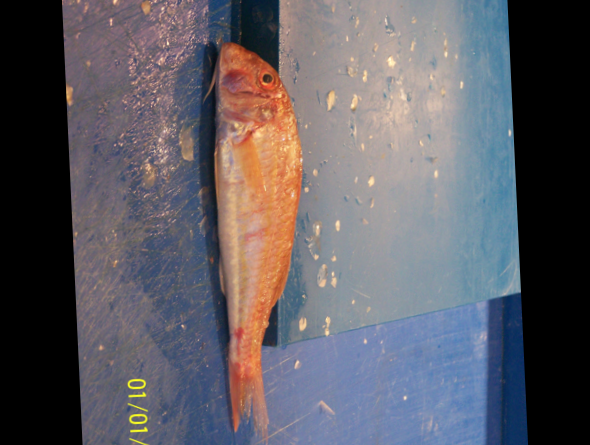

In [34]:
Image.fromarray(ds.images[0].numpy())

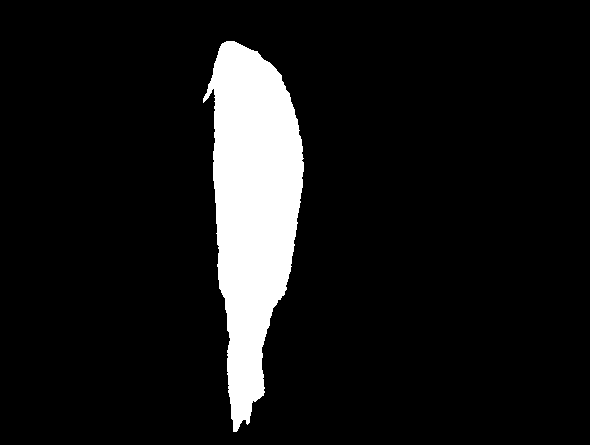

In [35]:
Image.fromarray(ds.masks[0].numpy()*255) # grayscale mask

# could also use plt.imshow(ds.masks[0].numpy(), cmap='gray')

Check the dataset was correctly uploaded to Hub

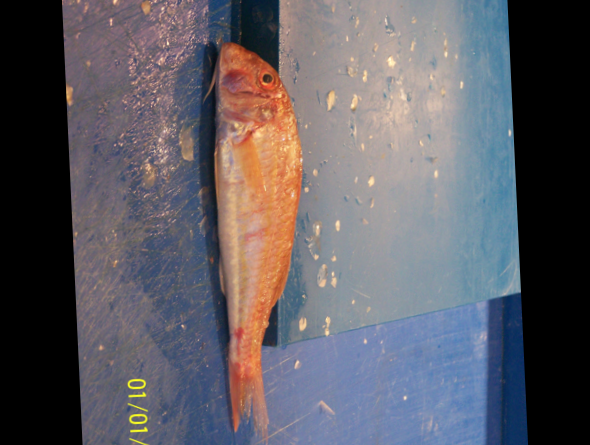

In [36]:
ds_from_hub = hub.dataset(hub_fish_path)
Image.fromarray(ds_from_hub.images[0].numpy())

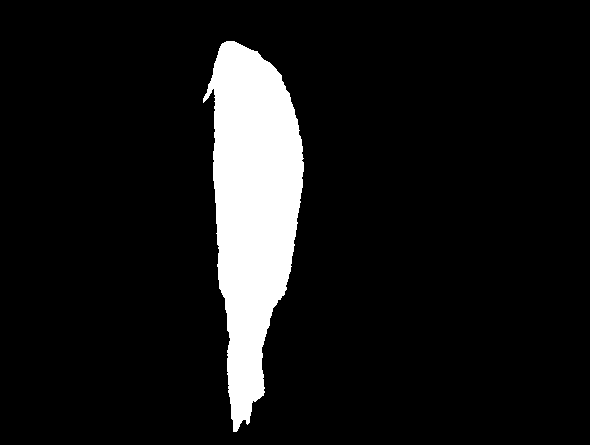

In [37]:
Image.fromarray(ds_from_hub.masks[0].numpy()*255) # grayscale mask

In [38]:
# Which letter or number is that?
print(class_names[ds_from_hub.labels[0].numpy()[0]])

Striped Red Mullet



Black Sea Sprat


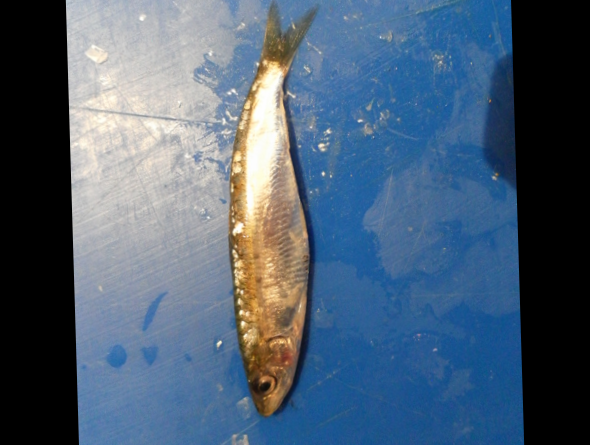

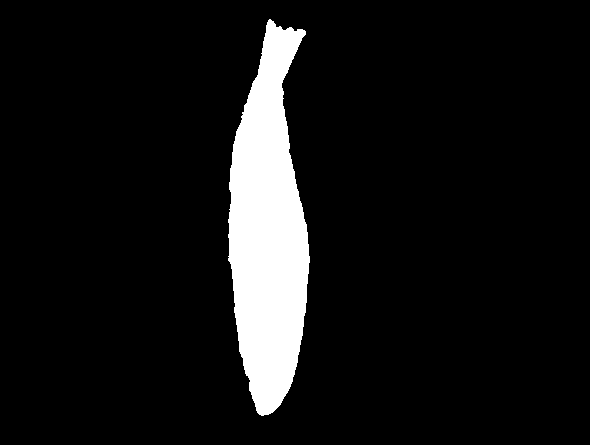


Hourse Mackerel


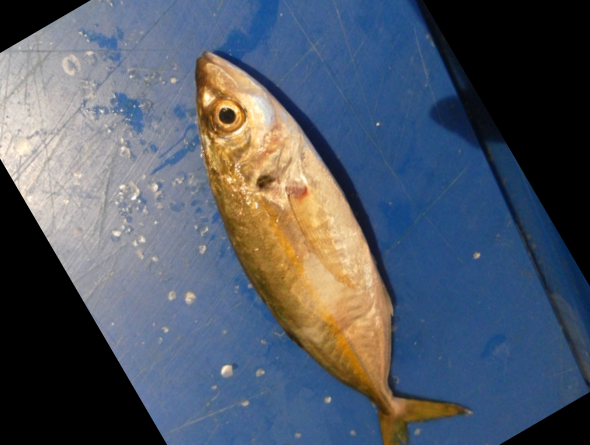

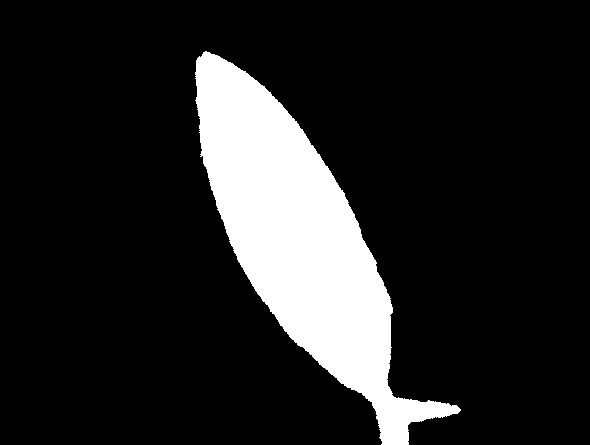


Shrimp


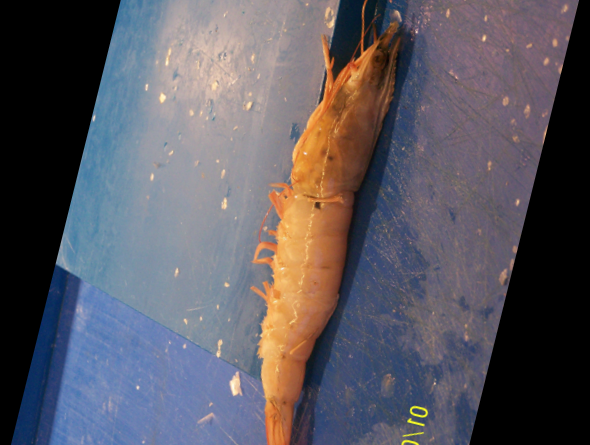

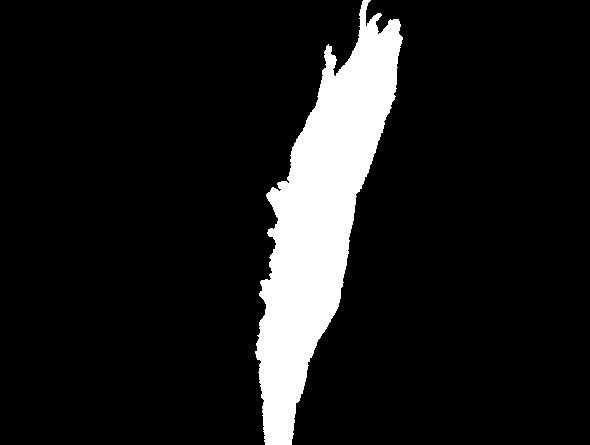


Shrimp


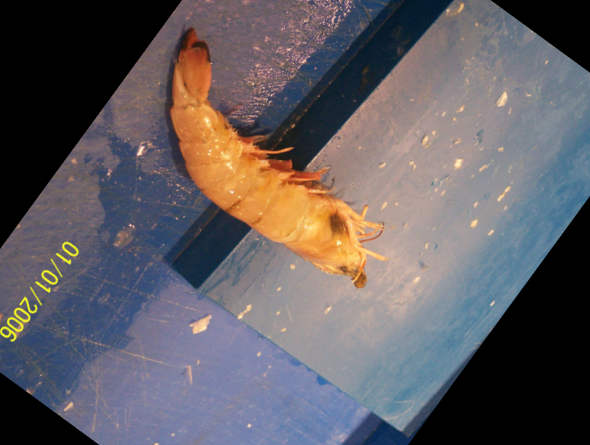

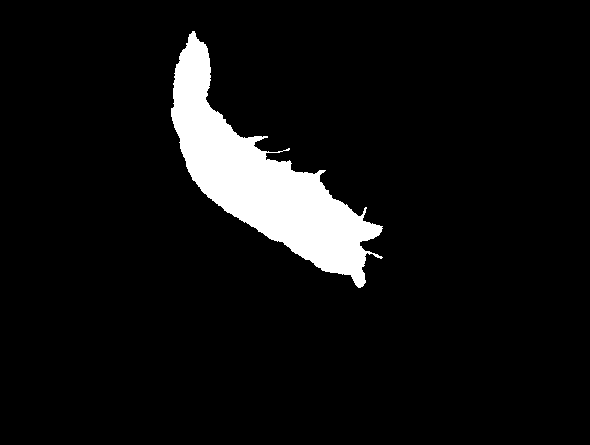


Black Sea Sprat


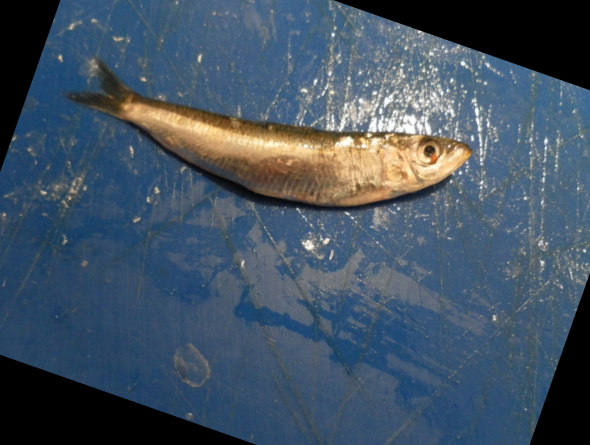

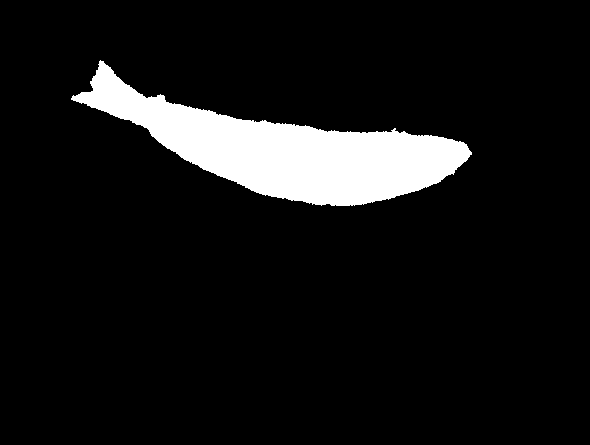


Red Sea Bream


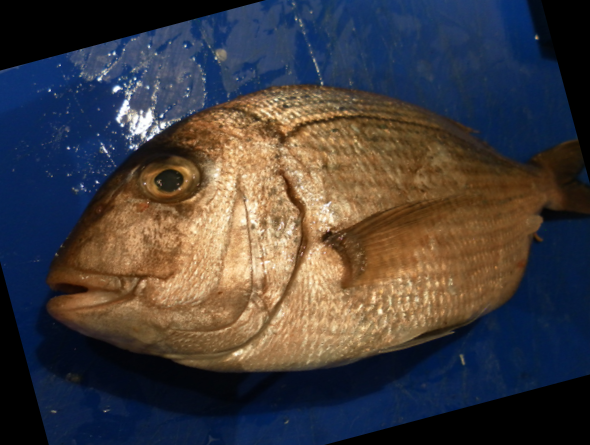

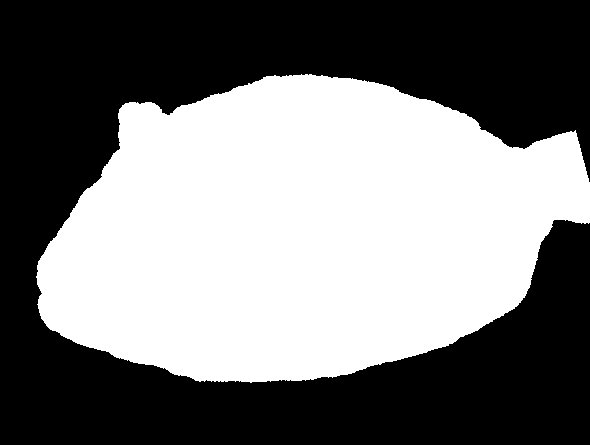


Striped Red Mullet


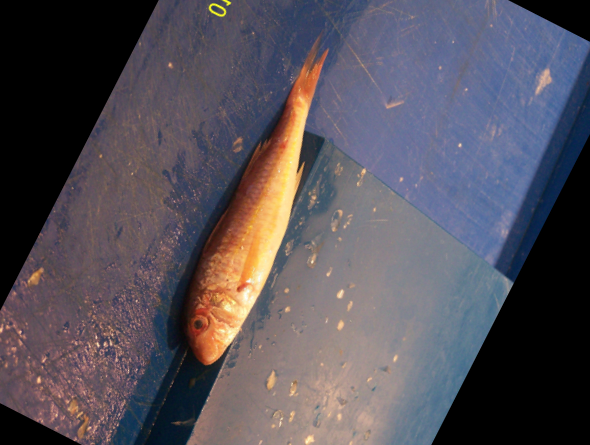

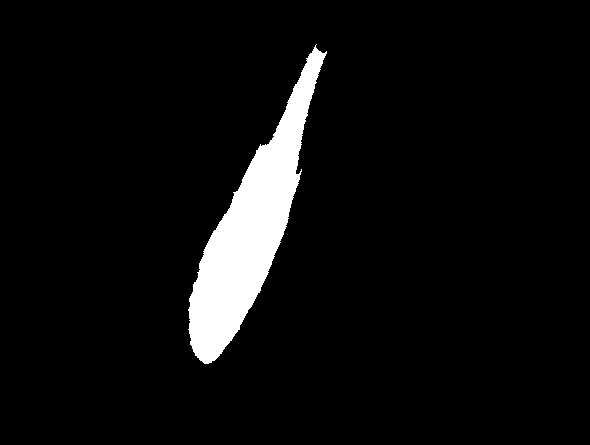


Black Sea Sprat


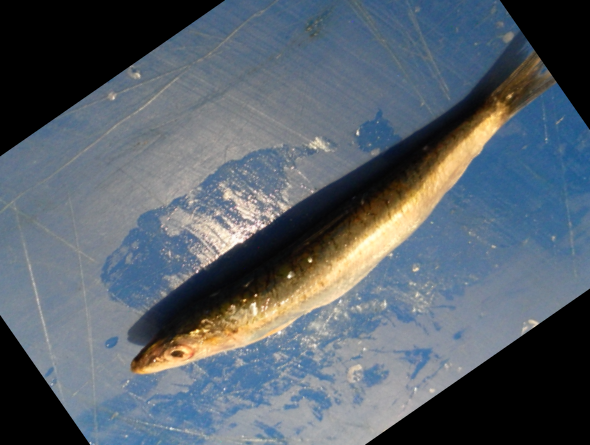

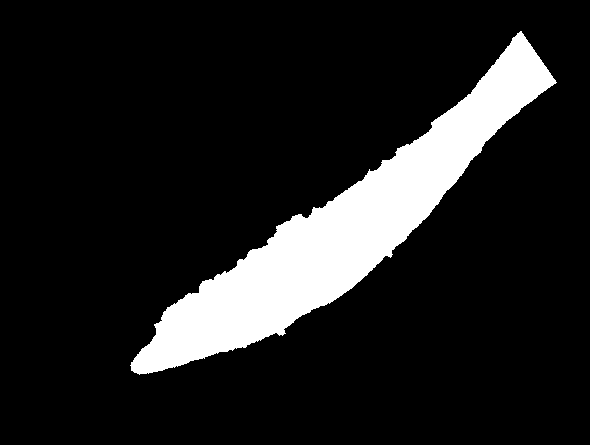

In [73]:
import random

list_random = [random.randint(0,len(ds_from_hub)) for i in range(8)]
for i in list_random:
  print(f'\n{class_names[ds_from_hub.labels[i].numpy()[0]]}')
  Image.fromarray(ds_from_hub.images[i].numpy()).show()
  Image.fromarray(ds_from_hub.masks[i].numpy()*255).show()

With Hub Multiprocessing: https://docs.activeloop.ai/getting-started/parallel-computing

In [66]:
@hub.compute
def file_to_hub(path_to_pair_img_mask, sample_out, class_names):
    file_image = path_to_pair_img_mask[0]
    file_mask = path_to_pair_img_mask[1]

    label_text = os.path.basename(os.path.dirname(file_image))
    label_num = class_names.index(label_text)

    # Append the label and image to the output sample
    sample_out.labels.append(np.uint32(label_num))
    sample_out.images.append(hub.read(file_image))
    sample_out.masks.append(hub.read(file_mask))
    
    return sample_out

In [75]:
# Creating a list that combined the paths to the pairs image/mask 
list_pairs_img_mask = [[files_in_fish_set_images[i], files_in_fish_set_GT[i]] for i in range(len(files_in_fish_set_images))]

list_pairs_img_mask[0]

['./Fish_Dataset/Fish_Dataset/Striped Red Mullet/Striped Red Mullet/00361.png',
 './Fish_Dataset/Fish_Dataset/Striped Red Mullet/Striped Red Mullet GT/00361.png']

In [76]:
hub_fish_path_parallel_computing = 'hub://margauxmforsythe/fish_dataset_parallel_computing'

# Setting up timer to perform benchmarking
start = timer()

with hub.empty(hub_fish_path_parallel_computing, overwrite=True) as ds:
    ds.create_tensor('images', htype = 'image', sample_compression = 'png')
    ds.create_tensor('masks', htype = 'image', sample_compression = 'png')
    ds.create_tensor('labels', htype = 'class_label', class_names = class_names)
    
    file_to_hub(class_names=class_names).eval(list_pairs_img_mask, ds, num_workers = 10)

# End timer
end = timer()
total_time_hub = end-start

print(f"Uploading all the files in the Fish dataset to Hub with parallel computing took {total_time_hub} seconds")

Uploading all the files in the Fish dataset to Hub with parallel computing took 182.68960309999966 seconds



Black Sea Sprat


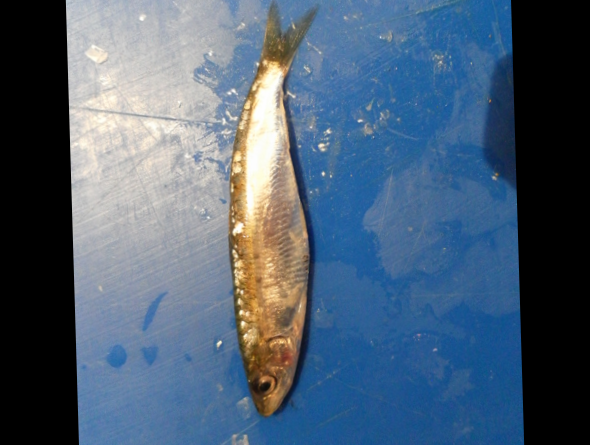

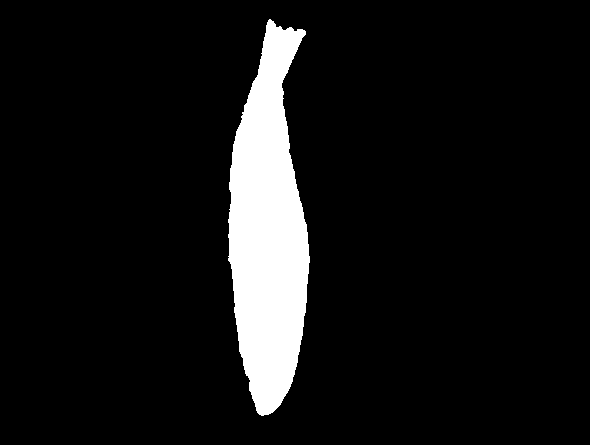


Hourse Mackerel


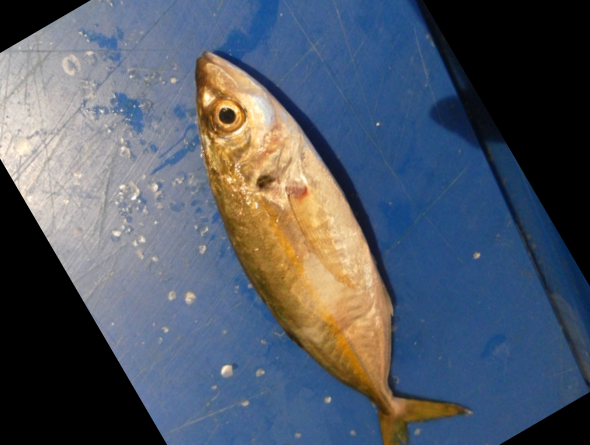

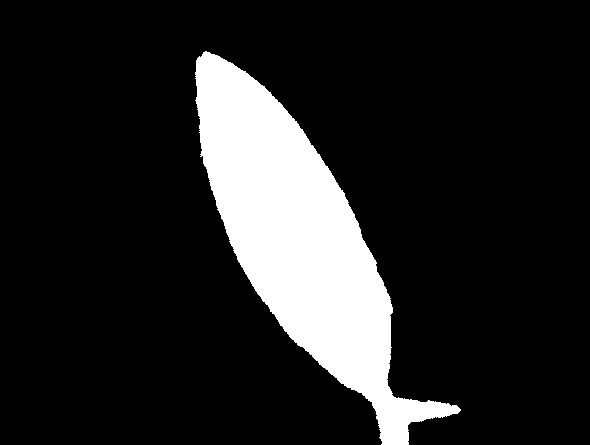


Shrimp


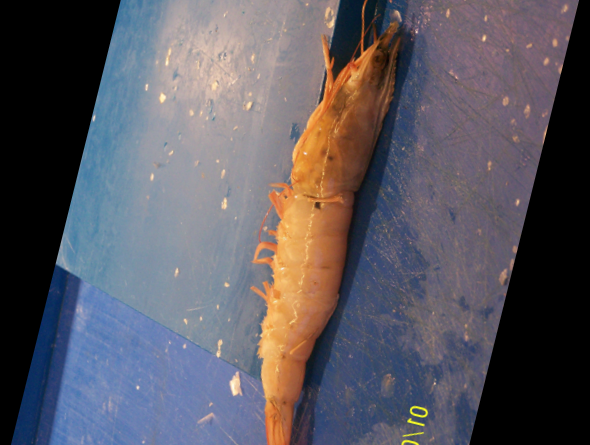

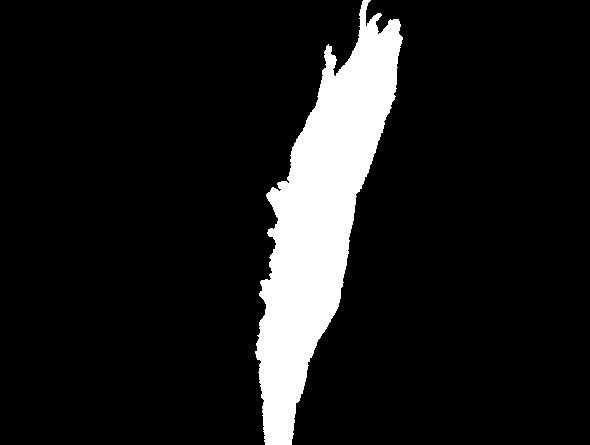


Shrimp


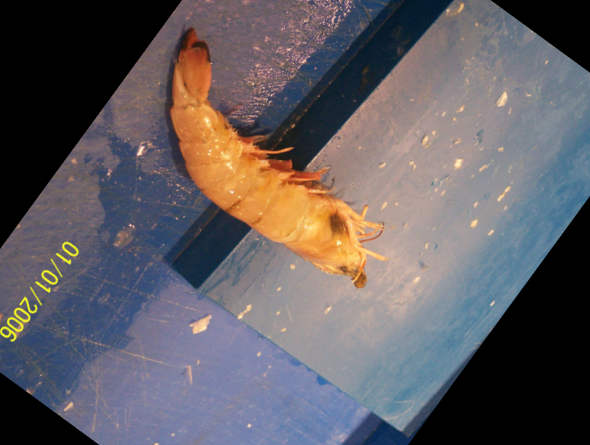

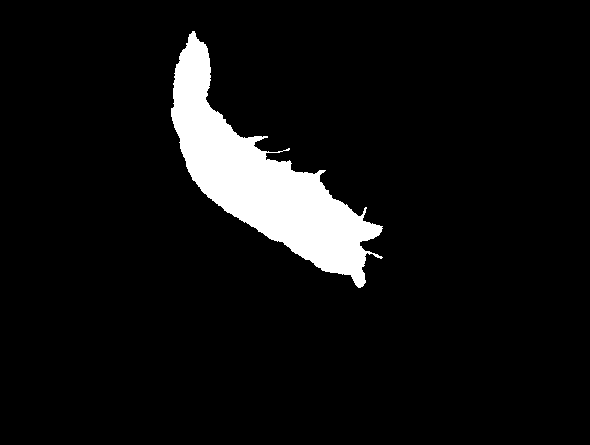


Black Sea Sprat


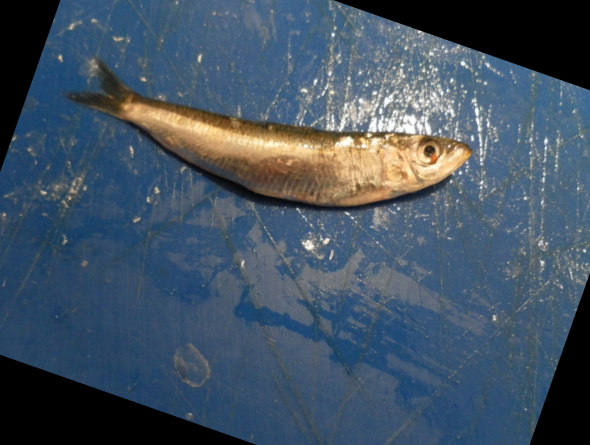

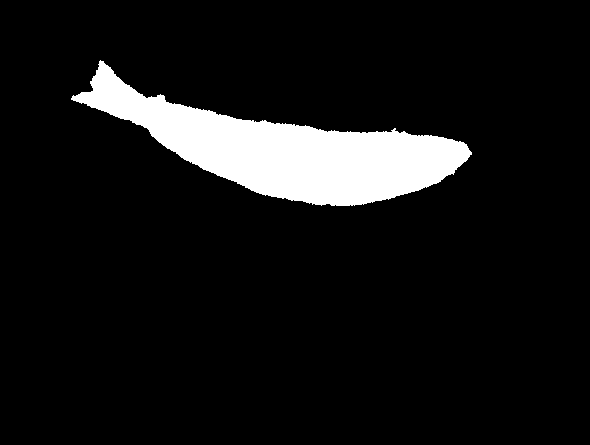


Red Sea Bream


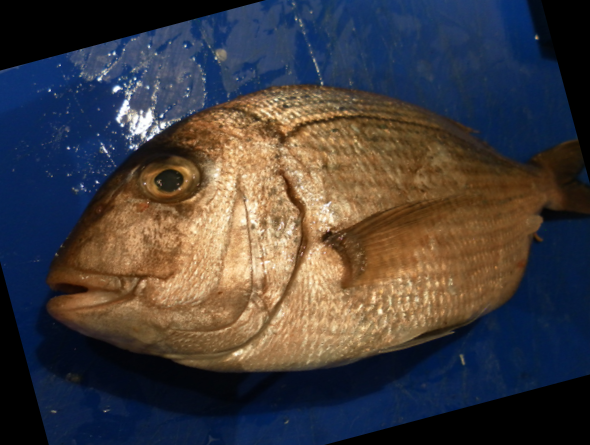

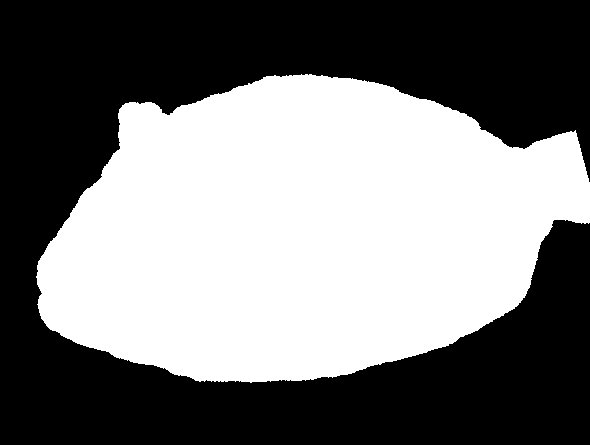


Striped Red Mullet


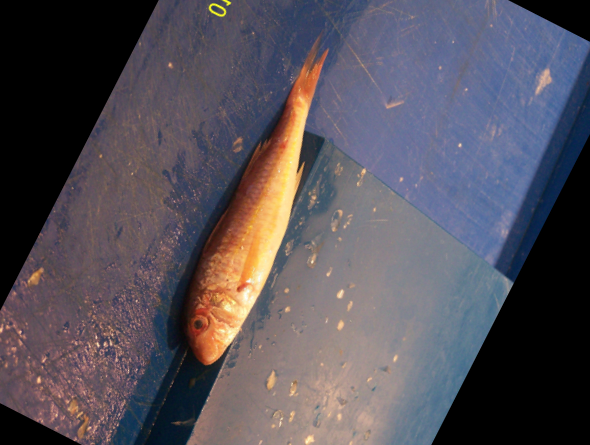

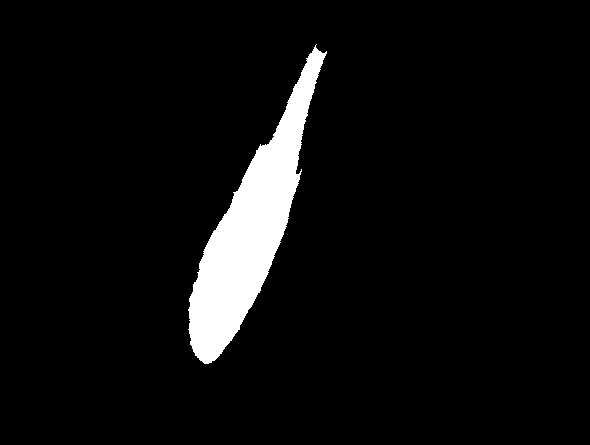


Black Sea Sprat


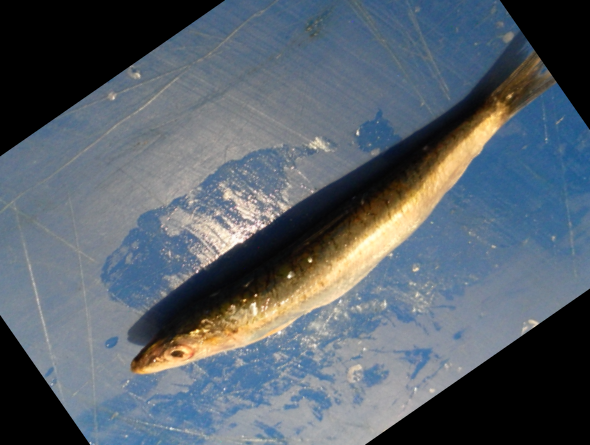

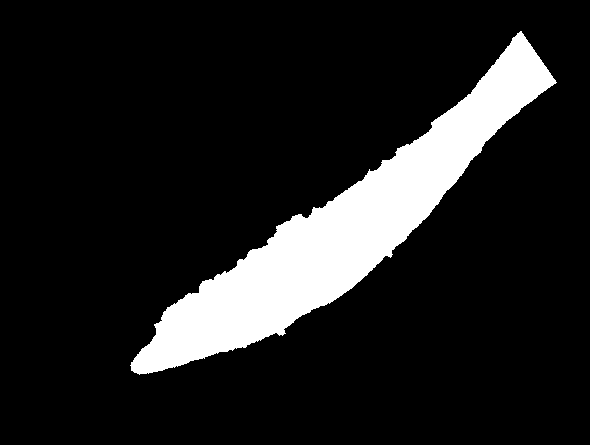

In [77]:
ds_from_hub_parallel_computing = hub.dataset(hub_fish_path_parallel_computing)

for i in list_random:
  print(f'\n{class_names[ds_from_hub_parallel_computing.labels[i].numpy()[0]]}')
  Image.fromarray(ds_from_hub_parallel_computing.images[i].numpy()).show()
   # grayscale mask
  Image.fromarray(ds_from_hub_parallel_computing.masks[i].numpy()*255).show()